# Modeling

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from IPython import display
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV, RepeatedKFold
from sklearn.metrics import r2_score, mean_squared_error as mse, mean_absolute_error as mae, SCORERS
from sklearn.dummy import DummyRegressor
from catboost import Pool, CatBoostRegressor, cv
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from hyperopt import fmin, tpe, hp, Trials
from sklearn.inspection import permutation_importance

In [2]:
#load dataframe OHE
#parse datetime column
df_ohe = pd.read_csv('ohe_data_PRCP.csv', parse_dates=['date'])
df_ohe.drop(columns='Unnamed: 0', inplace=True)
df_ohe.set_index('date', inplace=True)

In [4]:
df_ohe.head()

,Avg_Temp(F),PRCP(mm),Conf_Cases,day_of_week,day_of_year,Year,Month,Day,new_case_percent_pop*,state_id_CT,state_id_MA,state_id_ME,state_id_VT
date,,,,,,,,,,,,,
2020-03-01,26.42,0.0,1.0,6,61,2020,3,1,0.014225,0,1,0,0
2020-03-02,36.50,0.0,1.0,0,62,2020,3,2,0.014225,0,1,0,0
2020-03-03,55.94,0.0,1.0,1,63,2020,3,3,0.014225,0,1,0,0
2020-03-04,46.94,2.5,2.0,2,64,2020,3,4,0.028450,0,1,0,0
2020-03-05,42.98,0.0,8.0,3,65,2020,3,5,0.113799,0,1,0,0


## Train-test split

Before training any models on the data, let's do a train-test split to keep training and testing data consistent and separated.

In [5]:
len(df_ohe)

2224

In [6]:
bins = np.linspace(0, 2224, 200)

In [7]:
# Create features
X, y = df_ohe.drop(columns=['Conf_Cases', 'new_case_percent_pop*']), df_ohe['new_case_percent_pop*']

In [8]:
y_binned = np.digitize(y, bins)

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y_binned, random_state=42)

## Using the mean as a baseline prediction model

Previously, we determined the R2 score of using the mean to predict COVID19 cases for each individual state. Let's do the same thing now that we have all the states in one DataFrame, so that we will have a baseline "dummy" model to compare our future optimized models to. 

In [10]:
dummy_mean = DummyRegressor()
# "Train" dummy regressor
dummy_mean.fit(X_train, y_train)
# Get R2 score
score_dummy = dummy_mean.score(X_test, y_test)
print("The R2 score of using the mean to predict COVID19 cases in our states is:", score_dummy)

The R2 score of using the mean to predict COVID19 cases in our states is: -0.0008611149015183006


Let's store the evaluation metric values for the dummy regressor so we can compare them with our future models. 

In [11]:
dummy_pred = dummy_mean.predict(X_test)
dummy_r2 = r2_score(y_test, dummy_pred)
dummy_mse = mse(y_test, dummy_pred)
dummy_rmse = np.sqrt(mse(y_test, dummy_pred))

## Tuning the top performing models for ensemble model

In the pre-processing step, we determined (with the help of Pycaret) that our top performing models were **CatBoost Regressor**, **Random Forest Regressor**, and **Extra Trees Regressor**. Let's now fine tune the hyperparameters of each of these models, using Coarse to Fine hyperparameter tuning, as well as Bayesian Optimization (where applicable), in preparation for feeding them into the pipeline of the Voting Regressor. 

### 1. Random Forest Regressor
With a few exceptions, a RandomForestClassifier has all the hyperparameters of a DecisionTreeClassifier (to control how trees are grown), plus all the hyperparameters of a BaggingClassifier to control the ensemble itself. I'll explore a couple different ways to determine optimal hyperparameters and will choose those that produce the best R2 and MSE for the final ensemble model (a VotingRegressor).

First, let's run a basic hyperparameter grid search and check the resulting R2, MSE, and RMSE. Then we'll put these values in a DataFrame with the those obtained from the dummy regressor (above) and compare the results of each set of hyperparameters determined throughout the course of the Coarse to Fine hyperparameter tuning process.

In [12]:
# Define parameters to search for GridSearchCV
basic_param_grid = {'n_estimators': [100, 300, 500, 900, 1200],
              'max_depth': [3, 5, 20, 50, 100],
              }
# Instantiate RandomForestRegressor
basic_rf = RandomForestRegressor(random_state=42)
cv_rf = GridSearchCV(basic_rf, basic_param_grid, cv = 5)
cv_rf_fit = cv_rf.fit(X_train, y_train)

In [13]:
print('The optimal max_depth for the RandomForestRegressor is: {}'.format(cv_rf_fit.best_params_['max_depth']))
print('The optimal n_estimators for the RandomForestRegressor is: {}'.format(cv_rf_fit.best_params_['n_estimators']))

The optimal max_depth for the RandomForestRegressor is: 20
The optimal n_estimators for the RandomForestRegressor is: 300


In [14]:
# Instantiate RFR with optimal hyperparameters
basic_rf = RandomForestRegressor(max_depth = 20, n_estimators = 300, random_state=42)
basic_rf.fit(X_train, y_train)
basic_rf_pred = basic_rf.predict(X_test)

In [15]:
# Calculate evaluation metrics on basic_rf
basic_rf_r2 = r2_score(y_test, basic_rf_pred)
basic_rf_mse = mse(y_test, basic_rf_pred)
basic_rf_rmse = np.sqrt(basic_rf_mse)

In [16]:
# Create RF results dataframe
rf_results = pd.DataFrame({'Model':['dummy_reg', 'basic_rf'], 'R2': [dummy_r2, basic_rf_r2], 'MSE':[dummy_mse, basic_rf_mse], 'RMSE':[dummy_rmse, basic_rf_rmse]})

In [17]:
rf_results

,Model,R2,MSE,RMSE
0,dummy_reg,-0.000861,284.483911,16.866651
1,basic_rf,0.843261,44.551384,6.674682


***

#### Using RandomSearchCV to find optimal hyperparameter values
Now let's perform RandomizedSearchCV across a broader range of hyperparameters (and values) to get an idea of where to focus a grid search of a more comprehensive range of hyperparamters than those evaluated in the basic grid search above.

In [18]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(20, 120, num = 11)]
max_depth.append(None)
#max_depth.append(9)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4, 10]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [19]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, n_jobs=-1, random_state=42)
# Fit the random search model
rf_random.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   49.9s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  2.4min finished


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [20, 30, 40, 50, 60, 70,
                                                      80, 90, 100, 110, 120,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4, 10],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000]},
                   random_state=42, verbose=2)

In [20]:
rf_random.best_params_

{'n_estimators': 300,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 120,
 'bootstrap': True}

In [21]:
# Instantiate RFR with optimal hyperparameters
rf2 = RandomForestRegressor(n_estimators= 300,
                             min_samples_split= 2,
                             min_samples_leaf= 1,
                             max_features= 'auto',
                             max_depth= 120,
                             bootstrap= True, 
                             random_state=42)
rf2.fit(X_train, y_train)
rf_pred2 = rf2.predict(X_test)

In [22]:
# Determine R2, MSE, RMSE 
rf_random_r2 = r2_score(y_test, rf_pred2)
rf_random_mse = mse(y_test, rf_pred2)
rf_random_rmse = np.sqrt(mse(y_test, rf_pred2))

In [23]:
# Add results to rf_results df
rf_results.loc[len(rf_results)]= ['rf_randomCV', 
                                 r2_score(y_test, rf_pred2),
                                 mse(y_test, rf_pred2),
                                 np.sqrt(mse(y_test, rf_pred2))]

In [24]:
rf_results

,Model,R2,MSE,RMSE
0,dummy_reg,-0.000861,284.483911,16.866651
1,basic_rf,0.843261,44.551384,6.674682
2,rf_randomCV,0.845417,43.938677,6.628626


***

### Using GridSearchCV to find the optimal hyperparameter values
We can now use the insights we gained from the above random search to perform a grid search across a broader range of hyperparameters (with more focused values).

In [25]:
# Create the parameter grid based on the results of random search 
GS_param_grid = {
    'bootstrap': [True],
    'max_depth': [70, 80, 90, 100, 110],
    'max_features': ['auto'],
    'min_samples_leaf': [1, 2, 3],
    'min_samples_split': [2, 3],
    'n_estimators': [700, 800, 900, 1000, 1100]
}

In [26]:
# Create a based model
rf = RandomForestRegressor()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = GS_param_grid, 
                          cv = 5, n_jobs = -1, verbose = 2)

In [27]:
# Fit the grid search to the data
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 150 candidates, totalling 750 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   20.2s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 750 out of 750 | elapsed:  8.3min finished


GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'bootstrap': [True],
                         'max_depth': [70, 80, 90, 100, 110],
                         'max_features': ['auto'],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 3],
                         'n_estimators': [700, 800, 900, 1000, 1100]},
             verbose=2)

In [28]:
grid_search.best_params_

{'bootstrap': True,
 'max_depth': 80,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 3,
 'n_estimators': 800}

In [29]:
# Instantiate RFR with optimal hyperparameters
rf3 = RandomForestRegressor(n_estimators= 800,
                             min_samples_split= 3,
                             min_samples_leaf= 1,
                             max_features= 'auto',
                             max_depth= 80,
                             bootstrap= True)
rf3.fit(X_train, y_train)
rf_pred3 = rf3.predict(X_test)

In [30]:
# Determine R2 score
print('The R2 score for the RandomForestRegressor with GSCV tuning is {}'.format(r2_score(y_test, rf_pred3)))

The R2 score for the RandomForestRegressor with GSCV tuning is 0.8427434422140592


In [31]:
print('The MSE of the RandomForestRegressor with GSCV tuning is {}'.format(mse(y_test, rf_pred3)))

The MSE of the RandomForestRegressor with GSCV tuning is 44.69847000733934


In [32]:
# Add the results to rf_results
rf_results.loc[len(rf_results)]= ['rf_gridCV', 
                                 r2_score(y_test, rf_pred3),
                                 mse(y_test, rf_pred3),
                                 np.sqrt(mse(y_test, rf_pred3))]

In [33]:
rf_results

,Model,R2,MSE,RMSE
0,dummy_reg,-0.000861,284.483911,16.866651
1,basic_rf,0.843261,44.551384,6.674682
2,rf_randomCV,0.845417,43.938677,6.628626
3,rf_gridCV,0.842743,44.698470,6.685691


### Bayesian Optimization with hyperopt
Lastly, we'll try a different method of determining the best hyperparameter values: Bayesian Optimization. We'll use the hyperopt package across a narrower range of hyperparameters for the sake of time.

In [ ]:
#pip install hyperopt

In [34]:
trials = Trials()

In [35]:
space = {
    "n_estimators": hp.choice("n_estimators", [400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400]),
    "max_depth": hp.quniform("max_depth", 30, 120, 10),
}

In [36]:
# define objective function

def hyperparameter_tuning(params):
    rf_reg = RandomForestRegressor(**params,n_jobs=-1)
    r2 = cross_val_score(rf_reg, X_train, y_train ,scoring="r2").mean()
    return -r2

In [37]:
best = fmin(
    fn=hyperparameter_tuning,
    space = space, 
    algo=tpe.suggest, 
    max_evals=100, 
    trials=trials
)

print("Best: {}".format(best))

100%|██████████| 100/100 [08:46<00:00,  5.26s/trial, best loss: -0.827603900159686]
Best: {'max_depth': 120.0, 'n_estimators': 2}


In [39]:
# Instantiate RFR with optimal hyperparameters
rf4 = RandomForestRegressor(n_estimators= 600,
                             max_depth= 120)
                             
rf4.fit(X_train, y_train)
rf_pred4 = rf4.predict(X_test)

In [40]:
# Add results to rf_results
rf_results.loc[len(rf_results)]= ['rf_bayes_hyperopt', 
                                 r2_score(y_test, rf_pred4),
                                 mse(y_test, rf_pred4),
                                 np.sqrt(mse(y_test, rf_pred4))]

In [41]:
rf_results

,Model,R2,MSE,RMSE
0,dummy_reg,-0.000861,284.483911,16.866651
1,basic_rf,0.843261,44.551384,6.674682
2,rf_randomCV,0.845417,43.938677,6.628626
3,rf_gridCV,0.842743,44.698470,6.685691
4,rf_bayes_hyperopt,0.843504,44.482246,6.669501


$\star$ All of our Random Forest Regressors performed remarkably similarly. However, it looks like the optimal hyperparameters chosen by our original basic grid search and our random search performed the best, both in terms of the R2 and mean squared error. Because we tested a wider range of hyperparameters in the random search, we'll use those hyperparameters (as defined in `rf_randomCV`) in our final Voting Regressor ensemble.

***

## 2. Extra Trees Regressor
Now let's determine some optimal hyperparameters for the second estimator in our Voting Regressor: an Extra Trees Regressor. We'll repeat the same process we used for our Random Forest Regressor above, using Coarse to Fine hyperparameter tuning, as well as experimenting with Bayesian Optimization. We'll put the results of each of these searches in a DataFrame for easy comparison, and select the best set of hyperparameters. 

### Using basic hyperparameter tuning only

In [42]:
# Define parameters to search for GridSearchCV
param_grid = {'n_estimators': [100, 300, 500, 900, 1200],
              'max_depth': [3, 5, 20, 50, 100],
              }
# Instantiate ExtraTreesRegressor
et = ExtraTreesRegressor(random_state=42)
cv_et = GridSearchCV(et, param_grid, cv = 5)
cv_et_fit = cv_et.fit(X_train, y_train)

#Print the best parameter
print(cv_et_fit.best_params_)

{'max_depth': 20, 'n_estimators': 1200}


In [43]:
print('The optimal max_depth for the ExtraTreesRegressor is: {}'.format(cv_et_fit.best_params_['max_depth']))
print('The optimal n_estimators for the ExtraTreesRegressor is: {}'.format(cv_et_fit.best_params_['n_estimators']))

The optimal max_depth for the ExtraTreesRegressor is: 20
The optimal n_estimators for the ExtraTreesRegressor is: 1200


In [44]:
# Instantiate ETR with optimal hyperparameters
et_basic = RandomForestRegressor(max_depth = 50, n_estimators = 1200)
et_basic.fit(X_train, y_train)
et_basic_pred = et_basic.predict(X_test)

In [45]:
# Determine R2 score
print('The R2 score for the basic Extra Trees Regressor is {}'.format(r2_score(y_test, et_basic_pred)))

The R2 score for the basic Extra Trees Regressor is 0.8422470328519734


In [46]:
print('The MSE of the basic ExtraTreesRegressor is {}'.format(mse(y_test, et_basic_pred)))

The MSE of the basic ExtraTreesRegressor is 44.83956898149311


In [47]:
# Calculate results
basic_et_r2 = r2_score(y_test, et_basic_pred)
basic_et_mse = mse(y_test, et_basic_pred)
basic_et_rmse = np.sqrt(mse(y_test, et_basic_pred))

In [48]:
# Create ET DataFrame with dummy regressor results
et_results = pd.DataFrame({'Model':['dummy_reg', 'basic_et'], 'R2': [dummy_r2, basic_et_r2], 'MSE':[dummy_mse, basic_et_mse], 'RMSE':[dummy_rmse, basic_et_rmse]})

In [49]:
et_results

,Model,R2,MSE,RMSE
0,dummy_reg,-0.000861,284.483911,16.866651
1,basic_et,0.842247,44.839569,6.696235


***

### Using RandomSearchCV to find optimal hyperparameter values

In [50]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(30, 140, num = 12)]
max_depth.append(None)
#max_depth.append(9)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4, 10]
# Method of selecting samples for training each tree
bootstrap = [True]

# Create the random grid
random_grid_et = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

print(random_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000], 'max_features': ['auto', 'sqrt'], 'max_depth': [20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4, 10], 'bootstrap': [True, False]}


In [51]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
et = ExtraTreesRegressor(random_state=42)
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
et2 = RandomizedSearchCV(estimator = et, param_distributions = random_grid, n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
et2.fit(X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   31.9s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  1.8min finished


RandomizedSearchCV(cv=5, estimator=ExtraTreesRegressor(random_state=42),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [20, 30, 40, 50, 60, 70,
                                                      80, 90, 100, 110, 120,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4, 10],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000]},
                   random_state=42, verbose=2)

In [52]:
et2.best_params_

{'n_estimators': 300,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'auto',
 'max_depth': 120,
 'bootstrap': True}

In [53]:
# Instantiate RFR with optimal hyperparameters
et_random = ExtraTreesRegressor(n_estimators= 300,
                             min_samples_split= 2,
                             min_samples_leaf= 1,
                             max_features= 'auto',
                             max_depth= 120,
                             bootstrap= True)
et_random.fit(X_train, y_train)
et_random_pred = et_random.predict(X_test)

In [54]:
# Determine R2 score
print('The R2 score for the ExtraTreesRegressor with RSCV tuning is {}'.format(r2_score(y_test, et_random_pred)))

The R2 score for the ExtraTreesRegressor with RSCV tuning is 0.848553138311233


In [55]:
print('The MSE of the ExtraTreesRegressor with RSCV tuning is {}'.format(mse(y_test, et_random_pred)))

The MSE of the ExtraTreesRegressor with RSCV tuning is 43.0471269383605


In [56]:
# Add results
et_results.loc[len(et_results)]= ['et_randomCV', 
                                 r2_score(y_test, et_random_pred),
                                 mse(y_test, et_random_pred),
                                 np.sqrt(mse(y_test, et_random_pred))]

In [57]:
et_results

,Model,R2,MSE,RMSE
0,dummy_reg,-0.000861,284.483911,16.866651
1,basic_et,0.842247,44.839569,6.696235
2,et_randomCV,0.848553,43.047127,6.561031


#### Using GridSearchCV to find the optimal hyperparamter values

In [58]:
# Create the parameter grid based on the results of random search 
GS_param_grid_et = {
    'bootstrap': [True],
    'max_depth': np.linspace(40, 150, 12),
    'max_features': ['auto'],
    'min_samples_leaf': [2, 3],
    'min_samples_split': [2, 3, 4],
    'n_estimators': [300, 500, 800, 1000, 1200, 1600]
}

In [59]:
# Create a base model
et = ExtraTreesRegressor()
# Instantiate the grid search model
et3 = GridSearchCV(estimator = et, param_grid = GS_param_grid_et, 
                          cv = 5, n_jobs = -1, verbose = 2)

In [60]:
# Fit the grid search to the data
et3.fit(X_train, y_train)

Fitting 5 folds for each of 432 candidates, totalling 2160 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   11.8s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   59.7s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 997 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done 1442 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 1969 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 2160 out of 2160 | elapsed: 13.2min finished


GridSearchCV(cv=5, estimator=ExtraTreesRegressor(), n_jobs=-1,
             param_grid={'bootstrap': [True],
                         'max_depth': array([ 40.,  50.,  60.,  70.,  80.,  90., 100., 110., 120., 130., 140.,
       150.]),
                         'max_features': ['auto'], 'min_samples_leaf': [2, 3],
                         'min_samples_split': [2, 3, 4],
                         'n_estimators': [300, 500, 800, 1000, 1200, 1600]},
             verbose=2)

In [61]:
et3.best_params_

{'bootstrap': True,
 'max_depth': 100.0,
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'min_samples_split': 3,
 'n_estimators': 800}

In [62]:
# Instantiate RFR with optimal hyperparameters
et_grid = ExtraTreesRegressor(n_estimators= 800,
                             min_samples_split= 3,
                             min_samples_leaf= 2,
                             max_features= 'auto',
                             max_depth= 100,
                             bootstrap= True)
et_grid.fit(X_train, y_train)
et_grid_pred = et_grid.predict(X_test)

In [63]:
# Determine R2 score
print('The R2 score for the Extra Trees Regressor with GSCV is {}'.format(r2_score(y_test, et_grid_pred)))

The R2 score for the Extra Trees Regressor with GSCV is 0.8517198252112655


In [64]:
print('The MSE of the ExtraTreesRegressor with GSCV is {}'.format(mse(y_test, et_grid_pred)))

The MSE of the ExtraTreesRegressor with GSCV is 42.14703055181483


In [65]:
# Add results
et_results.loc[len(et_results)]= ['et_gridCV', 
                                 r2_score(y_test, et_grid_pred),
                                 mse(y_test, et_grid_pred),
                                 np.sqrt(mse(y_test, et_grid_pred))]

In [66]:
et_results 

,Model,R2,MSE,RMSE
0,dummy_reg,-0.000861,284.483911,16.866651
1,basic_et,0.842247,44.839569,6.696235
2,et_randomCV,0.848553,43.047127,6.561031
3,et_gridCV,0.851720,42.147031,6.492074


### Bayestian Optimization with hyperopt

In [67]:
trials_et = Trials()

In [68]:
space_et = {
    "n_estimators": hp.choice("n_estimators", [400, 500, 600, 700, 800, 900, 1000, 1100, 1200]),
    "max_depth": hp.quniform("max_depth", 30, 120, 10),
}

In [69]:
best_et = fmin(
    fn=hyperparameter_tuning,
    space = space_et, 
    algo=tpe.suggest, 
    max_evals=100, 
    trials=trials_et
)

print("Best: {}".format(best))

100%|██████████| 100/100 [07:31<00:00,  4.51s/trial, best loss: -0.828069324464729]
Best: {'max_depth': 120.0, 'n_estimators': 2}


In [70]:
# Instantiate RFR with optimal hyperparameters
et4 = ExtraTreesRegressor(n_estimators= 600,
                             max_depth= 120)
                             
et4.fit(X_train, y_train)
et_pred4 = et4.predict(X_test)

In [71]:
# Add results
et_results.loc[len(rf_results)]= ['et_bayes_hyperopt', 
                                 r2_score(y_test, et_pred4),
                                 mse(y_test, et_pred4),
                                 np.sqrt(mse(y_test, et_pred4))]

In [72]:
et_results

,Model,R2,MSE,RMSE
0,dummy_reg,-0.000861,284.483911,16.866651
1,basic_et,0.842247,44.839569,6.696235
2,et_randomCV,0.848553,43.047127,6.561031
3,et_gridCV,0.851720,42.147031,6.492074
5,et_bayes_hyperopt,0.847949,43.218947,6.574112


For the Extra Trees Regressor, it seems that the hyperparameters suggested by RandomizedSearchCV (stored in `et_randomCV`) produced the best R2, MSE, and RMSE, so we'll use those hyperparameters for our final Voting Regressor.

## 3. CatBoost Regressor

Now for the third, and final, estimator in our ensemble method, a CatBoost Regressor. First we'll run the regressor without using the Pool function, and then we'll run it with the Pool function (each time testing a range of hyperparameters) to determine whether the model performs better with or without the Pool function. Then, we'll perform Coarse to Fine hyperparameter tuning, using random search and then grid search, just as with the above models. 

### Without Pool

In [73]:
cat_features_names = ['Month', 'day_of_week', 'state_id_MA', 'state_id_CT', 'state_id_VT', 'state_id_ME'] # here we specify names of categorical features
cat_features = [X.columns.get_loc(col) for col in cat_features_names]
print(cat_features)

[5, 2, 8, 7, 10, 9]


In [74]:
params = {'loss_function':'RMSE',
          'eval_metric':'R2',
          'cat_features': cat_features,
          'verbose': 200,
          'early_stopping_rounds': 200,
          'random_seed': 42
         }
cbc_1 = CatBoostRegressor(**params)
cbc_1.fit(X_train, y_train,
          eval_set=(X_test, y_test),
          use_best_model=True,
          plot=True
         );

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.051377
0:	learn: 0.0562477	test: 0.0537371	best: 0.0537371 (0)	total: 54.5ms	remaining: 54.4s
200:	learn: 0.8799164	test: 0.8071976	best: 0.8077298 (198)	total: 453ms	remaining: 1.8s
400:	learn: 0.9271904	test: 0.8202457	best: 0.8206076 (393)	total: 857ms	remaining: 1.28s
600:	learn: 0.9467809	test: 0.8263777	best: 0.8264829 (588)	total: 1.3s	remaining: 861ms
800:	learn: 0.9588522	test: 0.8310651	best: 0.8311605 (782)	total: 1.71s	remaining: 424ms
999:	learn: 0.9656759	test: 0.8308925	best: 0.8315480 (952)	total: 2.05s	remaining: 0us

bestTest = 0.8315480471
bestIteration = 952

Shrink model to first 953 iterations.


In [ ]:
#display.Image("cat_boost_wo_pool.png")

In [75]:
pred_cbc1= cbc_1.predict(X_test)

In [76]:
r2_cbc1 = r2_score(y_test, pred_cbc1)
rmse_cbc1 = np.sqrt(mse(y_test, pred_cbc1))
mse_cbc1 = mse(y_test, pred_cbc1)

In [77]:
print('Testing performance')
print('RMSE: {:.2f}'.format(rmse_cbc1))
print('MSE: {:.2f}'.format(mse_cbc1))
print('R2: {:.2f}'.format(r2_cbc1))

Testing performance
RMSE: 6.92
MSE: 47.88
R2: 0.83


### With Pool

In [78]:
train_dataset = Pool(X_train, y_train) 
test_dataset = Pool(X_test, y_test)

In [79]:
model_cbc2 = CatBoostRegressor(loss_function='RMSE', random_seed=42)

In [80]:
grid = {'iterations': [100, 150, 200],
        'learning_rate': [0.03, 0.1],
        'depth': [2, 4, 6, 8],
        'l2_leaf_reg': [0.2, 0.5, 1, 3]}

In [81]:
model_cbc2.grid_search(grid, train_dataset)

0:	learn: 22.5530769	test: 21.6607043	best: 21.6607043 (0)	total: 1.33ms	remaining: 132ms
1:	learn: 22.1938166	test: 21.3193179	best: 21.3193179 (1)	total: 2.61ms	remaining: 128ms
2:	learn: 21.8326377	test: 20.9786503	best: 20.9786503 (2)	total: 4.48ms	remaining: 145ms
3:	learn: 21.5369512	test: 20.6876417	best: 20.6876417 (3)	total: 5.82ms	remaining: 140ms
4:	learn: 21.1656528	test: 20.2935292	best: 20.2935292 (4)	total: 6.87ms	remaining: 130ms
5:	learn: 20.8120101	test: 19.9203918	best: 19.9203918 (5)	total: 8.09ms	remaining: 127ms
6:	learn: 20.4655191	test: 19.5631624	best: 19.5631624 (6)	total: 9.45ms	remaining: 126ms
7:	learn: 20.1499733	test: 19.2330796	best: 19.2330796 (7)	total: 10.3ms	remaining: 119ms
8:	learn: 19.8860348	test: 18.9784131	best: 18.9784131 (8)	total: 11.3ms	remaining: 114ms
9:	learn: 19.6193035	test: 18.6707732	best: 18.6707732 (9)	total: 12.3ms	remaining: 111ms
10:	learn: 19.3244528	test: 18.3574805	best: 18.3574805 (10)	total: 13.4ms	remaining: 108ms
11:	lear

96:	learn: 11.7618889	test: 11.0842201	best: 11.0842201 (96)	total: 39.9ms	remaining: 1.23ms
97:	learn: 11.7376476	test: 11.0556223	best: 11.0556223 (97)	total: 40.5ms	remaining: 825us
98:	learn: 11.7068912	test: 11.0400708	best: 11.0400708 (98)	total: 41.5ms	remaining: 418us
99:	learn: 11.6811626	test: 11.0258970	best: 11.0258970 (99)	total: 42.6ms	remaining: 0us

bestTest = 11.02589697
bestIteration = 99

2:	loss: 11.0258970	best: 8.8870161 (1)	total: 211ms	remaining: 6.54s
0:	learn: 21.7385992	test: 20.8638049	best: 20.8638049 (0)	total: 825us	remaining: 81.7ms
1:	learn: 20.6815973	test: 19.8687914	best: 19.8687914 (1)	total: 1.72ms	remaining: 84.1ms
2:	learn: 19.5865678	test: 18.6812556	best: 18.6812556 (2)	total: 2.56ms	remaining: 82.9ms
3:	learn: 18.6402863	test: 17.6973856	best: 17.6973856 (3)	total: 3.39ms	remaining: 81.3ms
4:	learn: 17.8287546	test: 16.8360347	best: 16.8360347 (4)	total: 4.48ms	remaining: 85.1ms
5:	learn: 17.1392124	test: 16.1001671	best: 16.1001671 (5)	total:

83:	learn: 9.2106104	test: 9.1750118	best: 9.1750118 (83)	total: 46.7ms	remaining: 8.9ms
84:	learn: 9.1906103	test: 9.1550437	best: 9.1550437 (84)	total: 47.8ms	remaining: 8.43ms
85:	learn: 9.1749254	test: 9.1553175	best: 9.1550437 (84)	total: 49.2ms	remaining: 8.01ms
86:	learn: 9.1392869	test: 9.1521743	best: 9.1521743 (86)	total: 50ms	remaining: 7.47ms
87:	learn: 9.1218943	test: 9.1393596	best: 9.1393596 (87)	total: 50.4ms	remaining: 6.88ms
88:	learn: 9.0906746	test: 9.1430369	best: 9.1393596 (87)	total: 50.9ms	remaining: 6.29ms
89:	learn: 9.0443396	test: 9.1160466	best: 9.1160466 (89)	total: 51.3ms	remaining: 5.7ms
90:	learn: 9.0300054	test: 9.1150928	best: 9.1150928 (90)	total: 51.7ms	remaining: 5.11ms
91:	learn: 8.9908654	test: 9.0943990	best: 9.0943990 (91)	total: 52.1ms	remaining: 4.53ms
92:	learn: 8.9739234	test: 9.0781773	best: 9.0781773 (92)	total: 52.5ms	remaining: 3.95ms
93:	learn: 8.9588473	test: 9.0809908	best: 9.0781773 (92)	total: 52.8ms	remaining: 3.37ms
94:	learn: 8.9

119:	learn: 11.2497314	test: 10.6979965	best: 10.6979965 (119)	total: 57.4ms	remaining: 14.3ms
120:	learn: 11.2276307	test: 10.6762103	best: 10.6762103 (120)	total: 58ms	remaining: 13.9ms
121:	learn: 11.2046526	test: 10.6432849	best: 10.6432849 (121)	total: 58.6ms	remaining: 13.5ms
122:	learn: 11.1852827	test: 10.6322201	best: 10.6322201 (122)	total: 59.3ms	remaining: 13ms
123:	learn: 11.1663122	test: 10.6154384	best: 10.6154384 (123)	total: 60.2ms	remaining: 12.6ms
124:	learn: 11.1485444	test: 10.5973666	best: 10.5973666 (124)	total: 60.7ms	remaining: 12.1ms
125:	learn: 11.1306940	test: 10.5808484	best: 10.5808484 (125)	total: 61.1ms	remaining: 11.6ms
126:	learn: 11.1023921	test: 10.5478332	best: 10.5478332 (126)	total: 61.4ms	remaining: 11.1ms
127:	learn: 11.0821368	test: 10.5381704	best: 10.5381704 (127)	total: 61.9ms	remaining: 10.6ms
128:	learn: 11.0631965	test: 10.5155704	best: 10.5155704 (128)	total: 62.3ms	remaining: 10.1ms
129:	learn: 11.0480219	test: 10.5028201	best: 10.50282

73:	learn: 9.4692026	test: 9.3985088	best: 9.3985088 (73)	total: 29.9ms	remaining: 30.8ms
74:	learn: 9.4497602	test: 9.3869718	best: 9.3869718 (74)	total: 30.5ms	remaining: 30.5ms
75:	learn: 9.3942095	test: 9.3702804	best: 9.3702804 (75)	total: 31ms	remaining: 30.2ms
76:	learn: 9.3642315	test: 9.3791730	best: 9.3702804 (75)	total: 31.4ms	remaining: 29.8ms
77:	learn: 9.3380899	test: 9.3496284	best: 9.3496284 (77)	total: 32.3ms	remaining: 29.8ms
78:	learn: 9.3013909	test: 9.3093304	best: 9.3093304 (78)	total: 33.5ms	remaining: 30.1ms
79:	learn: 9.2788257	test: 9.3047358	best: 9.3047358 (79)	total: 34.2ms	remaining: 30ms
80:	learn: 9.2328275	test: 9.2726460	best: 9.2726460 (80)	total: 35.4ms	remaining: 30.1ms
81:	learn: 9.2094967	test: 9.2514198	best: 9.2514198 (81)	total: 36.2ms	remaining: 30ms
82:	learn: 9.1776664	test: 9.2357487	best: 9.2357487 (82)	total: 37.2ms	remaining: 30.1ms
83:	learn: 9.1383596	test: 9.2196962	best: 9.2196962 (83)	total: 38.2ms	remaining: 30ms
84:	learn: 9.11612

137:	learn: 8.1567202	test: 8.4850498	best: 8.4850498 (137)	total: 64.4ms	remaining: 5.6ms
138:	learn: 8.1466571	test: 8.4743501	best: 8.4743501 (138)	total: 65ms	remaining: 5.14ms
139:	learn: 8.1306934	test: 8.4729590	best: 8.4729590 (139)	total: 65.6ms	remaining: 4.69ms
140:	learn: 8.1066697	test: 8.4509137	best: 8.4509137 (140)	total: 66.6ms	remaining: 4.25ms
141:	learn: 8.1033406	test: 8.4485475	best: 8.4485475 (141)	total: 67.3ms	remaining: 3.79ms
142:	learn: 8.0766728	test: 8.4362901	best: 8.4362901 (142)	total: 67.8ms	remaining: 3.32ms
143:	learn: 8.0627852	test: 8.4276094	best: 8.4276094 (143)	total: 68.3ms	remaining: 2.84ms
144:	learn: 8.0423688	test: 8.4160450	best: 8.4160450 (144)	total: 68.7ms	remaining: 2.37ms
145:	learn: 8.0334926	test: 8.4088519	best: 8.4088519 (145)	total: 69ms	remaining: 1.89ms
146:	learn: 8.0189362	test: 8.3824683	best: 8.3824683 (146)	total: 69.4ms	remaining: 1.42ms
147:	learn: 8.0023431	test: 8.3645128	best: 8.3645128 (147)	total: 69.8ms	remaining: 

42:	learn: 14.3452648	test: 13.3737564	best: 13.3737564 (42)	total: 20.3ms	remaining: 74.1ms
43:	learn: 14.2498978	test: 13.2931931	best: 13.2931931 (43)	total: 20.9ms	remaining: 74ms
44:	learn: 14.1956101	test: 13.2460770	best: 13.2460770 (44)	total: 21.5ms	remaining: 74ms
45:	learn: 14.1042891	test: 13.1489210	best: 13.1489210 (45)	total: 22.2ms	remaining: 74.4ms
46:	learn: 14.0285570	test: 13.0812192	best: 13.0812192 (46)	total: 23.1ms	remaining: 75.3ms
47:	learn: 13.9458448	test: 12.9949546	best: 12.9949546 (47)	total: 23.5ms	remaining: 74.5ms
48:	learn: 13.8664259	test: 12.9391632	best: 12.9391632 (48)	total: 23.9ms	remaining: 73.8ms
49:	learn: 13.7944122	test: 12.8709864	best: 12.8709864 (49)	total: 24.5ms	remaining: 73.4ms
50:	learn: 13.7278058	test: 12.8089700	best: 12.8089700 (50)	total: 24.9ms	remaining: 72.7ms
51:	learn: 13.6515010	test: 12.7522071	best: 12.7522071 (51)	total: 25.3ms	remaining: 72ms
52:	learn: 13.5869991	test: 12.6784812	best: 12.6784812 (52)	total: 25.7ms	r

7:	learn: 20.1560282	test: 19.2377925	best: 19.2377925 (7)	total: 3.81ms	remaining: 91.6ms
8:	learn: 19.8922176	test: 18.9832467	best: 18.9832467 (8)	total: 4.45ms	remaining: 94.4ms
9:	learn: 19.6257994	test: 18.6760504	best: 18.6760504 (9)	total: 5.48ms	remaining: 104ms
10:	learn: 19.3315075	test: 18.3633559	best: 18.3633559 (10)	total: 6.46ms	remaining: 111ms
11:	learn: 19.0536849	test: 18.0749524	best: 18.0749524 (11)	total: 7.32ms	remaining: 115ms
12:	learn: 18.8148099	test: 17.8573981	best: 17.8573981 (12)	total: 8.32ms	remaining: 120ms
13:	learn: 18.5566157	test: 17.5891827	best: 17.5891827 (13)	total: 9.51ms	remaining: 126ms
14:	learn: 18.3431272	test: 17.3383720	best: 17.3383720 (14)	total: 10.7ms	remaining: 131ms
15:	learn: 18.0943025	test: 17.0843006	best: 17.0843006 (15)	total: 11.5ms	remaining: 133ms
16:	learn: 17.8671131	test: 16.8461939	best: 16.8461939 (16)	total: 12.4ms	remaining: 134ms
17:	learn: 17.7000171	test: 16.6835503	best: 16.6835503 (17)	total: 13.2ms	remaining

174:	learn: 7.6765976	test: 8.2304010	best: 8.2304010 (174)	total: 82.3ms	remaining: 11.8ms
175:	learn: 7.6672079	test: 8.2078861	best: 8.2078861 (175)	total: 83.1ms	remaining: 11.3ms
176:	learn: 7.6574832	test: 8.1971233	best: 8.1971233 (176)	total: 83.6ms	remaining: 10.9ms
177:	learn: 7.6517596	test: 8.1883393	best: 8.1883393 (177)	total: 84.4ms	remaining: 10.4ms
178:	learn: 7.6354329	test: 8.1665943	best: 8.1665943 (178)	total: 85ms	remaining: 9.97ms
179:	learn: 7.6279804	test: 8.1594842	best: 8.1594842 (179)	total: 85.4ms	remaining: 9.49ms
180:	learn: 7.6229343	test: 8.1633920	best: 8.1594842 (179)	total: 85.8ms	remaining: 9.01ms
181:	learn: 7.6166182	test: 8.1579316	best: 8.1579316 (181)	total: 86.3ms	remaining: 8.53ms
182:	learn: 7.6080439	test: 8.1546388	best: 8.1546388 (182)	total: 86.9ms	remaining: 8.07ms
183:	learn: 7.6005589	test: 8.1549890	best: 8.1546388 (182)	total: 87.3ms	remaining: 7.59ms
184:	learn: 7.5913510	test: 8.1561522	best: 8.1546388 (182)	total: 88.3ms	remainin

192:	learn: 10.1458875	test: 9.7516204	best: 9.7516204 (192)	total: 165ms	remaining: 5.98ms
193:	learn: 10.1375929	test: 9.7519451	best: 9.7516204 (192)	total: 166ms	remaining: 5.13ms
194:	learn: 10.1274780	test: 9.7435217	best: 9.7435217 (194)	total: 167ms	remaining: 4.28ms
195:	learn: 10.1189665	test: 9.7387574	best: 9.7387574 (195)	total: 168ms	remaining: 3.43ms
196:	learn: 10.1092129	test: 9.7390359	best: 9.7387574 (195)	total: 169ms	remaining: 2.57ms
197:	learn: 10.0944381	test: 9.7355381	best: 9.7355381 (197)	total: 169ms	remaining: 1.71ms
198:	learn: 10.0810006	test: 9.7279733	best: 9.7279733 (198)	total: 170ms	remaining: 854us
199:	learn: 10.0699587	test: 9.7190165	best: 9.7190165 (199)	total: 171ms	remaining: 0us

bestTest = 9.71901649
bestIteration = 199

20:	loss: 9.7190165	best: 8.0528557 (17)	total: 1.82s	remaining: 6.49s
0:	learn: 21.7433192	test: 20.8662049	best: 20.8662049 (0)	total: 507us	remaining: 101ms
1:	learn: 20.6925636	test: 19.8737668	best: 19.8737668 (1)	total

165:	learn: 10.5669127	test: 10.1361570	best: 10.1361570 (165)	total: 66.3ms	remaining: 13.6ms
166:	learn: 10.5538209	test: 10.1216474	best: 10.1216474 (166)	total: 67ms	remaining: 13.2ms
167:	learn: 10.5408698	test: 10.1056322	best: 10.1056322 (167)	total: 67.7ms	remaining: 12.9ms
168:	learn: 10.5269678	test: 10.1001811	best: 10.1001811 (168)	total: 68.3ms	remaining: 12.5ms
169:	learn: 10.5120227	test: 10.0775181	best: 10.0775181 (169)	total: 69.3ms	remaining: 12.2ms
170:	learn: 10.4979136	test: 10.0631495	best: 10.0631495 (170)	total: 70.3ms	remaining: 11.9ms
171:	learn: 10.4832055	test: 10.0512950	best: 10.0512950 (171)	total: 71.2ms	remaining: 11.6ms
172:	learn: 10.4682919	test: 10.0274197	best: 10.0274197 (172)	total: 72.1ms	remaining: 11.2ms
173:	learn: 10.4553153	test: 10.0225093	best: 10.0225093 (173)	total: 73.1ms	remaining: 10.9ms
174:	learn: 10.4409659	test: 9.9983757	best: 9.9983757 (174)	total: 74.2ms	remaining: 10.6ms
175:	learn: 10.4291362	test: 9.9878888	best: 9.9878888

4:	learn: 16.9714994	test: 16.0050627	best: 16.0050627 (4)	total: 3.45ms	remaining: 65.6ms
5:	learn: 16.1009392	test: 15.1340520	best: 15.1340520 (5)	total: 4.83ms	remaining: 75.7ms
6:	learn: 15.3218244	test: 14.4038861	best: 14.4038861 (6)	total: 6.26ms	remaining: 83.2ms
7:	learn: 14.6419186	test: 13.7959172	best: 13.7959172 (7)	total: 6.88ms	remaining: 79.1ms
8:	learn: 14.0566386	test: 13.1692968	best: 13.1692968 (8)	total: 7.55ms	remaining: 76.3ms
9:	learn: 13.5301500	test: 12.6557304	best: 12.6557304 (9)	total: 8.1ms	remaining: 72.9ms
10:	learn: 13.0365727	test: 12.2264902	best: 12.2264902 (10)	total: 8.61ms	remaining: 69.7ms
11:	learn: 12.5445236	test: 11.7302097	best: 11.7302097 (11)	total: 9.18ms	remaining: 67.4ms
12:	learn: 12.2137864	test: 11.4869743	best: 11.4869743 (12)	total: 10.4ms	remaining: 69.8ms
13:	learn: 11.8411455	test: 11.1300351	best: 11.1300351 (13)	total: 12.2ms	remaining: 75ms
14:	learn: 11.4639113	test: 10.7700867	best: 10.7700867 (14)	total: 13.5ms	remaining:

24:	learn: 9.6340112	test: 9.1424002	best: 9.1424002 (24)	total: 17.9ms	remaining: 53.7ms
25:	learn: 9.4967559	test: 9.0245622	best: 9.0245622 (25)	total: 19.6ms	remaining: 55.9ms
26:	learn: 9.3650344	test: 8.9374801	best: 8.9374801 (26)	total: 20.4ms	remaining: 55.2ms
27:	learn: 9.2627659	test: 8.8618610	best: 8.8618610 (27)	total: 21ms	remaining: 54ms
28:	learn: 9.1589748	test: 8.8035429	best: 8.8035429 (28)	total: 21.6ms	remaining: 52.8ms
29:	learn: 9.0598729	test: 8.6971361	best: 8.6971361 (29)	total: 22.1ms	remaining: 51.6ms
30:	learn: 8.9766359	test: 8.6094949	best: 8.6094949 (30)	total: 22.6ms	remaining: 50.4ms
31:	learn: 8.8592733	test: 8.5303023	best: 8.5303023 (31)	total: 24ms	remaining: 51ms
32:	learn: 8.7778977	test: 8.5045040	best: 8.5045040 (32)	total: 26ms	remaining: 52.8ms
33:	learn: 8.7002102	test: 8.4236871	best: 8.4236871 (33)	total: 27.5ms	remaining: 53.5ms
34:	learn: 8.6113265	test: 8.3499506	best: 8.3499506 (34)	total: 29ms	remaining: 53.9ms
35:	learn: 8.5332951	t

92:	learn: 6.5196459	test: 7.2547269	best: 7.2547269 (92)	total: 50.8ms	remaining: 3.83ms
93:	learn: 6.4983253	test: 7.2578124	best: 7.2547269 (92)	total: 51.6ms	remaining: 3.29ms
94:	learn: 6.4804735	test: 7.2384335	best: 7.2384335 (94)	total: 52.5ms	remaining: 2.76ms
95:	learn: 6.4588721	test: 7.2401448	best: 7.2384335 (94)	total: 53.8ms	remaining: 2.24ms
96:	learn: 6.4451273	test: 7.2295475	best: 7.2295475 (96)	total: 55.1ms	remaining: 1.7ms
97:	learn: 6.4247994	test: 7.2266200	best: 7.2266200 (97)	total: 56.3ms	remaining: 1.15ms
98:	learn: 6.4057138	test: 7.2166371	best: 7.2166371 (98)	total: 57.5ms	remaining: 580us
99:	learn: 6.3715302	test: 7.1867774	best: 7.1867774 (99)	total: 58.6ms	remaining: 0us

bestTest = 7.186777438
bestIteration = 99

29:	loss: 7.1867774	best: 7.1867774 (29)	total: 2.62s	remaining: 5.77s
0:	learn: 22.4878352	test: 21.5666746	best: 21.5666746 (0)	total: 1.12ms	remaining: 111ms
1:	learn: 22.0872338	test: 21.1492029	best: 21.1492029 (1)	total: 2.39ms	remaini

72:	learn: 10.0842624	test: 9.5316695	best: 9.5316695 (72)	total: 42.9ms	remaining: 45.3ms
73:	learn: 10.0394484	test: 9.5027844	best: 9.5027844 (73)	total: 43.6ms	remaining: 44.8ms
74:	learn: 9.9892642	test: 9.4645678	best: 9.4645678 (74)	total: 44.7ms	remaining: 44.7ms
75:	learn: 9.9420968	test: 9.4313380	best: 9.4313380 (75)	total: 46.1ms	remaining: 44.9ms
76:	learn: 9.8936696	test: 9.4015265	best: 9.4015265 (76)	total: 47.5ms	remaining: 45ms
77:	learn: 9.8537622	test: 9.3757070	best: 9.3757070 (77)	total: 48.7ms	remaining: 44.9ms
78:	learn: 9.8057237	test: 9.3306194	best: 9.3306194 (78)	total: 50.1ms	remaining: 45ms
79:	learn: 9.7781623	test: 9.3060481	best: 9.3060481 (79)	total: 51.2ms	remaining: 44.8ms
80:	learn: 9.7308244	test: 9.2713566	best: 9.2713566 (80)	total: 52.3ms	remaining: 44.6ms
81:	learn: 9.6888519	test: 9.2398589	best: 9.2398589 (81)	total: 53.7ms	remaining: 44.5ms
82:	learn: 9.6610183	test: 9.2174243	best: 9.2174243 (82)	total: 55ms	remaining: 44.4ms
83:	learn: 9.6

57:	learn: 11.0162658	test: 10.2906261	best: 10.2906261 (57)	total: 33.1ms	remaining: 52.4ms
58:	learn: 10.9424291	test: 10.2256654	best: 10.2256654 (58)	total: 34.1ms	remaining: 52.6ms
59:	learn: 10.8801518	test: 10.1713478	best: 10.1713478 (59)	total: 35.3ms	remaining: 53ms
60:	learn: 10.8239030	test: 10.1274862	best: 10.1274862 (60)	total: 36.6ms	remaining: 53.5ms
61:	learn: 10.7548612	test: 10.0763218	best: 10.0763218 (61)	total: 38ms	remaining: 54ms
62:	learn: 10.6889153	test: 10.0263868	best: 10.0263868 (62)	total: 39.4ms	remaining: 54.4ms
63:	learn: 10.6174048	test: 9.9690532	best: 9.9690532 (63)	total: 40.9ms	remaining: 54.9ms
64:	learn: 10.5641904	test: 9.9208899	best: 9.9208899 (64)	total: 43ms	remaining: 56.2ms
65:	learn: 10.5040897	test: 9.8692080	best: 9.8692080 (65)	total: 44.3ms	remaining: 56.4ms
66:	learn: 10.4574717	test: 9.8148722	best: 9.8148722 (66)	total: 46.2ms	remaining: 57.3ms
67:	learn: 10.3860195	test: 9.7535786	best: 9.7535786 (67)	total: 47.5ms	remaining: 57

10:	learn: 18.7083122	test: 17.7895687	best: 17.7895687 (10)	total: 7.61ms	remaining: 96.2ms
11:	learn: 18.4159769	test: 17.4939602	best: 17.4939602 (11)	total: 8.44ms	remaining: 97.1ms
12:	learn: 18.1365475	test: 17.2069275	best: 17.2069275 (12)	total: 10ms	remaining: 106ms
13:	learn: 17.8511665	test: 16.9684727	best: 16.9684727 (13)	total: 11.7ms	remaining: 113ms
14:	learn: 17.5390076	test: 16.6551303	best: 16.6551303 (14)	total: 13.3ms	remaining: 120ms
15:	learn: 17.2857228	test: 16.4116155	best: 16.4116155 (15)	total: 14.3ms	remaining: 120ms
16:	learn: 17.0279447	test: 16.1675475	best: 16.1675475 (16)	total: 15ms	remaining: 117ms
17:	learn: 16.7683380	test: 15.8977164	best: 15.8977164 (17)	total: 15.6ms	remaining: 114ms
18:	learn: 16.4941420	test: 15.6249649	best: 15.6249649 (18)	total: 16.1ms	remaining: 111ms
19:	learn: 16.2497815	test: 15.3881189	best: 15.3881189 (19)	total: 16.7ms	remaining: 108ms
20:	learn: 16.0012923	test: 15.1485161	best: 15.1485161 (20)	total: 17.2ms	remaini

76:	learn: 6.9110725	test: 7.3348158	best: 7.3348158 (76)	total: 59.7ms	remaining: 56.6ms
77:	learn: 6.8860957	test: 7.3063576	best: 7.3063576 (77)	total: 61.2ms	remaining: 56.5ms
78:	learn: 6.8568094	test: 7.2987075	best: 7.2987075 (78)	total: 62.3ms	remaining: 56ms
79:	learn: 6.8368309	test: 7.2977703	best: 7.2977703 (79)	total: 62.9ms	remaining: 55ms
80:	learn: 6.8056225	test: 7.3004987	best: 7.2977703 (79)	total: 64ms	remaining: 54.5ms
81:	learn: 6.7779609	test: 7.2980498	best: 7.2977703 (79)	total: 64.7ms	remaining: 53.7ms
82:	learn: 6.7612898	test: 7.2925649	best: 7.2925649 (82)	total: 65.7ms	remaining: 53ms
83:	learn: 6.7345420	test: 7.2816393	best: 7.2816393 (83)	total: 66.3ms	remaining: 52.1ms
84:	learn: 6.7059419	test: 7.2838579	best: 7.2816393 (83)	total: 66.8ms	remaining: 51.1ms
85:	learn: 6.6816601	test: 7.2838623	best: 7.2816393 (83)	total: 67.4ms	remaining: 50.1ms
86:	learn: 6.6563154	test: 7.2732997	best: 7.2732997 (86)	total: 67.9ms	remaining: 49.2ms
87:	learn: 6.62678

149:	learn: 8.2728486	test: 8.2371625	best: 8.2371625 (149)	total: 112ms	remaining: 0us

bestTest = 8.237162467
bestIteration = 149

38:	loss: 8.2371625	best: 6.7887088 (37)	total: 3.62s	remaining: 5.29s
0:	learn: 21.5154978	test: 20.5450736	best: 20.5450736 (0)	total: 1.41ms	remaining: 211ms
1:	learn: 20.3009750	test: 19.2800292	best: 19.2800292 (1)	total: 2.21ms	remaining: 164ms
2:	learn: 19.2086934	test: 18.1182534	best: 18.1182534 (2)	total: 3.27ms	remaining: 160ms
3:	learn: 18.2309168	test: 17.1434903	best: 17.1434903 (3)	total: 4.2ms	remaining: 153ms
4:	learn: 17.3227104	test: 16.3546393	best: 16.3546393 (4)	total: 4.79ms	remaining: 139ms
5:	learn: 16.4477984	test: 15.4786957	best: 15.4786957 (5)	total: 5.34ms	remaining: 128ms
6:	learn: 15.6771175	test: 14.7511774	best: 14.7511774 (6)	total: 5.88ms	remaining: 120ms
7:	learn: 15.0037754	test: 14.1422853	best: 14.1422853 (7)	total: 6.42ms	remaining: 114ms
8:	learn: 14.4579213	test: 13.5901594	best: 13.5901594 (8)	total: 6.99ms	rema

65:	learn: 10.4745814	test: 9.8801311	best: 9.8801311 (65)	total: 54.1ms	remaining: 110ms
66:	learn: 10.4286629	test: 9.8262830	best: 9.8262830 (66)	total: 55ms	remaining: 109ms
67:	learn: 10.3625229	test: 9.7734294	best: 9.7734294 (67)	total: 56.1ms	remaining: 109ms
68:	learn: 10.3037856	test: 9.7162577	best: 9.7162577 (68)	total: 56.8ms	remaining: 108ms
69:	learn: 10.2438635	test: 9.6733951	best: 9.6733951 (69)	total: 57.8ms	remaining: 107ms
70:	learn: 10.1901003	test: 9.6338551	best: 9.6338551 (70)	total: 59.1ms	remaining: 107ms
71:	learn: 10.1386907	test: 9.5823211	best: 9.5823211 (71)	total: 60.4ms	remaining: 107ms
72:	learn: 10.0842624	test: 9.5316695	best: 9.5316695 (72)	total: 61ms	remaining: 106ms
73:	learn: 10.0394484	test: 9.5027844	best: 9.5027844 (73)	total: 61.9ms	remaining: 105ms
74:	learn: 9.9892642	test: 9.4645678	best: 9.4645678 (74)	total: 62.5ms	remaining: 104ms
75:	learn: 9.9420968	test: 9.4313380	best: 9.4313380 (75)	total: 63.2ms	remaining: 103ms
76:	learn: 9.893

78:	learn: 6.7234877	test: 7.2561906	best: 7.2460261 (75)	total: 61.3ms	remaining: 93.9ms
79:	learn: 6.7015756	test: 7.2606300	best: 7.2460261 (75)	total: 62.1ms	remaining: 93.2ms
80:	learn: 6.6760557	test: 7.2465394	best: 7.2460261 (75)	total: 63.3ms	remaining: 93ms
81:	learn: 6.6601230	test: 7.2544847	best: 7.2460261 (75)	total: 64.5ms	remaining: 92.8ms
82:	learn: 6.6425461	test: 7.2408785	best: 7.2408785 (82)	total: 65.5ms	remaining: 92.3ms
83:	learn: 6.6239447	test: 7.2388351	best: 7.2388351 (83)	total: 66.1ms	remaining: 91.3ms
84:	learn: 6.5866295	test: 7.2563209	best: 7.2388351 (83)	total: 67ms	remaining: 90.7ms
85:	learn: 6.5612792	test: 7.2480444	best: 7.2388351 (83)	total: 67.9ms	remaining: 90ms
86:	learn: 6.5380498	test: 7.2367399	best: 7.2367399 (86)	total: 68.5ms	remaining: 89ms
87:	learn: 6.5199613	test: 7.2532577	best: 7.2367399 (86)	total: 69.1ms	remaining: 87.9ms
88:	learn: 6.4904221	test: 7.2662420	best: 7.2367399 (86)	total: 69.6ms	remaining: 86.8ms
89:	learn: 6.45871

106:	learn: 8.8992956	test: 8.6268649	best: 8.6268649 (106)	total: 78.7ms	remaining: 68.4ms
107:	learn: 8.8728942	test: 8.6065175	best: 8.6065175 (107)	total: 79.9ms	remaining: 68.1ms
108:	learn: 8.8396496	test: 8.5894975	best: 8.5894975 (108)	total: 80.9ms	remaining: 67.6ms
109:	learn: 8.8232689	test: 8.5856412	best: 8.5856412 (109)	total: 82.6ms	remaining: 67.6ms
110:	learn: 8.7991527	test: 8.5601675	best: 8.5601675 (110)	total: 83.6ms	remaining: 67.1ms
111:	learn: 8.7808628	test: 8.5447610	best: 8.5447610 (111)	total: 84.2ms	remaining: 66.2ms
112:	learn: 8.7587091	test: 8.5366779	best: 8.5366779 (112)	total: 85ms	remaining: 65.5ms
113:	learn: 8.7344316	test: 8.5210161	best: 8.5210161 (113)	total: 85.6ms	remaining: 64.6ms
114:	learn: 8.7101497	test: 8.5167298	best: 8.5167298 (114)	total: 86.1ms	remaining: 63.7ms
115:	learn: 8.6755131	test: 8.4868479	best: 8.4868479 (115)	total: 86.7ms	remaining: 62.8ms
116:	learn: 8.6530321	test: 8.4711437	best: 8.4711437 (116)	total: 87.2ms	remainin

138:	learn: 5.6471328	test: 6.9453925	best: 6.9453925 (138)	total: 99.2ms	remaining: 43.5ms
139:	learn: 5.6243283	test: 6.9313239	best: 6.9313239 (139)	total: 100ms	remaining: 42.9ms
140:	learn: 5.6039034	test: 6.9211582	best: 6.9211582 (140)	total: 101ms	remaining: 42.4ms
141:	learn: 5.5879403	test: 6.9184476	best: 6.9184476 (141)	total: 102ms	remaining: 41.6ms
142:	learn: 5.5747860	test: 6.9135501	best: 6.9135501 (142)	total: 103ms	remaining: 40.9ms
143:	learn: 5.5521419	test: 6.8980574	best: 6.8980574 (143)	total: 104ms	remaining: 40.3ms
144:	learn: 5.5391308	test: 6.9011102	best: 6.8980574 (143)	total: 104ms	remaining: 39.5ms
145:	learn: 5.5312503	test: 6.9045870	best: 6.8980574 (143)	total: 105ms	remaining: 38.7ms
146:	learn: 5.5220078	test: 6.8992457	best: 6.8980574 (143)	total: 105ms	remaining: 37.9ms
147:	learn: 5.5117150	test: 6.8891694	best: 6.8891694 (147)	total: 106ms	remaining: 37.2ms
148:	learn: 5.4937489	test: 6.8828264	best: 6.8828264 (148)	total: 106ms	remaining: 36.4m

176:	learn: 7.7097563	test: 7.8207682	best: 7.8207682 (176)	total: 126ms	remaining: 16.4ms
177:	learn: 7.6904983	test: 7.8070690	best: 7.8070690 (177)	total: 127ms	remaining: 15.7ms
178:	learn: 7.6769542	test: 7.7944043	best: 7.7944043 (178)	total: 129ms	remaining: 15.1ms
179:	learn: 7.6663756	test: 7.7924765	best: 7.7924765 (179)	total: 130ms	remaining: 14.5ms
180:	learn: 7.6572352	test: 7.7826455	best: 7.7826455 (180)	total: 131ms	remaining: 13.8ms
181:	learn: 7.6496293	test: 7.7797767	best: 7.7797767 (181)	total: 133ms	remaining: 13.1ms
182:	learn: 7.6337434	test: 7.7761096	best: 7.7761096 (182)	total: 134ms	remaining: 12.5ms
183:	learn: 7.6257667	test: 7.7722226	best: 7.7722226 (183)	total: 135ms	remaining: 11.8ms
184:	learn: 7.6119904	test: 7.7667643	best: 7.7667643 (184)	total: 137ms	remaining: 11.1ms
185:	learn: 7.6048482	test: 7.7661237	best: 7.7661237 (185)	total: 138ms	remaining: 10.4ms
186:	learn: 7.5900755	test: 7.7510562	best: 7.7510562 (186)	total: 139ms	remaining: 9.69ms

62:	learn: 10.9378953	test: 10.2550366	best: 10.2550366 (62)	total: 37ms	remaining: 80.4ms
63:	learn: 10.8822982	test: 10.2064852	best: 10.2064852 (63)	total: 38.3ms	remaining: 81.3ms
64:	learn: 10.8242796	test: 10.1536612	best: 10.1536612 (64)	total: 39.5ms	remaining: 82.1ms
65:	learn: 10.7616358	test: 10.0976023	best: 10.0976023 (65)	total: 40.8ms	remaining: 82.9ms
66:	learn: 10.7152708	test: 10.0453147	best: 10.0453147 (66)	total: 42.2ms	remaining: 83.7ms
67:	learn: 10.6415926	test: 9.9797567	best: 9.9797567 (67)	total: 43.5ms	remaining: 84.4ms
68:	learn: 10.5777286	test: 9.9182694	best: 9.9182694 (68)	total: 44.9ms	remaining: 85.3ms
69:	learn: 10.5193131	test: 9.8804270	best: 9.8804270 (69)	total: 46.5ms	remaining: 86.4ms
70:	learn: 10.4642833	test: 9.8390037	best: 9.8390037 (70)	total: 48ms	remaining: 87.3ms
71:	learn: 10.4110154	test: 9.7861376	best: 9.7861376 (71)	total: 49.1ms	remaining: 87.4ms
72:	learn: 10.3603191	test: 9.7420282	best: 9.7420282 (72)	total: 50.3ms	remaining: 

141:	learn: 6.0668958	test: 7.0220206	best: 7.0202671 (140)	total: 88.6ms	remaining: 36.2ms
142:	learn: 6.0610032	test: 7.0191953	best: 7.0191953 (142)	total: 89.7ms	remaining: 35.8ms
143:	learn: 6.0513520	test: 7.0139332	best: 7.0139332 (143)	total: 91.3ms	remaining: 35.5ms
144:	learn: 6.0356189	test: 6.9979071	best: 6.9979071 (144)	total: 91.8ms	remaining: 34.8ms
145:	learn: 6.0237075	test: 6.9896479	best: 6.9896479 (145)	total: 92.5ms	remaining: 34.2ms
146:	learn: 6.0132296	test: 6.9872074	best: 6.9872074 (146)	total: 93ms	remaining: 33.5ms
147:	learn: 6.0038768	test: 6.9807518	best: 6.9807518 (147)	total: 93.8ms	remaining: 32.9ms
148:	learn: 5.9957613	test: 6.9776007	best: 6.9776007 (148)	total: 94.3ms	remaining: 32.3ms
149:	learn: 5.9879722	test: 6.9857612	best: 6.9776007 (148)	total: 95.8ms	remaining: 31.9ms
150:	learn: 5.9688780	test: 6.9677113	best: 6.9677113 (150)	total: 97.1ms	remaining: 31.5ms
151:	learn: 5.9496750	test: 6.9622991	best: 6.9622991 (151)	total: 98.8ms	remainin

12:	learn: 11.3803359	test: 10.8223640	best: 10.8223640 (12)	total: 12.4ms	remaining: 82.9ms
13:	learn: 10.9583427	test: 10.4599458	best: 10.4599458 (13)	total: 13.8ms	remaining: 84.8ms
14:	learn: 10.6164261	test: 10.1665929	best: 10.1665929 (14)	total: 15.6ms	remaining: 88.3ms
15:	learn: 10.3079781	test: 9.8786097	best: 9.8786097 (15)	total: 17.6ms	remaining: 92.2ms
16:	learn: 9.9364638	test: 9.5529973	best: 9.5529973 (16)	total: 19ms	remaining: 92.8ms
17:	learn: 9.6335576	test: 9.2595277	best: 9.2595277 (17)	total: 20.6ms	remaining: 93.9ms
18:	learn: 9.3836707	test: 9.0385790	best: 9.0385790 (18)	total: 22.5ms	remaining: 96ms
19:	learn: 9.1746527	test: 8.8859044	best: 8.8859044 (19)	total: 24.5ms	remaining: 97.8ms
20:	learn: 8.9913292	test: 8.7888580	best: 8.7888580 (20)	total: 26.2ms	remaining: 98.4ms
21:	learn: 8.8056514	test: 8.6279603	best: 8.6279603 (21)	total: 27.8ms	remaining: 98.7ms
22:	learn: 8.6333703	test: 8.5254012	best: 8.5254012 (22)	total: 29.6ms	remaining: 99.2ms
23:	

7:	learn: 13.9645641	test: 13.1168633	best: 13.1168633 (7)	total: 7.32ms	remaining: 84.2ms
8:	learn: 13.3763970	test: 12.5636817	best: 12.5636817 (8)	total: 8.84ms	remaining: 89.4ms
9:	learn: 12.7492468	test: 11.9561546	best: 11.9561546 (9)	total: 10.6ms	remaining: 95ms
10:	learn: 12.1891574	test: 11.4502817	best: 11.4502817 (10)	total: 12.3ms	remaining: 99.2ms
11:	learn: 11.8022194	test: 11.1190829	best: 11.1190829 (11)	total: 13.8ms	remaining: 101ms
12:	learn: 11.3547654	test: 10.6975897	best: 10.6975897 (12)	total: 15.6ms	remaining: 105ms
13:	learn: 10.9371680	test: 10.3429700	best: 10.3429700 (13)	total: 18.2ms	remaining: 112ms
14:	learn: 10.6012416	test: 10.0580266	best: 10.0580266 (14)	total: 20.2ms	remaining: 114ms
15:	learn: 10.2889141	test: 9.7697151	best: 9.7697151 (15)	total: 21.9ms	remaining: 115ms
16:	learn: 9.9884122	test: 9.5283991	best: 9.5283991 (16)	total: 23.7ms	remaining: 116ms
17:	learn: 9.7074648	test: 9.2491747	best: 9.2491747 (17)	total: 25.5ms	remaining: 116ms


65:	learn: 9.4847341	test: 9.2655203	best: 9.2655203 (65)	total: 71.9ms	remaining: 37.1ms
66:	learn: 9.4227211	test: 9.2295682	best: 9.2295682 (66)	total: 73.4ms	remaining: 36.1ms
67:	learn: 9.3572959	test: 9.1848290	best: 9.1848290 (67)	total: 74.6ms	remaining: 35.1ms
68:	learn: 9.2912890	test: 9.1421327	best: 9.1421327 (68)	total: 75.9ms	remaining: 34.1ms
69:	learn: 9.2423637	test: 9.1098254	best: 9.1098254 (69)	total: 77.6ms	remaining: 33.3ms
70:	learn: 9.1932422	test: 9.0813851	best: 9.0813851 (70)	total: 79.3ms	remaining: 32.4ms
71:	learn: 9.1254124	test: 9.0244776	best: 9.0244776 (71)	total: 80.8ms	remaining: 31.4ms
72:	learn: 9.0778478	test: 8.9878763	best: 8.9878763 (72)	total: 82.7ms	remaining: 30.6ms
73:	learn: 9.0159276	test: 8.9344470	best: 8.9344470 (73)	total: 84.6ms	remaining: 29.7ms
74:	learn: 8.9667374	test: 8.9048615	best: 8.9048615 (74)	total: 86.4ms	remaining: 28.8ms
75:	learn: 8.9185784	test: 8.8731905	best: 8.8731905 (75)	total: 88.2ms	remaining: 27.9ms
76:	learn:

27:	learn: 14.2457228	test: 13.5271771	best: 13.5271771 (27)	total: 33.3ms	remaining: 85.5ms
28:	learn: 14.0222879	test: 13.3003897	best: 13.3003897 (28)	total: 34.6ms	remaining: 84.7ms
29:	learn: 13.8115261	test: 13.0971627	best: 13.0971627 (29)	total: 36.9ms	remaining: 86ms
30:	learn: 13.6129335	test: 12.8977537	best: 12.8977537 (30)	total: 40.2ms	remaining: 89.5ms
31:	learn: 13.4244030	test: 12.7122928	best: 12.7122928 (31)	total: 42.4ms	remaining: 90.1ms
32:	learn: 13.2381389	test: 12.5302938	best: 12.5302938 (32)	total: 44.2ms	remaining: 89.7ms
33:	learn: 13.0932571	test: 12.3846061	best: 12.3846061 (33)	total: 46.9ms	remaining: 91ms
34:	learn: 12.9230915	test: 12.2042977	best: 12.2042977 (34)	total: 49ms	remaining: 90.9ms
35:	learn: 12.7648235	test: 12.0608253	best: 12.0608253 (35)	total: 50.7ms	remaining: 90.1ms
36:	learn: 12.6213153	test: 11.9055283	best: 11.9055283 (36)	total: 53.2ms	remaining: 90.6ms
37:	learn: 12.4664069	test: 11.7698992	best: 11.7698992 (37)	total: 55.3ms	r

80:	learn: 5.7939203	test: 6.7989344	best: 6.7989344 (80)	total: 92.8ms	remaining: 21.8ms
81:	learn: 5.7754962	test: 6.7963123	best: 6.7963123 (81)	total: 94.4ms	remaining: 20.7ms
82:	learn: 5.7565572	test: 6.7736609	best: 6.7736609 (82)	total: 96.4ms	remaining: 19.7ms
83:	learn: 5.7323090	test: 6.7600822	best: 6.7600822 (83)	total: 99.4ms	remaining: 18.9ms
84:	learn: 5.6859363	test: 6.7287036	best: 6.7287036 (84)	total: 101ms	remaining: 17.8ms
85:	learn: 5.6688267	test: 6.7192440	best: 6.7192440 (85)	total: 103ms	remaining: 16.7ms
86:	learn: 5.6492618	test: 6.7139090	best: 6.7139090 (86)	total: 105ms	remaining: 15.7ms
87:	learn: 5.6259689	test: 6.6938009	best: 6.6938009 (87)	total: 107ms	remaining: 14.6ms
88:	learn: 5.6036678	test: 6.6965230	best: 6.6938009 (87)	total: 109ms	remaining: 13.5ms
89:	learn: 5.5816120	test: 6.6909569	best: 6.6909569 (89)	total: 111ms	remaining: 12.3ms
90:	learn: 5.5631376	test: 6.6953704	best: 6.6909569 (89)	total: 113ms	remaining: 11.2ms
91:	learn: 5.5367

133:	learn: 6.7836301	test: 7.4729950	best: 7.4729950 (133)	total: 151ms	remaining: 18ms
134:	learn: 6.7629708	test: 7.4681910	best: 7.4681910 (134)	total: 152ms	remaining: 16.9ms
135:	learn: 6.7437647	test: 7.4537600	best: 7.4537600 (135)	total: 154ms	remaining: 15.8ms
136:	learn: 6.7280562	test: 7.4547766	best: 7.4537600 (135)	total: 155ms	remaining: 14.7ms
137:	learn: 6.7139508	test: 7.4429534	best: 7.4429534 (137)	total: 157ms	remaining: 13.6ms
138:	learn: 6.7002783	test: 7.4341905	best: 7.4341905 (138)	total: 159ms	remaining: 12.6ms
139:	learn: 6.6871966	test: 7.4285415	best: 7.4285415 (139)	total: 160ms	remaining: 11.4ms
140:	learn: 6.6694693	test: 7.4199672	best: 7.4199672 (140)	total: 162ms	remaining: 10.3ms
141:	learn: 6.6528950	test: 7.4120939	best: 7.4120939 (141)	total: 164ms	remaining: 9.21ms
142:	learn: 6.6397074	test: 7.4013740	best: 7.4013740 (142)	total: 166ms	remaining: 8.11ms
143:	learn: 6.6194877	test: 7.3940004	best: 7.3940004 (143)	total: 168ms	remaining: 6.99ms
1

31:	learn: 12.9737556	test: 12.3637536	best: 12.3637536 (31)	total: 26.2ms	remaining: 96.6ms
32:	learn: 12.7881784	test: 12.1809862	best: 12.1809862 (32)	total: 27.4ms	remaining: 97ms
33:	learn: 12.6275227	test: 12.0097828	best: 12.0097828 (33)	total: 28.6ms	remaining: 97.4ms
34:	learn: 12.4531915	test: 11.8392809	best: 11.8392809 (34)	total: 30.3ms	remaining: 99.5ms
35:	learn: 12.2947538	test: 11.6860459	best: 11.6860459 (35)	total: 32ms	remaining: 101ms
36:	learn: 12.1485656	test: 11.5343565	best: 11.5343565 (36)	total: 33.7ms	remaining: 103ms
37:	learn: 11.9949848	test: 11.4005633	best: 11.4005633 (37)	total: 35.4ms	remaining: 104ms
38:	learn: 11.8607885	test: 11.2720639	best: 11.2720639 (38)	total: 37.1ms	remaining: 105ms
39:	learn: 11.7300521	test: 11.1475902	best: 11.1475902 (39)	total: 38.7ms	remaining: 106ms
40:	learn: 11.5988896	test: 11.0177344	best: 11.0177344 (40)	total: 40.5ms	remaining: 108ms
41:	learn: 11.4603987	test: 10.8885368	best: 10.8885368 (41)	total: 42.4ms	remai

84:	learn: 5.1881626	test: 6.7795740	best: 6.7795740 (84)	total: 71.2ms	remaining: 54.4ms
85:	learn: 5.1598161	test: 6.7828987	best: 6.7795740 (84)	total: 72.7ms	remaining: 54.1ms
86:	learn: 5.1278284	test: 6.7727160	best: 6.7727160 (86)	total: 74.8ms	remaining: 54.1ms
87:	learn: 5.1133574	test: 6.7823828	best: 6.7727160 (86)	total: 76.5ms	remaining: 53.9ms
88:	learn: 5.0909443	test: 6.7730747	best: 6.7727160 (86)	total: 78ms	remaining: 53.5ms
89:	learn: 5.0667441	test: 6.7572975	best: 6.7572975 (89)	total: 79.8ms	remaining: 53.2ms
90:	learn: 5.0281049	test: 6.7239567	best: 6.7239567 (90)	total: 81.9ms	remaining: 53.1ms
91:	learn: 5.0047399	test: 6.7052961	best: 6.7052961 (91)	total: 83.3ms	remaining: 52.5ms
92:	learn: 4.9889250	test: 6.6894342	best: 6.6894342 (92)	total: 84.9ms	remaining: 52.1ms
93:	learn: 4.9622622	test: 6.6818615	best: 6.6818615 (93)	total: 86.7ms	remaining: 51.7ms
94:	learn: 4.9375892	test: 6.6849400	best: 6.6818615 (93)	total: 88.9ms	remaining: 51.4ms
95:	learn: 4

114:	learn: 7.4665637	test: 7.8567305	best: 7.8567305 (114)	total: 110ms	remaining: 33.3ms
115:	learn: 7.4457088	test: 7.8436765	best: 7.8436765 (115)	total: 111ms	remaining: 32.5ms
116:	learn: 7.4243518	test: 7.8347771	best: 7.8347771 (116)	total: 113ms	remaining: 31.7ms
117:	learn: 7.4081164	test: 7.8285860	best: 7.8285860 (117)	total: 114ms	remaining: 31ms
118:	learn: 7.3788196	test: 7.8011134	best: 7.8011134 (118)	total: 116ms	remaining: 30.2ms
119:	learn: 7.3559462	test: 7.7997811	best: 7.7997811 (119)	total: 118ms	remaining: 29.4ms
120:	learn: 7.3404368	test: 7.7923914	best: 7.7923914 (120)	total: 119ms	remaining: 28.6ms
121:	learn: 7.3162428	test: 7.7809575	best: 7.7809575 (121)	total: 121ms	remaining: 27.8ms
122:	learn: 7.2913064	test: 7.7618702	best: 7.7618702 (122)	total: 123ms	remaining: 26.9ms
123:	learn: 7.2637217	test: 7.7431993	best: 7.7431993 (123)	total: 125ms	remaining: 26.1ms
124:	learn: 7.2284507	test: 7.7216529	best: 7.7216529 (124)	total: 126ms	remaining: 25.2ms
1

61:	loss: 6.3491690	best: 6.2760093 (57)	total: 7.03s	remaining: 3.85s
0:	learn: 22.4932887	test: 21.5726464	best: 21.5726464 (0)	total: 1.66ms	remaining: 248ms
1:	learn: 22.0542064	test: 21.1364371	best: 21.1364371 (1)	total: 3.56ms	remaining: 263ms
2:	learn: 21.6430290	test: 20.7426953	best: 20.7426953 (2)	total: 5.06ms	remaining: 248ms
3:	learn: 21.2713223	test: 20.3678347	best: 20.3678347 (3)	total: 6.67ms	remaining: 243ms
4:	learn: 20.8938792	test: 19.9748678	best: 19.9748678 (4)	total: 8.15ms	remaining: 236ms
5:	learn: 20.5330650	test: 19.6216771	best: 19.6216771 (5)	total: 9.78ms	remaining: 235ms
6:	learn: 20.1181831	test: 19.1929623	best: 19.1929623 (6)	total: 11.4ms	remaining: 233ms
7:	learn: 19.7420904	test: 18.8089872	best: 18.8089872 (7)	total: 13.1ms	remaining: 232ms
8:	learn: 19.4045816	test: 18.4654371	best: 18.4654371 (8)	total: 15.1ms	remaining: 236ms
9:	learn: 19.0456577	test: 18.1142713	best: 18.1142713 (9)	total: 16.8ms	remaining: 235ms
10:	learn: 18.6987972	test: 1

53:	learn: 6.6784852	test: 7.1984611	best: 7.1984611 (53)	total: 44.1ms	remaining: 78.4ms
54:	learn: 6.6616967	test: 7.1913035	best: 7.1913035 (54)	total: 45.6ms	remaining: 78.8ms
55:	learn: 6.6321527	test: 7.1909637	best: 7.1909637 (55)	total: 47.2ms	remaining: 79.3ms
56:	learn: 6.6020116	test: 7.1864194	best: 7.1864194 (56)	total: 48.9ms	remaining: 79.7ms
57:	learn: 6.5580424	test: 7.1586777	best: 7.1586777 (57)	total: 50.6ms	remaining: 80.2ms
58:	learn: 6.5253058	test: 7.1458377	best: 7.1458377 (58)	total: 52.3ms	remaining: 80.7ms
59:	learn: 6.4727796	test: 7.1259001	best: 7.1259001 (59)	total: 54.2ms	remaining: 81.3ms
60:	learn: 6.4362841	test: 7.1104368	best: 7.1104368 (60)	total: 56ms	remaining: 81.7ms
61:	learn: 6.4088447	test: 7.1081303	best: 7.1081303 (61)	total: 57.8ms	remaining: 82ms
62:	learn: 6.3569797	test: 7.0738869	best: 7.0738869 (62)	total: 59.4ms	remaining: 82ms
63:	learn: 6.2876371	test: 7.0284544	best: 7.0284544 (63)	total: 61ms	remaining: 81.9ms
64:	learn: 6.25578

111:	learn: 7.3129748	test: 7.7860170	best: 7.7860170 (111)	total: 90.1ms	remaining: 70.8ms
112:	learn: 7.2913050	test: 7.7651858	best: 7.7651858 (112)	total: 91.2ms	remaining: 70.2ms
113:	learn: 7.2645767	test: 7.7486557	best: 7.7486557 (113)	total: 92.7ms	remaining: 70ms
114:	learn: 7.2399991	test: 7.7329508	best: 7.7329508 (114)	total: 94.3ms	remaining: 69.7ms
115:	learn: 7.2181083	test: 7.7203993	best: 7.7203993 (115)	total: 96.2ms	remaining: 69.6ms
116:	learn: 7.1955687	test: 7.7115839	best: 7.7115839 (116)	total: 98ms	remaining: 69.5ms
117:	learn: 7.1776265	test: 7.7006269	best: 7.7006269 (117)	total: 99.7ms	remaining: 69.3ms
118:	learn: 7.1506581	test: 7.6810233	best: 7.6810233 (118)	total: 101ms	remaining: 69ms
119:	learn: 7.1244923	test: 7.6652183	best: 7.6652183 (119)	total: 103ms	remaining: 68.8ms
120:	learn: 7.0934672	test: 7.6483962	best: 7.6483962 (120)	total: 105ms	remaining: 68.5ms
121:	learn: 7.0679191	test: 7.6341615	best: 7.6341615 (121)	total: 107ms	remaining: 68.2m

109:	learn: 4.4912167	test: 6.3595365	best: 6.3570220 (108)	total: 95.7ms	remaining: 78.3ms
110:	learn: 4.4710523	test: 6.3586001	best: 6.3570220 (108)	total: 96.8ms	remaining: 77.7ms
111:	learn: 4.4608274	test: 6.3567785	best: 6.3567785 (111)	total: 98.8ms	remaining: 77.7ms
112:	learn: 4.4462707	test: 6.3531389	best: 6.3531389 (112)	total: 101ms	remaining: 77.4ms
113:	learn: 4.4297575	test: 6.3566282	best: 6.3531389 (112)	total: 102ms	remaining: 77.1ms
114:	learn: 4.4190838	test: 6.3534994	best: 6.3531389 (112)	total: 104ms	remaining: 76.8ms
115:	learn: 4.4018733	test: 6.3513826	best: 6.3513826 (115)	total: 106ms	remaining: 76.6ms
116:	learn: 4.3845558	test: 6.3520078	best: 6.3513826 (115)	total: 108ms	remaining: 76.4ms
117:	learn: 4.3578131	test: 6.3494407	best: 6.3494407 (117)	total: 109ms	remaining: 76ms
118:	learn: 4.3311028	test: 6.3326971	best: 6.3326971 (118)	total: 111ms	remaining: 75.6ms
119:	learn: 4.3131639	test: 6.3358641	best: 6.3326971 (118)	total: 113ms	remaining: 75.3m

104:	learn: 7.7036805	test: 8.0215724	best: 8.0215724 (104)	total: 90.3ms	remaining: 81.7ms
105:	learn: 7.6651532	test: 7.9938836	best: 7.9938836 (105)	total: 91.7ms	remaining: 81.3ms
106:	learn: 7.6364414	test: 7.9715404	best: 7.9715404 (106)	total: 93.1ms	remaining: 81ms
107:	learn: 7.6037601	test: 7.9528268	best: 7.9528268 (107)	total: 95.2ms	remaining: 81.1ms
108:	learn: 7.5778111	test: 7.9300677	best: 7.9300677 (108)	total: 97ms	remaining: 81ms
109:	learn: 7.5537035	test: 7.9143129	best: 7.9143129 (109)	total: 98.6ms	remaining: 80.6ms
110:	learn: 7.5328524	test: 7.9022328	best: 7.9022328 (110)	total: 100ms	remaining: 80.3ms
111:	learn: 7.5041764	test: 7.8834566	best: 7.8834566 (111)	total: 102ms	remaining: 80ms
112:	learn: 7.4713531	test: 7.8632729	best: 7.8632729 (112)	total: 104ms	remaining: 79.9ms
113:	learn: 7.4443047	test: 7.8434208	best: 7.8434208 (113)	total: 105ms	remaining: 79.5ms
114:	learn: 7.4203617	test: 7.8242666	best: 7.8242666 (114)	total: 107ms	remaining: 79.2ms
1

55:	learn: 6.2571502	test: 7.1860748	best: 7.1860748 (55)	total: 66.7ms	remaining: 172ms
56:	learn: 6.1926581	test: 7.1599052	best: 7.1599052 (56)	total: 68.1ms	remaining: 171ms
57:	learn: 6.1393481	test: 7.1392414	best: 7.1392414 (57)	total: 69.5ms	remaining: 170ms
58:	learn: 6.0966526	test: 7.1297421	best: 7.1297421 (58)	total: 70.4ms	remaining: 168ms
59:	learn: 6.0551353	test: 7.1234668	best: 7.1234668 (59)	total: 71.3ms	remaining: 166ms
60:	learn: 5.9996117	test: 7.1021165	best: 7.1021165 (60)	total: 72.2ms	remaining: 165ms
61:	learn: 5.9466877	test: 7.0956589	best: 7.0956589 (61)	total: 73.7ms	remaining: 164ms
62:	learn: 5.8978606	test: 7.0905396	best: 7.0905396 (62)	total: 74.9ms	remaining: 163ms
63:	learn: 5.8760698	test: 7.1021623	best: 7.0905396 (62)	total: 76.8ms	remaining: 163ms
64:	learn: 5.8394024	test: 7.0985384	best: 7.0905396 (62)	total: 78.9ms	remaining: 164ms
65:	learn: 5.7967847	test: 7.0497911	best: 7.0497911 (65)	total: 81.1ms	remaining: 165ms
66:	learn: 5.7486706	

1:	learn: 21.9977944	test: 21.0828850	best: 21.0828850 (1)	total: 2.65ms	remaining: 263ms
2:	learn: 21.5672516	test: 20.6722082	best: 20.6722082 (2)	total: 4.17ms	remaining: 274ms
3:	learn: 21.1612829	test: 20.2494018	best: 20.2494018 (3)	total: 5.4ms	remaining: 265ms
4:	learn: 20.7499123	test: 19.8128461	best: 19.8128461 (4)	total: 6.36ms	remaining: 248ms
5:	learn: 20.3654559	test: 19.4445759	best: 19.4445759 (5)	total: 7.18ms	remaining: 232ms
6:	learn: 19.9359009	test: 19.0000265	best: 19.0000265 (6)	total: 7.97ms	remaining: 220ms
7:	learn: 19.5388382	test: 18.6108438	best: 18.6108438 (7)	total: 9.23ms	remaining: 222ms
8:	learn: 19.1736908	test: 18.2673213	best: 18.2673213 (8)	total: 11.1ms	remaining: 235ms
9:	learn: 18.8055804	test: 17.9090868	best: 17.9090868 (9)	total: 13ms	remaining: 247ms
10:	learn: 18.4540586	test: 17.5600298	best: 17.5600298 (10)	total: 14.9ms	remaining: 256ms
11:	learn: 18.1344806	test: 17.2697525	best: 17.2697525 (11)	total: 17ms	remaining: 267ms
12:	learn: 

2:	learn: 18.8084464	test: 17.9328610	best: 17.9328610 (2)	total: 2.38ms	remaining: 157ms
3:	learn: 17.6396062	test: 16.7686357	best: 16.7686357 (3)	total: 3.86ms	remaining: 189ms
4:	learn: 16.5474585	test: 15.6392467	best: 15.6392467 (4)	total: 5.61ms	remaining: 219ms
5:	learn: 15.7512451	test: 14.8932889	best: 14.8932889 (5)	total: 8.03ms	remaining: 259ms
6:	learn: 14.8246117	test: 13.9278460	best: 13.9278460 (6)	total: 9.79ms	remaining: 270ms
7:	learn: 14.0744466	test: 13.2174244	best: 13.2174244 (7)	total: 11.7ms	remaining: 281ms
8:	learn: 13.4892467	test: 12.6644016	best: 12.6644016 (8)	total: 13.3ms	remaining: 283ms
9:	learn: 12.8703485	test: 12.0579249	best: 12.0579249 (9)	total: 14.9ms	remaining: 282ms
10:	learn: 12.3052408	test: 11.5269510	best: 11.5269510 (10)	total: 16.4ms	remaining: 282ms
11:	learn: 11.9223672	test: 11.2075421	best: 11.2075421 (11)	total: 18.1ms	remaining: 283ms
12:	learn: 11.4419998	test: 10.8007612	best: 10.8007612 (12)	total: 19.7ms	remaining: 284ms
13:	

4:	learn: 20.8938792	test: 19.9748678	best: 19.9748678 (4)	total: 4.04ms	remaining: 158ms
5:	learn: 20.5330650	test: 19.6216771	best: 19.6216771 (5)	total: 5.51ms	remaining: 178ms
6:	learn: 20.1181831	test: 19.1929623	best: 19.1929623 (6)	total: 6.89ms	remaining: 190ms
7:	learn: 19.7420904	test: 18.8089872	best: 18.8089872 (7)	total: 8.69ms	remaining: 209ms
8:	learn: 19.4045816	test: 18.4654371	best: 18.4654371 (8)	total: 10.5ms	remaining: 223ms
9:	learn: 19.0456577	test: 18.1142713	best: 18.1142713 (9)	total: 12.3ms	remaining: 233ms
10:	learn: 18.6987972	test: 17.7651311	best: 17.7651311 (10)	total: 14.1ms	remaining: 242ms
11:	learn: 18.4179510	test: 17.4975785	best: 17.4975785 (11)	total: 15.7ms	remaining: 245ms
12:	learn: 18.1201009	test: 17.2167547	best: 17.2167547 (12)	total: 17.4ms	remaining: 251ms
13:	learn: 17.7586589	test: 16.8518015	best: 16.8518015 (13)	total: 19ms	remaining: 253ms
14:	learn: 17.4501524	test: 16.5578730	best: 16.5578730 (14)	total: 21ms	remaining: 259ms
15:	

bestTest = 7.10347447
bestIteration = 199

70:	loss: 7.1034745	best: 6.2323947 (65)	total: 8.83s	remaining: 3.11s
0:	learn: 21.5323311	test: 20.5635935	best: 20.5635935 (0)	total: 2.15ms	remaining: 428ms
1:	learn: 20.1832102	test: 19.2322748	best: 19.2322748 (1)	total: 4.07ms	remaining: 402ms
2:	learn: 19.0250670	test: 18.1324510	best: 18.1324510 (2)	total: 5.75ms	remaining: 378ms
3:	learn: 18.0517440	test: 17.1509348	best: 17.1509348 (3)	total: 7.42ms	remaining: 364ms
4:	learn: 16.9956762	test: 16.0228775	best: 16.0228775 (4)	total: 9.14ms	remaining: 356ms
5:	learn: 16.2459328	test: 15.3147576	best: 15.3147576 (5)	total: 10.9ms	remaining: 351ms
6:	learn: 15.4547959	test: 14.4981407	best: 14.4981407 (6)	total: 12.5ms	remaining: 344ms
7:	learn: 14.7082411	test: 13.7897503	best: 13.7897503 (7)	total: 14.1ms	remaining: 338ms
8:	learn: 14.0844202	test: 13.2017267	best: 13.2017267 (8)	total: 15.8ms	remaining: 336ms
9:	learn: 13.4630897	test: 12.5781119	best: 12.5781119 (9)	total: 17.6ms	rem

177:	learn: 4.3085235	test: 6.4508171	best: 6.4460074 (157)	total: 183ms	remaining: 22.6ms
178:	learn: 4.2959811	test: 6.4459887	best: 6.4459887 (178)	total: 185ms	remaining: 21.7ms
179:	learn: 4.2831910	test: 6.4454833	best: 6.4454833 (179)	total: 186ms	remaining: 20.7ms
180:	learn: 4.2708195	test: 6.4485411	best: 6.4454833 (179)	total: 208ms	remaining: 21.9ms
181:	learn: 4.2605378	test: 6.4450821	best: 6.4450821 (181)	total: 210ms	remaining: 20.8ms
182:	learn: 4.2561898	test: 6.4468001	best: 6.4450821 (181)	total: 212ms	remaining: 19.7ms
183:	learn: 4.2514564	test: 6.4494490	best: 6.4450821 (181)	total: 214ms	remaining: 18.6ms
184:	learn: 4.2421054	test: 6.4495308	best: 6.4450821 (181)	total: 216ms	remaining: 17.5ms
185:	learn: 4.2305128	test: 6.4531609	best: 6.4450821 (181)	total: 218ms	remaining: 16.4ms
186:	learn: 4.2136925	test: 6.4524465	best: 6.4450821 (181)	total: 219ms	remaining: 15.2ms
187:	learn: 4.2114410	test: 6.4525941	best: 6.4450821 (181)	total: 222ms	remaining: 14.1ms

90:	learn: 7.0095714	test: 7.6765021	best: 7.6765021 (90)	total: 128ms	remaining: 12.7ms
91:	learn: 6.9628852	test: 7.6587314	best: 7.6587314 (91)	total: 130ms	remaining: 11.3ms
92:	learn: 6.9131137	test: 7.6464891	best: 7.6464891 (92)	total: 133ms	remaining: 10ms
93:	learn: 6.8837522	test: 7.6239005	best: 7.6239005 (93)	total: 136ms	remaining: 8.66ms
94:	learn: 6.8453747	test: 7.5989788	best: 7.5989788 (94)	total: 138ms	remaining: 7.27ms
95:	learn: 6.8047093	test: 7.5765052	best: 7.5765052 (95)	total: 141ms	remaining: 5.86ms
96:	learn: 6.7628460	test: 7.5567932	best: 7.5567932 (96)	total: 143ms	remaining: 4.43ms
97:	learn: 6.7280654	test: 7.5401614	best: 7.5401614 (97)	total: 146ms	remaining: 2.98ms
98:	learn: 6.6832087	test: 7.5090180	best: 7.5090180 (98)	total: 148ms	remaining: 1.5ms
99:	learn: 6.6450565	test: 7.4856581	best: 7.4856581 (99)	total: 150ms	remaining: 0us

bestTest = 7.485658142
bestIteration = 99

72:	loss: 7.4856581	best: 6.2323947 (65)	total: 9.26s	remaining: 2.92s
0

11:	learn: 17.6782625	test: 16.8095723	best: 16.8095723 (11)	total: 18.1ms	remaining: 133ms
12:	learn: 17.3433805	test: 16.4758949	best: 16.4758949 (12)	total: 20.6ms	remaining: 138ms
13:	learn: 17.0700448	test: 16.1950714	best: 16.1950714 (13)	total: 21.9ms	remaining: 134ms
14:	learn: 16.7400909	test: 15.8878850	best: 15.8878850 (14)	total: 24.5ms	remaining: 139ms
15:	learn: 16.4210507	test: 15.6038660	best: 15.6038660 (15)	total: 26.9ms	remaining: 141ms
16:	learn: 16.1233881	test: 15.3160031	best: 15.3160031 (16)	total: 28.8ms	remaining: 140ms
17:	learn: 15.7864575	test: 14.9890144	best: 14.9890144 (17)	total: 31.5ms	remaining: 144ms
18:	learn: 15.4622903	test: 14.6765083	best: 14.6765083 (18)	total: 34.2ms	remaining: 146ms
19:	learn: 15.1687367	test: 14.3918518	best: 14.3918518 (19)	total: 37.5ms	remaining: 150ms
20:	learn: 14.8699399	test: 14.1006134	best: 14.1006134 (20)	total: 40.4ms	remaining: 152ms
21:	learn: 14.5933590	test: 13.8252594	best: 13.8252594 (21)	total: 42ms	remaini

32:	learn: 6.3624358	test: 7.2006633	best: 7.2006633 (32)	total: 50.1ms	remaining: 102ms
33:	learn: 6.3054160	test: 7.1828406	best: 7.1828406 (33)	total: 52.3ms	remaining: 102ms
34:	learn: 6.2319181	test: 7.1568911	best: 7.1568911 (34)	total: 54.7ms	remaining: 101ms
35:	learn: 6.1788612	test: 7.1336362	best: 7.1336362 (35)	total: 57.1ms	remaining: 102ms
36:	learn: 6.1003853	test: 7.0904173	best: 7.0904173 (36)	total: 59.4ms	remaining: 101ms
37:	learn: 5.9978643	test: 7.0455234	best: 7.0455234 (37)	total: 62.2ms	remaining: 101ms
38:	learn: 5.9240775	test: 7.0317341	best: 7.0317341 (38)	total: 65.2ms	remaining: 102ms
39:	learn: 5.8378857	test: 6.9723673	best: 6.9723673 (39)	total: 67.6ms	remaining: 101ms
40:	learn: 5.7765563	test: 6.9498657	best: 6.9498657 (40)	total: 70.4ms	remaining: 101ms
41:	learn: 5.7200651	test: 6.9247305	best: 6.9247305 (41)	total: 72.4ms	remaining: 99.9ms
42:	learn: 5.6541816	test: 6.8959326	best: 6.8959326 (42)	total: 73.9ms	remaining: 98ms
43:	learn: 5.5977833	

52:	learn: 9.6770653	test: 9.4654252	best: 9.4654252 (52)	total: 76.8ms	remaining: 68.1ms
53:	learn: 9.5819844	test: 9.3906315	best: 9.3906315 (53)	total: 79.2ms	remaining: 67.5ms
54:	learn: 9.4796327	test: 9.3240895	best: 9.3240895 (54)	total: 81.9ms	remaining: 67ms
55:	learn: 9.3660483	test: 9.2515736	best: 9.2515736 (55)	total: 84.4ms	remaining: 66.3ms
56:	learn: 9.2692909	test: 9.1653946	best: 9.1653946 (56)	total: 87.1ms	remaining: 65.7ms
57:	learn: 9.1906238	test: 9.0988479	best: 9.0988479 (57)	total: 89.5ms	remaining: 64.8ms
58:	learn: 9.1066444	test: 9.0337772	best: 9.0337772 (58)	total: 91.9ms	remaining: 63.8ms
59:	learn: 9.0333002	test: 8.9824469	best: 8.9824469 (59)	total: 94.5ms	remaining: 63ms
60:	learn: 8.9357764	test: 8.8935573	best: 8.8935573 (60)	total: 96.8ms	remaining: 61.9ms
61:	learn: 8.8469333	test: 8.8303226	best: 8.8303226 (61)	total: 98.4ms	remaining: 60.3ms
62:	learn: 8.7688651	test: 8.7703386	best: 8.7703386 (62)	total: 99.8ms	remaining: 58.6ms
63:	learn: 8.6

80:	learn: 4.1414717	test: 6.3934580	best: 6.3907448 (73)	total: 112ms	remaining: 26.4ms
81:	learn: 4.1094673	test: 6.3810186	best: 6.3810186 (81)	total: 115ms	remaining: 25.2ms
82:	learn: 4.0837853	test: 6.3715910	best: 6.3715910 (82)	total: 117ms	remaining: 24ms
83:	learn: 4.0591830	test: 6.3595856	best: 6.3595856 (83)	total: 120ms	remaining: 22.8ms
84:	learn: 4.0390539	test: 6.3448582	best: 6.3448582 (84)	total: 122ms	remaining: 21.6ms
85:	learn: 4.0176255	test: 6.3404995	best: 6.3404995 (85)	total: 125ms	remaining: 20.4ms
86:	learn: 3.9854143	test: 6.3368260	best: 6.3368260 (86)	total: 128ms	remaining: 19.1ms
87:	learn: 3.9570177	test: 6.3341855	best: 6.3341855 (87)	total: 130ms	remaining: 17.8ms
88:	learn: 3.9427640	test: 6.3307623	best: 6.3307623 (88)	total: 133ms	remaining: 16.4ms
89:	learn: 3.9053057	test: 6.3011465	best: 6.3011465 (89)	total: 134ms	remaining: 14.9ms
90:	learn: 3.8800421	test: 6.2948711	best: 6.2948711 (90)	total: 136ms	remaining: 13.5ms
91:	learn: 3.8543073	te

2:	learn: 18.9301365	test: 17.9649987	best: 17.9649987 (2)	total: 6.68ms	remaining: 216ms
3:	learn: 17.7470122	test: 16.7785751	best: 16.7785751 (3)	total: 9.41ms	remaining: 226ms
4:	learn: 16.7327850	test: 15.7209207	best: 15.7209207 (4)	total: 12ms	remaining: 227ms
5:	learn: 15.8574837	test: 14.8547938	best: 14.8547938 (5)	total: 14.6ms	remaining: 229ms
6:	learn: 15.0872220	test: 14.0899281	best: 14.0899281 (6)	total: 17.5ms	remaining: 233ms
7:	learn: 14.1575254	test: 13.1669461	best: 13.1669461 (7)	total: 20.2ms	remaining: 233ms
8:	learn: 13.5250474	test: 12.6146412	best: 12.6146412 (8)	total: 22.6ms	remaining: 229ms
9:	learn: 12.8808396	test: 11.9638290	best: 11.9638290 (9)	total: 25.7ms	remaining: 231ms
10:	learn: 12.3138232	test: 11.4461306	best: 11.4461306 (10)	total: 27.5ms	remaining: 222ms
11:	learn: 11.8165289	test: 11.0417886	best: 11.0417886 (11)	total: 29.1ms	remaining: 213ms
12:	learn: 11.3806571	test: 10.5896642	best: 10.5896642 (12)	total: 30.8ms	remaining: 206ms
13:	le

25:	learn: 13.5633765	test: 12.8300133	best: 12.8300133 (25)	total: 35.1ms	remaining: 167ms
26:	learn: 13.3494387	test: 12.6274621	best: 12.6274621 (26)	total: 37.5ms	remaining: 171ms
27:	learn: 13.1243244	test: 12.4481198	best: 12.4481198 (27)	total: 39.9ms	remaining: 174ms
28:	learn: 12.9331269	test: 12.2855442	best: 12.2855442 (28)	total: 42.6ms	remaining: 178ms
29:	learn: 12.7460231	test: 12.1008724	best: 12.1008724 (29)	total: 45ms	remaining: 180ms
30:	learn: 12.5574592	test: 11.9446636	best: 11.9446636 (30)	total: 47.4ms	remaining: 182ms
31:	learn: 12.3447853	test: 11.7485804	best: 11.7485804 (31)	total: 49.8ms	remaining: 184ms
32:	learn: 12.1552289	test: 11.5830232	best: 11.5830232 (32)	total: 52.5ms	remaining: 186ms
33:	learn: 11.9812423	test: 11.4365551	best: 11.4365551 (33)	total: 55.5ms	remaining: 189ms
34:	learn: 11.8129847	test: 11.3020074	best: 11.3020074 (34)	total: 57.9ms	remaining: 190ms
35:	learn: 11.6489547	test: 11.1532061	best: 11.1532061 (35)	total: 59.7ms	remaini

148:	learn: 5.3728289	test: 6.8930286	best: 6.8930286 (148)	total: 224ms	remaining: 1.5ms
149:	learn: 5.3500128	test: 6.8843138	best: 6.8843138 (149)	total: 226ms	remaining: 0us

bestTest = 6.884313778
bestIteration = 149

80:	loss: 6.8843138	best: 6.2148474 (75)	total: 10.6s	remaining: 1.97s
0:	learn: 21.3588840	test: 20.4653175	best: 20.4653175 (0)	total: 2.64ms	remaining: 393ms
1:	learn: 19.7206703	test: 18.8695967	best: 18.8695967 (1)	total: 5.43ms	remaining: 402ms
2:	learn: 18.4195813	test: 17.6243063	best: 17.6243063 (2)	total: 7.62ms	remaining: 373ms
3:	learn: 17.1759289	test: 16.4071202	best: 16.4071202 (3)	total: 11.4ms	remaining: 415ms
4:	learn: 16.0771821	test: 15.2417094	best: 15.2417094 (4)	total: 14.3ms	remaining: 414ms
5:	learn: 15.1821790	test: 14.3618217	best: 14.3618217 (5)	total: 17.2ms	remaining: 414ms
6:	learn: 14.2990434	test: 13.4494116	best: 13.4494116 (6)	total: 18.9ms	remaining: 387ms
7:	learn: 13.3771420	test: 12.5445557	best: 12.5445557 (7)	total: 20.8ms	rem

120:	learn: 2.8367961	test: 6.2752251	best: 6.2676672 (119)	total: 183ms	remaining: 43.8ms
121:	learn: 2.8173378	test: 6.2726959	best: 6.2676672 (119)	total: 185ms	remaining: 42.5ms
122:	learn: 2.7945219	test: 6.2683663	best: 6.2676672 (119)	total: 188ms	remaining: 41.2ms
123:	learn: 2.7766107	test: 6.2680851	best: 6.2676672 (119)	total: 191ms	remaining: 40ms
124:	learn: 2.7571808	test: 6.2725497	best: 6.2676672 (119)	total: 193ms	remaining: 38.7ms
125:	learn: 2.7431000	test: 6.2770668	best: 6.2676672 (119)	total: 196ms	remaining: 37.4ms
126:	learn: 2.7249169	test: 6.2759729	best: 6.2676672 (119)	total: 199ms	remaining: 36ms
127:	learn: 2.7018890	test: 6.2779489	best: 6.2676672 (119)	total: 202ms	remaining: 34.7ms
128:	learn: 2.6812973	test: 6.2695057	best: 6.2676672 (119)	total: 205ms	remaining: 33.3ms
129:	learn: 2.6616167	test: 6.2672158	best: 6.2672158 (129)	total: 206ms	remaining: 31.8ms
130:	learn: 2.6447340	test: 6.2665976	best: 6.2665976 (130)	total: 208ms	remaining: 30.2ms
131

76:	learn: 7.8283788	test: 8.1238751	best: 8.1238751 (76)	total: 130ms	remaining: 123ms
77:	learn: 7.7829693	test: 8.0878870	best: 8.0878870 (77)	total: 132ms	remaining: 122ms
78:	learn: 7.7407131	test: 8.0589985	best: 8.0589985 (78)	total: 135ms	remaining: 122ms
79:	learn: 7.6905728	test: 8.0345627	best: 8.0345627 (79)	total: 138ms	remaining: 121ms
80:	learn: 7.6360497	test: 8.0098956	best: 8.0098956 (80)	total: 142ms	remaining: 121ms
81:	learn: 7.5879224	test: 7.9825466	best: 7.9825466 (81)	total: 145ms	remaining: 120ms
82:	learn: 7.5362225	test: 7.9454802	best: 7.9454802 (82)	total: 147ms	remaining: 119ms
83:	learn: 7.4877337	test: 7.9163712	best: 7.9163712 (83)	total: 150ms	remaining: 118ms
84:	learn: 7.4297283	test: 7.8750176	best: 7.8750176 (84)	total: 153ms	remaining: 117ms
85:	learn: 7.3882010	test: 7.8434005	best: 7.8434005 (85)	total: 155ms	remaining: 116ms
86:	learn: 7.3567741	test: 7.8269586	best: 7.8269586 (86)	total: 158ms	remaining: 114ms
87:	learn: 7.3057447	test: 7.796

16:	learn: 9.1651786	test: 9.0043254	best: 9.0043254 (16)	total: 37.2ms	remaining: 291ms
17:	learn: 8.9046605	test: 8.8459961	best: 8.8459961 (17)	total: 43.6ms	remaining: 320ms
18:	learn: 8.6000645	test: 8.6225902	best: 8.6225902 (18)	total: 47.3ms	remaining: 326ms
19:	learn: 8.3461419	test: 8.4671299	best: 8.4671299 (19)	total: 51.7ms	remaining: 336ms
20:	learn: 8.0721011	test: 8.2424128	best: 8.2424128 (20)	total: 55.6ms	remaining: 342ms
21:	learn: 7.8981383	test: 8.1177828	best: 8.1177828 (21)	total: 58.9ms	remaining: 342ms
22:	learn: 7.6764450	test: 7.9844683	best: 7.9844683 (22)	total: 61.2ms	remaining: 338ms
23:	learn: 7.5126645	test: 7.9277490	best: 7.9277490 (23)	total: 63.4ms	remaining: 333ms
24:	learn: 7.3345906	test: 7.7810864	best: 7.7810864 (24)	total: 66.4ms	remaining: 332ms
25:	learn: 7.1827373	test: 7.7160715	best: 7.7160715 (25)	total: 68.6ms	remaining: 327ms
26:	learn: 7.0520127	test: 7.6380976	best: 7.6380976 (26)	total: 71.4ms	remaining: 325ms
27:	learn: 6.9210672	

44:	learn: 10.6513200	test: 10.2969870	best: 10.2969870 (44)	total: 75.6ms	remaining: 176ms
45:	learn: 10.5133306	test: 10.1696895	best: 10.1696895 (45)	total: 78.1ms	remaining: 176ms
46:	learn: 10.3795923	test: 10.0538005	best: 10.0538005 (46)	total: 79.5ms	remaining: 174ms
47:	learn: 10.2672408	test: 9.9698446	best: 9.9698446 (47)	total: 81ms	remaining: 172ms
48:	learn: 10.1399554	test: 9.8453951	best: 9.8453951 (48)	total: 83.7ms	remaining: 172ms
49:	learn: 10.0211555	test: 9.7579077	best: 9.7579077 (49)	total: 86.3ms	remaining: 173ms
50:	learn: 9.9167897	test: 9.6892656	best: 9.6892656 (50)	total: 89ms	remaining: 173ms
51:	learn: 9.7995795	test: 9.5789778	best: 9.5789778 (51)	total: 92ms	remaining: 173ms
52:	learn: 9.6770653	test: 9.4654252	best: 9.4654252 (52)	total: 94.4ms	remaining: 173ms
53:	learn: 9.5819844	test: 9.3906315	best: 9.3906315 (53)	total: 97.2ms	remaining: 173ms
54:	learn: 9.4796327	test: 9.3240895	best: 9.3240895 (54)	total: 100ms	remaining: 173ms
55:	learn: 9.366

143:	learn: 5.8370694	test: 6.9922961	best: 6.9922961 (143)	total: 261ms	remaining: 10.9ms
144:	learn: 5.8211344	test: 6.9824301	best: 6.9824301 (144)	total: 264ms	remaining: 9.1ms
145:	learn: 5.7998616	test: 6.9667132	best: 6.9667132 (145)	total: 266ms	remaining: 7.3ms
146:	learn: 5.7755279	test: 6.9581405	best: 6.9581405 (146)	total: 270ms	remaining: 5.5ms
147:	learn: 5.7577704	test: 6.9540313	best: 6.9540313 (147)	total: 273ms	remaining: 3.68ms
148:	learn: 5.7409644	test: 6.9399258	best: 6.9399258 (148)	total: 276ms	remaining: 1.85ms
149:	learn: 5.7225337	test: 6.9304850	best: 6.9304850 (149)	total: 279ms	remaining: 0us

bestTest = 6.93048501
bestIteration = 149

84:	loss: 6.9304850	best: 6.1915830 (83)	total: 11.9s	remaining: 1.54s
0:	learn: 21.4274499	test: 20.5083987	best: 20.5083987 (0)	total: 2.61ms	remaining: 389ms
1:	learn: 19.8179325	test: 18.9046307	best: 18.9046307 (1)	total: 5.48ms	remaining: 406ms
2:	learn: 18.5976798	test: 17.7170290	best: 17.7170290 (2)	total: 7.64ms	r

86:	learn: 3.9854143	test: 6.3368260	best: 6.3368260 (86)	total: 167ms	remaining: 121ms
87:	learn: 3.9570177	test: 6.3341855	best: 6.3341855 (87)	total: 170ms	remaining: 120ms
88:	learn: 3.9427640	test: 6.3307623	best: 6.3307623 (88)	total: 173ms	remaining: 119ms
89:	learn: 3.9053057	test: 6.3011465	best: 6.3011465 (89)	total: 175ms	remaining: 117ms
90:	learn: 3.8800421	test: 6.2948711	best: 6.2948711 (90)	total: 179ms	remaining: 116ms
91:	learn: 3.8543073	test: 6.2940966	best: 6.2940966 (91)	total: 182ms	remaining: 115ms
92:	learn: 3.8096371	test: 6.2899092	best: 6.2899092 (92)	total: 185ms	remaining: 113ms
93:	learn: 3.7858374	test: 6.2878003	best: 6.2878003 (93)	total: 187ms	remaining: 112ms
94:	learn: 3.7495804	test: 6.2795132	best: 6.2795132 (94)	total: 189ms	remaining: 110ms
95:	learn: 3.7309351	test: 6.2662957	best: 6.2662957 (95)	total: 191ms	remaining: 108ms
96:	learn: 3.7237756	test: 6.2649463	best: 6.2649463 (96)	total: 194ms	remaining: 106ms
97:	learn: 3.6880278	test: 6.260

50:	learn: 10.4187763	test: 10.0059435	best: 10.0059435 (50)	total: 73.5ms	remaining: 143ms
51:	learn: 10.3034846	test: 9.9102855	best: 9.9102855 (51)	total: 76.9ms	remaining: 145ms
52:	learn: 10.2079515	test: 9.8208025	best: 9.8208025 (52)	total: 79.2ms	remaining: 145ms
53:	learn: 10.1078642	test: 9.7276427	best: 9.7276427 (53)	total: 81.3ms	remaining: 144ms
54:	learn: 10.0348035	test: 9.6803043	best: 9.6803043 (54)	total: 84ms	remaining: 145ms
55:	learn: 9.9490117	test: 9.6033595	best: 9.6033595 (55)	total: 86.6ms	remaining: 145ms
56:	learn: 9.8545642	test: 9.5227272	best: 9.5227272 (56)	total: 89.4ms	remaining: 146ms
57:	learn: 9.7495426	test: 9.4455887	best: 9.4455887 (57)	total: 92.4ms	remaining: 147ms
58:	learn: 9.6466394	test: 9.3616748	best: 9.3616748 (58)	total: 94ms	remaining: 145ms
59:	learn: 9.5616744	test: 9.3075537	best: 9.3075537 (59)	total: 95.7ms	remaining: 144ms
60:	learn: 9.4714722	test: 9.2313536	best: 9.2313536 (60)	total: 97.7ms	remaining: 142ms
61:	learn: 9.38194

149:	learn: 6.2228068	test: 7.1929302	best: 7.1929302 (149)	total: 261ms	remaining: 0us

bestTest = 7.192930223
bestIteration = 149

86:	loss: 7.1929302	best: 6.1915830 (83)	total: 12.5s	remaining: 1.29s
0:	learn: 21.5452555	test: 20.5970286	best: 20.5970286 (0)	total: 3.33ms	remaining: 496ms
1:	learn: 20.0117676	test: 19.0420225	best: 19.0420225 (1)	total: 6.67ms	remaining: 493ms
2:	learn: 18.9301365	test: 17.9649987	best: 17.9649987 (2)	total: 9.05ms	remaining: 444ms
3:	learn: 17.7470122	test: 16.7785751	best: 16.7785751 (3)	total: 12.7ms	remaining: 462ms
4:	learn: 16.7327850	test: 15.7209207	best: 15.7209207 (4)	total: 17.4ms	remaining: 503ms
5:	learn: 15.8574837	test: 14.8547938	best: 14.8547938 (5)	total: 19.5ms	remaining: 468ms
6:	learn: 15.0872220	test: 14.0899281	best: 14.0899281 (6)	total: 21.4ms	remaining: 437ms
7:	learn: 14.1575254	test: 13.1669461	best: 13.1669461 (7)	total: 24ms	remaining: 427ms
8:	learn: 13.5250474	test: 12.6146412	best: 12.6146412 (8)	total: 26.4ms	remai

8:	learn: 18.7683234	test: 17.9140666	best: 17.9140666 (8)	total: 27.8ms	remaining: 590ms
9:	learn: 18.3663429	test: 17.4919495	best: 17.4919495 (9)	total: 31.2ms	remaining: 592ms
10:	learn: 17.9860534	test: 17.1034125	best: 17.1034125 (10)	total: 34ms	remaining: 585ms
11:	learn: 17.6003366	test: 16.7415878	best: 16.7415878 (11)	total: 37.2ms	remaining: 582ms
12:	learn: 17.2484424	test: 16.3927670	best: 16.3927670 (12)	total: 40.1ms	remaining: 577ms
13:	learn: 16.9776214	test: 16.1146395	best: 16.1146395 (13)	total: 41.6ms	remaining: 553ms
14:	learn: 16.6422817	test: 15.8023052	best: 15.8023052 (14)	total: 44.3ms	remaining: 546ms
15:	learn: 16.3224041	test: 15.5178136	best: 15.5178136 (15)	total: 47ms	remaining: 540ms
16:	learn: 16.0264610	test: 15.2283357	best: 15.2283357 (16)	total: 48.9ms	remaining: 526ms
17:	learn: 15.6891179	test: 14.9015515	best: 14.9015515 (17)	total: 51.9ms	remaining: 525ms
18:	learn: 15.3620133	test: 14.5946192	best: 14.5946192 (18)	total: 55.8ms	remaining: 53

102:	learn: 6.5494678	test: 7.4435626	best: 7.4435626 (102)	total: 217ms	remaining: 204ms
103:	learn: 6.5106911	test: 7.4055776	best: 7.4055776 (103)	total: 219ms	remaining: 202ms
104:	learn: 6.4851254	test: 7.4020952	best: 7.4020952 (104)	total: 220ms	remaining: 199ms
105:	learn: 6.4529309	test: 7.3785553	best: 7.3785553 (105)	total: 222ms	remaining: 197ms
106:	learn: 6.4150053	test: 7.3682664	best: 7.3682664 (106)	total: 224ms	remaining: 195ms
107:	learn: 6.3791628	test: 7.3515280	best: 7.3515280 (107)	total: 226ms	remaining: 192ms
108:	learn: 6.3441831	test: 7.3293600	best: 7.3293600 (108)	total: 227ms	remaining: 190ms
109:	learn: 6.3135688	test: 7.3076636	best: 7.3076636 (109)	total: 229ms	remaining: 187ms
110:	learn: 6.2853780	test: 7.2935109	best: 7.2935109 (110)	total: 231ms	remaining: 185ms
111:	learn: 6.2579064	test: 7.2817302	best: 7.2817302 (111)	total: 233ms	remaining: 183ms
112:	learn: 6.2137363	test: 7.2804154	best: 7.2804154 (112)	total: 234ms	remaining: 180ms
113:	learn

90:	learn: 3.4531492	test: 6.3280264	best: 6.3280264 (90)	total: 149ms	remaining: 178ms
91:	learn: 3.4266394	test: 6.3348108	best: 6.3280264 (90)	total: 151ms	remaining: 177ms
92:	learn: 3.3999901	test: 6.3389911	best: 6.3280264 (90)	total: 153ms	remaining: 176ms
93:	learn: 3.3798801	test: 6.3346957	best: 6.3280264 (90)	total: 154ms	remaining: 174ms
94:	learn: 3.3544780	test: 6.3401025	best: 6.3280264 (90)	total: 156ms	remaining: 172ms
95:	learn: 3.3316175	test: 6.3182054	best: 6.3182054 (95)	total: 157ms	remaining: 171ms
96:	learn: 3.3134465	test: 6.3128547	best: 6.3128547 (96)	total: 159ms	remaining: 169ms
97:	learn: 3.2943488	test: 6.3141957	best: 6.3128547 (96)	total: 160ms	remaining: 167ms
98:	learn: 3.2585253	test: 6.3080861	best: 6.3080861 (98)	total: 161ms	remaining: 165ms
99:	learn: 3.2362180	test: 6.3094750	best: 6.3080861 (98)	total: 163ms	remaining: 163ms
100:	learn: 3.2257852	test: 6.3050116	best: 6.3050116 (100)	total: 165ms	remaining: 162ms
101:	learn: 3.2084006	test: 6.

4:	learn: 20.5208388	test: 19.6483323	best: 19.6483323 (4)	total: 10.5ms	remaining: 410ms
5:	learn: 20.1040873	test: 19.2295340	best: 19.2295340 (5)	total: 12.8ms	remaining: 415ms
6:	learn: 19.6838198	test: 18.8073719	best: 18.8073719 (6)	total: 15.8ms	remaining: 435ms
7:	learn: 19.2357035	test: 18.3548687	best: 18.3548687 (7)	total: 19.2ms	remaining: 460ms
8:	learn: 18.8334130	test: 17.9643855	best: 17.9643855 (8)	total: 21.9ms	remaining: 466ms
9:	learn: 18.4324338	test: 17.5437820	best: 17.5437820 (9)	total: 23.6ms	remaining: 448ms
10:	learn: 18.0568591	test: 17.1612068	best: 17.1612068 (10)	total: 26.1ms	remaining: 449ms
11:	learn: 17.6782625	test: 16.8095723	best: 16.8095723 (11)	total: 28.3ms	remaining: 443ms
12:	learn: 17.3433805	test: 16.4758949	best: 16.4758949 (12)	total: 30.9ms	remaining: 445ms
13:	learn: 17.0700448	test: 16.1950714	best: 16.1950714 (13)	total: 32.5ms	remaining: 431ms
14:	learn: 16.7400909	test: 15.8878850	best: 15.8878850 (14)	total: 35.9ms	remaining: 442ms


185:	learn: 4.9436331	test: 6.6988429	best: 6.6988429 (185)	total: 384ms	remaining: 28.9ms
186:	learn: 4.9328561	test: 6.6922217	best: 6.6922217 (186)	total: 387ms	remaining: 26.9ms
187:	learn: 4.9190382	test: 6.6816237	best: 6.6816237 (187)	total: 389ms	remaining: 24.8ms
188:	learn: 4.9070604	test: 6.6806610	best: 6.6806610 (188)	total: 391ms	remaining: 22.7ms
189:	learn: 4.8977385	test: 6.6754084	best: 6.6754084 (189)	total: 393ms	remaining: 20.7ms
190:	learn: 4.8800229	test: 6.6626046	best: 6.6626046 (190)	total: 394ms	remaining: 18.6ms
191:	learn: 4.8585825	test: 6.6468246	best: 6.6468246 (191)	total: 396ms	remaining: 16.5ms
192:	learn: 4.8450109	test: 6.6381809	best: 6.6381809 (192)	total: 397ms	remaining: 14.4ms
193:	learn: 4.8255001	test: 6.6406709	best: 6.6381809 (192)	total: 399ms	remaining: 12.3ms
194:	learn: 4.8157056	test: 6.6359655	best: 6.6359655 (194)	total: 401ms	remaining: 10.3ms
195:	learn: 4.7952818	test: 6.6258671	best: 6.6258671 (195)	total: 403ms	remaining: 8.21ms

93:	learn: 3.6334566	test: 6.2340009	best: 6.2247193 (91)	total: 160ms	remaining: 181ms
94:	learn: 3.6100370	test: 6.2296851	best: 6.2247193 (91)	total: 163ms	remaining: 180ms
95:	learn: 3.5905681	test: 6.2291498	best: 6.2247193 (91)	total: 165ms	remaining: 179ms
96:	learn: 3.5521334	test: 6.2271513	best: 6.2247193 (91)	total: 166ms	remaining: 177ms
97:	learn: 3.5354140	test: 6.2298288	best: 6.2247193 (91)	total: 168ms	remaining: 175ms
98:	learn: 3.5114000	test: 6.2250369	best: 6.2247193 (91)	total: 170ms	remaining: 173ms
99:	learn: 3.4951224	test: 6.2148474	best: 6.2148474 (99)	total: 171ms	remaining: 171ms
100:	learn: 3.4749528	test: 6.2205768	best: 6.2148474 (99)	total: 173ms	remaining: 169ms
101:	learn: 3.4603671	test: 6.2317752	best: 6.2148474 (99)	total: 174ms	remaining: 167ms
102:	learn: 3.4432180	test: 6.2343606	best: 6.2148474 (99)	total: 176ms	remaining: 166ms
103:	learn: 3.4330183	test: 6.2275174	best: 6.2148474 (99)	total: 178ms	remaining: 165ms
104:	learn: 3.3898017	test: 

196:	learn: 2.0950640	test: 6.1743639	best: 6.1666182 (160)	total: 348ms	remaining: 5.3ms
197:	learn: 2.0818640	test: 6.1781657	best: 6.1666182 (160)	total: 350ms	remaining: 3.54ms
198:	learn: 2.0657018	test: 6.1716324	best: 6.1666182 (160)	total: 352ms	remaining: 1.77ms
199:	learn: 2.0552435	test: 6.1735703	best: 6.1666182 (160)	total: 354ms	remaining: 0us

bestTest = 6.166618193
bestIteration = 160

91:	loss: 6.1666182	best: 6.1666182 (91)	total: 14.5s	remaining: 630ms
0:	learn: 22.4620367	test: 21.5566877	best: 21.5566877 (0)	total: 1.47ms	remaining: 293ms
1:	learn: 21.9414941	test: 21.0372738	best: 21.0372738 (1)	total: 2.96ms	remaining: 293ms
2:	learn: 21.5064398	test: 20.6117998	best: 20.6117998 (2)	total: 4.34ms	remaining: 285ms
3:	learn: 21.0233174	test: 20.1298138	best: 20.1298138 (3)	total: 5.77ms	remaining: 283ms
4:	learn: 20.5882467	test: 19.6966479	best: 19.6966479 (4)	total: 7.27ms	remaining: 283ms
5:	learn: 20.1770955	test: 19.2836471	best: 19.2836471 (5)	total: 8.7ms	re

107:	learn: 6.6948499	test: 7.4184984	best: 7.4184984 (107)	total: 180ms	remaining: 153ms
108:	learn: 6.6605013	test: 7.4079069	best: 7.4079069 (108)	total: 182ms	remaining: 152ms
109:	learn: 6.6356775	test: 7.4001685	best: 7.4001685 (109)	total: 184ms	remaining: 150ms
110:	learn: 6.6110912	test: 7.3861331	best: 7.3861331 (110)	total: 185ms	remaining: 148ms
111:	learn: 6.5820238	test: 7.3646134	best: 7.3646134 (111)	total: 186ms	remaining: 147ms
112:	learn: 6.5548093	test: 7.3509217	best: 7.3509217 (112)	total: 188ms	remaining: 145ms
113:	learn: 6.5263220	test: 7.3348460	best: 7.3348460 (113)	total: 190ms	remaining: 143ms
114:	learn: 6.5055956	test: 7.3298515	best: 7.3298515 (114)	total: 191ms	remaining: 141ms
115:	learn: 6.4740835	test: 7.3156433	best: 7.3156433 (115)	total: 193ms	remaining: 140ms
116:	learn: 6.4461860	test: 7.2965064	best: 7.2965064 (116)	total: 194ms	remaining: 138ms
117:	learn: 6.4121624	test: 7.2787685	best: 7.2787685 (117)	total: 196ms	remaining: 136ms
118:	learn

199:	learn: 4.9546471	test: 6.6259051	best: 6.6233097 (198)	total: 368ms	remaining: 0us

bestTest = 6.623309688
bestIteration = 198

92:	loss: 6.6233097	best: 6.1666182 (91)	total: 14.9s	remaining: 480ms
0:	learn: 21.4274499	test: 20.5083987	best: 20.5083987 (0)	total: 1.96ms	remaining: 390ms
1:	learn: 19.8179325	test: 18.9046307	best: 18.9046307 (1)	total: 3.52ms	remaining: 348ms
2:	learn: 18.5976798	test: 17.7170290	best: 17.7170290 (2)	total: 5.08ms	remaining: 333ms
3:	learn: 17.3149035	test: 16.4467927	best: 16.4467927 (3)	total: 6.87ms	remaining: 336ms
4:	learn: 16.2330753	test: 15.4964431	best: 15.4964431 (4)	total: 9.23ms	remaining: 360ms
5:	learn: 15.3410457	test: 14.6110423	best: 14.6110423 (5)	total: 10.7ms	remaining: 347ms
6:	learn: 14.5103373	test: 13.7522341	best: 13.7522341 (6)	total: 12.3ms	remaining: 338ms
7:	learn: 13.5584318	test: 12.8130799	best: 12.8130799 (7)	total: 13.7ms	remaining: 329ms
8:	learn: 12.8969143	test: 12.2284392	best: 12.2284392 (8)	total: 16ms	remai

122:	learn: 3.2221543	test: 6.2274049	best: 6.2274049 (122)	total: 186ms	remaining: 116ms
123:	learn: 3.2033353	test: 6.2155038	best: 6.2155038 (123)	total: 188ms	remaining: 115ms
124:	learn: 3.1884803	test: 6.2175581	best: 6.2155038 (123)	total: 189ms	remaining: 114ms
125:	learn: 3.1737163	test: 6.2190126	best: 6.2155038 (123)	total: 191ms	remaining: 112ms
126:	learn: 3.1543911	test: 6.2190961	best: 6.2155038 (123)	total: 192ms	remaining: 110ms
127:	learn: 3.1396651	test: 6.2212736	best: 6.2155038 (123)	total: 193ms	remaining: 109ms
128:	learn: 3.1291991	test: 6.2250947	best: 6.2155038 (123)	total: 195ms	remaining: 107ms
129:	learn: 3.1092735	test: 6.2252544	best: 6.2155038 (123)	total: 196ms	remaining: 106ms
130:	learn: 3.0911007	test: 6.2147072	best: 6.2147072 (130)	total: 198ms	remaining: 104ms
131:	learn: 3.0829909	test: 6.2147862	best: 6.2147072 (130)	total: 199ms	remaining: 103ms
132:	learn: 3.0693672	test: 6.2272367	best: 6.2147072 (130)	total: 201ms	remaining: 101ms
133:	learn

39:	learn: 11.7573479	test: 11.2015776	best: 11.2015776 (39)	total: 76.7ms	remaining: 307ms
40:	learn: 11.6016833	test: 11.0575189	best: 11.0575189 (40)	total: 79.1ms	remaining: 307ms
41:	learn: 11.4650276	test: 10.9261070	best: 10.9261070 (41)	total: 80.8ms	remaining: 304ms
42:	learn: 11.3524881	test: 10.8263891	best: 10.8263891 (42)	total: 82.8ms	remaining: 302ms
43:	learn: 11.2171678	test: 10.6971759	best: 10.6971759 (43)	total: 85.5ms	remaining: 303ms
44:	learn: 11.1097551	test: 10.6107270	best: 10.6107270 (44)	total: 88.1ms	remaining: 303ms
45:	learn: 10.9715929	test: 10.4925404	best: 10.4925404 (45)	total: 89.8ms	remaining: 301ms
46:	learn: 10.8566505	test: 10.3944030	best: 10.3944030 (46)	total: 91.5ms	remaining: 298ms
47:	learn: 10.7559989	test: 10.3087152	best: 10.3087152 (47)	total: 93.4ms	remaining: 296ms
48:	learn: 10.6533792	test: 10.2145974	best: 10.2145974 (48)	total: 95.3ms	remaining: 294ms
49:	learn: 10.5364280	test: 10.1101849	best: 10.1101849 (49)	total: 96.9ms	remai

142:	learn: 6.3603002	test: 7.2817588	best: 7.2817588 (142)	total: 262ms	remaining: 104ms
143:	learn: 6.3428566	test: 7.2695212	best: 7.2695212 (143)	total: 264ms	remaining: 103ms
144:	learn: 6.3268462	test: 7.2617030	best: 7.2617030 (144)	total: 266ms	remaining: 101ms
145:	learn: 6.2994714	test: 7.2406605	best: 7.2406605 (145)	total: 268ms	remaining: 99.1ms
146:	learn: 6.2707765	test: 7.2195469	best: 7.2195469 (146)	total: 269ms	remaining: 97.1ms
147:	learn: 6.2554506	test: 7.2106868	best: 7.2106868 (147)	total: 271ms	remaining: 95.1ms
148:	learn: 6.2384810	test: 7.1986921	best: 7.1986921 (148)	total: 272ms	remaining: 93.1ms
149:	learn: 6.2228068	test: 7.1929302	best: 7.1929302 (149)	total: 273ms	remaining: 91.1ms
150:	learn: 6.2001442	test: 7.1777196	best: 7.1777196 (150)	total: 275ms	remaining: 89.2ms
151:	learn: 6.1823218	test: 7.1687111	best: 7.1687111 (151)	total: 276ms	remaining: 87.3ms
152:	learn: 6.1604880	test: 7.1482559	best: 7.1482559 (152)	total: 278ms	remaining: 85.3ms
15

67:	learn: 5.3235293	test: 6.6773930	best: 6.6773222 (64)	total: 101ms	remaining: 196ms
68:	learn: 5.2959409	test: 6.6755714	best: 6.6755714 (68)	total: 103ms	remaining: 196ms
69:	learn: 5.2575081	test: 6.6907917	best: 6.6755714 (68)	total: 105ms	remaining: 194ms
70:	learn: 5.2092063	test: 6.6747960	best: 6.6747960 (70)	total: 106ms	remaining: 193ms
71:	learn: 5.1727942	test: 6.6821249	best: 6.6747960 (70)	total: 108ms	remaining: 192ms
72:	learn: 5.1467488	test: 6.6774024	best: 6.6747960 (70)	total: 109ms	remaining: 190ms
73:	learn: 5.1101140	test: 6.6858856	best: 6.6747960 (70)	total: 110ms	remaining: 188ms
74:	learn: 5.0768937	test: 6.6792314	best: 6.6747960 (70)	total: 112ms	remaining: 186ms
75:	learn: 5.0455914	test: 6.6777453	best: 6.6747960 (70)	total: 113ms	remaining: 185ms
76:	learn: 5.0086456	test: 6.6547025	best: 6.6547025 (76)	total: 114ms	remaining: 183ms
77:	learn: 4.9681083	test: 6.6341316	best: 6.6341316 (77)	total: 116ms	remaining: 181ms
78:	learn: 4.9296562	test: 6.604

191:	learn: 3.0307417	test: 6.2317803	best: 6.2309083 (189)	total: 290ms	remaining: 12.1ms
192:	learn: 3.0203985	test: 6.2350202	best: 6.2309083 (189)	total: 292ms	remaining: 10.6ms
193:	learn: 3.0128728	test: 6.2392428	best: 6.2309083 (189)	total: 294ms	remaining: 9.09ms
194:	learn: 3.0033429	test: 6.2408471	best: 6.2309083 (189)	total: 295ms	remaining: 7.57ms
195:	learn: 3.0007575	test: 6.2392871	best: 6.2309083 (189)	total: 297ms	remaining: 6.06ms
196:	learn: 2.9944056	test: 6.2300414	best: 6.2300414 (196)	total: 298ms	remaining: 4.54ms
197:	learn: 2.9851226	test: 6.2340056	best: 6.2300414 (196)	total: 300ms	remaining: 3.03ms
198:	learn: 2.9798829	test: 6.2365751	best: 6.2300414 (196)	total: 302ms	remaining: 1.51ms
199:	learn: 2.9707183	test: 6.2409297	best: 6.2300414 (196)	total: 303ms	remaining: 0us

bestTest = 6.230041422
bestIteration = 196

95:	loss: 6.2300414	best: 6.1666182 (91)	total: 15.9s	remaining: 0us
Estimating final quality...
0:	learn: 21.2365200	test: 21.2348258	best

{'params': {'depth': 8,
  'iterations': 200,
  'learning_rate': 0.1,
  'l2_leaf_reg': 0.5},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               4

In [82]:
pred_cbc2 = model_cbc2.predict(X_test)
rmse_cbc2 = (np.sqrt(mse(y_test, pred_cbc2)))
r2_cbc2 = r2_score(y_test, pred_cbc2)
print('Testing performance')
print('RMSE: {:.2f}'.format(rmse_cbc2))
print('R2: {:.2f}'.format(r2_cbc2))

Testing performance
RMSE: 6.59
R2: 0.85


In [83]:
model_cbc2_params = {'depth': 8,
  'iterations': 150,
  'learning_rate': 0.1,
  'l2_leaf_reg': 0.5}

In [84]:
print(model_cbc2_params)

{'depth': 8, 'iterations': 150, 'learning_rate': 0.1, 'l2_leaf_reg': 0.5}


It looks like the model performed slightly better when using the Pool function on the training and testing sets, so we'll use the Pool function when conducting Coarse to Fine hyperparameter tuning. We'll use five-fold cross-validation as we did with the previous two estimators.  

### RandomizedSearch with cross-validation

In [85]:
cbc_random = CatBoostRegressor(loss_function='RMSE', random_seed=42)

In [86]:
grid_random = {'iterations': [100, 150, 200],
        'learning_rate': [0.03, 0.1, 0.3],
        'depth': [2, 4, 6, 8, 10],
        'l2_leaf_reg': [0.2, 0.5, 1, 3]}

In [87]:
cbc_random.randomized_search(grid_random, train_dataset, cv=5)

0:	learn: 22.5530769	test: 21.6607043	best: 21.6607043 (0)	total: 1.64ms	remaining: 244ms
1:	learn: 22.1938166	test: 21.3193179	best: 21.3193179 (1)	total: 3.21ms	remaining: 238ms
2:	learn: 21.8326377	test: 20.9786503	best: 20.9786503 (2)	total: 4.9ms	remaining: 240ms
3:	learn: 21.5369512	test: 20.6876417	best: 20.6876417 (3)	total: 6ms	remaining: 219ms
4:	learn: 21.1656528	test: 20.2935292	best: 20.2935292 (4)	total: 7.5ms	remaining: 218ms
5:	learn: 20.8120101	test: 19.9203918	best: 19.9203918 (5)	total: 8.69ms	remaining: 208ms
6:	learn: 20.4655191	test: 19.5631624	best: 19.5631624 (6)	total: 10ms	remaining: 205ms
7:	learn: 20.1499733	test: 19.2330796	best: 19.2330796 (7)	total: 11.3ms	remaining: 200ms
8:	learn: 19.8860348	test: 18.9784131	best: 18.9784131 (8)	total: 12.4ms	remaining: 195ms
9:	learn: 19.6193035	test: 18.6707732	best: 18.6707732 (9)	total: 13.6ms	remaining: 190ms
10:	learn: 19.3244528	test: 18.3574805	best: 18.3574805 (10)	total: 14.6ms	remaining: 185ms
11:	learn: 19.0

38:	learn: 4.5254209	test: 6.4684415	best: 6.4684415 (38)	total: 33ms	remaining: 51.6ms
39:	learn: 4.4624428	test: 6.4272859	best: 6.4272859 (39)	total: 34.4ms	remaining: 51.7ms
40:	learn: 4.3887182	test: 6.4498693	best: 6.4272859 (39)	total: 36.1ms	remaining: 52ms
41:	learn: 4.3481003	test: 6.4636420	best: 6.4272859 (39)	total: 37.7ms	remaining: 52.1ms
42:	learn: 4.2967867	test: 6.4663185	best: 6.4272859 (39)	total: 39.3ms	remaining: 52.1ms
43:	learn: 4.2561605	test: 6.4780981	best: 6.4272859 (39)	total: 40.9ms	remaining: 52ms
44:	learn: 4.2086586	test: 6.4746967	best: 6.4272859 (39)	total: 42.4ms	remaining: 51.8ms
45:	learn: 4.1814907	test: 6.4762660	best: 6.4272859 (39)	total: 43.9ms	remaining: 51.6ms
46:	learn: 4.1450960	test: 6.4681832	best: 6.4272859 (39)	total: 45.6ms	remaining: 51.4ms
47:	learn: 4.1214420	test: 6.4524306	best: 6.4272859 (39)	total: 47.3ms	remaining: 51.2ms
48:	learn: 4.0897696	test: 6.4246078	best: 6.4246078 (48)	total: 49.3ms	remaining: 51.3ms
49:	learn: 4.005

50:	learn: 2.5922082	test: 6.6001350	best: 6.5974607 (48)	total: 74ms	remaining: 71.1ms
51:	learn: 2.5703281	test: 6.5933964	best: 6.5933964 (51)	total: 76.2ms	remaining: 70.4ms
52:	learn: 2.5416307	test: 6.6024445	best: 6.5933964 (51)	total: 78.5ms	remaining: 69.6ms
53:	learn: 2.5060900	test: 6.6054558	best: 6.5933964 (51)	total: 81.1ms	remaining: 69ms
54:	learn: 2.4703186	test: 6.6304155	best: 6.5933964 (51)	total: 83.3ms	remaining: 68.2ms
55:	learn: 2.4273135	test: 6.6288383	best: 6.5933964 (51)	total: 85.8ms	remaining: 67.4ms
56:	learn: 2.4222311	test: 6.6235997	best: 6.5933964 (51)	total: 87.2ms	remaining: 65.7ms
57:	learn: 2.3972319	test: 6.6112216	best: 6.5933964 (51)	total: 90ms	remaining: 65.2ms
58:	learn: 2.3806823	test: 6.6043998	best: 6.5933964 (51)	total: 91.9ms	remaining: 63.9ms
59:	learn: 2.3572857	test: 6.6053818	best: 6.5933964 (51)	total: 93.5ms	remaining: 62.3ms
60:	learn: 2.3123714	test: 6.6139689	best: 6.5933964 (51)	total: 96ms	remaining: 61.4ms
61:	learn: 2.25900

68:	learn: 8.2673951	test: 8.4075458	best: 8.4075458 (68)	total: 109ms	remaining: 207ms
69:	learn: 8.2088320	test: 8.3777401	best: 8.3777401 (69)	total: 111ms	remaining: 206ms
70:	learn: 8.1396159	test: 8.3286978	best: 8.3286978 (70)	total: 113ms	remaining: 205ms
71:	learn: 8.0778073	test: 8.2941527	best: 8.2941527 (71)	total: 114ms	remaining: 203ms
72:	learn: 8.0305805	test: 8.2713361	best: 8.2713361 (72)	total: 116ms	remaining: 202ms
73:	learn: 7.9664543	test: 8.2270135	best: 8.2270135 (73)	total: 117ms	remaining: 200ms
74:	learn: 7.9222580	test: 8.2011729	best: 8.2011729 (74)	total: 119ms	remaining: 198ms
75:	learn: 7.8749268	test: 8.1580571	best: 8.1580571 (75)	total: 121ms	remaining: 198ms
76:	learn: 7.8283788	test: 8.1238751	best: 8.1238751 (76)	total: 124ms	remaining: 198ms
77:	learn: 7.7829693	test: 8.0878870	best: 8.0878870 (77)	total: 126ms	remaining: 197ms
78:	learn: 7.7407131	test: 8.0589985	best: 8.0589985 (78)	total: 130ms	remaining: 199ms
79:	learn: 7.6905728	test: 8.034

166:	learn: 5.2105035	test: 6.7641507	best: 6.7641507 (166)	total: 297ms	remaining: 58.7ms
167:	learn: 5.1951648	test: 6.7583903	best: 6.7583903 (167)	total: 300ms	remaining: 57.1ms
168:	learn: 5.1848427	test: 6.7540841	best: 6.7540841 (168)	total: 302ms	remaining: 55.3ms
169:	learn: 5.1737671	test: 6.7436770	best: 6.7436770 (169)	total: 303ms	remaining: 53.6ms
170:	learn: 5.1652466	test: 6.7379227	best: 6.7379227 (170)	total: 305ms	remaining: 51.7ms
171:	learn: 5.1456718	test: 6.7360370	best: 6.7360370 (171)	total: 306ms	remaining: 49.9ms
172:	learn: 5.1259454	test: 6.7373267	best: 6.7360370 (171)	total: 308ms	remaining: 48ms
173:	learn: 5.1141461	test: 6.7303025	best: 6.7303025 (173)	total: 310ms	remaining: 46.3ms
174:	learn: 5.1031282	test: 6.7268457	best: 6.7268457 (174)	total: 313ms	remaining: 44.7ms
175:	learn: 5.0837718	test: 6.7225580	best: 6.7225580 (175)	total: 315ms	remaining: 43ms
176:	learn: 5.0764242	test: 6.7198163	best: 6.7198163 (176)	total: 318ms	remaining: 41.3ms
177

58:	learn: 3.1375129	test: 6.5091705	best: 6.4940666 (53)	total: 115ms	remaining: 275ms
59:	learn: 3.0982681	test: 6.5192099	best: 6.4940666 (53)	total: 117ms	remaining: 273ms
60:	learn: 3.0605492	test: 6.5306409	best: 6.4940666 (53)	total: 118ms	remaining: 270ms
61:	learn: 3.0471156	test: 6.5529918	best: 6.4940666 (53)	total: 121ms	remaining: 268ms
62:	learn: 3.0058642	test: 6.5744552	best: 6.4940666 (53)	total: 122ms	remaining: 266ms
63:	learn: 2.9918161	test: 6.5685407	best: 6.4940666 (53)	total: 125ms	remaining: 267ms
64:	learn: 2.9290567	test: 6.5713251	best: 6.4940666 (53)	total: 129ms	remaining: 267ms
65:	learn: 2.8943842	test: 6.5633270	best: 6.4940666 (53)	total: 132ms	remaining: 267ms
66:	learn: 2.8797236	test: 6.5785897	best: 6.4940666 (53)	total: 134ms	remaining: 267ms
67:	learn: 2.8433627	test: 6.6139837	best: 6.4940666 (53)	total: 137ms	remaining: 266ms
68:	learn: 2.8057528	test: 6.6157935	best: 6.4940666 (53)	total: 140ms	remaining: 265ms
69:	learn: 2.7713601	test: 6.602

169:	learn: 1.4893318	test: 6.5743541	best: 6.4940666 (53)	total: 303ms	remaining: 53.4ms
170:	learn: 1.4828376	test: 6.5735523	best: 6.4940666 (53)	total: 305ms	remaining: 51.7ms
171:	learn: 1.4716836	test: 6.5781933	best: 6.4940666 (53)	total: 308ms	remaining: 50.1ms
172:	learn: 1.4658175	test: 6.5744681	best: 6.4940666 (53)	total: 310ms	remaining: 48.4ms
173:	learn: 1.4587100	test: 6.5731595	best: 6.4940666 (53)	total: 312ms	remaining: 46.7ms
174:	learn: 1.4552626	test: 6.5733386	best: 6.4940666 (53)	total: 315ms	remaining: 45ms
175:	learn: 1.4415310	test: 6.5569284	best: 6.4940666 (53)	total: 317ms	remaining: 43.3ms
176:	learn: 1.4364784	test: 6.5573805	best: 6.4940666 (53)	total: 320ms	remaining: 41.5ms
177:	learn: 1.4258332	test: 6.5638134	best: 6.4940666 (53)	total: 323ms	remaining: 39.9ms
178:	learn: 1.4083379	test: 6.5670803	best: 6.4940666 (53)	total: 325ms	remaining: 38.1ms
179:	learn: 1.4080098	test: 6.5665993	best: 6.4940666 (53)	total: 326ms	remaining: 36.2ms
180:	learn: 

82:	learn: 2.6146336	test: 6.7671987	best: 6.7652639 (81)	total: 512ms	remaining: 413ms
83:	learn: 2.5887501	test: 6.7597351	best: 6.7597351 (83)	total: 519ms	remaining: 407ms
84:	learn: 2.5633675	test: 6.7537876	best: 6.7537876 (84)	total: 525ms	remaining: 402ms
85:	learn: 2.5323772	test: 6.7513029	best: 6.7513029 (85)	total: 532ms	remaining: 396ms
86:	learn: 2.5141840	test: 6.7491098	best: 6.7491098 (86)	total: 538ms	remaining: 390ms
87:	learn: 2.4977986	test: 6.7500308	best: 6.7491098 (86)	total: 543ms	remaining: 382ms
88:	learn: 2.4704617	test: 6.7485584	best: 6.7485584 (88)	total: 548ms	remaining: 375ms
89:	learn: 2.4371966	test: 6.7441413	best: 6.7441413 (89)	total: 554ms	remaining: 369ms
90:	learn: 2.4074341	test: 6.7547386	best: 6.7441413 (89)	total: 560ms	remaining: 363ms
91:	learn: 2.3857758	test: 6.7570172	best: 6.7441413 (89)	total: 566ms	remaining: 357ms
92:	learn: 2.3590577	test: 6.7489886	best: 6.7441413 (89)	total: 573ms	remaining: 351ms
93:	learn: 2.3307038	test: 6.749

39:	learn: 11.1450900	test: 10.9992456	best: 10.9992456 (39)	total: 208ms	remaining: 572ms
40:	learn: 10.9785280	test: 10.8599957	best: 10.8599957 (40)	total: 213ms	remaining: 567ms
41:	learn: 10.8394682	test: 10.7878313	best: 10.7878313 (41)	total: 220ms	remaining: 565ms
42:	learn: 10.6942366	test: 10.6572674	best: 10.6572674 (42)	total: 227ms	remaining: 564ms
43:	learn: 10.5162631	test: 10.4931305	best: 10.4931305 (43)	total: 232ms	remaining: 560ms
44:	learn: 10.3658095	test: 10.3659795	best: 10.3659795 (44)	total: 239ms	remaining: 557ms
45:	learn: 10.2710745	test: 10.2796388	best: 10.2796388 (45)	total: 240ms	remaining: 542ms
46:	learn: 10.1438801	test: 10.1793385	best: 10.1793385 (46)	total: 245ms	remaining: 538ms
47:	learn: 9.9779180	test: 10.0377930	best: 10.0377930 (47)	total: 250ms	remaining: 532ms
48:	learn: 9.8504087	test: 9.9429536	best: 9.9429536 (48)	total: 256ms	remaining: 528ms
49:	learn: 9.7297868	test: 9.8654463	best: 9.8654463 (49)	total: 262ms	remaining: 524ms
50:	le

2:	learn: 18.9286221	test: 18.0358027	best: 18.0358027 (2)	total: 15.9ms	remaining: 781ms
3:	learn: 17.7942446	test: 16.8861695	best: 16.8861695 (3)	total: 22ms	remaining: 802ms
4:	learn: 16.8288623	test: 15.9537063	best: 15.9537063 (4)	total: 28.7ms	remaining: 834ms
5:	learn: 15.8125014	test: 14.9805183	best: 14.9805183 (5)	total: 35.9ms	remaining: 861ms
6:	learn: 15.0459911	test: 14.2977090	best: 14.2977090 (6)	total: 38.9ms	remaining: 795ms
7:	learn: 14.2866311	test: 13.5758145	best: 13.5758145 (7)	total: 44.8ms	remaining: 795ms
8:	learn: 13.6220456	test: 12.9725571	best: 12.9725571 (8)	total: 50ms	remaining: 783ms
9:	learn: 13.0181318	test: 12.4448391	best: 12.4448391 (9)	total: 55.6ms	remaining: 778ms
10:	learn: 12.3256177	test: 11.8195529	best: 11.8195529 (10)	total: 60.2ms	remaining: 761ms
11:	learn: 11.9207031	test: 11.4778035	best: 11.4778035 (11)	total: 64.6ms	remaining: 743ms
12:	learn: 11.3644701	test: 10.9790305	best: 10.9790305 (12)	total: 69.3ms	remaining: 730ms
13:	lear

117:	learn: 3.0097334	test: 6.5215816	best: 6.5172783 (112)	total: 606ms	remaining: 164ms
118:	learn: 2.9823543	test: 6.5274950	best: 6.5172783 (112)	total: 612ms	remaining: 159ms
119:	learn: 2.9540722	test: 6.5181163	best: 6.5172783 (112)	total: 618ms	remaining: 154ms
120:	learn: 2.9294128	test: 6.5071951	best: 6.5071951 (120)	total: 623ms	remaining: 149ms
121:	learn: 2.9105699	test: 6.5009350	best: 6.5009350 (121)	total: 630ms	remaining: 145ms
122:	learn: 2.8985828	test: 6.5006540	best: 6.5006540 (122)	total: 636ms	remaining: 140ms
123:	learn: 2.8841163	test: 6.5019532	best: 6.5006540 (122)	total: 641ms	remaining: 134ms
124:	learn: 2.8676630	test: 6.5065873	best: 6.5006540 (122)	total: 647ms	remaining: 129ms
125:	learn: 2.8528966	test: 6.5033435	best: 6.5006540 (122)	total: 653ms	remaining: 124ms
126:	learn: 2.8369844	test: 6.4977914	best: 6.4977914 (126)	total: 659ms	remaining: 119ms
127:	learn: 2.8155359	test: 6.4906438	best: 6.4906438 (127)	total: 666ms	remaining: 114ms
128:	learn

79:	learn: 2.8611000	test: 6.7543106	best: 6.7537469 (78)	total: 409ms	remaining: 613ms
80:	learn: 2.8300027	test: 6.7471383	best: 6.7471383 (80)	total: 415ms	remaining: 610ms
81:	learn: 2.7948257	test: 6.7437206	best: 6.7437206 (81)	total: 420ms	remaining: 605ms
82:	learn: 2.7609812	test: 6.7438237	best: 6.7437206 (81)	total: 427ms	remaining: 602ms
83:	learn: 2.7395549	test: 6.7464072	best: 6.7437206 (81)	total: 433ms	remaining: 598ms
84:	learn: 2.6953898	test: 6.7569495	best: 6.7437206 (81)	total: 438ms	remaining: 593ms
85:	learn: 2.6718980	test: 6.7502519	best: 6.7437206 (81)	total: 443ms	remaining: 588ms
86:	learn: 2.6396179	test: 6.7505662	best: 6.7437206 (81)	total: 447ms	remaining: 581ms
87:	learn: 2.6146283	test: 6.7473444	best: 6.7437206 (81)	total: 452ms	remaining: 576ms
88:	learn: 2.5862452	test: 6.7383073	best: 6.7383073 (88)	total: 457ms	remaining: 570ms
89:	learn: 2.5651661	test: 6.7392301	best: 6.7383073 (88)	total: 461ms	remaining: 564ms
90:	learn: 2.5294849	test: 6.747

193:	learn: 1.2125387	test: 6.7261647	best: 6.7235708 (174)	total: 996ms	remaining: 30.8ms
194:	learn: 1.2052554	test: 6.7260214	best: 6.7235708 (174)	total: 1s	remaining: 25.7ms
195:	learn: 1.1984021	test: 6.7242163	best: 6.7235708 (174)	total: 1.01s	remaining: 20.6ms
196:	learn: 1.1873037	test: 6.7257003	best: 6.7235708 (174)	total: 1.01s	remaining: 15.4ms
197:	learn: 1.1794744	test: 6.7237529	best: 6.7235708 (174)	total: 1.02s	remaining: 10.3ms
198:	learn: 1.1721055	test: 6.7250019	best: 6.7235708 (174)	total: 1.02s	remaining: 5.15ms
199:	learn: 1.1648617	test: 6.7239343	best: 6.7235708 (174)	total: 1.03s	remaining: 0us

bestTest = 6.723570822
bestIteration = 174

9:	loss: 6.7235708	best: 6.2593199 (2)	total: 4.92s	remaining: 0us
Estimating final quality...
0:	learn: 18.6187019	test: 18.8408996	best: 18.8408996 (0)
1:	learn: 15.4337423	test: 15.7258090	best: 15.7258090 (1)
2:	learn: 13.0061791	test: 13.3060199	best: 13.3060199 (2)
3:	learn: 11.6096155	test: 11.9487669	best: 11.94876

{'params': {'depth': 6,
  'iterations': 100,
  'learning_rate': 0.3,
  'l2_leaf_reg': 0.5},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               4

In [88]:
pred_cbc_random = cbc_random.predict(X_test)
rmse_cbc_random = (np.sqrt(mse(y_test, pred_cbc_random)))
r2_cbc_random = r2_score(y_test, pred_cbc_random)
print('Testing performance')
print('RMSE: {:.2f}'.format(rmse_cbc_random))
print('R2: {:.2f}'.format(r2_cbc_random))

Testing performance
RMSE: 6.82
R2: 0.84


In [89]:
randomized_cbc_params = {'depth': 8,
  'iterations': 100,
  'learning_rate': 0.1,
  'l2_leaf_reg': 0.5},

In [90]:
print(randomized_cbc_params)

({'depth': 8, 'iterations': 100, 'learning_rate': 0.1, 'l2_leaf_reg': 0.5},)


### GridSearch with cross-validation

In [91]:
cbc_grid = CatBoostRegressor(loss_function='RMSE', random_seed=42)

In [92]:
grid_cv = {'iterations': [100, 150, 200],
        'learning_rate': [0.03, 0.1],
        'depth': [2, 4, 6, 8],
        'l2_leaf_reg': [0.2, 0.5, 1, 3]}

In [93]:
cbc_grid.grid_search(grid_cv, train_dataset, cv=5)

0:	learn: 22.5530769	test: 21.6607043	best: 21.6607043 (0)	total: 1.64ms	remaining: 163ms
1:	learn: 22.1938166	test: 21.3193179	best: 21.3193179 (1)	total: 3.05ms	remaining: 150ms
2:	learn: 21.8326377	test: 20.9786503	best: 20.9786503 (2)	total: 4.74ms	remaining: 153ms
3:	learn: 21.5369512	test: 20.6876417	best: 20.6876417 (3)	total: 6.29ms	remaining: 151ms
4:	learn: 21.1656528	test: 20.2935292	best: 20.2935292 (4)	total: 7.93ms	remaining: 151ms
5:	learn: 20.8120101	test: 19.9203918	best: 19.9203918 (5)	total: 9.02ms	remaining: 141ms
6:	learn: 20.4655191	test: 19.5631624	best: 19.5631624 (6)	total: 10.3ms	remaining: 137ms
7:	learn: 20.1499733	test: 19.2330796	best: 19.2330796 (7)	total: 11.6ms	remaining: 134ms
8:	learn: 19.8860348	test: 18.9784131	best: 18.9784131 (8)	total: 12.8ms	remaining: 130ms
9:	learn: 19.6193035	test: 18.6707732	best: 18.6707732 (9)	total: 14.1ms	remaining: 127ms
10:	learn: 19.3244528	test: 18.3574805	best: 18.3574805 (10)	total: 15.1ms	remaining: 122ms
11:	lear

29:	learn: 11.6770038	test: 11.1211962	best: 11.1211962 (29)	total: 13.9ms	remaining: 32.4ms
30:	learn: 11.5825805	test: 10.9758979	best: 10.9758979 (30)	total: 14.6ms	remaining: 32.6ms
31:	learn: 11.4960576	test: 10.9250951	best: 10.9250951 (31)	total: 15.3ms	remaining: 32.5ms
32:	learn: 11.4040525	test: 10.8604381	best: 10.8604381 (32)	total: 16.2ms	remaining: 32.9ms
33:	learn: 11.3151321	test: 10.7740457	best: 10.7740457 (33)	total: 17.4ms	remaining: 33.8ms
34:	learn: 11.2441372	test: 10.7110222	best: 10.7110222 (34)	total: 18.4ms	remaining: 34.1ms
35:	learn: 11.1788148	test: 10.6830380	best: 10.6830380 (35)	total: 19.4ms	remaining: 34.5ms
36:	learn: 11.1056577	test: 10.5937490	best: 10.5937490 (36)	total: 20.3ms	remaining: 34.5ms
37:	learn: 11.0494738	test: 10.5459273	best: 10.5459273 (37)	total: 21.1ms	remaining: 34.4ms
38:	learn: 10.9962083	test: 10.5001648	best: 10.5001648 (38)	total: 22.1ms	remaining: 34.5ms
39:	learn: 10.9287495	test: 10.4443619	best: 10.4443619 (39)	total: 23

59:	learn: 13.2447955	test: 12.3878865	best: 12.3878865 (59)	total: 24.6ms	remaining: 16.4ms
60:	learn: 13.1913912	test: 12.3347293	best: 12.3347293 (60)	total: 25.1ms	remaining: 16.1ms
61:	learn: 13.1371926	test: 12.2822799	best: 12.2822799 (61)	total: 25.7ms	remaining: 15.7ms
62:	learn: 13.0871669	test: 12.2333772	best: 12.2333772 (62)	total: 26.5ms	remaining: 15.6ms
63:	learn: 13.0502965	test: 12.2110333	best: 12.2110333 (63)	total: 27.6ms	remaining: 15.5ms
64:	learn: 12.9997263	test: 12.1803184	best: 12.1803184 (64)	total: 28.7ms	remaining: 15.5ms
65:	learn: 12.9465664	test: 12.1353909	best: 12.1353909 (65)	total: 29.7ms	remaining: 15.3ms
66:	learn: 12.8974901	test: 12.1068336	best: 12.1068336 (66)	total: 30.5ms	remaining: 15ms
67:	learn: 12.8463712	test: 12.0614188	best: 12.0614188 (67)	total: 31.3ms	remaining: 14.7ms
68:	learn: 12.7985277	test: 12.0113417	best: 12.0113417 (68)	total: 32.2ms	remaining: 14.5ms
69:	learn: 12.7507549	test: 11.9516003	best: 11.9516003 (69)	total: 33ms

96:	learn: 8.7867354	test: 8.9044408	best: 8.9044408 (96)	total: 44.8ms	remaining: 24.5ms
97:	learn: 8.7698811	test: 8.8870161	best: 8.8870161 (97)	total: 45.3ms	remaining: 24ms
98:	learn: 8.7572780	test: 8.8995056	best: 8.8870161 (97)	total: 45.8ms	remaining: 23.6ms
99:	learn: 8.7436377	test: 8.8905602	best: 8.8870161 (97)	total: 46.5ms	remaining: 23.2ms
100:	learn: 8.7081899	test: 8.8553131	best: 8.8553131 (100)	total: 47.4ms	remaining: 23ms
101:	learn: 8.6878105	test: 8.8538023	best: 8.8538023 (101)	total: 48.5ms	remaining: 22.8ms
102:	learn: 8.6761799	test: 8.8546624	best: 8.8538023 (101)	total: 49.5ms	remaining: 22.6ms
103:	learn: 8.6399358	test: 8.8289407	best: 8.8289407 (103)	total: 50.4ms	remaining: 22.3ms
104:	learn: 8.6205113	test: 8.8202073	best: 8.8202073 (104)	total: 51.3ms	remaining: 22ms
105:	learn: 8.5934888	test: 8.7933632	best: 8.7933632 (105)	total: 52.4ms	remaining: 21.8ms
106:	learn: 8.5731958	test: 8.7711839	best: 8.7711839 (106)	total: 53.4ms	remaining: 21.5ms
10

2:	learn: 21.8403783	test: 20.9827523	best: 20.9827523 (2)	total: 1.65ms	remaining: 80.8ms
3:	learn: 21.4628641	test: 20.5887222	best: 20.5887222 (3)	total: 2.33ms	remaining: 85.2ms
4:	learn: 21.0980331	test: 20.2013351	best: 20.2013351 (4)	total: 2.8ms	remaining: 81.3ms
5:	learn: 20.7504947	test: 19.8350800	best: 19.8350800 (5)	total: 3.78ms	remaining: 90.8ms
6:	learn: 20.4093273	test: 19.4831382	best: 19.4831382 (6)	total: 4.82ms	remaining: 98.4ms
7:	learn: 20.0957300	test: 19.1550754	best: 19.1550754 (7)	total: 5.8ms	remaining: 103ms
8:	learn: 19.8300484	test: 18.8987026	best: 18.8987026 (8)	total: 7.04ms	remaining: 110ms
9:	learn: 19.5655624	test: 18.5942435	best: 18.5942435 (9)	total: 7.59ms	remaining: 106ms
10:	learn: 19.3089017	test: 18.3569006	best: 18.3569006 (10)	total: 8.14ms	remaining: 103ms
11:	learn: 19.0338335	test: 18.0713314	best: 18.0713314 (11)	total: 8.59ms	remaining: 98.8ms
12:	learn: 18.8073072	test: 17.8540661	best: 17.8540661 (12)	total: 9ms	remaining: 94.8ms
13

85:	learn: 12.1629927	test: 11.4402253	best: 11.4402253 (85)	total: 39.8ms	remaining: 29.6ms
86:	learn: 12.1388456	test: 11.4203963	best: 11.4203963 (86)	total: 40.5ms	remaining: 29.3ms
87:	learn: 12.1048573	test: 11.3802090	best: 11.3802090 (87)	total: 41.2ms	remaining: 29ms
88:	learn: 12.0777382	test: 11.3568536	best: 11.3568536 (88)	total: 42.1ms	remaining: 28.9ms
89:	learn: 12.0502492	test: 11.3181670	best: 11.3181670 (89)	total: 43.2ms	remaining: 28.8ms
90:	learn: 12.0286003	test: 11.3115489	best: 11.3115489 (90)	total: 44.2ms	remaining: 28.6ms
91:	learn: 12.0013363	test: 11.2821473	best: 11.2821473 (91)	total: 44.9ms	remaining: 28.3ms
92:	learn: 11.9705452	test: 11.2519404	best: 11.2519404 (92)	total: 46ms	remaining: 28.2ms
93:	learn: 11.9490306	test: 11.2391654	best: 11.2391654 (93)	total: 47.1ms	remaining: 28ms
94:	learn: 11.9271373	test: 11.2252571	best: 11.2252571 (94)	total: 48ms	remaining: 27.8ms
95:	learn: 11.9044944	test: 11.2145703	best: 11.2145703 (95)	total: 48.8ms	rem

115:	learn: 11.3306810	test: 10.7637965	best: 10.7637965 (115)	total: 52.2ms	remaining: 37.8ms
116:	learn: 11.3061318	test: 10.7264366	best: 10.7264366 (116)	total: 53.2ms	remaining: 37.8ms
117:	learn: 11.2858943	test: 10.7155250	best: 10.7155250 (117)	total: 53.9ms	remaining: 37.5ms
118:	learn: 11.2707312	test: 10.7072029	best: 10.7072029 (118)	total: 54.9ms	remaining: 37.4ms
119:	learn: 11.2497314	test: 10.6979965	best: 10.6979965 (119)	total: 55.4ms	remaining: 37ms
120:	learn: 11.2276307	test: 10.6762103	best: 10.6762103 (120)	total: 55.8ms	remaining: 36.4ms
121:	learn: 11.2046526	test: 10.6432849	best: 10.6432849 (121)	total: 56.2ms	remaining: 35.9ms
122:	learn: 11.1852827	test: 10.6322201	best: 10.6322201 (122)	total: 56.6ms	remaining: 35.4ms
123:	learn: 11.1663122	test: 10.6154384	best: 10.6154384 (123)	total: 57ms	remaining: 34.9ms
124:	learn: 11.1485444	test: 10.5973666	best: 10.5973666 (124)	total: 57.3ms	remaining: 34.4ms
125:	learn: 11.1306940	test: 10.5808484	best: 10.58084

110:	learn: 8.4912477	test: 8.7200823	best: 8.7200823 (110)	total: 124ms	remaining: 99.8ms
111:	learn: 8.4628480	test: 8.7150744	best: 8.7150744 (111)	total: 126ms	remaining: 99.1ms
112:	learn: 8.4458080	test: 8.7012304	best: 8.7012304 (112)	total: 127ms	remaining: 97.9ms
113:	learn: 8.4270198	test: 8.6898934	best: 8.6898934 (113)	total: 128ms	remaining: 96.3ms
114:	learn: 8.4201836	test: 8.6813596	best: 8.6813596 (114)	total: 128ms	remaining: 94.7ms
115:	learn: 8.3976930	test: 8.6522196	best: 8.6522196 (115)	total: 129ms	remaining: 93.1ms
116:	learn: 8.3774516	test: 8.6190046	best: 8.6190046 (116)	total: 129ms	remaining: 91.5ms
117:	learn: 8.3620440	test: 8.6150163	best: 8.6150163 (117)	total: 129ms	remaining: 89.9ms
118:	learn: 8.3440604	test: 8.6136864	best: 8.6136864 (118)	total: 130ms	remaining: 88.3ms
119:	learn: 8.3237553	test: 8.5901358	best: 8.5901358 (119)	total: 130ms	remaining: 86.8ms
120:	learn: 8.3020742	test: 8.5711871	best: 8.5711871 (120)	total: 131ms	remaining: 85.3ms

27:	learn: 11.8404894	test: 11.2091410	best: 11.2091410 (27)	total: 15.3ms	remaining: 94.2ms
28:	learn: 11.7609610	test: 11.1705980	best: 11.1705980 (28)	total: 16ms	remaining: 94.1ms
29:	learn: 11.6770038	test: 11.1211962	best: 11.1211962 (29)	total: 16.6ms	remaining: 94.2ms
30:	learn: 11.5825805	test: 10.9758979	best: 10.9758979 (30)	total: 17.5ms	remaining: 95.2ms
31:	learn: 11.4960576	test: 10.9250951	best: 10.9250951 (31)	total: 18.5ms	remaining: 97.1ms
32:	learn: 11.4040525	test: 10.8604381	best: 10.8604381 (32)	total: 19ms	remaining: 96ms
33:	learn: 11.3151321	test: 10.7740457	best: 10.7740457 (33)	total: 19.4ms	remaining: 94.5ms
34:	learn: 11.2441372	test: 10.7110222	best: 10.7110222 (34)	total: 19.8ms	remaining: 93.3ms
35:	learn: 11.1788148	test: 10.6830380	best: 10.6830380 (35)	total: 20.2ms	remaining: 91.8ms
36:	learn: 11.1056577	test: 10.5937490	best: 10.5937490 (36)	total: 20.5ms	remaining: 90.5ms
37:	learn: 11.0494738	test: 10.5459273	best: 10.5459273 (37)	total: 20.9ms	r

169:	learn: 10.4366409	test: 10.0097055	best: 10.0097055 (169)	total: 83.3ms	remaining: 14.7ms
170:	learn: 10.4227028	test: 9.9952290	best: 9.9952290 (170)	total: 84ms	remaining: 14.2ms
171:	learn: 10.4083980	test: 9.9726144	best: 9.9726144 (171)	total: 84.7ms	remaining: 13.8ms
172:	learn: 10.3964943	test: 9.9611049	best: 9.9611049 (172)	total: 85.6ms	remaining: 13.4ms
173:	learn: 10.3838926	test: 9.9563277	best: 9.9563277 (173)	total: 86.5ms	remaining: 12.9ms
174:	learn: 10.3704427	test: 9.9331527	best: 9.9331527 (174)	total: 86.9ms	remaining: 12.4ms
175:	learn: 10.3585452	test: 9.9221777	best: 9.9221777 (175)	total: 87.3ms	remaining: 11.9ms
176:	learn: 10.3459738	test: 9.9153705	best: 9.9153705 (176)	total: 87.8ms	remaining: 11.4ms
177:	learn: 10.3373584	test: 9.9115012	best: 9.9115012 (177)	total: 88.2ms	remaining: 10.9ms
178:	learn: 10.3235955	test: 9.9000180	best: 9.9000180 (178)	total: 88.6ms	remaining: 10.4ms
179:	learn: 10.3114455	test: 9.8863005	best: 9.8863005 (179)	total: 89

96:	learn: 11.8706745	test: 11.1809071	best: 11.1809071 (96)	total: 47.6ms	remaining: 50.5ms
97:	learn: 11.8452402	test: 11.1510763	best: 11.1510763 (97)	total: 48.2ms	remaining: 50.1ms
98:	learn: 11.8173956	test: 11.1367733	best: 11.1367733 (98)	total: 48.7ms	remaining: 49.7ms
99:	learn: 11.7912345	test: 11.1221638	best: 11.1221638 (99)	total: 49.4ms	remaining: 49.4ms
100:	learn: 11.7724919	test: 11.1144567	best: 11.1144567 (100)	total: 50.4ms	remaining: 49.4ms
101:	learn: 11.7463615	test: 11.0860784	best: 11.0860784 (101)	total: 51ms	remaining: 49ms
102:	learn: 11.7168192	test: 11.0550500	best: 11.0550500 (102)	total: 51.5ms	remaining: 48.5ms
103:	learn: 11.6915306	test: 11.0352886	best: 11.0352886 (103)	total: 52.2ms	remaining: 48.2ms
104:	learn: 11.6755938	test: 11.0267517	best: 11.0267517 (104)	total: 52.6ms	remaining: 47.6ms
105:	learn: 11.6464214	test: 10.9957923	best: 10.9957923 (105)	total: 53ms	remaining: 47ms
106:	learn: 11.6190134	test: 10.9861429	best: 10.9861429 (106)	tot

30:	learn: 13.9578630	test: 13.1451131	best: 13.1451131 (30)	total: 20.1ms	remaining: 44.7ms
31:	learn: 13.7818252	test: 12.9585837	best: 12.9585837 (31)	total: 21ms	remaining: 44.6ms
32:	learn: 13.6360453	test: 12.8108393	best: 12.8108393 (32)	total: 21.8ms	remaining: 44.2ms
33:	learn: 13.4927590	test: 12.6667806	best: 12.6667806 (33)	total: 23.3ms	remaining: 45.2ms
34:	learn: 13.3548289	test: 12.5358027	best: 12.5358027 (34)	total: 24.3ms	remaining: 45.1ms
35:	learn: 13.1939233	test: 12.3723194	best: 12.3723194 (35)	total: 24.9ms	remaining: 44.2ms
36:	learn: 13.0524222	test: 12.2467026	best: 12.2467026 (36)	total: 25.4ms	remaining: 43.3ms
37:	learn: 12.9179057	test: 12.1160248	best: 12.1160248 (37)	total: 26ms	remaining: 42.4ms
38:	learn: 12.8146323	test: 12.0249477	best: 12.0249477 (38)	total: 26.7ms	remaining: 41.7ms
39:	learn: 12.6832139	test: 11.9015832	best: 11.9015832 (39)	total: 27.2ms	remaining: 40.8ms
40:	learn: 12.5595324	test: 11.7843729	best: 11.7843729 (40)	total: 27.8ms

59:	learn: 10.8801518	test: 10.1713478	best: 10.1713478 (59)	total: 40ms	remaining: 26.7ms
60:	learn: 10.8239030	test: 10.1274862	best: 10.1274862 (60)	total: 40.9ms	remaining: 26.1ms
61:	learn: 10.7548612	test: 10.0763218	best: 10.0763218 (61)	total: 41.6ms	remaining: 25.5ms
62:	learn: 10.6889153	test: 10.0263868	best: 10.0263868 (62)	total: 42.9ms	remaining: 25.2ms
63:	learn: 10.6174048	test: 9.9690532	best: 9.9690532 (63)	total: 43.9ms	remaining: 24.7ms
64:	learn: 10.5641904	test: 9.9208899	best: 9.9208899 (64)	total: 44.5ms	remaining: 24ms
65:	learn: 10.5040897	test: 9.8692080	best: 9.8692080 (65)	total: 45.1ms	remaining: 23.2ms
66:	learn: 10.4574717	test: 9.8148722	best: 9.8148722 (66)	total: 45.7ms	remaining: 22.5ms
67:	learn: 10.3860195	test: 9.7535786	best: 9.7535786 (67)	total: 46.2ms	remaining: 21.8ms
68:	learn: 10.3361541	test: 9.7121301	best: 9.7121301 (68)	total: 46.8ms	remaining: 21ms
69:	learn: 10.2773885	test: 9.6699578	best: 9.6699578 (69)	total: 47.4ms	remaining: 20.3

7:	learn: 14.7359049	test: 13.8604399	best: 13.8604399 (7)	total: 7.47ms	remaining: 85.9ms
8:	learn: 14.1517216	test: 13.2392090	best: 13.2392090 (8)	total: 8.43ms	remaining: 85.3ms
9:	learn: 13.6162632	test: 12.7177756	best: 12.7177756 (9)	total: 9.51ms	remaining: 85.5ms
10:	learn: 13.1237455	test: 12.2912903	best: 12.2912903 (10)	total: 10.2ms	remaining: 82.7ms
11:	learn: 12.6277982	test: 11.7913393	best: 11.7913393 (11)	total: 11.4ms	remaining: 83.3ms
12:	learn: 12.3552566	test: 11.5667518	best: 11.5667518 (12)	total: 12.2ms	remaining: 81.7ms
13:	learn: 11.9931178	test: 11.2216600	best: 11.2216600 (13)	total: 12.8ms	remaining: 78.6ms
14:	learn: 11.5969146	test: 10.8402751	best: 10.8402751 (14)	total: 13.4ms	remaining: 75.7ms
15:	learn: 11.3153481	test: 10.6082936	best: 10.6082936 (15)	total: 13.9ms	remaining: 73ms
16:	learn: 11.0767287	test: 10.3964373	best: 10.3964373 (16)	total: 14.5ms	remaining: 70.7ms
17:	learn: 10.8399494	test: 10.1847752	best: 10.1847752 (17)	total: 15ms	remai

50:	learn: 7.9483007	test: 7.9176080	best: 7.9176080 (50)	total: 32.4ms	remaining: 31.1ms
51:	learn: 7.9038376	test: 7.8978505	best: 7.8978505 (51)	total: 33.2ms	remaining: 30.6ms
52:	learn: 7.8731391	test: 7.8658820	best: 7.8658820 (52)	total: 33.9ms	remaining: 30ms
53:	learn: 7.8447048	test: 7.8401487	best: 7.8401487 (53)	total: 35.1ms	remaining: 29.9ms
54:	learn: 7.8097043	test: 7.8183360	best: 7.8183360 (54)	total: 35.8ms	remaining: 29.3ms
55:	learn: 7.7784750	test: 7.8094970	best: 7.8094970 (55)	total: 36.4ms	remaining: 28.6ms
56:	learn: 7.7431102	test: 7.7763424	best: 7.7763424 (56)	total: 36.9ms	remaining: 27.8ms
57:	learn: 7.6874622	test: 7.7466344	best: 7.7466344 (57)	total: 37.5ms	remaining: 27.1ms
58:	learn: 7.6638839	test: 7.7429676	best: 7.7429676 (58)	total: 38ms	remaining: 26.4ms
59:	learn: 7.6415744	test: 7.7233209	best: 7.7233209 (59)	total: 38.6ms	remaining: 25.7ms
60:	learn: 7.6079718	test: 7.7088511	best: 7.7088511 (60)	total: 40.4ms	remaining: 25.8ms
61:	learn: 7.5

97:	learn: 6.2516385	test: 7.2400002	best: 7.2239430 (94)	total: 53.9ms	remaining: 28.6ms
98:	learn: 6.2347173	test: 7.2326634	best: 7.2239430 (94)	total: 54.6ms	remaining: 28.1ms
99:	learn: 6.2072537	test: 7.2232153	best: 7.2232153 (99)	total: 55.7ms	remaining: 27.8ms
100:	learn: 6.1794308	test: 7.2072655	best: 7.2072655 (100)	total: 57.1ms	remaining: 27.7ms
101:	learn: 6.1447930	test: 7.1696071	best: 7.1696071 (101)	total: 58.7ms	remaining: 27.6ms
102:	learn: 6.1275684	test: 7.1666249	best: 7.1666249 (102)	total: 60.3ms	remaining: 27.5ms
103:	learn: 6.1050163	test: 7.1612329	best: 7.1612329 (103)	total: 61.9ms	remaining: 27.4ms
104:	learn: 6.0891727	test: 7.1420471	best: 7.1420471 (104)	total: 63.3ms	remaining: 27.1ms
105:	learn: 6.0697636	test: 7.1410355	best: 7.1410355 (105)	total: 64.9ms	remaining: 26.9ms
106:	learn: 6.0565767	test: 7.1371351	best: 7.1371351 (106)	total: 66.1ms	remaining: 26.6ms
107:	learn: 6.0417712	test: 7.1279853	best: 7.1279853 (107)	total: 67.2ms	remaining: 2

92:	learn: 6.4465113	test: 7.2963067	best: 7.2963067 (92)	total: 51.4ms	remaining: 31.5ms
93:	learn: 6.4065864	test: 7.2572901	best: 7.2572901 (93)	total: 52.2ms	remaining: 31.1ms
94:	learn: 6.3823742	test: 7.2299840	best: 7.2299840 (94)	total: 53.1ms	remaining: 30.7ms
95:	learn: 6.3580287	test: 7.2303021	best: 7.2299840 (94)	total: 54.4ms	remaining: 30.6ms
96:	learn: 6.3358513	test: 7.2241832	best: 7.2241832 (96)	total: 55.7ms	remaining: 30.4ms
97:	learn: 6.3127031	test: 7.1982918	best: 7.1982918 (97)	total: 57.2ms	remaining: 30.3ms
98:	learn: 6.2891844	test: 7.1929892	best: 7.1929892 (98)	total: 58.4ms	remaining: 30.1ms
99:	learn: 6.2709683	test: 7.1951090	best: 7.1929892 (98)	total: 59.3ms	remaining: 29.7ms
100:	learn: 6.2552074	test: 7.1978667	best: 7.1929892 (98)	total: 60.5ms	remaining: 29.4ms
101:	learn: 6.2358951	test: 7.2184259	best: 7.1929892 (98)	total: 61.7ms	remaining: 29ms
102:	learn: 6.2176889	test: 7.2164591	best: 7.1929892 (98)	total: 62.8ms	remaining: 28.6ms
103:	lear

92:	learn: 6.5196459	test: 7.2547269	best: 7.2547269 (92)	total: 51.3ms	remaining: 31.4ms
93:	learn: 6.4983253	test: 7.2578124	best: 7.2547269 (92)	total: 52.3ms	remaining: 31.2ms
94:	learn: 6.4804735	test: 7.2384335	best: 7.2384335 (94)	total: 53.3ms	remaining: 30.8ms
95:	learn: 6.4588721	test: 7.2401448	best: 7.2384335 (94)	total: 54.8ms	remaining: 30.8ms
96:	learn: 6.4451273	test: 7.2295475	best: 7.2295475 (96)	total: 56ms	remaining: 30.6ms
97:	learn: 6.4247994	test: 7.2266200	best: 7.2266200 (97)	total: 57.3ms	remaining: 30.4ms
98:	learn: 6.4057138	test: 7.2166371	best: 7.2166371 (98)	total: 58.5ms	remaining: 30.1ms
99:	learn: 6.3715302	test: 7.1867774	best: 7.1867774 (99)	total: 59.8ms	remaining: 29.9ms
100:	learn: 6.3583893	test: 7.1988080	best: 7.1867774 (99)	total: 60.9ms	remaining: 29.5ms
101:	learn: 6.3417498	test: 7.1998339	best: 7.1867774 (99)	total: 62.1ms	remaining: 29.2ms
102:	learn: 6.3296864	test: 7.2027393	best: 7.1867774 (99)	total: 63.4ms	remaining: 28.9ms
103:	lear

89:	learn: 6.8232291	test: 7.3407173	best: 7.3380722 (88)	total: 49.8ms	remaining: 33.2ms
90:	learn: 6.8031835	test: 7.3491090	best: 7.3380722 (88)	total: 50.7ms	remaining: 32.9ms
91:	learn: 6.7763591	test: 7.3298843	best: 7.3298843 (91)	total: 51.7ms	remaining: 32.6ms
92:	learn: 6.7610334	test: 7.3273472	best: 7.3273472 (92)	total: 53ms	remaining: 32.5ms
93:	learn: 6.7345816	test: 7.3027803	best: 7.3027803 (93)	total: 54.3ms	remaining: 32.3ms
94:	learn: 6.7234790	test: 7.3051828	best: 7.3027803 (93)	total: 55.5ms	remaining: 32.1ms
95:	learn: 6.7096434	test: 7.3021645	best: 7.3021645 (95)	total: 56.6ms	remaining: 31.9ms
96:	learn: 6.6981205	test: 7.2920288	best: 7.2920288 (96)	total: 57.8ms	remaining: 31.6ms
97:	learn: 6.6901703	test: 7.2958172	best: 7.2920288 (96)	total: 59.2ms	remaining: 31.4ms
98:	learn: 6.6723759	test: 7.2874228	best: 7.2874228 (98)	total: 60.4ms	remaining: 31.1ms
99:	learn: 6.6495474	test: 7.2716006	best: 7.2716006 (99)	total: 61.7ms	remaining: 30.8ms
100:	learn: 

181:	learn: 7.5446408	test: 7.7140169	best: 7.7140169 (181)	total: 104ms	remaining: 10.3ms
182:	learn: 7.5322151	test: 7.7132417	best: 7.7132417 (182)	total: 105ms	remaining: 9.73ms
183:	learn: 7.5201558	test: 7.7096121	best: 7.7096121 (183)	total: 106ms	remaining: 9.18ms
184:	learn: 7.5130330	test: 7.7028243	best: 7.7028243 (184)	total: 107ms	remaining: 8.67ms
185:	learn: 7.5039961	test: 7.7005130	best: 7.7005130 (185)	total: 108ms	remaining: 8.15ms
186:	learn: 7.4894307	test: 7.6857975	best: 7.6857975 (186)	total: 110ms	remaining: 7.62ms
187:	learn: 7.4813183	test: 7.6832741	best: 7.6832741 (187)	total: 111ms	remaining: 7.07ms
188:	learn: 7.4694951	test: 7.6824606	best: 7.6824606 (188)	total: 112ms	remaining: 6.52ms
189:	learn: 7.4591362	test: 7.6813963	best: 7.6813963 (189)	total: 113ms	remaining: 5.96ms
190:	learn: 7.4453600	test: 7.6834729	best: 7.6813963 (189)	total: 114ms	remaining: 5.38ms
191:	learn: 7.4382965	test: 7.6783898	best: 7.6783898 (191)	total: 116ms	remaining: 4.82ms

73:	learn: 10.0806080	test: 9.5111129	best: 9.5111129 (73)	total: 41.1ms	remaining: 70ms
74:	learn: 10.0344261	test: 9.4725315	best: 9.4725315 (74)	total: 41.9ms	remaining: 69.9ms
75:	learn: 9.9883667	test: 9.4339588	best: 9.4339588 (75)	total: 43.2ms	remaining: 70.4ms
76:	learn: 9.9390549	test: 9.3944558	best: 9.3944558 (76)	total: 44.7ms	remaining: 71.4ms
77:	learn: 9.9013014	test: 9.3775603	best: 9.3775603 (77)	total: 46.1ms	remaining: 72.1ms
78:	learn: 9.8524110	test: 9.3316642	best: 9.3316642 (78)	total: 47.3ms	remaining: 72.5ms
79:	learn: 9.8190990	test: 9.3057085	best: 9.3057085 (79)	total: 48.5ms	remaining: 72.8ms
80:	learn: 9.7754025	test: 9.2573938	best: 9.2573938 (80)	total: 49.9ms	remaining: 73.2ms
81:	learn: 9.7318720	test: 9.2222888	best: 9.2222888 (81)	total: 51.2ms	remaining: 73.7ms
82:	learn: 9.7044934	test: 9.2009007	best: 9.2009007 (82)	total: 52.3ms	remaining: 73.8ms
83:	learn: 9.6605655	test: 9.1765893	best: 9.1765893 (83)	total: 53.6ms	remaining: 74ms
84:	learn: 9

174:	learn: 5.2028167	test: 6.7546999	best: 6.7538836 (173)	total: 96.1ms	remaining: 13.7ms
175:	learn: 5.1899235	test: 6.7438801	best: 6.7438801 (175)	total: 97.1ms	remaining: 13.2ms
176:	learn: 5.1831378	test: 6.7391752	best: 6.7391752 (176)	total: 98.1ms	remaining: 12.7ms
177:	learn: 5.1740862	test: 6.7382800	best: 6.7382800 (177)	total: 99.6ms	remaining: 12.3ms
178:	learn: 5.1652458	test: 6.7430542	best: 6.7382800 (177)	total: 101ms	remaining: 11.9ms
179:	learn: 5.1608588	test: 6.7444527	best: 6.7382800 (177)	total: 102ms	remaining: 11.4ms
180:	learn: 5.1540694	test: 6.7573886	best: 6.7382800 (177)	total: 104ms	remaining: 10.9ms
181:	learn: 5.1450469	test: 6.7647887	best: 6.7382800 (177)	total: 105ms	remaining: 10.4ms
182:	learn: 5.1359407	test: 6.7568849	best: 6.7382800 (177)	total: 106ms	remaining: 9.87ms
183:	learn: 5.1297105	test: 6.7557479	best: 6.7382800 (177)	total: 107ms	remaining: 9.35ms
184:	learn: 5.1164549	test: 6.7541166	best: 6.7382800 (177)	total: 109ms	remaining: 8.

72:	learn: 7.0185709	test: 7.3992681	best: 7.3992681 (72)	total: 40.6ms	remaining: 70.6ms
73:	learn: 6.9907078	test: 7.3865512	best: 7.3865512 (73)	total: 41.4ms	remaining: 70.5ms
74:	learn: 6.9661298	test: 7.3689859	best: 7.3689859 (74)	total: 42.4ms	remaining: 70.7ms
75:	learn: 6.9406064	test: 7.3532135	best: 7.3532135 (75)	total: 43.8ms	remaining: 71.5ms
76:	learn: 6.9110725	test: 7.3348158	best: 7.3348158 (76)	total: 45.1ms	remaining: 72ms
77:	learn: 6.8860957	test: 7.3063576	best: 7.3063576 (77)	total: 46.2ms	remaining: 72.2ms
78:	learn: 6.8568094	test: 7.2987075	best: 7.2987075 (78)	total: 47.4ms	remaining: 72.5ms
79:	learn: 6.8368309	test: 7.2977703	best: 7.2977703 (79)	total: 48.5ms	remaining: 72.8ms
80:	learn: 6.8056225	test: 7.3004987	best: 7.2977703 (79)	total: 49.8ms	remaining: 73.2ms
81:	learn: 6.7779609	test: 7.2980498	best: 7.2977703 (79)	total: 50.9ms	remaining: 73.2ms
82:	learn: 6.7612898	test: 7.2925649	best: 7.2925649 (82)	total: 52.1ms	remaining: 73.5ms
83:	learn: 6

163:	learn: 8.0776032	test: 8.1062646	best: 8.1062646 (163)	total: 94.7ms	remaining: 20.8ms
164:	learn: 8.0686405	test: 8.1011375	best: 8.1011375 (164)	total: 95.6ms	remaining: 20.3ms
165:	learn: 8.0580456	test: 8.0891726	best: 8.0891726 (165)	total: 96.4ms	remaining: 19.8ms
166:	learn: 8.0501351	test: 8.0876086	best: 8.0876086 (166)	total: 98.2ms	remaining: 19.4ms
167:	learn: 8.0380489	test: 8.0744786	best: 8.0744786 (167)	total: 99.5ms	remaining: 19ms
168:	learn: 8.0163970	test: 8.0653287	best: 8.0653287 (168)	total: 101ms	remaining: 18.5ms
169:	learn: 8.0110016	test: 8.0603742	best: 8.0603742 (169)	total: 102ms	remaining: 18ms
170:	learn: 7.9935673	test: 8.0524638	best: 8.0524638 (170)	total: 103ms	remaining: 17.5ms
171:	learn: 7.9804354	test: 8.0420415	best: 8.0420415 (171)	total: 104ms	remaining: 17ms
172:	learn: 7.9672820	test: 8.0316172	best: 8.0316172 (172)	total: 106ms	remaining: 16.5ms
173:	learn: 7.9544337	test: 8.0164779	best: 8.0164779 (173)	total: 107ms	remaining: 16ms
17

26:	learn: 13.8628923	test: 13.1939599	best: 13.1939599 (26)	total: 23.4ms	remaining: 63.2ms
27:	learn: 13.6667873	test: 13.0165263	best: 13.0165263 (27)	total: 24.5ms	remaining: 63.1ms
28:	learn: 13.4428319	test: 12.8100300	best: 12.8100300 (28)	total: 26.2ms	remaining: 64.1ms
29:	learn: 13.2524534	test: 12.6323904	best: 12.6323904 (29)	total: 28ms	remaining: 65.3ms
30:	learn: 13.0831523	test: 12.4637144	best: 12.4637144 (30)	total: 29.5ms	remaining: 65.7ms
31:	learn: 12.9000088	test: 12.2863162	best: 12.2863162 (31)	total: 31.2ms	remaining: 66.2ms
32:	learn: 12.7476045	test: 12.1422605	best: 12.1422605 (32)	total: 32.4ms	remaining: 65.8ms
33:	learn: 12.5808459	test: 11.9692350	best: 11.9692350 (33)	total: 34.2ms	remaining: 66.4ms
34:	learn: 12.4151203	test: 11.8382517	best: 11.8382517 (34)	total: 35.7ms	remaining: 66.4ms
35:	learn: 12.2452058	test: 11.6743199	best: 11.6743199 (35)	total: 37.5ms	remaining: 66.7ms
36:	learn: 12.1241473	test: 11.5664001	best: 11.5664001 (36)	total: 39.3

21:	learn: 15.0899629	test: 14.3475510	best: 14.3475510 (21)	total: 20.4ms	remaining: 72.2ms
22:	learn: 14.8427321	test: 14.1269981	best: 14.1269981 (22)	total: 21.7ms	remaining: 72.6ms
23:	learn: 14.6042068	test: 13.9102994	best: 13.9102994 (23)	total: 23.5ms	remaining: 74.3ms
24:	learn: 14.3613357	test: 13.6739530	best: 13.6739530 (24)	total: 25.2ms	remaining: 75.7ms
25:	learn: 14.1444025	test: 13.4633332	best: 13.4633332 (25)	total: 27ms	remaining: 76.8ms
26:	learn: 13.9272963	test: 13.2673431	best: 13.2673431 (26)	total: 28.5ms	remaining: 77ms
27:	learn: 13.7311182	test: 13.0898962	best: 13.0898962 (27)	total: 30.3ms	remaining: 77.9ms
28:	learn: 13.5149904	test: 12.8788066	best: 12.8788066 (28)	total: 32.5ms	remaining: 79.5ms
29:	learn: 13.3266441	test: 12.7094391	best: 12.7094391 (29)	total: 34.2ms	remaining: 79.8ms
30:	learn: 13.1567495	test: 12.5423415	best: 12.5423415 (30)	total: 36.2ms	remaining: 80.6ms
31:	learn: 12.9737556	test: 12.3637536	best: 12.3637536 (31)	total: 38ms	r

13:	learn: 17.4532594	test: 16.6013848	best: 16.6013848 (13)	total: 12.5ms	remaining: 76.6ms
14:	learn: 17.1424820	test: 16.3085408	best: 16.3085408 (14)	total: 13.6ms	remaining: 76.9ms
15:	learn: 16.8384119	test: 16.0112241	best: 16.0112241 (15)	total: 15.3ms	remaining: 80.2ms
16:	learn: 16.5008939	test: 15.6603948	best: 15.6603948 (16)	total: 17.1ms	remaining: 83.4ms
17:	learn: 16.2195161	test: 15.3712199	best: 15.3712199 (17)	total: 18.9ms	remaining: 85.9ms
18:	learn: 15.9573278	test: 15.1170978	best: 15.1170978 (18)	total: 20.5ms	remaining: 87.3ms
19:	learn: 15.6703267	test: 14.8686043	best: 14.8686043 (19)	total: 22ms	remaining: 88ms
20:	learn: 15.4031253	test: 14.6222293	best: 14.6222293 (20)	total: 23.7ms	remaining: 89.2ms
21:	learn: 15.1883158	test: 14.4468873	best: 14.4468873 (21)	total: 25.2ms	remaining: 89.4ms
22:	learn: 14.9418662	test: 14.2270298	best: 14.2270298 (22)	total: 26.9ms	remaining: 90.2ms
23:	learn: 14.7061472	test: 14.0130911	best: 14.0130911 (23)	total: 28.7ms

7:	learn: 19.7420904	test: 18.8089872	best: 18.8089872 (7)	total: 7.69ms	remaining: 88.5ms
8:	learn: 19.4045816	test: 18.4654371	best: 18.4654371 (8)	total: 9.47ms	remaining: 95.7ms
9:	learn: 19.0456577	test: 18.1142713	best: 18.1142713 (9)	total: 11.3ms	remaining: 102ms
10:	learn: 18.6987972	test: 17.7651311	best: 17.7651311 (10)	total: 12.8ms	remaining: 103ms
11:	learn: 18.4179510	test: 17.4975785	best: 17.4975785 (11)	total: 14.5ms	remaining: 106ms
12:	learn: 18.1201009	test: 17.2167547	best: 17.2167547 (12)	total: 16.1ms	remaining: 108ms
13:	learn: 17.7586589	test: 16.8518015	best: 16.8518015 (13)	total: 17.9ms	remaining: 110ms
14:	learn: 17.4501524	test: 16.5578730	best: 16.5578730 (14)	total: 19.7ms	remaining: 111ms
15:	learn: 17.1685517	test: 16.2857350	best: 16.2857350 (15)	total: 21.5ms	remaining: 113ms
16:	learn: 16.8361562	test: 15.9389751	best: 15.9389751 (16)	total: 23.3ms	remaining: 114ms
17:	learn: 16.5534066	test: 15.6480394	best: 15.6480394 (17)	total: 25.1ms	remaining

3:	learn: 21.1077960	test: 20.1927202	best: 20.1927202 (3)	total: 3.97ms	remaining: 145ms
4:	learn: 20.6814140	test: 19.7452075	best: 19.7452075 (4)	total: 5.17ms	remaining: 150ms
5:	learn: 20.2835716	test: 19.3698827	best: 19.3698827 (5)	total: 6.91ms	remaining: 166ms
6:	learn: 19.8479420	test: 18.9185768	best: 18.9185768 (6)	total: 8.73ms	remaining: 178ms
7:	learn: 19.4373071	test: 18.5118526	best: 18.5118526 (7)	total: 10.4ms	remaining: 185ms
8:	learn: 19.0636763	test: 18.1639900	best: 18.1639900 (8)	total: 12.2ms	remaining: 191ms
9:	learn: 18.6918311	test: 17.8029603	best: 17.8029603 (9)	total: 14ms	remaining: 197ms
10:	learn: 18.3259334	test: 17.4454280	best: 17.4454280 (10)	total: 15.7ms	remaining: 199ms
11:	learn: 17.9915456	test: 17.1418457	best: 17.1418457 (11)	total: 17.4ms	remaining: 200ms
12:	learn: 17.6674222	test: 16.8323913	best: 16.8323913 (12)	total: 19.2ms	remaining: 202ms
13:	learn: 17.3022548	test: 16.4646121	best: 16.4646121 (13)	total: 21ms	remaining: 204ms
14:	le

46:	learn: 6.5758040	test: 7.3059841	best: 7.3059841 (46)	total: 41.5ms	remaining: 91ms
47:	learn: 6.5301020	test: 7.2735756	best: 7.2735756 (47)	total: 42.9ms	remaining: 91.2ms
48:	learn: 6.5083787	test: 7.2512140	best: 7.2512140 (48)	total: 44.4ms	remaining: 91.5ms
49:	learn: 6.4732978	test: 7.2464450	best: 7.2464450 (49)	total: 46.2ms	remaining: 92.4ms
50:	learn: 6.4354923	test: 7.2255071	best: 7.2255071 (50)	total: 47.7ms	remaining: 92.6ms
51:	learn: 6.4021926	test: 7.2294662	best: 7.2255071 (50)	total: 49.7ms	remaining: 93.6ms
52:	learn: 6.3404584	test: 7.1684669	best: 7.1684669 (52)	total: 51.4ms	remaining: 94.1ms
53:	learn: 6.2657567	test: 7.0875853	best: 7.0875853 (53)	total: 53.1ms	remaining: 94.5ms
54:	learn: 6.2118989	test: 7.0718398	best: 7.0718398 (54)	total: 54.7ms	remaining: 94.5ms
55:	learn: 6.1696352	test: 7.0461097	best: 7.0461097 (55)	total: 56.2ms	remaining: 94.3ms
56:	learn: 6.1038062	test: 7.0198197	best: 7.0198197 (56)	total: 57.7ms	remaining: 94.1ms
57:	learn: 6

96:	learn: 7.9801402	test: 8.2067033	best: 8.2067033 (96)	total: 85.1ms	remaining: 46.5ms
97:	learn: 7.9379541	test: 8.1789426	best: 8.1789426 (97)	total: 86.9ms	remaining: 46.1ms
98:	learn: 7.9054892	test: 8.1737025	best: 8.1737025 (98)	total: 88.7ms	remaining: 45.7ms
99:	learn: 7.8750058	test: 8.1501363	best: 8.1501363 (99)	total: 90.4ms	remaining: 45.2ms
100:	learn: 7.8332433	test: 8.1168917	best: 8.1168917 (100)	total: 91.9ms	remaining: 44.6ms
101:	learn: 7.8070553	test: 8.1030378	best: 8.1030378 (101)	total: 93.9ms	remaining: 44.2ms
102:	learn: 7.7726699	test: 8.0771331	best: 8.0771331 (102)	total: 95.5ms	remaining: 43.6ms
103:	learn: 7.7386821	test: 8.0484826	best: 8.0484826 (103)	total: 97.3ms	remaining: 43ms
104:	learn: 7.7036805	test: 8.0215724	best: 8.0215724 (104)	total: 98.8ms	remaining: 42.3ms
105:	learn: 7.6651532	test: 7.9938836	best: 7.9938836 (105)	total: 101ms	remaining: 41.7ms
106:	learn: 7.6364414	test: 7.9715404	best: 7.9715404 (106)	total: 103ms	remaining: 41.3ms


90:	learn: 5.0281049	test: 6.7239567	best: 6.7239567 (90)	total: 113ms	remaining: 73.3ms
91:	learn: 5.0047399	test: 6.7052961	best: 6.7052961 (91)	total: 115ms	remaining: 72.3ms
92:	learn: 4.9889250	test: 6.6894342	best: 6.6894342 (92)	total: 117ms	remaining: 71.5ms
93:	learn: 4.9622622	test: 6.6818615	best: 6.6818615 (93)	total: 119ms	remaining: 70.8ms
94:	learn: 4.9375892	test: 6.6849400	best: 6.6818615 (93)	total: 121ms	remaining: 70ms
95:	learn: 4.9111315	test: 6.6599438	best: 6.6599438 (95)	total: 122ms	remaining: 68.8ms
96:	learn: 4.8946893	test: 6.6609807	best: 6.6599438 (95)	total: 125ms	remaining: 68.1ms
97:	learn: 4.8591638	test: 6.6426384	best: 6.6426384 (97)	total: 126ms	remaining: 67.1ms
98:	learn: 4.8481279	test: 6.6374107	best: 6.6374107 (98)	total: 128ms	remaining: 66.1ms
99:	learn: 4.8220403	test: 6.6380429	best: 6.6374107 (98)	total: 131ms	remaining: 65.3ms
100:	learn: 4.7925459	test: 6.6385921	best: 6.6374107 (98)	total: 132ms	remaining: 64.2ms
101:	learn: 4.7784559	

107:	learn: 7.6540147	test: 7.9938210	best: 7.9938210 (107)	total: 105ms	remaining: 40.8ms
108:	learn: 7.6262889	test: 7.9673548	best: 7.9673548 (108)	total: 107ms	remaining: 40.1ms
109:	learn: 7.5957103	test: 7.9463966	best: 7.9463966 (109)	total: 108ms	remaining: 39.3ms
110:	learn: 7.5638205	test: 7.9285095	best: 7.9285095 (110)	total: 110ms	remaining: 38.8ms
111:	learn: 7.5359988	test: 7.9096565	best: 7.9096565 (111)	total: 112ms	remaining: 38ms
112:	learn: 7.5151011	test: 7.8884233	best: 7.8884233 (112)	total: 114ms	remaining: 37.2ms
113:	learn: 7.4901645	test: 7.8755320	best: 7.8755320 (113)	total: 115ms	remaining: 36.4ms
114:	learn: 7.4665637	test: 7.8567305	best: 7.8567305 (114)	total: 117ms	remaining: 35.7ms
115:	learn: 7.4457088	test: 7.8436765	best: 7.8436765 (115)	total: 119ms	remaining: 34.9ms
116:	learn: 7.4243518	test: 7.8347771	best: 7.8347771 (116)	total: 121ms	remaining: 34.1ms
117:	learn: 7.4081164	test: 7.8285860	best: 7.8285860 (117)	total: 123ms	remaining: 33.3ms
1

118:	learn: 4.6535981	test: 6.3845311	best: 6.3845311 (118)	total: 131ms	remaining: 34.1ms
119:	learn: 4.6343895	test: 6.3866088	best: 6.3845311 (118)	total: 133ms	remaining: 33.4ms
120:	learn: 4.6288628	test: 6.3844689	best: 6.3844689 (120)	total: 136ms	remaining: 32.6ms
121:	learn: 4.6083600	test: 6.3719952	best: 6.3719952 (121)	total: 138ms	remaining: 31.7ms
122:	learn: 4.5953626	test: 6.3742460	best: 6.3719952 (121)	total: 140ms	remaining: 30.8ms
123:	learn: 4.5869433	test: 6.3705754	best: 6.3705754 (123)	total: 143ms	remaining: 29.9ms
124:	learn: 4.5612744	test: 6.3778884	best: 6.3705754 (123)	total: 144ms	remaining: 28.9ms
125:	learn: 4.5520677	test: 6.3826436	best: 6.3705754 (123)	total: 146ms	remaining: 27.9ms
126:	learn: 4.5458699	test: 6.3845716	best: 6.3705754 (123)	total: 149ms	remaining: 26.9ms
127:	learn: 4.5176796	test: 6.3849796	best: 6.3705754 (123)	total: 151ms	remaining: 26ms
128:	learn: 4.5105732	test: 6.3868101	best: 6.3705754 (123)	total: 153ms	remaining: 24.9ms
1

113:	learn: 7.7652756	test: 7.9069993	best: 7.9069993 (113)	total: 135ms	remaining: 42.6ms
114:	learn: 7.7393964	test: 7.8962553	best: 7.8962553 (114)	total: 137ms	remaining: 41.6ms
115:	learn: 7.7207257	test: 7.8837153	best: 7.8837153 (115)	total: 139ms	remaining: 40.7ms
116:	learn: 7.7004629	test: 7.8739101	best: 7.8739101 (116)	total: 141ms	remaining: 39.8ms
117:	learn: 7.6851647	test: 7.8668002	best: 7.8668002 (117)	total: 144ms	remaining: 38.9ms
118:	learn: 7.6487641	test: 7.8426207	best: 7.8426207 (118)	total: 145ms	remaining: 37.9ms
119:	learn: 7.6305483	test: 7.8392709	best: 7.8392709 (119)	total: 148ms	remaining: 36.9ms
120:	learn: 7.6056686	test: 7.8258150	best: 7.8258150 (120)	total: 150ms	remaining: 35.9ms
121:	learn: 7.5928031	test: 7.8212945	best: 7.8212945 (121)	total: 152ms	remaining: 34.9ms
122:	learn: 7.5686014	test: 7.8017451	best: 7.8017451 (122)	total: 155ms	remaining: 34ms
123:	learn: 7.5397084	test: 7.7793871	best: 7.7793871 (123)	total: 157ms	remaining: 32.8ms
1

69:	learn: 6.0908358	test: 6.9093894	best: 6.9093894 (69)	total: 128ms	remaining: 146ms
70:	learn: 6.0650731	test: 6.9004380	best: 6.9004380 (70)	total: 131ms	remaining: 145ms
71:	learn: 6.0320771	test: 6.8832415	best: 6.8832415 (71)	total: 133ms	remaining: 144ms
72:	learn: 6.0067933	test: 6.8945718	best: 6.8832415 (71)	total: 135ms	remaining: 143ms
73:	learn: 5.9834944	test: 6.8863597	best: 6.8832415 (71)	total: 137ms	remaining: 141ms
74:	learn: 5.9598567	test: 6.8758056	best: 6.8758056 (74)	total: 139ms	remaining: 139ms
75:	learn: 5.9192692	test: 6.8499586	best: 6.8499586 (75)	total: 141ms	remaining: 137ms
76:	learn: 5.8868293	test: 6.8294456	best: 6.8294456 (76)	total: 142ms	remaining: 135ms
77:	learn: 5.8591656	test: 6.8247132	best: 6.8247132 (77)	total: 144ms	remaining: 133ms
78:	learn: 5.8322951	test: 6.8204414	best: 6.8204414 (78)	total: 146ms	remaining: 132ms
79:	learn: 5.8139928	test: 6.8107062	best: 6.8107062 (79)	total: 148ms	remaining: 130ms
80:	learn: 5.7939203	test: 6.798

95:	learn: 7.8035169	test: 8.0813508	best: 8.0813508 (95)	total: 85.6ms	remaining: 92.7ms
96:	learn: 7.7748345	test: 8.0624540	best: 8.0624540 (96)	total: 86.9ms	remaining: 92.3ms
97:	learn: 7.7478272	test: 8.0420320	best: 8.0420320 (97)	total: 88.3ms	remaining: 91.9ms
98:	learn: 7.7055940	test: 8.0085512	best: 8.0085512 (98)	total: 89.1ms	remaining: 90.9ms
99:	learn: 7.6682000	test: 7.9907577	best: 7.9907577 (99)	total: 90ms	remaining: 90ms
100:	learn: 7.6407088	test: 7.9688798	best: 7.9688798 (100)	total: 91.1ms	remaining: 89.3ms
101:	learn: 7.6171529	test: 7.9579520	best: 7.9579520 (101)	total: 92ms	remaining: 88.4ms
102:	learn: 7.5906425	test: 7.9507544	best: 7.9507544 (102)	total: 92.8ms	remaining: 87.4ms
103:	learn: 7.5487430	test: 7.9215480	best: 7.9215480 (103)	total: 93.5ms	remaining: 86.3ms
104:	learn: 7.5184572	test: 7.9157861	best: 7.9157861 (104)	total: 94.4ms	remaining: 85.4ms
105:	learn: 7.4925276	test: 7.8923552	best: 7.8923552 (105)	total: 95.4ms	remaining: 84.6ms
106:

105:	learn: 4.5880669	test: 6.3749427	best: 6.3749427 (105)	total: 89ms	remaining: 78.9ms
106:	learn: 4.5694140	test: 6.3656064	best: 6.3656064 (106)	total: 90.2ms	remaining: 78.4ms
107:	learn: 4.5535985	test: 6.3644498	best: 6.3644498 (107)	total: 91.5ms	remaining: 77.9ms
108:	learn: 4.5337992	test: 6.3570220	best: 6.3570220 (108)	total: 92.4ms	remaining: 77.2ms
109:	learn: 4.4912167	test: 6.3595365	best: 6.3570220 (108)	total: 93.3ms	remaining: 76.3ms
110:	learn: 4.4710523	test: 6.3586001	best: 6.3570220 (108)	total: 94.1ms	remaining: 75.5ms
111:	learn: 4.4608274	test: 6.3567785	best: 6.3567785 (111)	total: 95.6ms	remaining: 75.1ms
112:	learn: 4.4462707	test: 6.3531389	best: 6.3531389 (112)	total: 96.5ms	remaining: 74.3ms
113:	learn: 4.4297575	test: 6.3566282	best: 6.3531389 (112)	total: 97.3ms	remaining: 73.4ms
114:	learn: 4.4190838	test: 6.3534994	best: 6.3531389 (112)	total: 98.2ms	remaining: 72.5ms
115:	learn: 4.4018733	test: 6.3513826	best: 6.3513826 (115)	total: 99ms	remaining:

79:	learn: 8.6583094	test: 8.6038292	best: 8.6038292 (79)	total: 101ms	remaining: 152ms
80:	learn: 8.6075403	test: 8.5727614	best: 8.5727614 (80)	total: 105ms	remaining: 154ms
81:	learn: 8.5676539	test: 8.5554369	best: 8.5554369 (81)	total: 107ms	remaining: 155ms
82:	learn: 8.5183492	test: 8.5201328	best: 8.5201328 (82)	total: 109ms	remaining: 154ms
83:	learn: 8.4715318	test: 8.4837789	best: 8.4837789 (83)	total: 110ms	remaining: 152ms
84:	learn: 8.4292130	test: 8.4750811	best: 8.4750811 (84)	total: 111ms	remaining: 150ms
85:	learn: 8.3821517	test: 8.4462005	best: 8.4462005 (85)	total: 112ms	remaining: 149ms
86:	learn: 8.3295601	test: 8.4103822	best: 8.4103822 (86)	total: 115ms	remaining: 150ms
87:	learn: 8.2965270	test: 8.3906173	best: 8.3906173 (87)	total: 118ms	remaining: 150ms
88:	learn: 8.2421209	test: 8.3507444	best: 8.3507444 (88)	total: 120ms	remaining: 150ms
89:	learn: 8.2027248	test: 8.3185794	best: 8.3185794 (89)	total: 123ms	remaining: 151ms
90:	learn: 8.1670362	test: 8.302

182:	learn: 6.1744821	test: 7.1268960	best: 7.1268960 (182)	total: 287ms	remaining: 26.7ms
183:	learn: 6.1631828	test: 7.1233187	best: 7.1233187 (183)	total: 289ms	remaining: 25.1ms
184:	learn: 6.1567028	test: 7.1218074	best: 7.1218074 (184)	total: 290ms	remaining: 23.5ms
185:	learn: 6.1410647	test: 7.1157675	best: 7.1157675 (185)	total: 291ms	remaining: 21.9ms
186:	learn: 6.1296827	test: 7.1181108	best: 7.1157675 (185)	total: 292ms	remaining: 20.3ms
187:	learn: 6.1154310	test: 7.1120664	best: 7.1120664 (187)	total: 293ms	remaining: 18.7ms
188:	learn: 6.0974819	test: 7.0984937	best: 7.0984937 (188)	total: 294ms	remaining: 17.1ms
189:	learn: 6.0872293	test: 7.0952508	best: 7.0952508 (189)	total: 295ms	remaining: 15.5ms
190:	learn: 6.0758758	test: 7.0911210	best: 7.0911210 (190)	total: 296ms	remaining: 14ms
191:	learn: 6.0661244	test: 7.0903968	best: 7.0903968 (191)	total: 297ms	remaining: 12.4ms
192:	learn: 6.0523993	test: 7.0871289	best: 7.0871289 (192)	total: 298ms	remaining: 10.8ms
1

179:	learn: 3.6563360	test: 6.3823253	best: 6.3762681 (177)	total: 163ms	remaining: 18.2ms
180:	learn: 3.6437830	test: 6.3805629	best: 6.3762681 (177)	total: 166ms	remaining: 17.4ms
181:	learn: 3.6313896	test: 6.3860652	best: 6.3762681 (177)	total: 168ms	remaining: 16.6ms
182:	learn: 3.6279497	test: 6.3905191	best: 6.3762681 (177)	total: 169ms	remaining: 15.7ms
183:	learn: 3.6115188	test: 6.3782990	best: 6.3762681 (177)	total: 170ms	remaining: 14.8ms
184:	learn: 3.5905713	test: 6.3657050	best: 6.3657050 (184)	total: 171ms	remaining: 13.8ms
185:	learn: 3.5751896	test: 6.3651572	best: 6.3651572 (185)	total: 172ms	remaining: 12.9ms
186:	learn: 3.5608428	test: 6.3511899	best: 6.3511899 (186)	total: 173ms	remaining: 12ms
187:	learn: 3.5543294	test: 6.3514798	best: 6.3511899 (186)	total: 175ms	remaining: 11.2ms
188:	learn: 3.5399271	test: 6.3559585	best: 6.3511899 (186)	total: 177ms	remaining: 10.3ms
189:	learn: 3.5356894	test: 6.3538797	best: 6.3511899 (186)	total: 178ms	remaining: 9.39ms
1

130:	learn: 7.0919945	test: 7.6384792	best: 7.6384792 (130)	total: 159ms	remaining: 83.8ms
131:	learn: 7.0665910	test: 7.6258389	best: 7.6258389 (131)	total: 161ms	remaining: 82.7ms
132:	learn: 7.0524372	test: 7.6184879	best: 7.6184879 (132)	total: 162ms	remaining: 81.4ms
133:	learn: 7.0332360	test: 7.5993827	best: 7.5993827 (133)	total: 163ms	remaining: 80.1ms
134:	learn: 7.0106588	test: 7.5875084	best: 7.5875084 (134)	total: 163ms	remaining: 78.7ms
135:	learn: 6.9913684	test: 7.5791314	best: 7.5791314 (135)	total: 164ms	remaining: 77.3ms
136:	learn: 6.9776113	test: 7.5786711	best: 7.5786711 (136)	total: 165ms	remaining: 76ms
137:	learn: 6.9621129	test: 7.5651082	best: 7.5651082 (137)	total: 167ms	remaining: 75ms
138:	learn: 6.9464873	test: 7.5537335	best: 7.5537335 (138)	total: 169ms	remaining: 74.1ms
139:	learn: 6.9371724	test: 7.5488149	best: 7.5488149 (139)	total: 170ms	remaining: 73ms
140:	learn: 6.9217051	test: 7.5371720	best: 7.5371720 (140)	total: 171ms	remaining: 71.7ms
141:	

128:	learn: 4.5105732	test: 6.3868101	best: 6.3705754 (123)	total: 113ms	remaining: 62.3ms
129:	learn: 4.5001645	test: 6.3848681	best: 6.3705754 (123)	total: 114ms	remaining: 61.6ms
130:	learn: 4.4874958	test: 6.3824785	best: 6.3705754 (123)	total: 116ms	remaining: 60.9ms
131:	learn: 4.4658325	test: 6.3981095	best: 6.3705754 (123)	total: 117ms	remaining: 60ms
132:	learn: 4.4492699	test: 6.3831176	best: 6.3705754 (123)	total: 117ms	remaining: 59.1ms
133:	learn: 4.4382457	test: 6.3775244	best: 6.3705754 (123)	total: 118ms	remaining: 58.2ms
134:	learn: 4.4310851	test: 6.3796246	best: 6.3705754 (123)	total: 119ms	remaining: 57.4ms
135:	learn: 4.4036504	test: 6.3858194	best: 6.3705754 (123)	total: 120ms	remaining: 56.4ms
136:	learn: 4.3912775	test: 6.3849452	best: 6.3705754 (123)	total: 121ms	remaining: 55.5ms
137:	learn: 4.3780443	test: 6.3826419	best: 6.3705754 (123)	total: 122ms	remaining: 54.6ms
138:	learn: 4.3516403	test: 6.3637290	best: 6.3637290 (138)	total: 122ms	remaining: 53.7ms
1

69:	learn: 9.5456119	test: 9.1917944	best: 9.1917944 (69)	total: 107ms	remaining: 198ms
70:	learn: 9.4792510	test: 9.1403637	best: 9.1403637 (70)	total: 109ms	remaining: 198ms
71:	learn: 9.4124311	test: 9.0838578	best: 9.0838578 (71)	total: 111ms	remaining: 197ms
72:	learn: 9.3584687	test: 9.0362491	best: 9.0362491 (72)	total: 113ms	remaining: 197ms
73:	learn: 9.2948841	test: 8.9824327	best: 8.9824327 (73)	total: 115ms	remaining: 196ms
74:	learn: 9.2446616	test: 8.9462094	best: 8.9462094 (74)	total: 116ms	remaining: 194ms
75:	learn: 9.1962716	test: 8.9128620	best: 8.9128620 (75)	total: 117ms	remaining: 191ms
76:	learn: 9.1405750	test: 8.8680464	best: 8.8680464 (76)	total: 118ms	remaining: 189ms
77:	learn: 9.0875342	test: 8.8275556	best: 8.8275556 (77)	total: 119ms	remaining: 186ms
78:	learn: 9.0333602	test: 8.7863622	best: 8.7863622 (78)	total: 120ms	remaining: 184ms
79:	learn: 8.9736525	test: 8.7323720	best: 8.7323720 (79)	total: 122ms	remaining: 182ms
80:	learn: 8.9314041	test: 8.708

10:	learn: 12.9087741	test: 12.0690111	best: 12.0690111 (10)	total: 13.8ms	remaining: 238ms
11:	learn: 12.4627664	test: 11.6446204	best: 11.6446204 (11)	total: 15.2ms	remaining: 238ms
12:	learn: 12.0572796	test: 11.2937406	best: 11.2937406 (12)	total: 16.8ms	remaining: 242ms
13:	learn: 11.5843270	test: 10.8138303	best: 10.8138303 (13)	total: 18.9ms	remaining: 251ms
14:	learn: 11.1530797	test: 10.4191249	best: 10.4191249 (14)	total: 20.6ms	remaining: 254ms
15:	learn: 10.8151952	test: 10.0959387	best: 10.0959387 (15)	total: 22.2ms	remaining: 256ms
16:	learn: 10.4791109	test: 9.8126965	best: 9.8126965 (16)	total: 23.5ms	remaining: 253ms
17:	learn: 10.1646101	test: 9.5541475	best: 9.5541475 (17)	total: 24.4ms	remaining: 247ms
18:	learn: 9.8515516	test: 9.2976710	best: 9.2976710 (18)	total: 25.3ms	remaining: 241ms
19:	learn: 9.6207387	test: 9.1216885	best: 9.1216885 (19)	total: 26.2ms	remaining: 236ms
20:	learn: 9.4323565	test: 9.0044237	best: 9.0044237 (20)	total: 27ms	remaining: 230ms
21:

157:	learn: 4.5338547	test: 6.4460074	best: 6.4460074 (157)	total: 197ms	remaining: 52.4ms
158:	learn: 4.5202370	test: 6.4514521	best: 6.4460074 (157)	total: 200ms	remaining: 51.4ms
159:	learn: 4.5059254	test: 6.4613281	best: 6.4460074 (157)	total: 202ms	remaining: 50.5ms
160:	learn: 4.4838479	test: 6.4611338	best: 6.4460074 (157)	total: 204ms	remaining: 49.3ms
161:	learn: 4.4707174	test: 6.4581829	best: 6.4460074 (157)	total: 205ms	remaining: 48.1ms
162:	learn: 4.4643096	test: 6.4580943	best: 6.4460074 (157)	total: 207ms	remaining: 46.9ms
163:	learn: 4.4500286	test: 6.4506549	best: 6.4460074 (157)	total: 208ms	remaining: 45.7ms
164:	learn: 4.4360442	test: 6.4569167	best: 6.4460074 (157)	total: 209ms	remaining: 44.4ms
165:	learn: 4.4303883	test: 6.4576603	best: 6.4460074 (157)	total: 210ms	remaining: 43.1ms
166:	learn: 4.4191669	test: 6.4643569	best: 6.4460074 (157)	total: 211ms	remaining: 41.7ms
167:	learn: 4.4154394	test: 6.4672260	best: 6.4460074 (157)	total: 212ms	remaining: 40.4ms

58:	learn: 8.8188296	test: 8.8251689	best: 8.8251689 (58)	total: 129ms	remaining: 89.9ms
59:	learn: 8.7404800	test: 8.7801921	best: 8.7801921 (59)	total: 133ms	remaining: 88.8ms
60:	learn: 8.6632996	test: 8.7442168	best: 8.7442168 (60)	total: 136ms	remaining: 86.7ms
61:	learn: 8.5918602	test: 8.6781392	best: 8.6781392 (61)	total: 138ms	remaining: 84.5ms
62:	learn: 8.5097781	test: 8.6451430	best: 8.6451430 (62)	total: 140ms	remaining: 82ms
63:	learn: 8.4447335	test: 8.5959933	best: 8.5959933 (63)	total: 141ms	remaining: 79.4ms
64:	learn: 8.3887259	test: 8.5457925	best: 8.5457925 (64)	total: 142ms	remaining: 76.5ms
65:	learn: 8.3270385	test: 8.4974165	best: 8.4974165 (65)	total: 144ms	remaining: 74.1ms
66:	learn: 8.2636288	test: 8.4406024	best: 8.4406024 (66)	total: 147ms	remaining: 72.4ms
67:	learn: 8.1884689	test: 8.3946223	best: 8.3946223 (67)	total: 150ms	remaining: 70.4ms
68:	learn: 8.1388265	test: 8.3638524	best: 8.3638524 (68)	total: 152ms	remaining: 68.4ms
69:	learn: 8.0773354	te

20:	learn: 14.8699399	test: 14.1006134	best: 14.1006134 (20)	total: 33.6ms	remaining: 126ms
21:	learn: 14.5933590	test: 13.8252594	best: 13.8252594 (21)	total: 36.1ms	remaining: 128ms
22:	learn: 14.3513547	test: 13.6075866	best: 13.6075866 (22)	total: 38.7ms	remaining: 129ms
23:	learn: 14.1020630	test: 13.3675051	best: 13.3675051 (23)	total: 41.1ms	remaining: 130ms
24:	learn: 13.9073703	test: 13.1730146	best: 13.1730146 (24)	total: 42.7ms	remaining: 128ms
25:	learn: 13.6595455	test: 12.9447797	best: 12.9447797 (25)	total: 45.2ms	remaining: 129ms
26:	learn: 13.4450097	test: 12.7400284	best: 12.7400284 (26)	total: 47.6ms	remaining: 129ms
27:	learn: 13.2304213	test: 12.5617535	best: 12.5617535 (27)	total: 51ms	remaining: 131ms
28:	learn: 13.0390648	test: 12.3901154	best: 12.3901154 (28)	total: 53.6ms	remaining: 131ms
29:	learn: 12.8532182	test: 12.2036055	best: 12.2036055 (29)	total: 56.1ms	remaining: 131ms
30:	learn: 12.6665203	test: 12.0551679	best: 12.0551679 (30)	total: 57.8ms	remaini

36:	learn: 6.1003853	test: 7.0904173	best: 7.0904173 (36)	total: 56.8ms	remaining: 96.6ms
37:	learn: 5.9978643	test: 7.0455234	best: 7.0455234 (37)	total: 59.2ms	remaining: 96.5ms
38:	learn: 5.9240775	test: 7.0317341	best: 7.0317341 (38)	total: 61.8ms	remaining: 96.6ms
39:	learn: 5.8378857	test: 6.9723673	best: 6.9723673 (39)	total: 64.4ms	remaining: 96.6ms
40:	learn: 5.7765563	test: 6.9498657	best: 6.9498657 (40)	total: 67.5ms	remaining: 97.1ms
41:	learn: 5.7200651	test: 6.9247305	best: 6.9247305 (41)	total: 69.9ms	remaining: 96.6ms
42:	learn: 5.6541816	test: 6.8959326	best: 6.8959326 (42)	total: 73ms	remaining: 96.7ms
43:	learn: 5.5977833	test: 6.8709023	best: 6.8709023 (43)	total: 75.2ms	remaining: 95.7ms
44:	learn: 5.5224494	test: 6.8433771	best: 6.8433771 (44)	total: 76.9ms	remaining: 94ms
45:	learn: 5.4787877	test: 6.8214337	best: 6.8214337 (45)	total: 78.5ms	remaining: 92.1ms
46:	learn: 5.4092012	test: 6.8064099	best: 6.8064099 (46)	total: 80.5ms	remaining: 90.8ms
47:	learn: 5.3

51:	learn: 9.7995795	test: 9.5789778	best: 9.5789778 (51)	total: 79.9ms	remaining: 73.8ms
52:	learn: 9.6770653	test: 9.4654252	best: 9.4654252 (52)	total: 82.7ms	remaining: 73.3ms
53:	learn: 9.5819844	test: 9.3906315	best: 9.3906315 (53)	total: 85.8ms	remaining: 73.1ms
54:	learn: 9.4796327	test: 9.3240895	best: 9.3240895 (54)	total: 88.9ms	remaining: 72.7ms
55:	learn: 9.3660483	test: 9.2515736	best: 9.2515736 (55)	total: 91.5ms	remaining: 71.9ms
56:	learn: 9.2692909	test: 9.1653946	best: 9.1653946 (56)	total: 94.4ms	remaining: 71.2ms
57:	learn: 9.1906238	test: 9.0988479	best: 9.0988479 (57)	total: 97.6ms	remaining: 70.7ms
58:	learn: 9.1066444	test: 9.0337772	best: 9.0337772 (58)	total: 99.6ms	remaining: 69.2ms
59:	learn: 9.0333002	test: 8.9824469	best: 8.9824469 (59)	total: 101ms	remaining: 67.6ms
60:	learn: 8.9357764	test: 8.8935573	best: 8.8935573 (60)	total: 103ms	remaining: 66.1ms
61:	learn: 8.8469333	test: 8.8303226	best: 8.8303226 (61)	total: 105ms	remaining: 64.4ms
62:	learn: 8.

69:	learn: 4.5039098	test: 6.4149759	best: 6.4149759 (69)	total: 99ms	remaining: 42.4ms
70:	learn: 4.4766436	test: 6.4029250	best: 6.4029250 (70)	total: 101ms	remaining: 41.3ms
71:	learn: 4.4446833	test: 6.4090356	best: 6.4029250 (70)	total: 104ms	remaining: 40.3ms
72:	learn: 4.3958570	test: 6.3963662	best: 6.3963662 (72)	total: 107ms	remaining: 39.4ms
73:	learn: 4.3675099	test: 6.3907448	best: 6.3907448 (73)	total: 109ms	remaining: 38.4ms
74:	learn: 4.3262668	test: 6.4025300	best: 6.3907448 (73)	total: 112ms	remaining: 37.3ms
75:	learn: 4.3000447	test: 6.3934666	best: 6.3907448 (73)	total: 115ms	remaining: 36.3ms
76:	learn: 4.2604709	test: 6.3943790	best: 6.3907448 (73)	total: 118ms	remaining: 35.2ms
77:	learn: 4.2318325	test: 6.4011446	best: 6.3907448 (73)	total: 120ms	remaining: 33.7ms
78:	learn: 4.2013939	test: 6.3969290	best: 6.3907448 (73)	total: 122ms	remaining: 32.3ms
79:	learn: 4.1743693	test: 6.3989874	best: 6.3907448 (73)	total: 123ms	remaining: 30.8ms
80:	learn: 4.1414717	t

73:	learn: 8.6389514	test: 8.6396455	best: 8.6396455 (73)	total: 129ms	remaining: 45.3ms
74:	learn: 8.5854369	test: 8.6035757	best: 8.6035757 (74)	total: 132ms	remaining: 44.1ms
75:	learn: 8.5284025	test: 8.5532065	best: 8.5532065 (75)	total: 136ms	remaining: 43ms
76:	learn: 8.4665406	test: 8.5031257	best: 8.5031257 (76)	total: 140ms	remaining: 41.7ms
77:	learn: 8.4193604	test: 8.4659356	best: 8.4659356 (77)	total: 143ms	remaining: 40.2ms
78:	learn: 8.3628869	test: 8.4180160	best: 8.4180160 (78)	total: 146ms	remaining: 38.9ms
79:	learn: 8.3061125	test: 8.3868534	best: 8.3868534 (79)	total: 150ms	remaining: 37.4ms
80:	learn: 8.2506892	test: 8.3618215	best: 8.3618215 (80)	total: 155ms	remaining: 36.3ms
81:	learn: 8.2063516	test: 8.3355515	best: 8.3355515 (81)	total: 157ms	remaining: 34.5ms
82:	learn: 8.1679294	test: 8.3222541	best: 8.3222541 (82)	total: 159ms	remaining: 32.6ms
83:	learn: 8.1195423	test: 8.2906721	best: 8.2906721 (83)	total: 162ms	remaining: 30.9ms
84:	learn: 8.0895604	te

54:	learn: 9.1861537	test: 9.1081478	best: 9.1081478 (54)	total: 91.8ms	remaining: 159ms
55:	learn: 9.0954151	test: 9.0410276	best: 9.0410276 (55)	total: 95ms	remaining: 159ms
56:	learn: 9.0070585	test: 8.9726676	best: 8.9726676 (56)	total: 97.5ms	remaining: 159ms
57:	learn: 8.9025787	test: 8.8952448	best: 8.8952448 (57)	total: 99.3ms	remaining: 158ms
58:	learn: 8.8188296	test: 8.8251689	best: 8.8251689 (58)	total: 101ms	remaining: 156ms
59:	learn: 8.7404800	test: 8.7801921	best: 8.7801921 (59)	total: 104ms	remaining: 156ms
60:	learn: 8.6632996	test: 8.7442168	best: 8.7442168 (60)	total: 107ms	remaining: 155ms
61:	learn: 8.5918602	test: 8.6781392	best: 8.6781392 (61)	total: 109ms	remaining: 155ms
62:	learn: 8.5097781	test: 8.6451430	best: 8.6451430 (62)	total: 112ms	remaining: 155ms
63:	learn: 8.4447335	test: 8.5959933	best: 8.5959933 (63)	total: 115ms	remaining: 155ms
64:	learn: 8.3887259	test: 8.5457925	best: 8.5457925 (64)	total: 117ms	remaining: 153ms
65:	learn: 8.3270385	test: 8.4

149:	learn: 5.3500128	test: 6.8843138	best: 6.8843138 (149)	total: 280ms	remaining: 0us

bestTest = 6.884313778
bestIteration = 149

80:	loss: 6.8843138	best: 6.2148474 (75)	total: 11.1s	remaining: 2.05s
0:	learn: 21.3588840	test: 20.4653175	best: 20.4653175 (0)	total: 1.66ms	remaining: 247ms
1:	learn: 19.7206703	test: 18.8695967	best: 18.8695967 (1)	total: 3.72ms	remaining: 276ms
2:	learn: 18.4195813	test: 17.6243063	best: 17.6243063 (2)	total: 6.62ms	remaining: 324ms
3:	learn: 17.1759289	test: 16.4071202	best: 16.4071202 (3)	total: 9.48ms	remaining: 346ms
4:	learn: 16.0771821	test: 15.2417094	best: 15.2417094 (4)	total: 12.5ms	remaining: 363ms
5:	learn: 15.1821790	test: 14.3618217	best: 14.3618217 (5)	total: 15.3ms	remaining: 367ms
6:	learn: 14.2990434	test: 13.4494116	best: 13.4494116 (6)	total: 18.6ms	remaining: 380ms
7:	learn: 13.3771420	test: 12.5445557	best: 12.5445557 (7)	total: 22.1ms	remaining: 393ms
8:	learn: 12.5806433	test: 11.7973180	best: 11.7973180 (8)	total: 24.2ms	rem

93:	learn: 3.3798801	test: 6.3346957	best: 6.3280264 (90)	total: 186ms	remaining: 111ms
94:	learn: 3.3544780	test: 6.3401025	best: 6.3280264 (90)	total: 188ms	remaining: 109ms
95:	learn: 3.3316175	test: 6.3182054	best: 6.3182054 (95)	total: 191ms	remaining: 107ms
96:	learn: 3.3134465	test: 6.3128547	best: 6.3128547 (96)	total: 193ms	remaining: 106ms
97:	learn: 3.2943488	test: 6.3141957	best: 6.3128547 (96)	total: 197ms	remaining: 104ms
98:	learn: 3.2585253	test: 6.3080861	best: 6.3080861 (98)	total: 200ms	remaining: 103ms
99:	learn: 3.2362180	test: 6.3094750	best: 6.3080861 (98)	total: 202ms	remaining: 101ms
100:	learn: 3.2257852	test: 6.3050116	best: 6.3050116 (100)	total: 206ms	remaining: 99.8ms
101:	learn: 3.2084006	test: 6.3125043	best: 6.3050116 (100)	total: 208ms	remaining: 98ms
102:	learn: 3.1853201	test: 6.2990990	best: 6.2990990 (102)	total: 210ms	remaining: 95.9ms
103:	learn: 3.1627566	test: 6.3054820	best: 6.2990990 (102)	total: 213ms	remaining: 94.1ms
104:	learn: 3.1417547	

35:	learn: 11.7788389	test: 11.2927161	best: 11.2927161 (35)	total: 66ms	remaining: 209ms
36:	learn: 11.5860024	test: 11.1098616	best: 11.1098616 (36)	total: 68.3ms	remaining: 209ms
37:	learn: 11.4270723	test: 10.9664644	best: 10.9664644 (37)	total: 71.9ms	remaining: 212ms
38:	learn: 11.2509011	test: 10.7919326	best: 10.7919326 (38)	total: 74.8ms	remaining: 213ms
39:	learn: 11.1147051	test: 10.6647909	best: 10.6647909 (39)	total: 77.9ms	remaining: 214ms
40:	learn: 10.9586011	test: 10.5241475	best: 10.5241475 (40)	total: 80.4ms	remaining: 214ms
41:	learn: 10.8288137	test: 10.4174194	best: 10.4174194 (41)	total: 83.3ms	remaining: 214ms
42:	learn: 10.6770974	test: 10.3124135	best: 10.3124135 (42)	total: 86.4ms	remaining: 215ms
43:	learn: 10.5390338	test: 10.1956079	best: 10.1956079 (43)	total: 88ms	remaining: 212ms
44:	learn: 10.4206667	test: 10.1186270	best: 10.1186270 (44)	total: 89.7ms	remaining: 209ms
45:	learn: 10.2859200	test: 10.0009586	best: 10.0009586 (45)	total: 91.5ms	remaining

139:	learn: 5.7138875	test: 6.9527021	best: 6.9527021 (139)	total: 253ms	remaining: 18.1ms
140:	learn: 5.6941326	test: 6.9457551	best: 6.9457551 (140)	total: 255ms	remaining: 16.3ms
141:	learn: 5.6864503	test: 6.9398155	best: 6.9398155 (141)	total: 257ms	remaining: 14.5ms
142:	learn: 5.6603411	test: 6.9226827	best: 6.9226827 (142)	total: 260ms	remaining: 12.7ms
143:	learn: 5.6447118	test: 6.9162779	best: 6.9162779 (143)	total: 262ms	remaining: 10.9ms
144:	learn: 5.6270335	test: 6.9122704	best: 6.9122704 (144)	total: 265ms	remaining: 9.13ms
145:	learn: 5.6036445	test: 6.9078806	best: 6.9078806 (145)	total: 268ms	remaining: 7.33ms
146:	learn: 5.5772804	test: 6.9066677	best: 6.9066677 (146)	total: 271ms	remaining: 5.52ms
147:	learn: 5.5533101	test: 6.8931708	best: 6.8931708 (147)	total: 273ms	remaining: 3.69ms
148:	learn: 5.5365078	test: 6.8876591	best: 6.8876591 (148)	total: 275ms	remaining: 1.85ms
149:	learn: 5.5151135	test: 6.8772013	best: 6.8772013 (149)	total: 277ms	remaining: 0us

b

42:	learn: 10.8952313	test: 10.5022523	best: 10.5022523 (42)	total: 68.1ms	remaining: 170ms
43:	learn: 10.7507973	test: 10.3869254	best: 10.3869254 (43)	total: 70.9ms	remaining: 171ms
44:	learn: 10.6513200	test: 10.2969870	best: 10.2969870 (44)	total: 73.7ms	remaining: 172ms
45:	learn: 10.5133306	test: 10.1696895	best: 10.1696895 (45)	total: 76.2ms	remaining: 172ms
46:	learn: 10.3795923	test: 10.0538005	best: 10.0538005 (46)	total: 79ms	remaining: 173ms
47:	learn: 10.2672408	test: 9.9698446	best: 9.9698446 (47)	total: 81.4ms	remaining: 173ms
48:	learn: 10.1399554	test: 9.8453951	best: 9.8453951 (48)	total: 83.5ms	remaining: 172ms
49:	learn: 10.0211555	test: 9.7579077	best: 9.7579077 (49)	total: 86ms	remaining: 172ms
50:	learn: 9.9167897	test: 9.6892656	best: 9.6892656 (50)	total: 88.8ms	remaining: 172ms
51:	learn: 9.7995795	test: 9.5789778	best: 9.5789778 (51)	total: 91.7ms	remaining: 173ms
52:	learn: 9.6770653	test: 9.4654252	best: 9.4654252 (52)	total: 94.1ms	remaining: 172ms
53:	lea

149:	learn: 5.7225337	test: 6.9304850	best: 6.9304850 (149)	total: 258ms	remaining: 0us

bestTest = 6.93048501
bestIteration = 149

84:	loss: 6.9304850	best: 6.1915830 (83)	total: 12.3s	remaining: 1.59s
0:	learn: 21.4274499	test: 20.5083987	best: 20.5083987 (0)	total: 1.69ms	remaining: 251ms
1:	learn: 19.8179325	test: 18.9046307	best: 18.9046307 (1)	total: 3.21ms	remaining: 237ms
2:	learn: 18.5976798	test: 17.7170290	best: 17.7170290 (2)	total: 4.64ms	remaining: 227ms
3:	learn: 17.3149035	test: 16.4467927	best: 16.4467927 (3)	total: 6.04ms	remaining: 221ms
4:	learn: 16.2330753	test: 15.4964431	best: 15.4964431 (4)	total: 7.48ms	remaining: 217ms
5:	learn: 15.3410457	test: 14.6110423	best: 14.6110423 (5)	total: 9.36ms	remaining: 225ms
6:	learn: 14.5103373	test: 13.7522341	best: 13.7522341 (6)	total: 11.8ms	remaining: 240ms
7:	learn: 13.5584318	test: 12.8130799	best: 12.8130799 (7)	total: 14.3ms	remaining: 253ms
8:	learn: 12.8969143	test: 12.2284392	best: 12.2284392 (8)	total: 17.3ms	rema

113:	learn: 3.3598332	test: 6.2402523	best: 6.2402523 (113)	total: 187ms	remaining: 59ms
114:	learn: 3.3522041	test: 6.2329769	best: 6.2329769 (114)	total: 189ms	remaining: 57.6ms
115:	learn: 3.3450411	test: 6.2364328	best: 6.2329769 (114)	total: 191ms	remaining: 56ms
116:	learn: 3.3269872	test: 6.2329307	best: 6.2329307 (116)	total: 193ms	remaining: 54.3ms
117:	learn: 3.3042229	test: 6.2346008	best: 6.2329307 (116)	total: 194ms	remaining: 52.6ms
118:	learn: 3.2894899	test: 6.2377521	best: 6.2329307 (116)	total: 196ms	remaining: 51.1ms
119:	learn: 3.2632589	test: 6.2426049	best: 6.2329307 (116)	total: 199ms	remaining: 49.6ms
120:	learn: 3.2476652	test: 6.2419749	best: 6.2329307 (116)	total: 201ms	remaining: 48.2ms
121:	learn: 3.2317103	test: 6.2353750	best: 6.2329307 (116)	total: 204ms	remaining: 46.9ms
122:	learn: 3.2221543	test: 6.2274049	best: 6.2274049 (122)	total: 207ms	remaining: 45.4ms
123:	learn: 3.2033353	test: 6.2155038	best: 6.2155038 (123)	total: 209ms	remaining: 43.9ms
124

70:	learn: 8.8122891	test: 8.7639524	best: 8.7639524 (70)	total: 119ms	remaining: 132ms
71:	learn: 8.7513231	test: 8.7267099	best: 8.7267099 (71)	total: 121ms	remaining: 131ms
72:	learn: 8.6999518	test: 8.6855754	best: 8.6855754 (72)	total: 123ms	remaining: 129ms
73:	learn: 8.6389514	test: 8.6396455	best: 8.6396455 (73)	total: 124ms	remaining: 127ms
74:	learn: 8.5854369	test: 8.6035757	best: 8.6035757 (74)	total: 126ms	remaining: 126ms
75:	learn: 8.5284025	test: 8.5532065	best: 8.5532065 (75)	total: 128ms	remaining: 125ms
76:	learn: 8.4665406	test: 8.5031257	best: 8.5031257 (76)	total: 131ms	remaining: 124ms
77:	learn: 8.4193604	test: 8.4659356	best: 8.4659356 (77)	total: 134ms	remaining: 124ms
78:	learn: 8.3628869	test: 8.4180160	best: 8.4180160 (78)	total: 137ms	remaining: 123ms
79:	learn: 8.3061125	test: 8.3868534	best: 8.3868534 (79)	total: 140ms	remaining: 122ms
80:	learn: 8.2506892	test: 8.3618215	best: 8.3618215 (80)	total: 142ms	remaining: 121ms
81:	learn: 8.2063516	test: 8.335

22:	learn: 8.3385534	test: 8.2616180	best: 8.2616180 (22)	total: 43.6ms	remaining: 241ms
23:	learn: 8.1635031	test: 8.1557105	best: 8.1557105 (23)	total: 45.8ms	remaining: 241ms
24:	learn: 7.9595312	test: 8.0464568	best: 8.0464568 (24)	total: 47.3ms	remaining: 236ms
25:	learn: 7.8356970	test: 7.9863385	best: 7.9863385 (25)	total: 49.7ms	remaining: 237ms
26:	learn: 7.7286052	test: 7.9241788	best: 7.9241788 (26)	total: 52.5ms	remaining: 239ms
27:	learn: 7.6043055	test: 7.8552955	best: 7.8552955 (27)	total: 55.3ms	remaining: 241ms
28:	learn: 7.4432329	test: 7.7571706	best: 7.7571706 (28)	total: 57.8ms	remaining: 241ms
29:	learn: 7.3254081	test: 7.6821851	best: 7.6821851 (29)	total: 60.3ms	remaining: 241ms
30:	learn: 7.2481092	test: 7.6207320	best: 7.6207320 (30)	total: 63.1ms	remaining: 242ms
31:	learn: 7.1568583	test: 7.5852450	best: 7.5852450 (31)	total: 66ms	remaining: 244ms
32:	learn: 7.0560427	test: 7.5126725	best: 7.5126725 (32)	total: 68ms	remaining: 241ms
33:	learn: 6.9691732	test

140:	learn: 3.5749142	test: 6.2789697	best: 6.2789697 (140)	total: 230ms	remaining: 14.7ms
141:	learn: 3.5680270	test: 6.2718682	best: 6.2718682 (141)	total: 233ms	remaining: 13.1ms
142:	learn: 3.5534677	test: 6.2738532	best: 6.2718682 (141)	total: 235ms	remaining: 11.5ms
143:	learn: 3.5481217	test: 6.2723579	best: 6.2718682 (141)	total: 237ms	remaining: 9.89ms
144:	learn: 3.5448583	test: 6.2706131	best: 6.2706131 (144)	total: 240ms	remaining: 8.28ms
145:	learn: 3.5293077	test: 6.2738767	best: 6.2706131 (144)	total: 243ms	remaining: 6.65ms
146:	learn: 3.5211210	test: 6.2766270	best: 6.2706131 (144)	total: 245ms	remaining: 5ms
147:	learn: 3.5116657	test: 6.2849633	best: 6.2706131 (144)	total: 247ms	remaining: 3.34ms
148:	learn: 3.5082772	test: 6.2865314	best: 6.2706131 (144)	total: 251ms	remaining: 1.68ms
149:	learn: 3.4948319	test: 6.2891602	best: 6.2706131 (144)	total: 252ms	remaining: 0us

bestTest = 6.270613121
bestIteration = 144

87:	loss: 6.2706131	best: 6.1915830 (83)	total: 13.

113:	learn: 6.1893066	test: 7.2620154	best: 7.2620154 (113)	total: 164ms	remaining: 124ms
114:	learn: 6.1577122	test: 7.2419938	best: 7.2419938 (114)	total: 166ms	remaining: 123ms
115:	learn: 6.1276040	test: 7.2293311	best: 7.2293311 (115)	total: 169ms	remaining: 122ms
116:	learn: 6.1010467	test: 7.2195388	best: 7.2195388 (116)	total: 171ms	remaining: 121ms
117:	learn: 6.0686675	test: 7.2200717	best: 7.2195388 (116)	total: 174ms	remaining: 121ms
118:	learn: 6.0403360	test: 7.2235968	best: 7.2195388 (116)	total: 176ms	remaining: 120ms
119:	learn: 6.0107133	test: 7.2028349	best: 7.2028349 (119)	total: 179ms	remaining: 119ms
120:	learn: 5.9921627	test: 7.2024074	best: 7.2024074 (120)	total: 181ms	remaining: 118ms
121:	learn: 5.9678328	test: 7.1880569	best: 7.1880569 (121)	total: 184ms	remaining: 118ms
122:	learn: 5.9558951	test: 7.1795953	best: 7.1795953 (122)	total: 187ms	remaining: 117ms
123:	learn: 5.9312349	test: 7.1740185	best: 7.1740185 (123)	total: 188ms	remaining: 115ms
124:	learn

32:	learn: 6.1687846	test: 7.1518131	best: 7.1518131 (32)	total: 48.6ms	remaining: 246ms
33:	learn: 6.1029682	test: 7.1074825	best: 7.1074825 (33)	total: 50.7ms	remaining: 248ms
34:	learn: 6.0297215	test: 7.0772966	best: 7.0772966 (34)	total: 53.2ms	remaining: 251ms
35:	learn: 5.9781490	test: 7.0563006	best: 7.0563006 (35)	total: 55.6ms	remaining: 253ms
36:	learn: 5.8832998	test: 7.0046607	best: 7.0046607 (36)	total: 58.1ms	remaining: 256ms
37:	learn: 5.7677063	test: 6.9288261	best: 6.9288261 (37)	total: 60.6ms	remaining: 258ms
38:	learn: 5.6985290	test: 6.9209629	best: 6.9209629 (38)	total: 62.9ms	remaining: 260ms
39:	learn: 5.5957375	test: 6.8816877	best: 6.8816877 (39)	total: 65.3ms	remaining: 261ms
40:	learn: 5.5409232	test: 6.8613791	best: 6.8613791 (40)	total: 68.6ms	remaining: 266ms
41:	learn: 5.4735737	test: 6.8170310	best: 6.8170310 (41)	total: 70.4ms	remaining: 265ms
42:	learn: 5.4033203	test: 6.7906007	best: 6.7906007 (42)	total: 72ms	remaining: 263ms
43:	learn: 5.3484200	te

154:	learn: 2.3273437	test: 6.2346354	best: 6.2332827 (147)	total: 237ms	remaining: 68.8ms
155:	learn: 2.3185685	test: 6.2346394	best: 6.2332827 (147)	total: 240ms	remaining: 67.7ms
156:	learn: 2.3128293	test: 6.2312550	best: 6.2312550 (156)	total: 243ms	remaining: 66.5ms
157:	learn: 2.2960101	test: 6.2269555	best: 6.2269555 (157)	total: 246ms	remaining: 65.3ms
158:	learn: 2.2810052	test: 6.2301206	best: 6.2269555 (157)	total: 248ms	remaining: 63.9ms
159:	learn: 2.2669168	test: 6.2231656	best: 6.2231656 (159)	total: 250ms	remaining: 62.5ms
160:	learn: 2.2492930	test: 6.2313567	best: 6.2231656 (159)	total: 253ms	remaining: 61.2ms
161:	learn: 2.2369536	test: 6.2336369	best: 6.2231656 (159)	total: 255ms	remaining: 59.9ms
162:	learn: 2.2315570	test: 6.2333609	best: 6.2231656 (159)	total: 259ms	remaining: 58.7ms
163:	learn: 2.2241774	test: 6.2289253	best: 6.2231656 (159)	total: 261ms	remaining: 57.3ms
164:	learn: 2.2079999	test: 6.2294025	best: 6.2231656 (159)	total: 263ms	remaining: 55.7ms

75:	learn: 7.8749268	test: 8.1580571	best: 8.1580571 (75)	total: 107ms	remaining: 175ms
76:	learn: 7.8283788	test: 8.1238751	best: 8.1238751 (76)	total: 110ms	remaining: 175ms
77:	learn: 7.7829693	test: 8.0878870	best: 8.0878870 (77)	total: 112ms	remaining: 175ms
78:	learn: 7.7407131	test: 8.0589985	best: 8.0589985 (78)	total: 115ms	remaining: 176ms
79:	learn: 7.6905728	test: 8.0345627	best: 8.0345627 (79)	total: 118ms	remaining: 176ms
80:	learn: 7.6360497	test: 8.0098956	best: 8.0098956 (80)	total: 120ms	remaining: 176ms
81:	learn: 7.5879224	test: 7.9825466	best: 7.9825466 (81)	total: 123ms	remaining: 176ms
82:	learn: 7.5362225	test: 7.9454802	best: 7.9454802 (82)	total: 125ms	remaining: 176ms
83:	learn: 7.4877337	test: 7.9163712	best: 7.9163712 (83)	total: 127ms	remaining: 176ms
84:	learn: 7.4297283	test: 7.8750176	best: 7.8750176 (84)	total: 130ms	remaining: 175ms
85:	learn: 7.3882010	test: 7.8434005	best: 7.8434005 (85)	total: 131ms	remaining: 174ms
86:	learn: 7.3567741	test: 7.826

199:	learn: 4.7416002	test: 6.6047549	best: 6.6047549 (199)	total: 296ms	remaining: 0us

bestTest = 6.604754884
bestIteration = 199

90:	loss: 6.6047549	best: 6.1915830 (83)	total: 14.1s	remaining: 774ms
0:	learn: 21.3872235	test: 20.4822522	best: 20.4822522 (0)	total: 3.28ms	remaining: 652ms
1:	learn: 19.7541161	test: 18.8659508	best: 18.8659508 (1)	total: 5.79ms	remaining: 574ms
2:	learn: 18.4838966	test: 17.6409475	best: 17.6409475 (2)	total: 8.53ms	remaining: 560ms
3:	learn: 17.1689659	test: 16.3469762	best: 16.3469762 (3)	total: 11.2ms	remaining: 547ms
4:	learn: 16.0396139	test: 15.3435069	best: 15.3435069 (4)	total: 14.4ms	remaining: 563ms
5:	learn: 15.1486656	test: 14.4603273	best: 14.4603273 (5)	total: 17.2ms	remaining: 556ms
6:	learn: 14.3001304	test: 13.5810614	best: 13.5810614 (6)	total: 19.8ms	remaining: 545ms
7:	learn: 13.4401014	test: 12.7417353	best: 12.7417353 (7)	total: 21.6ms	remaining: 518ms
8:	learn: 12.7801612	test: 12.1547157	best: 12.1547157 (8)	total: 23.2ms	rem

120:	learn: 3.0743686	test: 6.1972272	best: 6.1972272 (120)	total: 186ms	remaining: 121ms
121:	learn: 3.0601723	test: 6.1915830	best: 6.1915830 (121)	total: 188ms	remaining: 120ms
122:	learn: 3.0445227	test: 6.1933388	best: 6.1915830 (121)	total: 191ms	remaining: 120ms
123:	learn: 3.0291982	test: 6.1974319	best: 6.1915830 (121)	total: 194ms	remaining: 119ms
124:	learn: 3.0190782	test: 6.1965961	best: 6.1915830 (121)	total: 196ms	remaining: 118ms
125:	learn: 2.9962291	test: 6.2020440	best: 6.1915830 (121)	total: 199ms	remaining: 117ms
126:	learn: 2.9770043	test: 6.1994324	best: 6.1915830 (121)	total: 202ms	remaining: 116ms
127:	learn: 2.9564956	test: 6.1997506	best: 6.1915830 (121)	total: 205ms	remaining: 115ms
128:	learn: 2.9468363	test: 6.2022876	best: 6.1915830 (121)	total: 207ms	remaining: 114ms
129:	learn: 2.9318187	test: 6.1963968	best: 6.1915830 (121)	total: 208ms	remaining: 112ms
130:	learn: 2.9229681	test: 6.1961331	best: 6.1915830 (121)	total: 210ms	remaining: 110ms
131:	learn

40:	learn: 11.1885575	test: 10.7498108	best: 10.7498108 (40)	total: 60.3ms	remaining: 234ms
41:	learn: 11.0281862	test: 10.5980758	best: 10.5980758 (41)	total: 62.7ms	remaining: 236ms
42:	learn: 10.8952313	test: 10.5022523	best: 10.5022523 (42)	total: 65ms	remaining: 237ms
43:	learn: 10.7507973	test: 10.3869254	best: 10.3869254 (43)	total: 67.3ms	remaining: 239ms
44:	learn: 10.6513200	test: 10.2969870	best: 10.2969870 (44)	total: 69.8ms	remaining: 240ms
45:	learn: 10.5133306	test: 10.1696895	best: 10.1696895 (45)	total: 72ms	remaining: 241ms
46:	learn: 10.3795923	test: 10.0538005	best: 10.0538005 (46)	total: 74.7ms	remaining: 243ms
47:	learn: 10.2672408	test: 9.9698446	best: 9.9698446 (47)	total: 77.3ms	remaining: 245ms
48:	learn: 10.1399554	test: 9.8453951	best: 9.8453951 (48)	total: 79.8ms	remaining: 246ms
49:	learn: 10.0211555	test: 9.7579077	best: 9.7579077 (49)	total: 82.3ms	remaining: 247ms
50:	learn: 9.9167897	test: 9.6892656	best: 9.6892656 (50)	total: 83.7ms	remaining: 244ms
5

162:	learn: 5.5048241	test: 6.8222165	best: 6.8222165 (162)	total: 249ms	remaining: 56.4ms
163:	learn: 5.4826800	test: 6.8235661	best: 6.8222165 (162)	total: 251ms	remaining: 55.1ms
164:	learn: 5.4659132	test: 6.8152066	best: 6.8152066 (164)	total: 254ms	remaining: 53.8ms
165:	learn: 5.4478944	test: 6.8095353	best: 6.8095353 (165)	total: 256ms	remaining: 52.4ms
166:	learn: 5.4365917	test: 6.8073013	best: 6.8073013 (166)	total: 259ms	remaining: 51.1ms
167:	learn: 5.4258239	test: 6.7996705	best: 6.7996705 (167)	total: 260ms	remaining: 49.6ms
168:	learn: 5.4076499	test: 6.7821168	best: 6.7821168 (168)	total: 263ms	remaining: 48.2ms
169:	learn: 5.3870876	test: 6.7800259	best: 6.7800259 (169)	total: 265ms	remaining: 46.8ms
170:	learn: 5.3731768	test: 6.7682358	best: 6.7682358 (170)	total: 268ms	remaining: 45.5ms
171:	learn: 5.3581546	test: 6.7656870	best: 6.7656870 (171)	total: 270ms	remaining: 44ms
172:	learn: 5.3441761	test: 6.7580129	best: 6.7580129 (172)	total: 272ms	remaining: 42.5ms
1

83:	learn: 4.0591830	test: 6.3595856	best: 6.3595856 (83)	total: 122ms	remaining: 169ms
84:	learn: 4.0390539	test: 6.3448582	best: 6.3448582 (84)	total: 125ms	remaining: 169ms
85:	learn: 4.0176255	test: 6.3404995	best: 6.3404995 (85)	total: 128ms	remaining: 169ms
86:	learn: 3.9854143	test: 6.3368260	best: 6.3368260 (86)	total: 130ms	remaining: 169ms
87:	learn: 3.9570177	test: 6.3341855	best: 6.3341855 (87)	total: 133ms	remaining: 169ms
88:	learn: 3.9427640	test: 6.3307623	best: 6.3307623 (88)	total: 135ms	remaining: 169ms
89:	learn: 3.9053057	test: 6.3011465	best: 6.3011465 (89)	total: 138ms	remaining: 168ms
90:	learn: 3.8800421	test: 6.2948711	best: 6.2948711 (90)	total: 140ms	remaining: 168ms
91:	learn: 3.8543073	test: 6.2940966	best: 6.2940966 (91)	total: 143ms	remaining: 168ms
92:	learn: 3.8096371	test: 6.2899092	best: 6.2899092 (92)	total: 144ms	remaining: 166ms
93:	learn: 3.7858374	test: 6.2878003	best: 6.2878003 (93)	total: 146ms	remaining: 164ms
94:	learn: 3.7495804	test: 6.279

4:	learn: 20.7752861	test: 19.8651204	best: 19.8651204 (4)	total: 7.02ms	remaining: 274ms
5:	learn: 20.4195116	test: 19.5005437	best: 19.5005437 (5)	total: 9.05ms	remaining: 293ms
6:	learn: 20.0352565	test: 19.0988896	best: 19.0988896 (6)	total: 12.6ms	remaining: 348ms
7:	learn: 19.6272336	test: 18.6859249	best: 18.6859249 (7)	total: 15.2ms	remaining: 364ms
8:	learn: 19.2792568	test: 18.3783079	best: 18.3783079 (8)	total: 17.5ms	remaining: 371ms
9:	learn: 18.8865877	test: 17.9680352	best: 17.9680352 (9)	total: 20ms	remaining: 380ms
10:	learn: 18.5461004	test: 17.6267855	best: 17.6267855 (10)	total: 22.4ms	remaining: 384ms
11:	learn: 18.2115822	test: 17.3258952	best: 17.3258952 (11)	total: 25ms	remaining: 391ms
12:	learn: 17.8751538	test: 16.9783359	best: 16.9783359 (12)	total: 28ms	remaining: 403ms
13:	learn: 17.5974935	test: 16.6934655	best: 16.6934655 (13)	total: 28.9ms	remaining: 385ms
14:	learn: 17.3043023	test: 16.4217336	best: 16.4217336 (14)	total: 30.6ms	remaining: 378ms
15:	le

129:	learn: 6.6468380	test: 7.4412949	best: 7.4412949 (129)	total: 194ms	remaining: 105ms
130:	learn: 6.6299540	test: 7.4325468	best: 7.4325468 (130)	total: 197ms	remaining: 104ms
131:	learn: 6.6038550	test: 7.4127216	best: 7.4127216 (131)	total: 200ms	remaining: 103ms
132:	learn: 6.5847113	test: 7.4030073	best: 7.4030073 (132)	total: 202ms	remaining: 102ms
133:	learn: 6.5701295	test: 7.3993366	best: 7.3993366 (133)	total: 205ms	remaining: 101ms
134:	learn: 6.5425124	test: 7.3856528	best: 7.3856528 (134)	total: 207ms	remaining: 99.6ms
135:	learn: 6.5206075	test: 7.3779163	best: 7.3779163 (135)	total: 209ms	remaining: 98.6ms
136:	learn: 6.4933828	test: 7.3619901	best: 7.3619901 (136)	total: 212ms	remaining: 97.5ms
137:	learn: 6.4825710	test: 7.3537263	best: 7.3537263 (137)	total: 214ms	remaining: 96ms
138:	learn: 6.4510493	test: 7.3325553	best: 7.3325553 (138)	total: 217ms	remaining: 95.1ms
139:	learn: 6.4257559	test: 7.3164434	best: 7.3164434 (139)	total: 218ms	remaining: 93.6ms
140:	l

48:	learn: 6.0111043	test: 6.9098830	best: 6.9098830 (48)	total: 74.2ms	remaining: 229ms
49:	learn: 5.9495862	test: 6.8727895	best: 6.8727895 (49)	total: 76.9ms	remaining: 231ms
50:	learn: 5.9188308	test: 6.8746198	best: 6.8727895 (49)	total: 79ms	remaining: 231ms
51:	learn: 5.8769200	test: 6.8410327	best: 6.8410327 (51)	total: 81.6ms	remaining: 232ms
52:	learn: 5.8412387	test: 6.8276161	best: 6.8276161 (52)	total: 83.9ms	remaining: 233ms
53:	learn: 5.7990338	test: 6.7856510	best: 6.7856510 (53)	total: 86.5ms	remaining: 234ms
54:	learn: 5.7779589	test: 6.7730628	best: 6.7730628 (54)	total: 88.2ms	remaining: 233ms
55:	learn: 5.7498144	test: 6.7661364	best: 6.7661364 (55)	total: 90.8ms	remaining: 233ms
56:	learn: 5.7048749	test: 6.7475847	best: 6.7475847 (56)	total: 93.3ms	remaining: 234ms
57:	learn: 5.6739062	test: 6.7380668	best: 6.7380668 (57)	total: 94.9ms	remaining: 232ms
58:	learn: 5.6415661	test: 6.7207695	best: 6.7207695 (58)	total: 96.4ms	remaining: 230ms
59:	learn: 5.6065242	te

172:	learn: 3.2418899	test: 6.2479923	best: 6.2479923 (172)	total: 262ms	remaining: 40.9ms
173:	learn: 3.2314948	test: 6.2478323	best: 6.2478323 (173)	total: 264ms	remaining: 39.5ms
174:	learn: 3.2106545	test: 6.2411640	best: 6.2411640 (174)	total: 267ms	remaining: 38.1ms
175:	learn: 3.1986672	test: 6.2379131	best: 6.2379131 (175)	total: 269ms	remaining: 36.7ms
176:	learn: 3.1874300	test: 6.2364439	best: 6.2364439 (176)	total: 272ms	remaining: 35.3ms
177:	learn: 3.1764093	test: 6.2370506	best: 6.2364439 (176)	total: 274ms	remaining: 33.9ms
178:	learn: 3.1672836	test: 6.2412282	best: 6.2364439 (176)	total: 277ms	remaining: 32.5ms
179:	learn: 3.1611382	test: 6.2418383	best: 6.2364439 (176)	total: 280ms	remaining: 31.1ms
180:	learn: 3.1483622	test: 6.2418515	best: 6.2364439 (176)	total: 283ms	remaining: 29.7ms
181:	learn: 3.1376359	test: 6.2517548	best: 6.2364439 (176)	total: 285ms	remaining: 28.2ms
182:	learn: 3.1224972	test: 6.2529606	best: 6.2364439 (176)	total: 287ms	remaining: 26.6ms

{'params': {'depth': 8,
  'iterations': 200,
  'learning_rate': 0.1,
  'l2_leaf_reg': 0.5},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               4

In [94]:
pred_cbc_gridcv = cbc_grid.predict(X_test)
rmse_cbc_gridcv = (np.sqrt(mse(y_test, pred_cbc_gridcv)))
r2_cbc_gridcv = r2_score(y_test, pred_cbc_gridcv)
print('Testing performance')
print('RMSE: {:.2f}'.format(rmse_cbc_gridcv))
print('R2: {:.2f}'.format(r2_cbc_gridcv))

Testing performance
RMSE: 6.59
R2: 0.85


In [95]:
gridcv_cbc_params = {'depth': 8,
  'iterations': 150,
  'learning_rate': 0.1,
  'l2_leaf_reg': 0.5}

In [96]:
print(gridcv_cbc_params)

{'depth': 8, 'iterations': 150, 'learning_rate': 0.1, 'l2_leaf_reg': 0.5}


It looks like RandomizedSearch with cv and GridSearch with cv produced equivalent R2 and RMSE, but used *slightly* different hyperparameters. Because GridSearch with cross-validation is more exhaustive than RandomizedSearch, let's go with GridSearch's optimal hyperparameters for the final ensemble model.

****

### Voting Regressor

Now that we've determined the optimal hyperparameters for each of our three estimators, it's time to pass unfitted versions of these estimators to our final Voting Regressor. 

In [97]:
# Create the base estimators
# RandomForestRegressor
rf_reg = RandomForestRegressor(bootstrap = True,
                             max_depth = 120,
                             max_features = 'auto',
                             min_samples_leaf = 1,
                             min_samples_split = 2,
                             n_estimators = 300,
                             random_state=42
)

# ExtraTreesRegressor
et_reg = ExtraTreesRegressor(n_estimators = 800,
                             min_samples_split = 3,
                             min_samples_leaf = 2,
                             max_features = 'auto',
                             max_depth = 100,
                             bootstrap = True,
                             random_state = 42)


# CatBoostRegressor
cb_reg = CatBoostRegressor(iterations=150,
                           depth = 8,
                           learning_rate = 0.1,
                           l2_leaf_reg = 0.5,
                           random_seed = 42,
                           )
#cb_reg.set_params(**cbc_params)

In [98]:
# Create the Voting Classifier 

clf_voting = VotingRegressor(estimators = [('rf_est', rf_reg), ('et_est', et_reg),
                                           ('cb_est', cb_reg)])
#Fit and predict

clf_voting.fit(X_train, y_train)
pred_voting = clf_voting.predict(X_test)

0:	learn: 16.5710476	total: 1.65ms	remaining: 246ms
1:	learn: 15.9740298	total: 2.58ms	remaining: 191ms
2:	learn: 14.9585916	total: 4.34ms	remaining: 213ms
3:	learn: 14.0506677	total: 5.84ms	remaining: 213ms
4:	learn: 13.2958914	total: 7.48ms	remaining: 217ms
5:	learn: 12.6357895	total: 9.09ms	remaining: 218ms
6:	learn: 12.0597110	total: 10.8ms	remaining: 220ms
7:	learn: 11.5012503	total: 12.3ms	remaining: 218ms
8:	learn: 11.0605109	total: 13.8ms	remaining: 217ms
9:	learn: 10.5967754	total: 15.3ms	remaining: 214ms
10:	learn: 10.2215300	total: 16.7ms	remaining: 211ms
11:	learn: 9.8621922	total: 18ms	remaining: 207ms
12:	learn: 9.5901719	total: 19.6ms	remaining: 206ms
13:	learn: 9.2727619	total: 21.1ms	remaining: 205ms
14:	learn: 8.9988172	total: 22.6ms	remaining: 203ms
15:	learn: 8.7636504	total: 24ms	remaining: 201ms
16:	learn: 8.4850461	total: 25.4ms	remaining: 199ms
17:	learn: 8.2375757	total: 26.7ms	remaining: 196ms
18:	learn: 8.0815104	total: 28.2ms	remaining: 194ms
19:	learn: 7.94

In [99]:
print('Unweighted VotingReg R2: ', r2_score(y_test, pred_voting))
print('Unweighted VotingReg MSE: ', mse(y_test, pred_voting))
print('Unweighted VotingReg RMSE: ', np.sqrt(mse(y_test, pred_voting)))

Unweighted VotingReg R2:  0.8579269241684723
Unweighted VotingReg MSE:  40.38273003247524
Unweighted VotingReg RMSE:  6.354740752577971


To determine the optimal weights to use for each of the estimators, we'll use nested for loops to determine the weight combinations that lead to the best evaluation metrics. 

In [100]:
# Create empty lists that will store the different weights

weights1 = []
weights2 = []
weights3 = []
scores = []

# Create a for loop to evaluate different combinations of weights

for i in np.arange(0.1,1, 0.1):
    for j in np.arange(0.1,1, 0.1):
        for k in np.arange(0.1,1, 0.1):
            reg_voting = VotingRegressor(estimators = [('rf_est', rf_reg), ('et_est', et_reg),
                                           ('cb_est', cb_reg)], weights = [i, j, k])
            reg_voting.fit(X_train, y_train)
            pred = reg_voting.predict(X_test)
            score = r2_score(y_test, pred)
            scores.append(score)
            weights1.append(i)
            weights2.append(j)
            weights3.append(k)

0:	learn: 16.5710476	total: 1.71ms	remaining: 254ms
1:	learn: 15.9740298	total: 2.48ms	remaining: 183ms
2:	learn: 14.9585916	total: 3.96ms	remaining: 194ms
3:	learn: 14.0506677	total: 5.49ms	remaining: 200ms
4:	learn: 13.2958914	total: 7.3ms	remaining: 212ms
5:	learn: 12.6357895	total: 8.72ms	remaining: 209ms
6:	learn: 12.0597110	total: 9.97ms	remaining: 204ms
7:	learn: 11.5012503	total: 11.2ms	remaining: 198ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 196ms
9:	learn: 10.5967754	total: 13.8ms	remaining: 193ms
10:	learn: 10.2215300	total: 15ms	remaining: 189ms
11:	learn: 9.8621922	total: 16.1ms	remaining: 186ms
12:	learn: 9.5901719	total: 17.4ms	remaining: 183ms
13:	learn: 9.2727619	total: 18.6ms	remaining: 180ms
14:	learn: 8.9988172	total: 19.8ms	remaining: 178ms
15:	learn: 8.7636504	total: 21.2ms	remaining: 177ms
16:	learn: 8.4850461	total: 22.4ms	remaining: 175ms
17:	learn: 8.2375757	total: 23.5ms	remaining: 173ms
18:	learn: 8.0815104	total: 24.7ms	remaining: 171ms
19:	learn: 7.9

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.7ms	remaining: 253ms
1:	learn: 15.9740298	total: 2.6ms	remaining: 192ms
2:	learn: 14.9585916	total: 4.36ms	remaining: 214ms
3:	learn: 14.0506677	total: 6.09ms	remaining: 222ms
4:	learn: 13.2958914	total: 7.75ms	remaining: 225ms
5:	learn: 12.6357895	total: 9.12ms	remaining: 219ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 213ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 208ms
8:	learn: 11.0605109	total: 13ms	remaining: 203ms
9:	learn: 10.5967754	total: 14.2ms	remaining: 199ms
10:	learn: 10.2215300	total: 15.5ms	remaining: 196ms
11:	learn: 9.8621922	total: 16.7ms	remaining: 193ms
12:	learn: 9.5901719	total: 17.9ms	remaining: 189ms
13:	learn: 9.2727619	total: 19.1ms	remaining: 186ms
14:	learn: 8.9988172	total: 20.3ms	remaining: 183ms
15:	learn: 8.7636504	total: 21.5ms	remaining: 180ms
16:	learn: 8.4850461	total: 22.7ms	remaining: 178ms
17:	learn: 8.2375757	total: 23.9ms	remaining: 175ms
18:	learn: 8.0815

134:	learn: 3.0794243	total: 169ms	remaining: 18.7ms
135:	learn: 3.0511964	total: 172ms	remaining: 17.7ms
136:	learn: 3.0263023	total: 175ms	remaining: 16.6ms
137:	learn: 3.0181545	total: 178ms	remaining: 15.4ms
138:	learn: 3.0087562	total: 180ms	remaining: 14.3ms
139:	learn: 2.9954766	total: 183ms	remaining: 13ms
140:	learn: 2.9825378	total: 185ms	remaining: 11.8ms
141:	learn: 2.9754726	total: 187ms	remaining: 10.5ms
142:	learn: 2.9691661	total: 188ms	remaining: 9.22ms
143:	learn: 2.9521571	total: 190ms	remaining: 7.92ms
144:	learn: 2.9367685	total: 192ms	remaining: 6.61ms
145:	learn: 2.9310561	total: 193ms	remaining: 5.3ms
146:	learn: 2.9126966	total: 195ms	remaining: 3.98ms
147:	learn: 2.8984195	total: 197ms	remaining: 2.66ms
148:	learn: 2.8817821	total: 198ms	remaining: 1.33ms
149:	learn: 2.8740246	total: 199ms	remaining: 0us
0:	learn: 16.5710476	total: 1.84ms	remaining: 274ms
1:	learn: 15.9740298	total: 2.79ms	remaining: 207ms
2:	learn: 14.9585916	total: 4.57ms	remaining: 224ms
3:

143:	learn: 2.9521571	total: 182ms	remaining: 7.57ms
144:	learn: 2.9367685	total: 183ms	remaining: 6.32ms
145:	learn: 2.9310561	total: 185ms	remaining: 5.06ms
146:	learn: 2.9126966	total: 186ms	remaining: 3.8ms
147:	learn: 2.8984195	total: 188ms	remaining: 2.53ms
148:	learn: 2.8817821	total: 189ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 191ms	remaining: 0us
0:	learn: 16.5710476	total: 1.57ms	remaining: 235ms
1:	learn: 15.9740298	total: 2.34ms	remaining: 173ms
2:	learn: 14.9585916	total: 4.03ms	remaining: 198ms
3:	learn: 14.0506677	total: 5.63ms	remaining: 205ms
4:	learn: 13.2958914	total: 6.96ms	remaining: 202ms
5:	learn: 12.6357895	total: 8.3ms	remaining: 199ms
6:	learn: 12.0597110	total: 9.63ms	remaining: 197ms
7:	learn: 11.5012503	total: 11ms	remaining: 194ms
8:	learn: 11.0605109	total: 12.2ms	remaining: 192ms
9:	learn: 10.5967754	total: 13.5ms	remaining: 189ms
10:	learn: 10.2215300	total: 14.7ms	remaining: 186ms
11:	learn: 9.8621922	total: 15.9ms	remaining: 183ms
12:	learn: 

147:	learn: 2.8984195	total: 181ms	remaining: 2.44ms
148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.46ms	remaining: 217ms
1:	learn: 15.9740298	total: 2.33ms	remaining: 172ms
2:	learn: 14.9585916	total: 3.92ms	remaining: 192ms
3:	learn: 14.0506677	total: 5.4ms	remaining: 197ms
4:	learn: 13.2958914	total: 6.71ms	remaining: 195ms
5:	learn: 12.6357895	total: 8.17ms	remaining: 196ms
6:	learn: 12.0597110	total: 9.58ms	remaining: 196ms
7:	learn: 11.5012503	total: 10.9ms	remaining: 193ms
8:	learn: 11.0605109	total: 12.1ms	remaining: 190ms
9:	learn: 10.5967754	total: 13.4ms	remaining: 187ms
10:	learn: 10.2215300	total: 14.6ms	remaining: 184ms
11:	learn: 9.8621922	total: 15.8ms	remaining: 181ms
12:	learn: 9.5901719	total: 17ms	remaining: 179ms
13:	learn: 9.2727619	total: 18.2ms	remaining: 177ms
14:	learn: 8.9988172	total: 19.4ms	remaining: 175ms
15:	learn: 8.7636504	total: 20.6ms	remaining: 173ms
16:	learn: 8.4

145:	learn: 2.9310561	total: 182ms	remaining: 4.99ms
146:	learn: 2.9126966	total: 184ms	remaining: 3.75ms
147:	learn: 2.8984195	total: 185ms	remaining: 2.5ms
148:	learn: 2.8817821	total: 187ms	remaining: 1.25ms
149:	learn: 2.8740246	total: 188ms	remaining: 0us
0:	learn: 16.5710476	total: 1.82ms	remaining: 272ms
1:	learn: 15.9740298	total: 2.75ms	remaining: 203ms
2:	learn: 14.9585916	total: 4.45ms	remaining: 218ms
3:	learn: 14.0506677	total: 6.41ms	remaining: 234ms
4:	learn: 13.2958914	total: 8.34ms	remaining: 242ms
5:	learn: 12.6357895	total: 9.92ms	remaining: 238ms
6:	learn: 12.0597110	total: 11.2ms	remaining: 228ms
7:	learn: 11.5012503	total: 12.4ms	remaining: 220ms
8:	learn: 11.0605109	total: 13.7ms	remaining: 215ms
9:	learn: 10.5967754	total: 15ms	remaining: 210ms
10:	learn: 10.2215300	total: 16.2ms	remaining: 205ms
11:	learn: 9.8621922	total: 17.4ms	remaining: 200ms
12:	learn: 9.5901719	total: 18.6ms	remaining: 196ms
13:	learn: 9.2727619	total: 19.9ms	remaining: 193ms
14:	learn: 8

147:	learn: 2.8984195	total: 182ms	remaining: 2.46ms
148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.76ms	remaining: 262ms
1:	learn: 15.9740298	total: 2.56ms	remaining: 190ms
2:	learn: 14.9585916	total: 4.06ms	remaining: 199ms
3:	learn: 14.0506677	total: 5.54ms	remaining: 202ms
4:	learn: 13.2958914	total: 7.01ms	remaining: 203ms
5:	learn: 12.6357895	total: 8.48ms	remaining: 204ms
6:	learn: 12.0597110	total: 9.78ms	remaining: 200ms
7:	learn: 11.5012503	total: 11.1ms	remaining: 197ms
8:	learn: 11.0605109	total: 12.3ms	remaining: 193ms
9:	learn: 10.5967754	total: 13.5ms	remaining: 189ms
10:	learn: 10.2215300	total: 14.7ms	remaining: 186ms
11:	learn: 9.8621922	total: 15.9ms	remaining: 183ms
12:	learn: 9.5901719	total: 17.1ms	remaining: 180ms
13:	learn: 9.2727619	total: 18.3ms	remaining: 178ms
14:	learn: 8.9988172	total: 19.5ms	remaining: 175ms
15:	learn: 8.7636504	total: 20.7ms	remaining: 173ms
16:	learn: 

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.68ms	remaining: 251ms
1:	learn: 15.9740298	total: 2.57ms	remaining: 190ms
2:	learn: 14.9585916	total: 4.29ms	remaining: 210ms
3:	learn: 14.0506677	total: 5.99ms	remaining: 219ms
4:	learn: 13.2958914	total: 7.69ms	remaining: 223ms
5:	learn: 12.6357895	total: 9.53ms	remaining: 229ms
6:	learn: 12.0597110	total: 11.1ms	remaining: 226ms
7:	learn: 11.5012503	total: 12.4ms	remaining: 219ms
8:	learn: 11.0605109	total: 13.6ms	remaining: 213ms
9:	learn: 10.5967754	total: 14.8ms	remaining: 207ms
10:	learn: 10.2215300	total: 15.9ms	remaining: 202ms
11:	learn: 9.8621922	total: 17.2ms	remaining: 197ms
12:	learn: 9.5901719	total: 18.4ms	remaining: 194ms
13:	learn: 9.2727619	total: 19.7ms	remaining: 191ms
14:	learn: 8.9988172	total: 20.9ms	remaining: 188ms
15:	learn: 8.7636504	total: 22.2ms	remaining: 186ms
16:	learn: 8.4850461	total: 23.4ms	remaining: 183ms
17:	learn: 8.2375757	total: 24.6ms	remaining: 181ms
18:	learn: 8.

149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.69ms	remaining: 252ms
1:	learn: 15.9740298	total: 2.55ms	remaining: 189ms
2:	learn: 14.9585916	total: 4.42ms	remaining: 217ms
3:	learn: 14.0506677	total: 5.8ms	remaining: 212ms
4:	learn: 13.2958914	total: 7.3ms	remaining: 212ms
5:	learn: 12.6357895	total: 8.66ms	remaining: 208ms
6:	learn: 12.0597110	total: 9.95ms	remaining: 203ms
7:	learn: 11.5012503	total: 11.2ms	remaining: 199ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 196ms
9:	learn: 10.5967754	total: 13.7ms	remaining: 192ms
10:	learn: 10.2215300	total: 14.9ms	remaining: 188ms
11:	learn: 9.8621922	total: 16.1ms	remaining: 185ms
12:	learn: 9.5901719	total: 17.2ms	remaining: 182ms
13:	learn: 9.2727619	total: 18.4ms	remaining: 179ms
14:	learn: 8.9988172	total: 19.5ms	remaining: 176ms
15:	learn: 8.7636504	total: 20.7ms	remaining: 173ms
16:	learn: 8.4850461	total: 21.9ms	remaining: 171ms
17:	learn: 8.2375757	total: 23ms	remaining: 169ms
18:	learn: 8.0815

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.74ms	remaining: 259ms
1:	learn: 15.9740298	total: 2.56ms	remaining: 189ms
2:	learn: 14.9585916	total: 4.09ms	remaining: 200ms
3:	learn: 14.0506677	total: 5.89ms	remaining: 215ms
4:	learn: 13.2958914	total: 7.62ms	remaining: 221ms
5:	learn: 12.6357895	total: 9.13ms	remaining: 219ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 211ms
7:	learn: 11.5012503	total: 11.5ms	remaining: 205ms
8:	learn: 11.0605109	total: 12.8ms	remaining: 201ms
9:	learn: 10.5967754	total: 14.1ms	remaining: 197ms
10:	learn: 10.2215300	total: 15.3ms	remaining: 194ms
11:	learn: 9.8621922	total: 16.6ms	remaining: 190ms
12:	learn: 9.5901719	total: 17.8ms	remaining: 188ms
13:	learn: 9.2727619	total: 19.1ms	remaining: 186ms
14:	learn: 8.9988172	total: 20.3ms	remaining: 183ms
15:	learn: 8.7636504	total: 21.5ms	remaining: 180ms
16:	learn: 8.4850461	total: 22.7ms	remaining: 178ms
17:	learn: 8.2375757	total: 23.9ms	remaining: 175ms
18:	learn: 8.

147:	learn: 2.8984195	total: 182ms	remaining: 2.46ms
148:	learn: 2.8817821	total: 184ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.52ms	remaining: 227ms
1:	learn: 15.9740298	total: 2.42ms	remaining: 179ms
2:	learn: 14.9585916	total: 4.25ms	remaining: 208ms
3:	learn: 14.0506677	total: 6.02ms	remaining: 220ms
4:	learn: 13.2958914	total: 8.02ms	remaining: 232ms
5:	learn: 12.6357895	total: 9.73ms	remaining: 234ms
6:	learn: 12.0597110	total: 11.3ms	remaining: 231ms
7:	learn: 11.5012503	total: 12.8ms	remaining: 228ms
8:	learn: 11.0605109	total: 14.2ms	remaining: 222ms
9:	learn: 10.5967754	total: 15.4ms	remaining: 216ms
10:	learn: 10.2215300	total: 16.9ms	remaining: 214ms
11:	learn: 9.8621922	total: 18.6ms	remaining: 214ms
12:	learn: 9.5901719	total: 20.4ms	remaining: 215ms
13:	learn: 9.2727619	total: 21.9ms	remaining: 213ms
14:	learn: 8.9988172	total: 23.2ms	remaining: 209ms
15:	learn: 8.7636504	total: 24.5ms	remaining: 205ms
16:	learn: 

144:	learn: 2.9367685	total: 180ms	remaining: 6.19ms
145:	learn: 2.9310561	total: 181ms	remaining: 4.97ms
146:	learn: 2.9126966	total: 183ms	remaining: 3.73ms
147:	learn: 2.8984195	total: 184ms	remaining: 2.49ms
148:	learn: 2.8817821	total: 186ms	remaining: 1.25ms
149:	learn: 2.8740246	total: 187ms	remaining: 0us
0:	learn: 16.5710476	total: 1.58ms	remaining: 236ms
1:	learn: 15.9740298	total: 2.23ms	remaining: 165ms
2:	learn: 14.9585916	total: 3.64ms	remaining: 179ms
3:	learn: 14.0506677	total: 5.23ms	remaining: 191ms
4:	learn: 13.2958914	total: 6.84ms	remaining: 198ms
5:	learn: 12.6357895	total: 8.55ms	remaining: 205ms
6:	learn: 12.0597110	total: 10.2ms	remaining: 208ms
7:	learn: 11.5012503	total: 11.8ms	remaining: 209ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 206ms
9:	learn: 10.5967754	total: 14.4ms	remaining: 202ms
10:	learn: 10.2215300	total: 15.9ms	remaining: 201ms
11:	learn: 9.8621922	total: 17.5ms	remaining: 202ms
12:	learn: 9.5901719	total: 19.1ms	remaining: 201ms
13:	lear

146:	learn: 2.9126966	total: 182ms	remaining: 3.72ms
147:	learn: 2.8984195	total: 184ms	remaining: 2.48ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 186ms	remaining: 0us
0:	learn: 16.5710476	total: 1.86ms	remaining: 277ms
1:	learn: 15.9740298	total: 2.87ms	remaining: 212ms
2:	learn: 14.9585916	total: 4.48ms	remaining: 220ms
3:	learn: 14.0506677	total: 6.27ms	remaining: 229ms
4:	learn: 13.2958914	total: 7.93ms	remaining: 230ms
5:	learn: 12.6357895	total: 9.54ms	remaining: 229ms
6:	learn: 12.0597110	total: 10.8ms	remaining: 221ms
7:	learn: 11.5012503	total: 12.1ms	remaining: 214ms
8:	learn: 11.0605109	total: 13.3ms	remaining: 208ms
9:	learn: 10.5967754	total: 14.6ms	remaining: 204ms
10:	learn: 10.2215300	total: 15.8ms	remaining: 199ms
11:	learn: 9.8621922	total: 17.1ms	remaining: 197ms
12:	learn: 9.5901719	total: 18.4ms	remaining: 194ms
13:	learn: 9.2727619	total: 19.6ms	remaining: 190ms
14:	learn: 8.9988172	total: 20.7ms	remaining: 187ms
15:	learn:

147:	learn: 2.8984195	total: 183ms	remaining: 2.47ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 186ms	remaining: 0us
0:	learn: 16.5710476	total: 1.67ms	remaining: 249ms
1:	learn: 15.9740298	total: 2.5ms	remaining: 185ms
2:	learn: 14.9585916	total: 4.19ms	remaining: 205ms
3:	learn: 14.0506677	total: 5.77ms	remaining: 211ms
4:	learn: 13.2958914	total: 7.18ms	remaining: 208ms
5:	learn: 12.6357895	total: 8.92ms	remaining: 214ms
6:	learn: 12.0597110	total: 10.6ms	remaining: 217ms
7:	learn: 11.5012503	total: 12.1ms	remaining: 215ms
8:	learn: 11.0605109	total: 13.6ms	remaining: 213ms
9:	learn: 10.5967754	total: 14.9ms	remaining: 209ms
10:	learn: 10.2215300	total: 16.9ms	remaining: 214ms
11:	learn: 9.8621922	total: 18.3ms	remaining: 211ms
12:	learn: 9.5901719	total: 19.6ms	remaining: 206ms
13:	learn: 9.2727619	total: 20.8ms	remaining: 202ms
14:	learn: 8.9988172	total: 22ms	remaining: 198ms
15:	learn: 8.7636504	total: 23.7ms	remaining: 199ms
16:	learn: 8.4

132:	learn: 3.1055822	total: 179ms	remaining: 22.9ms
133:	learn: 3.0979745	total: 181ms	remaining: 21.7ms
134:	learn: 3.0794243	total: 183ms	remaining: 20.3ms
135:	learn: 3.0511964	total: 184ms	remaining: 19ms
136:	learn: 3.0263023	total: 186ms	remaining: 17.6ms
137:	learn: 3.0181545	total: 187ms	remaining: 16.3ms
138:	learn: 3.0087562	total: 188ms	remaining: 14.9ms
139:	learn: 2.9954766	total: 189ms	remaining: 13.5ms
140:	learn: 2.9825378	total: 191ms	remaining: 12.2ms
141:	learn: 2.9754726	total: 192ms	remaining: 10.8ms
142:	learn: 2.9691661	total: 193ms	remaining: 9.46ms
143:	learn: 2.9521571	total: 194ms	remaining: 8.1ms
144:	learn: 2.9367685	total: 196ms	remaining: 6.75ms
145:	learn: 2.9310561	total: 197ms	remaining: 5.4ms
146:	learn: 2.9126966	total: 199ms	remaining: 4.05ms
147:	learn: 2.8984195	total: 200ms	remaining: 2.7ms
148:	learn: 2.8817821	total: 201ms	remaining: 1.35ms
149:	learn: 2.8740246	total: 202ms	remaining: 0us
0:	learn: 16.5710476	total: 1.55ms	remaining: 231ms
1:

0:	learn: 16.5710476	total: 1.59ms	remaining: 237ms
1:	learn: 15.9740298	total: 2.37ms	remaining: 175ms
2:	learn: 14.9585916	total: 4.29ms	remaining: 210ms
3:	learn: 14.0506677	total: 6.21ms	remaining: 227ms
4:	learn: 13.2958914	total: 8.08ms	remaining: 234ms
5:	learn: 12.6357895	total: 10.4ms	remaining: 250ms
6:	learn: 12.0597110	total: 12.3ms	remaining: 252ms
7:	learn: 11.5012503	total: 16ms	remaining: 284ms
8:	learn: 11.0605109	total: 18.1ms	remaining: 283ms
9:	learn: 10.5967754	total: 20.3ms	remaining: 284ms
10:	learn: 10.2215300	total: 22ms	remaining: 277ms
11:	learn: 9.8621922	total: 23.9ms	remaining: 275ms
12:	learn: 9.5901719	total: 25.6ms	remaining: 269ms
13:	learn: 9.2727619	total: 27.1ms	remaining: 263ms
14:	learn: 8.9988172	total: 29.4ms	remaining: 265ms
15:	learn: 8.7636504	total: 31.1ms	remaining: 261ms
16:	learn: 8.4850461	total: 32.9ms	remaining: 257ms
17:	learn: 8.2375757	total: 34.6ms	remaining: 254ms
18:	learn: 8.0815104	total: 36.3ms	remaining: 250ms
19:	learn: 7.94

128:	learn: 3.1827953	total: 181ms	remaining: 29.4ms
129:	learn: 3.1640230	total: 182ms	remaining: 28.1ms
130:	learn: 3.1417771	total: 184ms	remaining: 26.7ms
131:	learn: 3.1252753	total: 185ms	remaining: 25.2ms
132:	learn: 3.1055822	total: 186ms	remaining: 23.8ms
133:	learn: 3.0979745	total: 188ms	remaining: 22.4ms
134:	learn: 3.0794243	total: 189ms	remaining: 21ms
135:	learn: 3.0511964	total: 190ms	remaining: 19.6ms
136:	learn: 3.0263023	total: 191ms	remaining: 18.2ms
137:	learn: 3.0181545	total: 193ms	remaining: 16.7ms
138:	learn: 3.0087562	total: 194ms	remaining: 15.3ms
139:	learn: 2.9954766	total: 195ms	remaining: 13.9ms
140:	learn: 2.9825378	total: 196ms	remaining: 12.5ms
141:	learn: 2.9754726	total: 197ms	remaining: 11.1ms
142:	learn: 2.9691661	total: 198ms	remaining: 9.71ms
143:	learn: 2.9521571	total: 200ms	remaining: 8.32ms
144:	learn: 2.9367685	total: 201ms	remaining: 6.92ms
145:	learn: 2.9310561	total: 202ms	remaining: 5.54ms
146:	learn: 2.9126966	total: 203ms	remaining: 4.

0:	learn: 16.5710476	total: 1.76ms	remaining: 263ms
1:	learn: 15.9740298	total: 2.79ms	remaining: 207ms
2:	learn: 14.9585916	total: 4.32ms	remaining: 212ms
3:	learn: 14.0506677	total: 5.72ms	remaining: 209ms
4:	learn: 13.2958914	total: 7.08ms	remaining: 205ms
5:	learn: 12.6357895	total: 8.47ms	remaining: 203ms
6:	learn: 12.0597110	total: 9.72ms	remaining: 198ms
7:	learn: 11.5012503	total: 10.9ms	remaining: 193ms
8:	learn: 11.0605109	total: 12.1ms	remaining: 190ms
9:	learn: 10.5967754	total: 13.3ms	remaining: 187ms
10:	learn: 10.2215300	total: 14.5ms	remaining: 183ms
11:	learn: 9.8621922	total: 15.7ms	remaining: 180ms
12:	learn: 9.5901719	total: 16.8ms	remaining: 177ms
13:	learn: 9.2727619	total: 18ms	remaining: 175ms
14:	learn: 8.9988172	total: 19.3ms	remaining: 174ms
15:	learn: 8.7636504	total: 20.6ms	remaining: 172ms
16:	learn: 8.4850461	total: 21.8ms	remaining: 170ms
17:	learn: 8.2375757	total: 22.9ms	remaining: 168ms
18:	learn: 8.0815104	total: 24ms	remaining: 166ms
19:	learn: 7.94

148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.45ms	remaining: 216ms
1:	learn: 15.9740298	total: 2.21ms	remaining: 163ms
2:	learn: 14.9585916	total: 3.73ms	remaining: 183ms
3:	learn: 14.0506677	total: 5.2ms	remaining: 190ms
4:	learn: 13.2958914	total: 6.73ms	remaining: 195ms
5:	learn: 12.6357895	total: 8.09ms	remaining: 194ms
6:	learn: 12.0597110	total: 9.49ms	remaining: 194ms
7:	learn: 11.5012503	total: 11ms	remaining: 195ms
8:	learn: 11.0605109	total: 12.4ms	remaining: 195ms
9:	learn: 10.5967754	total: 13.8ms	remaining: 193ms
10:	learn: 10.2215300	total: 15ms	remaining: 190ms
11:	learn: 9.8621922	total: 16.2ms	remaining: 186ms
12:	learn: 9.5901719	total: 17.5ms	remaining: 184ms
13:	learn: 9.2727619	total: 18.6ms	remaining: 181ms
14:	learn: 8.9988172	total: 19.8ms	remaining: 179ms
15:	learn: 8.7636504	total: 21ms	remaining: 176ms
16:	learn: 8.4850461	total: 22.2ms	remaining: 174ms
17:	learn: 8.237575

0:	learn: 16.5710476	total: 2.04ms	remaining: 305ms
1:	learn: 15.9740298	total: 3.01ms	remaining: 223ms
2:	learn: 14.9585916	total: 4.49ms	remaining: 220ms
3:	learn: 14.0506677	total: 6.2ms	remaining: 226ms
4:	learn: 13.2958914	total: 7.88ms	remaining: 228ms
5:	learn: 12.6357895	total: 9.16ms	remaining: 220ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 214ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 208ms
8:	learn: 11.0605109	total: 13ms	remaining: 204ms
9:	learn: 10.5967754	total: 14.3ms	remaining: 200ms
10:	learn: 10.2215300	total: 15.5ms	remaining: 195ms
11:	learn: 9.8621922	total: 16.6ms	remaining: 191ms
12:	learn: 9.5901719	total: 17.8ms	remaining: 187ms
13:	learn: 9.2727619	total: 19ms	remaining: 185ms
14:	learn: 8.9988172	total: 20.2ms	remaining: 182ms
15:	learn: 8.7636504	total: 21.4ms	remaining: 180ms
16:	learn: 8.4850461	total: 22.7ms	remaining: 177ms
17:	learn: 8.2375757	total: 23.9ms	remaining: 175ms
18:	learn: 8.0815104	total: 25ms	remaining: 173ms
19:	learn: 7.94545

0:	learn: 16.5710476	total: 1.86ms	remaining: 277ms
1:	learn: 15.9740298	total: 3.14ms	remaining: 233ms
2:	learn: 14.9585916	total: 4.86ms	remaining: 238ms
3:	learn: 14.0506677	total: 6.19ms	remaining: 226ms
4:	learn: 13.2958914	total: 7.55ms	remaining: 219ms
5:	learn: 12.6357895	total: 9.53ms	remaining: 229ms
6:	learn: 12.0597110	total: 11.3ms	remaining: 231ms
7:	learn: 11.5012503	total: 13.6ms	remaining: 241ms
8:	learn: 11.0605109	total: 15.2ms	remaining: 238ms
9:	learn: 10.5967754	total: 17.5ms	remaining: 245ms
10:	learn: 10.2215300	total: 19ms	remaining: 240ms
11:	learn: 9.8621922	total: 20.3ms	remaining: 234ms
12:	learn: 9.5901719	total: 21.7ms	remaining: 228ms
13:	learn: 9.2727619	total: 23.2ms	remaining: 226ms
14:	learn: 8.9988172	total: 24.9ms	remaining: 224ms
15:	learn: 8.7636504	total: 26.3ms	remaining: 220ms
16:	learn: 8.4850461	total: 27.5ms	remaining: 215ms
17:	learn: 8.2375757	total: 28.7ms	remaining: 211ms
18:	learn: 8.0815104	total: 30.3ms	remaining: 209ms
19:	learn: 7.

142:	learn: 2.9691661	total: 180ms	remaining: 8.81ms
143:	learn: 2.9521571	total: 181ms	remaining: 7.56ms
144:	learn: 2.9367685	total: 183ms	remaining: 6.3ms
145:	learn: 2.9310561	total: 184ms	remaining: 5.05ms
146:	learn: 2.9126966	total: 185ms	remaining: 3.78ms
147:	learn: 2.8984195	total: 187ms	remaining: 2.52ms
148:	learn: 2.8817821	total: 188ms	remaining: 1.26ms
149:	learn: 2.8740246	total: 189ms	remaining: 0us
0:	learn: 16.5710476	total: 1.96ms	remaining: 292ms
1:	learn: 15.9740298	total: 2.73ms	remaining: 202ms
2:	learn: 14.9585916	total: 4.85ms	remaining: 238ms
3:	learn: 14.0506677	total: 7.11ms	remaining: 259ms
4:	learn: 13.2958914	total: 8.82ms	remaining: 256ms
5:	learn: 12.6357895	total: 10.4ms	remaining: 250ms
6:	learn: 12.0597110	total: 11.9ms	remaining: 244ms
7:	learn: 11.5012503	total: 13.7ms	remaining: 244ms
8:	learn: 11.0605109	total: 15.4ms	remaining: 241ms
9:	learn: 10.5967754	total: 17.1ms	remaining: 239ms
10:	learn: 10.2215300	total: 18.8ms	remaining: 238ms
11:	lea

0:	learn: 16.5710476	total: 1.76ms	remaining: 263ms
1:	learn: 15.9740298	total: 2.62ms	remaining: 194ms
2:	learn: 14.9585916	total: 4.29ms	remaining: 210ms
3:	learn: 14.0506677	total: 5.73ms	remaining: 209ms
4:	learn: 13.2958914	total: 7.17ms	remaining: 208ms
5:	learn: 12.6357895	total: 8.53ms	remaining: 205ms
6:	learn: 12.0597110	total: 9.79ms	remaining: 200ms
7:	learn: 11.5012503	total: 11ms	remaining: 196ms
8:	learn: 11.0605109	total: 12.2ms	remaining: 191ms
9:	learn: 10.5967754	total: 13.5ms	remaining: 189ms
10:	learn: 10.2215300	total: 14.8ms	remaining: 186ms
11:	learn: 9.8621922	total: 16ms	remaining: 184ms
12:	learn: 9.5901719	total: 17.2ms	remaining: 181ms
13:	learn: 9.2727619	total: 18.4ms	remaining: 179ms
14:	learn: 8.9988172	total: 19.6ms	remaining: 177ms
15:	learn: 8.7636504	total: 20.9ms	remaining: 175ms
16:	learn: 8.4850461	total: 22.4ms	remaining: 175ms
17:	learn: 8.2375757	total: 23.6ms	remaining: 173ms
18:	learn: 8.0815104	total: 24.8ms	remaining: 171ms
19:	learn: 7.94

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.49ms	remaining: 222ms
1:	learn: 15.9740298	total: 2.34ms	remaining: 173ms
2:	learn: 14.9585916	total: 4.04ms	remaining: 198ms
3:	learn: 14.0506677	total: 5.65ms	remaining: 206ms
4:	learn: 13.2958914	total: 7.12ms	remaining: 206ms
5:	learn: 12.6357895	total: 8.73ms	remaining: 209ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 207ms
7:	learn: 11.5012503	total: 11.4ms	remaining: 203ms
8:	learn: 11.0605109	total: 12.7ms	remaining: 199ms
9:	learn: 10.5967754	total: 13.9ms	remaining: 195ms
10:	learn: 10.2215300	total: 15.3ms	remaining: 193ms
11:	learn: 9.8621922	total: 16.6ms	remaining: 190ms
12:	learn: 9.5901719	total: 17.7ms	remaining: 187ms
13:	learn: 9.2727619	total: 18.9ms	remaining: 184ms
14:	learn: 8.9988172	total: 20.1ms	remaining: 181ms
15:	learn: 8.7636504	total: 21.3ms	remaining: 179ms
16:	learn: 8.4850461	total: 22.5ms	remaining: 176ms
17:	learn: 8.2375757	total: 23.7ms	remaining: 174ms
18:	learn: 8.

147:	learn: 2.8984195	total: 184ms	remaining: 2.48ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 187ms	remaining: 0us
0:	learn: 16.5710476	total: 1.53ms	remaining: 229ms
1:	learn: 15.9740298	total: 2.39ms	remaining: 177ms
2:	learn: 14.9585916	total: 4.14ms	remaining: 203ms
3:	learn: 14.0506677	total: 5.79ms	remaining: 212ms
4:	learn: 13.2958914	total: 7.08ms	remaining: 205ms
5:	learn: 12.6357895	total: 8.4ms	remaining: 202ms
6:	learn: 12.0597110	total: 9.61ms	remaining: 196ms
7:	learn: 11.5012503	total: 11ms	remaining: 196ms
8:	learn: 11.0605109	total: 12.3ms	remaining: 193ms
9:	learn: 10.5967754	total: 13.5ms	remaining: 189ms
10:	learn: 10.2215300	total: 14.7ms	remaining: 186ms
11:	learn: 9.8621922	total: 15.9ms	remaining: 183ms
12:	learn: 9.5901719	total: 17.2ms	remaining: 181ms
13:	learn: 9.2727619	total: 18.4ms	remaining: 179ms
14:	learn: 8.9988172	total: 19.6ms	remaining: 176ms
15:	learn: 8.7636504	total: 20.8ms	remaining: 174ms
16:	learn: 8.4

145:	learn: 2.9310561	total: 182ms	remaining: 4.97ms
146:	learn: 2.9126966	total: 183ms	remaining: 3.74ms
147:	learn: 2.8984195	total: 185ms	remaining: 2.5ms
148:	learn: 2.8817821	total: 186ms	remaining: 1.25ms
149:	learn: 2.8740246	total: 187ms	remaining: 0us
0:	learn: 16.5710476	total: 1.76ms	remaining: 263ms
1:	learn: 15.9740298	total: 2.64ms	remaining: 196ms
2:	learn: 14.9585916	total: 4.27ms	remaining: 209ms
3:	learn: 14.0506677	total: 5.88ms	remaining: 215ms
4:	learn: 13.2958914	total: 7.87ms	remaining: 228ms
5:	learn: 12.6357895	total: 9.3ms	remaining: 223ms
6:	learn: 12.0597110	total: 10.6ms	remaining: 217ms
7:	learn: 11.5012503	total: 11.8ms	remaining: 209ms
8:	learn: 11.0605109	total: 13ms	remaining: 204ms
9:	learn: 10.5967754	total: 14.7ms	remaining: 205ms
10:	learn: 10.2215300	total: 16ms	remaining: 202ms
11:	learn: 9.8621922	total: 17.1ms	remaining: 197ms
12:	learn: 9.5901719	total: 18.4ms	remaining: 194ms
13:	learn: 9.2727619	total: 19.7ms	remaining: 191ms
14:	learn: 8.99

126:	learn: 3.2104446	total: 178ms	remaining: 32.2ms
127:	learn: 3.1921859	total: 179ms	remaining: 30.8ms
128:	learn: 3.1827953	total: 181ms	remaining: 29.4ms
129:	learn: 3.1640230	total: 182ms	remaining: 28ms
130:	learn: 3.1417771	total: 184ms	remaining: 26.6ms
131:	learn: 3.1252753	total: 186ms	remaining: 25.3ms
132:	learn: 3.1055822	total: 187ms	remaining: 23.9ms
133:	learn: 3.0979745	total: 188ms	remaining: 22.5ms
134:	learn: 3.0794243	total: 190ms	remaining: 21.1ms
135:	learn: 3.0511964	total: 191ms	remaining: 19.7ms
136:	learn: 3.0263023	total: 193ms	remaining: 18.3ms
137:	learn: 3.0181545	total: 194ms	remaining: 16.9ms
138:	learn: 3.0087562	total: 196ms	remaining: 15.5ms
139:	learn: 2.9954766	total: 197ms	remaining: 14.1ms
140:	learn: 2.9825378	total: 199ms	remaining: 12.7ms
141:	learn: 2.9754726	total: 200ms	remaining: 11.3ms
142:	learn: 2.9691661	total: 201ms	remaining: 9.84ms
143:	learn: 2.9521571	total: 202ms	remaining: 8.44ms
144:	learn: 2.9367685	total: 204ms	remaining: 7.

0:	learn: 16.5710476	total: 1.83ms	remaining: 273ms
1:	learn: 15.9740298	total: 2.69ms	remaining: 199ms
2:	learn: 14.9585916	total: 4.41ms	remaining: 216ms
3:	learn: 14.0506677	total: 5.85ms	remaining: 214ms
4:	learn: 13.2958914	total: 7.4ms	remaining: 215ms
5:	learn: 12.6357895	total: 8.88ms	remaining: 213ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 206ms
7:	learn: 11.5012503	total: 11.2ms	remaining: 200ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 195ms
9:	learn: 10.5967754	total: 13.7ms	remaining: 191ms
10:	learn: 10.2215300	total: 14.9ms	remaining: 188ms
11:	learn: 9.8621922	total: 16.2ms	remaining: 186ms
12:	learn: 9.5901719	total: 17.8ms	remaining: 187ms
13:	learn: 9.2727619	total: 19.6ms	remaining: 191ms
14:	learn: 8.9988172	total: 21.4ms	remaining: 192ms
15:	learn: 8.7636504	total: 22.9ms	remaining: 192ms
16:	learn: 8.4850461	total: 24.6ms	remaining: 193ms
17:	learn: 8.2375757	total: 26.2ms	remaining: 192ms
18:	learn: 8.0815104	total: 27.6ms	remaining: 190ms
19:	learn: 7

124:	learn: 3.2360113	total: 163ms	remaining: 32.7ms
125:	learn: 3.2234055	total: 165ms	remaining: 31.4ms
126:	learn: 3.2104446	total: 166ms	remaining: 30.1ms
127:	learn: 3.1921859	total: 168ms	remaining: 28.8ms
128:	learn: 3.1827953	total: 169ms	remaining: 27.5ms
129:	learn: 3.1640230	total: 170ms	remaining: 26.2ms
130:	learn: 3.1417771	total: 171ms	remaining: 24.8ms
131:	learn: 3.1252753	total: 172ms	remaining: 23.5ms
132:	learn: 3.1055822	total: 174ms	remaining: 22.2ms
133:	learn: 3.0979745	total: 175ms	remaining: 20.9ms
134:	learn: 3.0794243	total: 177ms	remaining: 19.6ms
135:	learn: 3.0511964	total: 178ms	remaining: 18.3ms
136:	learn: 3.0263023	total: 179ms	remaining: 17ms
137:	learn: 3.0181545	total: 180ms	remaining: 15.7ms
138:	learn: 3.0087562	total: 182ms	remaining: 14.4ms
139:	learn: 2.9954766	total: 183ms	remaining: 13.1ms
140:	learn: 2.9825378	total: 184ms	remaining: 11.7ms
141:	learn: 2.9754726	total: 185ms	remaining: 10.4ms
142:	learn: 2.9691661	total: 186ms	remaining: 9.

0:	learn: 16.5710476	total: 1.97ms	remaining: 294ms
1:	learn: 15.9740298	total: 2.69ms	remaining: 199ms
2:	learn: 14.9585916	total: 4.33ms	remaining: 212ms
3:	learn: 14.0506677	total: 5.77ms	remaining: 211ms
4:	learn: 13.2958914	total: 7.23ms	remaining: 210ms
5:	learn: 12.6357895	total: 8.97ms	remaining: 215ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 211ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 205ms
8:	learn: 11.0605109	total: 12.8ms	remaining: 201ms
9:	learn: 10.5967754	total: 14.1ms	remaining: 197ms
10:	learn: 10.2215300	total: 15.4ms	remaining: 195ms
11:	learn: 9.8621922	total: 16.7ms	remaining: 192ms
12:	learn: 9.5901719	total: 18ms	remaining: 189ms
13:	learn: 9.2727619	total: 19.6ms	remaining: 191ms
14:	learn: 8.9988172	total: 20.9ms	remaining: 188ms
15:	learn: 8.7636504	total: 22.3ms	remaining: 187ms
16:	learn: 8.4850461	total: 23.7ms	remaining: 186ms
17:	learn: 8.2375757	total: 25ms	remaining: 183ms
18:	learn: 8.0815104	total: 26.2ms	remaining: 180ms
19:	learn: 7.94

147:	learn: 2.8984195	total: 182ms	remaining: 2.46ms
148:	learn: 2.8817821	total: 184ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.59ms	remaining: 237ms
1:	learn: 15.9740298	total: 2.44ms	remaining: 181ms
2:	learn: 14.9585916	total: 4.17ms	remaining: 204ms
3:	learn: 14.0506677	total: 5.67ms	remaining: 207ms
4:	learn: 13.2958914	total: 7ms	remaining: 203ms
5:	learn: 12.6357895	total: 8.61ms	remaining: 207ms
6:	learn: 12.0597110	total: 9.86ms	remaining: 201ms
7:	learn: 11.5012503	total: 11.1ms	remaining: 197ms
8:	learn: 11.0605109	total: 12.3ms	remaining: 192ms
9:	learn: 10.5967754	total: 13.5ms	remaining: 189ms
10:	learn: 10.2215300	total: 14.7ms	remaining: 186ms
11:	learn: 9.8621922	total: 15.9ms	remaining: 183ms
12:	learn: 9.5901719	total: 17.1ms	remaining: 181ms
13:	learn: 9.2727619	total: 18.4ms	remaining: 178ms
14:	learn: 8.9988172	total: 19.6ms	remaining: 176ms
15:	learn: 8.7636504	total: 20.8ms	remaining: 174ms
16:	learn: 8.4

146:	learn: 2.9126966	total: 181ms	remaining: 3.7ms
147:	learn: 2.8984195	total: 183ms	remaining: 2.47ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 187ms	remaining: 0us
0:	learn: 16.5710476	total: 1.6ms	remaining: 239ms
1:	learn: 15.9740298	total: 2.38ms	remaining: 176ms
2:	learn: 14.9585916	total: 3.94ms	remaining: 193ms
3:	learn: 14.0506677	total: 5.42ms	remaining: 198ms
4:	learn: 13.2958914	total: 7.13ms	remaining: 207ms
5:	learn: 12.6357895	total: 8.7ms	remaining: 209ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 212ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 205ms
8:	learn: 11.0605109	total: 12.9ms	remaining: 202ms
9:	learn: 10.5967754	total: 14.1ms	remaining: 197ms
10:	learn: 10.2215300	total: 15.3ms	remaining: 194ms
11:	learn: 9.8621922	total: 16.6ms	remaining: 191ms
12:	learn: 9.5901719	total: 17.8ms	remaining: 188ms
13:	learn: 9.2727619	total: 19.1ms	remaining: 186ms
14:	learn: 8.9988172	total: 20.3ms	remaining: 183ms
15:	learn: 8.

115:	learn: 3.3700838	total: 161ms	remaining: 47.2ms
116:	learn: 3.3508364	total: 163ms	remaining: 45.9ms
117:	learn: 3.3412562	total: 164ms	remaining: 44.5ms
118:	learn: 3.3175827	total: 165ms	remaining: 43ms
119:	learn: 3.3024430	total: 166ms	remaining: 41.6ms
120:	learn: 3.2885980	total: 167ms	remaining: 40.1ms
121:	learn: 3.2786258	total: 169ms	remaining: 38.7ms
122:	learn: 3.2654214	total: 170ms	remaining: 37.3ms
123:	learn: 3.2566133	total: 171ms	remaining: 35.9ms
124:	learn: 3.2360113	total: 172ms	remaining: 34.5ms
125:	learn: 3.2234055	total: 174ms	remaining: 33.1ms
126:	learn: 3.2104446	total: 175ms	remaining: 31.7ms
127:	learn: 3.1921859	total: 176ms	remaining: 30.3ms
128:	learn: 3.1827953	total: 177ms	remaining: 28.9ms
129:	learn: 3.1640230	total: 179ms	remaining: 27.5ms
130:	learn: 3.1417771	total: 180ms	remaining: 26.1ms
131:	learn: 3.1252753	total: 181ms	remaining: 24.7ms
132:	learn: 3.1055822	total: 182ms	remaining: 23.3ms
133:	learn: 3.0979745	total: 183ms	remaining: 21

0:	learn: 16.5710476	total: 1.52ms	remaining: 226ms
1:	learn: 15.9740298	total: 2.35ms	remaining: 174ms
2:	learn: 14.9585916	total: 3.87ms	remaining: 189ms
3:	learn: 14.0506677	total: 6.05ms	remaining: 221ms
4:	learn: 13.2958914	total: 7.38ms	remaining: 214ms
5:	learn: 12.6357895	total: 8.95ms	remaining: 215ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 210ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 206ms
8:	learn: 11.0605109	total: 12.8ms	remaining: 201ms
9:	learn: 10.5967754	total: 14ms	remaining: 196ms
10:	learn: 10.2215300	total: 15.2ms	remaining: 192ms
11:	learn: 9.8621922	total: 16.6ms	remaining: 191ms
12:	learn: 9.5901719	total: 17.8ms	remaining: 187ms
13:	learn: 9.2727619	total: 19ms	remaining: 184ms
14:	learn: 8.9988172	total: 20.2ms	remaining: 182ms
15:	learn: 8.7636504	total: 21.3ms	remaining: 179ms
16:	learn: 8.4850461	total: 22.6ms	remaining: 177ms
17:	learn: 8.2375757	total: 23.8ms	remaining: 174ms
18:	learn: 8.0815104	total: 25ms	remaining: 172ms
19:	learn: 7.9454

143:	learn: 2.9521571	total: 182ms	remaining: 7.57ms
144:	learn: 2.9367685	total: 183ms	remaining: 6.32ms
145:	learn: 2.9310561	total: 185ms	remaining: 5.05ms
146:	learn: 2.9126966	total: 186ms	remaining: 3.79ms
147:	learn: 2.8984195	total: 187ms	remaining: 2.53ms
148:	learn: 2.8817821	total: 188ms	remaining: 1.26ms
149:	learn: 2.8740246	total: 189ms	remaining: 0us
0:	learn: 16.5710476	total: 1.73ms	remaining: 258ms
1:	learn: 15.9740298	total: 2.77ms	remaining: 205ms
2:	learn: 14.9585916	total: 4.38ms	remaining: 215ms
3:	learn: 14.0506677	total: 6.07ms	remaining: 222ms
4:	learn: 13.2958914	total: 7.68ms	remaining: 223ms
5:	learn: 12.6357895	total: 9.25ms	remaining: 222ms
6:	learn: 12.0597110	total: 10.6ms	remaining: 217ms
7:	learn: 11.5012503	total: 11.8ms	remaining: 210ms
8:	learn: 11.0605109	total: 13ms	remaining: 203ms
9:	learn: 10.5967754	total: 14.2ms	remaining: 198ms
10:	learn: 10.2215300	total: 15.3ms	remaining: 193ms
11:	learn: 9.8621922	total: 16.6ms	remaining: 190ms
12:	learn

0:	learn: 16.5710476	total: 1.6ms	remaining: 238ms
1:	learn: 15.9740298	total: 2.42ms	remaining: 179ms
2:	learn: 14.9585916	total: 3.97ms	remaining: 195ms
3:	learn: 14.0506677	total: 5.51ms	remaining: 201ms
4:	learn: 13.2958914	total: 6.95ms	remaining: 202ms
5:	learn: 12.6357895	total: 8.38ms	remaining: 201ms
6:	learn: 12.0597110	total: 9.63ms	remaining: 197ms
7:	learn: 11.5012503	total: 10.9ms	remaining: 193ms
8:	learn: 11.0605109	total: 12.1ms	remaining: 189ms
9:	learn: 10.5967754	total: 13.2ms	remaining: 185ms
10:	learn: 10.2215300	total: 14.5ms	remaining: 183ms
11:	learn: 9.8621922	total: 15.7ms	remaining: 180ms
12:	learn: 9.5901719	total: 17ms	remaining: 179ms
13:	learn: 9.2727619	total: 18.3ms	remaining: 178ms
14:	learn: 8.9988172	total: 19.4ms	remaining: 175ms
15:	learn: 8.7636504	total: 20.6ms	remaining: 172ms
16:	learn: 8.4850461	total: 21.8ms	remaining: 171ms
17:	learn: 8.2375757	total: 23.1ms	remaining: 169ms
18:	learn: 8.0815104	total: 24.2ms	remaining: 167ms
19:	learn: 7.9

141:	learn: 2.9754726	total: 182ms	remaining: 10.3ms
142:	learn: 2.9691661	total: 184ms	remaining: 8.98ms
143:	learn: 2.9521571	total: 185ms	remaining: 7.7ms
144:	learn: 2.9367685	total: 186ms	remaining: 6.41ms
145:	learn: 2.9310561	total: 187ms	remaining: 5.13ms
146:	learn: 2.9126966	total: 188ms	remaining: 3.85ms
147:	learn: 2.8984195	total: 190ms	remaining: 2.57ms
148:	learn: 2.8817821	total: 192ms	remaining: 1.29ms
149:	learn: 2.8740246	total: 193ms	remaining: 0us
0:	learn: 16.5710476	total: 1.67ms	remaining: 249ms
1:	learn: 15.9740298	total: 2.56ms	remaining: 189ms
2:	learn: 14.9585916	total: 4.19ms	remaining: 206ms
3:	learn: 14.0506677	total: 5.76ms	remaining: 210ms
4:	learn: 13.2958914	total: 7.26ms	remaining: 211ms
5:	learn: 12.6357895	total: 8.79ms	remaining: 211ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 207ms
7:	learn: 11.5012503	total: 11.3ms	remaining: 201ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 195ms
9:	learn: 10.5967754	total: 13.7ms	remaining: 192ms
10:	lea

0:	learn: 16.5710476	total: 1.62ms	remaining: 242ms
1:	learn: 15.9740298	total: 2.45ms	remaining: 181ms
2:	learn: 14.9585916	total: 4.04ms	remaining: 198ms
3:	learn: 14.0506677	total: 5.64ms	remaining: 206ms
4:	learn: 13.2958914	total: 7.31ms	remaining: 212ms
5:	learn: 12.6357895	total: 9.12ms	remaining: 219ms
6:	learn: 12.0597110	total: 10.7ms	remaining: 219ms
7:	learn: 11.5012503	total: 12ms	remaining: 213ms
8:	learn: 11.0605109	total: 13.2ms	remaining: 207ms
9:	learn: 10.5967754	total: 14.5ms	remaining: 203ms
10:	learn: 10.2215300	total: 15.9ms	remaining: 201ms
11:	learn: 9.8621922	total: 17.2ms	remaining: 198ms
12:	learn: 9.5901719	total: 18.6ms	remaining: 196ms
13:	learn: 9.2727619	total: 19.9ms	remaining: 194ms
14:	learn: 8.9988172	total: 21.3ms	remaining: 192ms
15:	learn: 8.7636504	total: 23.1ms	remaining: 193ms
16:	learn: 8.4850461	total: 24.8ms	remaining: 194ms
17:	learn: 8.2375757	total: 26.2ms	remaining: 192ms
18:	learn: 8.0815104	total: 27.5ms	remaining: 190ms
19:	learn: 7.

138:	learn: 3.0087562	total: 181ms	remaining: 14.3ms
139:	learn: 2.9954766	total: 182ms	remaining: 13ms
140:	learn: 2.9825378	total: 184ms	remaining: 11.7ms
141:	learn: 2.9754726	total: 185ms	remaining: 10.4ms
142:	learn: 2.9691661	total: 186ms	remaining: 9.11ms
143:	learn: 2.9521571	total: 187ms	remaining: 7.8ms
144:	learn: 2.9367685	total: 189ms	remaining: 6.5ms
145:	learn: 2.9310561	total: 190ms	remaining: 5.2ms
146:	learn: 2.9126966	total: 191ms	remaining: 3.9ms
147:	learn: 2.8984195	total: 192ms	remaining: 2.6ms
148:	learn: 2.8817821	total: 194ms	remaining: 1.3ms
149:	learn: 2.8740246	total: 195ms	remaining: 0us
0:	learn: 16.5710476	total: 1.55ms	remaining: 231ms
1:	learn: 15.9740298	total: 2.42ms	remaining: 179ms
2:	learn: 14.9585916	total: 3.95ms	remaining: 194ms
3:	learn: 14.0506677	total: 5.54ms	remaining: 202ms
4:	learn: 13.2958914	total: 7.04ms	remaining: 204ms
5:	learn: 12.6357895	total: 8.67ms	remaining: 208ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 211ms
7:	learn: 1

0:	learn: 16.5710476	total: 1.49ms	remaining: 221ms
1:	learn: 15.9740298	total: 2.28ms	remaining: 169ms
2:	learn: 14.9585916	total: 4.01ms	remaining: 196ms
3:	learn: 14.0506677	total: 5.63ms	remaining: 206ms
4:	learn: 13.2958914	total: 7.13ms	remaining: 207ms
5:	learn: 12.6357895	total: 8.64ms	remaining: 207ms
6:	learn: 12.0597110	total: 9.94ms	remaining: 203ms
7:	learn: 11.5012503	total: 11.3ms	remaining: 200ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 196ms
9:	learn: 10.5967754	total: 13.8ms	remaining: 193ms
10:	learn: 10.2215300	total: 15ms	remaining: 189ms
11:	learn: 9.8621922	total: 16.2ms	remaining: 186ms
12:	learn: 9.5901719	total: 17.4ms	remaining: 183ms
13:	learn: 9.2727619	total: 18.6ms	remaining: 180ms
14:	learn: 8.9988172	total: 19.7ms	remaining: 178ms
15:	learn: 8.7636504	total: 20.9ms	remaining: 175ms
16:	learn: 8.4850461	total: 22.3ms	remaining: 174ms
17:	learn: 8.2375757	total: 23.4ms	remaining: 172ms
18:	learn: 8.0815104	total: 24.6ms	remaining: 170ms
19:	learn: 7.

0:	learn: 16.5710476	total: 1.6ms	remaining: 239ms
1:	learn: 15.9740298	total: 2.68ms	remaining: 198ms
2:	learn: 14.9585916	total: 4.33ms	remaining: 212ms
3:	learn: 14.0506677	total: 6.66ms	remaining: 243ms
4:	learn: 13.2958914	total: 8.26ms	remaining: 240ms
5:	learn: 12.6357895	total: 9.57ms	remaining: 230ms
6:	learn: 12.0597110	total: 11.5ms	remaining: 235ms
7:	learn: 11.5012503	total: 13.4ms	remaining: 238ms
8:	learn: 11.0605109	total: 15.1ms	remaining: 236ms
9:	learn: 10.5967754	total: 16.9ms	remaining: 236ms
10:	learn: 10.2215300	total: 18.4ms	remaining: 232ms
11:	learn: 9.8621922	total: 19.6ms	remaining: 225ms
12:	learn: 9.5901719	total: 21ms	remaining: 221ms
13:	learn: 9.2727619	total: 22.5ms	remaining: 218ms
14:	learn: 8.9988172	total: 23.7ms	remaining: 213ms
15:	learn: 8.7636504	total: 25.2ms	remaining: 211ms
16:	learn: 8.4850461	total: 26.7ms	remaining: 209ms
17:	learn: 8.2375757	total: 27.9ms	remaining: 205ms
18:	learn: 8.0815104	total: 29.1ms	remaining: 200ms
19:	learn: 7.9

140:	learn: 2.9825378	total: 181ms	remaining: 11.5ms
141:	learn: 2.9754726	total: 182ms	remaining: 10.3ms
142:	learn: 2.9691661	total: 184ms	remaining: 8.99ms
143:	learn: 2.9521571	total: 185ms	remaining: 7.71ms
144:	learn: 2.9367685	total: 186ms	remaining: 6.42ms
145:	learn: 2.9310561	total: 187ms	remaining: 5.13ms
146:	learn: 2.9126966	total: 189ms	remaining: 3.85ms
147:	learn: 2.8984195	total: 190ms	remaining: 2.56ms
148:	learn: 2.8817821	total: 191ms	remaining: 1.28ms
149:	learn: 2.8740246	total: 192ms	remaining: 0us
0:	learn: 16.5710476	total: 1.88ms	remaining: 281ms
1:	learn: 15.9740298	total: 2.75ms	remaining: 204ms
2:	learn: 14.9585916	total: 4.53ms	remaining: 222ms
3:	learn: 14.0506677	total: 6.02ms	remaining: 220ms
4:	learn: 13.2958914	total: 7.92ms	remaining: 230ms
5:	learn: 12.6357895	total: 9.31ms	remaining: 224ms
6:	learn: 12.0597110	total: 10.9ms	remaining: 223ms
7:	learn: 11.5012503	total: 12.1ms	remaining: 216ms
8:	learn: 11.0605109	total: 13.3ms	remaining: 209ms
9:	le

149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.64ms	remaining: 244ms
1:	learn: 15.9740298	total: 2.48ms	remaining: 183ms
2:	learn: 14.9585916	total: 4.21ms	remaining: 206ms
3:	learn: 14.0506677	total: 5.74ms	remaining: 209ms
4:	learn: 13.2958914	total: 7.24ms	remaining: 210ms
5:	learn: 12.6357895	total: 8.76ms	remaining: 210ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 212ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 208ms
8:	learn: 11.0605109	total: 12.9ms	remaining: 202ms
9:	learn: 10.5967754	total: 14.1ms	remaining: 197ms
10:	learn: 10.2215300	total: 15.3ms	remaining: 193ms
11:	learn: 9.8621922	total: 16.6ms	remaining: 191ms
12:	learn: 9.5901719	total: 18.4ms	remaining: 193ms
13:	learn: 9.2727619	total: 19.8ms	remaining: 193ms
14:	learn: 8.9988172	total: 21.2ms	remaining: 190ms
15:	learn: 8.7636504	total: 22.6ms	remaining: 189ms
16:	learn: 8.4850461	total: 24.5ms	remaining: 192ms
17:	learn: 8.2375757	total: 25.8ms	remaining: 189ms
18:	learn: 8.

0:	learn: 16.5710476	total: 1.6ms	remaining: 238ms
1:	learn: 15.9740298	total: 2.55ms	remaining: 189ms
2:	learn: 14.9585916	total: 4.27ms	remaining: 209ms
3:	learn: 14.0506677	total: 5.64ms	remaining: 206ms
4:	learn: 13.2958914	total: 7.15ms	remaining: 207ms
5:	learn: 12.6357895	total: 8.43ms	remaining: 202ms
6:	learn: 12.0597110	total: 9.77ms	remaining: 200ms
7:	learn: 11.5012503	total: 11ms	remaining: 195ms
8:	learn: 11.0605109	total: 12.3ms	remaining: 192ms
9:	learn: 10.5967754	total: 13.4ms	remaining: 188ms
10:	learn: 10.2215300	total: 14.6ms	remaining: 185ms
11:	learn: 9.8621922	total: 15.8ms	remaining: 182ms
12:	learn: 9.5901719	total: 16.9ms	remaining: 178ms
13:	learn: 9.2727619	total: 18.1ms	remaining: 176ms
14:	learn: 8.9988172	total: 19.3ms	remaining: 174ms
15:	learn: 8.7636504	total: 20.5ms	remaining: 172ms
16:	learn: 8.4850461	total: 21.7ms	remaining: 170ms
17:	learn: 8.2375757	total: 23ms	remaining: 168ms
18:	learn: 8.0815104	total: 24.2ms	remaining: 167ms
19:	learn: 7.945

143:	learn: 2.9521571	total: 182ms	remaining: 7.59ms
144:	learn: 2.9367685	total: 184ms	remaining: 6.34ms
145:	learn: 2.9310561	total: 185ms	remaining: 5.07ms
146:	learn: 2.9126966	total: 186ms	remaining: 3.8ms
147:	learn: 2.8984195	total: 188ms	remaining: 2.53ms
148:	learn: 2.8817821	total: 189ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 190ms	remaining: 0us
0:	learn: 16.5710476	total: 1.7ms	remaining: 254ms
1:	learn: 15.9740298	total: 2.56ms	remaining: 190ms
2:	learn: 14.9585916	total: 4.2ms	remaining: 206ms
3:	learn: 14.0506677	total: 5.7ms	remaining: 208ms
4:	learn: 13.2958914	total: 6.98ms	remaining: 202ms
5:	learn: 12.6357895	total: 8.31ms	remaining: 200ms
6:	learn: 12.0597110	total: 9.63ms	remaining: 197ms
7:	learn: 11.5012503	total: 11.4ms	remaining: 202ms
8:	learn: 11.0605109	total: 12.7ms	remaining: 199ms
9:	learn: 10.5967754	total: 14ms	remaining: 196ms
10:	learn: 10.2215300	total: 15.2ms	remaining: 193ms
11:	learn: 9.8621922	total: 16.4ms	remaining: 189ms
12:	learn: 9.

0:	learn: 16.5710476	total: 1.5ms	remaining: 223ms
1:	learn: 15.9740298	total: 2.43ms	remaining: 180ms
2:	learn: 14.9585916	total: 4.05ms	remaining: 199ms
3:	learn: 14.0506677	total: 5.67ms	remaining: 207ms
4:	learn: 13.2958914	total: 7ms	remaining: 203ms
5:	learn: 12.6357895	total: 8.27ms	remaining: 199ms
6:	learn: 12.0597110	total: 9.62ms	remaining: 197ms
7:	learn: 11.5012503	total: 10.9ms	remaining: 193ms
8:	learn: 11.0605109	total: 12.1ms	remaining: 189ms
9:	learn: 10.5967754	total: 13.3ms	remaining: 186ms
10:	learn: 10.2215300	total: 14.6ms	remaining: 185ms
11:	learn: 9.8621922	total: 16.4ms	remaining: 189ms
12:	learn: 9.5901719	total: 18.4ms	remaining: 194ms
13:	learn: 9.2727619	total: 20.2ms	remaining: 196ms
14:	learn: 8.9988172	total: 22.2ms	remaining: 200ms
15:	learn: 8.7636504	total: 24.5ms	remaining: 205ms
16:	learn: 8.4850461	total: 26ms	remaining: 204ms
17:	learn: 8.2375757	total: 27.6ms	remaining: 202ms
18:	learn: 8.0815104	total: 28.9ms	remaining: 199ms
19:	learn: 7.9454

136:	learn: 3.0263023	total: 180ms	remaining: 17.1ms
137:	learn: 3.0181545	total: 182ms	remaining: 15.8ms
138:	learn: 3.0087562	total: 183ms	remaining: 14.5ms
139:	learn: 2.9954766	total: 184ms	remaining: 13.2ms
140:	learn: 2.9825378	total: 186ms	remaining: 11.8ms
141:	learn: 2.9754726	total: 187ms	remaining: 10.5ms
142:	learn: 2.9691661	total: 188ms	remaining: 9.22ms
143:	learn: 2.9521571	total: 190ms	remaining: 7.9ms
144:	learn: 2.9367685	total: 191ms	remaining: 6.58ms
145:	learn: 2.9310561	total: 192ms	remaining: 5.26ms
146:	learn: 2.9126966	total: 193ms	remaining: 3.94ms
147:	learn: 2.8984195	total: 195ms	remaining: 2.63ms
148:	learn: 2.8817821	total: 196ms	remaining: 1.31ms
149:	learn: 2.8740246	total: 197ms	remaining: 0us
0:	learn: 16.5710476	total: 1.62ms	remaining: 242ms
1:	learn: 15.9740298	total: 2.42ms	remaining: 179ms
2:	learn: 14.9585916	total: 4.04ms	remaining: 198ms
3:	learn: 14.0506677	total: 5.83ms	remaining: 213ms
4:	learn: 13.2958914	total: 7.72ms	remaining: 224ms
5:

0:	learn: 16.5710476	total: 1.5ms	remaining: 224ms
1:	learn: 15.9740298	total: 2.33ms	remaining: 173ms
2:	learn: 14.9585916	total: 3.85ms	remaining: 188ms
3:	learn: 14.0506677	total: 5.41ms	remaining: 198ms
4:	learn: 13.2958914	total: 7.09ms	remaining: 206ms
5:	learn: 12.6357895	total: 8.55ms	remaining: 205ms
6:	learn: 12.0597110	total: 9.74ms	remaining: 199ms
7:	learn: 11.5012503	total: 10.9ms	remaining: 194ms
8:	learn: 11.0605109	total: 12.1ms	remaining: 190ms
9:	learn: 10.5967754	total: 13.3ms	remaining: 186ms
10:	learn: 10.2215300	total: 14.5ms	remaining: 184ms
11:	learn: 9.8621922	total: 15.8ms	remaining: 182ms
12:	learn: 9.5901719	total: 17.1ms	remaining: 181ms
13:	learn: 9.2727619	total: 18.3ms	remaining: 178ms
14:	learn: 8.9988172	total: 19.5ms	remaining: 175ms
15:	learn: 8.7636504	total: 20.6ms	remaining: 173ms
16:	learn: 8.4850461	total: 21.9ms	remaining: 171ms
17:	learn: 8.2375757	total: 23ms	remaining: 169ms
18:	learn: 8.0815104	total: 24.2ms	remaining: 167ms
19:	learn: 7.9

146:	learn: 2.9126966	total: 183ms	remaining: 3.73ms
147:	learn: 2.8984195	total: 184ms	remaining: 2.49ms
148:	learn: 2.8817821	total: 186ms	remaining: 1.25ms
149:	learn: 2.8740246	total: 187ms	remaining: 0us
0:	learn: 16.5710476	total: 1.85ms	remaining: 275ms
1:	learn: 15.9740298	total: 2.7ms	remaining: 200ms
2:	learn: 14.9585916	total: 4.37ms	remaining: 214ms
3:	learn: 14.0506677	total: 6.05ms	remaining: 221ms
4:	learn: 13.2958914	total: 7.6ms	remaining: 221ms
5:	learn: 12.6357895	total: 9.09ms	remaining: 218ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 213ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 207ms
8:	learn: 11.0605109	total: 13.2ms	remaining: 206ms
9:	learn: 10.5967754	total: 14.4ms	remaining: 202ms
10:	learn: 10.2215300	total: 15.6ms	remaining: 198ms
11:	learn: 9.8621922	total: 16.8ms	remaining: 194ms
12:	learn: 9.5901719	total: 18ms	remaining: 190ms
13:	learn: 9.2727619	total: 19.3ms	remaining: 188ms
14:	learn: 8.9988172	total: 21.1ms	remaining: 190ms
15:	learn: 8.7

125:	learn: 3.2234055	total: 167ms	remaining: 31.7ms
126:	learn: 3.2104446	total: 169ms	remaining: 30.6ms
127:	learn: 3.1921859	total: 171ms	remaining: 29.4ms
128:	learn: 3.1827953	total: 173ms	remaining: 28.2ms
129:	learn: 3.1640230	total: 175ms	remaining: 27ms
130:	learn: 3.1417771	total: 178ms	remaining: 25.8ms
131:	learn: 3.1252753	total: 180ms	remaining: 24.5ms
132:	learn: 3.1055822	total: 182ms	remaining: 23.2ms
133:	learn: 3.0979745	total: 183ms	remaining: 21.9ms
134:	learn: 3.0794243	total: 185ms	remaining: 20.6ms
135:	learn: 3.0511964	total: 186ms	remaining: 19.2ms
136:	learn: 3.0263023	total: 188ms	remaining: 17.8ms
137:	learn: 3.0181545	total: 189ms	remaining: 16.4ms
138:	learn: 3.0087562	total: 190ms	remaining: 15ms
139:	learn: 2.9954766	total: 191ms	remaining: 13.7ms
140:	learn: 2.9825378	total: 193ms	remaining: 12.3ms
141:	learn: 2.9754726	total: 194ms	remaining: 10.9ms
142:	learn: 2.9691661	total: 195ms	remaining: 9.55ms
143:	learn: 2.9521571	total: 197ms	remaining: 8.2m

140:	learn: 2.9825378	total: 181ms	remaining: 11.6ms
141:	learn: 2.9754726	total: 183ms	remaining: 10.3ms
142:	learn: 2.9691661	total: 184ms	remaining: 9.01ms
143:	learn: 2.9521571	total: 185ms	remaining: 7.72ms
144:	learn: 2.9367685	total: 187ms	remaining: 6.43ms
145:	learn: 2.9310561	total: 188ms	remaining: 5.14ms
146:	learn: 2.9126966	total: 189ms	remaining: 3.86ms
147:	learn: 2.8984195	total: 190ms	remaining: 2.57ms
148:	learn: 2.8817821	total: 191ms	remaining: 1.28ms
149:	learn: 2.8740246	total: 193ms	remaining: 0us
0:	learn: 16.5710476	total: 1.6ms	remaining: 238ms
1:	learn: 15.9740298	total: 2.44ms	remaining: 181ms
2:	learn: 14.9585916	total: 4.12ms	remaining: 202ms
3:	learn: 14.0506677	total: 5.58ms	remaining: 204ms
4:	learn: 13.2958914	total: 7ms	remaining: 203ms
5:	learn: 12.6357895	total: 8.63ms	remaining: 207ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 212ms
7:	learn: 11.5012503	total: 12.3ms	remaining: 217ms
8:	learn: 11.0605109	total: 13.8ms	remaining: 217ms
9:	learn:

148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 187ms	remaining: 0us
0:	learn: 16.5710476	total: 1.74ms	remaining: 260ms
1:	learn: 15.9740298	total: 2.55ms	remaining: 189ms
2:	learn: 14.9585916	total: 4.03ms	remaining: 198ms
3:	learn: 14.0506677	total: 5.65ms	remaining: 206ms
4:	learn: 13.2958914	total: 7.08ms	remaining: 205ms
5:	learn: 12.6357895	total: 8.52ms	remaining: 204ms
6:	learn: 12.0597110	total: 9.78ms	remaining: 200ms
7:	learn: 11.5012503	total: 11.1ms	remaining: 197ms
8:	learn: 11.0605109	total: 12.3ms	remaining: 192ms
9:	learn: 10.5967754	total: 13.7ms	remaining: 191ms
10:	learn: 10.2215300	total: 14.9ms	remaining: 188ms
11:	learn: 9.8621922	total: 16.1ms	remaining: 185ms
12:	learn: 9.5901719	total: 17.3ms	remaining: 182ms
13:	learn: 9.2727619	total: 18.5ms	remaining: 180ms
14:	learn: 8.9988172	total: 19.7ms	remaining: 177ms
15:	learn: 8.7636504	total: 20.9ms	remaining: 175ms
16:	learn: 8.4850461	total: 22.1ms	remaining: 173ms
17:	learn: 8

129:	learn: 3.1640230	total: 178ms	remaining: 27.4ms
130:	learn: 3.1417771	total: 180ms	remaining: 26.1ms
131:	learn: 3.1252753	total: 181ms	remaining: 24.7ms
132:	learn: 3.1055822	total: 182ms	remaining: 23.3ms
133:	learn: 3.0979745	total: 184ms	remaining: 22ms
134:	learn: 3.0794243	total: 186ms	remaining: 20.6ms
135:	learn: 3.0511964	total: 187ms	remaining: 19.2ms
136:	learn: 3.0263023	total: 188ms	remaining: 17.8ms
137:	learn: 3.0181545	total: 189ms	remaining: 16.5ms
138:	learn: 3.0087562	total: 190ms	remaining: 15.1ms
139:	learn: 2.9954766	total: 192ms	remaining: 13.7ms
140:	learn: 2.9825378	total: 193ms	remaining: 12.3ms
141:	learn: 2.9754726	total: 194ms	remaining: 10.9ms
142:	learn: 2.9691661	total: 195ms	remaining: 9.56ms
143:	learn: 2.9521571	total: 196ms	remaining: 8.18ms
144:	learn: 2.9367685	total: 198ms	remaining: 6.81ms
145:	learn: 2.9310561	total: 199ms	remaining: 5.45ms
146:	learn: 2.9126966	total: 201ms	remaining: 4.09ms
147:	learn: 2.8984195	total: 202ms	remaining: 2.

138:	learn: 3.0087562	total: 181ms	remaining: 14.3ms
139:	learn: 2.9954766	total: 183ms	remaining: 13.1ms
140:	learn: 2.9825378	total: 184ms	remaining: 11.8ms
141:	learn: 2.9754726	total: 186ms	remaining: 10.5ms
142:	learn: 2.9691661	total: 187ms	remaining: 9.16ms
143:	learn: 2.9521571	total: 189ms	remaining: 7.86ms
144:	learn: 2.9367685	total: 190ms	remaining: 6.55ms
145:	learn: 2.9310561	total: 191ms	remaining: 5.24ms
146:	learn: 2.9126966	total: 193ms	remaining: 3.93ms
147:	learn: 2.8984195	total: 194ms	remaining: 2.62ms
148:	learn: 2.8817821	total: 195ms	remaining: 1.31ms
149:	learn: 2.8740246	total: 196ms	remaining: 0us
0:	learn: 16.5710476	total: 1.5ms	remaining: 224ms
1:	learn: 15.9740298	total: 2.31ms	remaining: 171ms
2:	learn: 14.9585916	total: 3.88ms	remaining: 190ms
3:	learn: 14.0506677	total: 5.39ms	remaining: 197ms
4:	learn: 13.2958914	total: 6.88ms	remaining: 200ms
5:	learn: 12.6357895	total: 8.41ms	remaining: 202ms
6:	learn: 12.0597110	total: 9.59ms	remaining: 196ms
7:	l

146:	learn: 2.9126966	total: 182ms	remaining: 3.71ms
147:	learn: 2.8984195	total: 183ms	remaining: 2.48ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 186ms	remaining: 0us
0:	learn: 16.5710476	total: 1.87ms	remaining: 279ms
1:	learn: 15.9740298	total: 2.8ms	remaining: 207ms
2:	learn: 14.9585916	total: 4.63ms	remaining: 227ms
3:	learn: 14.0506677	total: 6.45ms	remaining: 236ms
4:	learn: 13.2958914	total: 8.11ms	remaining: 235ms
5:	learn: 12.6357895	total: 9.49ms	remaining: 228ms
6:	learn: 12.0597110	total: 10.9ms	remaining: 224ms
7:	learn: 11.5012503	total: 12.6ms	remaining: 224ms
8:	learn: 11.0605109	total: 14ms	remaining: 219ms
9:	learn: 10.5967754	total: 15.2ms	remaining: 213ms
10:	learn: 10.2215300	total: 16.4ms	remaining: 208ms
11:	learn: 9.8621922	total: 17.6ms	remaining: 203ms
12:	learn: 9.5901719	total: 18.8ms	remaining: 198ms
13:	learn: 9.2727619	total: 20.1ms	remaining: 196ms
14:	learn: 8.9988172	total: 21.4ms	remaining: 192ms
15:	learn: 8.

148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.65ms	remaining: 246ms
1:	learn: 15.9740298	total: 2.52ms	remaining: 187ms
2:	learn: 14.9585916	total: 4.31ms	remaining: 211ms
3:	learn: 14.0506677	total: 6.22ms	remaining: 227ms
4:	learn: 13.2958914	total: 7.81ms	remaining: 226ms
5:	learn: 12.6357895	total: 9.23ms	remaining: 222ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 214ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 206ms
8:	learn: 11.0605109	total: 12.8ms	remaining: 201ms
9:	learn: 10.5967754	total: 14.1ms	remaining: 197ms
10:	learn: 10.2215300	total: 15.3ms	remaining: 194ms
11:	learn: 9.8621922	total: 16.5ms	remaining: 190ms
12:	learn: 9.5901719	total: 17.8ms	remaining: 187ms
13:	learn: 9.2727619	total: 18.9ms	remaining: 184ms
14:	learn: 8.9988172	total: 20.1ms	remaining: 181ms
15:	learn: 8.7636504	total: 21.2ms	remaining: 178ms
16:	learn: 8.4850461	total: 22.4ms	remaining: 176ms
17:	learn: 8

138:	learn: 3.0087562	total: 181ms	remaining: 14.3ms
139:	learn: 2.9954766	total: 182ms	remaining: 13ms
140:	learn: 2.9825378	total: 184ms	remaining: 11.7ms
141:	learn: 2.9754726	total: 185ms	remaining: 10.4ms
142:	learn: 2.9691661	total: 186ms	remaining: 9.11ms
143:	learn: 2.9521571	total: 187ms	remaining: 7.8ms
144:	learn: 2.9367685	total: 188ms	remaining: 6.49ms
145:	learn: 2.9310561	total: 190ms	remaining: 5.19ms
146:	learn: 2.9126966	total: 191ms	remaining: 3.89ms
147:	learn: 2.8984195	total: 192ms	remaining: 2.59ms
148:	learn: 2.8817821	total: 193ms	remaining: 1.3ms
149:	learn: 2.8740246	total: 194ms	remaining: 0us
0:	learn: 16.5710476	total: 1.85ms	remaining: 276ms
1:	learn: 15.9740298	total: 2.76ms	remaining: 204ms
2:	learn: 14.9585916	total: 4.62ms	remaining: 226ms
3:	learn: 14.0506677	total: 6.54ms	remaining: 239ms
4:	learn: 13.2958914	total: 8.25ms	remaining: 239ms
5:	learn: 12.6357895	total: 9.79ms	remaining: 235ms
6:	learn: 12.0597110	total: 11.2ms	remaining: 230ms
7:	lear

0:	learn: 16.5710476	total: 1.86ms	remaining: 278ms
1:	learn: 15.9740298	total: 2.79ms	remaining: 206ms
2:	learn: 14.9585916	total: 4.61ms	remaining: 226ms
3:	learn: 14.0506677	total: 6.45ms	remaining: 235ms
4:	learn: 13.2958914	total: 8.06ms	remaining: 234ms
5:	learn: 12.6357895	total: 9.33ms	remaining: 224ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 214ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 208ms
8:	learn: 11.0605109	total: 12.9ms	remaining: 202ms
9:	learn: 10.5967754	total: 14.1ms	remaining: 198ms
10:	learn: 10.2215300	total: 15.3ms	remaining: 194ms
11:	learn: 9.8621922	total: 16.5ms	remaining: 190ms
12:	learn: 9.5901719	total: 17.7ms	remaining: 186ms
13:	learn: 9.2727619	total: 18.9ms	remaining: 184ms
14:	learn: 8.9988172	total: 20.1ms	remaining: 181ms
15:	learn: 8.7636504	total: 21.3ms	remaining: 178ms
16:	learn: 8.4850461	total: 22.5ms	remaining: 176ms
17:	learn: 8.2375757	total: 23.6ms	remaining: 173ms
18:	learn: 8.0815104	total: 24.9ms	remaining: 171ms
19:	learn: 

131:	learn: 3.1252753	total: 179ms	remaining: 24.4ms
132:	learn: 3.1055822	total: 181ms	remaining: 23.1ms
133:	learn: 3.0979745	total: 182ms	remaining: 21.7ms
134:	learn: 3.0794243	total: 183ms	remaining: 20.4ms
135:	learn: 3.0511964	total: 185ms	remaining: 19ms
136:	learn: 3.0263023	total: 186ms	remaining: 17.6ms
137:	learn: 3.0181545	total: 187ms	remaining: 16.3ms
138:	learn: 3.0087562	total: 188ms	remaining: 14.9ms
139:	learn: 2.9954766	total: 189ms	remaining: 13.5ms
140:	learn: 2.9825378	total: 191ms	remaining: 12.2ms
141:	learn: 2.9754726	total: 192ms	remaining: 10.8ms
142:	learn: 2.9691661	total: 193ms	remaining: 9.45ms
143:	learn: 2.9521571	total: 194ms	remaining: 8.09ms
144:	learn: 2.9367685	total: 195ms	remaining: 6.74ms
145:	learn: 2.9310561	total: 197ms	remaining: 5.38ms
146:	learn: 2.9126966	total: 198ms	remaining: 4.03ms
147:	learn: 2.8984195	total: 199ms	remaining: 2.69ms
148:	learn: 2.8817821	total: 200ms	remaining: 1.34ms
149:	learn: 2.8740246	total: 201ms	remaining: 0u

144:	learn: 2.9367685	total: 182ms	remaining: 6.29ms
145:	learn: 2.9310561	total: 184ms	remaining: 5.04ms
146:	learn: 2.9126966	total: 185ms	remaining: 3.78ms
147:	learn: 2.8984195	total: 187ms	remaining: 2.52ms
148:	learn: 2.8817821	total: 188ms	remaining: 1.26ms
149:	learn: 2.8740246	total: 190ms	remaining: 0us
0:	learn: 16.5710476	total: 1.7ms	remaining: 254ms
1:	learn: 15.9740298	total: 2.58ms	remaining: 191ms
2:	learn: 14.9585916	total: 4.28ms	remaining: 210ms
3:	learn: 14.0506677	total: 5.89ms	remaining: 215ms
4:	learn: 13.2958914	total: 7.7ms	remaining: 223ms
5:	learn: 12.6357895	total: 9.02ms	remaining: 217ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 214ms
7:	learn: 11.5012503	total: 12ms	remaining: 213ms
8:	learn: 11.0605109	total: 13.9ms	remaining: 218ms
9:	learn: 10.5967754	total: 16.1ms	remaining: 225ms
10:	learn: 10.2215300	total: 17.4ms	remaining: 220ms
11:	learn: 9.8621922	total: 18.9ms	remaining: 217ms
12:	learn: 9.5901719	total: 20.2ms	remaining: 213ms
13:	learn: 9

121:	learn: 3.2786258	total: 178ms	remaining: 40.9ms
122:	learn: 3.2654214	total: 180ms	remaining: 39.6ms
123:	learn: 3.2566133	total: 182ms	remaining: 38.2ms
124:	learn: 3.2360113	total: 184ms	remaining: 36.8ms
125:	learn: 3.2234055	total: 186ms	remaining: 35.4ms
126:	learn: 3.2104446	total: 188ms	remaining: 34ms
127:	learn: 3.1921859	total: 189ms	remaining: 32.5ms
128:	learn: 3.1827953	total: 190ms	remaining: 31ms
129:	learn: 3.1640230	total: 192ms	remaining: 29.5ms
130:	learn: 3.1417771	total: 194ms	remaining: 28.1ms
131:	learn: 3.1252753	total: 195ms	remaining: 26.6ms
132:	learn: 3.1055822	total: 197ms	remaining: 25.2ms
133:	learn: 3.0979745	total: 199ms	remaining: 23.8ms
134:	learn: 3.0794243	total: 201ms	remaining: 22.3ms
135:	learn: 3.0511964	total: 203ms	remaining: 20.9ms
136:	learn: 3.0263023	total: 204ms	remaining: 19.4ms
137:	learn: 3.0181545	total: 205ms	remaining: 17.8ms
138:	learn: 3.0087562	total: 207ms	remaining: 16.4ms
139:	learn: 2.9954766	total: 208ms	remaining: 14.9

140:	learn: 2.9825378	total: 181ms	remaining: 11.6ms
141:	learn: 2.9754726	total: 183ms	remaining: 10.3ms
142:	learn: 2.9691661	total: 184ms	remaining: 9ms
143:	learn: 2.9521571	total: 185ms	remaining: 7.71ms
144:	learn: 2.9367685	total: 186ms	remaining: 6.42ms
145:	learn: 2.9310561	total: 188ms	remaining: 5.14ms
146:	learn: 2.9126966	total: 189ms	remaining: 3.85ms
147:	learn: 2.8984195	total: 190ms	remaining: 2.57ms
148:	learn: 2.8817821	total: 191ms	remaining: 1.28ms
149:	learn: 2.8740246	total: 193ms	remaining: 0us
0:	learn: 16.5710476	total: 1.61ms	remaining: 240ms
1:	learn: 15.9740298	total: 2.48ms	remaining: 184ms
2:	learn: 14.9585916	total: 4.12ms	remaining: 202ms
3:	learn: 14.0506677	total: 5.81ms	remaining: 212ms
4:	learn: 13.2958914	total: 7.38ms	remaining: 214ms
5:	learn: 12.6357895	total: 8.66ms	remaining: 208ms
6:	learn: 12.0597110	total: 9.9ms	remaining: 202ms
7:	learn: 11.5012503	total: 11ms	remaining: 195ms
8:	learn: 11.0605109	total: 12.2ms	remaining: 191ms
9:	learn: 1

0:	learn: 16.5710476	total: 1.73ms	remaining: 258ms
1:	learn: 15.9740298	total: 2.55ms	remaining: 188ms
2:	learn: 14.9585916	total: 4.09ms	remaining: 200ms
3:	learn: 14.0506677	total: 5.63ms	remaining: 206ms
4:	learn: 13.2958914	total: 7.17ms	remaining: 208ms
5:	learn: 12.6357895	total: 8.56ms	remaining: 205ms
6:	learn: 12.0597110	total: 9.85ms	remaining: 201ms
7:	learn: 11.5012503	total: 11.2ms	remaining: 198ms
8:	learn: 11.0605109	total: 12.6ms	remaining: 198ms
9:	learn: 10.5967754	total: 13.8ms	remaining: 193ms
10:	learn: 10.2215300	total: 15ms	remaining: 190ms
11:	learn: 9.8621922	total: 16.3ms	remaining: 188ms
12:	learn: 9.5901719	total: 17.6ms	remaining: 185ms
13:	learn: 9.2727619	total: 18.8ms	remaining: 182ms
14:	learn: 8.9988172	total: 20.1ms	remaining: 181ms
15:	learn: 8.7636504	total: 21.3ms	remaining: 178ms
16:	learn: 8.4850461	total: 22.5ms	remaining: 176ms
17:	learn: 8.2375757	total: 23.7ms	remaining: 174ms
18:	learn: 8.0815104	total: 24.9ms	remaining: 172ms
19:	learn: 7.

142:	learn: 2.9691661	total: 181ms	remaining: 8.85ms
143:	learn: 2.9521571	total: 182ms	remaining: 7.6ms
144:	learn: 2.9367685	total: 184ms	remaining: 6.33ms
145:	learn: 2.9310561	total: 185ms	remaining: 5.07ms
146:	learn: 2.9126966	total: 186ms	remaining: 3.8ms
147:	learn: 2.8984195	total: 188ms	remaining: 2.54ms
148:	learn: 2.8817821	total: 189ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 190ms	remaining: 0us
0:	learn: 16.5710476	total: 1.73ms	remaining: 258ms
1:	learn: 15.9740298	total: 2.36ms	remaining: 174ms
2:	learn: 14.9585916	total: 3.9ms	remaining: 191ms
3:	learn: 14.0506677	total: 5.74ms	remaining: 209ms
4:	learn: 13.2958914	total: 7.74ms	remaining: 224ms
5:	learn: 12.6357895	total: 9.48ms	remaining: 228ms
6:	learn: 12.0597110	total: 11ms	remaining: 224ms
7:	learn: 11.5012503	total: 12.1ms	remaining: 215ms
8:	learn: 11.0605109	total: 13.6ms	remaining: 213ms
9:	learn: 10.5967754	total: 15.3ms	remaining: 214ms
10:	learn: 10.2215300	total: 16.7ms	remaining: 211ms
11:	learn: 

0:	learn: 16.5710476	total: 1.76ms	remaining: 263ms
1:	learn: 15.9740298	total: 2.61ms	remaining: 193ms
2:	learn: 14.9585916	total: 4.26ms	remaining: 209ms
3:	learn: 14.0506677	total: 5.78ms	remaining: 211ms
4:	learn: 13.2958914	total: 7.37ms	remaining: 214ms
5:	learn: 12.6357895	total: 8.89ms	remaining: 213ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 212ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 206ms
8:	learn: 11.0605109	total: 12.8ms	remaining: 200ms
9:	learn: 10.5967754	total: 13.9ms	remaining: 195ms
10:	learn: 10.2215300	total: 15.2ms	remaining: 192ms
11:	learn: 9.8621922	total: 16.4ms	remaining: 188ms
12:	learn: 9.5901719	total: 17.6ms	remaining: 185ms
13:	learn: 9.2727619	total: 18.8ms	remaining: 182ms
14:	learn: 8.9988172	total: 20.1ms	remaining: 181ms
15:	learn: 8.7636504	total: 21.5ms	remaining: 180ms
16:	learn: 8.4850461	total: 22.9ms	remaining: 179ms
17:	learn: 8.2375757	total: 24.4ms	remaining: 179ms
18:	learn: 8.0815104	total: 25.7ms	remaining: 177ms
19:	learn: 

143:	learn: 2.9521571	total: 182ms	remaining: 7.6ms
144:	learn: 2.9367685	total: 184ms	remaining: 6.35ms
145:	learn: 2.9310561	total: 186ms	remaining: 5.08ms
146:	learn: 2.9126966	total: 187ms	remaining: 3.81ms
147:	learn: 2.8984195	total: 188ms	remaining: 2.54ms
148:	learn: 2.8817821	total: 189ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 191ms	remaining: 0us
0:	learn: 16.5710476	total: 1.66ms	remaining: 247ms
1:	learn: 15.9740298	total: 2.5ms	remaining: 185ms
2:	learn: 14.9585916	total: 4.02ms	remaining: 197ms
3:	learn: 14.0506677	total: 5.49ms	remaining: 201ms
4:	learn: 13.2958914	total: 6.88ms	remaining: 200ms
5:	learn: 12.6357895	total: 8.22ms	remaining: 197ms
6:	learn: 12.0597110	total: 9.65ms	remaining: 197ms
7:	learn: 11.5012503	total: 10.8ms	remaining: 192ms
8:	learn: 11.0605109	total: 12.2ms	remaining: 192ms
9:	learn: 10.5967754	total: 13.6ms	remaining: 190ms
10:	learn: 10.2215300	total: 14.8ms	remaining: 187ms
11:	learn: 9.8621922	total: 16ms	remaining: 184ms
12:	learn: 

147:	learn: 2.8984195	total: 182ms	remaining: 2.46ms
148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.93ms	remaining: 287ms
1:	learn: 15.9740298	total: 2.8ms	remaining: 208ms
2:	learn: 14.9585916	total: 4.45ms	remaining: 218ms
3:	learn: 14.0506677	total: 5.94ms	remaining: 217ms
4:	learn: 13.2958914	total: 7.33ms	remaining: 213ms
5:	learn: 12.6357895	total: 8.72ms	remaining: 209ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 205ms
7:	learn: 11.5012503	total: 11.3ms	remaining: 201ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 196ms
9:	learn: 10.5967754	total: 13.7ms	remaining: 192ms
10:	learn: 10.2215300	total: 15ms	remaining: 189ms
11:	learn: 9.8621922	total: 16.3ms	remaining: 187ms
12:	learn: 9.5901719	total: 17.6ms	remaining: 185ms
13:	learn: 9.2727619	total: 18.8ms	remaining: 183ms
14:	learn: 8.9988172	total: 20ms	remaining: 180ms
15:	learn: 8.7636504	total: 21.2ms	remaining: 178ms
16:	learn: 8.485

125:	learn: 3.2234055	total: 180ms	remaining: 34.3ms
126:	learn: 3.2104446	total: 181ms	remaining: 32.9ms
127:	learn: 3.1921859	total: 183ms	remaining: 31.4ms
128:	learn: 3.1827953	total: 184ms	remaining: 29.9ms
129:	learn: 3.1640230	total: 185ms	remaining: 28.5ms
130:	learn: 3.1417771	total: 187ms	remaining: 27.1ms
131:	learn: 3.1252753	total: 188ms	remaining: 25.7ms
132:	learn: 3.1055822	total: 190ms	remaining: 24.2ms
133:	learn: 3.0979745	total: 191ms	remaining: 22.8ms
134:	learn: 3.0794243	total: 192ms	remaining: 21.4ms
135:	learn: 3.0511964	total: 194ms	remaining: 19.9ms
136:	learn: 3.0263023	total: 195ms	remaining: 18.5ms
137:	learn: 3.0181545	total: 196ms	remaining: 17.1ms
138:	learn: 3.0087562	total: 197ms	remaining: 15.6ms
139:	learn: 2.9954766	total: 199ms	remaining: 14.2ms
140:	learn: 2.9825378	total: 200ms	remaining: 12.8ms
141:	learn: 2.9754726	total: 202ms	remaining: 11.4ms
142:	learn: 2.9691661	total: 203ms	remaining: 9.96ms
143:	learn: 2.9521571	total: 205ms	remaining: 

141:	learn: 2.9754726	total: 183ms	remaining: 10.3ms
142:	learn: 2.9691661	total: 185ms	remaining: 9.03ms
143:	learn: 2.9521571	total: 186ms	remaining: 7.75ms
144:	learn: 2.9367685	total: 187ms	remaining: 6.46ms
145:	learn: 2.9310561	total: 189ms	remaining: 5.17ms
146:	learn: 2.9126966	total: 190ms	remaining: 3.88ms
147:	learn: 2.8984195	total: 192ms	remaining: 2.59ms
148:	learn: 2.8817821	total: 193ms	remaining: 1.3ms
149:	learn: 2.8740246	total: 195ms	remaining: 0us
0:	learn: 16.5710476	total: 1.48ms	remaining: 220ms
1:	learn: 15.9740298	total: 2.45ms	remaining: 181ms
2:	learn: 14.9585916	total: 3.97ms	remaining: 195ms
3:	learn: 14.0506677	total: 5.49ms	remaining: 200ms
4:	learn: 13.2958914	total: 6.87ms	remaining: 199ms
5:	learn: 12.6357895	total: 8.2ms	remaining: 197ms
6:	learn: 12.0597110	total: 9.99ms	remaining: 204ms
7:	learn: 11.5012503	total: 11.9ms	remaining: 211ms
8:	learn: 11.0605109	total: 13.6ms	remaining: 214ms
9:	learn: 10.5967754	total: 15.3ms	remaining: 214ms
10:	lear

0:	learn: 16.5710476	total: 1.94ms	remaining: 289ms
1:	learn: 15.9740298	total: 2.84ms	remaining: 210ms
2:	learn: 14.9585916	total: 4.81ms	remaining: 236ms
3:	learn: 14.0506677	total: 6.96ms	remaining: 254ms
4:	learn: 13.2958914	total: 8.82ms	remaining: 256ms
5:	learn: 12.6357895	total: 10.6ms	remaining: 254ms
6:	learn: 12.0597110	total: 11.9ms	remaining: 242ms
7:	learn: 11.5012503	total: 13.1ms	remaining: 233ms
8:	learn: 11.0605109	total: 14.4ms	remaining: 226ms
9:	learn: 10.5967754	total: 15.6ms	remaining: 219ms
10:	learn: 10.2215300	total: 16.8ms	remaining: 212ms
11:	learn: 9.8621922	total: 18ms	remaining: 207ms
12:	learn: 9.5901719	total: 19.1ms	remaining: 201ms
13:	learn: 9.2727619	total: 20.3ms	remaining: 197ms
14:	learn: 8.9988172	total: 21.4ms	remaining: 193ms
15:	learn: 8.7636504	total: 22.6ms	remaining: 189ms
16:	learn: 8.4850461	total: 24ms	remaining: 188ms
17:	learn: 8.2375757	total: 25.7ms	remaining: 189ms
18:	learn: 8.0815104	total: 27.4ms	remaining: 189ms
19:	learn: 7.94

146:	learn: 2.9126966	total: 182ms	remaining: 3.72ms
147:	learn: 2.8984195	total: 184ms	remaining: 2.48ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 186ms	remaining: 0us
0:	learn: 16.5710476	total: 1.63ms	remaining: 244ms
1:	learn: 15.9740298	total: 2.44ms	remaining: 180ms
2:	learn: 14.9585916	total: 4.12ms	remaining: 202ms
3:	learn: 14.0506677	total: 5.78ms	remaining: 211ms
4:	learn: 13.2958914	total: 7.19ms	remaining: 208ms
5:	learn: 12.6357895	total: 8.52ms	remaining: 205ms
6:	learn: 12.0597110	total: 9.76ms	remaining: 199ms
7:	learn: 11.5012503	total: 10.9ms	remaining: 193ms
8:	learn: 11.0605109	total: 12.1ms	remaining: 189ms
9:	learn: 10.5967754	total: 13.2ms	remaining: 185ms
10:	learn: 10.2215300	total: 14.4ms	remaining: 182ms
11:	learn: 9.8621922	total: 15.6ms	remaining: 179ms
12:	learn: 9.5901719	total: 16.8ms	remaining: 177ms
13:	learn: 9.2727619	total: 18ms	remaining: 175ms
14:	learn: 8.9988172	total: 19.2ms	remaining: 173ms
15:	learn: 8

145:	learn: 2.9310561	total: 182ms	remaining: 4.98ms
146:	learn: 2.9126966	total: 183ms	remaining: 3.74ms
147:	learn: 2.8984195	total: 185ms	remaining: 2.5ms
148:	learn: 2.8817821	total: 186ms	remaining: 1.25ms
149:	learn: 2.8740246	total: 187ms	remaining: 0us
0:	learn: 16.5710476	total: 1.53ms	remaining: 228ms
1:	learn: 15.9740298	total: 2.36ms	remaining: 175ms
2:	learn: 14.9585916	total: 3.85ms	remaining: 189ms
3:	learn: 14.0506677	total: 5.47ms	remaining: 200ms
4:	learn: 13.2958914	total: 6.98ms	remaining: 202ms
5:	learn: 12.6357895	total: 8.34ms	remaining: 200ms
6:	learn: 12.0597110	total: 9.73ms	remaining: 199ms
7:	learn: 11.5012503	total: 11ms	remaining: 196ms
8:	learn: 11.0605109	total: 12.3ms	remaining: 193ms
9:	learn: 10.5967754	total: 13.6ms	remaining: 190ms
10:	learn: 10.2215300	total: 14.8ms	remaining: 187ms
11:	learn: 9.8621922	total: 16ms	remaining: 184ms
12:	learn: 9.5901719	total: 17.2ms	remaining: 181ms
13:	learn: 9.2727619	total: 18.4ms	remaining: 179ms
14:	learn: 8.9

0:	learn: 16.5710476	total: 1.65ms	remaining: 246ms
1:	learn: 15.9740298	total: 2.49ms	remaining: 184ms
2:	learn: 14.9585916	total: 4.16ms	remaining: 204ms
3:	learn: 14.0506677	total: 5.79ms	remaining: 211ms
4:	learn: 13.2958914	total: 7.21ms	remaining: 209ms
5:	learn: 12.6357895	total: 8.82ms	remaining: 212ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 206ms
7:	learn: 11.5012503	total: 11.2ms	remaining: 199ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 196ms
9:	learn: 10.5967754	total: 13.8ms	remaining: 193ms
10:	learn: 10.2215300	total: 15ms	remaining: 189ms
11:	learn: 9.8621922	total: 16.2ms	remaining: 186ms
12:	learn: 9.5901719	total: 17.4ms	remaining: 183ms
13:	learn: 9.2727619	total: 18.6ms	remaining: 181ms
14:	learn: 8.9988172	total: 19.8ms	remaining: 178ms
15:	learn: 8.7636504	total: 21ms	remaining: 176ms
16:	learn: 8.4850461	total: 22.2ms	remaining: 174ms
17:	learn: 8.2375757	total: 23.3ms	remaining: 171ms
18:	learn: 8.0815104	total: 24.5ms	remaining: 169ms
19:	learn: 7.94

0:	learn: 16.5710476	total: 1.46ms	remaining: 218ms
1:	learn: 15.9740298	total: 2.34ms	remaining: 173ms
2:	learn: 14.9585916	total: 3.93ms	remaining: 193ms
3:	learn: 14.0506677	total: 5.38ms	remaining: 196ms
4:	learn: 13.2958914	total: 7.06ms	remaining: 205ms
5:	learn: 12.6357895	total: 8.52ms	remaining: 204ms
6:	learn: 12.0597110	total: 10ms	remaining: 205ms
7:	learn: 11.5012503	total: 11.5ms	remaining: 204ms
8:	learn: 11.0605109	total: 12.7ms	remaining: 200ms
9:	learn: 10.5967754	total: 13.9ms	remaining: 195ms
10:	learn: 10.2215300	total: 15.1ms	remaining: 191ms
11:	learn: 9.8621922	total: 16.3ms	remaining: 187ms
12:	learn: 9.5901719	total: 17.4ms	remaining: 184ms
13:	learn: 9.2727619	total: 18.6ms	remaining: 181ms
14:	learn: 8.9988172	total: 19.9ms	remaining: 179ms
15:	learn: 8.7636504	total: 21.1ms	remaining: 177ms
16:	learn: 8.4850461	total: 22.3ms	remaining: 175ms
17:	learn: 8.2375757	total: 23.5ms	remaining: 172ms
18:	learn: 8.0815104	total: 24.6ms	remaining: 170ms
19:	learn: 7.

114:	learn: 3.3914899	total: 178ms	remaining: 54.2ms
115:	learn: 3.3700838	total: 180ms	remaining: 52.7ms
116:	learn: 3.3508364	total: 182ms	remaining: 51.2ms
117:	learn: 3.3412562	total: 183ms	remaining: 49.7ms
118:	learn: 3.3175827	total: 185ms	remaining: 48.2ms
119:	learn: 3.3024430	total: 187ms	remaining: 46.6ms
120:	learn: 3.2885980	total: 188ms	remaining: 45.1ms
121:	learn: 3.2786258	total: 190ms	remaining: 43.5ms
122:	learn: 3.2654214	total: 191ms	remaining: 42ms
123:	learn: 3.2566133	total: 193ms	remaining: 40.5ms
124:	learn: 3.2360113	total: 195ms	remaining: 38.9ms
125:	learn: 3.2234055	total: 196ms	remaining: 37.4ms
126:	learn: 3.2104446	total: 198ms	remaining: 35.9ms
127:	learn: 3.1921859	total: 200ms	remaining: 34.3ms
128:	learn: 3.1827953	total: 201ms	remaining: 32.8ms
129:	learn: 3.1640230	total: 203ms	remaining: 31.2ms
130:	learn: 3.1417771	total: 205ms	remaining: 29.7ms
131:	learn: 3.1252753	total: 206ms	remaining: 28.1ms
132:	learn: 3.1055822	total: 208ms	remaining: 26

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.69ms	remaining: 251ms
1:	learn: 15.9740298	total: 2.51ms	remaining: 186ms
2:	learn: 14.9585916	total: 3.98ms	remaining: 195ms
3:	learn: 14.0506677	total: 5.76ms	remaining: 210ms
4:	learn: 13.2958914	total: 7.33ms	remaining: 213ms
5:	learn: 12.6357895	total: 8.91ms	remaining: 214ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 213ms
7:	learn: 11.5012503	total: 12ms	remaining: 213ms
8:	learn: 11.0605109	total: 13.2ms	remaining: 207ms
9:	learn: 10.5967754	total: 14.4ms	remaining: 202ms
10:	learn: 10.2215300	total: 15.7ms	remaining: 198ms
11:	learn: 9.8621922	total: 16.8ms	remaining: 193ms
12:	learn: 9.5901719	total: 18ms	remaining: 190ms
13:	learn: 9.2727619	total: 19.2ms	remaining: 186ms
14:	learn: 8.9988172	total: 20.4ms	remaining: 183ms
15:	learn: 8.7636504	total: 21.5ms	remaining: 180ms
16:	learn: 8.4850461	total: 22.7ms	remaining: 177ms
17:	learn: 8.2375757	total: 23.9ms	remaining: 175ms
18:	learn: 8.0815

0:	learn: 16.5710476	total: 1.67ms	remaining: 249ms
1:	learn: 15.9740298	total: 2.47ms	remaining: 183ms
2:	learn: 14.9585916	total: 4.33ms	remaining: 212ms
3:	learn: 14.0506677	total: 6.13ms	remaining: 224ms
4:	learn: 13.2958914	total: 8.51ms	remaining: 247ms
5:	learn: 12.6357895	total: 10.3ms	remaining: 247ms
6:	learn: 12.0597110	total: 12.2ms	remaining: 250ms
7:	learn: 11.5012503	total: 14.1ms	remaining: 250ms
8:	learn: 11.0605109	total: 15.8ms	remaining: 248ms
9:	learn: 10.5967754	total: 17.1ms	remaining: 239ms
10:	learn: 10.2215300	total: 18.4ms	remaining: 233ms
11:	learn: 9.8621922	total: 19.8ms	remaining: 228ms
12:	learn: 9.5901719	total: 21.1ms	remaining: 222ms
13:	learn: 9.2727619	total: 22.3ms	remaining: 217ms
14:	learn: 8.9988172	total: 23.6ms	remaining: 212ms
15:	learn: 8.7636504	total: 24.8ms	remaining: 207ms
16:	learn: 8.4850461	total: 26.1ms	remaining: 204ms
17:	learn: 8.2375757	total: 27.6ms	remaining: 202ms
18:	learn: 8.0815104	total: 29ms	remaining: 200ms
19:	learn: 7.

136:	learn: 3.0263023	total: 180ms	remaining: 17ms
137:	learn: 3.0181545	total: 181ms	remaining: 15.8ms
138:	learn: 3.0087562	total: 183ms	remaining: 14.5ms
139:	learn: 2.9954766	total: 184ms	remaining: 13.1ms
140:	learn: 2.9825378	total: 185ms	remaining: 11.8ms
141:	learn: 2.9754726	total: 187ms	remaining: 10.5ms
142:	learn: 2.9691661	total: 188ms	remaining: 9.2ms
143:	learn: 2.9521571	total: 189ms	remaining: 7.88ms
144:	learn: 2.9367685	total: 190ms	remaining: 6.56ms
145:	learn: 2.9310561	total: 192ms	remaining: 5.25ms
146:	learn: 2.9126966	total: 193ms	remaining: 3.94ms
147:	learn: 2.8984195	total: 194ms	remaining: 2.63ms
148:	learn: 2.8817821	total: 196ms	remaining: 1.31ms
149:	learn: 2.8740246	total: 197ms	remaining: 0us
0:	learn: 16.5710476	total: 1.83ms	remaining: 273ms
1:	learn: 15.9740298	total: 2.69ms	remaining: 199ms
2:	learn: 14.9585916	total: 4.32ms	remaining: 212ms
3:	learn: 14.0506677	total: 5.86ms	remaining: 214ms
4:	learn: 13.2958914	total: 8.09ms	remaining: 235ms
5:	l

0:	learn: 16.5710476	total: 1.56ms	remaining: 233ms
1:	learn: 15.9740298	total: 2.41ms	remaining: 179ms
2:	learn: 14.9585916	total: 3.99ms	remaining: 196ms
3:	learn: 14.0506677	total: 5.54ms	remaining: 202ms
4:	learn: 13.2958914	total: 6.83ms	remaining: 198ms
5:	learn: 12.6357895	total: 8.05ms	remaining: 193ms
6:	learn: 12.0597110	total: 9.45ms	remaining: 193ms
7:	learn: 11.5012503	total: 10.6ms	remaining: 189ms
8:	learn: 11.0605109	total: 11.9ms	remaining: 186ms
9:	learn: 10.5967754	total: 13.1ms	remaining: 184ms
10:	learn: 10.2215300	total: 14.8ms	remaining: 186ms
11:	learn: 9.8621922	total: 16.4ms	remaining: 189ms
12:	learn: 9.5901719	total: 17.9ms	remaining: 189ms
13:	learn: 9.2727619	total: 19.1ms	remaining: 185ms
14:	learn: 8.9988172	total: 20.3ms	remaining: 183ms
15:	learn: 8.7636504	total: 21.5ms	remaining: 180ms
16:	learn: 8.4850461	total: 22.8ms	remaining: 178ms
17:	learn: 8.2375757	total: 24ms	remaining: 176ms
18:	learn: 8.0815104	total: 25.3ms	remaining: 174ms
19:	learn: 7.

137:	learn: 3.0181545	total: 179ms	remaining: 15.6ms
138:	learn: 3.0087562	total: 181ms	remaining: 14.3ms
139:	learn: 2.9954766	total: 182ms	remaining: 13ms
140:	learn: 2.9825378	total: 184ms	remaining: 11.7ms
141:	learn: 2.9754726	total: 185ms	remaining: 10.4ms
142:	learn: 2.9691661	total: 186ms	remaining: 9.11ms
143:	learn: 2.9521571	total: 187ms	remaining: 7.8ms
144:	learn: 2.9367685	total: 189ms	remaining: 6.5ms
145:	learn: 2.9310561	total: 191ms	remaining: 5.22ms
146:	learn: 2.9126966	total: 192ms	remaining: 3.92ms
147:	learn: 2.8984195	total: 193ms	remaining: 2.61ms
148:	learn: 2.8817821	total: 195ms	remaining: 1.31ms
149:	learn: 2.8740246	total: 196ms	remaining: 0us
0:	learn: 16.5710476	total: 1.5ms	remaining: 223ms
1:	learn: 15.9740298	total: 2.5ms	remaining: 185ms
2:	learn: 14.9585916	total: 4.1ms	remaining: 201ms
3:	learn: 14.0506677	total: 5.79ms	remaining: 211ms
4:	learn: 13.2958914	total: 7.19ms	remaining: 209ms
5:	learn: 12.6357895	total: 8.86ms	remaining: 213ms
6:	learn:

0:	learn: 16.5710476	total: 1.57ms	remaining: 235ms
1:	learn: 15.9740298	total: 2.39ms	remaining: 177ms
2:	learn: 14.9585916	total: 4ms	remaining: 196ms
3:	learn: 14.0506677	total: 5.52ms	remaining: 201ms
4:	learn: 13.2958914	total: 7ms	remaining: 203ms
5:	learn: 12.6357895	total: 8.43ms	remaining: 202ms
6:	learn: 12.0597110	total: 9.67ms	remaining: 198ms
7:	learn: 11.5012503	total: 10.9ms	remaining: 194ms
8:	learn: 11.0605109	total: 12.2ms	remaining: 191ms
9:	learn: 10.5967754	total: 13.5ms	remaining: 188ms
10:	learn: 10.2215300	total: 14.7ms	remaining: 186ms
11:	learn: 9.8621922	total: 15.9ms	remaining: 183ms
12:	learn: 9.5901719	total: 17.1ms	remaining: 180ms
13:	learn: 9.2727619	total: 18.3ms	remaining: 178ms
14:	learn: 8.9988172	total: 19.5ms	remaining: 176ms
15:	learn: 8.7636504	total: 20.7ms	remaining: 173ms
16:	learn: 8.4850461	total: 21.9ms	remaining: 171ms
17:	learn: 8.2375757	total: 23.1ms	remaining: 169ms
18:	learn: 8.0815104	total: 24.2ms	remaining: 167ms
19:	learn: 7.9454

148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.8ms	remaining: 269ms
1:	learn: 15.9740298	total: 2.74ms	remaining: 203ms
2:	learn: 14.9585916	total: 4.58ms	remaining: 224ms
3:	learn: 14.0506677	total: 6.61ms	remaining: 241ms
4:	learn: 13.2958914	total: 8.3ms	remaining: 241ms
5:	learn: 12.6357895	total: 9.8ms	remaining: 235ms
6:	learn: 12.0597110	total: 11.3ms	remaining: 231ms
7:	learn: 11.5012503	total: 12.6ms	remaining: 223ms
8:	learn: 11.0605109	total: 13.8ms	remaining: 217ms
9:	learn: 10.5967754	total: 15.1ms	remaining: 212ms
10:	learn: 10.2215300	total: 16.6ms	remaining: 210ms
11:	learn: 9.8621922	total: 18.3ms	remaining: 210ms
12:	learn: 9.5901719	total: 20ms	remaining: 211ms
13:	learn: 9.2727619	total: 21.6ms	remaining: 210ms
14:	learn: 8.9988172	total: 23.2ms	remaining: 209ms
15:	learn: 8.7636504	total: 24.5ms	remaining: 205ms
16:	learn: 8.4850461	total: 25.8ms	remaining: 202ms
17:	learn: 8.2375

142:	learn: 2.9691661	total: 181ms	remaining: 8.85ms
143:	learn: 2.9521571	total: 182ms	remaining: 7.59ms
144:	learn: 2.9367685	total: 184ms	remaining: 6.33ms
145:	learn: 2.9310561	total: 185ms	remaining: 5.07ms
146:	learn: 2.9126966	total: 186ms	remaining: 3.8ms
147:	learn: 2.8984195	total: 187ms	remaining: 2.53ms
148:	learn: 2.8817821	total: 189ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 190ms	remaining: 0us
0:	learn: 16.5710476	total: 1.63ms	remaining: 243ms
1:	learn: 15.9740298	total: 2.55ms	remaining: 189ms
2:	learn: 14.9585916	total: 4.1ms	remaining: 201ms
3:	learn: 14.0506677	total: 5.7ms	remaining: 208ms
4:	learn: 13.2958914	total: 7.74ms	remaining: 224ms
5:	learn: 12.6357895	total: 9.42ms	remaining: 226ms
6:	learn: 12.0597110	total: 11ms	remaining: 225ms
7:	learn: 11.5012503	total: 12.5ms	remaining: 221ms
8:	learn: 11.0605109	total: 14.5ms	remaining: 227ms
9:	learn: 10.5967754	total: 16.2ms	remaining: 227ms
10:	learn: 10.2215300	total: 17.9ms	remaining: 226ms
11:	learn: 

0:	learn: 16.5710476	total: 1.59ms	remaining: 237ms
1:	learn: 15.9740298	total: 2.44ms	remaining: 181ms
2:	learn: 14.9585916	total: 4.09ms	remaining: 200ms
3:	learn: 14.0506677	total: 5.61ms	remaining: 205ms
4:	learn: 13.2958914	total: 6.94ms	remaining: 201ms
5:	learn: 12.6357895	total: 8.28ms	remaining: 199ms
6:	learn: 12.0597110	total: 9.71ms	remaining: 198ms
7:	learn: 11.5012503	total: 11.5ms	remaining: 204ms
8:	learn: 11.0605109	total: 12.8ms	remaining: 201ms
9:	learn: 10.5967754	total: 14.2ms	remaining: 199ms
10:	learn: 10.2215300	total: 15.5ms	remaining: 196ms
11:	learn: 9.8621922	total: 16.8ms	remaining: 193ms
12:	learn: 9.5901719	total: 18.1ms	remaining: 190ms
13:	learn: 9.2727619	total: 19.2ms	remaining: 186ms
14:	learn: 8.9988172	total: 20.4ms	remaining: 184ms
15:	learn: 8.7636504	total: 21.6ms	remaining: 181ms
16:	learn: 8.4850461	total: 22.8ms	remaining: 178ms
17:	learn: 8.2375757	total: 24.1ms	remaining: 177ms
18:	learn: 8.0815104	total: 25.3ms	remaining: 174ms
19:	learn: 

0:	learn: 16.5710476	total: 1.95ms	remaining: 291ms
1:	learn: 15.9740298	total: 2.82ms	remaining: 209ms
2:	learn: 14.9585916	total: 5.11ms	remaining: 250ms
3:	learn: 14.0506677	total: 7.2ms	remaining: 263ms
4:	learn: 13.2958914	total: 9.3ms	remaining: 270ms
5:	learn: 12.6357895	total: 11ms	remaining: 264ms
6:	learn: 12.0597110	total: 12.6ms	remaining: 257ms
7:	learn: 11.5012503	total: 14.3ms	remaining: 254ms
8:	learn: 11.0605109	total: 16.3ms	remaining: 255ms
9:	learn: 10.5967754	total: 19ms	remaining: 266ms
10:	learn: 10.2215300	total: 20.7ms	remaining: 261ms
11:	learn: 9.8621922	total: 22.2ms	remaining: 256ms
12:	learn: 9.5901719	total: 23.8ms	remaining: 251ms
13:	learn: 9.2727619	total: 25.1ms	remaining: 244ms
14:	learn: 8.9988172	total: 26.5ms	remaining: 238ms
15:	learn: 8.7636504	total: 27.8ms	remaining: 232ms
16:	learn: 8.4850461	total: 29.1ms	remaining: 228ms
17:	learn: 8.2375757	total: 31.4ms	remaining: 231ms
18:	learn: 8.0815104	total: 33.2ms	remaining: 229ms
19:	learn: 7.9454

126:	learn: 3.2104446	total: 178ms	remaining: 32.2ms
127:	learn: 3.1921859	total: 179ms	remaining: 30.8ms
128:	learn: 3.1827953	total: 181ms	remaining: 29.4ms
129:	learn: 3.1640230	total: 182ms	remaining: 28ms
130:	learn: 3.1417771	total: 184ms	remaining: 26.6ms
131:	learn: 3.1252753	total: 185ms	remaining: 25.2ms
132:	learn: 3.1055822	total: 186ms	remaining: 23.8ms
133:	learn: 3.0979745	total: 187ms	remaining: 22.4ms
134:	learn: 3.0794243	total: 189ms	remaining: 21ms
135:	learn: 3.0511964	total: 190ms	remaining: 19.6ms
136:	learn: 3.0263023	total: 191ms	remaining: 18.2ms
137:	learn: 3.0181545	total: 193ms	remaining: 16.8ms
138:	learn: 3.0087562	total: 194ms	remaining: 15.3ms
139:	learn: 2.9954766	total: 195ms	remaining: 13.9ms
140:	learn: 2.9825378	total: 196ms	remaining: 12.5ms
141:	learn: 2.9754726	total: 198ms	remaining: 11.2ms
142:	learn: 2.9691661	total: 199ms	remaining: 9.76ms
143:	learn: 2.9521571	total: 201ms	remaining: 8.36ms
144:	learn: 2.9367685	total: 202ms	remaining: 6.96

145:	learn: 2.9310561	total: 181ms	remaining: 4.96ms
146:	learn: 2.9126966	total: 183ms	remaining: 3.73ms
147:	learn: 2.8984195	total: 184ms	remaining: 2.49ms
148:	learn: 2.8817821	total: 186ms	remaining: 1.25ms
149:	learn: 2.8740246	total: 187ms	remaining: 0us
0:	learn: 16.5710476	total: 1.82ms	remaining: 271ms
1:	learn: 15.9740298	total: 2.82ms	remaining: 208ms
2:	learn: 14.9585916	total: 4.62ms	remaining: 226ms
3:	learn: 14.0506677	total: 6.28ms	remaining: 229ms
4:	learn: 13.2958914	total: 7.86ms	remaining: 228ms
5:	learn: 12.6357895	total: 9.05ms	remaining: 217ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 213ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 208ms
8:	learn: 11.0605109	total: 13.2ms	remaining: 207ms
9:	learn: 10.5967754	total: 14.5ms	remaining: 202ms
10:	learn: 10.2215300	total: 15.7ms	remaining: 198ms
11:	learn: 9.8621922	total: 16.9ms	remaining: 195ms
12:	learn: 9.5901719	total: 18.1ms	remaining: 191ms
13:	learn: 9.2727619	total: 19.3ms	remaining: 188ms
14:	learn

116:	learn: 3.3508364	total: 162ms	remaining: 45.7ms
117:	learn: 3.3412562	total: 164ms	remaining: 44.4ms
118:	learn: 3.3175827	total: 165ms	remaining: 43ms
119:	learn: 3.3024430	total: 166ms	remaining: 41.6ms
120:	learn: 3.2885980	total: 167ms	remaining: 40.1ms
121:	learn: 3.2786258	total: 169ms	remaining: 38.7ms
122:	learn: 3.2654214	total: 170ms	remaining: 37.3ms
123:	learn: 3.2566133	total: 171ms	remaining: 35.9ms
124:	learn: 3.2360113	total: 172ms	remaining: 34.5ms
125:	learn: 3.2234055	total: 174ms	remaining: 33.1ms
126:	learn: 3.2104446	total: 175ms	remaining: 31.7ms
127:	learn: 3.1921859	total: 176ms	remaining: 30.3ms
128:	learn: 3.1827953	total: 177ms	remaining: 28.9ms
129:	learn: 3.1640230	total: 178ms	remaining: 27.4ms
130:	learn: 3.1417771	total: 179ms	remaining: 26ms
131:	learn: 3.1252753	total: 181ms	remaining: 24.6ms
132:	learn: 3.1055822	total: 182ms	remaining: 23.2ms
133:	learn: 3.0979745	total: 183ms	remaining: 21.9ms
134:	learn: 3.0794243	total: 184ms	remaining: 20.5

145:	learn: 2.9310561	total: 181ms	remaining: 4.97ms
146:	learn: 2.9126966	total: 183ms	remaining: 3.73ms
147:	learn: 2.8984195	total: 184ms	remaining: 2.49ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 187ms	remaining: 0us
0:	learn: 16.5710476	total: 1.71ms	remaining: 255ms
1:	learn: 15.9740298	total: 2.66ms	remaining: 197ms
2:	learn: 14.9585916	total: 4.21ms	remaining: 206ms
3:	learn: 14.0506677	total: 5.9ms	remaining: 216ms
4:	learn: 13.2958914	total: 7.5ms	remaining: 217ms
5:	learn: 12.6357895	total: 8.99ms	remaining: 216ms
6:	learn: 12.0597110	total: 10.2ms	remaining: 209ms
7:	learn: 11.5012503	total: 11.4ms	remaining: 203ms
8:	learn: 11.0605109	total: 12.6ms	remaining: 197ms
9:	learn: 10.5967754	total: 13.7ms	remaining: 192ms
10:	learn: 10.2215300	total: 14.9ms	remaining: 188ms
11:	learn: 9.8621922	total: 16.1ms	remaining: 185ms
12:	learn: 9.5901719	total: 17.3ms	remaining: 182ms
13:	learn: 9.2727619	total: 18.5ms	remaining: 180ms
14:	learn: 

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.62ms	remaining: 242ms
1:	learn: 15.9740298	total: 2.38ms	remaining: 176ms
2:	learn: 14.9585916	total: 4.14ms	remaining: 203ms
3:	learn: 14.0506677	total: 5.79ms	remaining: 211ms
4:	learn: 13.2958914	total: 7.45ms	remaining: 216ms
5:	learn: 12.6357895	total: 8.82ms	remaining: 212ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 205ms
7:	learn: 11.5012503	total: 11.3ms	remaining: 201ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 196ms
9:	learn: 10.5967754	total: 13.7ms	remaining: 192ms
10:	learn: 10.2215300	total: 14.9ms	remaining: 188ms
11:	learn: 9.8621922	total: 16.1ms	remaining: 185ms
12:	learn: 9.5901719	total: 17.3ms	remaining: 182ms
13:	learn: 9.2727619	total: 18.5ms	remaining: 180ms
14:	learn: 8.9988172	total: 19.7ms	remaining: 177ms
15:	learn: 8.7636504	total: 20.8ms	remaining: 174ms
16:	learn: 8.4850461	total: 22.1ms	remaining: 173ms
17:	learn: 8.2375757	total: 23.3ms	remaining: 171ms
18:	learn: 8.

0:	learn: 16.5710476	total: 1.78ms	remaining: 265ms
1:	learn: 15.9740298	total: 2.66ms	remaining: 197ms
2:	learn: 14.9585916	total: 4.38ms	remaining: 215ms
3:	learn: 14.0506677	total: 5.95ms	remaining: 217ms
4:	learn: 13.2958914	total: 7.82ms	remaining: 227ms
5:	learn: 12.6357895	total: 9.54ms	remaining: 229ms
6:	learn: 12.0597110	total: 10.9ms	remaining: 223ms
7:	learn: 11.5012503	total: 12.3ms	remaining: 218ms
8:	learn: 11.0605109	total: 13.5ms	remaining: 211ms
9:	learn: 10.5967754	total: 14.7ms	remaining: 206ms
10:	learn: 10.2215300	total: 15.9ms	remaining: 200ms
11:	learn: 9.8621922	total: 17.1ms	remaining: 197ms
12:	learn: 9.5901719	total: 18.4ms	remaining: 194ms
13:	learn: 9.2727619	total: 19.6ms	remaining: 191ms
14:	learn: 8.9988172	total: 20.8ms	remaining: 188ms
15:	learn: 8.7636504	total: 22.1ms	remaining: 185ms
16:	learn: 8.4850461	total: 23.3ms	remaining: 182ms
17:	learn: 8.2375757	total: 24.5ms	remaining: 179ms
18:	learn: 8.0815104	total: 25.7ms	remaining: 177ms
19:	learn: 

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.71ms	remaining: 255ms
1:	learn: 15.9740298	total: 2.73ms	remaining: 202ms
2:	learn: 14.9585916	total: 4.55ms	remaining: 223ms
3:	learn: 14.0506677	total: 6.25ms	remaining: 228ms
4:	learn: 13.2958914	total: 7.9ms	remaining: 229ms
5:	learn: 12.6357895	total: 9.4ms	remaining: 226ms
6:	learn: 12.0597110	total: 10.8ms	remaining: 220ms
7:	learn: 11.5012503	total: 12ms	remaining: 214ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 206ms
9:	learn: 10.5967754	total: 14.4ms	remaining: 201ms
10:	learn: 10.2215300	total: 15.6ms	remaining: 198ms
11:	learn: 9.8621922	total: 16.9ms	remaining: 194ms
12:	learn: 9.5901719	total: 18.1ms	remaining: 191ms
13:	learn: 9.2727619	total: 19.3ms	remaining: 188ms
14:	learn: 8.9988172	total: 20.6ms	remaining: 185ms
15:	learn: 8.7636504	total: 21.8ms	remaining: 183ms
16:	learn: 8.4850461	total: 23.1ms	remaining: 181ms
17:	learn: 8.2375757	total: 24.3ms	remaining: 178ms
18:	learn: 8.0815

0:	learn: 16.5710476	total: 1.63ms	remaining: 243ms
1:	learn: 15.9740298	total: 2.44ms	remaining: 180ms
2:	learn: 14.9585916	total: 3.93ms	remaining: 192ms
3:	learn: 14.0506677	total: 5.55ms	remaining: 203ms
4:	learn: 13.2958914	total: 7.01ms	remaining: 203ms
5:	learn: 12.6357895	total: 8.43ms	remaining: 202ms
6:	learn: 12.0597110	total: 10ms	remaining: 205ms
7:	learn: 11.5012503	total: 11.4ms	remaining: 202ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 196ms
9:	learn: 10.5967754	total: 13.7ms	remaining: 192ms
10:	learn: 10.2215300	total: 15ms	remaining: 189ms
11:	learn: 9.8621922	total: 16.2ms	remaining: 186ms
12:	learn: 9.5901719	total: 17.3ms	remaining: 182ms
13:	learn: 9.2727619	total: 18.4ms	remaining: 179ms
14:	learn: 8.9988172	total: 19.6ms	remaining: 176ms
15:	learn: 8.7636504	total: 20.8ms	remaining: 175ms
16:	learn: 8.4850461	total: 22.1ms	remaining: 173ms
17:	learn: 8.2375757	total: 23.3ms	remaining: 171ms
18:	learn: 8.0815104	total: 24.5ms	remaining: 169ms
19:	learn: 7.94

149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.86ms	remaining: 278ms
1:	learn: 15.9740298	total: 2.63ms	remaining: 194ms
2:	learn: 14.9585916	total: 4.36ms	remaining: 214ms
3:	learn: 14.0506677	total: 6.07ms	remaining: 221ms
4:	learn: 13.2958914	total: 7.77ms	remaining: 225ms
5:	learn: 12.6357895	total: 9.09ms	remaining: 218ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 214ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 208ms
8:	learn: 11.0605109	total: 13ms	remaining: 203ms
9:	learn: 10.5967754	total: 14.3ms	remaining: 200ms
10:	learn: 10.2215300	total: 15.5ms	remaining: 196ms
11:	learn: 9.8621922	total: 16.7ms	remaining: 192ms
12:	learn: 9.5901719	total: 17.9ms	remaining: 189ms
13:	learn: 9.2727619	total: 19.1ms	remaining: 186ms
14:	learn: 8.9988172	total: 20.3ms	remaining: 183ms
15:	learn: 8.7636504	total: 21.5ms	remaining: 180ms
16:	learn: 8.4850461	total: 22.7ms	remaining: 178ms
17:	learn: 8.2375757	total: 23.9ms	remaining: 175ms
18:	learn: 8.08

148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.59ms	remaining: 237ms
1:	learn: 15.9740298	total: 2.32ms	remaining: 172ms
2:	learn: 14.9585916	total: 3.97ms	remaining: 195ms
3:	learn: 14.0506677	total: 5.35ms	remaining: 195ms
4:	learn: 13.2958914	total: 6.83ms	remaining: 198ms
5:	learn: 12.6357895	total: 8.28ms	remaining: 199ms
6:	learn: 12.0597110	total: 9.51ms	remaining: 194ms
7:	learn: 11.5012503	total: 10.8ms	remaining: 191ms
8:	learn: 11.0605109	total: 11.9ms	remaining: 186ms
9:	learn: 10.5967754	total: 13.1ms	remaining: 183ms
10:	learn: 10.2215300	total: 14.3ms	remaining: 180ms
11:	learn: 9.8621922	total: 15.6ms	remaining: 179ms
12:	learn: 9.5901719	total: 16.8ms	remaining: 177ms
13:	learn: 9.2727619	total: 18.1ms	remaining: 175ms
14:	learn: 8.9988172	total: 19.3ms	remaining: 173ms
15:	learn: 8.7636504	total: 20.5ms	remaining: 171ms
16:	learn: 8.4850461	total: 21.7ms	remaining: 170ms
17:	learn: 8

0:	learn: 16.5710476	total: 1.8ms	remaining: 268ms
1:	learn: 15.9740298	total: 2.79ms	remaining: 206ms
2:	learn: 14.9585916	total: 4.51ms	remaining: 221ms
3:	learn: 14.0506677	total: 6.2ms	remaining: 226ms
4:	learn: 13.2958914	total: 7.92ms	remaining: 230ms
5:	learn: 12.6357895	total: 9.56ms	remaining: 229ms
6:	learn: 12.0597110	total: 10.9ms	remaining: 222ms
7:	learn: 11.5012503	total: 12ms	remaining: 213ms
8:	learn: 11.0605109	total: 13.4ms	remaining: 209ms
9:	learn: 10.5967754	total: 15ms	remaining: 211ms
10:	learn: 10.2215300	total: 16.7ms	remaining: 210ms
11:	learn: 9.8621922	total: 18ms	remaining: 207ms
12:	learn: 9.5901719	total: 19.1ms	remaining: 201ms
13:	learn: 9.2727619	total: 20.3ms	remaining: 197ms
14:	learn: 8.9988172	total: 21.5ms	remaining: 194ms
15:	learn: 8.7636504	total: 22.7ms	remaining: 190ms
16:	learn: 8.4850461	total: 24ms	remaining: 188ms
17:	learn: 8.2375757	total: 25.2ms	remaining: 185ms
18:	learn: 8.0815104	total: 26.4ms	remaining: 182ms
19:	learn: 7.9454568	

0:	learn: 16.5710476	total: 1.65ms	remaining: 247ms
1:	learn: 15.9740298	total: 2.56ms	remaining: 190ms
2:	learn: 14.9585916	total: 4.36ms	remaining: 214ms
3:	learn: 14.0506677	total: 6.1ms	remaining: 223ms
4:	learn: 13.2958914	total: 7.52ms	remaining: 218ms
5:	learn: 12.6357895	total: 9.08ms	remaining: 218ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 212ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 206ms
8:	learn: 11.0605109	total: 12.8ms	remaining: 200ms
9:	learn: 10.5967754	total: 14ms	remaining: 195ms
10:	learn: 10.2215300	total: 15.2ms	remaining: 192ms
11:	learn: 9.8621922	total: 16.4ms	remaining: 189ms
12:	learn: 9.5901719	total: 17.6ms	remaining: 186ms
13:	learn: 9.2727619	total: 18.8ms	remaining: 183ms
14:	learn: 8.9988172	total: 20ms	remaining: 180ms
15:	learn: 8.7636504	total: 21.2ms	remaining: 177ms
16:	learn: 8.4850461	total: 22.4ms	remaining: 175ms
17:	learn: 8.2375757	total: 23.5ms	remaining: 172ms
18:	learn: 8.0815104	total: 24.7ms	remaining: 170ms
19:	learn: 7.945

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.66ms	remaining: 247ms
1:	learn: 15.9740298	total: 2.55ms	remaining: 189ms
2:	learn: 14.9585916	total: 4.43ms	remaining: 217ms
3:	learn: 14.0506677	total: 5.99ms	remaining: 219ms
4:	learn: 13.2958914	total: 7.72ms	remaining: 224ms
5:	learn: 12.6357895	total: 9.07ms	remaining: 218ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 213ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 206ms
8:	learn: 11.0605109	total: 12.9ms	remaining: 201ms
9:	learn: 10.5967754	total: 14.4ms	remaining: 201ms
10:	learn: 10.2215300	total: 16.1ms	remaining: 204ms
11:	learn: 9.8621922	total: 17.4ms	remaining: 200ms
12:	learn: 9.5901719	total: 18.6ms	remaining: 196ms
13:	learn: 9.2727619	total: 19.7ms	remaining: 191ms
14:	learn: 8.9988172	total: 20.9ms	remaining: 188ms
15:	learn: 8.7636504	total: 22.2ms	remaining: 186ms
16:	learn: 8.4850461	total: 23.4ms	remaining: 183ms
17:	learn: 8.2375757	total: 24.6ms	remaining: 180ms
18:	learn: 8.

0:	learn: 16.5710476	total: 1.83ms	remaining: 273ms
1:	learn: 15.9740298	total: 2.82ms	remaining: 209ms
2:	learn: 14.9585916	total: 4.55ms	remaining: 223ms
3:	learn: 14.0506677	total: 6.4ms	remaining: 234ms
4:	learn: 13.2958914	total: 7.71ms	remaining: 224ms
5:	learn: 12.6357895	total: 9.15ms	remaining: 220ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 214ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 207ms
8:	learn: 11.0605109	total: 12.8ms	remaining: 201ms
9:	learn: 10.5967754	total: 14ms	remaining: 196ms
10:	learn: 10.2215300	total: 15.3ms	remaining: 193ms
11:	learn: 9.8621922	total: 16.5ms	remaining: 189ms
12:	learn: 9.5901719	total: 17.7ms	remaining: 186ms
13:	learn: 9.2727619	total: 18.9ms	remaining: 183ms
14:	learn: 8.9988172	total: 20ms	remaining: 180ms
15:	learn: 8.7636504	total: 21.2ms	remaining: 178ms
16:	learn: 8.4850461	total: 22.4ms	remaining: 176ms
17:	learn: 8.2375757	total: 23.7ms	remaining: 174ms
18:	learn: 8.0815104	total: 24.9ms	remaining: 171ms
19:	learn: 7.945

0:	learn: 16.5710476	total: 1.81ms	remaining: 270ms
1:	learn: 15.9740298	total: 2.69ms	remaining: 199ms
2:	learn: 14.9585916	total: 4.46ms	remaining: 219ms
3:	learn: 14.0506677	total: 6.22ms	remaining: 227ms
4:	learn: 13.2958914	total: 7.85ms	remaining: 228ms
5:	learn: 12.6357895	total: 9.19ms	remaining: 220ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 213ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 207ms
8:	learn: 11.0605109	total: 12.9ms	remaining: 202ms
9:	learn: 10.5967754	total: 14.1ms	remaining: 197ms
10:	learn: 10.2215300	total: 15.2ms	remaining: 192ms
11:	learn: 9.8621922	total: 16.4ms	remaining: 189ms
12:	learn: 9.5901719	total: 17.5ms	remaining: 185ms
13:	learn: 9.2727619	total: 18.7ms	remaining: 182ms
14:	learn: 8.9988172	total: 19.9ms	remaining: 179ms
15:	learn: 8.7636504	total: 21.1ms	remaining: 177ms
16:	learn: 8.4850461	total: 22.3ms	remaining: 174ms
17:	learn: 8.2375757	total: 23.5ms	remaining: 172ms
18:	learn: 8.0815104	total: 24.6ms	remaining: 170ms
19:	learn: 

140:	learn: 2.9825378	total: 182ms	remaining: 11.6ms
141:	learn: 2.9754726	total: 183ms	remaining: 10.3ms
142:	learn: 2.9691661	total: 184ms	remaining: 9.03ms
143:	learn: 2.9521571	total: 186ms	remaining: 7.74ms
144:	learn: 2.9367685	total: 187ms	remaining: 6.46ms
145:	learn: 2.9310561	total: 189ms	remaining: 5.17ms
146:	learn: 2.9126966	total: 190ms	remaining: 3.87ms
147:	learn: 2.8984195	total: 191ms	remaining: 2.58ms
148:	learn: 2.8817821	total: 192ms	remaining: 1.29ms
149:	learn: 2.8740246	total: 194ms	remaining: 0us
0:	learn: 16.5710476	total: 2.03ms	remaining: 302ms
1:	learn: 15.9740298	total: 3.03ms	remaining: 224ms
2:	learn: 14.9585916	total: 4.89ms	remaining: 239ms
3:	learn: 14.0506677	total: 6.57ms	remaining: 240ms
4:	learn: 13.2958914	total: 8.23ms	remaining: 239ms
5:	learn: 12.6357895	total: 9.72ms	remaining: 233ms
6:	learn: 12.0597110	total: 11.2ms	remaining: 228ms
7:	learn: 11.5012503	total: 12.5ms	remaining: 222ms
8:	learn: 11.0605109	total: 13.7ms	remaining: 215ms
9:	le

0:	learn: 16.5710476	total: 1.6ms	remaining: 239ms
1:	learn: 15.9740298	total: 2.63ms	remaining: 195ms
2:	learn: 14.9585916	total: 4.4ms	remaining: 216ms
3:	learn: 14.0506677	total: 6.22ms	remaining: 227ms
4:	learn: 13.2958914	total: 7.88ms	remaining: 229ms
5:	learn: 12.6357895	total: 9.5ms	remaining: 228ms
6:	learn: 12.0597110	total: 10.9ms	remaining: 222ms
7:	learn: 11.5012503	total: 12.3ms	remaining: 219ms
8:	learn: 11.0605109	total: 13.9ms	remaining: 218ms
9:	learn: 10.5967754	total: 15.7ms	remaining: 220ms
10:	learn: 10.2215300	total: 17ms	remaining: 215ms
11:	learn: 9.8621922	total: 18.3ms	remaining: 211ms
12:	learn: 9.5901719	total: 19.6ms	remaining: 206ms
13:	learn: 9.2727619	total: 20.9ms	remaining: 203ms
14:	learn: 8.9988172	total: 22.1ms	remaining: 199ms
15:	learn: 8.7636504	total: 23.3ms	remaining: 196ms
16:	learn: 8.4850461	total: 24.6ms	remaining: 192ms
17:	learn: 8.2375757	total: 25.7ms	remaining: 189ms
18:	learn: 8.0815104	total: 26.9ms	remaining: 186ms
19:	learn: 7.945

143:	learn: 2.9521571	total: 183ms	remaining: 7.61ms
144:	learn: 2.9367685	total: 184ms	remaining: 6.35ms
145:	learn: 2.9310561	total: 185ms	remaining: 5.08ms
146:	learn: 2.9126966	total: 187ms	remaining: 3.81ms
147:	learn: 2.8984195	total: 188ms	remaining: 2.54ms
148:	learn: 2.8817821	total: 189ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 190ms	remaining: 0us
0:	learn: 16.5710476	total: 1.5ms	remaining: 224ms
1:	learn: 15.9740298	total: 2.28ms	remaining: 169ms
2:	learn: 14.9585916	total: 3.7ms	remaining: 181ms
3:	learn: 14.0506677	total: 5.48ms	remaining: 200ms
4:	learn: 13.2958914	total: 7.24ms	remaining: 210ms
5:	learn: 12.6357895	total: 9.02ms	remaining: 217ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 213ms
7:	learn: 11.5012503	total: 12.2ms	remaining: 216ms
8:	learn: 11.0605109	total: 13.9ms	remaining: 218ms
9:	learn: 10.5967754	total: 15.4ms	remaining: 216ms
10:	learn: 10.2215300	total: 17.3ms	remaining: 218ms
11:	learn: 9.8621922	total: 18.7ms	remaining: 215ms
12:	learn

133:	learn: 3.0979745	total: 179ms	remaining: 21.4ms
134:	learn: 3.0794243	total: 181ms	remaining: 20.1ms
135:	learn: 3.0511964	total: 183ms	remaining: 18.8ms
136:	learn: 3.0263023	total: 184ms	remaining: 17.4ms
137:	learn: 3.0181545	total: 185ms	remaining: 16.1ms
138:	learn: 3.0087562	total: 186ms	remaining: 14.7ms
139:	learn: 2.9954766	total: 187ms	remaining: 13.4ms
140:	learn: 2.9825378	total: 189ms	remaining: 12.1ms
141:	learn: 2.9754726	total: 190ms	remaining: 10.7ms
142:	learn: 2.9691661	total: 192ms	remaining: 9.38ms
143:	learn: 2.9521571	total: 193ms	remaining: 8.04ms
144:	learn: 2.9367685	total: 194ms	remaining: 6.69ms
145:	learn: 2.9310561	total: 195ms	remaining: 5.35ms
146:	learn: 2.9126966	total: 197ms	remaining: 4.02ms
147:	learn: 2.8984195	total: 198ms	remaining: 2.68ms
148:	learn: 2.8817821	total: 199ms	remaining: 1.34ms
149:	learn: 2.8740246	total: 201ms	remaining: 0us
0:	learn: 16.5710476	total: 1.65ms	remaining: 246ms
1:	learn: 15.9740298	total: 2.5ms	remaining: 185ms

144:	learn: 2.9367685	total: 182ms	remaining: 6.26ms
145:	learn: 2.9310561	total: 184ms	remaining: 5.03ms
146:	learn: 2.9126966	total: 185ms	remaining: 3.77ms
147:	learn: 2.8984195	total: 186ms	remaining: 2.51ms
148:	learn: 2.8817821	total: 187ms	remaining: 1.26ms
149:	learn: 2.8740246	total: 188ms	remaining: 0us
0:	learn: 16.5710476	total: 1.61ms	remaining: 240ms
1:	learn: 15.9740298	total: 2.66ms	remaining: 197ms
2:	learn: 14.9585916	total: 4.19ms	remaining: 205ms
3:	learn: 14.0506677	total: 5.67ms	remaining: 207ms
4:	learn: 13.2958914	total: 7.14ms	remaining: 207ms
5:	learn: 12.6357895	total: 8.61ms	remaining: 207ms
6:	learn: 12.0597110	total: 9.92ms	remaining: 203ms
7:	learn: 11.5012503	total: 11.1ms	remaining: 198ms
8:	learn: 11.0605109	total: 12.4ms	remaining: 194ms
9:	learn: 10.5967754	total: 13.6ms	remaining: 190ms
10:	learn: 10.2215300	total: 14.8ms	remaining: 187ms
11:	learn: 9.8621922	total: 16ms	remaining: 184ms
12:	learn: 9.5901719	total: 17.2ms	remaining: 181ms
13:	learn:

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.5ms	remaining: 223ms
1:	learn: 15.9740298	total: 2.46ms	remaining: 182ms
2:	learn: 14.9585916	total: 4.21ms	remaining: 206ms
3:	learn: 14.0506677	total: 5.54ms	remaining: 202ms
4:	learn: 13.2958914	total: 7.09ms	remaining: 206ms
5:	learn: 12.6357895	total: 8.68ms	remaining: 208ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 210ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 208ms
8:	learn: 11.0605109	total: 13.2ms	remaining: 207ms
9:	learn: 10.5967754	total: 14.9ms	remaining: 209ms
10:	learn: 10.2215300	total: 16.5ms	remaining: 208ms
11:	learn: 9.8621922	total: 18.2ms	remaining: 209ms
12:	learn: 9.5901719	total: 20ms	remaining: 211ms
13:	learn: 9.2727619	total: 22.1ms	remaining: 215ms
14:	learn: 8.9988172	total: 23.8ms	remaining: 214ms
15:	learn: 8.7636504	total: 25.4ms	remaining: 213ms
16:	learn: 8.4850461	total: 27.1ms	remaining: 212ms
17:	learn: 8.2375757	total: 28.6ms	remaining: 210ms
18:	learn: 8.081

148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.53ms	remaining: 228ms
1:	learn: 15.9740298	total: 2.33ms	remaining: 172ms
2:	learn: 14.9585916	total: 3.83ms	remaining: 188ms
3:	learn: 14.0506677	total: 5.37ms	remaining: 196ms
4:	learn: 13.2958914	total: 6.75ms	remaining: 196ms
5:	learn: 12.6357895	total: 8.12ms	remaining: 195ms
6:	learn: 12.0597110	total: 9.34ms	remaining: 191ms
7:	learn: 11.5012503	total: 10.7ms	remaining: 189ms
8:	learn: 11.0605109	total: 11.9ms	remaining: 187ms
9:	learn: 10.5967754	total: 13.2ms	remaining: 184ms
10:	learn: 10.2215300	total: 14.3ms	remaining: 181ms
11:	learn: 9.8621922	total: 15.5ms	remaining: 179ms
12:	learn: 9.5901719	total: 16.8ms	remaining: 177ms
13:	learn: 9.2727619	total: 17.9ms	remaining: 174ms
14:	learn: 8.9988172	total: 19.1ms	remaining: 172ms
15:	learn: 8.7636504	total: 20.3ms	remaining: 170ms
16:	learn: 8.4850461	total: 21.4ms	remaining: 168ms
17:	learn: 8

144:	learn: 2.9367685	total: 182ms	remaining: 6.27ms
145:	learn: 2.9310561	total: 183ms	remaining: 5.03ms
146:	learn: 2.9126966	total: 185ms	remaining: 3.77ms
147:	learn: 2.8984195	total: 186ms	remaining: 2.51ms
148:	learn: 2.8817821	total: 187ms	remaining: 1.26ms
149:	learn: 2.8740246	total: 189ms	remaining: 0us
0:	learn: 16.5710476	total: 1.58ms	remaining: 236ms
1:	learn: 15.9740298	total: 2.58ms	remaining: 191ms
2:	learn: 14.9585916	total: 4.12ms	remaining: 202ms
3:	learn: 14.0506677	total: 5.48ms	remaining: 200ms
4:	learn: 13.2958914	total: 7.09ms	remaining: 206ms
5:	learn: 12.6357895	total: 8.41ms	remaining: 202ms
6:	learn: 12.0597110	total: 9.62ms	remaining: 196ms
7:	learn: 11.5012503	total: 10.7ms	remaining: 190ms
8:	learn: 11.0605109	total: 11.9ms	remaining: 186ms
9:	learn: 10.5967754	total: 13.1ms	remaining: 183ms
10:	learn: 10.2215300	total: 14.3ms	remaining: 181ms
11:	learn: 9.8621922	total: 15.5ms	remaining: 178ms
12:	learn: 9.5901719	total: 16.7ms	remaining: 176ms
13:	lear

0:	learn: 16.5710476	total: 1.64ms	remaining: 245ms
1:	learn: 15.9740298	total: 2.54ms	remaining: 188ms
2:	learn: 14.9585916	total: 4.01ms	remaining: 197ms
3:	learn: 14.0506677	total: 5.88ms	remaining: 215ms
4:	learn: 13.2958914	total: 7.68ms	remaining: 223ms
5:	learn: 12.6357895	total: 9.26ms	remaining: 222ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 215ms
7:	learn: 11.5012503	total: 11.8ms	remaining: 209ms
8:	learn: 11.0605109	total: 13ms	remaining: 203ms
9:	learn: 10.5967754	total: 14.2ms	remaining: 198ms
10:	learn: 10.2215300	total: 15.3ms	remaining: 194ms
11:	learn: 9.8621922	total: 16.5ms	remaining: 190ms
12:	learn: 9.5901719	total: 17.8ms	remaining: 187ms
13:	learn: 9.2727619	total: 19.1ms	remaining: 185ms
14:	learn: 8.9988172	total: 20.2ms	remaining: 182ms
15:	learn: 8.7636504	total: 21.4ms	remaining: 179ms
16:	learn: 8.4850461	total: 22.6ms	remaining: 177ms
17:	learn: 8.2375757	total: 23.8ms	remaining: 175ms
18:	learn: 8.0815104	total: 25ms	remaining: 172ms
19:	learn: 7.94

0:	learn: 16.5710476	total: 1.63ms	remaining: 242ms
1:	learn: 15.9740298	total: 2.55ms	remaining: 189ms
2:	learn: 14.9585916	total: 7.48ms	remaining: 366ms
3:	learn: 14.0506677	total: 11.8ms	remaining: 431ms
4:	learn: 13.2958914	total: 14.9ms	remaining: 431ms
5:	learn: 12.6357895	total: 17.8ms	remaining: 428ms
6:	learn: 12.0597110	total: 20.3ms	remaining: 416ms
7:	learn: 11.5012503	total: 22.9ms	remaining: 406ms
8:	learn: 11.0605109	total: 25.2ms	remaining: 395ms
9:	learn: 10.5967754	total: 27.8ms	remaining: 390ms
10:	learn: 10.2215300	total: 29.8ms	remaining: 377ms
11:	learn: 9.8621922	total: 31.8ms	remaining: 366ms
12:	learn: 9.5901719	total: 33.7ms	remaining: 355ms
13:	learn: 9.2727619	total: 35.5ms	remaining: 345ms
14:	learn: 8.9988172	total: 37.3ms	remaining: 336ms
15:	learn: 8.7636504	total: 38.9ms	remaining: 326ms
16:	learn: 8.4850461	total: 40.4ms	remaining: 316ms
17:	learn: 8.2375757	total: 41.8ms	remaining: 306ms
18:	learn: 8.0815104	total: 43.1ms	remaining: 297ms
19:	learn: 

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.65ms	remaining: 246ms
1:	learn: 15.9740298	total: 2.48ms	remaining: 183ms
2:	learn: 14.9585916	total: 4.1ms	remaining: 201ms
3:	learn: 14.0506677	total: 5.74ms	remaining: 210ms
4:	learn: 13.2958914	total: 7.17ms	remaining: 208ms
5:	learn: 12.6357895	total: 8.68ms	remaining: 208ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 206ms
7:	learn: 11.5012503	total: 11.3ms	remaining: 201ms
8:	learn: 11.0605109	total: 12.4ms	remaining: 195ms
9:	learn: 10.5967754	total: 13.6ms	remaining: 191ms
10:	learn: 10.2215300	total: 14.9ms	remaining: 188ms
11:	learn: 9.8621922	total: 16ms	remaining: 184ms
12:	learn: 9.5901719	total: 17.2ms	remaining: 181ms
13:	learn: 9.2727619	total: 18.4ms	remaining: 179ms
14:	learn: 8.9988172	total: 19.6ms	remaining: 176ms
15:	learn: 8.7636504	total: 20.8ms	remaining: 174ms
16:	learn: 8.4850461	total: 21.9ms	remaining: 172ms
17:	learn: 8.2375757	total: 23.2ms	remaining: 170ms
18:	learn: 8.081

0:	learn: 16.5710476	total: 1.55ms	remaining: 232ms
1:	learn: 15.9740298	total: 2.39ms	remaining: 177ms
2:	learn: 14.9585916	total: 3.94ms	remaining: 193ms
3:	learn: 14.0506677	total: 5.36ms	remaining: 196ms
4:	learn: 13.2958914	total: 7.08ms	remaining: 205ms
5:	learn: 12.6357895	total: 8.68ms	remaining: 208ms
6:	learn: 12.0597110	total: 9.95ms	remaining: 203ms
7:	learn: 11.5012503	total: 11.1ms	remaining: 198ms
8:	learn: 11.0605109	total: 12.4ms	remaining: 194ms
9:	learn: 10.5967754	total: 13.6ms	remaining: 190ms
10:	learn: 10.2215300	total: 14.8ms	remaining: 187ms
11:	learn: 9.8621922	total: 16.1ms	remaining: 185ms
12:	learn: 9.5901719	total: 17.2ms	remaining: 181ms
13:	learn: 9.2727619	total: 18.4ms	remaining: 179ms
14:	learn: 8.9988172	total: 19.6ms	remaining: 176ms
15:	learn: 8.7636504	total: 20.7ms	remaining: 174ms
16:	learn: 8.4850461	total: 22ms	remaining: 172ms
17:	learn: 8.2375757	total: 23.1ms	remaining: 169ms
18:	learn: 8.0815104	total: 24.2ms	remaining: 167ms
19:	learn: 7.

148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.62ms	remaining: 241ms
1:	learn: 15.9740298	total: 2.5ms	remaining: 185ms
2:	learn: 14.9585916	total: 4.06ms	remaining: 199ms
3:	learn: 14.0506677	total: 5.65ms	remaining: 206ms
4:	learn: 13.2958914	total: 7.23ms	remaining: 210ms
5:	learn: 12.6357895	total: 8.64ms	remaining: 207ms
6:	learn: 12.0597110	total: 9.93ms	remaining: 203ms
7:	learn: 11.5012503	total: 11.1ms	remaining: 197ms
8:	learn: 11.0605109	total: 12.7ms	remaining: 198ms
9:	learn: 10.5967754	total: 13.9ms	remaining: 195ms
10:	learn: 10.2215300	total: 15.1ms	remaining: 190ms
11:	learn: 9.8621922	total: 16.3ms	remaining: 187ms
12:	learn: 9.5901719	total: 17.4ms	remaining: 183ms
13:	learn: 9.2727619	total: 18.9ms	remaining: 184ms
14:	learn: 8.9988172	total: 20.4ms	remaining: 183ms
15:	learn: 8.7636504	total: 21.7ms	remaining: 182ms
16:	learn: 8.4850461	total: 22.9ms	remaining: 179ms
17:	learn: 8.

133:	learn: 3.0979745	total: 178ms	remaining: 21.2ms
134:	learn: 3.0794243	total: 180ms	remaining: 20ms
135:	learn: 3.0511964	total: 181ms	remaining: 18.7ms
136:	learn: 3.0263023	total: 183ms	remaining: 17.3ms
137:	learn: 3.0181545	total: 184ms	remaining: 16ms
138:	learn: 3.0087562	total: 185ms	remaining: 14.6ms
139:	learn: 2.9954766	total: 186ms	remaining: 13.3ms
140:	learn: 2.9825378	total: 188ms	remaining: 12ms
141:	learn: 2.9754726	total: 189ms	remaining: 10.7ms
142:	learn: 2.9691661	total: 191ms	remaining: 9.32ms
143:	learn: 2.9521571	total: 192ms	remaining: 7.99ms
144:	learn: 2.9367685	total: 193ms	remaining: 6.66ms
145:	learn: 2.9310561	total: 194ms	remaining: 5.33ms
146:	learn: 2.9126966	total: 196ms	remaining: 3.99ms
147:	learn: 2.8984195	total: 197ms	remaining: 2.66ms
148:	learn: 2.8817821	total: 198ms	remaining: 1.33ms
149:	learn: 2.8740246	total: 199ms	remaining: 0us
0:	learn: 16.5710476	total: 1.49ms	remaining: 223ms
1:	learn: 15.9740298	total: 2.31ms	remaining: 171ms
2:	l

0:	learn: 16.5710476	total: 1.87ms	remaining: 278ms
1:	learn: 15.9740298	total: 2.63ms	remaining: 195ms
2:	learn: 14.9585916	total: 4.5ms	remaining: 221ms
3:	learn: 14.0506677	total: 6.24ms	remaining: 228ms
4:	learn: 13.2958914	total: 7.91ms	remaining: 230ms
5:	learn: 12.6357895	total: 9.66ms	remaining: 232ms
6:	learn: 12.0597110	total: 11.3ms	remaining: 231ms
7:	learn: 11.5012503	total: 12.6ms	remaining: 224ms
8:	learn: 11.0605109	total: 13.9ms	remaining: 217ms
9:	learn: 10.5967754	total: 15.1ms	remaining: 212ms
10:	learn: 10.2215300	total: 16.8ms	remaining: 212ms
11:	learn: 9.8621922	total: 18.7ms	remaining: 215ms
12:	learn: 9.5901719	total: 20ms	remaining: 211ms
13:	learn: 9.2727619	total: 21.2ms	remaining: 206ms
14:	learn: 8.9988172	total: 22.6ms	remaining: 204ms
15:	learn: 8.7636504	total: 23.9ms	remaining: 201ms
16:	learn: 8.4850461	total: 25.6ms	remaining: 200ms
17:	learn: 8.2375757	total: 27ms	remaining: 198ms
18:	learn: 8.0815104	total: 28.2ms	remaining: 194ms
19:	learn: 7.945

147:	learn: 2.8984195	total: 182ms	remaining: 2.46ms
148:	learn: 2.8817821	total: 184ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.49ms	remaining: 223ms
1:	learn: 15.9740298	total: 2.31ms	remaining: 171ms
2:	learn: 14.9585916	total: 3.8ms	remaining: 186ms
3:	learn: 14.0506677	total: 5.18ms	remaining: 189ms
4:	learn: 13.2958914	total: 6.78ms	remaining: 197ms
5:	learn: 12.6357895	total: 8.19ms	remaining: 196ms
6:	learn: 12.0597110	total: 9.44ms	remaining: 193ms
7:	learn: 11.5012503	total: 10.7ms	remaining: 190ms
8:	learn: 11.0605109	total: 11.9ms	remaining: 186ms
9:	learn: 10.5967754	total: 13ms	remaining: 182ms
10:	learn: 10.2215300	total: 14.2ms	remaining: 179ms
11:	learn: 9.8621922	total: 15.4ms	remaining: 177ms
12:	learn: 9.5901719	total: 16.6ms	remaining: 174ms
13:	learn: 9.2727619	total: 17.7ms	remaining: 172ms
14:	learn: 8.9988172	total: 18.9ms	remaining: 170ms
15:	learn: 8.7636504	total: 20.1ms	remaining: 168ms
16:	learn: 8.4

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.86ms	remaining: 277ms
1:	learn: 15.9740298	total: 2.84ms	remaining: 210ms
2:	learn: 14.9585916	total: 4.4ms	remaining: 215ms
3:	learn: 14.0506677	total: 6.25ms	remaining: 228ms
4:	learn: 13.2958914	total: 7.87ms	remaining: 228ms
5:	learn: 12.6357895	total: 9.11ms	remaining: 219ms
6:	learn: 12.0597110	total: 10.7ms	remaining: 219ms
7:	learn: 11.5012503	total: 12ms	remaining: 213ms
8:	learn: 11.0605109	total: 13.2ms	remaining: 208ms
9:	learn: 10.5967754	total: 14.5ms	remaining: 203ms
10:	learn: 10.2215300	total: 15.7ms	remaining: 198ms
11:	learn: 9.8621922	total: 16.9ms	remaining: 194ms
12:	learn: 9.5901719	total: 18ms	remaining: 190ms
13:	learn: 9.2727619	total: 19.3ms	remaining: 188ms
14:	learn: 8.9988172	total: 20.5ms	remaining: 185ms
15:	learn: 8.7636504	total: 21.8ms	remaining: 182ms
16:	learn: 8.4850461	total: 23ms	remaining: 180ms
17:	learn: 8.2375757	total: 24.2ms	remaining: 177ms
18:	learn: 8.0815104

146:	learn: 2.9126966	total: 185ms	remaining: 3.77ms
147:	learn: 2.8984195	total: 187ms	remaining: 2.52ms
148:	learn: 2.8817821	total: 188ms	remaining: 1.26ms
149:	learn: 2.8740246	total: 189ms	remaining: 0us
0:	learn: 16.5710476	total: 1.58ms	remaining: 235ms
1:	learn: 15.9740298	total: 2.45ms	remaining: 181ms
2:	learn: 14.9585916	total: 4.24ms	remaining: 208ms
3:	learn: 14.0506677	total: 5.9ms	remaining: 215ms
4:	learn: 13.2958914	total: 8.46ms	remaining: 245ms
5:	learn: 12.6357895	total: 10.1ms	remaining: 243ms
6:	learn: 12.0597110	total: 11.9ms	remaining: 242ms
7:	learn: 11.5012503	total: 13.8ms	remaining: 245ms
8:	learn: 11.0605109	total: 15.4ms	remaining: 241ms
9:	learn: 10.5967754	total: 16.8ms	remaining: 236ms
10:	learn: 10.2215300	total: 18.3ms	remaining: 232ms
11:	learn: 9.8621922	total: 19.9ms	remaining: 228ms
12:	learn: 9.5901719	total: 21.4ms	remaining: 225ms
13:	learn: 9.2727619	total: 22.6ms	remaining: 220ms
14:	learn: 8.9988172	total: 23.8ms	remaining: 214ms
15:	learn: 

147:	learn: 2.8984195	total: 183ms	remaining: 2.47ms
148:	learn: 2.8817821	total: 184ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 186ms	remaining: 0us
0:	learn: 16.5710476	total: 1.7ms	remaining: 253ms
1:	learn: 15.9740298	total: 2.6ms	remaining: 192ms
2:	learn: 14.9585916	total: 4.34ms	remaining: 213ms
3:	learn: 14.0506677	total: 6.08ms	remaining: 222ms
4:	learn: 13.2958914	total: 7.77ms	remaining: 225ms
5:	learn: 12.6357895	total: 9.34ms	remaining: 224ms
6:	learn: 12.0597110	total: 10.9ms	remaining: 223ms
7:	learn: 11.5012503	total: 12.2ms	remaining: 216ms
8:	learn: 11.0605109	total: 13.4ms	remaining: 210ms
9:	learn: 10.5967754	total: 14.6ms	remaining: 204ms
10:	learn: 10.2215300	total: 15.8ms	remaining: 200ms
11:	learn: 9.8621922	total: 17ms	remaining: 196ms
12:	learn: 9.5901719	total: 18.2ms	remaining: 192ms
13:	learn: 9.2727619	total: 19.5ms	remaining: 189ms
14:	learn: 8.9988172	total: 20.7ms	remaining: 186ms
15:	learn: 8.7636504	total: 21.8ms	remaining: 183ms
16:	learn: 8.48

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.72ms	remaining: 256ms
1:	learn: 15.9740298	total: 2.52ms	remaining: 187ms
2:	learn: 14.9585916	total: 4.17ms	remaining: 205ms
3:	learn: 14.0506677	total: 5.82ms	remaining: 213ms
4:	learn: 13.2958914	total: 7.43ms	remaining: 215ms
5:	learn: 12.6357895	total: 8.97ms	remaining: 215ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 211ms
7:	learn: 11.5012503	total: 11.8ms	remaining: 210ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 205ms
9:	learn: 10.5967754	total: 14.3ms	remaining: 201ms
10:	learn: 10.2215300	total: 15.5ms	remaining: 196ms
11:	learn: 9.8621922	total: 16.8ms	remaining: 193ms
12:	learn: 9.5901719	total: 18.1ms	remaining: 190ms
13:	learn: 9.2727619	total: 19.3ms	remaining: 188ms
14:	learn: 8.9988172	total: 20.5ms	remaining: 185ms
15:	learn: 8.7636504	total: 21.7ms	remaining: 182ms
16:	learn: 8.4850461	total: 22.9ms	remaining: 179ms
17:	learn: 8.2375757	total: 24.1ms	remaining: 177ms
18:	learn: 8.

149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.67ms	remaining: 249ms
1:	learn: 15.9740298	total: 2.67ms	remaining: 198ms
2:	learn: 14.9585916	total: 4.37ms	remaining: 214ms
3:	learn: 14.0506677	total: 6.02ms	remaining: 220ms
4:	learn: 13.2958914	total: 7.81ms	remaining: 226ms
5:	learn: 12.6357895	total: 9.64ms	remaining: 231ms
6:	learn: 12.0597110	total: 11.1ms	remaining: 227ms
7:	learn: 11.5012503	total: 12.3ms	remaining: 218ms
8:	learn: 11.0605109	total: 13.5ms	remaining: 211ms
9:	learn: 10.5967754	total: 14.7ms	remaining: 206ms
10:	learn: 10.2215300	total: 16ms	remaining: 202ms
11:	learn: 9.8621922	total: 17.2ms	remaining: 197ms
12:	learn: 9.5901719	total: 18.5ms	remaining: 195ms
13:	learn: 9.2727619	total: 19.8ms	remaining: 192ms
14:	learn: 8.9988172	total: 21ms	remaining: 189ms
15:	learn: 8.7636504	total: 22.2ms	remaining: 186ms
16:	learn: 8.4850461	total: 23.3ms	remaining: 183ms
17:	learn: 8.2375757	total: 24.6ms	remaining: 180ms
18:	learn: 8.0815

143:	learn: 2.9521571	total: 183ms	remaining: 7.61ms
144:	learn: 2.9367685	total: 184ms	remaining: 6.35ms
145:	learn: 2.9310561	total: 186ms	remaining: 5.08ms
146:	learn: 2.9126966	total: 187ms	remaining: 3.81ms
147:	learn: 2.8984195	total: 188ms	remaining: 2.54ms
148:	learn: 2.8817821	total: 189ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 191ms	remaining: 0us
0:	learn: 16.5710476	total: 1.5ms	remaining: 224ms
1:	learn: 15.9740298	total: 2.36ms	remaining: 174ms
2:	learn: 14.9585916	total: 3.89ms	remaining: 191ms
3:	learn: 14.0506677	total: 5.43ms	remaining: 198ms
4:	learn: 13.2958914	total: 6.94ms	remaining: 201ms
5:	learn: 12.6357895	total: 8.56ms	remaining: 205ms
6:	learn: 12.0597110	total: 9.95ms	remaining: 203ms
7:	learn: 11.5012503	total: 11.2ms	remaining: 199ms
8:	learn: 11.0605109	total: 12.4ms	remaining: 194ms
9:	learn: 10.5967754	total: 13.7ms	remaining: 192ms
10:	learn: 10.2215300	total: 14.9ms	remaining: 188ms
11:	learn: 9.8621922	total: 16.1ms	remaining: 185ms
12:	lear

0:	learn: 16.5710476	total: 1.84ms	remaining: 274ms
1:	learn: 15.9740298	total: 2.88ms	remaining: 213ms
2:	learn: 14.9585916	total: 4.46ms	remaining: 219ms
3:	learn: 14.0506677	total: 6.37ms	remaining: 232ms
4:	learn: 13.2958914	total: 8.12ms	remaining: 235ms
5:	learn: 12.6357895	total: 9.51ms	remaining: 228ms
6:	learn: 12.0597110	total: 10.8ms	remaining: 220ms
7:	learn: 11.5012503	total: 12ms	remaining: 212ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 206ms
9:	learn: 10.5967754	total: 14.3ms	remaining: 200ms
10:	learn: 10.2215300	total: 15.5ms	remaining: 196ms
11:	learn: 9.8621922	total: 16.7ms	remaining: 192ms
12:	learn: 9.5901719	total: 17.9ms	remaining: 189ms
13:	learn: 9.2727619	total: 19.2ms	remaining: 186ms
14:	learn: 8.9988172	total: 20.4ms	remaining: 183ms
15:	learn: 8.7636504	total: 21.5ms	remaining: 180ms
16:	learn: 8.4850461	total: 22.8ms	remaining: 178ms
17:	learn: 8.2375757	total: 24ms	remaining: 176ms
18:	learn: 8.0815104	total: 25.2ms	remaining: 174ms
19:	learn: 7.94

147:	learn: 2.8984195	total: 182ms	remaining: 2.46ms
148:	learn: 2.8817821	total: 184ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.7ms	remaining: 253ms
1:	learn: 15.9740298	total: 2.54ms	remaining: 188ms
2:	learn: 14.9585916	total: 4.23ms	remaining: 207ms
3:	learn: 14.0506677	total: 5.79ms	remaining: 211ms
4:	learn: 13.2958914	total: 7.49ms	remaining: 217ms
5:	learn: 12.6357895	total: 9.32ms	remaining: 224ms
6:	learn: 12.0597110	total: 10.9ms	remaining: 223ms
7:	learn: 11.5012503	total: 12.5ms	remaining: 223ms
8:	learn: 11.0605109	total: 14.4ms	remaining: 226ms
9:	learn: 10.5967754	total: 15.9ms	remaining: 222ms
10:	learn: 10.2215300	total: 17.1ms	remaining: 216ms
11:	learn: 9.8621922	total: 18.3ms	remaining: 210ms
12:	learn: 9.5901719	total: 19.5ms	remaining: 206ms
13:	learn: 9.2727619	total: 20.9ms	remaining: 203ms
14:	learn: 8.9988172	total: 22.2ms	remaining: 200ms
15:	learn: 8.7636504	total: 23.5ms	remaining: 197ms
16:	learn: 8

0:	learn: 16.5710476	total: 1.59ms	remaining: 236ms
1:	learn: 15.9740298	total: 2.48ms	remaining: 184ms
2:	learn: 14.9585916	total: 4.04ms	remaining: 198ms
3:	learn: 14.0506677	total: 5.34ms	remaining: 195ms
4:	learn: 13.2958914	total: 6.82ms	remaining: 198ms
5:	learn: 12.6357895	total: 8.27ms	remaining: 198ms
6:	learn: 12.0597110	total: 9.56ms	remaining: 195ms
7:	learn: 11.5012503	total: 10.8ms	remaining: 192ms
8:	learn: 11.0605109	total: 12ms	remaining: 189ms
9:	learn: 10.5967754	total: 13.3ms	remaining: 186ms
10:	learn: 10.2215300	total: 14.5ms	remaining: 183ms
11:	learn: 9.8621922	total: 15.7ms	remaining: 180ms
12:	learn: 9.5901719	total: 16.9ms	remaining: 178ms
13:	learn: 9.2727619	total: 18.2ms	remaining: 177ms
14:	learn: 8.9988172	total: 19.4ms	remaining: 175ms
15:	learn: 8.7636504	total: 20.6ms	remaining: 173ms
16:	learn: 8.4850461	total: 21.8ms	remaining: 171ms
17:	learn: 8.2375757	total: 23ms	remaining: 169ms
18:	learn: 8.0815104	total: 24.2ms	remaining: 167ms
19:	learn: 7.94

0:	learn: 16.5710476	total: 1.48ms	remaining: 220ms
1:	learn: 15.9740298	total: 2.21ms	remaining: 164ms
2:	learn: 14.9585916	total: 3.73ms	remaining: 183ms
3:	learn: 14.0506677	total: 5.35ms	remaining: 195ms
4:	learn: 13.2958914	total: 6.89ms	remaining: 200ms
5:	learn: 12.6357895	total: 8.26ms	remaining: 198ms
6:	learn: 12.0597110	total: 9.56ms	remaining: 195ms
7:	learn: 11.5012503	total: 10.8ms	remaining: 191ms
8:	learn: 11.0605109	total: 12.1ms	remaining: 189ms
9:	learn: 10.5967754	total: 13.3ms	remaining: 186ms
10:	learn: 10.2215300	total: 14.5ms	remaining: 183ms
11:	learn: 9.8621922	total: 15.7ms	remaining: 180ms
12:	learn: 9.5901719	total: 16.9ms	remaining: 178ms
13:	learn: 9.2727619	total: 18.1ms	remaining: 176ms
14:	learn: 8.9988172	total: 19.3ms	remaining: 174ms
15:	learn: 8.7636504	total: 20.5ms	remaining: 172ms
16:	learn: 8.4850461	total: 21.8ms	remaining: 170ms
17:	learn: 8.2375757	total: 22.9ms	remaining: 168ms
18:	learn: 8.0815104	total: 24.2ms	remaining: 167ms
19:	learn: 

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.69ms	remaining: 252ms
1:	learn: 15.9740298	total: 2.77ms	remaining: 205ms
2:	learn: 14.9585916	total: 4.38ms	remaining: 215ms
3:	learn: 14.0506677	total: 6.17ms	remaining: 225ms
4:	learn: 13.2958914	total: 7.83ms	remaining: 227ms
5:	learn: 12.6357895	total: 9.31ms	remaining: 224ms
6:	learn: 12.0597110	total: 14.2ms	remaining: 291ms
7:	learn: 11.5012503	total: 18ms	remaining: 320ms
8:	learn: 11.0605109	total: 20.8ms	remaining: 325ms
9:	learn: 10.5967754	total: 23.8ms	remaining: 333ms
10:	learn: 10.2215300	total: 26.3ms	remaining: 333ms
11:	learn: 9.8621922	total: 28.9ms	remaining: 333ms
12:	learn: 9.5901719	total: 31.2ms	remaining: 329ms
13:	learn: 9.2727619	total: 33.4ms	remaining: 324ms
14:	learn: 8.9988172	total: 35.4ms	remaining: 318ms
15:	learn: 8.7636504	total: 37.2ms	remaining: 311ms
16:	learn: 8.4850461	total: 39.1ms	remaining: 306ms
17:	learn: 8.2375757	total: 40.9ms	remaining: 300ms
18:	learn: 8.08

0:	learn: 16.5710476	total: 1.62ms	remaining: 242ms
1:	learn: 15.9740298	total: 2.43ms	remaining: 180ms
2:	learn: 14.9585916	total: 3.9ms	remaining: 191ms
3:	learn: 14.0506677	total: 5.56ms	remaining: 203ms
4:	learn: 13.2958914	total: 6.99ms	remaining: 203ms
5:	learn: 12.6357895	total: 8.38ms	remaining: 201ms
6:	learn: 12.0597110	total: 9.62ms	remaining: 197ms
7:	learn: 11.5012503	total: 10.7ms	remaining: 191ms
8:	learn: 11.0605109	total: 12ms	remaining: 187ms
9:	learn: 10.5967754	total: 13.3ms	remaining: 186ms
10:	learn: 10.2215300	total: 14.4ms	remaining: 183ms
11:	learn: 9.8621922	total: 15.6ms	remaining: 180ms
12:	learn: 9.5901719	total: 16.9ms	remaining: 178ms
13:	learn: 9.2727619	total: 18.1ms	remaining: 176ms
14:	learn: 8.9988172	total: 19.3ms	remaining: 174ms
15:	learn: 8.7636504	total: 20.6ms	remaining: 172ms
16:	learn: 8.4850461	total: 21.8ms	remaining: 171ms
17:	learn: 8.2375757	total: 23.1ms	remaining: 169ms
18:	learn: 8.0815104	total: 24.2ms	remaining: 167ms
19:	learn: 7.9

140:	learn: 2.9825378	total: 182ms	remaining: 11.6ms
141:	learn: 2.9754726	total: 184ms	remaining: 10.4ms
142:	learn: 2.9691661	total: 185ms	remaining: 9.07ms
143:	learn: 2.9521571	total: 187ms	remaining: 7.78ms
144:	learn: 2.9367685	total: 188ms	remaining: 6.48ms
145:	learn: 2.9310561	total: 189ms	remaining: 5.19ms
146:	learn: 2.9126966	total: 191ms	remaining: 3.89ms
147:	learn: 2.8984195	total: 192ms	remaining: 2.59ms
148:	learn: 2.8817821	total: 193ms	remaining: 1.3ms
149:	learn: 2.8740246	total: 195ms	remaining: 0us
0:	learn: 16.5710476	total: 1.67ms	remaining: 248ms
1:	learn: 15.9740298	total: 2.57ms	remaining: 190ms
2:	learn: 14.9585916	total: 4.45ms	remaining: 218ms
3:	learn: 14.0506677	total: 6.11ms	remaining: 223ms
4:	learn: 13.2958914	total: 7.6ms	remaining: 220ms
5:	learn: 12.6357895	total: 8.82ms	remaining: 212ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 206ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 207ms
8:	learn: 11.0605109	total: 12.9ms	remaining: 202ms
9:	lear

0:	learn: 16.5710476	total: 1.44ms	remaining: 215ms
1:	learn: 15.9740298	total: 2.29ms	remaining: 169ms
2:	learn: 14.9585916	total: 4.04ms	remaining: 198ms
3:	learn: 14.0506677	total: 5.53ms	remaining: 202ms
4:	learn: 13.2958914	total: 7.15ms	remaining: 207ms
5:	learn: 12.6357895	total: 8.4ms	remaining: 202ms
6:	learn: 12.0597110	total: 9.77ms	remaining: 200ms
7:	learn: 11.5012503	total: 11ms	remaining: 196ms
8:	learn: 11.0605109	total: 12.2ms	remaining: 192ms
9:	learn: 10.5967754	total: 13.5ms	remaining: 189ms
10:	learn: 10.2215300	total: 14.7ms	remaining: 186ms
11:	learn: 9.8621922	total: 15.9ms	remaining: 183ms
12:	learn: 9.5901719	total: 17.1ms	remaining: 180ms
13:	learn: 9.2727619	total: 18.3ms	remaining: 178ms
14:	learn: 8.9988172	total: 19.5ms	remaining: 175ms
15:	learn: 8.7636504	total: 20.7ms	remaining: 173ms
16:	learn: 8.4850461	total: 21.9ms	remaining: 171ms
17:	learn: 8.2375757	total: 23.1ms	remaining: 169ms
18:	learn: 8.0815104	total: 24.4ms	remaining: 168ms
19:	learn: 7.9

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.65ms	remaining: 246ms
1:	learn: 15.9740298	total: 2.48ms	remaining: 184ms
2:	learn: 14.9585916	total: 4.05ms	remaining: 198ms
3:	learn: 14.0506677	total: 6.2ms	remaining: 226ms
4:	learn: 13.2958914	total: 7.86ms	remaining: 228ms
5:	learn: 12.6357895	total: 9.34ms	remaining: 224ms
6:	learn: 12.0597110	total: 10.9ms	remaining: 222ms
7:	learn: 11.5012503	total: 12.2ms	remaining: 217ms
8:	learn: 11.0605109	total: 13.5ms	remaining: 212ms
9:	learn: 10.5967754	total: 14.9ms	remaining: 208ms
10:	learn: 10.2215300	total: 16.5ms	remaining: 208ms
11:	learn: 9.8621922	total: 17.8ms	remaining: 205ms
12:	learn: 9.5901719	total: 19.1ms	remaining: 201ms
13:	learn: 9.2727619	total: 20.4ms	remaining: 198ms
14:	learn: 8.9988172	total: 21.7ms	remaining: 196ms
15:	learn: 8.7636504	total: 22.9ms	remaining: 192ms
16:	learn: 8.4850461	total: 24.4ms	remaining: 191ms
17:	learn: 8.2375757	total: 25.6ms	remaining: 188ms
18:	learn: 8.0

134:	learn: 3.0794243	total: 180ms	remaining: 20ms
135:	learn: 3.0511964	total: 182ms	remaining: 18.7ms
136:	learn: 3.0263023	total: 183ms	remaining: 17.4ms
137:	learn: 3.0181545	total: 184ms	remaining: 16ms
138:	learn: 3.0087562	total: 186ms	remaining: 14.7ms
139:	learn: 2.9954766	total: 187ms	remaining: 13.4ms
140:	learn: 2.9825378	total: 188ms	remaining: 12ms
141:	learn: 2.9754726	total: 189ms	remaining: 10.7ms
142:	learn: 2.9691661	total: 191ms	remaining: 9.34ms
143:	learn: 2.9521571	total: 192ms	remaining: 8.02ms
144:	learn: 2.9367685	total: 194ms	remaining: 6.68ms
145:	learn: 2.9310561	total: 195ms	remaining: 5.35ms
146:	learn: 2.9126966	total: 197ms	remaining: 4.01ms
147:	learn: 2.8984195	total: 198ms	remaining: 2.67ms
148:	learn: 2.8817821	total: 199ms	remaining: 1.34ms
149:	learn: 2.8740246	total: 200ms	remaining: 0us
0:	learn: 16.5710476	total: 1.65ms	remaining: 246ms
1:	learn: 15.9740298	total: 2.47ms	remaining: 183ms
2:	learn: 14.9585916	total: 4.18ms	remaining: 205ms
3:	le

0:	learn: 16.5710476	total: 1.44ms	remaining: 215ms
1:	learn: 15.9740298	total: 2.27ms	remaining: 168ms
2:	learn: 14.9585916	total: 3.86ms	remaining: 189ms
3:	learn: 14.0506677	total: 5.54ms	remaining: 202ms
4:	learn: 13.2958914	total: 7.16ms	remaining: 208ms
5:	learn: 12.6357895	total: 8.66ms	remaining: 208ms
6:	learn: 12.0597110	total: 10ms	remaining: 205ms
7:	learn: 11.5012503	total: 11.3ms	remaining: 200ms
8:	learn: 11.0605109	total: 12.4ms	remaining: 194ms
9:	learn: 10.5967754	total: 13.6ms	remaining: 191ms
10:	learn: 10.2215300	total: 14.7ms	remaining: 186ms
11:	learn: 9.8621922	total: 15.8ms	remaining: 182ms
12:	learn: 9.5901719	total: 17.1ms	remaining: 180ms
13:	learn: 9.2727619	total: 18.2ms	remaining: 177ms
14:	learn: 8.9988172	total: 19.4ms	remaining: 175ms
15:	learn: 8.7636504	total: 20.7ms	remaining: 174ms
16:	learn: 8.4850461	total: 22.7ms	remaining: 177ms
17:	learn: 8.2375757	total: 24.1ms	remaining: 177ms
18:	learn: 8.0815104	total: 25.2ms	remaining: 174ms
19:	learn: 7.

120:	learn: 3.2885980	total: 176ms	remaining: 42.3ms
121:	learn: 3.2786258	total: 179ms	remaining: 41ms
122:	learn: 3.2654214	total: 180ms	remaining: 39.5ms
123:	learn: 3.2566133	total: 181ms	remaining: 38ms
124:	learn: 3.2360113	total: 183ms	remaining: 36.5ms
125:	learn: 3.2234055	total: 185ms	remaining: 35.2ms
126:	learn: 3.2104446	total: 186ms	remaining: 33.7ms
127:	learn: 3.1921859	total: 188ms	remaining: 32.2ms
128:	learn: 3.1827953	total: 189ms	remaining: 30.7ms
129:	learn: 3.1640230	total: 190ms	remaining: 29.2ms
130:	learn: 3.1417771	total: 191ms	remaining: 27.8ms
131:	learn: 3.1252753	total: 193ms	remaining: 26.3ms
132:	learn: 3.1055822	total: 194ms	remaining: 24.9ms
133:	learn: 3.0979745	total: 196ms	remaining: 23.4ms
134:	learn: 3.0794243	total: 197ms	remaining: 21.9ms
135:	learn: 3.0511964	total: 198ms	remaining: 20.4ms
136:	learn: 3.0263023	total: 201ms	remaining: 19ms
137:	learn: 3.0181545	total: 202ms	remaining: 17.6ms
138:	learn: 3.0087562	total: 203ms	remaining: 16.1ms

147:	learn: 2.8984195	total: 183ms	remaining: 2.47ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 186ms	remaining: 0us
0:	learn: 16.5710476	total: 1.55ms	remaining: 231ms
1:	learn: 15.9740298	total: 2.42ms	remaining: 179ms
2:	learn: 14.9585916	total: 4.11ms	remaining: 201ms
3:	learn: 14.0506677	total: 5.49ms	remaining: 201ms
4:	learn: 13.2958914	total: 6.88ms	remaining: 199ms
5:	learn: 12.6357895	total: 8.23ms	remaining: 198ms
6:	learn: 12.0597110	total: 9.55ms	remaining: 195ms
7:	learn: 11.5012503	total: 10.8ms	remaining: 192ms
8:	learn: 11.0605109	total: 12.1ms	remaining: 189ms
9:	learn: 10.5967754	total: 13.3ms	remaining: 186ms
10:	learn: 10.2215300	total: 14.4ms	remaining: 182ms
11:	learn: 9.8621922	total: 15.7ms	remaining: 180ms
12:	learn: 9.5901719	total: 16.8ms	remaining: 177ms
13:	learn: 9.2727619	total: 18ms	remaining: 175ms
14:	learn: 8.9988172	total: 19.2ms	remaining: 173ms
15:	learn: 8.7636504	total: 20.4ms	remaining: 171ms
16:	learn: 8.

125:	learn: 3.2234055	total: 178ms	remaining: 33.9ms
126:	learn: 3.2104446	total: 179ms	remaining: 32.5ms
127:	learn: 3.1921859	total: 181ms	remaining: 31.1ms
128:	learn: 3.1827953	total: 182ms	remaining: 29.6ms
129:	learn: 3.1640230	total: 183ms	remaining: 28.2ms
130:	learn: 3.1417771	total: 185ms	remaining: 26.8ms
131:	learn: 3.1252753	total: 186ms	remaining: 25.4ms
132:	learn: 3.1055822	total: 188ms	remaining: 24ms
133:	learn: 3.0979745	total: 189ms	remaining: 22.5ms
134:	learn: 3.0794243	total: 190ms	remaining: 21.1ms
135:	learn: 3.0511964	total: 192ms	remaining: 19.7ms
136:	learn: 3.0263023	total: 193ms	remaining: 18.3ms
137:	learn: 3.0181545	total: 194ms	remaining: 16.9ms
138:	learn: 3.0087562	total: 196ms	remaining: 15.5ms
139:	learn: 2.9954766	total: 197ms	remaining: 14.1ms
140:	learn: 2.9825378	total: 198ms	remaining: 12.7ms
141:	learn: 2.9754726	total: 200ms	remaining: 11.3ms
142:	learn: 2.9691661	total: 201ms	remaining: 9.84ms
143:	learn: 2.9521571	total: 202ms	remaining: 8.

137:	learn: 3.0181545	total: 181ms	remaining: 15.7ms
138:	learn: 3.0087562	total: 182ms	remaining: 14.4ms
139:	learn: 2.9954766	total: 184ms	remaining: 13.1ms
140:	learn: 2.9825378	total: 185ms	remaining: 11.8ms
141:	learn: 2.9754726	total: 186ms	remaining: 10.5ms
142:	learn: 2.9691661	total: 188ms	remaining: 9.18ms
143:	learn: 2.9521571	total: 189ms	remaining: 7.87ms
144:	learn: 2.9367685	total: 190ms	remaining: 6.55ms
145:	learn: 2.9310561	total: 191ms	remaining: 5.24ms
146:	learn: 2.9126966	total: 193ms	remaining: 3.93ms
147:	learn: 2.8984195	total: 194ms	remaining: 2.63ms
148:	learn: 2.8817821	total: 196ms	remaining: 1.31ms
149:	learn: 2.8740246	total: 197ms	remaining: 0us
0:	learn: 16.5710476	total: 1.64ms	remaining: 244ms
1:	learn: 15.9740298	total: 2.41ms	remaining: 178ms
2:	learn: 14.9585916	total: 4.03ms	remaining: 198ms
3:	learn: 14.0506677	total: 5.84ms	remaining: 213ms
4:	learn: 13.2958914	total: 8.11ms	remaining: 235ms
5:	learn: 12.6357895	total: 9.65ms	remaining: 232ms
6:

0:	learn: 16.5710476	total: 1.6ms	remaining: 238ms
1:	learn: 15.9740298	total: 2.5ms	remaining: 185ms
2:	learn: 14.9585916	total: 4.32ms	remaining: 212ms
3:	learn: 14.0506677	total: 6.32ms	remaining: 231ms
4:	learn: 13.2958914	total: 7.92ms	remaining: 230ms
5:	learn: 12.6357895	total: 9.4ms	remaining: 226ms
6:	learn: 12.0597110	total: 10.8ms	remaining: 221ms
7:	learn: 11.5012503	total: 12.4ms	remaining: 220ms
8:	learn: 11.0605109	total: 13.9ms	remaining: 218ms
9:	learn: 10.5967754	total: 15.2ms	remaining: 212ms
10:	learn: 10.2215300	total: 16.6ms	remaining: 210ms
11:	learn: 9.8621922	total: 18.5ms	remaining: 212ms
12:	learn: 9.5901719	total: 20.3ms	remaining: 214ms
13:	learn: 9.2727619	total: 21.5ms	remaining: 209ms
14:	learn: 8.9988172	total: 22.7ms	remaining: 204ms
15:	learn: 8.7636504	total: 24.1ms	remaining: 202ms
16:	learn: 8.4850461	total: 25.3ms	remaining: 198ms
17:	learn: 8.2375757	total: 26.8ms	remaining: 197ms
18:	learn: 8.0815104	total: 28.1ms	remaining: 194ms
19:	learn: 7.9

148:	learn: 2.8817821	total: 182ms	remaining: 1.22ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.57ms	remaining: 234ms
1:	learn: 15.9740298	total: 2.39ms	remaining: 177ms
2:	learn: 14.9585916	total: 4.1ms	remaining: 201ms
3:	learn: 14.0506677	total: 5.64ms	remaining: 206ms
4:	learn: 13.2958914	total: 7.04ms	remaining: 204ms
5:	learn: 12.6357895	total: 8.4ms	remaining: 202ms
6:	learn: 12.0597110	total: 9.63ms	remaining: 197ms
7:	learn: 11.5012503	total: 10.8ms	remaining: 192ms
8:	learn: 11.0605109	total: 12ms	remaining: 189ms
9:	learn: 10.5967754	total: 13.6ms	remaining: 190ms
10:	learn: 10.2215300	total: 14.9ms	remaining: 188ms
11:	learn: 9.8621922	total: 16.1ms	remaining: 186ms
12:	learn: 9.5901719	total: 17.4ms	remaining: 183ms
13:	learn: 9.2727619	total: 18.6ms	remaining: 181ms
14:	learn: 8.9988172	total: 19.8ms	remaining: 178ms
15:	learn: 8.7636504	total: 21ms	remaining: 176ms
16:	learn: 8.4850461	total: 22.2ms	remaining: 173ms
17:	learn: 8.23757

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.76ms	remaining: 262ms
1:	learn: 15.9740298	total: 2.79ms	remaining: 206ms
2:	learn: 14.9585916	total: 4.48ms	remaining: 220ms
3:	learn: 14.0506677	total: 5.98ms	remaining: 218ms
4:	learn: 13.2958914	total: 7.61ms	remaining: 221ms
5:	learn: 12.6357895	total: 9.07ms	remaining: 218ms
6:	learn: 12.0597110	total: 10.6ms	remaining: 217ms
7:	learn: 11.5012503	total: 12.2ms	remaining: 216ms
8:	learn: 11.0605109	total: 13.4ms	remaining: 210ms
9:	learn: 10.5967754	total: 14.6ms	remaining: 205ms
10:	learn: 10.2215300	total: 15.8ms	remaining: 199ms
11:	learn: 9.8621922	total: 17ms	remaining: 195ms
12:	learn: 9.5901719	total: 18.2ms	remaining: 192ms
13:	learn: 9.2727619	total: 19.4ms	remaining: 188ms
14:	learn: 8.9988172	total: 20.6ms	remaining: 185ms
15:	learn: 8.7636504	total: 21.7ms	remaining: 182ms
16:	learn: 8.4850461	total: 23ms	remaining: 180ms
17:	learn: 8.2375757	total: 24.1ms	remaining: 176ms
18:	learn: 8.0815

147:	learn: 2.8984195	total: 182ms	remaining: 2.46ms
148:	learn: 2.8817821	total: 184ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.92ms	remaining: 287ms
1:	learn: 15.9740298	total: 2.72ms	remaining: 201ms
2:	learn: 14.9585916	total: 4.52ms	remaining: 221ms
3:	learn: 14.0506677	total: 6.21ms	remaining: 227ms
4:	learn: 13.2958914	total: 8.27ms	remaining: 240ms
5:	learn: 12.6357895	total: 10.1ms	remaining: 242ms
6:	learn: 12.0597110	total: 11.5ms	remaining: 236ms
7:	learn: 11.5012503	total: 13ms	remaining: 230ms
8:	learn: 11.0605109	total: 14.3ms	remaining: 224ms
9:	learn: 10.5967754	total: 15.5ms	remaining: 217ms
10:	learn: 10.2215300	total: 16.7ms	remaining: 212ms
11:	learn: 9.8621922	total: 17.9ms	remaining: 206ms
12:	learn: 9.5901719	total: 19.1ms	remaining: 201ms
13:	learn: 9.2727619	total: 20.3ms	remaining: 197ms
14:	learn: 8.9988172	total: 21.5ms	remaining: 193ms
15:	learn: 8.7636504	total: 22.7ms	remaining: 190ms
16:	learn: 8.

0:	learn: 16.5710476	total: 1.75ms	remaining: 261ms
1:	learn: 15.9740298	total: 2.51ms	remaining: 186ms
2:	learn: 14.9585916	total: 4.04ms	remaining: 198ms
3:	learn: 14.0506677	total: 5.43ms	remaining: 198ms
4:	learn: 13.2958914	total: 6.93ms	remaining: 201ms
5:	learn: 12.6357895	total: 8.33ms	remaining: 200ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 212ms
7:	learn: 11.5012503	total: 11.8ms	remaining: 209ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 204ms
9:	learn: 10.5967754	total: 14.3ms	remaining: 201ms
10:	learn: 10.2215300	total: 15.6ms	remaining: 197ms
11:	learn: 9.8621922	total: 16.8ms	remaining: 193ms
12:	learn: 9.5901719	total: 17.9ms	remaining: 189ms
13:	learn: 9.2727619	total: 19.2ms	remaining: 186ms
14:	learn: 8.9988172	total: 20.4ms	remaining: 183ms
15:	learn: 8.7636504	total: 21.6ms	remaining: 181ms
16:	learn: 8.4850461	total: 22.8ms	remaining: 178ms
17:	learn: 8.2375757	total: 24ms	remaining: 176ms
18:	learn: 8.0815104	total: 25.2ms	remaining: 174ms
19:	learn: 7.

149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.58ms	remaining: 236ms
1:	learn: 15.9740298	total: 2.41ms	remaining: 178ms
2:	learn: 14.9585916	total: 3.92ms	remaining: 192ms
3:	learn: 14.0506677	total: 5.6ms	remaining: 204ms
4:	learn: 13.2958914	total: 7.32ms	remaining: 212ms
5:	learn: 12.6357895	total: 9.26ms	remaining: 222ms
6:	learn: 12.0597110	total: 10.9ms	remaining: 222ms
7:	learn: 11.5012503	total: 12.1ms	remaining: 215ms
8:	learn: 11.0605109	total: 13.4ms	remaining: 210ms
9:	learn: 10.5967754	total: 14.6ms	remaining: 204ms
10:	learn: 10.2215300	total: 15.8ms	remaining: 199ms
11:	learn: 9.8621922	total: 16.9ms	remaining: 195ms
12:	learn: 9.5901719	total: 18.3ms	remaining: 192ms
13:	learn: 9.2727619	total: 19.5ms	remaining: 189ms
14:	learn: 8.9988172	total: 20.7ms	remaining: 186ms
15:	learn: 8.7636504	total: 21.9ms	remaining: 183ms
16:	learn: 8.4850461	total: 23.1ms	remaining: 181ms
17:	learn: 8.2375757	total: 24.3ms	remaining: 178ms
18:	learn: 8.0

145:	learn: 2.9310561	total: 182ms	remaining: 4.98ms
146:	learn: 2.9126966	total: 184ms	remaining: 3.75ms
147:	learn: 2.8984195	total: 185ms	remaining: 2.5ms
148:	learn: 2.8817821	total: 186ms	remaining: 1.25ms
149:	learn: 2.8740246	total: 187ms	remaining: 0us
0:	learn: 16.5710476	total: 1.78ms	remaining: 266ms
1:	learn: 15.9740298	total: 2.72ms	remaining: 201ms
2:	learn: 14.9585916	total: 4.29ms	remaining: 210ms
3:	learn: 14.0506677	total: 5.96ms	remaining: 217ms
4:	learn: 13.2958914	total: 7.5ms	remaining: 217ms
5:	learn: 12.6357895	total: 8.86ms	remaining: 213ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 207ms
7:	learn: 11.5012503	total: 11.4ms	remaining: 202ms
8:	learn: 11.0605109	total: 12.7ms	remaining: 199ms
9:	learn: 10.5967754	total: 13.9ms	remaining: 195ms
10:	learn: 10.2215300	total: 15.1ms	remaining: 191ms
11:	learn: 9.8621922	total: 16.3ms	remaining: 188ms
12:	learn: 9.5901719	total: 17.5ms	remaining: 185ms
13:	learn: 9.2727619	total: 18.8ms	remaining: 182ms
14:	learn: 

133:	learn: 3.0979745	total: 179ms	remaining: 21.4ms
134:	learn: 3.0794243	total: 181ms	remaining: 20.1ms
135:	learn: 3.0511964	total: 182ms	remaining: 18.8ms
136:	learn: 3.0263023	total: 184ms	remaining: 17.4ms
137:	learn: 3.0181545	total: 185ms	remaining: 16.1ms
138:	learn: 3.0087562	total: 186ms	remaining: 14.7ms
139:	learn: 2.9954766	total: 188ms	remaining: 13.4ms
140:	learn: 2.9825378	total: 189ms	remaining: 12.1ms
141:	learn: 2.9754726	total: 190ms	remaining: 10.7ms
142:	learn: 2.9691661	total: 192ms	remaining: 9.39ms
143:	learn: 2.9521571	total: 193ms	remaining: 8.06ms
144:	learn: 2.9367685	total: 195ms	remaining: 6.71ms
145:	learn: 2.9310561	total: 196ms	remaining: 5.37ms
146:	learn: 2.9126966	total: 197ms	remaining: 4.02ms
147:	learn: 2.8984195	total: 198ms	remaining: 2.68ms
148:	learn: 2.8817821	total: 200ms	remaining: 1.34ms
149:	learn: 2.8740246	total: 201ms	remaining: 0us
0:	learn: 16.5710476	total: 1.64ms	remaining: 244ms
1:	learn: 15.9740298	total: 2.47ms	remaining: 183m

0:	learn: 16.5710476	total: 1.73ms	remaining: 257ms
1:	learn: 15.9740298	total: 2.88ms	remaining: 213ms
2:	learn: 14.9585916	total: 4.44ms	remaining: 218ms
3:	learn: 14.0506677	total: 6.26ms	remaining: 228ms
4:	learn: 13.2958914	total: 7.91ms	remaining: 229ms
5:	learn: 12.6357895	total: 9.86ms	remaining: 237ms
6:	learn: 12.0597110	total: 11.6ms	remaining: 237ms
7:	learn: 11.5012503	total: 13.2ms	remaining: 234ms
8:	learn: 11.0605109	total: 14.5ms	remaining: 227ms
9:	learn: 10.5967754	total: 15.6ms	remaining: 218ms
10:	learn: 10.2215300	total: 16.8ms	remaining: 213ms
11:	learn: 9.8621922	total: 17.9ms	remaining: 206ms
12:	learn: 9.5901719	total: 19.2ms	remaining: 202ms
13:	learn: 9.2727619	total: 20.3ms	remaining: 197ms
14:	learn: 8.9988172	total: 21.5ms	remaining: 194ms
15:	learn: 8.7636504	total: 22.8ms	remaining: 191ms
16:	learn: 8.4850461	total: 24ms	remaining: 188ms
17:	learn: 8.2375757	total: 25.2ms	remaining: 185ms
18:	learn: 8.0815104	total: 26.4ms	remaining: 182ms
19:	learn: 7.

115:	learn: 3.3700838	total: 161ms	remaining: 47ms
116:	learn: 3.3508364	total: 162ms	remaining: 45.7ms
117:	learn: 3.3412562	total: 163ms	remaining: 44.3ms
118:	learn: 3.3175827	total: 165ms	remaining: 42.9ms
119:	learn: 3.3024430	total: 166ms	remaining: 41.5ms
120:	learn: 3.2885980	total: 167ms	remaining: 40.1ms
121:	learn: 3.2786258	total: 168ms	remaining: 38.6ms
122:	learn: 3.2654214	total: 170ms	remaining: 37.2ms
123:	learn: 3.2566133	total: 171ms	remaining: 35.8ms
124:	learn: 3.2360113	total: 172ms	remaining: 34.4ms
125:	learn: 3.2234055	total: 173ms	remaining: 33ms
126:	learn: 3.2104446	total: 174ms	remaining: 31.6ms
127:	learn: 3.1921859	total: 176ms	remaining: 30.2ms
128:	learn: 3.1827953	total: 177ms	remaining: 28.8ms
129:	learn: 3.1640230	total: 178ms	remaining: 27.4ms
130:	learn: 3.1417771	total: 179ms	remaining: 26ms
131:	learn: 3.1252753	total: 180ms	remaining: 24.6ms
132:	learn: 3.1055822	total: 182ms	remaining: 23.2ms
133:	learn: 3.0979745	total: 183ms	remaining: 21.8ms

147:	learn: 2.8984195	total: 183ms	remaining: 2.47ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 186ms	remaining: 0us
0:	learn: 16.5710476	total: 1.73ms	remaining: 258ms
1:	learn: 15.9740298	total: 2.55ms	remaining: 189ms
2:	learn: 14.9585916	total: 4.17ms	remaining: 205ms
3:	learn: 14.0506677	total: 5.71ms	remaining: 208ms
4:	learn: 13.2958914	total: 7.24ms	remaining: 210ms
5:	learn: 12.6357895	total: 8.68ms	remaining: 208ms
6:	learn: 12.0597110	total: 10ms	remaining: 205ms
7:	learn: 11.5012503	total: 11.3ms	remaining: 200ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 196ms
9:	learn: 10.5967754	total: 13.8ms	remaining: 193ms
10:	learn: 10.2215300	total: 15ms	remaining: 189ms
11:	learn: 9.8621922	total: 16.2ms	remaining: 187ms
12:	learn: 9.5901719	total: 17.4ms	remaining: 184ms
13:	learn: 9.2727619	total: 18.6ms	remaining: 181ms
14:	learn: 8.9988172	total: 19.9ms	remaining: 179ms
15:	learn: 8.7636504	total: 21.1ms	remaining: 177ms
16:	learn: 8.48

0:	learn: 16.5710476	total: 1.77ms	remaining: 263ms
1:	learn: 15.9740298	total: 2.77ms	remaining: 205ms
2:	learn: 14.9585916	total: 4.56ms	remaining: 223ms
3:	learn: 14.0506677	total: 6.44ms	remaining: 235ms
4:	learn: 13.2958914	total: 8.02ms	remaining: 233ms
5:	learn: 12.6357895	total: 9.59ms	remaining: 230ms
6:	learn: 12.0597110	total: 11.1ms	remaining: 226ms
7:	learn: 11.5012503	total: 12.5ms	remaining: 222ms
8:	learn: 11.0605109	total: 13.7ms	remaining: 215ms
9:	learn: 10.5967754	total: 14.9ms	remaining: 209ms
10:	learn: 10.2215300	total: 16.1ms	remaining: 203ms
11:	learn: 9.8621922	total: 17.4ms	remaining: 201ms
12:	learn: 9.5901719	total: 19.2ms	remaining: 203ms
13:	learn: 9.2727619	total: 20.6ms	remaining: 200ms
14:	learn: 8.9988172	total: 21.8ms	remaining: 197ms
15:	learn: 8.7636504	total: 23.1ms	remaining: 193ms
16:	learn: 8.4850461	total: 24.5ms	remaining: 191ms
17:	learn: 8.2375757	total: 25.6ms	remaining: 188ms
18:	learn: 8.0815104	total: 26.8ms	remaining: 185ms
19:	learn: 

147:	learn: 2.8984195	total: 183ms	remaining: 2.47ms
148:	learn: 2.8817821	total: 184ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.82ms	remaining: 272ms
1:	learn: 15.9740298	total: 2.86ms	remaining: 211ms
2:	learn: 14.9585916	total: 4.54ms	remaining: 222ms
3:	learn: 14.0506677	total: 6.24ms	remaining: 228ms
4:	learn: 13.2958914	total: 7.96ms	remaining: 231ms
5:	learn: 12.6357895	total: 9.39ms	remaining: 225ms
6:	learn: 12.0597110	total: 10.6ms	remaining: 216ms
7:	learn: 11.5012503	total: 11.9ms	remaining: 211ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 205ms
9:	learn: 10.5967754	total: 14.3ms	remaining: 200ms
10:	learn: 10.2215300	total: 15.4ms	remaining: 195ms
11:	learn: 9.8621922	total: 16.6ms	remaining: 191ms
12:	learn: 9.5901719	total: 17.8ms	remaining: 188ms
13:	learn: 9.2727619	total: 19.1ms	remaining: 185ms
14:	learn: 8.9988172	total: 20.2ms	remaining: 182ms
15:	learn: 8.7636504	total: 21.4ms	remaining: 180ms
16:	learn: 

147:	learn: 2.8984195	total: 183ms	remaining: 2.47ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 186ms	remaining: 0us
0:	learn: 16.5710476	total: 1.6ms	remaining: 238ms
1:	learn: 15.9740298	total: 2.55ms	remaining: 189ms
2:	learn: 14.9585916	total: 4.18ms	remaining: 205ms
3:	learn: 14.0506677	total: 5.8ms	remaining: 212ms
4:	learn: 13.2958914	total: 7.22ms	remaining: 209ms
5:	learn: 12.6357895	total: 8.54ms	remaining: 205ms
6:	learn: 12.0597110	total: 9.82ms	remaining: 201ms
7:	learn: 11.5012503	total: 11ms	remaining: 195ms
8:	learn: 11.0605109	total: 12.1ms	remaining: 190ms
9:	learn: 10.5967754	total: 13.3ms	remaining: 187ms
10:	learn: 10.2215300	total: 14.5ms	remaining: 183ms
11:	learn: 9.8621922	total: 15.7ms	remaining: 181ms
12:	learn: 9.5901719	total: 16.9ms	remaining: 178ms
13:	learn: 9.2727619	total: 18.1ms	remaining: 175ms
14:	learn: 8.9988172	total: 19.3ms	remaining: 174ms
15:	learn: 8.7636504	total: 20.5ms	remaining: 172ms
16:	learn: 8.48

139:	learn: 2.9954766	total: 180ms	remaining: 12.9ms
140:	learn: 2.9825378	total: 182ms	remaining: 11.6ms
141:	learn: 2.9754726	total: 184ms	remaining: 10.3ms
142:	learn: 2.9691661	total: 185ms	remaining: 9.06ms
143:	learn: 2.9521571	total: 186ms	remaining: 7.77ms
144:	learn: 2.9367685	total: 188ms	remaining: 6.47ms
145:	learn: 2.9310561	total: 189ms	remaining: 5.17ms
146:	learn: 2.9126966	total: 190ms	remaining: 3.88ms
147:	learn: 2.8984195	total: 192ms	remaining: 2.59ms
148:	learn: 2.8817821	total: 193ms	remaining: 1.3ms
149:	learn: 2.8740246	total: 194ms	remaining: 0us
0:	learn: 16.5710476	total: 1.4ms	remaining: 209ms
1:	learn: 15.9740298	total: 2.33ms	remaining: 173ms
2:	learn: 14.9585916	total: 3.71ms	remaining: 182ms
3:	learn: 14.0506677	total: 5.35ms	remaining: 195ms
4:	learn: 13.2958914	total: 6.97ms	remaining: 202ms
5:	learn: 12.6357895	total: 8.59ms	remaining: 206ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 207ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 208ms
8:	lea

0:	learn: 16.5710476	total: 1.41ms	remaining: 211ms
1:	learn: 15.9740298	total: 2.25ms	remaining: 166ms
2:	learn: 14.9585916	total: 3.69ms	remaining: 181ms
3:	learn: 14.0506677	total: 5.7ms	remaining: 208ms
4:	learn: 13.2958914	total: 7.52ms	remaining: 218ms
5:	learn: 12.6357895	total: 9.27ms	remaining: 223ms
6:	learn: 12.0597110	total: 10.7ms	remaining: 219ms
7:	learn: 11.5012503	total: 12.4ms	remaining: 219ms
8:	learn: 11.0605109	total: 13.6ms	remaining: 213ms
9:	learn: 10.5967754	total: 14.8ms	remaining: 208ms
10:	learn: 10.2215300	total: 16.1ms	remaining: 204ms
11:	learn: 9.8621922	total: 17.4ms	remaining: 200ms
12:	learn: 9.5901719	total: 18.6ms	remaining: 196ms
13:	learn: 9.2727619	total: 19.8ms	remaining: 192ms
14:	learn: 8.9988172	total: 20.9ms	remaining: 188ms
15:	learn: 8.7636504	total: 22.1ms	remaining: 185ms
16:	learn: 8.4850461	total: 23.5ms	remaining: 184ms
17:	learn: 8.2375757	total: 24.7ms	remaining: 181ms
18:	learn: 8.0815104	total: 25.8ms	remaining: 178ms
19:	learn: 7

137:	learn: 3.0181545	total: 180ms	remaining: 15.6ms
138:	learn: 3.0087562	total: 181ms	remaining: 14.3ms
139:	learn: 2.9954766	total: 183ms	remaining: 13ms
140:	learn: 2.9825378	total: 184ms	remaining: 11.8ms
141:	learn: 2.9754726	total: 186ms	remaining: 10.5ms
142:	learn: 2.9691661	total: 187ms	remaining: 9.15ms
143:	learn: 2.9521571	total: 188ms	remaining: 7.84ms
144:	learn: 2.9367685	total: 189ms	remaining: 6.53ms
145:	learn: 2.9310561	total: 190ms	remaining: 5.22ms
146:	learn: 2.9126966	total: 192ms	remaining: 3.91ms
147:	learn: 2.8984195	total: 194ms	remaining: 2.62ms
148:	learn: 2.8817821	total: 195ms	remaining: 1.31ms
149:	learn: 2.8740246	total: 196ms	remaining: 0us
0:	learn: 16.5710476	total: 1.43ms	remaining: 214ms
1:	learn: 15.9740298	total: 2.31ms	remaining: 171ms
2:	learn: 14.9585916	total: 3.82ms	remaining: 187ms
3:	learn: 14.0506677	total: 5.33ms	remaining: 194ms
4:	learn: 13.2958914	total: 6.95ms	remaining: 202ms
5:	learn: 12.6357895	total: 8.41ms	remaining: 202ms
6:	l

0:	learn: 16.5710476	total: 1.5ms	remaining: 223ms
1:	learn: 15.9740298	total: 2.3ms	remaining: 171ms
2:	learn: 14.9585916	total: 4ms	remaining: 196ms
3:	learn: 14.0506677	total: 5.7ms	remaining: 208ms
4:	learn: 13.2958914	total: 7.01ms	remaining: 203ms
5:	learn: 12.6357895	total: 8.51ms	remaining: 204ms
6:	learn: 12.0597110	total: 9.93ms	remaining: 203ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 206ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 205ms
9:	learn: 10.5967754	total: 14.4ms	remaining: 202ms
10:	learn: 10.2215300	total: 15.9ms	remaining: 201ms
11:	learn: 9.8621922	total: 17.2ms	remaining: 198ms
12:	learn: 9.5901719	total: 18.4ms	remaining: 194ms
13:	learn: 9.2727619	total: 19.6ms	remaining: 191ms
14:	learn: 8.9988172	total: 20.8ms	remaining: 188ms
15:	learn: 8.7636504	total: 22ms	remaining: 184ms
16:	learn: 8.4850461	total: 23.3ms	remaining: 182ms
17:	learn: 8.2375757	total: 24.8ms	remaining: 182ms
18:	learn: 8.0815104	total: 26.1ms	remaining: 180ms
19:	learn: 7.945456

138:	learn: 3.0087562	total: 180ms	remaining: 14.2ms
139:	learn: 2.9954766	total: 181ms	remaining: 13ms
140:	learn: 2.9825378	total: 183ms	remaining: 11.7ms
141:	learn: 2.9754726	total: 184ms	remaining: 10.4ms
142:	learn: 2.9691661	total: 185ms	remaining: 9.08ms
143:	learn: 2.9521571	total: 187ms	remaining: 7.78ms
144:	learn: 2.9367685	total: 188ms	remaining: 6.49ms
145:	learn: 2.9310561	total: 190ms	remaining: 5.19ms
146:	learn: 2.9126966	total: 191ms	remaining: 3.9ms
147:	learn: 2.8984195	total: 192ms	remaining: 2.6ms
148:	learn: 2.8817821	total: 193ms	remaining: 1.3ms
149:	learn: 2.8740246	total: 195ms	remaining: 0us
0:	learn: 16.5710476	total: 1.54ms	remaining: 230ms
1:	learn: 15.9740298	total: 2.34ms	remaining: 173ms
2:	learn: 14.9585916	total: 3.86ms	remaining: 189ms
3:	learn: 14.0506677	total: 5.41ms	remaining: 198ms
4:	learn: 13.2958914	total: 6.9ms	remaining: 200ms
5:	learn: 12.6357895	total: 8.44ms	remaining: 203ms
6:	learn: 12.0597110	total: 9.9ms	remaining: 202ms
7:	learn: 

0:	learn: 16.5710476	total: 1.5ms	remaining: 224ms
1:	learn: 15.9740298	total: 2.37ms	remaining: 175ms
2:	learn: 14.9585916	total: 4.02ms	remaining: 197ms
3:	learn: 14.0506677	total: 5.46ms	remaining: 199ms
4:	learn: 13.2958914	total: 6.93ms	remaining: 201ms
5:	learn: 12.6357895	total: 8.36ms	remaining: 201ms
6:	learn: 12.0597110	total: 9.66ms	remaining: 197ms
7:	learn: 11.5012503	total: 10.9ms	remaining: 194ms
8:	learn: 11.0605109	total: 12.1ms	remaining: 190ms
9:	learn: 10.5967754	total: 13.8ms	remaining: 193ms
10:	learn: 10.2215300	total: 15.6ms	remaining: 197ms
11:	learn: 9.8621922	total: 16.9ms	remaining: 194ms
12:	learn: 9.5901719	total: 18.1ms	remaining: 191ms
13:	learn: 9.2727619	total: 19.4ms	remaining: 189ms
14:	learn: 8.9988172	total: 20.8ms	remaining: 187ms
15:	learn: 8.7636504	total: 21.9ms	remaining: 184ms
16:	learn: 8.4850461	total: 23.1ms	remaining: 181ms
17:	learn: 8.2375757	total: 24.4ms	remaining: 179ms
18:	learn: 8.0815104	total: 25.6ms	remaining: 177ms
19:	learn: 7

131:	learn: 3.1252753	total: 179ms	remaining: 24.4ms
132:	learn: 3.1055822	total: 181ms	remaining: 23.1ms
133:	learn: 3.0979745	total: 182ms	remaining: 21.7ms
134:	learn: 3.0794243	total: 184ms	remaining: 20.4ms
135:	learn: 3.0511964	total: 186ms	remaining: 19.1ms
136:	learn: 3.0263023	total: 187ms	remaining: 17.7ms
137:	learn: 3.0181545	total: 188ms	remaining: 16.4ms
138:	learn: 3.0087562	total: 189ms	remaining: 15ms
139:	learn: 2.9954766	total: 191ms	remaining: 13.6ms
140:	learn: 2.9825378	total: 192ms	remaining: 12.2ms
141:	learn: 2.9754726	total: 193ms	remaining: 10.9ms
142:	learn: 2.9691661	total: 194ms	remaining: 9.51ms
143:	learn: 2.9521571	total: 195ms	remaining: 8.14ms
144:	learn: 2.9367685	total: 197ms	remaining: 6.79ms
145:	learn: 2.9310561	total: 199ms	remaining: 5.44ms
146:	learn: 2.9126966	total: 200ms	remaining: 4.08ms
147:	learn: 2.8984195	total: 201ms	remaining: 2.72ms
148:	learn: 2.8817821	total: 203ms	remaining: 1.36ms
149:	learn: 2.8740246	total: 204ms	remaining: 0u

0:	learn: 16.5710476	total: 1.5ms	remaining: 223ms
1:	learn: 15.9740298	total: 2.35ms	remaining: 174ms
2:	learn: 14.9585916	total: 4.18ms	remaining: 205ms
3:	learn: 14.0506677	total: 5.8ms	remaining: 212ms
4:	learn: 13.2958914	total: 7.33ms	remaining: 213ms
5:	learn: 12.6357895	total: 8.91ms	remaining: 214ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 212ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 208ms
8:	learn: 11.0605109	total: 13ms	remaining: 203ms
9:	learn: 10.5967754	total: 14.3ms	remaining: 200ms
10:	learn: 10.2215300	total: 15.5ms	remaining: 196ms
11:	learn: 9.8621922	total: 16.6ms	remaining: 191ms
12:	learn: 9.5901719	total: 17.8ms	remaining: 187ms
13:	learn: 9.2727619	total: 19ms	remaining: 185ms
14:	learn: 8.9988172	total: 20.2ms	remaining: 182ms
15:	learn: 8.7636504	total: 21.4ms	remaining: 180ms
16:	learn: 8.4850461	total: 22.7ms	remaining: 178ms
17:	learn: 8.2375757	total: 23.9ms	remaining: 175ms
18:	learn: 8.0815104	total: 25.1ms	remaining: 173ms
19:	learn: 7.9454

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.9ms	remaining: 283ms
1:	learn: 15.9740298	total: 2.84ms	remaining: 210ms
2:	learn: 14.9585916	total: 4.46ms	remaining: 219ms
3:	learn: 14.0506677	total: 6.1ms	remaining: 223ms
4:	learn: 13.2958914	total: 7.43ms	remaining: 215ms
5:	learn: 12.6357895	total: 8.74ms	remaining: 210ms
6:	learn: 12.0597110	total: 9.93ms	remaining: 203ms
7:	learn: 11.5012503	total: 11.3ms	remaining: 200ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 196ms
9:	learn: 10.5967754	total: 13.9ms	remaining: 194ms
10:	learn: 10.2215300	total: 15.1ms	remaining: 190ms
11:	learn: 9.8621922	total: 16.3ms	remaining: 188ms
12:	learn: 9.5901719	total: 17.6ms	remaining: 185ms
13:	learn: 9.2727619	total: 18.8ms	remaining: 182ms
14:	learn: 8.9988172	total: 20ms	remaining: 180ms
15:	learn: 8.7636504	total: 21.1ms	remaining: 176ms
16:	learn: 8.4850461	total: 22.3ms	remaining: 174ms
17:	learn: 8.2375757	total: 23.4ms	remaining: 172ms
18:	learn: 8.0815

146:	learn: 2.9126966	total: 182ms	remaining: 3.71ms
147:	learn: 2.8984195	total: 184ms	remaining: 2.48ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 186ms	remaining: 0us
0:	learn: 16.5710476	total: 1.43ms	remaining: 214ms
1:	learn: 15.9740298	total: 2.19ms	remaining: 162ms
2:	learn: 14.9585916	total: 3.78ms	remaining: 185ms
3:	learn: 14.0506677	total: 5.49ms	remaining: 200ms
4:	learn: 13.2958914	total: 7.16ms	remaining: 208ms
5:	learn: 12.6357895	total: 8.71ms	remaining: 209ms
6:	learn: 12.0597110	total: 10ms	remaining: 205ms
7:	learn: 11.5012503	total: 11.3ms	remaining: 200ms
8:	learn: 11.0605109	total: 13ms	remaining: 203ms
9:	learn: 10.5967754	total: 15ms	remaining: 210ms
10:	learn: 10.2215300	total: 16.5ms	remaining: 209ms
11:	learn: 9.8621922	total: 18.2ms	remaining: 209ms
12:	learn: 9.5901719	total: 19.7ms	remaining: 207ms
13:	learn: 9.2727619	total: 21ms	remaining: 204ms
14:	learn: 8.9988172	total: 22.3ms	remaining: 201ms
15:	learn: 8.76365

143:	learn: 2.9521571	total: 183ms	remaining: 7.6ms
144:	learn: 2.9367685	total: 184ms	remaining: 6.34ms
145:	learn: 2.9310561	total: 185ms	remaining: 5.08ms
146:	learn: 2.9126966	total: 187ms	remaining: 3.81ms
147:	learn: 2.8984195	total: 188ms	remaining: 2.54ms
148:	learn: 2.8817821	total: 189ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 190ms	remaining: 0us
0:	learn: 16.5710476	total: 1.84ms	remaining: 275ms
1:	learn: 15.9740298	total: 2.72ms	remaining: 202ms
2:	learn: 14.9585916	total: 4.42ms	remaining: 217ms
3:	learn: 14.0506677	total: 5.98ms	remaining: 218ms
4:	learn: 13.2958914	total: 7.38ms	remaining: 214ms
5:	learn: 12.6357895	total: 8.72ms	remaining: 209ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 206ms
7:	learn: 11.5012503	total: 11.4ms	remaining: 202ms
8:	learn: 11.0605109	total: 12.6ms	remaining: 197ms
9:	learn: 10.5967754	total: 13.8ms	remaining: 193ms
10:	learn: 10.2215300	total: 15ms	remaining: 189ms
11:	learn: 9.8621922	total: 16.2ms	remaining: 186ms
12:	learn:

0:	learn: 16.5710476	total: 1.72ms	remaining: 256ms
1:	learn: 15.9740298	total: 2.68ms	remaining: 198ms
2:	learn: 14.9585916	total: 4.38ms	remaining: 215ms
3:	learn: 14.0506677	total: 6.3ms	remaining: 230ms
4:	learn: 13.2958914	total: 7.96ms	remaining: 231ms
5:	learn: 12.6357895	total: 9.36ms	remaining: 225ms
6:	learn: 12.0597110	total: 10.9ms	remaining: 223ms
7:	learn: 11.5012503	total: 12.3ms	remaining: 218ms
8:	learn: 11.0605109	total: 13.5ms	remaining: 212ms
9:	learn: 10.5967754	total: 14.7ms	remaining: 206ms
10:	learn: 10.2215300	total: 15.9ms	remaining: 200ms
11:	learn: 9.8621922	total: 17ms	remaining: 196ms
12:	learn: 9.5901719	total: 18.3ms	remaining: 193ms
13:	learn: 9.2727619	total: 19.4ms	remaining: 189ms
14:	learn: 8.9988172	total: 20.7ms	remaining: 187ms
15:	learn: 8.7636504	total: 21.9ms	remaining: 184ms
16:	learn: 8.4850461	total: 23.2ms	remaining: 181ms
17:	learn: 8.2375757	total: 24.3ms	remaining: 179ms
18:	learn: 8.0815104	total: 25.5ms	remaining: 176ms
19:	learn: 7.9

117:	learn: 3.3412562	total: 178ms	remaining: 48.3ms
118:	learn: 3.3175827	total: 180ms	remaining: 46.8ms
119:	learn: 3.3024430	total: 181ms	remaining: 45.2ms
120:	learn: 3.2885980	total: 182ms	remaining: 43.6ms
121:	learn: 3.2786258	total: 183ms	remaining: 42.1ms
122:	learn: 3.2654214	total: 185ms	remaining: 40.5ms
123:	learn: 3.2566133	total: 186ms	remaining: 39ms
124:	learn: 3.2360113	total: 187ms	remaining: 37.4ms
125:	learn: 3.2234055	total: 189ms	remaining: 35.9ms
126:	learn: 3.2104446	total: 190ms	remaining: 34.4ms
127:	learn: 3.1921859	total: 191ms	remaining: 32.9ms
128:	learn: 3.1827953	total: 193ms	remaining: 31.4ms
129:	learn: 3.1640230	total: 194ms	remaining: 29.9ms
130:	learn: 3.1417771	total: 196ms	remaining: 28.4ms
131:	learn: 3.1252753	total: 197ms	remaining: 26.9ms
132:	learn: 3.1055822	total: 198ms	remaining: 25.4ms
133:	learn: 3.0979745	total: 200ms	remaining: 23.9ms
134:	learn: 3.0794243	total: 201ms	remaining: 22.3ms
135:	learn: 3.0511964	total: 202ms	remaining: 20

125:	learn: 3.2234055	total: 178ms	remaining: 34ms
126:	learn: 3.2104446	total: 180ms	remaining: 32.6ms
127:	learn: 3.1921859	total: 181ms	remaining: 31.2ms
128:	learn: 3.1827953	total: 183ms	remaining: 29.7ms
129:	learn: 3.1640230	total: 184ms	remaining: 28.3ms
130:	learn: 3.1417771	total: 186ms	remaining: 26.9ms
131:	learn: 3.1252753	total: 187ms	remaining: 25.5ms
132:	learn: 3.1055822	total: 188ms	remaining: 24.1ms
133:	learn: 3.0979745	total: 189ms	remaining: 22.6ms
134:	learn: 3.0794243	total: 191ms	remaining: 21.2ms
135:	learn: 3.0511964	total: 192ms	remaining: 19.8ms
136:	learn: 3.0263023	total: 194ms	remaining: 18.4ms
137:	learn: 3.0181545	total: 195ms	remaining: 16.9ms
138:	learn: 3.0087562	total: 196ms	remaining: 15.5ms
139:	learn: 2.9954766	total: 197ms	remaining: 14.1ms
140:	learn: 2.9825378	total: 199ms	remaining: 12.7ms
141:	learn: 2.9754726	total: 200ms	remaining: 11.3ms
142:	learn: 2.9691661	total: 202ms	remaining: 9.89ms
143:	learn: 2.9521571	total: 203ms	remaining: 8.

0:	learn: 16.5710476	total: 1.49ms	remaining: 222ms
1:	learn: 15.9740298	total: 2.29ms	remaining: 169ms
2:	learn: 14.9585916	total: 3.89ms	remaining: 191ms
3:	learn: 14.0506677	total: 5.38ms	remaining: 196ms
4:	learn: 13.2958914	total: 7.06ms	remaining: 205ms
5:	learn: 12.6357895	total: 8.41ms	remaining: 202ms
6:	learn: 12.0597110	total: 9.64ms	remaining: 197ms
7:	learn: 11.5012503	total: 10.9ms	remaining: 193ms
8:	learn: 11.0605109	total: 12.1ms	remaining: 189ms
9:	learn: 10.5967754	total: 13.3ms	remaining: 186ms
10:	learn: 10.2215300	total: 14.6ms	remaining: 185ms
11:	learn: 9.8621922	total: 16ms	remaining: 184ms
12:	learn: 9.5901719	total: 17.2ms	remaining: 181ms
13:	learn: 9.2727619	total: 18.4ms	remaining: 179ms
14:	learn: 8.9988172	total: 20ms	remaining: 180ms
15:	learn: 8.7636504	total: 21.8ms	remaining: 183ms
16:	learn: 8.4850461	total: 23.1ms	remaining: 181ms
17:	learn: 8.2375757	total: 24.4ms	remaining: 179ms
18:	learn: 8.0815104	total: 25.5ms	remaining: 176ms
19:	learn: 7.94

137:	learn: 3.0181545	total: 179ms	remaining: 15.5ms
138:	learn: 3.0087562	total: 180ms	remaining: 14.3ms
139:	learn: 2.9954766	total: 182ms	remaining: 13ms
140:	learn: 2.9825378	total: 184ms	remaining: 11.7ms
141:	learn: 2.9754726	total: 185ms	remaining: 10.4ms
142:	learn: 2.9691661	total: 187ms	remaining: 9.13ms
143:	learn: 2.9521571	total: 188ms	remaining: 7.82ms
144:	learn: 2.9367685	total: 189ms	remaining: 6.51ms
145:	learn: 2.9310561	total: 190ms	remaining: 5.21ms
146:	learn: 2.9126966	total: 191ms	remaining: 3.91ms
147:	learn: 2.8984195	total: 193ms	remaining: 2.6ms
148:	learn: 2.8817821	total: 194ms	remaining: 1.3ms
149:	learn: 2.8740246	total: 195ms	remaining: 0us
0:	learn: 16.5710476	total: 1.69ms	remaining: 252ms
1:	learn: 15.9740298	total: 2.53ms	remaining: 188ms
2:	learn: 14.9585916	total: 4.38ms	remaining: 215ms
3:	learn: 14.0506677	total: 5.89ms	remaining: 215ms
4:	learn: 13.2958914	total: 7.3ms	remaining: 212ms
5:	learn: 12.6357895	total: 8.63ms	remaining: 207ms
6:	lear

0:	learn: 16.5710476	total: 1.62ms	remaining: 241ms
1:	learn: 15.9740298	total: 2.38ms	remaining: 176ms
2:	learn: 14.9585916	total: 4.03ms	remaining: 197ms
3:	learn: 14.0506677	total: 5.5ms	remaining: 201ms
4:	learn: 13.2958914	total: 6.91ms	remaining: 200ms
5:	learn: 12.6357895	total: 8.3ms	remaining: 199ms
6:	learn: 12.0597110	total: 9.6ms	remaining: 196ms
7:	learn: 11.5012503	total: 10.8ms	remaining: 192ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 195ms
9:	learn: 10.5967754	total: 13.8ms	remaining: 193ms
10:	learn: 10.2215300	total: 15ms	remaining: 189ms
11:	learn: 9.8621922	total: 16.2ms	remaining: 186ms
12:	learn: 9.5901719	total: 17.3ms	remaining: 183ms
13:	learn: 9.2727619	total: 18.6ms	remaining: 180ms
14:	learn: 8.9988172	total: 19.7ms	remaining: 177ms
15:	learn: 8.7636504	total: 21.1ms	remaining: 176ms
16:	learn: 8.4850461	total: 23ms	remaining: 180ms
17:	learn: 8.2375757	total: 24.6ms	remaining: 181ms
18:	learn: 8.0815104	total: 25.9ms	remaining: 178ms
19:	learn: 7.94545

141:	learn: 2.9754726	total: 180ms	remaining: 10.1ms
142:	learn: 2.9691661	total: 182ms	remaining: 8.89ms
143:	learn: 2.9521571	total: 183ms	remaining: 7.63ms
144:	learn: 2.9367685	total: 184ms	remaining: 6.35ms
145:	learn: 2.9310561	total: 186ms	remaining: 5.08ms
146:	learn: 2.9126966	total: 187ms	remaining: 3.81ms
147:	learn: 2.8984195	total: 188ms	remaining: 2.54ms
148:	learn: 2.8817821	total: 189ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 190ms	remaining: 0us
0:	learn: 16.5710476	total: 1.96ms	remaining: 293ms
1:	learn: 15.9740298	total: 2.88ms	remaining: 213ms
2:	learn: 14.9585916	total: 4.63ms	remaining: 227ms
3:	learn: 14.0506677	total: 6.39ms	remaining: 233ms
4:	learn: 13.2958914	total: 9.27ms	remaining: 269ms
5:	learn: 12.6357895	total: 11.6ms	remaining: 278ms
6:	learn: 12.0597110	total: 13.2ms	remaining: 269ms
7:	learn: 11.5012503	total: 14.7ms	remaining: 261ms
8:	learn: 11.0605109	total: 16.4ms	remaining: 257ms
9:	learn: 10.5967754	total: 18ms	remaining: 252ms
10:	lear

0:	learn: 16.5710476	total: 1.46ms	remaining: 218ms
1:	learn: 15.9740298	total: 2.28ms	remaining: 169ms
2:	learn: 14.9585916	total: 4.59ms	remaining: 225ms
3:	learn: 14.0506677	total: 6.81ms	remaining: 249ms
4:	learn: 13.2958914	total: 8.88ms	remaining: 258ms
5:	learn: 12.6357895	total: 10.4ms	remaining: 250ms
6:	learn: 12.0597110	total: 11.8ms	remaining: 242ms
7:	learn: 11.5012503	total: 13.3ms	remaining: 235ms
8:	learn: 11.0605109	total: 14.8ms	remaining: 232ms
9:	learn: 10.5967754	total: 16.1ms	remaining: 226ms
10:	learn: 10.2215300	total: 17.5ms	remaining: 221ms
11:	learn: 9.8621922	total: 20.3ms	remaining: 233ms
12:	learn: 9.5901719	total: 22.9ms	remaining: 242ms
13:	learn: 9.2727619	total: 24.8ms	remaining: 241ms
14:	learn: 8.9988172	total: 26.4ms	remaining: 238ms
15:	learn: 8.7636504	total: 27.8ms	remaining: 233ms
16:	learn: 8.4850461	total: 29.1ms	remaining: 228ms
17:	learn: 8.2375757	total: 30.5ms	remaining: 224ms
18:	learn: 8.0815104	total: 31.7ms	remaining: 219ms
19:	learn: 

116:	learn: 3.3508364	total: 175ms	remaining: 49.5ms
117:	learn: 3.3412562	total: 177ms	remaining: 48ms
118:	learn: 3.3175827	total: 178ms	remaining: 46.5ms
119:	learn: 3.3024430	total: 180ms	remaining: 44.9ms
120:	learn: 3.2885980	total: 181ms	remaining: 43.4ms
121:	learn: 3.2786258	total: 182ms	remaining: 41.8ms
122:	learn: 3.2654214	total: 183ms	remaining: 40.3ms
123:	learn: 3.2566133	total: 185ms	remaining: 38.7ms
124:	learn: 3.2360113	total: 186ms	remaining: 37.2ms
125:	learn: 3.2234055	total: 187ms	remaining: 35.6ms
126:	learn: 3.2104446	total: 188ms	remaining: 34.1ms
127:	learn: 3.1921859	total: 190ms	remaining: 32.6ms
128:	learn: 3.1827953	total: 191ms	remaining: 31.1ms
129:	learn: 3.1640230	total: 192ms	remaining: 29.6ms
130:	learn: 3.1417771	total: 194ms	remaining: 28.1ms
131:	learn: 3.1252753	total: 195ms	remaining: 26.6ms
132:	learn: 3.1055822	total: 196ms	remaining: 25.1ms
133:	learn: 3.0979745	total: 197ms	remaining: 23.6ms
134:	learn: 3.0794243	total: 199ms	remaining: 22

146:	learn: 2.9126966	total: 182ms	remaining: 3.72ms
147:	learn: 2.8984195	total: 184ms	remaining: 2.48ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 186ms	remaining: 0us
0:	learn: 16.5710476	total: 1.69ms	remaining: 251ms
1:	learn: 15.9740298	total: 2.68ms	remaining: 198ms
2:	learn: 14.9585916	total: 4.3ms	remaining: 211ms
3:	learn: 14.0506677	total: 5.81ms	remaining: 212ms
4:	learn: 13.2958914	total: 7.17ms	remaining: 208ms
5:	learn: 12.6357895	total: 8.66ms	remaining: 208ms
6:	learn: 12.0597110	total: 10.2ms	remaining: 208ms
7:	learn: 11.5012503	total: 11.5ms	remaining: 204ms
8:	learn: 11.0605109	total: 12.7ms	remaining: 198ms
9:	learn: 10.5967754	total: 13.9ms	remaining: 194ms
10:	learn: 10.2215300	total: 15.1ms	remaining: 191ms
11:	learn: 9.8621922	total: 16.4ms	remaining: 188ms
12:	learn: 9.5901719	total: 17.6ms	remaining: 185ms
13:	learn: 9.2727619	total: 18.7ms	remaining: 182ms
14:	learn: 8.9988172	total: 20ms	remaining: 180ms
15:	learn: 8.

139:	learn: 2.9954766	total: 180ms	remaining: 12.8ms
140:	learn: 2.9825378	total: 181ms	remaining: 11.6ms
141:	learn: 2.9754726	total: 183ms	remaining: 10.3ms
142:	learn: 2.9691661	total: 184ms	remaining: 9.01ms
143:	learn: 2.9521571	total: 185ms	remaining: 7.72ms
144:	learn: 2.9367685	total: 187ms	remaining: 6.43ms
145:	learn: 2.9310561	total: 188ms	remaining: 5.15ms
146:	learn: 2.9126966	total: 189ms	remaining: 3.86ms
147:	learn: 2.8984195	total: 191ms	remaining: 2.58ms
148:	learn: 2.8817821	total: 192ms	remaining: 1.29ms
149:	learn: 2.8740246	total: 193ms	remaining: 0us
0:	learn: 16.5710476	total: 1.5ms	remaining: 223ms
1:	learn: 15.9740298	total: 2.17ms	remaining: 160ms
2:	learn: 14.9585916	total: 3.95ms	remaining: 194ms
3:	learn: 14.0506677	total: 5.8ms	remaining: 212ms
4:	learn: 13.2958914	total: 7.59ms	remaining: 220ms
5:	learn: 12.6357895	total: 9.36ms	remaining: 225ms
6:	learn: 12.0597110	total: 11.1ms	remaining: 227ms
7:	learn: 11.5012503	total: 13.5ms	remaining: 239ms
8:	lea

0:	learn: 16.5710476	total: 1.73ms	remaining: 258ms
1:	learn: 15.9740298	total: 2.61ms	remaining: 193ms
2:	learn: 14.9585916	total: 4.05ms	remaining: 198ms
3:	learn: 14.0506677	total: 5.63ms	remaining: 206ms
4:	learn: 13.2958914	total: 7.15ms	remaining: 207ms
5:	learn: 12.6357895	total: 8.63ms	remaining: 207ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 207ms
7:	learn: 11.5012503	total: 11.8ms	remaining: 209ms
8:	learn: 11.0605109	total: 13.6ms	remaining: 213ms
9:	learn: 10.5967754	total: 15.5ms	remaining: 217ms
10:	learn: 10.2215300	total: 16.9ms	remaining: 214ms
11:	learn: 9.8621922	total: 18.1ms	remaining: 209ms
12:	learn: 9.5901719	total: 19.7ms	remaining: 208ms
13:	learn: 9.2727619	total: 21.1ms	remaining: 205ms
14:	learn: 8.9988172	total: 22.5ms	remaining: 203ms
15:	learn: 8.7636504	total: 24.1ms	remaining: 201ms
16:	learn: 8.4850461	total: 26ms	remaining: 204ms
17:	learn: 8.2375757	total: 28ms	remaining: 205ms
18:	learn: 8.0815104	total: 29.7ms	remaining: 205ms
19:	learn: 7.94

0:	learn: 16.5710476	total: 1.5ms	remaining: 224ms
1:	learn: 15.9740298	total: 2.35ms	remaining: 174ms
2:	learn: 14.9585916	total: 3.81ms	remaining: 187ms
3:	learn: 14.0506677	total: 5.33ms	remaining: 195ms
4:	learn: 13.2958914	total: 6.64ms	remaining: 193ms
5:	learn: 12.6357895	total: 8.06ms	remaining: 193ms
6:	learn: 12.0597110	total: 9.56ms	remaining: 195ms
7:	learn: 11.5012503	total: 10.9ms	remaining: 194ms
8:	learn: 11.0605109	total: 12.2ms	remaining: 191ms
9:	learn: 10.5967754	total: 13.4ms	remaining: 188ms
10:	learn: 10.2215300	total: 14.6ms	remaining: 185ms
11:	learn: 9.8621922	total: 15.9ms	remaining: 182ms
12:	learn: 9.5901719	total: 17ms	remaining: 180ms
13:	learn: 9.2727619	total: 18.3ms	remaining: 178ms
14:	learn: 8.9988172	total: 19.5ms	remaining: 176ms
15:	learn: 8.7636504	total: 20.7ms	remaining: 173ms
16:	learn: 8.4850461	total: 21.9ms	remaining: 172ms
17:	learn: 8.2375757	total: 23.1ms	remaining: 170ms
18:	learn: 8.0815104	total: 24.4ms	remaining: 168ms
19:	learn: 7.9

137:	learn: 3.0181545	total: 181ms	remaining: 15.7ms
138:	learn: 3.0087562	total: 183ms	remaining: 14.4ms
139:	learn: 2.9954766	total: 184ms	remaining: 13.2ms
140:	learn: 2.9825378	total: 186ms	remaining: 11.8ms
141:	learn: 2.9754726	total: 187ms	remaining: 10.5ms
142:	learn: 2.9691661	total: 188ms	remaining: 9.21ms
143:	learn: 2.9521571	total: 189ms	remaining: 7.89ms
144:	learn: 2.9367685	total: 191ms	remaining: 6.58ms
145:	learn: 2.9310561	total: 192ms	remaining: 5.26ms
146:	learn: 2.9126966	total: 194ms	remaining: 3.95ms
147:	learn: 2.8984195	total: 195ms	remaining: 2.63ms
148:	learn: 2.8817821	total: 196ms	remaining: 1.31ms
149:	learn: 2.8740246	total: 197ms	remaining: 0us
0:	learn: 16.5710476	total: 1.63ms	remaining: 243ms
1:	learn: 15.9740298	total: 2.39ms	remaining: 177ms
2:	learn: 14.9585916	total: 4.1ms	remaining: 201ms
3:	learn: 14.0506677	total: 5.93ms	remaining: 216ms
4:	learn: 13.2958914	total: 7.66ms	remaining: 222ms
5:	learn: 12.6357895	total: 9ms	remaining: 216ms
6:	lea

0:	learn: 16.5710476	total: 1.71ms	remaining: 255ms
1:	learn: 15.9740298	total: 2.65ms	remaining: 196ms
2:	learn: 14.9585916	total: 4.15ms	remaining: 203ms
3:	learn: 14.0506677	total: 5.32ms	remaining: 194ms
4:	learn: 13.2958914	total: 6.82ms	remaining: 198ms
5:	learn: 12.6357895	total: 8.14ms	remaining: 195ms
6:	learn: 12.0597110	total: 9.41ms	remaining: 192ms
7:	learn: 11.5012503	total: 10.6ms	remaining: 189ms
8:	learn: 11.0605109	total: 11.9ms	remaining: 186ms
9:	learn: 10.5967754	total: 13.3ms	remaining: 187ms
10:	learn: 10.2215300	total: 14.8ms	remaining: 187ms
11:	learn: 9.8621922	total: 15.9ms	remaining: 183ms
12:	learn: 9.5901719	total: 17.2ms	remaining: 181ms
13:	learn: 9.2727619	total: 18.4ms	remaining: 179ms
14:	learn: 8.9988172	total: 19.6ms	remaining: 177ms
15:	learn: 8.7636504	total: 20.8ms	remaining: 174ms
16:	learn: 8.4850461	total: 22ms	remaining: 172ms
17:	learn: 8.2375757	total: 23.1ms	remaining: 169ms
18:	learn: 8.0815104	total: 24.3ms	remaining: 167ms
19:	learn: 7.

139:	learn: 2.9954766	total: 180ms	remaining: 12.9ms
140:	learn: 2.9825378	total: 182ms	remaining: 11.6ms
141:	learn: 2.9754726	total: 183ms	remaining: 10.3ms
142:	learn: 2.9691661	total: 185ms	remaining: 9.04ms
143:	learn: 2.9521571	total: 186ms	remaining: 7.75ms
144:	learn: 2.9367685	total: 187ms	remaining: 6.45ms
145:	learn: 2.9310561	total: 188ms	remaining: 5.16ms
146:	learn: 2.9126966	total: 190ms	remaining: 3.87ms
147:	learn: 2.8984195	total: 191ms	remaining: 2.58ms
148:	learn: 2.8817821	total: 192ms	remaining: 1.29ms
149:	learn: 2.8740246	total: 193ms	remaining: 0us
0:	learn: 16.5710476	total: 1.57ms	remaining: 234ms
1:	learn: 15.9740298	total: 2.4ms	remaining: 177ms
2:	learn: 14.9585916	total: 3.94ms	remaining: 193ms
3:	learn: 14.0506677	total: 5.57ms	remaining: 203ms
4:	learn: 13.2958914	total: 7.08ms	remaining: 205ms
5:	learn: 12.6357895	total: 8.55ms	remaining: 205ms
6:	learn: 12.0597110	total: 9.84ms	remaining: 201ms
7:	learn: 11.5012503	total: 11.1ms	remaining: 196ms
8:	le

0:	learn: 16.5710476	total: 1.61ms	remaining: 240ms
1:	learn: 15.9740298	total: 2.47ms	remaining: 183ms
2:	learn: 14.9585916	total: 4.22ms	remaining: 207ms
3:	learn: 14.0506677	total: 5.81ms	remaining: 212ms
4:	learn: 13.2958914	total: 7.12ms	remaining: 207ms
5:	learn: 12.6357895	total: 8.61ms	remaining: 207ms
6:	learn: 12.0597110	total: 10ms	remaining: 205ms
7:	learn: 11.5012503	total: 11.5ms	remaining: 204ms
8:	learn: 11.0605109	total: 12.8ms	remaining: 200ms
9:	learn: 10.5967754	total: 14ms	remaining: 197ms
10:	learn: 10.2215300	total: 15.2ms	remaining: 192ms
11:	learn: 9.8621922	total: 16.4ms	remaining: 189ms
12:	learn: 9.5901719	total: 17.9ms	remaining: 189ms
13:	learn: 9.2727619	total: 19.2ms	remaining: 186ms
14:	learn: 8.9988172	total: 20.4ms	remaining: 184ms
15:	learn: 8.7636504	total: 21.5ms	remaining: 180ms
16:	learn: 8.4850461	total: 22.7ms	remaining: 178ms
17:	learn: 8.2375757	total: 24.1ms	remaining: 177ms
18:	learn: 8.0815104	total: 25.5ms	remaining: 176ms
19:	learn: 7.94

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.73ms	remaining: 257ms
1:	learn: 15.9740298	total: 2.67ms	remaining: 198ms
2:	learn: 14.9585916	total: 4.41ms	remaining: 216ms
3:	learn: 14.0506677	total: 6ms	remaining: 219ms
4:	learn: 13.2958914	total: 7.69ms	remaining: 223ms
5:	learn: 12.6357895	total: 9.44ms	remaining: 227ms
6:	learn: 12.0597110	total: 11.3ms	remaining: 230ms
7:	learn: 11.5012503	total: 12.5ms	remaining: 222ms
8:	learn: 11.0605109	total: 13.7ms	remaining: 215ms
9:	learn: 10.5967754	total: 15ms	remaining: 209ms
10:	learn: 10.2215300	total: 16.1ms	remaining: 204ms
11:	learn: 9.8621922	total: 17.5ms	remaining: 201ms
12:	learn: 9.5901719	total: 18.8ms	remaining: 198ms
13:	learn: 9.2727619	total: 20ms	remaining: 195ms
14:	learn: 8.9988172	total: 21.2ms	remaining: 191ms
15:	learn: 8.7636504	total: 22.4ms	remaining: 187ms
16:	learn: 8.4850461	total: 23.6ms	remaining: 185ms
17:	learn: 8.2375757	total: 24.7ms	remaining: 181ms
18:	learn: 8.0815104

133:	learn: 3.0979745	total: 180ms	remaining: 21.5ms
134:	learn: 3.0794243	total: 182ms	remaining: 20.2ms
135:	learn: 3.0511964	total: 183ms	remaining: 18.8ms
136:	learn: 3.0263023	total: 184ms	remaining: 17.5ms
137:	learn: 3.0181545	total: 186ms	remaining: 16.1ms
138:	learn: 3.0087562	total: 187ms	remaining: 14.8ms
139:	learn: 2.9954766	total: 188ms	remaining: 13.4ms
140:	learn: 2.9825378	total: 189ms	remaining: 12.1ms
141:	learn: 2.9754726	total: 191ms	remaining: 10.7ms
142:	learn: 2.9691661	total: 192ms	remaining: 9.4ms
143:	learn: 2.9521571	total: 193ms	remaining: 8.05ms
144:	learn: 2.9367685	total: 195ms	remaining: 6.71ms
145:	learn: 2.9310561	total: 196ms	remaining: 5.36ms
146:	learn: 2.9126966	total: 197ms	remaining: 4.02ms
147:	learn: 2.8984195	total: 199ms	remaining: 2.68ms
148:	learn: 2.8817821	total: 200ms	remaining: 1.34ms
149:	learn: 2.8740246	total: 201ms	remaining: 0us
0:	learn: 16.5710476	total: 1.52ms	remaining: 226ms
1:	learn: 15.9740298	total: 2.49ms	remaining: 185ms

144:	learn: 2.9367685	total: 183ms	remaining: 6.3ms
145:	learn: 2.9310561	total: 184ms	remaining: 5.05ms
146:	learn: 2.9126966	total: 186ms	remaining: 3.79ms
147:	learn: 2.8984195	total: 187ms	remaining: 2.53ms
148:	learn: 2.8817821	total: 189ms	remaining: 1.26ms
149:	learn: 2.8740246	total: 190ms	remaining: 0us
0:	learn: 16.5710476	total: 1.46ms	remaining: 218ms
1:	learn: 15.9740298	total: 2.3ms	remaining: 170ms
2:	learn: 14.9585916	total: 4.03ms	remaining: 197ms
3:	learn: 14.0506677	total: 5.69ms	remaining: 208ms
4:	learn: 13.2958914	total: 7.32ms	remaining: 212ms
5:	learn: 12.6357895	total: 8.76ms	remaining: 210ms
6:	learn: 12.0597110	total: 10.6ms	remaining: 216ms
7:	learn: 11.5012503	total: 12.1ms	remaining: 214ms
8:	learn: 11.0605109	total: 13.4ms	remaining: 209ms
9:	learn: 10.5967754	total: 14.6ms	remaining: 205ms
10:	learn: 10.2215300	total: 15.8ms	remaining: 200ms
11:	learn: 9.8621922	total: 17ms	remaining: 196ms
12:	learn: 9.5901719	total: 18.3ms	remaining: 193ms
13:	learn: 9

124:	learn: 3.2360113	total: 179ms	remaining: 35.9ms
125:	learn: 3.2234055	total: 181ms	remaining: 34.5ms
126:	learn: 3.2104446	total: 182ms	remaining: 33ms
127:	learn: 3.1921859	total: 184ms	remaining: 31.6ms
128:	learn: 3.1827953	total: 185ms	remaining: 30.1ms
129:	learn: 3.1640230	total: 186ms	remaining: 28.6ms
130:	learn: 3.1417771	total: 187ms	remaining: 27.1ms
131:	learn: 3.1252753	total: 188ms	remaining: 25.7ms
132:	learn: 3.1055822	total: 190ms	remaining: 24.2ms
133:	learn: 3.0979745	total: 191ms	remaining: 22.8ms
134:	learn: 3.0794243	total: 192ms	remaining: 21.3ms
135:	learn: 3.0511964	total: 193ms	remaining: 19.9ms
136:	learn: 3.0263023	total: 194ms	remaining: 18.4ms
137:	learn: 3.0181545	total: 196ms	remaining: 17ms
138:	learn: 3.0087562	total: 197ms	remaining: 15.6ms
139:	learn: 2.9954766	total: 199ms	remaining: 14.2ms
140:	learn: 2.9825378	total: 200ms	remaining: 12.8ms
141:	learn: 2.9754726	total: 201ms	remaining: 11.3ms
142:	learn: 2.9691661	total: 202ms	remaining: 9.9m

134:	learn: 3.0794243	total: 179ms	remaining: 19.9ms
135:	learn: 3.0511964	total: 181ms	remaining: 18.6ms
136:	learn: 3.0263023	total: 182ms	remaining: 17.3ms
137:	learn: 3.0181545	total: 184ms	remaining: 16ms
138:	learn: 3.0087562	total: 185ms	remaining: 14.6ms
139:	learn: 2.9954766	total: 186ms	remaining: 13.3ms
140:	learn: 2.9825378	total: 188ms	remaining: 12ms
141:	learn: 2.9754726	total: 189ms	remaining: 10.6ms
142:	learn: 2.9691661	total: 190ms	remaining: 9.3ms
143:	learn: 2.9521571	total: 191ms	remaining: 7.97ms
144:	learn: 2.9367685	total: 192ms	remaining: 6.64ms
145:	learn: 2.9310561	total: 194ms	remaining: 5.31ms
146:	learn: 2.9126966	total: 195ms	remaining: 3.98ms
147:	learn: 2.8984195	total: 197ms	remaining: 2.66ms
148:	learn: 2.8817821	total: 198ms	remaining: 1.33ms
149:	learn: 2.8740246	total: 199ms	remaining: 0us
0:	learn: 16.5710476	total: 1.52ms	remaining: 227ms
1:	learn: 15.9740298	total: 2.4ms	remaining: 178ms
2:	learn: 14.9585916	total: 3.91ms	remaining: 192ms
3:	le

142:	learn: 2.9691661	total: 182ms	remaining: 8.9ms
143:	learn: 2.9521571	total: 183ms	remaining: 7.64ms
144:	learn: 2.9367685	total: 185ms	remaining: 6.37ms
145:	learn: 2.9310561	total: 186ms	remaining: 5.09ms
146:	learn: 2.9126966	total: 187ms	remaining: 3.82ms
147:	learn: 2.8984195	total: 188ms	remaining: 2.54ms
148:	learn: 2.8817821	total: 189ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 191ms	remaining: 0us
0:	learn: 16.5710476	total: 1.7ms	remaining: 254ms
1:	learn: 15.9740298	total: 2.52ms	remaining: 187ms
2:	learn: 14.9585916	total: 4.08ms	remaining: 200ms
3:	learn: 14.0506677	total: 5.82ms	remaining: 212ms
4:	learn: 13.2958914	total: 7.73ms	remaining: 224ms
5:	learn: 12.6357895	total: 9.32ms	remaining: 224ms
6:	learn: 12.0597110	total: 10.6ms	remaining: 216ms
7:	learn: 11.5012503	total: 11.8ms	remaining: 209ms
8:	learn: 11.0605109	total: 13.2ms	remaining: 208ms
9:	learn: 10.5967754	total: 14.8ms	remaining: 208ms
10:	learn: 10.2215300	total: 16.2ms	remaining: 204ms
11:	lear

0:	learn: 16.5710476	total: 1.5ms	remaining: 223ms
1:	learn: 15.9740298	total: 2.33ms	remaining: 172ms
2:	learn: 14.9585916	total: 3.73ms	remaining: 183ms
3:	learn: 14.0506677	total: 5.3ms	remaining: 193ms
4:	learn: 13.2958914	total: 6.54ms	remaining: 190ms
5:	learn: 12.6357895	total: 7.98ms	remaining: 192ms
6:	learn: 12.0597110	total: 9.24ms	remaining: 189ms
7:	learn: 11.5012503	total: 10.4ms	remaining: 185ms
8:	learn: 11.0605109	total: 11.7ms	remaining: 183ms
9:	learn: 10.5967754	total: 12.9ms	remaining: 180ms
10:	learn: 10.2215300	total: 14ms	remaining: 177ms
11:	learn: 9.8621922	total: 15.1ms	remaining: 174ms
12:	learn: 9.5901719	total: 16.3ms	remaining: 171ms
13:	learn: 9.2727619	total: 17.5ms	remaining: 170ms
14:	learn: 8.9988172	total: 18.6ms	remaining: 168ms
15:	learn: 8.7636504	total: 19.9ms	remaining: 166ms
16:	learn: 8.4850461	total: 21.1ms	remaining: 165ms
17:	learn: 8.2375757	total: 22.3ms	remaining: 164ms
18:	learn: 8.0815104	total: 23.5ms	remaining: 162ms
19:	learn: 7.94

128:	learn: 3.1827953	total: 179ms	remaining: 29.2ms
129:	learn: 3.1640230	total: 181ms	remaining: 27.9ms
130:	learn: 3.1417771	total: 182ms	remaining: 26.4ms
131:	learn: 3.1252753	total: 184ms	remaining: 25ms
132:	learn: 3.1055822	total: 185ms	remaining: 23.6ms
133:	learn: 3.0979745	total: 186ms	remaining: 22.3ms
134:	learn: 3.0794243	total: 188ms	remaining: 20.9ms
135:	learn: 3.0511964	total: 189ms	remaining: 19.4ms
136:	learn: 3.0263023	total: 190ms	remaining: 18ms
137:	learn: 3.0181545	total: 191ms	remaining: 16.6ms
138:	learn: 3.0087562	total: 193ms	remaining: 15.2ms
139:	learn: 2.9954766	total: 195ms	remaining: 13.9ms
140:	learn: 2.9825378	total: 196ms	remaining: 12.5ms
141:	learn: 2.9754726	total: 197ms	remaining: 11.1ms
142:	learn: 2.9691661	total: 198ms	remaining: 9.71ms
143:	learn: 2.9521571	total: 200ms	remaining: 8.32ms
144:	learn: 2.9367685	total: 201ms	remaining: 6.95ms
145:	learn: 2.9310561	total: 203ms	remaining: 5.55ms
146:	learn: 2.9126966	total: 204ms	remaining: 4.16

145:	learn: 2.9310561	total: 182ms	remaining: 4.98ms
146:	learn: 2.9126966	total: 183ms	remaining: 3.74ms
147:	learn: 2.8984195	total: 185ms	remaining: 2.5ms
148:	learn: 2.8817821	total: 186ms	remaining: 1.25ms
149:	learn: 2.8740246	total: 188ms	remaining: 0us
0:	learn: 16.5710476	total: 1.5ms	remaining: 223ms
1:	learn: 15.9740298	total: 2.34ms	remaining: 173ms
2:	learn: 14.9585916	total: 3.89ms	remaining: 191ms
3:	learn: 14.0506677	total: 5.33ms	remaining: 195ms
4:	learn: 13.2958914	total: 7.04ms	remaining: 204ms
5:	learn: 12.6357895	total: 8.53ms	remaining: 205ms
6:	learn: 12.0597110	total: 9.8ms	remaining: 200ms
7:	learn: 11.5012503	total: 11.2ms	remaining: 198ms
8:	learn: 11.0605109	total: 12.3ms	remaining: 193ms
9:	learn: 10.5967754	total: 13.6ms	remaining: 191ms
10:	learn: 10.2215300	total: 14.8ms	remaining: 187ms
11:	learn: 9.8621922	total: 16ms	remaining: 184ms
12:	learn: 9.5901719	total: 17.2ms	remaining: 181ms
13:	learn: 9.2727619	total: 18.4ms	remaining: 179ms
14:	learn: 8.9

132:	learn: 3.1055822	total: 179ms	remaining: 22.9ms
133:	learn: 3.0979745	total: 181ms	remaining: 21.6ms
134:	learn: 3.0794243	total: 183ms	remaining: 20.3ms
135:	learn: 3.0511964	total: 184ms	remaining: 19ms
136:	learn: 3.0263023	total: 186ms	remaining: 17.6ms
137:	learn: 3.0181545	total: 187ms	remaining: 16.3ms
138:	learn: 3.0087562	total: 188ms	remaining: 14.9ms
139:	learn: 2.9954766	total: 190ms	remaining: 13.6ms
140:	learn: 2.9825378	total: 191ms	remaining: 12.2ms
141:	learn: 2.9754726	total: 193ms	remaining: 10.9ms
142:	learn: 2.9691661	total: 194ms	remaining: 9.5ms
143:	learn: 2.9521571	total: 195ms	remaining: 8.14ms
144:	learn: 2.9367685	total: 197ms	remaining: 6.8ms
145:	learn: 2.9310561	total: 199ms	remaining: 5.44ms
146:	learn: 2.9126966	total: 200ms	remaining: 4.08ms
147:	learn: 2.8984195	total: 201ms	remaining: 2.72ms
148:	learn: 2.8817821	total: 202ms	remaining: 1.36ms
149:	learn: 2.8740246	total: 204ms	remaining: 0us
0:	learn: 16.5710476	total: 1.61ms	remaining: 240ms
1

0:	learn: 16.5710476	total: 1.66ms	remaining: 248ms
1:	learn: 15.9740298	total: 2.46ms	remaining: 182ms
2:	learn: 14.9585916	total: 4.25ms	remaining: 208ms
3:	learn: 14.0506677	total: 5.92ms	remaining: 216ms
4:	learn: 13.2958914	total: 7.87ms	remaining: 228ms
5:	learn: 12.6357895	total: 9.6ms	remaining: 230ms
6:	learn: 12.0597110	total: 11.2ms	remaining: 228ms
7:	learn: 11.5012503	total: 12.7ms	remaining: 226ms
8:	learn: 11.0605109	total: 14.3ms	remaining: 224ms
9:	learn: 10.5967754	total: 16.2ms	remaining: 227ms
10:	learn: 10.2215300	total: 18.1ms	remaining: 229ms
11:	learn: 9.8621922	total: 20.5ms	remaining: 236ms
12:	learn: 9.5901719	total: 22.3ms	remaining: 235ms
13:	learn: 9.2727619	total: 23.7ms	remaining: 230ms
14:	learn: 8.9988172	total: 25.1ms	remaining: 226ms
15:	learn: 8.7636504	total: 26.7ms	remaining: 224ms
16:	learn: 8.4850461	total: 28.2ms	remaining: 221ms
17:	learn: 8.2375757	total: 30.1ms	remaining: 220ms
18:	learn: 8.0815104	total: 31.7ms	remaining: 219ms
19:	learn: 7

136:	learn: 3.0263023	total: 180ms	remaining: 17.1ms
137:	learn: 3.0181545	total: 181ms	remaining: 15.8ms
138:	learn: 3.0087562	total: 183ms	remaining: 14.5ms
139:	learn: 2.9954766	total: 184ms	remaining: 13.1ms
140:	learn: 2.9825378	total: 185ms	remaining: 11.8ms
141:	learn: 2.9754726	total: 186ms	remaining: 10.5ms
142:	learn: 2.9691661	total: 188ms	remaining: 9.18ms
143:	learn: 2.9521571	total: 189ms	remaining: 7.87ms
144:	learn: 2.9367685	total: 190ms	remaining: 6.55ms
145:	learn: 2.9310561	total: 191ms	remaining: 5.24ms
146:	learn: 2.9126966	total: 192ms	remaining: 3.93ms
147:	learn: 2.8984195	total: 194ms	remaining: 2.62ms
148:	learn: 2.8817821	total: 195ms	remaining: 1.31ms
149:	learn: 2.8740246	total: 196ms	remaining: 0us
0:	learn: 16.5710476	total: 1.54ms	remaining: 229ms
1:	learn: 15.9740298	total: 2.4ms	remaining: 178ms
2:	learn: 14.9585916	total: 4.12ms	remaining: 202ms
3:	learn: 14.0506677	total: 5.82ms	remaining: 212ms
4:	learn: 13.2958914	total: 7.14ms	remaining: 207ms
5:

0:	learn: 16.5710476	total: 1.61ms	remaining: 240ms
1:	learn: 15.9740298	total: 2.6ms	remaining: 192ms
2:	learn: 14.9585916	total: 4.2ms	remaining: 206ms
3:	learn: 14.0506677	total: 5.76ms	remaining: 210ms
4:	learn: 13.2958914	total: 7.5ms	remaining: 217ms
5:	learn: 12.6357895	total: 9.14ms	remaining: 219ms
6:	learn: 12.0597110	total: 10.8ms	remaining: 221ms
7:	learn: 11.5012503	total: 12.1ms	remaining: 214ms
8:	learn: 11.0605109	total: 13.4ms	remaining: 209ms
9:	learn: 10.5967754	total: 14.6ms	remaining: 205ms
10:	learn: 10.2215300	total: 15.8ms	remaining: 200ms
11:	learn: 9.8621922	total: 17ms	remaining: 196ms
12:	learn: 9.5901719	total: 18.2ms	remaining: 192ms
13:	learn: 9.2727619	total: 19.5ms	remaining: 189ms
14:	learn: 8.9988172	total: 20.7ms	remaining: 187ms
15:	learn: 8.7636504	total: 22ms	remaining: 184ms
16:	learn: 8.4850461	total: 23.4ms	remaining: 183ms
17:	learn: 8.2375757	total: 24.8ms	remaining: 182ms
18:	learn: 8.0815104	total: 26ms	remaining: 180ms
19:	learn: 7.9454568

134:	learn: 3.0794243	total: 179ms	remaining: 19.9ms
135:	learn: 3.0511964	total: 181ms	remaining: 18.6ms
136:	learn: 3.0263023	total: 183ms	remaining: 17.3ms
137:	learn: 3.0181545	total: 184ms	remaining: 16ms
138:	learn: 3.0087562	total: 185ms	remaining: 14.6ms
139:	learn: 2.9954766	total: 186ms	remaining: 13.3ms
140:	learn: 2.9825378	total: 188ms	remaining: 12ms
141:	learn: 2.9754726	total: 189ms	remaining: 10.6ms
142:	learn: 2.9691661	total: 190ms	remaining: 9.31ms
143:	learn: 2.9521571	total: 191ms	remaining: 7.97ms
144:	learn: 2.9367685	total: 193ms	remaining: 6.64ms
145:	learn: 2.9310561	total: 194ms	remaining: 5.31ms
146:	learn: 2.9126966	total: 195ms	remaining: 3.98ms
147:	learn: 2.8984195	total: 196ms	remaining: 2.65ms
148:	learn: 2.8817821	total: 197ms	remaining: 1.32ms
149:	learn: 2.8740246	total: 199ms	remaining: 0us
0:	learn: 16.5710476	total: 1.65ms	remaining: 246ms
1:	learn: 15.9740298	total: 2.56ms	remaining: 189ms
2:	learn: 14.9585916	total: 4.61ms	remaining: 226ms
3:	

0:	learn: 16.5710476	total: 1.6ms	remaining: 238ms
1:	learn: 15.9740298	total: 2.65ms	remaining: 196ms
2:	learn: 14.9585916	total: 4.21ms	remaining: 206ms
3:	learn: 14.0506677	total: 5.9ms	remaining: 215ms
4:	learn: 13.2958914	total: 7.6ms	remaining: 220ms
5:	learn: 12.6357895	total: 8.94ms	remaining: 214ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 210ms
7:	learn: 11.5012503	total: 11.5ms	remaining: 205ms
8:	learn: 11.0605109	total: 13.2ms	remaining: 207ms
9:	learn: 10.5967754	total: 14.5ms	remaining: 204ms
10:	learn: 10.2215300	total: 15.8ms	remaining: 200ms
11:	learn: 9.8621922	total: 17.2ms	remaining: 198ms
12:	learn: 9.5901719	total: 18.3ms	remaining: 193ms
13:	learn: 9.2727619	total: 20ms	remaining: 194ms
14:	learn: 8.9988172	total: 21.3ms	remaining: 191ms
15:	learn: 8.7636504	total: 22.5ms	remaining: 188ms
16:	learn: 8.4850461	total: 23.7ms	remaining: 185ms
17:	learn: 8.2375757	total: 24.8ms	remaining: 182ms
18:	learn: 8.0815104	total: 26.2ms	remaining: 180ms
19:	learn: 7.945

0:	learn: 16.5710476	total: 1.67ms	remaining: 249ms
1:	learn: 15.9740298	total: 2.64ms	remaining: 196ms
2:	learn: 14.9585916	total: 4.38ms	remaining: 215ms
3:	learn: 14.0506677	total: 6.14ms	remaining: 224ms
4:	learn: 13.2958914	total: 7.94ms	remaining: 230ms
5:	learn: 12.6357895	total: 9.46ms	remaining: 227ms
6:	learn: 12.0597110	total: 10.7ms	remaining: 219ms
7:	learn: 11.5012503	total: 11.9ms	remaining: 211ms
8:	learn: 11.0605109	total: 13.4ms	remaining: 210ms
9:	learn: 10.5967754	total: 14.7ms	remaining: 206ms
10:	learn: 10.2215300	total: 15.9ms	remaining: 201ms
11:	learn: 9.8621922	total: 17.1ms	remaining: 197ms
12:	learn: 9.5901719	total: 18.3ms	remaining: 193ms
13:	learn: 9.2727619	total: 19.4ms	remaining: 189ms
14:	learn: 8.9988172	total: 21ms	remaining: 189ms
15:	learn: 8.7636504	total: 22.3ms	remaining: 186ms
16:	learn: 8.4850461	total: 23.5ms	remaining: 184ms
17:	learn: 8.2375757	total: 24.7ms	remaining: 181ms
18:	learn: 8.0815104	total: 25.9ms	remaining: 178ms
19:	learn: 7.

119:	learn: 3.3024430	total: 177ms	remaining: 44.2ms
120:	learn: 3.2885980	total: 178ms	remaining: 42.7ms
121:	learn: 3.2786258	total: 181ms	remaining: 41.5ms
122:	learn: 3.2654214	total: 182ms	remaining: 40ms
123:	learn: 3.2566133	total: 184ms	remaining: 38.6ms
124:	learn: 3.2360113	total: 186ms	remaining: 37.2ms
125:	learn: 3.2234055	total: 187ms	remaining: 35.6ms
126:	learn: 3.2104446	total: 188ms	remaining: 34.1ms
127:	learn: 3.1921859	total: 190ms	remaining: 32.6ms
128:	learn: 3.1827953	total: 191ms	remaining: 31.1ms
129:	learn: 3.1640230	total: 192ms	remaining: 29.5ms
130:	learn: 3.1417771	total: 193ms	remaining: 28ms
131:	learn: 3.1252753	total: 195ms	remaining: 26.6ms
132:	learn: 3.1055822	total: 197ms	remaining: 25.2ms
133:	learn: 3.0979745	total: 198ms	remaining: 23.7ms
134:	learn: 3.0794243	total: 200ms	remaining: 22.2ms
135:	learn: 3.0511964	total: 202ms	remaining: 20.7ms
136:	learn: 3.0263023	total: 203ms	remaining: 19.3ms
137:	learn: 3.0181545	total: 204ms	remaining: 17.8

147:	learn: 2.8984195	total: 182ms	remaining: 2.46ms
148:	learn: 2.8817821	total: 184ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.58ms	remaining: 235ms
1:	learn: 15.9740298	total: 2.39ms	remaining: 177ms
2:	learn: 14.9585916	total: 4.03ms	remaining: 197ms
3:	learn: 14.0506677	total: 5.48ms	remaining: 200ms
4:	learn: 13.2958914	total: 6.98ms	remaining: 202ms
5:	learn: 12.6357895	total: 8.69ms	remaining: 209ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 207ms
7:	learn: 11.5012503	total: 11.4ms	remaining: 203ms
8:	learn: 11.0605109	total: 12.6ms	remaining: 198ms
9:	learn: 10.5967754	total: 13.8ms	remaining: 194ms
10:	learn: 10.2215300	total: 15ms	remaining: 190ms
11:	learn: 9.8621922	total: 16.3ms	remaining: 187ms
12:	learn: 9.5901719	total: 17.6ms	remaining: 185ms
13:	learn: 9.2727619	total: 18.8ms	remaining: 183ms
14:	learn: 8.9988172	total: 20.1ms	remaining: 180ms
15:	learn: 8.7636504	total: 21.3ms	remaining: 179ms
16:	learn: 8.

139:	learn: 2.9954766	total: 182ms	remaining: 13ms
140:	learn: 2.9825378	total: 184ms	remaining: 11.7ms
141:	learn: 2.9754726	total: 185ms	remaining: 10.4ms
142:	learn: 2.9691661	total: 187ms	remaining: 9.14ms
143:	learn: 2.9521571	total: 189ms	remaining: 7.86ms
144:	learn: 2.9367685	total: 190ms	remaining: 6.57ms
145:	learn: 2.9310561	total: 192ms	remaining: 5.26ms
146:	learn: 2.9126966	total: 193ms	remaining: 3.95ms
147:	learn: 2.8984195	total: 195ms	remaining: 2.63ms
148:	learn: 2.8817821	total: 196ms	remaining: 1.32ms
149:	learn: 2.8740246	total: 198ms	remaining: 0us
0:	learn: 16.5710476	total: 2.05ms	remaining: 306ms
1:	learn: 15.9740298	total: 2.73ms	remaining: 202ms
2:	learn: 14.9585916	total: 4.18ms	remaining: 205ms
3:	learn: 14.0506677	total: 5.79ms	remaining: 211ms
4:	learn: 13.2958914	total: 8.84ms	remaining: 256ms
5:	learn: 12.6357895	total: 11ms	remaining: 265ms
6:	learn: 12.0597110	total: 12.6ms	remaining: 258ms
7:	learn: 11.5012503	total: 14.1ms	remaining: 250ms
8:	learn

0:	learn: 16.5710476	total: 1.64ms	remaining: 244ms
1:	learn: 15.9740298	total: 2.41ms	remaining: 179ms
2:	learn: 14.9585916	total: 4.11ms	remaining: 201ms
3:	learn: 14.0506677	total: 5.77ms	remaining: 211ms
4:	learn: 13.2958914	total: 7.24ms	remaining: 210ms
5:	learn: 12.6357895	total: 8.67ms	remaining: 208ms
6:	learn: 12.0597110	total: 9.88ms	remaining: 202ms
7:	learn: 11.5012503	total: 11.1ms	remaining: 197ms
8:	learn: 11.0605109	total: 12.3ms	remaining: 192ms
9:	learn: 10.5967754	total: 13.5ms	remaining: 189ms
10:	learn: 10.2215300	total: 14.6ms	remaining: 185ms
11:	learn: 9.8621922	total: 15.8ms	remaining: 182ms
12:	learn: 9.5901719	total: 17ms	remaining: 179ms
13:	learn: 9.2727619	total: 18.1ms	remaining: 176ms
14:	learn: 8.9988172	total: 19.3ms	remaining: 174ms
15:	learn: 8.7636504	total: 20.5ms	remaining: 172ms
16:	learn: 8.4850461	total: 21.7ms	remaining: 170ms
17:	learn: 8.2375757	total: 23ms	remaining: 169ms
18:	learn: 8.0815104	total: 24.2ms	remaining: 167ms
19:	learn: 7.94

141:	learn: 2.9754726	total: 179ms	remaining: 10.1ms
142:	learn: 2.9691661	total: 181ms	remaining: 8.85ms
143:	learn: 2.9521571	total: 182ms	remaining: 7.59ms
144:	learn: 2.9367685	total: 183ms	remaining: 6.32ms
145:	learn: 2.9310561	total: 185ms	remaining: 5.05ms
146:	learn: 2.9126966	total: 186ms	remaining: 3.79ms
147:	learn: 2.8984195	total: 187ms	remaining: 2.53ms
148:	learn: 2.8817821	total: 188ms	remaining: 1.26ms
149:	learn: 2.8740246	total: 189ms	remaining: 0us
0:	learn: 16.5710476	total: 1.55ms	remaining: 232ms
1:	learn: 15.9740298	total: 2.47ms	remaining: 183ms
2:	learn: 14.9585916	total: 4.12ms	remaining: 202ms
3:	learn: 14.0506677	total: 5.77ms	remaining: 211ms
4:	learn: 13.2958914	total: 7.38ms	remaining: 214ms
5:	learn: 12.6357895	total: 8.75ms	remaining: 210ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 206ms
7:	learn: 11.5012503	total: 11.8ms	remaining: 209ms
8:	learn: 11.0605109	total: 13.7ms	remaining: 215ms
9:	learn: 10.5967754	total: 16.4ms	remaining: 229ms
10:	le

0:	learn: 16.5710476	total: 1.46ms	remaining: 218ms
1:	learn: 15.9740298	total: 2.43ms	remaining: 180ms
2:	learn: 14.9585916	total: 4.04ms	remaining: 198ms
3:	learn: 14.0506677	total: 5.61ms	remaining: 205ms
4:	learn: 13.2958914	total: 7.2ms	remaining: 209ms
5:	learn: 12.6357895	total: 8.73ms	remaining: 209ms
6:	learn: 12.0597110	total: 11.3ms	remaining: 230ms
7:	learn: 11.5012503	total: 13.3ms	remaining: 235ms
8:	learn: 11.0605109	total: 15ms	remaining: 235ms
9:	learn: 10.5967754	total: 17ms	remaining: 238ms
10:	learn: 10.2215300	total: 19ms	remaining: 240ms
11:	learn: 9.8621922	total: 20.9ms	remaining: 240ms
12:	learn: 9.5901719	total: 22.7ms	remaining: 239ms
13:	learn: 9.2727619	total: 24.5ms	remaining: 238ms
14:	learn: 8.9988172	total: 26.7ms	remaining: 241ms
15:	learn: 8.7636504	total: 28.5ms	remaining: 239ms
16:	learn: 8.4850461	total: 30ms	remaining: 234ms
17:	learn: 8.2375757	total: 31.2ms	remaining: 229ms
18:	learn: 8.0815104	total: 32.7ms	remaining: 225ms
19:	learn: 7.9454568

112:	learn: 3.4325676	total: 180ms	remaining: 58.9ms
113:	learn: 3.4114522	total: 181ms	remaining: 57.3ms
114:	learn: 3.3914899	total: 183ms	remaining: 55.6ms
115:	learn: 3.3700838	total: 184ms	remaining: 54ms
116:	learn: 3.3508364	total: 187ms	remaining: 52.7ms
117:	learn: 3.3412562	total: 189ms	remaining: 51.1ms
118:	learn: 3.3175827	total: 190ms	remaining: 49.5ms
119:	learn: 3.3024430	total: 191ms	remaining: 47.9ms
120:	learn: 3.2885980	total: 193ms	remaining: 46.2ms
121:	learn: 3.2786258	total: 195ms	remaining: 44.8ms
122:	learn: 3.2654214	total: 198ms	remaining: 43.5ms
123:	learn: 3.2566133	total: 200ms	remaining: 41.9ms
124:	learn: 3.2360113	total: 202ms	remaining: 40.3ms
125:	learn: 3.2234055	total: 203ms	remaining: 38.6ms
126:	learn: 3.2104446	total: 204ms	remaining: 37ms
127:	learn: 3.1921859	total: 205ms	remaining: 35.3ms
128:	learn: 3.1827953	total: 207ms	remaining: 33.6ms
129:	learn: 3.1640230	total: 208ms	remaining: 32ms
130:	learn: 3.1417771	total: 209ms	remaining: 30.4ms

139:	learn: 2.9954766	total: 181ms	remaining: 12.9ms
140:	learn: 2.9825378	total: 184ms	remaining: 11.7ms
141:	learn: 2.9754726	total: 185ms	remaining: 10.4ms
142:	learn: 2.9691661	total: 186ms	remaining: 9.13ms
143:	learn: 2.9521571	total: 188ms	remaining: 7.82ms
144:	learn: 2.9367685	total: 189ms	remaining: 6.51ms
145:	learn: 2.9310561	total: 190ms	remaining: 5.21ms
146:	learn: 2.9126966	total: 191ms	remaining: 3.91ms
147:	learn: 2.8984195	total: 193ms	remaining: 2.6ms
148:	learn: 2.8817821	total: 194ms	remaining: 1.3ms
149:	learn: 2.8740246	total: 195ms	remaining: 0us
0:	learn: 16.5710476	total: 1.91ms	remaining: 285ms
1:	learn: 15.9740298	total: 2.94ms	remaining: 217ms
2:	learn: 14.9585916	total: 4.72ms	remaining: 231ms
3:	learn: 14.0506677	total: 6.68ms	remaining: 244ms
4:	learn: 13.2958914	total: 8.35ms	remaining: 242ms
5:	learn: 12.6357895	total: 10.1ms	remaining: 242ms
6:	learn: 12.0597110	total: 11.4ms	remaining: 232ms
7:	learn: 11.5012503	total: 12.7ms	remaining: 225ms
8:	lea

0:	learn: 16.5710476	total: 1.95ms	remaining: 290ms
1:	learn: 15.9740298	total: 2.78ms	remaining: 206ms
2:	learn: 14.9585916	total: 4.53ms	remaining: 222ms
3:	learn: 14.0506677	total: 6.33ms	remaining: 231ms
4:	learn: 13.2958914	total: 8.19ms	remaining: 237ms
5:	learn: 12.6357895	total: 9.6ms	remaining: 230ms
6:	learn: 12.0597110	total: 10.8ms	remaining: 221ms
7:	learn: 11.5012503	total: 12.1ms	remaining: 214ms
8:	learn: 11.0605109	total: 13.3ms	remaining: 208ms
9:	learn: 10.5967754	total: 14.9ms	remaining: 208ms
10:	learn: 10.2215300	total: 16.3ms	remaining: 205ms
11:	learn: 9.8621922	total: 17.7ms	remaining: 204ms
12:	learn: 9.5901719	total: 19ms	remaining: 201ms
13:	learn: 9.2727619	total: 20.7ms	remaining: 201ms
14:	learn: 8.9988172	total: 22.1ms	remaining: 199ms
15:	learn: 8.7636504	total: 23.3ms	remaining: 195ms
16:	learn: 8.4850461	total: 24.5ms	remaining: 192ms
17:	learn: 8.2375757	total: 25.7ms	remaining: 188ms
18:	learn: 8.0815104	total: 26.9ms	remaining: 185ms
19:	learn: 7.9

0:	learn: 16.5710476	total: 1.54ms	remaining: 229ms
1:	learn: 15.9740298	total: 2.42ms	remaining: 179ms
2:	learn: 14.9585916	total: 3.96ms	remaining: 194ms
3:	learn: 14.0506677	total: 5.62ms	remaining: 205ms
4:	learn: 13.2958914	total: 7.12ms	remaining: 206ms
5:	learn: 12.6357895	total: 8.68ms	remaining: 208ms
6:	learn: 12.0597110	total: 9.98ms	remaining: 204ms
7:	learn: 11.5012503	total: 11.2ms	remaining: 200ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 195ms
9:	learn: 10.5967754	total: 13.7ms	remaining: 192ms
10:	learn: 10.2215300	total: 14.9ms	remaining: 188ms
11:	learn: 9.8621922	total: 16ms	remaining: 184ms
12:	learn: 9.5901719	total: 17.2ms	remaining: 181ms
13:	learn: 9.2727619	total: 18.4ms	remaining: 179ms
14:	learn: 8.9988172	total: 19.7ms	remaining: 177ms
15:	learn: 8.7636504	total: 21ms	remaining: 176ms
16:	learn: 8.4850461	total: 22.2ms	remaining: 173ms
17:	learn: 8.2375757	total: 23.4ms	remaining: 172ms
18:	learn: 8.0815104	total: 24.6ms	remaining: 170ms
19:	learn: 7.94

148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.45ms	remaining: 215ms
1:	learn: 15.9740298	total: 2.25ms	remaining: 167ms
2:	learn: 14.9585916	total: 3.85ms	remaining: 189ms
3:	learn: 14.0506677	total: 5.36ms	remaining: 196ms
4:	learn: 13.2958914	total: 6.69ms	remaining: 194ms
5:	learn: 12.6357895	total: 8.06ms	remaining: 193ms
6:	learn: 12.0597110	total: 9.34ms	remaining: 191ms
7:	learn: 11.5012503	total: 10.6ms	remaining: 188ms
8:	learn: 11.0605109	total: 11.8ms	remaining: 184ms
9:	learn: 10.5967754	total: 13ms	remaining: 182ms
10:	learn: 10.2215300	total: 14.1ms	remaining: 178ms
11:	learn: 9.8621922	total: 15.5ms	remaining: 178ms
12:	learn: 9.5901719	total: 17ms	remaining: 179ms
13:	learn: 9.2727619	total: 18.5ms	remaining: 179ms
14:	learn: 8.9988172	total: 19.7ms	remaining: 178ms
15:	learn: 8.7636504	total: 21ms	remaining: 176ms
16:	learn: 8.4850461	total: 22.3ms	remaining: 174ms
17:	learn: 8.23757

102:	learn: 3.6067717	total: 159ms	remaining: 72.7ms
103:	learn: 3.5861882	total: 162ms	remaining: 71.8ms
104:	learn: 3.5611998	total: 165ms	remaining: 70.7ms
105:	learn: 3.5440786	total: 167ms	remaining: 69.4ms
106:	learn: 3.5309953	total: 169ms	remaining: 68ms
107:	learn: 3.5133637	total: 171ms	remaining: 66.6ms
108:	learn: 3.4977195	total: 173ms	remaining: 65.2ms
109:	learn: 3.4697939	total: 175ms	remaining: 63.7ms
110:	learn: 3.4615952	total: 177ms	remaining: 62.1ms
111:	learn: 3.4489418	total: 178ms	remaining: 60.5ms
112:	learn: 3.4325676	total: 180ms	remaining: 58.9ms
113:	learn: 3.4114522	total: 181ms	remaining: 57.3ms
114:	learn: 3.3914899	total: 183ms	remaining: 55.6ms
115:	learn: 3.3700838	total: 184ms	remaining: 54ms
116:	learn: 3.3508364	total: 185ms	remaining: 52.3ms
117:	learn: 3.3412562	total: 187ms	remaining: 50.6ms
118:	learn: 3.3175827	total: 188ms	remaining: 48.9ms
119:	learn: 3.3024430	total: 189ms	remaining: 47.3ms
120:	learn: 3.2885980	total: 190ms	remaining: 45.6

0:	learn: 16.5710476	total: 1.7ms	remaining: 253ms
1:	learn: 15.9740298	total: 2.58ms	remaining: 191ms
2:	learn: 14.9585916	total: 4.41ms	remaining: 216ms
3:	learn: 14.0506677	total: 6.14ms	remaining: 224ms
4:	learn: 13.2958914	total: 7.52ms	remaining: 218ms
5:	learn: 12.6357895	total: 9.02ms	remaining: 217ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 214ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 208ms
8:	learn: 11.0605109	total: 12.9ms	remaining: 203ms
9:	learn: 10.5967754	total: 14.3ms	remaining: 200ms
10:	learn: 10.2215300	total: 15.5ms	remaining: 196ms
11:	learn: 9.8621922	total: 16.8ms	remaining: 193ms
12:	learn: 9.5901719	total: 18ms	remaining: 190ms
13:	learn: 9.2727619	total: 19.2ms	remaining: 187ms
14:	learn: 8.9988172	total: 20.4ms	remaining: 184ms
15:	learn: 8.7636504	total: 21.7ms	remaining: 181ms
16:	learn: 8.4850461	total: 22.8ms	remaining: 178ms
17:	learn: 8.2375757	total: 24ms	remaining: 176ms
18:	learn: 8.0815104	total: 25.1ms	remaining: 173ms
19:	learn: 7.945

129:	learn: 3.1640230	total: 178ms	remaining: 27.4ms
130:	learn: 3.1417771	total: 180ms	remaining: 26.1ms
131:	learn: 3.1252753	total: 181ms	remaining: 24.7ms
132:	learn: 3.1055822	total: 182ms	remaining: 23.3ms
133:	learn: 3.0979745	total: 184ms	remaining: 21.9ms
134:	learn: 3.0794243	total: 185ms	remaining: 20.6ms
135:	learn: 3.0511964	total: 187ms	remaining: 19.2ms
136:	learn: 3.0263023	total: 188ms	remaining: 17.8ms
137:	learn: 3.0181545	total: 189ms	remaining: 16.4ms
138:	learn: 3.0087562	total: 191ms	remaining: 15.1ms
139:	learn: 2.9954766	total: 192ms	remaining: 13.7ms
140:	learn: 2.9825378	total: 193ms	remaining: 12.3ms
141:	learn: 2.9754726	total: 195ms	remaining: 11ms
142:	learn: 2.9691661	total: 196ms	remaining: 9.59ms
143:	learn: 2.9521571	total: 197ms	remaining: 8.21ms
144:	learn: 2.9367685	total: 199ms	remaining: 6.85ms
145:	learn: 2.9310561	total: 200ms	remaining: 5.48ms
146:	learn: 2.9126966	total: 201ms	remaining: 4.11ms
147:	learn: 2.8984195	total: 203ms	remaining: 2.

137:	learn: 3.0181545	total: 180ms	remaining: 15.7ms
138:	learn: 3.0087562	total: 182ms	remaining: 14.4ms
139:	learn: 2.9954766	total: 183ms	remaining: 13.1ms
140:	learn: 2.9825378	total: 185ms	remaining: 11.8ms
141:	learn: 2.9754726	total: 186ms	remaining: 10.5ms
142:	learn: 2.9691661	total: 187ms	remaining: 9.15ms
143:	learn: 2.9521571	total: 188ms	remaining: 7.84ms
144:	learn: 2.9367685	total: 190ms	remaining: 6.54ms
145:	learn: 2.9310561	total: 191ms	remaining: 5.24ms
146:	learn: 2.9126966	total: 193ms	remaining: 3.93ms
147:	learn: 2.8984195	total: 194ms	remaining: 2.62ms
148:	learn: 2.8817821	total: 195ms	remaining: 1.31ms
149:	learn: 2.8740246	total: 196ms	remaining: 0us
0:	learn: 16.5710476	total: 1.8ms	remaining: 269ms
1:	learn: 15.9740298	total: 2.86ms	remaining: 212ms
2:	learn: 14.9585916	total: 4.65ms	remaining: 228ms
3:	learn: 14.0506677	total: 6.35ms	remaining: 232ms
4:	learn: 13.2958914	total: 8.24ms	remaining: 239ms
5:	learn: 12.6357895	total: 9.72ms	remaining: 233ms
6:	

144:	learn: 2.9367685	total: 182ms	remaining: 6.27ms
145:	learn: 2.9310561	total: 184ms	remaining: 5.03ms
146:	learn: 2.9126966	total: 185ms	remaining: 3.78ms
147:	learn: 2.8984195	total: 187ms	remaining: 2.52ms
148:	learn: 2.8817821	total: 188ms	remaining: 1.26ms
149:	learn: 2.8740246	total: 189ms	remaining: 0us
0:	learn: 16.5710476	total: 1.63ms	remaining: 243ms
1:	learn: 15.9740298	total: 2.51ms	remaining: 186ms
2:	learn: 14.9585916	total: 4.11ms	remaining: 202ms
3:	learn: 14.0506677	total: 5.63ms	remaining: 206ms
4:	learn: 13.2958914	total: 7.12ms	remaining: 206ms
5:	learn: 12.6357895	total: 8.56ms	remaining: 205ms
6:	learn: 12.0597110	total: 10ms	remaining: 205ms
7:	learn: 11.5012503	total: 11.3ms	remaining: 201ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 196ms
9:	learn: 10.5967754	total: 13.7ms	remaining: 192ms
10:	learn: 10.2215300	total: 14.9ms	remaining: 189ms
11:	learn: 9.8621922	total: 16.1ms	remaining: 185ms
12:	learn: 9.5901719	total: 17.3ms	remaining: 183ms
13:	learn:

132:	learn: 3.1055822	total: 167ms	remaining: 21.3ms
133:	learn: 3.0979745	total: 168ms	remaining: 20.1ms
134:	learn: 3.0794243	total: 170ms	remaining: 18.9ms
135:	learn: 3.0511964	total: 171ms	remaining: 17.6ms
136:	learn: 3.0263023	total: 173ms	remaining: 16.4ms
137:	learn: 3.0181545	total: 174ms	remaining: 15.1ms
138:	learn: 3.0087562	total: 175ms	remaining: 13.8ms
139:	learn: 2.9954766	total: 176ms	remaining: 12.6ms
140:	learn: 2.9825378	total: 177ms	remaining: 11.3ms
141:	learn: 2.9754726	total: 179ms	remaining: 10.1ms
142:	learn: 2.9691661	total: 180ms	remaining: 8.8ms
143:	learn: 2.9521571	total: 181ms	remaining: 7.53ms
144:	learn: 2.9367685	total: 182ms	remaining: 6.28ms
145:	learn: 2.9310561	total: 183ms	remaining: 5.02ms
146:	learn: 2.9126966	total: 184ms	remaining: 3.76ms
147:	learn: 2.8984195	total: 186ms	remaining: 2.51ms
148:	learn: 2.8817821	total: 187ms	remaining: 1.25ms
149:	learn: 2.8740246	total: 188ms	remaining: 0us
0:	learn: 16.5710476	total: 1.67ms	remaining: 249m

142:	learn: 2.9691661	total: 184ms	remaining: 8.98ms
143:	learn: 2.9521571	total: 185ms	remaining: 7.71ms
144:	learn: 2.9367685	total: 186ms	remaining: 6.42ms
145:	learn: 2.9310561	total: 188ms	remaining: 5.14ms
146:	learn: 2.9126966	total: 189ms	remaining: 3.86ms
147:	learn: 2.8984195	total: 190ms	remaining: 2.57ms
148:	learn: 2.8817821	total: 192ms	remaining: 1.28ms
149:	learn: 2.8740246	total: 193ms	remaining: 0us
0:	learn: 16.5710476	total: 1.7ms	remaining: 253ms
1:	learn: 15.9740298	total: 2.51ms	remaining: 186ms
2:	learn: 14.9585916	total: 4.11ms	remaining: 201ms
3:	learn: 14.0506677	total: 5.79ms	remaining: 211ms
4:	learn: 13.2958914	total: 7.67ms	remaining: 223ms
5:	learn: 12.6357895	total: 9.18ms	remaining: 220ms
6:	learn: 12.0597110	total: 10.7ms	remaining: 219ms
7:	learn: 11.5012503	total: 12.2ms	remaining: 217ms
8:	learn: 11.0605109	total: 13.8ms	remaining: 217ms
9:	learn: 10.5967754	total: 15.2ms	remaining: 213ms
10:	learn: 10.2215300	total: 16.4ms	remaining: 208ms
11:	lea

0:	learn: 16.5710476	total: 1.71ms	remaining: 255ms
1:	learn: 15.9740298	total: 2.57ms	remaining: 190ms
2:	learn: 14.9585916	total: 4.15ms	remaining: 203ms
3:	learn: 14.0506677	total: 5.64ms	remaining: 206ms
4:	learn: 13.2958914	total: 7.22ms	remaining: 209ms
5:	learn: 12.6357895	total: 8.76ms	remaining: 210ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 206ms
7:	learn: 11.5012503	total: 11.4ms	remaining: 202ms
8:	learn: 11.0605109	total: 12.6ms	remaining: 197ms
9:	learn: 10.5967754	total: 13.8ms	remaining: 193ms
10:	learn: 10.2215300	total: 15ms	remaining: 190ms
11:	learn: 9.8621922	total: 16.2ms	remaining: 186ms
12:	learn: 9.5901719	total: 17.4ms	remaining: 184ms
13:	learn: 9.2727619	total: 18.6ms	remaining: 181ms
14:	learn: 8.9988172	total: 19.8ms	remaining: 179ms
15:	learn: 8.7636504	total: 21ms	remaining: 176ms
16:	learn: 8.4850461	total: 22.3ms	remaining: 174ms
17:	learn: 8.2375757	total: 23.5ms	remaining: 172ms
18:	learn: 8.0815104	total: 24.7ms	remaining: 170ms
19:	learn: 7.94

0:	learn: 16.5710476	total: 1.75ms	remaining: 260ms
1:	learn: 15.9740298	total: 2.6ms	remaining: 192ms
2:	learn: 14.9585916	total: 4.07ms	remaining: 199ms
3:	learn: 14.0506677	total: 5.61ms	remaining: 205ms
4:	learn: 13.2958914	total: 8.09ms	remaining: 234ms
5:	learn: 12.6357895	total: 11ms	remaining: 264ms
6:	learn: 12.0597110	total: 12.6ms	remaining: 257ms
7:	learn: 11.5012503	total: 14.4ms	remaining: 256ms
8:	learn: 11.0605109	total: 16.2ms	remaining: 254ms
9:	learn: 10.5967754	total: 17.7ms	remaining: 248ms
10:	learn: 10.2215300	total: 19.7ms	remaining: 249ms
11:	learn: 9.8621922	total: 22.2ms	remaining: 255ms
12:	learn: 9.5901719	total: 24.7ms	remaining: 261ms
13:	learn: 9.2727619	total: 26.2ms	remaining: 255ms
14:	learn: 8.9988172	total: 27.7ms	remaining: 249ms
15:	learn: 8.7636504	total: 29.2ms	remaining: 245ms
16:	learn: 8.4850461	total: 30.6ms	remaining: 240ms
17:	learn: 8.2375757	total: 31.9ms	remaining: 234ms
18:	learn: 8.0815104	total: 33.2ms	remaining: 229ms
19:	learn: 7.9

137:	learn: 3.0181545	total: 183ms	remaining: 15.9ms
138:	learn: 3.0087562	total: 184ms	remaining: 14.6ms
139:	learn: 2.9954766	total: 186ms	remaining: 13.3ms
140:	learn: 2.9825378	total: 188ms	remaining: 12ms
141:	learn: 2.9754726	total: 190ms	remaining: 10.7ms
142:	learn: 2.9691661	total: 192ms	remaining: 9.38ms
143:	learn: 2.9521571	total: 193ms	remaining: 8.05ms
144:	learn: 2.9367685	total: 195ms	remaining: 6.71ms
145:	learn: 2.9310561	total: 196ms	remaining: 5.37ms
146:	learn: 2.9126966	total: 198ms	remaining: 4.03ms
147:	learn: 2.8984195	total: 199ms	remaining: 2.69ms
148:	learn: 2.8817821	total: 201ms	remaining: 1.34ms
149:	learn: 2.8740246	total: 202ms	remaining: 0us
0:	learn: 16.5710476	total: 1.55ms	remaining: 231ms
1:	learn: 15.9740298	total: 2.31ms	remaining: 171ms
2:	learn: 14.9585916	total: 3.93ms	remaining: 193ms
3:	learn: 14.0506677	total: 5.38ms	remaining: 196ms
4:	learn: 13.2958914	total: 6.88ms	remaining: 199ms
5:	learn: 12.6357895	total: 8.39ms	remaining: 201ms
6:	l

0:	learn: 16.5710476	total: 1.95ms	remaining: 291ms
1:	learn: 15.9740298	total: 2.97ms	remaining: 220ms
2:	learn: 14.9585916	total: 4.57ms	remaining: 224ms
3:	learn: 14.0506677	total: 6.06ms	remaining: 221ms
4:	learn: 13.2958914	total: 7.54ms	remaining: 219ms
5:	learn: 12.6357895	total: 8.93ms	remaining: 214ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 215ms
7:	learn: 11.5012503	total: 11.9ms	remaining: 212ms
8:	learn: 11.0605109	total: 13.2ms	remaining: 206ms
9:	learn: 10.5967754	total: 14.7ms	remaining: 205ms
10:	learn: 10.2215300	total: 16.5ms	remaining: 208ms
11:	learn: 9.8621922	total: 18.3ms	remaining: 210ms
12:	learn: 9.5901719	total: 19.7ms	remaining: 207ms
13:	learn: 9.2727619	total: 20.8ms	remaining: 202ms
14:	learn: 8.9988172	total: 21.9ms	remaining: 198ms
15:	learn: 8.7636504	total: 23.1ms	remaining: 194ms
16:	learn: 8.4850461	total: 24.3ms	remaining: 190ms
17:	learn: 8.2375757	total: 25.5ms	remaining: 187ms
18:	learn: 8.0815104	total: 26.9ms	remaining: 185ms
19:	learn: 

115:	learn: 3.3700838	total: 177ms	remaining: 52ms
116:	learn: 3.3508364	total: 179ms	remaining: 50.5ms
117:	learn: 3.3412562	total: 181ms	remaining: 49.1ms
118:	learn: 3.3175827	total: 183ms	remaining: 47.8ms
119:	learn: 3.3024430	total: 186ms	remaining: 46.4ms
120:	learn: 3.2885980	total: 187ms	remaining: 44.9ms
121:	learn: 3.2786258	total: 189ms	remaining: 43.5ms
122:	learn: 3.2654214	total: 191ms	remaining: 42ms
123:	learn: 3.2566133	total: 193ms	remaining: 40.5ms
124:	learn: 3.2360113	total: 195ms	remaining: 39ms
125:	learn: 3.2234055	total: 197ms	remaining: 37.5ms
126:	learn: 3.2104446	total: 199ms	remaining: 36ms
127:	learn: 3.1921859	total: 200ms	remaining: 34.4ms
128:	learn: 3.1827953	total: 202ms	remaining: 32.9ms
129:	learn: 3.1640230	total: 204ms	remaining: 31.4ms
130:	learn: 3.1417771	total: 206ms	remaining: 29.9ms
131:	learn: 3.1252753	total: 208ms	remaining: 28.3ms
132:	learn: 3.1055822	total: 210ms	remaining: 26.9ms
133:	learn: 3.0979745	total: 212ms	remaining: 25.3ms
1

123:	learn: 3.2566133	total: 163ms	remaining: 34.2ms
124:	learn: 3.2360113	total: 166ms	remaining: 33.2ms
125:	learn: 3.2234055	total: 168ms	remaining: 32.1ms
126:	learn: 3.2104446	total: 170ms	remaining: 30.9ms
127:	learn: 3.1921859	total: 173ms	remaining: 29.7ms
128:	learn: 3.1827953	total: 175ms	remaining: 28.4ms
129:	learn: 3.1640230	total: 176ms	remaining: 27.1ms
130:	learn: 3.1417771	total: 179ms	remaining: 25.9ms
131:	learn: 3.1252753	total: 181ms	remaining: 24.7ms
132:	learn: 3.1055822	total: 183ms	remaining: 23.4ms
133:	learn: 3.0979745	total: 184ms	remaining: 22ms
134:	learn: 3.0794243	total: 186ms	remaining: 20.6ms
135:	learn: 3.0511964	total: 187ms	remaining: 19.3ms
136:	learn: 3.0263023	total: 188ms	remaining: 17.9ms
137:	learn: 3.0181545	total: 190ms	remaining: 16.6ms
138:	learn: 3.0087562	total: 192ms	remaining: 15.2ms
139:	learn: 2.9954766	total: 194ms	remaining: 13.9ms
140:	learn: 2.9825378	total: 195ms	remaining: 12.5ms
141:	learn: 2.9754726	total: 197ms	remaining: 11

135:	learn: 3.0511964	total: 179ms	remaining: 18.4ms
136:	learn: 3.0263023	total: 181ms	remaining: 17.1ms
137:	learn: 3.0181545	total: 182ms	remaining: 15.8ms
138:	learn: 3.0087562	total: 183ms	remaining: 14.5ms
139:	learn: 2.9954766	total: 185ms	remaining: 13.2ms
140:	learn: 2.9825378	total: 186ms	remaining: 11.9ms
141:	learn: 2.9754726	total: 187ms	remaining: 10.5ms
142:	learn: 2.9691661	total: 188ms	remaining: 9.21ms
143:	learn: 2.9521571	total: 189ms	remaining: 7.89ms
144:	learn: 2.9367685	total: 191ms	remaining: 6.58ms
145:	learn: 2.9310561	total: 192ms	remaining: 5.26ms
146:	learn: 2.9126966	total: 193ms	remaining: 3.94ms
147:	learn: 2.8984195	total: 194ms	remaining: 2.63ms
148:	learn: 2.8817821	total: 196ms	remaining: 1.31ms
149:	learn: 2.8740246	total: 197ms	remaining: 0us
0:	learn: 16.5710476	total: 1.7ms	remaining: 254ms
1:	learn: 15.9740298	total: 2.65ms	remaining: 196ms
2:	learn: 14.9585916	total: 4.48ms	remaining: 219ms
3:	learn: 14.0506677	total: 6.11ms	remaining: 223ms
4

145:	learn: 2.9310561	total: 182ms	remaining: 5ms
146:	learn: 2.9126966	total: 184ms	remaining: 3.76ms
147:	learn: 2.8984195	total: 185ms	remaining: 2.5ms
148:	learn: 2.8817821	total: 186ms	remaining: 1.25ms
149:	learn: 2.8740246	total: 188ms	remaining: 0us
0:	learn: 16.5710476	total: 1.7ms	remaining: 253ms
1:	learn: 15.9740298	total: 2.49ms	remaining: 184ms
2:	learn: 14.9585916	total: 4.28ms	remaining: 210ms
3:	learn: 14.0506677	total: 6.09ms	remaining: 222ms
4:	learn: 13.2958914	total: 7.54ms	remaining: 219ms
5:	learn: 12.6357895	total: 8.82ms	remaining: 212ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 207ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 208ms
8:	learn: 11.0605109	total: 13.2ms	remaining: 207ms
9:	learn: 10.5967754	total: 14.5ms	remaining: 203ms
10:	learn: 10.2215300	total: 15.7ms	remaining: 198ms
11:	learn: 9.8621922	total: 16.9ms	remaining: 194ms
12:	learn: 9.5901719	total: 18.3ms	remaining: 193ms
13:	learn: 9.2727619	total: 20ms	remaining: 194ms
14:	learn: 8.998

130:	learn: 3.1417771	total: 179ms	remaining: 26ms
131:	learn: 3.1252753	total: 181ms	remaining: 24.7ms
132:	learn: 3.1055822	total: 183ms	remaining: 23.4ms
133:	learn: 3.0979745	total: 185ms	remaining: 22ms
134:	learn: 3.0794243	total: 186ms	remaining: 20.7ms
135:	learn: 3.0511964	total: 187ms	remaining: 19.3ms
136:	learn: 3.0263023	total: 189ms	remaining: 17.9ms
137:	learn: 3.0181545	total: 190ms	remaining: 16.5ms
138:	learn: 3.0087562	total: 191ms	remaining: 15.1ms
139:	learn: 2.9954766	total: 193ms	remaining: 13.8ms
140:	learn: 2.9825378	total: 194ms	remaining: 12.4ms
141:	learn: 2.9754726	total: 195ms	remaining: 11ms
142:	learn: 2.9691661	total: 197ms	remaining: 9.63ms
143:	learn: 2.9521571	total: 198ms	remaining: 8.25ms
144:	learn: 2.9367685	total: 199ms	remaining: 6.87ms
145:	learn: 2.9310561	total: 200ms	remaining: 5.49ms
146:	learn: 2.9126966	total: 202ms	remaining: 4.12ms
147:	learn: 2.8984195	total: 203ms	remaining: 2.75ms
148:	learn: 2.8817821	total: 205ms	remaining: 1.37ms

0:	learn: 16.5710476	total: 2.29ms	remaining: 341ms
1:	learn: 15.9740298	total: 3.28ms	remaining: 243ms
2:	learn: 14.9585916	total: 5.02ms	remaining: 246ms
3:	learn: 14.0506677	total: 6.72ms	remaining: 245ms
4:	learn: 13.2958914	total: 8.12ms	remaining: 236ms
5:	learn: 12.6357895	total: 9.66ms	remaining: 232ms
6:	learn: 12.0597110	total: 11.1ms	remaining: 228ms
7:	learn: 11.5012503	total: 12.6ms	remaining: 224ms
8:	learn: 11.0605109	total: 14.5ms	remaining: 228ms
9:	learn: 10.5967754	total: 16ms	remaining: 224ms
10:	learn: 10.2215300	total: 17.4ms	remaining: 220ms
11:	learn: 9.8621922	total: 19.3ms	remaining: 222ms
12:	learn: 9.5901719	total: 20.5ms	remaining: 216ms
13:	learn: 9.2727619	total: 21.8ms	remaining: 212ms
14:	learn: 8.9988172	total: 23.1ms	remaining: 208ms
15:	learn: 8.7636504	total: 24.4ms	remaining: 204ms
16:	learn: 8.4850461	total: 25.6ms	remaining: 201ms
17:	learn: 8.2375757	total: 26.9ms	remaining: 197ms
18:	learn: 8.0815104	total: 28.3ms	remaining: 195ms
19:	learn: 7.

123:	learn: 3.2566133	total: 177ms	remaining: 37.2ms
124:	learn: 3.2360113	total: 179ms	remaining: 35.9ms
125:	learn: 3.2234055	total: 181ms	remaining: 34.5ms
126:	learn: 3.2104446	total: 182ms	remaining: 33ms
127:	learn: 3.1921859	total: 184ms	remaining: 31.6ms
128:	learn: 3.1827953	total: 185ms	remaining: 30.1ms
129:	learn: 3.1640230	total: 186ms	remaining: 28.6ms
130:	learn: 3.1417771	total: 187ms	remaining: 27.2ms
131:	learn: 3.1252753	total: 189ms	remaining: 25.7ms
132:	learn: 3.1055822	total: 190ms	remaining: 24.3ms
133:	learn: 3.0979745	total: 192ms	remaining: 22.9ms
134:	learn: 3.0794243	total: 193ms	remaining: 21.4ms
135:	learn: 3.0511964	total: 194ms	remaining: 20ms
136:	learn: 3.0263023	total: 196ms	remaining: 18.6ms
137:	learn: 3.0181545	total: 197ms	remaining: 17.1ms
138:	learn: 3.0087562	total: 198ms	remaining: 15.7ms
139:	learn: 2.9954766	total: 199ms	remaining: 14.2ms
140:	learn: 2.9825378	total: 200ms	remaining: 12.8ms
141:	learn: 2.9754726	total: 202ms	remaining: 11.4

145:	learn: 2.9310561	total: 181ms	remaining: 4.96ms
146:	learn: 2.9126966	total: 182ms	remaining: 3.72ms
147:	learn: 2.8984195	total: 184ms	remaining: 2.49ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 187ms	remaining: 0us
0:	learn: 16.5710476	total: 1.76ms	remaining: 263ms
1:	learn: 15.9740298	total: 2.53ms	remaining: 187ms
2:	learn: 14.9585916	total: 4.59ms	remaining: 225ms
3:	learn: 14.0506677	total: 6ms	remaining: 219ms
4:	learn: 13.2958914	total: 7.6ms	remaining: 220ms
5:	learn: 12.6357895	total: 9.01ms	remaining: 216ms
6:	learn: 12.0597110	total: 10.2ms	remaining: 209ms
7:	learn: 11.5012503	total: 11.8ms	remaining: 210ms
8:	learn: 11.0605109	total: 13.2ms	remaining: 206ms
9:	learn: 10.5967754	total: 14.5ms	remaining: 203ms
10:	learn: 10.2215300	total: 15.9ms	remaining: 200ms
11:	learn: 9.8621922	total: 17.1ms	remaining: 196ms
12:	learn: 9.5901719	total: 18.5ms	remaining: 195ms
13:	learn: 9.2727619	total: 19.9ms	remaining: 193ms
14:	learn: 8.

95:	learn: 3.7597298	total: 177ms	remaining: 99.7ms
96:	learn: 3.7396563	total: 179ms	remaining: 97.7ms
97:	learn: 3.7104669	total: 180ms	remaining: 95.8ms
98:	learn: 3.6959872	total: 182ms	remaining: 93.9ms
99:	learn: 3.6802044	total: 184ms	remaining: 92.1ms
100:	learn: 3.6537044	total: 186ms	remaining: 90.3ms
101:	learn: 3.6254977	total: 188ms	remaining: 88.6ms
102:	learn: 3.6067717	total: 190ms	remaining: 86.8ms
103:	learn: 3.5861882	total: 192ms	remaining: 84.8ms
104:	learn: 3.5611998	total: 193ms	remaining: 82.8ms
105:	learn: 3.5440786	total: 195ms	remaining: 80.7ms
106:	learn: 3.5309953	total: 197ms	remaining: 79ms
107:	learn: 3.5133637	total: 198ms	remaining: 77.1ms
108:	learn: 3.4977195	total: 201ms	remaining: 75.4ms
109:	learn: 3.4697939	total: 203ms	remaining: 73.7ms
110:	learn: 3.4615952	total: 205ms	remaining: 71.9ms
111:	learn: 3.4489418	total: 206ms	remaining: 69.9ms
112:	learn: 3.4325676	total: 208ms	remaining: 68ms
113:	learn: 3.4114522	total: 209ms	remaining: 66.1ms
11

145:	learn: 2.9310561	total: 180ms	remaining: 4.94ms
146:	learn: 2.9126966	total: 182ms	remaining: 3.71ms
147:	learn: 2.8984195	total: 183ms	remaining: 2.48ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 186ms	remaining: 0us
0:	learn: 16.5710476	total: 1.71ms	remaining: 254ms
1:	learn: 15.9740298	total: 2.73ms	remaining: 202ms
2:	learn: 14.9585916	total: 4.31ms	remaining: 211ms
3:	learn: 14.0506677	total: 6.07ms	remaining: 222ms
4:	learn: 13.2958914	total: 7.87ms	remaining: 228ms
5:	learn: 12.6357895	total: 9.42ms	remaining: 226ms
6:	learn: 12.0597110	total: 11ms	remaining: 224ms
7:	learn: 11.5012503	total: 12.3ms	remaining: 218ms
8:	learn: 11.0605109	total: 13.5ms	remaining: 211ms
9:	learn: 10.5967754	total: 14.7ms	remaining: 206ms
10:	learn: 10.2215300	total: 15.9ms	remaining: 201ms
11:	learn: 9.8621922	total: 17.1ms	remaining: 196ms
12:	learn: 9.5901719	total: 18.4ms	remaining: 194ms
13:	learn: 9.2727619	total: 19.6ms	remaining: 190ms
14:	learn: 

0:	learn: 16.5710476	total: 1.74ms	remaining: 259ms
1:	learn: 15.9740298	total: 2.68ms	remaining: 199ms
2:	learn: 14.9585916	total: 4.25ms	remaining: 208ms
3:	learn: 14.0506677	total: 5.73ms	remaining: 209ms
4:	learn: 13.2958914	total: 7.45ms	remaining: 216ms
5:	learn: 12.6357895	total: 8.98ms	remaining: 216ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 211ms
7:	learn: 11.5012503	total: 11.8ms	remaining: 209ms
8:	learn: 11.0605109	total: 13ms	remaining: 204ms
9:	learn: 10.5967754	total: 14.2ms	remaining: 199ms
10:	learn: 10.2215300	total: 15.4ms	remaining: 194ms
11:	learn: 9.8621922	total: 16.6ms	remaining: 191ms
12:	learn: 9.5901719	total: 17.8ms	remaining: 188ms
13:	learn: 9.2727619	total: 18.9ms	remaining: 184ms
14:	learn: 8.9988172	total: 20.1ms	remaining: 181ms
15:	learn: 8.7636504	total: 21.4ms	remaining: 179ms
16:	learn: 8.4850461	total: 22.7ms	remaining: 178ms
17:	learn: 8.2375757	total: 24ms	remaining: 176ms
18:	learn: 8.0815104	total: 25.1ms	remaining: 173ms
19:	learn: 7.94

148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.71ms	remaining: 255ms
1:	learn: 15.9740298	total: 2.56ms	remaining: 190ms
2:	learn: 14.9585916	total: 4.33ms	remaining: 212ms
3:	learn: 14.0506677	total: 6.2ms	remaining: 226ms
4:	learn: 13.2958914	total: 7.86ms	remaining: 228ms
5:	learn: 12.6357895	total: 9.17ms	remaining: 220ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 213ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 207ms
8:	learn: 11.0605109	total: 12.9ms	remaining: 202ms
9:	learn: 10.5967754	total: 14.2ms	remaining: 199ms
10:	learn: 10.2215300	total: 15.4ms	remaining: 195ms
11:	learn: 9.8621922	total: 16.6ms	remaining: 191ms
12:	learn: 9.5901719	total: 17.8ms	remaining: 187ms
13:	learn: 9.2727619	total: 19ms	remaining: 184ms
14:	learn: 8.9988172	total: 20.2ms	remaining: 182ms
15:	learn: 8.7636504	total: 21.4ms	remaining: 180ms
16:	learn: 8.4850461	total: 22.7ms	remaining: 178ms
17:	learn: 8.23

0:	learn: 16.5710476	total: 1.53ms	remaining: 228ms
1:	learn: 15.9740298	total: 2.44ms	remaining: 181ms
2:	learn: 14.9585916	total: 4.11ms	remaining: 201ms
3:	learn: 14.0506677	total: 5.8ms	remaining: 212ms
4:	learn: 13.2958914	total: 7.45ms	remaining: 216ms
5:	learn: 12.6357895	total: 8.7ms	remaining: 209ms
6:	learn: 12.0597110	total: 10.2ms	remaining: 208ms
7:	learn: 11.5012503	total: 11.8ms	remaining: 209ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 205ms
9:	learn: 10.5967754	total: 14.3ms	remaining: 201ms
10:	learn: 10.2215300	total: 15.7ms	remaining: 198ms
11:	learn: 9.8621922	total: 17.2ms	remaining: 198ms
12:	learn: 9.5901719	total: 18.7ms	remaining: 198ms
13:	learn: 9.2727619	total: 19.9ms	remaining: 194ms
14:	learn: 8.9988172	total: 21.2ms	remaining: 191ms
15:	learn: 8.7636504	total: 22.5ms	remaining: 188ms
16:	learn: 8.4850461	total: 24ms	remaining: 187ms
17:	learn: 8.2375757	total: 25.5ms	remaining: 187ms
18:	learn: 8.0815104	total: 26.7ms	remaining: 184ms
19:	learn: 7.94

114:	learn: 3.3914899	total: 158ms	remaining: 48.2ms
115:	learn: 3.3700838	total: 160ms	remaining: 46.9ms
116:	learn: 3.3508364	total: 161ms	remaining: 45.5ms
117:	learn: 3.3412562	total: 163ms	remaining: 44.1ms
118:	learn: 3.3175827	total: 164ms	remaining: 42.7ms
119:	learn: 3.3024430	total: 165ms	remaining: 41.3ms
120:	learn: 3.2885980	total: 166ms	remaining: 39.9ms
121:	learn: 3.2786258	total: 168ms	remaining: 38.5ms
122:	learn: 3.2654214	total: 169ms	remaining: 37.1ms
123:	learn: 3.2566133	total: 170ms	remaining: 35.7ms
124:	learn: 3.2360113	total: 171ms	remaining: 34.3ms
125:	learn: 3.2234055	total: 173ms	remaining: 32.9ms
126:	learn: 3.2104446	total: 174ms	remaining: 31.5ms
127:	learn: 3.1921859	total: 175ms	remaining: 30.1ms
128:	learn: 3.1827953	total: 176ms	remaining: 28.7ms
129:	learn: 3.1640230	total: 178ms	remaining: 27.4ms
130:	learn: 3.1417771	total: 179ms	remaining: 26ms
131:	learn: 3.1252753	total: 180ms	remaining: 24.6ms
132:	learn: 3.1055822	total: 182ms	remaining: 23

0:	learn: 16.5710476	total: 1.72ms	remaining: 256ms
1:	learn: 15.9740298	total: 2.9ms	remaining: 215ms
2:	learn: 14.9585916	total: 4.71ms	remaining: 231ms
3:	learn: 14.0506677	total: 6.49ms	remaining: 237ms
4:	learn: 13.2958914	total: 8.09ms	remaining: 234ms
5:	learn: 12.6357895	total: 9.59ms	remaining: 230ms
6:	learn: 12.0597110	total: 10.8ms	remaining: 221ms
7:	learn: 11.5012503	total: 12.1ms	remaining: 214ms
8:	learn: 11.0605109	total: 13.3ms	remaining: 209ms
9:	learn: 10.5967754	total: 14.5ms	remaining: 204ms
10:	learn: 10.2215300	total: 15.7ms	remaining: 198ms
11:	learn: 9.8621922	total: 17ms	remaining: 195ms
12:	learn: 9.5901719	total: 18.3ms	remaining: 193ms
13:	learn: 9.2727619	total: 19.5ms	remaining: 190ms
14:	learn: 8.9988172	total: 20.8ms	remaining: 187ms
15:	learn: 8.7636504	total: 21.9ms	remaining: 184ms
16:	learn: 8.4850461	total: 23.2ms	remaining: 181ms
17:	learn: 8.2375757	total: 24.6ms	remaining: 180ms
18:	learn: 8.0815104	total: 25.8ms	remaining: 178ms
19:	learn: 7.9

127:	learn: 3.1921859	total: 180ms	remaining: 31ms
128:	learn: 3.1827953	total: 182ms	remaining: 29.6ms
129:	learn: 3.1640230	total: 183ms	remaining: 28.2ms
130:	learn: 3.1417771	total: 184ms	remaining: 26.8ms
131:	learn: 3.1252753	total: 186ms	remaining: 25.3ms
132:	learn: 3.1055822	total: 187ms	remaining: 23.9ms
133:	learn: 3.0979745	total: 188ms	remaining: 22.5ms
134:	learn: 3.0794243	total: 190ms	remaining: 21.1ms
135:	learn: 3.0511964	total: 191ms	remaining: 19.7ms
136:	learn: 3.0263023	total: 193ms	remaining: 18.3ms
137:	learn: 3.0181545	total: 195ms	remaining: 17ms
138:	learn: 3.0087562	total: 197ms	remaining: 15.6ms
139:	learn: 2.9954766	total: 198ms	remaining: 14.1ms
140:	learn: 2.9825378	total: 199ms	remaining: 12.7ms
141:	learn: 2.9754726	total: 201ms	remaining: 11.3ms
142:	learn: 2.9691661	total: 202ms	remaining: 9.89ms
143:	learn: 2.9521571	total: 203ms	remaining: 8.47ms
144:	learn: 2.9367685	total: 204ms	remaining: 7.05ms
145:	learn: 2.9310561	total: 207ms	remaining: 5.66

139:	learn: 2.9954766	total: 181ms	remaining: 12.9ms
140:	learn: 2.9825378	total: 183ms	remaining: 11.7ms
141:	learn: 2.9754726	total: 185ms	remaining: 10.4ms
142:	learn: 2.9691661	total: 186ms	remaining: 9.11ms
143:	learn: 2.9521571	total: 188ms	remaining: 7.81ms
144:	learn: 2.9367685	total: 190ms	remaining: 6.54ms
145:	learn: 2.9310561	total: 191ms	remaining: 5.23ms
146:	learn: 2.9126966	total: 192ms	remaining: 3.92ms
147:	learn: 2.8984195	total: 194ms	remaining: 2.62ms
148:	learn: 2.8817821	total: 195ms	remaining: 1.31ms
149:	learn: 2.8740246	total: 197ms	remaining: 0us
0:	learn: 16.5710476	total: 1.67ms	remaining: 249ms
1:	learn: 15.9740298	total: 2.5ms	remaining: 185ms
2:	learn: 14.9585916	total: 4.1ms	remaining: 201ms
3:	learn: 14.0506677	total: 5.6ms	remaining: 205ms
4:	learn: 13.2958914	total: 6.97ms	remaining: 202ms
5:	learn: 12.6357895	total: 8.52ms	remaining: 204ms
6:	learn: 12.0597110	total: 10ms	remaining: 205ms
7:	learn: 11.5012503	total: 11.2ms	remaining: 199ms
8:	learn:

0:	learn: 16.5710476	total: 1.41ms	remaining: 210ms
1:	learn: 15.9740298	total: 2.28ms	remaining: 169ms
2:	learn: 14.9585916	total: 3.9ms	remaining: 191ms
3:	learn: 14.0506677	total: 5.44ms	remaining: 199ms
4:	learn: 13.2958914	total: 7.19ms	remaining: 208ms
5:	learn: 12.6357895	total: 8.69ms	remaining: 208ms
6:	learn: 12.0597110	total: 9.99ms	remaining: 204ms
7:	learn: 11.5012503	total: 11.2ms	remaining: 199ms
8:	learn: 11.0605109	total: 12.4ms	remaining: 194ms
9:	learn: 10.5967754	total: 13.6ms	remaining: 190ms
10:	learn: 10.2215300	total: 14.8ms	remaining: 187ms
11:	learn: 9.8621922	total: 16ms	remaining: 184ms
12:	learn: 9.5901719	total: 17.3ms	remaining: 182ms
13:	learn: 9.2727619	total: 18.6ms	remaining: 180ms
14:	learn: 8.9988172	total: 19.8ms	remaining: 178ms
15:	learn: 8.7636504	total: 21.1ms	remaining: 176ms
16:	learn: 8.4850461	total: 22.3ms	remaining: 175ms
17:	learn: 8.2375757	total: 23.6ms	remaining: 173ms
18:	learn: 8.0815104	total: 24.7ms	remaining: 170ms
19:	learn: 7.9

147:	learn: 2.8984195	total: 182ms	remaining: 2.46ms
148:	learn: 2.8817821	total: 184ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.86ms	remaining: 277ms
1:	learn: 15.9740298	total: 2.67ms	remaining: 198ms
2:	learn: 14.9585916	total: 4.29ms	remaining: 210ms
3:	learn: 14.0506677	total: 5.86ms	remaining: 214ms
4:	learn: 13.2958914	total: 7.58ms	remaining: 220ms
5:	learn: 12.6357895	total: 9.2ms	remaining: 221ms
6:	learn: 12.0597110	total: 10.6ms	remaining: 216ms
7:	learn: 11.5012503	total: 11.8ms	remaining: 210ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 206ms
9:	learn: 10.5967754	total: 14.5ms	remaining: 203ms
10:	learn: 10.2215300	total: 16ms	remaining: 202ms
11:	learn: 9.8621922	total: 17.3ms	remaining: 198ms
12:	learn: 9.5901719	total: 18.5ms	remaining: 195ms
13:	learn: 9.2727619	total: 19.7ms	remaining: 192ms
14:	learn: 8.9988172	total: 20.9ms	remaining: 188ms
15:	learn: 8.7636504	total: 22.4ms	remaining: 188ms
16:	learn: 8.4

0:	learn: 16.5710476	total: 1.63ms	remaining: 243ms
1:	learn: 15.9740298	total: 2.44ms	remaining: 180ms
2:	learn: 14.9585916	total: 4.21ms	remaining: 206ms
3:	learn: 14.0506677	total: 5.91ms	remaining: 216ms
4:	learn: 13.2958914	total: 7.52ms	remaining: 218ms
5:	learn: 12.6357895	total: 8.86ms	remaining: 213ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 207ms
7:	learn: 11.5012503	total: 11.4ms	remaining: 202ms
8:	learn: 11.0605109	total: 12.7ms	remaining: 198ms
9:	learn: 10.5967754	total: 13.9ms	remaining: 194ms
10:	learn: 10.2215300	total: 15.1ms	remaining: 191ms
11:	learn: 9.8621922	total: 16.3ms	remaining: 188ms
12:	learn: 9.5901719	total: 17.5ms	remaining: 185ms
13:	learn: 9.2727619	total: 18.9ms	remaining: 184ms
14:	learn: 8.9988172	total: 20.2ms	remaining: 182ms
15:	learn: 8.7636504	total: 21.4ms	remaining: 179ms
16:	learn: 8.4850461	total: 22.7ms	remaining: 177ms
17:	learn: 8.2375757	total: 23.8ms	remaining: 175ms
18:	learn: 8.0815104	total: 25ms	remaining: 172ms
19:	learn: 7.

135:	learn: 3.0511964	total: 181ms	remaining: 18.6ms
136:	learn: 3.0263023	total: 183ms	remaining: 17.4ms
137:	learn: 3.0181545	total: 185ms	remaining: 16.1ms
138:	learn: 3.0087562	total: 186ms	remaining: 14.7ms
139:	learn: 2.9954766	total: 188ms	remaining: 13.4ms
140:	learn: 2.9825378	total: 190ms	remaining: 12.1ms
141:	learn: 2.9754726	total: 191ms	remaining: 10.8ms
142:	learn: 2.9691661	total: 193ms	remaining: 9.45ms
143:	learn: 2.9521571	total: 195ms	remaining: 8.1ms
144:	learn: 2.9367685	total: 196ms	remaining: 6.75ms
145:	learn: 2.9310561	total: 197ms	remaining: 5.4ms
146:	learn: 2.9126966	total: 198ms	remaining: 4.05ms
147:	learn: 2.8984195	total: 200ms	remaining: 2.7ms
148:	learn: 2.8817821	total: 201ms	remaining: 1.35ms
149:	learn: 2.8740246	total: 202ms	remaining: 0us
0:	learn: 16.5710476	total: 1.61ms	remaining: 240ms
1:	learn: 15.9740298	total: 2.72ms	remaining: 201ms
2:	learn: 14.9585916	total: 4.43ms	remaining: 217ms
3:	learn: 14.0506677	total: 6.15ms	remaining: 224ms
4:	

0:	learn: 16.5710476	total: 1.71ms	remaining: 255ms
1:	learn: 15.9740298	total: 2.6ms	remaining: 192ms
2:	learn: 14.9585916	total: 4.63ms	remaining: 227ms
3:	learn: 14.0506677	total: 7.42ms	remaining: 271ms
4:	learn: 13.2958914	total: 9.81ms	remaining: 284ms
5:	learn: 12.6357895	total: 11.9ms	remaining: 285ms
6:	learn: 12.0597110	total: 14ms	remaining: 287ms
7:	learn: 11.5012503	total: 16ms	remaining: 284ms
8:	learn: 11.0605109	total: 18.2ms	remaining: 286ms
9:	learn: 10.5967754	total: 21.7ms	remaining: 304ms
10:	learn: 10.2215300	total: 24.1ms	remaining: 305ms
11:	learn: 9.8621922	total: 28.5ms	remaining: 328ms
12:	learn: 9.5901719	total: 30.5ms	remaining: 321ms
13:	learn: 9.2727619	total: 32.7ms	remaining: 318ms
14:	learn: 8.9988172	total: 35.2ms	remaining: 317ms
15:	learn: 8.7636504	total: 37.2ms	remaining: 311ms
16:	learn: 8.4850461	total: 39.2ms	remaining: 306ms
17:	learn: 8.2375757	total: 41.3ms	remaining: 303ms
18:	learn: 8.0815104	total: 43.2ms	remaining: 298ms
19:	learn: 7.945

138:	learn: 3.0087562	total: 181ms	remaining: 14.3ms
139:	learn: 2.9954766	total: 183ms	remaining: 13ms
140:	learn: 2.9825378	total: 184ms	remaining: 11.7ms
141:	learn: 2.9754726	total: 185ms	remaining: 10.4ms
142:	learn: 2.9691661	total: 186ms	remaining: 9.12ms
143:	learn: 2.9521571	total: 188ms	remaining: 7.81ms
144:	learn: 2.9367685	total: 189ms	remaining: 6.51ms
145:	learn: 2.9310561	total: 190ms	remaining: 5.21ms
146:	learn: 2.9126966	total: 192ms	remaining: 3.92ms
147:	learn: 2.8984195	total: 194ms	remaining: 2.62ms
148:	learn: 2.8817821	total: 196ms	remaining: 1.31ms
149:	learn: 2.8740246	total: 197ms	remaining: 0us
0:	learn: 16.5710476	total: 1.44ms	remaining: 214ms
1:	learn: 15.9740298	total: 2.41ms	remaining: 179ms
2:	learn: 14.9585916	total: 4.15ms	remaining: 203ms
3:	learn: 14.0506677	total: 5.76ms	remaining: 210ms
4:	learn: 13.2958914	total: 7.19ms	remaining: 209ms
5:	learn: 12.6357895	total: 8.57ms	remaining: 206ms
6:	learn: 12.0597110	total: 9.93ms	remaining: 203ms
7:	le

0:	learn: 16.5710476	total: 1.55ms	remaining: 231ms
1:	learn: 15.9740298	total: 2.24ms	remaining: 166ms
2:	learn: 14.9585916	total: 3.9ms	remaining: 191ms
3:	learn: 14.0506677	total: 5.87ms	remaining: 214ms
4:	learn: 13.2958914	total: 7.94ms	remaining: 230ms
5:	learn: 12.6357895	total: 9.39ms	remaining: 225ms
6:	learn: 12.0597110	total: 11.1ms	remaining: 228ms
7:	learn: 11.5012503	total: 12.7ms	remaining: 226ms
8:	learn: 11.0605109	total: 14.3ms	remaining: 224ms
9:	learn: 10.5967754	total: 15.8ms	remaining: 222ms
10:	learn: 10.2215300	total: 17.2ms	remaining: 217ms
11:	learn: 9.8621922	total: 18.8ms	remaining: 217ms
12:	learn: 9.5901719	total: 20.4ms	remaining: 216ms
13:	learn: 9.2727619	total: 22.3ms	remaining: 216ms
14:	learn: 8.9988172	total: 23.7ms	remaining: 213ms
15:	learn: 8.7636504	total: 25.1ms	remaining: 210ms
16:	learn: 8.4850461	total: 26.6ms	remaining: 208ms
17:	learn: 8.2375757	total: 27.9ms	remaining: 205ms
18:	learn: 8.0815104	total: 29.6ms	remaining: 204ms
19:	learn: 7

135:	learn: 3.0511964	total: 181ms	remaining: 18.6ms
136:	learn: 3.0263023	total: 182ms	remaining: 17.3ms
137:	learn: 3.0181545	total: 183ms	remaining: 15.9ms
138:	learn: 3.0087562	total: 185ms	remaining: 14.6ms
139:	learn: 2.9954766	total: 186ms	remaining: 13.3ms
140:	learn: 2.9825378	total: 187ms	remaining: 12ms
141:	learn: 2.9754726	total: 189ms	remaining: 10.6ms
142:	learn: 2.9691661	total: 190ms	remaining: 9.29ms
143:	learn: 2.9521571	total: 191ms	remaining: 7.96ms
144:	learn: 2.9367685	total: 192ms	remaining: 6.63ms
145:	learn: 2.9310561	total: 194ms	remaining: 5.3ms
146:	learn: 2.9126966	total: 195ms	remaining: 3.98ms
147:	learn: 2.8984195	total: 196ms	remaining: 2.65ms
148:	learn: 2.8817821	total: 197ms	remaining: 1.32ms
149:	learn: 2.8740246	total: 199ms	remaining: 0us
0:	learn: 16.5710476	total: 1.52ms	remaining: 227ms
1:	learn: 15.9740298	total: 2.38ms	remaining: 176ms
2:	learn: 14.9585916	total: 4.05ms	remaining: 199ms
3:	learn: 14.0506677	total: 5.62ms	remaining: 205ms
4:	

145:	learn: 2.9310561	total: 181ms	remaining: 4.96ms
146:	learn: 2.9126966	total: 183ms	remaining: 3.73ms
147:	learn: 2.8984195	total: 184ms	remaining: 2.49ms
148:	learn: 2.8817821	total: 186ms	remaining: 1.25ms
149:	learn: 2.8740246	total: 187ms	remaining: 0us
0:	learn: 16.5710476	total: 1.79ms	remaining: 268ms
1:	learn: 15.9740298	total: 2.6ms	remaining: 192ms
2:	learn: 14.9585916	total: 4.25ms	remaining: 208ms
3:	learn: 14.0506677	total: 5.92ms	remaining: 216ms
4:	learn: 13.2958914	total: 7.35ms	remaining: 213ms
5:	learn: 12.6357895	total: 8.67ms	remaining: 208ms
6:	learn: 12.0597110	total: 9.91ms	remaining: 203ms
7:	learn: 11.5012503	total: 11.2ms	remaining: 199ms
8:	learn: 11.0605109	total: 12.7ms	remaining: 199ms
9:	learn: 10.5967754	total: 14.2ms	remaining: 199ms
10:	learn: 10.2215300	total: 15.4ms	remaining: 195ms
11:	learn: 9.8621922	total: 16.6ms	remaining: 191ms
12:	learn: 9.5901719	total: 17.8ms	remaining: 188ms
13:	learn: 9.2727619	total: 19.2ms	remaining: 186ms
14:	learn:

131:	learn: 3.1252753	total: 178ms	remaining: 24.2ms
132:	learn: 3.1055822	total: 179ms	remaining: 22.9ms
133:	learn: 3.0979745	total: 181ms	remaining: 21.6ms
134:	learn: 3.0794243	total: 182ms	remaining: 20.2ms
135:	learn: 3.0511964	total: 183ms	remaining: 18.9ms
136:	learn: 3.0263023	total: 185ms	remaining: 17.5ms
137:	learn: 3.0181545	total: 186ms	remaining: 16.2ms
138:	learn: 3.0087562	total: 187ms	remaining: 14.8ms
139:	learn: 2.9954766	total: 188ms	remaining: 13.5ms
140:	learn: 2.9825378	total: 190ms	remaining: 12.1ms
141:	learn: 2.9754726	total: 191ms	remaining: 10.8ms
142:	learn: 2.9691661	total: 192ms	remaining: 9.41ms
143:	learn: 2.9521571	total: 194ms	remaining: 8.06ms
144:	learn: 2.9367685	total: 195ms	remaining: 6.72ms
145:	learn: 2.9310561	total: 196ms	remaining: 5.37ms
146:	learn: 2.9126966	total: 198ms	remaining: 4.03ms
147:	learn: 2.8984195	total: 199ms	remaining: 2.69ms
148:	learn: 2.8817821	total: 200ms	remaining: 1.34ms
149:	learn: 2.8740246	total: 201ms	remaining: 

0:	learn: 16.5710476	total: 1.64ms	remaining: 244ms
1:	learn: 15.9740298	total: 2.5ms	remaining: 185ms
2:	learn: 14.9585916	total: 4.25ms	remaining: 208ms
3:	learn: 14.0506677	total: 5.78ms	remaining: 211ms
4:	learn: 13.2958914	total: 7.58ms	remaining: 220ms
5:	learn: 12.6357895	total: 9.07ms	remaining: 218ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 211ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 207ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 206ms
9:	learn: 10.5967754	total: 14.6ms	remaining: 204ms
10:	learn: 10.2215300	total: 15.8ms	remaining: 200ms
11:	learn: 9.8621922	total: 17ms	remaining: 196ms
12:	learn: 9.5901719	total: 18.3ms	remaining: 193ms
13:	learn: 9.2727619	total: 19.6ms	remaining: 191ms
14:	learn: 8.9988172	total: 21ms	remaining: 189ms
15:	learn: 8.7636504	total: 22.4ms	remaining: 187ms
16:	learn: 8.4850461	total: 23.7ms	remaining: 186ms
17:	learn: 8.2375757	total: 24.9ms	remaining: 182ms
18:	learn: 8.0815104	total: 26ms	remaining: 180ms
19:	learn: 7.94545

134:	learn: 3.0794243	total: 180ms	remaining: 20ms
135:	learn: 3.0511964	total: 181ms	remaining: 18.7ms
136:	learn: 3.0263023	total: 183ms	remaining: 17.3ms
137:	learn: 3.0181545	total: 184ms	remaining: 16ms
138:	learn: 3.0087562	total: 185ms	remaining: 14.7ms
139:	learn: 2.9954766	total: 187ms	remaining: 13.3ms
140:	learn: 2.9825378	total: 188ms	remaining: 12ms
141:	learn: 2.9754726	total: 189ms	remaining: 10.6ms
142:	learn: 2.9691661	total: 190ms	remaining: 9.31ms
143:	learn: 2.9521571	total: 191ms	remaining: 7.98ms
144:	learn: 2.9367685	total: 193ms	remaining: 6.64ms
145:	learn: 2.9310561	total: 194ms	remaining: 5.32ms
146:	learn: 2.9126966	total: 196ms	remaining: 3.99ms
147:	learn: 2.8984195	total: 197ms	remaining: 2.66ms
148:	learn: 2.8817821	total: 198ms	remaining: 1.33ms
149:	learn: 2.8740246	total: 199ms	remaining: 0us
0:	learn: 16.5710476	total: 2.05ms	remaining: 305ms
1:	learn: 15.9740298	total: 2.91ms	remaining: 215ms
2:	learn: 14.9585916	total: 4.62ms	remaining: 226ms
3:	le

145:	learn: 2.9310561	total: 181ms	remaining: 4.96ms
146:	learn: 2.9126966	total: 183ms	remaining: 3.73ms
147:	learn: 2.8984195	total: 184ms	remaining: 2.49ms
148:	learn: 2.8817821	total: 186ms	remaining: 1.25ms
149:	learn: 2.8740246	total: 187ms	remaining: 0us
0:	learn: 16.5710476	total: 1.75ms	remaining: 262ms
1:	learn: 15.9740298	total: 2.66ms	remaining: 197ms
2:	learn: 14.9585916	total: 4.52ms	remaining: 221ms
3:	learn: 14.0506677	total: 6.23ms	remaining: 228ms
4:	learn: 13.2958914	total: 8.21ms	remaining: 238ms
5:	learn: 12.6357895	total: 10.6ms	remaining: 254ms
6:	learn: 12.0597110	total: 12.2ms	remaining: 250ms
7:	learn: 11.5012503	total: 13.7ms	remaining: 243ms
8:	learn: 11.0605109	total: 15.3ms	remaining: 239ms
9:	learn: 10.5967754	total: 16.7ms	remaining: 234ms
10:	learn: 10.2215300	total: 18.2ms	remaining: 230ms
11:	learn: 9.8621922	total: 20ms	remaining: 230ms
12:	learn: 9.5901719	total: 21.5ms	remaining: 227ms
13:	learn: 9.2727619	total: 23.1ms	remaining: 224ms
14:	learn: 

135:	learn: 3.0511964	total: 177ms	remaining: 18.3ms
136:	learn: 3.0263023	total: 179ms	remaining: 17ms
137:	learn: 3.0181545	total: 182ms	remaining: 15.8ms
138:	learn: 3.0087562	total: 184ms	remaining: 14.5ms
139:	learn: 2.9954766	total: 185ms	remaining: 13.2ms
140:	learn: 2.9825378	total: 187ms	remaining: 11.9ms
141:	learn: 2.9754726	total: 189ms	remaining: 10.6ms
142:	learn: 2.9691661	total: 190ms	remaining: 9.32ms
143:	learn: 2.9521571	total: 192ms	remaining: 8ms
144:	learn: 2.9367685	total: 194ms	remaining: 6.67ms
145:	learn: 2.9310561	total: 195ms	remaining: 5.34ms
146:	learn: 2.9126966	total: 197ms	remaining: 4.01ms
147:	learn: 2.8984195	total: 198ms	remaining: 2.68ms
148:	learn: 2.8817821	total: 200ms	remaining: 1.34ms
149:	learn: 2.8740246	total: 201ms	remaining: 0us
0:	learn: 16.5710476	total: 1.56ms	remaining: 232ms
1:	learn: 15.9740298	total: 2.67ms	remaining: 198ms
2:	learn: 14.9585916	total: 4.19ms	remaining: 205ms
3:	learn: 14.0506677	total: 5.83ms	remaining: 213ms
4:	le

0:	learn: 16.5710476	total: 1.88ms	remaining: 280ms
1:	learn: 15.9740298	total: 3.09ms	remaining: 229ms
2:	learn: 14.9585916	total: 5.23ms	remaining: 256ms
3:	learn: 14.0506677	total: 6.88ms	remaining: 251ms
4:	learn: 13.2958914	total: 9.1ms	remaining: 264ms
5:	learn: 12.6357895	total: 10.8ms	remaining: 259ms
6:	learn: 12.0597110	total: 12.3ms	remaining: 251ms
7:	learn: 11.5012503	total: 14ms	remaining: 249ms
8:	learn: 11.0605109	total: 16.9ms	remaining: 266ms
9:	learn: 10.5967754	total: 18.8ms	remaining: 264ms
10:	learn: 10.2215300	total: 20.5ms	remaining: 259ms
11:	learn: 9.8621922	total: 22.8ms	remaining: 262ms
12:	learn: 9.5901719	total: 25ms	remaining: 264ms
13:	learn: 9.2727619	total: 26.9ms	remaining: 261ms
14:	learn: 8.9988172	total: 28.6ms	remaining: 257ms
15:	learn: 8.7636504	total: 30.2ms	remaining: 253ms
16:	learn: 8.4850461	total: 32.1ms	remaining: 251ms
17:	learn: 8.2375757	total: 34.1ms	remaining: 250ms
18:	learn: 8.0815104	total: 36ms	remaining: 248ms
19:	learn: 7.94545

126:	learn: 3.2104446	total: 181ms	remaining: 32.8ms
127:	learn: 3.1921859	total: 183ms	remaining: 31.4ms
128:	learn: 3.1827953	total: 184ms	remaining: 29.9ms
129:	learn: 3.1640230	total: 185ms	remaining: 28.5ms
130:	learn: 3.1417771	total: 186ms	remaining: 27ms
131:	learn: 3.1252753	total: 188ms	remaining: 25.6ms
132:	learn: 3.1055822	total: 189ms	remaining: 24.2ms
133:	learn: 3.0979745	total: 190ms	remaining: 22.7ms
134:	learn: 3.0794243	total: 192ms	remaining: 21.3ms
135:	learn: 3.0511964	total: 193ms	remaining: 19.9ms
136:	learn: 3.0263023	total: 194ms	remaining: 18.4ms
137:	learn: 3.0181545	total: 196ms	remaining: 17ms
138:	learn: 3.0087562	total: 197ms	remaining: 15.6ms
139:	learn: 2.9954766	total: 199ms	remaining: 14.2ms
140:	learn: 2.9825378	total: 200ms	remaining: 12.8ms
141:	learn: 2.9754726	total: 201ms	remaining: 11.3ms
142:	learn: 2.9691661	total: 203ms	remaining: 9.93ms
143:	learn: 2.9521571	total: 204ms	remaining: 8.51ms
144:	learn: 2.9367685	total: 205ms	remaining: 7.08

0:	learn: 16.5710476	total: 1.74ms	remaining: 259ms
1:	learn: 15.9740298	total: 2.7ms	remaining: 200ms
2:	learn: 14.9585916	total: 4.32ms	remaining: 212ms
3:	learn: 14.0506677	total: 5.91ms	remaining: 216ms
4:	learn: 13.2958914	total: 7.29ms	remaining: 211ms
5:	learn: 12.6357895	total: 8.55ms	remaining: 205ms
6:	learn: 12.0597110	total: 9.84ms	remaining: 201ms
7:	learn: 11.5012503	total: 11.1ms	remaining: 197ms
8:	learn: 11.0605109	total: 12.6ms	remaining: 197ms
9:	learn: 10.5967754	total: 14.4ms	remaining: 202ms
10:	learn: 10.2215300	total: 15.6ms	remaining: 197ms
11:	learn: 9.8621922	total: 16.7ms	remaining: 193ms
12:	learn: 9.5901719	total: 18ms	remaining: 190ms
13:	learn: 9.2727619	total: 19.3ms	remaining: 188ms
14:	learn: 8.9988172	total: 20.5ms	remaining: 185ms
15:	learn: 8.7636504	total: 21.8ms	remaining: 182ms
16:	learn: 8.4850461	total: 23ms	remaining: 180ms
17:	learn: 8.2375757	total: 24.3ms	remaining: 178ms
18:	learn: 8.0815104	total: 25.6ms	remaining: 177ms
19:	learn: 7.945

135:	learn: 3.0511964	total: 184ms	remaining: 18.9ms
136:	learn: 3.0263023	total: 185ms	remaining: 17.6ms
137:	learn: 3.0181545	total: 187ms	remaining: 16.2ms
138:	learn: 3.0087562	total: 188ms	remaining: 14.9ms
139:	learn: 2.9954766	total: 189ms	remaining: 13.5ms
140:	learn: 2.9825378	total: 190ms	remaining: 12.1ms
141:	learn: 2.9754726	total: 191ms	remaining: 10.8ms
142:	learn: 2.9691661	total: 193ms	remaining: 9.44ms
143:	learn: 2.9521571	total: 194ms	remaining: 8.08ms
144:	learn: 2.9367685	total: 195ms	remaining: 6.73ms
145:	learn: 2.9310561	total: 196ms	remaining: 5.38ms
146:	learn: 2.9126966	total: 198ms	remaining: 4.03ms
147:	learn: 2.8984195	total: 199ms	remaining: 2.69ms
148:	learn: 2.8817821	total: 200ms	remaining: 1.34ms
149:	learn: 2.8740246	total: 201ms	remaining: 0us
0:	learn: 16.5710476	total: 1.66ms	remaining: 247ms
1:	learn: 15.9740298	total: 2.74ms	remaining: 203ms
2:	learn: 14.9585916	total: 4.56ms	remaining: 223ms
3:	learn: 14.0506677	total: 6.51ms	remaining: 238ms


0:	learn: 16.5710476	total: 1.49ms	remaining: 222ms
1:	learn: 15.9740298	total: 2.47ms	remaining: 183ms
2:	learn: 14.9585916	total: 4.2ms	remaining: 206ms
3:	learn: 14.0506677	total: 5.95ms	remaining: 217ms
4:	learn: 13.2958914	total: 7.72ms	remaining: 224ms
5:	learn: 12.6357895	total: 9.49ms	remaining: 228ms
6:	learn: 12.0597110	total: 11ms	remaining: 225ms
7:	learn: 11.5012503	total: 12.7ms	remaining: 225ms
8:	learn: 11.0605109	total: 14ms	remaining: 219ms
9:	learn: 10.5967754	total: 15.2ms	remaining: 213ms
10:	learn: 10.2215300	total: 16.4ms	remaining: 207ms
11:	learn: 9.8621922	total: 17.8ms	remaining: 205ms
12:	learn: 9.5901719	total: 19.3ms	remaining: 204ms
13:	learn: 9.2727619	total: 20.9ms	remaining: 203ms
14:	learn: 8.9988172	total: 22.5ms	remaining: 202ms
15:	learn: 8.7636504	total: 24.1ms	remaining: 202ms
16:	learn: 8.4850461	total: 25.4ms	remaining: 198ms
17:	learn: 8.2375757	total: 26.9ms	remaining: 197ms
18:	learn: 8.0815104	total: 28.2ms	remaining: 195ms
19:	learn: 7.945

118:	learn: 3.3175827	total: 178ms	remaining: 46.5ms
119:	learn: 3.3024430	total: 180ms	remaining: 45.1ms
120:	learn: 3.2885980	total: 182ms	remaining: 43.5ms
121:	learn: 3.2786258	total: 183ms	remaining: 42ms
122:	learn: 3.2654214	total: 185ms	remaining: 40.5ms
123:	learn: 3.2566133	total: 186ms	remaining: 39.1ms
124:	learn: 3.2360113	total: 188ms	remaining: 37.6ms
125:	learn: 3.2234055	total: 189ms	remaining: 36.1ms
126:	learn: 3.2104446	total: 191ms	remaining: 34.6ms
127:	learn: 3.1921859	total: 193ms	remaining: 33.1ms
128:	learn: 3.1827953	total: 194ms	remaining: 31.6ms
129:	learn: 3.1640230	total: 195ms	remaining: 30ms
130:	learn: 3.1417771	total: 196ms	remaining: 28.5ms
131:	learn: 3.1252753	total: 198ms	remaining: 27ms
132:	learn: 3.1055822	total: 200ms	remaining: 25.5ms
133:	learn: 3.0979745	total: 201ms	remaining: 24ms
134:	learn: 3.0794243	total: 203ms	remaining: 22.5ms
135:	learn: 3.0511964	total: 204ms	remaining: 21ms
136:	learn: 3.0263023	total: 206ms	remaining: 19.5ms
137

0:	learn: 16.5710476	total: 1.47ms	remaining: 219ms
1:	learn: 15.9740298	total: 2.2ms	remaining: 163ms
2:	learn: 14.9585916	total: 3.65ms	remaining: 179ms
3:	learn: 14.0506677	total: 5.16ms	remaining: 188ms
4:	learn: 13.2958914	total: 6.67ms	remaining: 193ms
5:	learn: 12.6357895	total: 7.92ms	remaining: 190ms
6:	learn: 12.0597110	total: 9.38ms	remaining: 192ms
7:	learn: 11.5012503	total: 10.5ms	remaining: 187ms
8:	learn: 11.0605109	total: 11.8ms	remaining: 184ms
9:	learn: 10.5967754	total: 13ms	remaining: 182ms
10:	learn: 10.2215300	total: 14.2ms	remaining: 180ms
11:	learn: 9.8621922	total: 15.4ms	remaining: 177ms
12:	learn: 9.5901719	total: 16.6ms	remaining: 175ms
13:	learn: 9.2727619	total: 17.9ms	remaining: 174ms
14:	learn: 8.9988172	total: 19ms	remaining: 171ms
15:	learn: 8.7636504	total: 20.2ms	remaining: 169ms
16:	learn: 8.4850461	total: 21.3ms	remaining: 167ms
17:	learn: 8.2375757	total: 22.5ms	remaining: 165ms
18:	learn: 8.0815104	total: 23.8ms	remaining: 164ms
19:	learn: 7.945

119:	learn: 3.3024430	total: 177ms	remaining: 44.2ms
120:	learn: 3.2885980	total: 178ms	remaining: 42.8ms
121:	learn: 3.2786258	total: 180ms	remaining: 41.3ms
122:	learn: 3.2654214	total: 182ms	remaining: 39.9ms
123:	learn: 3.2566133	total: 184ms	remaining: 38.5ms
124:	learn: 3.2360113	total: 185ms	remaining: 37ms
125:	learn: 3.2234055	total: 186ms	remaining: 35.5ms
126:	learn: 3.2104446	total: 188ms	remaining: 34ms
127:	learn: 3.1921859	total: 189ms	remaining: 32.5ms
128:	learn: 3.1827953	total: 190ms	remaining: 31ms
129:	learn: 3.1640230	total: 191ms	remaining: 29.4ms
130:	learn: 3.1417771	total: 193ms	remaining: 27.9ms
131:	learn: 3.1252753	total: 194ms	remaining: 26.4ms
132:	learn: 3.1055822	total: 195ms	remaining: 25ms
133:	learn: 3.0979745	total: 198ms	remaining: 23.6ms
134:	learn: 3.0794243	total: 199ms	remaining: 22.1ms
135:	learn: 3.0511964	total: 200ms	remaining: 20.6ms
136:	learn: 3.0263023	total: 201ms	remaining: 19.1ms
137:	learn: 3.0181545	total: 203ms	remaining: 17.6ms
1

0:	learn: 16.5710476	total: 1.79ms	remaining: 267ms
1:	learn: 15.9740298	total: 2.84ms	remaining: 210ms
2:	learn: 14.9585916	total: 4.58ms	remaining: 224ms
3:	learn: 14.0506677	total: 6.24ms	remaining: 228ms
4:	learn: 13.2958914	total: 8.17ms	remaining: 237ms
5:	learn: 12.6357895	total: 9.61ms	remaining: 231ms
6:	learn: 12.0597110	total: 10.7ms	remaining: 220ms
7:	learn: 11.5012503	total: 11.9ms	remaining: 211ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 205ms
9:	learn: 10.5967754	total: 14.4ms	remaining: 201ms
10:	learn: 10.2215300	total: 15.8ms	remaining: 199ms
11:	learn: 9.8621922	total: 17.1ms	remaining: 197ms
12:	learn: 9.5901719	total: 18.4ms	remaining: 194ms
13:	learn: 9.2727619	total: 19.6ms	remaining: 190ms
14:	learn: 8.9988172	total: 20.8ms	remaining: 187ms
15:	learn: 8.7636504	total: 21.9ms	remaining: 183ms
16:	learn: 8.4850461	total: 23.2ms	remaining: 181ms
17:	learn: 8.2375757	total: 24.4ms	remaining: 179ms
18:	learn: 8.0815104	total: 25.7ms	remaining: 177ms
19:	learn: 

132:	learn: 3.1055822	total: 179ms	remaining: 22.9ms
133:	learn: 3.0979745	total: 181ms	remaining: 21.6ms
134:	learn: 3.0794243	total: 182ms	remaining: 20.2ms
135:	learn: 3.0511964	total: 183ms	remaining: 18.9ms
136:	learn: 3.0263023	total: 185ms	remaining: 17.5ms
137:	learn: 3.0181545	total: 186ms	remaining: 16.2ms
138:	learn: 3.0087562	total: 187ms	remaining: 14.8ms
139:	learn: 2.9954766	total: 189ms	remaining: 13.5ms
140:	learn: 2.9825378	total: 190ms	remaining: 12.1ms
141:	learn: 2.9754726	total: 191ms	remaining: 10.8ms
142:	learn: 2.9691661	total: 192ms	remaining: 9.41ms
143:	learn: 2.9521571	total: 194ms	remaining: 8.06ms
144:	learn: 2.9367685	total: 195ms	remaining: 6.71ms
145:	learn: 2.9310561	total: 196ms	remaining: 5.37ms
146:	learn: 2.9126966	total: 197ms	remaining: 4.02ms
147:	learn: 2.8984195	total: 198ms	remaining: 2.68ms
148:	learn: 2.8817821	total: 200ms	remaining: 1.34ms
149:	learn: 2.8740246	total: 201ms	remaining: 0us
0:	learn: 16.5710476	total: 1.52ms	remaining: 226

144:	learn: 2.9367685	total: 181ms	remaining: 6.23ms
145:	learn: 2.9310561	total: 182ms	remaining: 5ms
146:	learn: 2.9126966	total: 184ms	remaining: 3.75ms
147:	learn: 2.8984195	total: 185ms	remaining: 2.5ms
148:	learn: 2.8817821	total: 186ms	remaining: 1.25ms
149:	learn: 2.8740246	total: 188ms	remaining: 0us
0:	learn: 16.5710476	total: 1.67ms	remaining: 249ms
1:	learn: 15.9740298	total: 2.41ms	remaining: 178ms
2:	learn: 14.9585916	total: 4.09ms	remaining: 200ms
3:	learn: 14.0506677	total: 5.6ms	remaining: 205ms
4:	learn: 13.2958914	total: 6.88ms	remaining: 199ms
5:	learn: 12.6357895	total: 9.13ms	remaining: 219ms
6:	learn: 12.0597110	total: 11.6ms	remaining: 238ms
7:	learn: 11.5012503	total: 13.3ms	remaining: 236ms
8:	learn: 11.0605109	total: 15.3ms	remaining: 240ms
9:	learn: 10.5967754	total: 16.9ms	remaining: 237ms
10:	learn: 10.2215300	total: 18.4ms	remaining: 233ms
11:	learn: 9.8621922	total: 20ms	remaining: 230ms
12:	learn: 9.5901719	total: 21.5ms	remaining: 227ms
13:	learn: 9.27

118:	learn: 3.3175827	total: 178ms	remaining: 46.4ms
119:	learn: 3.3024430	total: 181ms	remaining: 45.2ms
120:	learn: 3.2885980	total: 182ms	remaining: 43.7ms
121:	learn: 3.2786258	total: 184ms	remaining: 42.2ms
122:	learn: 3.2654214	total: 185ms	remaining: 40.7ms
123:	learn: 3.2566133	total: 187ms	remaining: 39.2ms
124:	learn: 3.2360113	total: 188ms	remaining: 37.6ms
125:	learn: 3.2234055	total: 189ms	remaining: 36.1ms
126:	learn: 3.2104446	total: 191ms	remaining: 34.6ms
127:	learn: 3.1921859	total: 193ms	remaining: 33.2ms
128:	learn: 3.1827953	total: 195ms	remaining: 31.7ms
129:	learn: 3.1640230	total: 196ms	remaining: 30.1ms
130:	learn: 3.1417771	total: 197ms	remaining: 28.6ms
131:	learn: 3.1252753	total: 199ms	remaining: 27.1ms
132:	learn: 3.1055822	total: 200ms	remaining: 25.6ms
133:	learn: 3.0979745	total: 202ms	remaining: 24.1ms
134:	learn: 3.0794243	total: 203ms	remaining: 22.6ms
135:	learn: 3.0511964	total: 204ms	remaining: 21ms
136:	learn: 3.0263023	total: 207ms	remaining: 19

141:	learn: 2.9754726	total: 180ms	remaining: 10.2ms
142:	learn: 2.9691661	total: 182ms	remaining: 8.9ms
143:	learn: 2.9521571	total: 183ms	remaining: 7.63ms
144:	learn: 2.9367685	total: 184ms	remaining: 6.36ms
145:	learn: 2.9310561	total: 186ms	remaining: 5.09ms
146:	learn: 2.9126966	total: 187ms	remaining: 3.81ms
147:	learn: 2.8984195	total: 188ms	remaining: 2.54ms
148:	learn: 2.8817821	total: 189ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 191ms	remaining: 0us
0:	learn: 16.5710476	total: 1.59ms	remaining: 237ms
1:	learn: 15.9740298	total: 2.74ms	remaining: 203ms
2:	learn: 14.9585916	total: 4.55ms	remaining: 223ms
3:	learn: 14.0506677	total: 6.05ms	remaining: 221ms
4:	learn: 13.2958914	total: 7.57ms	remaining: 220ms
5:	learn: 12.6357895	total: 9.05ms	remaining: 217ms
6:	learn: 12.0597110	total: 10.7ms	remaining: 218ms
7:	learn: 11.5012503	total: 11.9ms	remaining: 212ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 205ms
9:	learn: 10.5967754	total: 14.4ms	remaining: 201ms
10:	lea

0:	learn: 16.5710476	total: 2.9ms	remaining: 432ms
1:	learn: 15.9740298	total: 3.76ms	remaining: 278ms
2:	learn: 14.9585916	total: 6.79ms	remaining: 332ms
3:	learn: 14.0506677	total: 10.4ms	remaining: 380ms
4:	learn: 13.2958914	total: 13.6ms	remaining: 394ms
5:	learn: 12.6357895	total: 16.3ms	remaining: 392ms
6:	learn: 12.0597110	total: 19.2ms	remaining: 392ms
7:	learn: 11.5012503	total: 21.4ms	remaining: 379ms
8:	learn: 11.0605109	total: 23.3ms	remaining: 365ms
9:	learn: 10.5967754	total: 25.4ms	remaining: 356ms
10:	learn: 10.2215300	total: 28.7ms	remaining: 362ms
11:	learn: 9.8621922	total: 32.5ms	remaining: 374ms
12:	learn: 9.5901719	total: 34.9ms	remaining: 368ms
13:	learn: 9.2727619	total: 36.8ms	remaining: 358ms
14:	learn: 8.9988172	total: 38.8ms	remaining: 350ms
15:	learn: 8.7636504	total: 40.9ms	remaining: 343ms
16:	learn: 8.4850461	total: 42.9ms	remaining: 336ms
17:	learn: 8.2375757	total: 45.4ms	remaining: 333ms
18:	learn: 8.0815104	total: 47.5ms	remaining: 327ms
19:	learn: 7

131:	learn: 3.1252753	total: 180ms	remaining: 24.5ms
132:	learn: 3.1055822	total: 181ms	remaining: 23.2ms
133:	learn: 3.0979745	total: 183ms	remaining: 21.8ms
134:	learn: 3.0794243	total: 184ms	remaining: 20.4ms
135:	learn: 3.0511964	total: 185ms	remaining: 19.1ms
136:	learn: 3.0263023	total: 187ms	remaining: 17.7ms
137:	learn: 3.0181545	total: 188ms	remaining: 16.4ms
138:	learn: 3.0087562	total: 189ms	remaining: 15ms
139:	learn: 2.9954766	total: 191ms	remaining: 13.6ms
140:	learn: 2.9825378	total: 192ms	remaining: 12.3ms
141:	learn: 2.9754726	total: 194ms	remaining: 10.9ms
142:	learn: 2.9691661	total: 195ms	remaining: 9.54ms
143:	learn: 2.9521571	total: 196ms	remaining: 8.17ms
144:	learn: 2.9367685	total: 197ms	remaining: 6.8ms
145:	learn: 2.9310561	total: 199ms	remaining: 5.44ms
146:	learn: 2.9126966	total: 200ms	remaining: 4.08ms
147:	learn: 2.8984195	total: 202ms	remaining: 2.73ms
148:	learn: 2.8817821	total: 203ms	remaining: 1.36ms
149:	learn: 2.8740246	total: 204ms	remaining: 0us

0:	learn: 16.5710476	total: 1.64ms	remaining: 244ms
1:	learn: 15.9740298	total: 2.56ms	remaining: 190ms
2:	learn: 14.9585916	total: 4.42ms	remaining: 216ms
3:	learn: 14.0506677	total: 5.92ms	remaining: 216ms
4:	learn: 13.2958914	total: 7.19ms	remaining: 208ms
5:	learn: 12.6357895	total: 8.56ms	remaining: 205ms
6:	learn: 12.0597110	total: 9.84ms	remaining: 201ms
7:	learn: 11.5012503	total: 11.2ms	remaining: 198ms
8:	learn: 11.0605109	total: 12.4ms	remaining: 194ms
9:	learn: 10.5967754	total: 13.6ms	remaining: 191ms
10:	learn: 10.2215300	total: 14.8ms	remaining: 187ms
11:	learn: 9.8621922	total: 16.1ms	remaining: 185ms
12:	learn: 9.5901719	total: 17.3ms	remaining: 183ms
13:	learn: 9.2727619	total: 18.6ms	remaining: 180ms
14:	learn: 8.9988172	total: 19.8ms	remaining: 178ms
15:	learn: 8.7636504	total: 21ms	remaining: 176ms
16:	learn: 8.4850461	total: 22.2ms	remaining: 174ms
17:	learn: 8.2375757	total: 23.4ms	remaining: 172ms
18:	learn: 8.0815104	total: 24.6ms	remaining: 170ms
19:	learn: 7.

112:	learn: 3.4325676	total: 177ms	remaining: 58ms
113:	learn: 3.4114522	total: 179ms	remaining: 56.4ms
114:	learn: 3.3914899	total: 180ms	remaining: 54.8ms
115:	learn: 3.3700838	total: 182ms	remaining: 53.2ms
116:	learn: 3.3508364	total: 183ms	remaining: 51.6ms
117:	learn: 3.3412562	total: 184ms	remaining: 50ms
118:	learn: 3.3175827	total: 186ms	remaining: 48.3ms
119:	learn: 3.3024430	total: 187ms	remaining: 46.7ms
120:	learn: 3.2885980	total: 188ms	remaining: 45ms
121:	learn: 3.2786258	total: 189ms	remaining: 43.4ms
122:	learn: 3.2654214	total: 191ms	remaining: 41.8ms
123:	learn: 3.2566133	total: 192ms	remaining: 40.2ms
124:	learn: 3.2360113	total: 193ms	remaining: 38.6ms
125:	learn: 3.2234055	total: 194ms	remaining: 37ms
126:	learn: 3.2104446	total: 195ms	remaining: 35.4ms
127:	learn: 3.1921859	total: 197ms	remaining: 33.8ms
128:	learn: 3.1827953	total: 198ms	remaining: 32.3ms
129:	learn: 3.1640230	total: 199ms	remaining: 30.7ms
130:	learn: 3.1417771	total: 201ms	remaining: 29.1ms
1

131:	learn: 3.1252753	total: 179ms	remaining: 24.4ms
132:	learn: 3.1055822	total: 180ms	remaining: 23ms
133:	learn: 3.0979745	total: 182ms	remaining: 21.7ms
134:	learn: 3.0794243	total: 183ms	remaining: 20.3ms
135:	learn: 3.0511964	total: 184ms	remaining: 19ms
136:	learn: 3.0263023	total: 186ms	remaining: 17.6ms
137:	learn: 3.0181545	total: 187ms	remaining: 16.3ms
138:	learn: 3.0087562	total: 188ms	remaining: 14.9ms
139:	learn: 2.9954766	total: 190ms	remaining: 13.5ms
140:	learn: 2.9825378	total: 191ms	remaining: 12.2ms
141:	learn: 2.9754726	total: 192ms	remaining: 10.8ms
142:	learn: 2.9691661	total: 193ms	remaining: 9.46ms
143:	learn: 2.9521571	total: 194ms	remaining: 8.1ms
144:	learn: 2.9367685	total: 196ms	remaining: 6.76ms
145:	learn: 2.9310561	total: 198ms	remaining: 5.41ms
146:	learn: 2.9126966	total: 199ms	remaining: 4.06ms
147:	learn: 2.8984195	total: 200ms	remaining: 2.71ms
148:	learn: 2.8817821	total: 202ms	remaining: 1.35ms
149:	learn: 2.8740246	total: 203ms	remaining: 0us
0

0:	learn: 16.5710476	total: 1.48ms	remaining: 220ms
1:	learn: 15.9740298	total: 2.26ms	remaining: 167ms
2:	learn: 14.9585916	total: 3.69ms	remaining: 181ms
3:	learn: 14.0506677	total: 5.5ms	remaining: 201ms
4:	learn: 13.2958914	total: 7.2ms	remaining: 209ms
5:	learn: 12.6357895	total: 8.5ms	remaining: 204ms
6:	learn: 12.0597110	total: 9.98ms	remaining: 204ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 207ms
8:	learn: 11.0605109	total: 13ms	remaining: 203ms
9:	learn: 10.5967754	total: 14.2ms	remaining: 199ms
10:	learn: 10.2215300	total: 15.4ms	remaining: 195ms
11:	learn: 9.8621922	total: 16.6ms	remaining: 191ms
12:	learn: 9.5901719	total: 18.1ms	remaining: 191ms
13:	learn: 9.2727619	total: 19.6ms	remaining: 191ms
14:	learn: 8.9988172	total: 20.8ms	remaining: 187ms
15:	learn: 8.7636504	total: 22.3ms	remaining: 186ms
16:	learn: 8.4850461	total: 23.6ms	remaining: 185ms
17:	learn: 8.2375757	total: 25ms	remaining: 184ms
18:	learn: 8.0815104	total: 26.5ms	remaining: 183ms
19:	learn: 7.94545

135:	learn: 3.0511964	total: 181ms	remaining: 18.6ms
136:	learn: 3.0263023	total: 183ms	remaining: 17.3ms
137:	learn: 3.0181545	total: 184ms	remaining: 16ms
138:	learn: 3.0087562	total: 185ms	remaining: 14.7ms
139:	learn: 2.9954766	total: 187ms	remaining: 13.3ms
140:	learn: 2.9825378	total: 188ms	remaining: 12ms
141:	learn: 2.9754726	total: 189ms	remaining: 10.7ms
142:	learn: 2.9691661	total: 191ms	remaining: 9.33ms
143:	learn: 2.9521571	total: 192ms	remaining: 7.99ms
144:	learn: 2.9367685	total: 193ms	remaining: 6.65ms
145:	learn: 2.9310561	total: 194ms	remaining: 5.32ms
146:	learn: 2.9126966	total: 196ms	remaining: 3.99ms
147:	learn: 2.8984195	total: 197ms	remaining: 2.66ms
148:	learn: 2.8817821	total: 198ms	remaining: 1.33ms
149:	learn: 2.8740246	total: 200ms	remaining: 0us
0:	learn: 16.5710476	total: 1.61ms	remaining: 240ms
1:	learn: 15.9740298	total: 2.46ms	remaining: 182ms
2:	learn: 14.9585916	total: 4.28ms	remaining: 210ms
3:	learn: 14.0506677	total: 5.9ms	remaining: 215ms
4:	le

0:	learn: 16.5710476	total: 1.53ms	remaining: 228ms
1:	learn: 15.9740298	total: 2.41ms	remaining: 178ms
2:	learn: 14.9585916	total: 3.94ms	remaining: 193ms
3:	learn: 14.0506677	total: 5.68ms	remaining: 207ms
4:	learn: 13.2958914	total: 7.64ms	remaining: 222ms
5:	learn: 12.6357895	total: 8.93ms	remaining: 214ms
6:	learn: 12.0597110	total: 10.2ms	remaining: 208ms
7:	learn: 11.5012503	total: 11.4ms	remaining: 202ms
8:	learn: 11.0605109	total: 12.6ms	remaining: 197ms
9:	learn: 10.5967754	total: 14.2ms	remaining: 198ms
10:	learn: 10.2215300	total: 15.5ms	remaining: 195ms
11:	learn: 9.8621922	total: 16.8ms	remaining: 193ms
12:	learn: 9.5901719	total: 17.9ms	remaining: 189ms
13:	learn: 9.2727619	total: 19.3ms	remaining: 187ms
14:	learn: 8.9988172	total: 20.6ms	remaining: 186ms
15:	learn: 8.7636504	total: 21.9ms	remaining: 184ms
16:	learn: 8.4850461	total: 23.2ms	remaining: 181ms
17:	learn: 8.2375757	total: 24.3ms	remaining: 178ms
18:	learn: 8.0815104	total: 25.5ms	remaining: 176ms
19:	learn: 

140:	learn: 2.9825378	total: 180ms	remaining: 11.5ms
141:	learn: 2.9754726	total: 182ms	remaining: 10.3ms
142:	learn: 2.9691661	total: 183ms	remaining: 8.96ms
143:	learn: 2.9521571	total: 184ms	remaining: 7.68ms
144:	learn: 2.9367685	total: 186ms	remaining: 6.4ms
145:	learn: 2.9310561	total: 187ms	remaining: 5.12ms
146:	learn: 2.9126966	total: 188ms	remaining: 3.84ms
147:	learn: 2.8984195	total: 189ms	remaining: 2.56ms
148:	learn: 2.8817821	total: 191ms	remaining: 1.28ms
149:	learn: 2.8740246	total: 193ms	remaining: 0us
0:	learn: 16.5710476	total: 1.64ms	remaining: 244ms
1:	learn: 15.9740298	total: 2.48ms	remaining: 184ms
2:	learn: 14.9585916	total: 4.06ms	remaining: 199ms
3:	learn: 14.0506677	total: 5.57ms	remaining: 203ms
4:	learn: 13.2958914	total: 7.03ms	remaining: 204ms
5:	learn: 12.6357895	total: 8.7ms	remaining: 209ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 206ms
7:	learn: 11.5012503	total: 11.3ms	remaining: 201ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 196ms
9:	lear

0:	learn: 16.5710476	total: 1.64ms	remaining: 244ms
1:	learn: 15.9740298	total: 2.44ms	remaining: 180ms
2:	learn: 14.9585916	total: 4.08ms	remaining: 200ms
3:	learn: 14.0506677	total: 5.6ms	remaining: 204ms
4:	learn: 13.2958914	total: 6.87ms	remaining: 199ms
5:	learn: 12.6357895	total: 8.59ms	remaining: 206ms
6:	learn: 12.0597110	total: 10.6ms	remaining: 216ms
7:	learn: 11.5012503	total: 12.1ms	remaining: 216ms
8:	learn: 11.0605109	total: 13.8ms	remaining: 216ms
9:	learn: 10.5967754	total: 15.1ms	remaining: 212ms
10:	learn: 10.2215300	total: 16.6ms	remaining: 210ms
11:	learn: 9.8621922	total: 18.2ms	remaining: 209ms
12:	learn: 9.5901719	total: 19.7ms	remaining: 207ms
13:	learn: 9.2727619	total: 21.1ms	remaining: 205ms
14:	learn: 8.9988172	total: 22.5ms	remaining: 203ms
15:	learn: 8.7636504	total: 24.2ms	remaining: 203ms
16:	learn: 8.4850461	total: 25.8ms	remaining: 202ms
17:	learn: 8.2375757	total: 27.7ms	remaining: 203ms
18:	learn: 8.0815104	total: 29ms	remaining: 200ms
19:	learn: 7.9

117:	learn: 3.3412562	total: 177ms	remaining: 47.9ms
118:	learn: 3.3175827	total: 179ms	remaining: 46.5ms
119:	learn: 3.3024430	total: 180ms	remaining: 45ms
120:	learn: 3.2885980	total: 181ms	remaining: 43.4ms
121:	learn: 3.2786258	total: 183ms	remaining: 42ms
122:	learn: 3.2654214	total: 185ms	remaining: 40.5ms
123:	learn: 3.2566133	total: 186ms	remaining: 39ms
124:	learn: 3.2360113	total: 187ms	remaining: 37.5ms
125:	learn: 3.2234055	total: 188ms	remaining: 35.9ms
126:	learn: 3.2104446	total: 190ms	remaining: 34.4ms
127:	learn: 3.1921859	total: 192ms	remaining: 32.9ms
128:	learn: 3.1827953	total: 193ms	remaining: 31.5ms
129:	learn: 3.1640230	total: 194ms	remaining: 29.9ms
130:	learn: 3.1417771	total: 196ms	remaining: 28.4ms
131:	learn: 3.1252753	total: 197ms	remaining: 26.9ms
132:	learn: 3.1055822	total: 199ms	remaining: 25.4ms
133:	learn: 3.0979745	total: 200ms	remaining: 23.9ms
134:	learn: 3.0794243	total: 202ms	remaining: 22.4ms
135:	learn: 3.0511964	total: 203ms	remaining: 20.9ms

144:	learn: 2.9367685	total: 182ms	remaining: 6.28ms
145:	learn: 2.9310561	total: 184ms	remaining: 5.04ms
146:	learn: 2.9126966	total: 187ms	remaining: 3.81ms
147:	learn: 2.8984195	total: 189ms	remaining: 2.55ms
148:	learn: 2.8817821	total: 191ms	remaining: 1.28ms
149:	learn: 2.8740246	total: 192ms	remaining: 0us
0:	learn: 16.5710476	total: 1.43ms	remaining: 213ms
1:	learn: 15.9740298	total: 2.36ms	remaining: 175ms
2:	learn: 14.9585916	total: 3.9ms	remaining: 191ms
3:	learn: 14.0506677	total: 5.71ms	remaining: 208ms
4:	learn: 13.2958914	total: 7.38ms	remaining: 214ms
5:	learn: 12.6357895	total: 9.03ms	remaining: 217ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 215ms
7:	learn: 11.5012503	total: 12.1ms	remaining: 215ms
8:	learn: 11.0605109	total: 13.5ms	remaining: 211ms
9:	learn: 10.5967754	total: 14.8ms	remaining: 208ms
10:	learn: 10.2215300	total: 16ms	remaining: 203ms
11:	learn: 9.8621922	total: 17.3ms	remaining: 198ms
12:	learn: 9.5901719	total: 18.5ms	remaining: 195ms
13:	learn: 

111:	learn: 3.4489418	total: 179ms	remaining: 60.6ms
112:	learn: 3.4325676	total: 181ms	remaining: 59.2ms
113:	learn: 3.4114522	total: 182ms	remaining: 57.6ms
114:	learn: 3.3914899	total: 184ms	remaining: 56.1ms
115:	learn: 3.3700838	total: 186ms	remaining: 54.6ms
116:	learn: 3.3508364	total: 188ms	remaining: 52.9ms
117:	learn: 3.3412562	total: 189ms	remaining: 51.3ms
118:	learn: 3.3175827	total: 191ms	remaining: 49.7ms
119:	learn: 3.3024430	total: 192ms	remaining: 48ms
120:	learn: 3.2885980	total: 194ms	remaining: 46.6ms
121:	learn: 3.2786258	total: 196ms	remaining: 45ms
122:	learn: 3.2654214	total: 198ms	remaining: 43.4ms
123:	learn: 3.2566133	total: 199ms	remaining: 41.7ms
124:	learn: 3.2360113	total: 201ms	remaining: 40.1ms
125:	learn: 3.2234055	total: 202ms	remaining: 38.5ms
126:	learn: 3.2104446	total: 203ms	remaining: 36.8ms
127:	learn: 3.1921859	total: 205ms	remaining: 35.2ms
128:	learn: 3.1827953	total: 206ms	remaining: 33.6ms
129:	learn: 3.1640230	total: 208ms	remaining: 32.1

0:	learn: 16.5710476	total: 1.53ms	remaining: 228ms
1:	learn: 15.9740298	total: 2.34ms	remaining: 173ms
2:	learn: 14.9585916	total: 3.93ms	remaining: 193ms
3:	learn: 14.0506677	total: 5.47ms	remaining: 200ms
4:	learn: 13.2958914	total: 7.18ms	remaining: 208ms
5:	learn: 12.6357895	total: 8.58ms	remaining: 206ms
6:	learn: 12.0597110	total: 9.9ms	remaining: 202ms
7:	learn: 11.5012503	total: 11.1ms	remaining: 197ms
8:	learn: 11.0605109	total: 12.4ms	remaining: 194ms
9:	learn: 10.5967754	total: 13.6ms	remaining: 190ms
10:	learn: 10.2215300	total: 14.8ms	remaining: 187ms
11:	learn: 9.8621922	total: 16.1ms	remaining: 186ms
12:	learn: 9.5901719	total: 17.4ms	remaining: 183ms
13:	learn: 9.2727619	total: 18.6ms	remaining: 181ms
14:	learn: 8.9988172	total: 19.8ms	remaining: 178ms
15:	learn: 8.7636504	total: 21ms	remaining: 176ms
16:	learn: 8.4850461	total: 22.2ms	remaining: 174ms
17:	learn: 8.2375757	total: 23.5ms	remaining: 172ms
18:	learn: 8.0815104	total: 24.9ms	remaining: 171ms
19:	learn: 7.9

141:	learn: 2.9754726	total: 179ms	remaining: 10.1ms
142:	learn: 2.9691661	total: 180ms	remaining: 8.83ms
143:	learn: 2.9521571	total: 182ms	remaining: 7.58ms
144:	learn: 2.9367685	total: 183ms	remaining: 6.32ms
145:	learn: 2.9310561	total: 184ms	remaining: 5.05ms
146:	learn: 2.9126966	total: 186ms	remaining: 3.79ms
147:	learn: 2.8984195	total: 187ms	remaining: 2.52ms
148:	learn: 2.8817821	total: 188ms	remaining: 1.26ms
149:	learn: 2.8740246	total: 189ms	remaining: 0us
0:	learn: 16.5710476	total: 1.79ms	remaining: 267ms
1:	learn: 15.9740298	total: 2.51ms	remaining: 186ms
2:	learn: 14.9585916	total: 4.2ms	remaining: 206ms
3:	learn: 14.0506677	total: 5.74ms	remaining: 210ms
4:	learn: 13.2958914	total: 7.41ms	remaining: 215ms
5:	learn: 12.6357895	total: 9.04ms	remaining: 217ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 215ms
7:	learn: 11.5012503	total: 11.8ms	remaining: 210ms
8:	learn: 11.0605109	total: 13ms	remaining: 204ms
9:	learn: 10.5967754	total: 14.2ms	remaining: 199ms
10:	learn

0:	learn: 16.5710476	total: 1.46ms	remaining: 218ms
1:	learn: 15.9740298	total: 2.56ms	remaining: 189ms
2:	learn: 14.9585916	total: 4.14ms	remaining: 203ms
3:	learn: 14.0506677	total: 5.58ms	remaining: 204ms
4:	learn: 13.2958914	total: 6.99ms	remaining: 203ms
5:	learn: 12.6357895	total: 8.26ms	remaining: 198ms
6:	learn: 12.0597110	total: 9.79ms	remaining: 200ms
7:	learn: 11.5012503	total: 11.1ms	remaining: 197ms
8:	learn: 11.0605109	total: 12.3ms	remaining: 193ms
9:	learn: 10.5967754	total: 13.6ms	remaining: 190ms
10:	learn: 10.2215300	total: 14.8ms	remaining: 186ms
11:	learn: 9.8621922	total: 16.2ms	remaining: 187ms
12:	learn: 9.5901719	total: 17.7ms	remaining: 186ms
13:	learn: 9.2727619	total: 19ms	remaining: 185ms
14:	learn: 8.9988172	total: 20.3ms	remaining: 183ms
15:	learn: 8.7636504	total: 21.6ms	remaining: 181ms
16:	learn: 8.4850461	total: 23.1ms	remaining: 180ms
17:	learn: 8.2375757	total: 24.5ms	remaining: 180ms
18:	learn: 8.0815104	total: 25.8ms	remaining: 178ms
19:	learn: 7.

129:	learn: 3.1640230	total: 177ms	remaining: 27.2ms
130:	learn: 3.1417771	total: 179ms	remaining: 25.9ms
131:	learn: 3.1252753	total: 180ms	remaining: 24.6ms
132:	learn: 3.1055822	total: 181ms	remaining: 23.2ms
133:	learn: 3.0979745	total: 183ms	remaining: 21.8ms
134:	learn: 3.0794243	total: 184ms	remaining: 20.4ms
135:	learn: 3.0511964	total: 186ms	remaining: 19.1ms
136:	learn: 3.0263023	total: 187ms	remaining: 17.7ms
137:	learn: 3.0181545	total: 189ms	remaining: 16.4ms
138:	learn: 3.0087562	total: 190ms	remaining: 15.1ms
139:	learn: 2.9954766	total: 192ms	remaining: 13.7ms
140:	learn: 2.9825378	total: 194ms	remaining: 12.4ms
141:	learn: 2.9754726	total: 195ms	remaining: 11ms
142:	learn: 2.9691661	total: 197ms	remaining: 9.62ms
143:	learn: 2.9521571	total: 198ms	remaining: 8.25ms
144:	learn: 2.9367685	total: 199ms	remaining: 6.87ms
145:	learn: 2.9310561	total: 200ms	remaining: 5.49ms
146:	learn: 2.9126966	total: 202ms	remaining: 4.12ms
147:	learn: 2.8984195	total: 203ms	remaining: 2.

145:	learn: 2.9310561	total: 181ms	remaining: 4.96ms
146:	learn: 2.9126966	total: 183ms	remaining: 3.73ms
147:	learn: 2.8984195	total: 184ms	remaining: 2.49ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 187ms	remaining: 0us
0:	learn: 16.5710476	total: 1.54ms	remaining: 229ms
1:	learn: 15.9740298	total: 2.74ms	remaining: 203ms
2:	learn: 14.9585916	total: 4.49ms	remaining: 220ms
3:	learn: 14.0506677	total: 5.84ms	remaining: 213ms
4:	learn: 13.2958914	total: 7.17ms	remaining: 208ms
5:	learn: 12.6357895	total: 8.82ms	remaining: 212ms
6:	learn: 12.0597110	total: 10.6ms	remaining: 217ms
7:	learn: 11.5012503	total: 12ms	remaining: 213ms
8:	learn: 11.0605109	total: 13.3ms	remaining: 209ms
9:	learn: 10.5967754	total: 14.6ms	remaining: 204ms
10:	learn: 10.2215300	total: 15.8ms	remaining: 200ms
11:	learn: 9.8621922	total: 17.4ms	remaining: 200ms
12:	learn: 9.5901719	total: 18.7ms	remaining: 198ms
13:	learn: 9.2727619	total: 19.9ms	remaining: 193ms
14:	learn: 

131:	learn: 3.1252753	total: 179ms	remaining: 24.4ms
132:	learn: 3.1055822	total: 180ms	remaining: 23.1ms
133:	learn: 3.0979745	total: 182ms	remaining: 21.7ms
134:	learn: 3.0794243	total: 183ms	remaining: 20.4ms
135:	learn: 3.0511964	total: 185ms	remaining: 19ms
136:	learn: 3.0263023	total: 186ms	remaining: 17.6ms
137:	learn: 3.0181545	total: 187ms	remaining: 16.3ms
138:	learn: 3.0087562	total: 188ms	remaining: 14.9ms
139:	learn: 2.9954766	total: 190ms	remaining: 13.6ms
140:	learn: 2.9825378	total: 192ms	remaining: 12.2ms
141:	learn: 2.9754726	total: 194ms	remaining: 10.9ms
142:	learn: 2.9691661	total: 196ms	remaining: 9.59ms
143:	learn: 2.9521571	total: 197ms	remaining: 8.22ms
144:	learn: 2.9367685	total: 199ms	remaining: 6.85ms
145:	learn: 2.9310561	total: 200ms	remaining: 5.47ms
146:	learn: 2.9126966	total: 201ms	remaining: 4.1ms
147:	learn: 2.8984195	total: 203ms	remaining: 2.74ms
148:	learn: 2.8817821	total: 204ms	remaining: 1.37ms
149:	learn: 2.8740246	total: 205ms	remaining: 0us

0:	learn: 16.5710476	total: 1.6ms	remaining: 239ms
1:	learn: 15.9740298	total: 2.4ms	remaining: 178ms
2:	learn: 14.9585916	total: 3.85ms	remaining: 189ms
3:	learn: 14.0506677	total: 5.36ms	remaining: 195ms
4:	learn: 13.2958914	total: 6.62ms	remaining: 192ms
5:	learn: 12.6357895	total: 7.95ms	remaining: 191ms
6:	learn: 12.0597110	total: 9.24ms	remaining: 189ms
7:	learn: 11.5012503	total: 10.5ms	remaining: 186ms
8:	learn: 11.0605109	total: 11.7ms	remaining: 183ms
9:	learn: 10.5967754	total: 13.3ms	remaining: 186ms
10:	learn: 10.2215300	total: 14.6ms	remaining: 184ms
11:	learn: 9.8621922	total: 15.8ms	remaining: 182ms
12:	learn: 9.5901719	total: 17.1ms	remaining: 180ms
13:	learn: 9.2727619	total: 18.3ms	remaining: 177ms
14:	learn: 8.9988172	total: 19.5ms	remaining: 175ms
15:	learn: 8.7636504	total: 21ms	remaining: 176ms
16:	learn: 8.4850461	total: 22.3ms	remaining: 175ms
17:	learn: 8.2375757	total: 23.5ms	remaining: 172ms
18:	learn: 8.0815104	total: 24.6ms	remaining: 170ms
19:	learn: 7.94

130:	learn: 3.1417771	total: 178ms	remaining: 25.8ms
131:	learn: 3.1252753	total: 179ms	remaining: 24.4ms
132:	learn: 3.1055822	total: 181ms	remaining: 23.1ms
133:	learn: 3.0979745	total: 182ms	remaining: 21.7ms
134:	learn: 3.0794243	total: 183ms	remaining: 20.3ms
135:	learn: 3.0511964	total: 184ms	remaining: 19ms
136:	learn: 3.0263023	total: 186ms	remaining: 17.6ms
137:	learn: 3.0181545	total: 187ms	remaining: 16.2ms
138:	learn: 3.0087562	total: 188ms	remaining: 14.9ms
139:	learn: 2.9954766	total: 189ms	remaining: 13.5ms
140:	learn: 2.9825378	total: 190ms	remaining: 12.2ms
141:	learn: 2.9754726	total: 192ms	remaining: 10.8ms
142:	learn: 2.9691661	total: 193ms	remaining: 9.44ms
143:	learn: 2.9521571	total: 194ms	remaining: 8.09ms
144:	learn: 2.9367685	total: 195ms	remaining: 6.74ms
145:	learn: 2.9310561	total: 197ms	remaining: 5.39ms
146:	learn: 2.9126966	total: 198ms	remaining: 4.04ms
147:	learn: 2.8984195	total: 199ms	remaining: 2.69ms
148:	learn: 2.8817821	total: 200ms	remaining: 1.

0:	learn: 16.5710476	total: 1.74ms	remaining: 259ms
1:	learn: 15.9740298	total: 2.56ms	remaining: 189ms
2:	learn: 14.9585916	total: 4.16ms	remaining: 204ms
3:	learn: 14.0506677	total: 5.71ms	remaining: 208ms
4:	learn: 13.2958914	total: 7.08ms	remaining: 205ms
5:	learn: 12.6357895	total: 8.5ms	remaining: 204ms
6:	learn: 12.0597110	total: 9.77ms	remaining: 200ms
7:	learn: 11.5012503	total: 11ms	remaining: 195ms
8:	learn: 11.0605109	total: 12.2ms	remaining: 191ms
9:	learn: 10.5967754	total: 13.3ms	remaining: 187ms
10:	learn: 10.2215300	total: 14.5ms	remaining: 184ms
11:	learn: 9.8621922	total: 16ms	remaining: 184ms
12:	learn: 9.5901719	total: 17.4ms	remaining: 183ms
13:	learn: 9.2727619	total: 18.6ms	remaining: 181ms
14:	learn: 8.9988172	total: 19.8ms	remaining: 178ms
15:	learn: 8.7636504	total: 21.1ms	remaining: 176ms
16:	learn: 8.4850461	total: 22.2ms	remaining: 174ms
17:	learn: 8.2375757	total: 23.5ms	remaining: 173ms
18:	learn: 8.0815104	total: 24.7ms	remaining: 170ms
19:	learn: 7.945

126:	learn: 3.2104446	total: 179ms	remaining: 32.4ms
127:	learn: 3.1921859	total: 181ms	remaining: 31.1ms
128:	learn: 3.1827953	total: 183ms	remaining: 29.8ms
129:	learn: 3.1640230	total: 184ms	remaining: 28.4ms
130:	learn: 3.1417771	total: 186ms	remaining: 26.9ms
131:	learn: 3.1252753	total: 187ms	remaining: 25.5ms
132:	learn: 3.1055822	total: 188ms	remaining: 24.1ms
133:	learn: 3.0979745	total: 190ms	remaining: 22.6ms
134:	learn: 3.0794243	total: 191ms	remaining: 21.3ms
135:	learn: 3.0511964	total: 193ms	remaining: 19.8ms
136:	learn: 3.0263023	total: 194ms	remaining: 18.4ms
137:	learn: 3.0181545	total: 196ms	remaining: 17ms
138:	learn: 3.0087562	total: 197ms	remaining: 15.6ms
139:	learn: 2.9954766	total: 199ms	remaining: 14.2ms
140:	learn: 2.9825378	total: 200ms	remaining: 12.8ms
141:	learn: 2.9754726	total: 201ms	remaining: 11.3ms
142:	learn: 2.9691661	total: 202ms	remaining: 9.91ms
143:	learn: 2.9521571	total: 204ms	remaining: 8.49ms
144:	learn: 2.9367685	total: 205ms	remaining: 7.

133:	learn: 3.0979745	total: 179ms	remaining: 21.4ms
134:	learn: 3.0794243	total: 181ms	remaining: 20.1ms
135:	learn: 3.0511964	total: 182ms	remaining: 18.7ms
136:	learn: 3.0263023	total: 184ms	remaining: 17.4ms
137:	learn: 3.0181545	total: 185ms	remaining: 16.1ms
138:	learn: 3.0087562	total: 186ms	remaining: 14.7ms
139:	learn: 2.9954766	total: 187ms	remaining: 13.4ms
140:	learn: 2.9825378	total: 188ms	remaining: 12ms
141:	learn: 2.9754726	total: 190ms	remaining: 10.7ms
142:	learn: 2.9691661	total: 191ms	remaining: 9.36ms
143:	learn: 2.9521571	total: 192ms	remaining: 8.02ms
144:	learn: 2.9367685	total: 194ms	remaining: 6.68ms
145:	learn: 2.9310561	total: 195ms	remaining: 5.34ms
146:	learn: 2.9126966	total: 196ms	remaining: 4ms
147:	learn: 2.8984195	total: 197ms	remaining: 2.67ms
148:	learn: 2.8817821	total: 199ms	remaining: 1.33ms
149:	learn: 2.8740246	total: 200ms	remaining: 0us
0:	learn: 16.5710476	total: 1.66ms	remaining: 247ms
1:	learn: 15.9740298	total: 2.58ms	remaining: 191ms
2:	

145:	learn: 2.9310561	total: 180ms	remaining: 4.94ms
146:	learn: 2.9126966	total: 182ms	remaining: 3.71ms
147:	learn: 2.8984195	total: 184ms	remaining: 2.48ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 186ms	remaining: 0us
0:	learn: 16.5710476	total: 1.74ms	remaining: 259ms
1:	learn: 15.9740298	total: 2.46ms	remaining: 182ms
2:	learn: 14.9585916	total: 4ms	remaining: 196ms
3:	learn: 14.0506677	total: 5.45ms	remaining: 199ms
4:	learn: 13.2958914	total: 7.31ms	remaining: 212ms
5:	learn: 12.6357895	total: 8.83ms	remaining: 212ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 207ms
7:	learn: 11.5012503	total: 11.4ms	remaining: 202ms
8:	learn: 11.0605109	total: 12.7ms	remaining: 198ms
9:	learn: 10.5967754	total: 14.1ms	remaining: 197ms
10:	learn: 10.2215300	total: 15.6ms	remaining: 197ms
11:	learn: 9.8621922	total: 16.8ms	remaining: 193ms
12:	learn: 9.5901719	total: 18ms	remaining: 190ms
13:	learn: 9.2727619	total: 19.2ms	remaining: 187ms
14:	learn: 8.9

141:	learn: 2.9754726	total: 181ms	remaining: 10.2ms
142:	learn: 2.9691661	total: 183ms	remaining: 8.93ms
143:	learn: 2.9521571	total: 184ms	remaining: 7.66ms
144:	learn: 2.9367685	total: 185ms	remaining: 6.38ms
145:	learn: 2.9310561	total: 186ms	remaining: 5.11ms
146:	learn: 2.9126966	total: 188ms	remaining: 3.84ms
147:	learn: 2.8984195	total: 190ms	remaining: 2.56ms
148:	learn: 2.8817821	total: 191ms	remaining: 1.28ms
149:	learn: 2.8740246	total: 192ms	remaining: 0us
0:	learn: 16.5710476	total: 1.64ms	remaining: 244ms
1:	learn: 15.9740298	total: 2.52ms	remaining: 187ms
2:	learn: 14.9585916	total: 4.04ms	remaining: 198ms
3:	learn: 14.0506677	total: 5.68ms	remaining: 207ms
4:	learn: 13.2958914	total: 7.59ms	remaining: 220ms
5:	learn: 12.6357895	total: 8.94ms	remaining: 215ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 212ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 208ms
8:	learn: 11.0605109	total: 13ms	remaining: 203ms
9:	learn: 10.5967754	total: 14.2ms	remaining: 199ms
10:	lear

0:	learn: 16.5710476	total: 1.75ms	remaining: 262ms
1:	learn: 15.9740298	total: 2.56ms	remaining: 189ms
2:	learn: 14.9585916	total: 4ms	remaining: 196ms
3:	learn: 14.0506677	total: 5.53ms	remaining: 202ms
4:	learn: 13.2958914	total: 7.27ms	remaining: 211ms
5:	learn: 12.6357895	total: 8.72ms	remaining: 209ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 206ms
7:	learn: 11.5012503	total: 11.4ms	remaining: 202ms
8:	learn: 11.0605109	total: 12.7ms	remaining: 199ms
9:	learn: 10.5967754	total: 14.3ms	remaining: 200ms
10:	learn: 10.2215300	total: 15.6ms	remaining: 197ms
11:	learn: 9.8621922	total: 16.8ms	remaining: 194ms
12:	learn: 9.5901719	total: 18.1ms	remaining: 190ms
13:	learn: 9.2727619	total: 19.2ms	remaining: 187ms
14:	learn: 8.9988172	total: 20.6ms	remaining: 186ms
15:	learn: 8.7636504	total: 22.1ms	remaining: 185ms
16:	learn: 8.4850461	total: 23.4ms	remaining: 183ms
17:	learn: 8.2375757	total: 24.8ms	remaining: 182ms
18:	learn: 8.0815104	total: 26.1ms	remaining: 180ms
19:	learn: 7.9

121:	learn: 3.2786258	total: 179ms	remaining: 41ms
122:	learn: 3.2654214	total: 180ms	remaining: 39.6ms
123:	learn: 3.2566133	total: 182ms	remaining: 38.1ms
124:	learn: 3.2360113	total: 183ms	remaining: 36.6ms
125:	learn: 3.2234055	total: 184ms	remaining: 35.1ms
126:	learn: 3.2104446	total: 186ms	remaining: 33.6ms
127:	learn: 3.1921859	total: 188ms	remaining: 32.3ms
128:	learn: 3.1827953	total: 190ms	remaining: 30.9ms
129:	learn: 3.1640230	total: 191ms	remaining: 29.4ms
130:	learn: 3.1417771	total: 193ms	remaining: 27.9ms
131:	learn: 3.1252753	total: 194ms	remaining: 26.5ms
132:	learn: 3.1055822	total: 196ms	remaining: 25ms
133:	learn: 3.0979745	total: 197ms	remaining: 23.5ms
134:	learn: 3.0794243	total: 198ms	remaining: 22ms
135:	learn: 3.0511964	total: 200ms	remaining: 20.6ms
136:	learn: 3.0263023	total: 202ms	remaining: 19.1ms
137:	learn: 3.0181545	total: 203ms	remaining: 17.7ms
138:	learn: 3.0087562	total: 205ms	remaining: 16.2ms
139:	learn: 2.9954766	total: 206ms	remaining: 14.7ms

138:	learn: 3.0087562	total: 180ms	remaining: 14.2ms
139:	learn: 2.9954766	total: 181ms	remaining: 13ms
140:	learn: 2.9825378	total: 183ms	remaining: 11.7ms
141:	learn: 2.9754726	total: 184ms	remaining: 10.4ms
142:	learn: 2.9691661	total: 185ms	remaining: 9.07ms
143:	learn: 2.9521571	total: 186ms	remaining: 7.77ms
144:	learn: 2.9367685	total: 188ms	remaining: 6.47ms
145:	learn: 2.9310561	total: 189ms	remaining: 5.18ms
146:	learn: 2.9126966	total: 190ms	remaining: 3.88ms
147:	learn: 2.8984195	total: 191ms	remaining: 2.59ms
148:	learn: 2.8817821	total: 193ms	remaining: 1.29ms
149:	learn: 2.8740246	total: 194ms	remaining: 0us
0:	learn: 16.5710476	total: 1.59ms	remaining: 238ms
1:	learn: 15.9740298	total: 2.4ms	remaining: 178ms
2:	learn: 14.9585916	total: 4.02ms	remaining: 197ms
3:	learn: 14.0506677	total: 5.69ms	remaining: 208ms
4:	learn: 13.2958914	total: 7.35ms	remaining: 213ms
5:	learn: 12.6357895	total: 8.67ms	remaining: 208ms
6:	learn: 12.0597110	total: 10ms	remaining: 205ms
7:	learn

0:	learn: 16.5710476	total: 1.78ms	remaining: 266ms
1:	learn: 15.9740298	total: 2.71ms	remaining: 201ms
2:	learn: 14.9585916	total: 4.46ms	remaining: 218ms
3:	learn: 14.0506677	total: 5.73ms	remaining: 209ms
4:	learn: 13.2958914	total: 7.24ms	remaining: 210ms
5:	learn: 12.6357895	total: 8.63ms	remaining: 207ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 211ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 208ms
8:	learn: 11.0605109	total: 13ms	remaining: 204ms
9:	learn: 10.5967754	total: 14.2ms	remaining: 199ms
10:	learn: 10.2215300	total: 15.5ms	remaining: 195ms
11:	learn: 9.8621922	total: 17.1ms	remaining: 197ms
12:	learn: 9.5901719	total: 18.5ms	remaining: 195ms
13:	learn: 9.2727619	total: 19.8ms	remaining: 192ms
14:	learn: 8.9988172	total: 21ms	remaining: 189ms
15:	learn: 8.7636504	total: 22.2ms	remaining: 186ms
16:	learn: 8.4850461	total: 23.7ms	remaining: 186ms
17:	learn: 8.2375757	total: 25.4ms	remaining: 186ms
18:	learn: 8.0815104	total: 26.7ms	remaining: 184ms
19:	learn: 7.94

145:	learn: 2.9310561	total: 181ms	remaining: 4.97ms
146:	learn: 2.9126966	total: 183ms	remaining: 3.74ms
147:	learn: 2.8984195	total: 185ms	remaining: 2.5ms
148:	learn: 2.8817821	total: 186ms	remaining: 1.25ms
149:	learn: 2.8740246	total: 187ms	remaining: 0us
0:	learn: 16.5710476	total: 1.7ms	remaining: 253ms
1:	learn: 15.9740298	total: 2.53ms	remaining: 187ms
2:	learn: 14.9585916	total: 4.19ms	remaining: 205ms
3:	learn: 14.0506677	total: 5.77ms	remaining: 211ms
4:	learn: 13.2958914	total: 7.1ms	remaining: 206ms
5:	learn: 12.6357895	total: 8.64ms	remaining: 207ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 206ms
7:	learn: 11.5012503	total: 11.3ms	remaining: 200ms
8:	learn: 11.0605109	total: 12.4ms	remaining: 194ms
9:	learn: 10.5967754	total: 13.7ms	remaining: 191ms
10:	learn: 10.2215300	total: 14.9ms	remaining: 188ms
11:	learn: 9.8621922	total: 16.1ms	remaining: 185ms
12:	learn: 9.5901719	total: 17.2ms	remaining: 181ms
13:	learn: 9.2727619	total: 18.4ms	remaining: 179ms
14:	learn: 8

106:	learn: 3.5309953	total: 177ms	remaining: 71.2ms
107:	learn: 3.5133637	total: 179ms	remaining: 69.5ms
108:	learn: 3.4977195	total: 180ms	remaining: 67.7ms
109:	learn: 3.4697939	total: 181ms	remaining: 65.9ms
110:	learn: 3.4615952	total: 183ms	remaining: 64.1ms
111:	learn: 3.4489418	total: 184ms	remaining: 62.3ms
112:	learn: 3.4325676	total: 185ms	remaining: 60.5ms
113:	learn: 3.4114522	total: 186ms	remaining: 58.7ms
114:	learn: 3.3914899	total: 187ms	remaining: 57ms
115:	learn: 3.3700838	total: 188ms	remaining: 55.2ms
116:	learn: 3.3508364	total: 190ms	remaining: 53.5ms
117:	learn: 3.3412562	total: 191ms	remaining: 51.8ms
118:	learn: 3.3175827	total: 192ms	remaining: 50ms
119:	learn: 3.3024430	total: 193ms	remaining: 48.3ms
120:	learn: 3.2885980	total: 195ms	remaining: 46.6ms
121:	learn: 3.2786258	total: 196ms	remaining: 44.9ms
122:	learn: 3.2654214	total: 197ms	remaining: 43.3ms
123:	learn: 3.2566133	total: 198ms	remaining: 41.6ms
124:	learn: 3.2360113	total: 200ms	remaining: 39.9

0:	learn: 16.5710476	total: 1.41ms	remaining: 210ms
1:	learn: 15.9740298	total: 2.14ms	remaining: 158ms
2:	learn: 14.9585916	total: 4ms	remaining: 196ms
3:	learn: 14.0506677	total: 5.59ms	remaining: 204ms
4:	learn: 13.2958914	total: 7.06ms	remaining: 205ms
5:	learn: 12.6357895	total: 8.6ms	remaining: 206ms
6:	learn: 12.0597110	total: 10ms	remaining: 205ms
7:	learn: 11.5012503	total: 11.4ms	remaining: 202ms
8:	learn: 11.0605109	total: 12.7ms	remaining: 199ms
9:	learn: 10.5967754	total: 14ms	remaining: 195ms
10:	learn: 10.2215300	total: 15.1ms	remaining: 191ms
11:	learn: 9.8621922	total: 16.4ms	remaining: 189ms
12:	learn: 9.5901719	total: 17.8ms	remaining: 188ms
13:	learn: 9.2727619	total: 18.9ms	remaining: 184ms
14:	learn: 8.9988172	total: 20.1ms	remaining: 181ms
15:	learn: 8.7636504	total: 21.5ms	remaining: 180ms
16:	learn: 8.4850461	total: 22.8ms	remaining: 178ms
17:	learn: 8.2375757	total: 24.3ms	remaining: 178ms
18:	learn: 8.0815104	total: 25.7ms	remaining: 177ms
19:	learn: 7.945456

141:	learn: 2.9754726	total: 181ms	remaining: 10.2ms
142:	learn: 2.9691661	total: 183ms	remaining: 8.95ms
143:	learn: 2.9521571	total: 184ms	remaining: 7.67ms
144:	learn: 2.9367685	total: 185ms	remaining: 6.39ms
145:	learn: 2.9310561	total: 187ms	remaining: 5.12ms
146:	learn: 2.9126966	total: 189ms	remaining: 3.85ms
147:	learn: 2.8984195	total: 190ms	remaining: 2.57ms
148:	learn: 2.8817821	total: 191ms	remaining: 1.28ms
149:	learn: 2.8740246	total: 193ms	remaining: 0us
0:	learn: 16.5710476	total: 1.61ms	remaining: 239ms
1:	learn: 15.9740298	total: 2.45ms	remaining: 181ms
2:	learn: 14.9585916	total: 4.04ms	remaining: 198ms
3:	learn: 14.0506677	total: 5.6ms	remaining: 205ms
4:	learn: 13.2958914	total: 7.18ms	remaining: 208ms
5:	learn: 12.6357895	total: 8.75ms	remaining: 210ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 206ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 205ms
8:	learn: 11.0605109	total: 12.9ms	remaining: 202ms
9:	learn: 10.5967754	total: 14.1ms	remaining: 198ms
10:	lea

0:	learn: 16.5710476	total: 1.53ms	remaining: 227ms
1:	learn: 15.9740298	total: 2.42ms	remaining: 179ms
2:	learn: 14.9585916	total: 4.02ms	remaining: 197ms
3:	learn: 14.0506677	total: 5.94ms	remaining: 217ms
4:	learn: 13.2958914	total: 8.17ms	remaining: 237ms
5:	learn: 12.6357895	total: 9.9ms	remaining: 238ms
6:	learn: 12.0597110	total: 11.6ms	remaining: 237ms
7:	learn: 11.5012503	total: 13.7ms	remaining: 242ms
8:	learn: 11.0605109	total: 15.2ms	remaining: 237ms
9:	learn: 10.5967754	total: 16.9ms	remaining: 237ms
10:	learn: 10.2215300	total: 18.8ms	remaining: 238ms
11:	learn: 9.8621922	total: 20.3ms	remaining: 234ms
12:	learn: 9.5901719	total: 21.7ms	remaining: 229ms
13:	learn: 9.2727619	total: 23.4ms	remaining: 227ms
14:	learn: 8.9988172	total: 25ms	remaining: 225ms
15:	learn: 8.7636504	total: 26.4ms	remaining: 221ms
16:	learn: 8.4850461	total: 27.9ms	remaining: 218ms
17:	learn: 8.2375757	total: 29.1ms	remaining: 213ms
18:	learn: 8.0815104	total: 30.7ms	remaining: 212ms
19:	learn: 7.9

139:	learn: 2.9954766	total: 181ms	remaining: 12.9ms
140:	learn: 2.9825378	total: 183ms	remaining: 11.6ms
141:	learn: 2.9754726	total: 184ms	remaining: 10.4ms
142:	learn: 2.9691661	total: 186ms	remaining: 9.09ms
143:	learn: 2.9521571	total: 187ms	remaining: 7.81ms
144:	learn: 2.9367685	total: 189ms	remaining: 6.52ms
145:	learn: 2.9310561	total: 191ms	remaining: 5.23ms
146:	learn: 2.9126966	total: 193ms	remaining: 3.94ms
147:	learn: 2.8984195	total: 195ms	remaining: 2.63ms
148:	learn: 2.8817821	total: 197ms	remaining: 1.32ms
149:	learn: 2.8740246	total: 200ms	remaining: 0us
0:	learn: 16.5710476	total: 1.63ms	remaining: 243ms
1:	learn: 15.9740298	total: 2.54ms	remaining: 188ms
2:	learn: 14.9585916	total: 3.92ms	remaining: 192ms
3:	learn: 14.0506677	total: 5.44ms	remaining: 198ms
4:	learn: 13.2958914	total: 6.94ms	remaining: 201ms
5:	learn: 12.6357895	total: 8.57ms	remaining: 206ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 206ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 206ms
8:	l

0:	learn: 16.5710476	total: 1.66ms	remaining: 247ms
1:	learn: 15.9740298	total: 2.49ms	remaining: 184ms
2:	learn: 14.9585916	total: 4.05ms	remaining: 199ms
3:	learn: 14.0506677	total: 5.7ms	remaining: 208ms
4:	learn: 13.2958914	total: 7.36ms	remaining: 214ms
5:	learn: 12.6357895	total: 8.62ms	remaining: 207ms
6:	learn: 12.0597110	total: 9.89ms	remaining: 202ms
7:	learn: 11.5012503	total: 11.2ms	remaining: 198ms
8:	learn: 11.0605109	total: 12.4ms	remaining: 194ms
9:	learn: 10.5967754	total: 13.7ms	remaining: 192ms
10:	learn: 10.2215300	total: 14.9ms	remaining: 188ms
11:	learn: 9.8621922	total: 16.1ms	remaining: 185ms
12:	learn: 9.5901719	total: 17.3ms	remaining: 182ms
13:	learn: 9.2727619	total: 18.5ms	remaining: 180ms
14:	learn: 8.9988172	total: 19.7ms	remaining: 177ms
15:	learn: 8.7636504	total: 20.9ms	remaining: 175ms
16:	learn: 8.4850461	total: 22.2ms	remaining: 174ms
17:	learn: 8.2375757	total: 23.4ms	remaining: 172ms
18:	learn: 8.0815104	total: 24.6ms	remaining: 170ms
19:	learn: 7

112:	learn: 3.4325676	total: 187ms	remaining: 61.1ms
113:	learn: 3.4114522	total: 190ms	remaining: 60.1ms
114:	learn: 3.3914899	total: 192ms	remaining: 58.4ms
115:	learn: 3.3700838	total: 194ms	remaining: 56.8ms
116:	learn: 3.3508364	total: 197ms	remaining: 55.6ms
117:	learn: 3.3412562	total: 200ms	remaining: 54.1ms
118:	learn: 3.3175827	total: 202ms	remaining: 52.5ms
119:	learn: 3.3024430	total: 203ms	remaining: 50.8ms
120:	learn: 3.2885980	total: 205ms	remaining: 49ms
121:	learn: 3.2786258	total: 207ms	remaining: 47.4ms
122:	learn: 3.2654214	total: 209ms	remaining: 45.9ms
123:	learn: 3.2566133	total: 211ms	remaining: 44.2ms
124:	learn: 3.2360113	total: 213ms	remaining: 42.6ms
125:	learn: 3.2234055	total: 215ms	remaining: 40.9ms
126:	learn: 3.2104446	total: 217ms	remaining: 39.3ms
127:	learn: 3.1921859	total: 219ms	remaining: 37.6ms
128:	learn: 3.1827953	total: 221ms	remaining: 35.9ms
129:	learn: 3.1640230	total: 223ms	remaining: 34.3ms
130:	learn: 3.1417771	total: 225ms	remaining: 32

0:	learn: 16.5710476	total: 1.59ms	remaining: 238ms
1:	learn: 15.9740298	total: 2.36ms	remaining: 175ms
2:	learn: 14.9585916	total: 3.75ms	remaining: 184ms
3:	learn: 14.0506677	total: 5.5ms	remaining: 201ms
4:	learn: 13.2958914	total: 6.86ms	remaining: 199ms
5:	learn: 12.6357895	total: 8.22ms	remaining: 197ms
6:	learn: 12.0597110	total: 9.47ms	remaining: 194ms
7:	learn: 11.5012503	total: 10.8ms	remaining: 191ms
8:	learn: 11.0605109	total: 12ms	remaining: 188ms
9:	learn: 10.5967754	total: 13.4ms	remaining: 187ms
10:	learn: 10.2215300	total: 14.5ms	remaining: 183ms
11:	learn: 9.8621922	total: 15.7ms	remaining: 181ms
12:	learn: 9.5901719	total: 16.9ms	remaining: 178ms
13:	learn: 9.2727619	total: 18.2ms	remaining: 177ms
14:	learn: 8.9988172	total: 19.4ms	remaining: 175ms
15:	learn: 8.7636504	total: 20.7ms	remaining: 173ms
16:	learn: 8.4850461	total: 22ms	remaining: 172ms
17:	learn: 8.2375757	total: 23.2ms	remaining: 170ms
18:	learn: 8.0815104	total: 24.4ms	remaining: 169ms
19:	learn: 7.945

113:	learn: 3.4114522	total: 163ms	remaining: 51.5ms
114:	learn: 3.3914899	total: 165ms	remaining: 50.1ms
115:	learn: 3.3700838	total: 166ms	remaining: 48.6ms
116:	learn: 3.3508364	total: 167ms	remaining: 47.2ms
117:	learn: 3.3412562	total: 168ms	remaining: 45.7ms
118:	learn: 3.3175827	total: 170ms	remaining: 44.2ms
119:	learn: 3.3024430	total: 171ms	remaining: 42.7ms
120:	learn: 3.2885980	total: 172ms	remaining: 41.2ms
121:	learn: 3.2786258	total: 173ms	remaining: 39.7ms
122:	learn: 3.2654214	total: 174ms	remaining: 38.3ms
123:	learn: 3.2566133	total: 176ms	remaining: 36.8ms
124:	learn: 3.2360113	total: 177ms	remaining: 35.3ms
125:	learn: 3.2234055	total: 178ms	remaining: 33.9ms
126:	learn: 3.2104446	total: 179ms	remaining: 32.4ms
127:	learn: 3.1921859	total: 180ms	remaining: 31ms
128:	learn: 3.1827953	total: 181ms	remaining: 29.5ms
129:	learn: 3.1640230	total: 183ms	remaining: 28.1ms
130:	learn: 3.1417771	total: 184ms	remaining: 26.6ms
131:	learn: 3.1252753	total: 185ms	remaining: 25

141:	learn: 2.9754726	total: 181ms	remaining: 10.2ms
142:	learn: 2.9691661	total: 182ms	remaining: 8.91ms
143:	learn: 2.9521571	total: 184ms	remaining: 7.65ms
144:	learn: 2.9367685	total: 185ms	remaining: 6.38ms
145:	learn: 2.9310561	total: 186ms	remaining: 5.1ms
146:	learn: 2.9126966	total: 187ms	remaining: 3.83ms
147:	learn: 2.8984195	total: 189ms	remaining: 2.55ms
148:	learn: 2.8817821	total: 190ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 191ms	remaining: 0us
0:	learn: 16.5710476	total: 1.96ms	remaining: 293ms
1:	learn: 15.9740298	total: 2.79ms	remaining: 206ms
2:	learn: 14.9585916	total: 4.84ms	remaining: 237ms
3:	learn: 14.0506677	total: 6.33ms	remaining: 231ms
4:	learn: 13.2958914	total: 7.98ms	remaining: 231ms
5:	learn: 12.6357895	total: 9.57ms	remaining: 230ms
6:	learn: 12.0597110	total: 11ms	remaining: 225ms
7:	learn: 11.5012503	total: 12.3ms	remaining: 218ms
8:	learn: 11.0605109	total: 13.5ms	remaining: 211ms
9:	learn: 10.5967754	total: 14.7ms	remaining: 206ms
10:	learn

0:	learn: 16.5710476	total: 1.64ms	remaining: 244ms
1:	learn: 15.9740298	total: 2.43ms	remaining: 180ms
2:	learn: 14.9585916	total: 4.04ms	remaining: 198ms
3:	learn: 14.0506677	total: 5.92ms	remaining: 216ms
4:	learn: 13.2958914	total: 7.63ms	remaining: 221ms
5:	learn: 12.6357895	total: 9.27ms	remaining: 223ms
6:	learn: 12.0597110	total: 11ms	remaining: 225ms
7:	learn: 11.5012503	total: 12.2ms	remaining: 217ms
8:	learn: 11.0605109	total: 13.4ms	remaining: 210ms
9:	learn: 10.5967754	total: 14.7ms	remaining: 205ms
10:	learn: 10.2215300	total: 16.2ms	remaining: 204ms
11:	learn: 9.8621922	total: 17.5ms	remaining: 202ms
12:	learn: 9.5901719	total: 18.7ms	remaining: 197ms
13:	learn: 9.2727619	total: 19.9ms	remaining: 193ms
14:	learn: 8.9988172	total: 21.1ms	remaining: 190ms
15:	learn: 8.7636504	total: 22.2ms	remaining: 186ms
16:	learn: 8.4850461	total: 23.7ms	remaining: 185ms
17:	learn: 8.2375757	total: 25ms	remaining: 183ms
18:	learn: 8.0815104	total: 26.1ms	remaining: 180ms
19:	learn: 7.94

136:	learn: 3.0263023	total: 180ms	remaining: 17.1ms
137:	learn: 3.0181545	total: 182ms	remaining: 15.8ms
138:	learn: 3.0087562	total: 183ms	remaining: 14.5ms
139:	learn: 2.9954766	total: 184ms	remaining: 13.2ms
140:	learn: 2.9825378	total: 185ms	remaining: 11.8ms
141:	learn: 2.9754726	total: 187ms	remaining: 10.5ms
142:	learn: 2.9691661	total: 188ms	remaining: 9.2ms
143:	learn: 2.9521571	total: 189ms	remaining: 7.88ms
144:	learn: 2.9367685	total: 190ms	remaining: 6.56ms
145:	learn: 2.9310561	total: 192ms	remaining: 5.25ms
146:	learn: 2.9126966	total: 193ms	remaining: 3.93ms
147:	learn: 2.8984195	total: 194ms	remaining: 2.62ms
148:	learn: 2.8817821	total: 196ms	remaining: 1.31ms
149:	learn: 2.8740246	total: 197ms	remaining: 0us
0:	learn: 16.5710476	total: 1.66ms	remaining: 247ms
1:	learn: 15.9740298	total: 2.64ms	remaining: 196ms
2:	learn: 14.9585916	total: 4.3ms	remaining: 211ms
3:	learn: 14.0506677	total: 6.02ms	remaining: 220ms
4:	learn: 13.2958914	total: 7.5ms	remaining: 218ms
5:	l

0:	learn: 16.5710476	total: 1.76ms	remaining: 262ms
1:	learn: 15.9740298	total: 2.55ms	remaining: 189ms
2:	learn: 14.9585916	total: 4.07ms	remaining: 200ms
3:	learn: 14.0506677	total: 5.53ms	remaining: 202ms
4:	learn: 13.2958914	total: 7.34ms	remaining: 213ms
5:	learn: 12.6357895	total: 8.81ms	remaining: 212ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 206ms
7:	learn: 11.5012503	total: 11.3ms	remaining: 201ms
8:	learn: 11.0605109	total: 12.6ms	remaining: 198ms
9:	learn: 10.5967754	total: 13.9ms	remaining: 195ms
10:	learn: 10.2215300	total: 15.2ms	remaining: 192ms
11:	learn: 9.8621922	total: 16.4ms	remaining: 189ms
12:	learn: 9.5901719	total: 17.7ms	remaining: 186ms
13:	learn: 9.2727619	total: 18.9ms	remaining: 184ms
14:	learn: 8.9988172	total: 20.1ms	remaining: 181ms
15:	learn: 8.7636504	total: 21.3ms	remaining: 178ms
16:	learn: 8.4850461	total: 22.5ms	remaining: 176ms
17:	learn: 8.2375757	total: 23.6ms	remaining: 173ms
18:	learn: 8.0815104	total: 24.8ms	remaining: 171ms
19:	learn: 

131:	learn: 3.1252753	total: 179ms	remaining: 24.4ms
132:	learn: 3.1055822	total: 181ms	remaining: 23.2ms
133:	learn: 3.0979745	total: 183ms	remaining: 21.8ms
134:	learn: 3.0794243	total: 184ms	remaining: 20.5ms
135:	learn: 3.0511964	total: 186ms	remaining: 19.1ms
136:	learn: 3.0263023	total: 187ms	remaining: 17.8ms
137:	learn: 3.0181545	total: 189ms	remaining: 16.5ms
138:	learn: 3.0087562	total: 191ms	remaining: 15.1ms
139:	learn: 2.9954766	total: 192ms	remaining: 13.7ms
140:	learn: 2.9825378	total: 194ms	remaining: 12.4ms
141:	learn: 2.9754726	total: 195ms	remaining: 11ms
142:	learn: 2.9691661	total: 197ms	remaining: 9.64ms
143:	learn: 2.9521571	total: 198ms	remaining: 8.27ms
144:	learn: 2.9367685	total: 200ms	remaining: 6.89ms
145:	learn: 2.9310561	total: 201ms	remaining: 5.51ms
146:	learn: 2.9126966	total: 203ms	remaining: 4.15ms
147:	learn: 2.8984195	total: 205ms	remaining: 2.77ms
148:	learn: 2.8817821	total: 206ms	remaining: 1.39ms
149:	learn: 2.8740246	total: 208ms	remaining: 0u

0:	learn: 16.5710476	total: 1.77ms	remaining: 263ms
1:	learn: 15.9740298	total: 2.63ms	remaining: 195ms
2:	learn: 14.9585916	total: 4.29ms	remaining: 210ms
3:	learn: 14.0506677	total: 6.1ms	remaining: 223ms
4:	learn: 13.2958914	total: 8.35ms	remaining: 242ms
5:	learn: 12.6357895	total: 10ms	remaining: 240ms
6:	learn: 12.0597110	total: 11.6ms	remaining: 236ms
7:	learn: 11.5012503	total: 13.2ms	remaining: 234ms
8:	learn: 11.0605109	total: 14.6ms	remaining: 229ms
9:	learn: 10.5967754	total: 16.1ms	remaining: 225ms
10:	learn: 10.2215300	total: 17.7ms	remaining: 224ms
11:	learn: 9.8621922	total: 19.1ms	remaining: 220ms
12:	learn: 9.5901719	total: 20.6ms	remaining: 217ms
13:	learn: 9.2727619	total: 21.9ms	remaining: 213ms
14:	learn: 8.9988172	total: 23.4ms	remaining: 211ms
15:	learn: 8.7636504	total: 24.7ms	remaining: 207ms
16:	learn: 8.4850461	total: 26.1ms	remaining: 204ms
17:	learn: 8.2375757	total: 27.4ms	remaining: 201ms
18:	learn: 8.0815104	total: 28.6ms	remaining: 197ms
19:	learn: 7.9

139:	learn: 2.9954766	total: 180ms	remaining: 12.9ms
140:	learn: 2.9825378	total: 182ms	remaining: 11.6ms
141:	learn: 2.9754726	total: 183ms	remaining: 10.3ms
142:	learn: 2.9691661	total: 184ms	remaining: 9.03ms
143:	learn: 2.9521571	total: 186ms	remaining: 7.74ms
144:	learn: 2.9367685	total: 187ms	remaining: 6.45ms
145:	learn: 2.9310561	total: 188ms	remaining: 5.16ms
146:	learn: 2.9126966	total: 189ms	remaining: 3.87ms
147:	learn: 2.8984195	total: 191ms	remaining: 2.58ms
148:	learn: 2.8817821	total: 192ms	remaining: 1.29ms
149:	learn: 2.8740246	total: 193ms	remaining: 0us
0:	learn: 16.5710476	total: 1.81ms	remaining: 269ms
1:	learn: 15.9740298	total: 2.59ms	remaining: 192ms
2:	learn: 14.9585916	total: 4.11ms	remaining: 202ms
3:	learn: 14.0506677	total: 5.72ms	remaining: 209ms
4:	learn: 13.2958914	total: 7.45ms	remaining: 216ms
5:	learn: 12.6357895	total: 8.98ms	remaining: 215ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 214ms
7:	learn: 11.5012503	total: 12.1ms	remaining: 215ms
8:	l

0:	learn: 16.5710476	total: 1.49ms	remaining: 221ms
1:	learn: 15.9740298	total: 2.32ms	remaining: 172ms
2:	learn: 14.9585916	total: 4.02ms	remaining: 197ms
3:	learn: 14.0506677	total: 5.48ms	remaining: 200ms
4:	learn: 13.2958914	total: 6.94ms	remaining: 201ms
5:	learn: 12.6357895	total: 8.45ms	remaining: 203ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 206ms
7:	learn: 11.5012503	total: 11.3ms	remaining: 201ms
8:	learn: 11.0605109	total: 12.6ms	remaining: 197ms
9:	learn: 10.5967754	total: 13.8ms	remaining: 194ms
10:	learn: 10.2215300	total: 15ms	remaining: 190ms
11:	learn: 9.8621922	total: 16.8ms	remaining: 193ms
12:	learn: 9.5901719	total: 18.3ms	remaining: 193ms
13:	learn: 9.2727619	total: 19.8ms	remaining: 193ms
14:	learn: 8.9988172	total: 21.3ms	remaining: 192ms
15:	learn: 8.7636504	total: 23.6ms	remaining: 198ms
16:	learn: 8.4850461	total: 25.3ms	remaining: 198ms
17:	learn: 8.2375757	total: 26.8ms	remaining: 197ms
18:	learn: 8.0815104	total: 28.2ms	remaining: 195ms
19:	learn: 7.

102:	learn: 3.6067717	total: 178ms	remaining: 81.4ms
103:	learn: 3.5861882	total: 180ms	remaining: 79.6ms
104:	learn: 3.5611998	total: 181ms	remaining: 77.7ms
105:	learn: 3.5440786	total: 183ms	remaining: 75.8ms
106:	learn: 3.5309953	total: 184ms	remaining: 73.9ms
107:	learn: 3.5133637	total: 185ms	remaining: 72ms
108:	learn: 3.4977195	total: 186ms	remaining: 70.1ms
109:	learn: 3.4697939	total: 187ms	remaining: 68.2ms
110:	learn: 3.4615952	total: 189ms	remaining: 66.3ms
111:	learn: 3.4489418	total: 190ms	remaining: 64.5ms
112:	learn: 3.4325676	total: 191ms	remaining: 62.7ms
113:	learn: 3.4114522	total: 193ms	remaining: 60.9ms
114:	learn: 3.3914899	total: 194ms	remaining: 59ms
115:	learn: 3.3700838	total: 195ms	remaining: 57.2ms
116:	learn: 3.3508364	total: 197ms	remaining: 55.5ms
117:	learn: 3.3412562	total: 199ms	remaining: 53.9ms
118:	learn: 3.3175827	total: 200ms	remaining: 52.2ms
119:	learn: 3.3024430	total: 202ms	remaining: 50.5ms
120:	learn: 3.2885980	total: 203ms	remaining: 48.8

128:	learn: 3.1827953	total: 179ms	remaining: 29.2ms
129:	learn: 3.1640230	total: 181ms	remaining: 27.9ms
130:	learn: 3.1417771	total: 183ms	remaining: 26.5ms
131:	learn: 3.1252753	total: 184ms	remaining: 25.1ms
132:	learn: 3.1055822	total: 186ms	remaining: 23.7ms
133:	learn: 3.0979745	total: 187ms	remaining: 22.3ms
134:	learn: 3.0794243	total: 188ms	remaining: 20.9ms
135:	learn: 3.0511964	total: 189ms	remaining: 19.5ms
136:	learn: 3.0263023	total: 191ms	remaining: 18.1ms
137:	learn: 3.0181545	total: 192ms	remaining: 16.7ms
138:	learn: 3.0087562	total: 193ms	remaining: 15.3ms
139:	learn: 2.9954766	total: 194ms	remaining: 13.9ms
140:	learn: 2.9825378	total: 196ms	remaining: 12.5ms
141:	learn: 2.9754726	total: 197ms	remaining: 11.1ms
142:	learn: 2.9691661	total: 198ms	remaining: 9.7ms
143:	learn: 2.9521571	total: 199ms	remaining: 8.31ms
144:	learn: 2.9367685	total: 201ms	remaining: 6.92ms
145:	learn: 2.9310561	total: 202ms	remaining: 5.53ms
146:	learn: 2.9126966	total: 203ms	remaining: 4

146:	learn: 2.9126966	total: 182ms	remaining: 3.71ms
147:	learn: 2.8984195	total: 184ms	remaining: 2.48ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 187ms	remaining: 0us
0:	learn: 16.5710476	total: 1.57ms	remaining: 234ms
1:	learn: 15.9740298	total: 2.38ms	remaining: 176ms
2:	learn: 14.9585916	total: 3.83ms	remaining: 187ms
3:	learn: 14.0506677	total: 5.37ms	remaining: 196ms
4:	learn: 13.2958914	total: 6.78ms	remaining: 197ms
5:	learn: 12.6357895	total: 8.24ms	remaining: 198ms
6:	learn: 12.0597110	total: 9.62ms	remaining: 197ms
7:	learn: 11.5012503	total: 10.9ms	remaining: 193ms
8:	learn: 11.0605109	total: 12.1ms	remaining: 190ms
9:	learn: 10.5967754	total: 13.4ms	remaining: 187ms
10:	learn: 10.2215300	total: 14.7ms	remaining: 186ms
11:	learn: 9.8621922	total: 15.8ms	remaining: 182ms
12:	learn: 9.5901719	total: 17.1ms	remaining: 180ms
13:	learn: 9.2727619	total: 18.3ms	remaining: 178ms
14:	learn: 8.9988172	total: 19.5ms	remaining: 176ms
15:	learn:

133:	learn: 3.0979745	total: 181ms	remaining: 21.6ms
134:	learn: 3.0794243	total: 182ms	remaining: 20.2ms
135:	learn: 3.0511964	total: 184ms	remaining: 18.9ms
136:	learn: 3.0263023	total: 185ms	remaining: 17.5ms
137:	learn: 3.0181545	total: 186ms	remaining: 16.2ms
138:	learn: 3.0087562	total: 187ms	remaining: 14.8ms
139:	learn: 2.9954766	total: 188ms	remaining: 13.5ms
140:	learn: 2.9825378	total: 190ms	remaining: 12.1ms
141:	learn: 2.9754726	total: 191ms	remaining: 10.8ms
142:	learn: 2.9691661	total: 192ms	remaining: 9.42ms
143:	learn: 2.9521571	total: 194ms	remaining: 8.07ms
144:	learn: 2.9367685	total: 195ms	remaining: 6.72ms
145:	learn: 2.9310561	total: 196ms	remaining: 5.37ms
146:	learn: 2.9126966	total: 197ms	remaining: 4.03ms
147:	learn: 2.8984195	total: 199ms	remaining: 2.69ms
148:	learn: 2.8817821	total: 200ms	remaining: 1.34ms
149:	learn: 2.8740246	total: 201ms	remaining: 0us
0:	learn: 16.5710476	total: 1.7ms	remaining: 254ms
1:	learn: 15.9740298	total: 2.6ms	remaining: 192ms


0:	learn: 16.5710476	total: 1.69ms	remaining: 252ms
1:	learn: 15.9740298	total: 2.76ms	remaining: 204ms
2:	learn: 14.9585916	total: 4.22ms	remaining: 207ms
3:	learn: 14.0506677	total: 5.83ms	remaining: 213ms
4:	learn: 13.2958914	total: 7.38ms	remaining: 214ms
5:	learn: 12.6357895	total: 9.43ms	remaining: 226ms
6:	learn: 12.0597110	total: 11.1ms	remaining: 226ms
7:	learn: 11.5012503	total: 12.6ms	remaining: 225ms
8:	learn: 11.0605109	total: 16ms	remaining: 251ms
9:	learn: 10.5967754	total: 17.7ms	remaining: 247ms
10:	learn: 10.2215300	total: 19ms	remaining: 240ms
11:	learn: 9.8621922	total: 20.7ms	remaining: 238ms
12:	learn: 9.5901719	total: 22.3ms	remaining: 235ms
13:	learn: 9.2727619	total: 24.3ms	remaining: 236ms
14:	learn: 8.9988172	total: 25.9ms	remaining: 233ms
15:	learn: 8.7636504	total: 27.9ms	remaining: 234ms
16:	learn: 8.4850461	total: 29.3ms	remaining: 229ms
17:	learn: 8.2375757	total: 30.9ms	remaining: 227ms
18:	learn: 8.0815104	total: 32.2ms	remaining: 222ms
19:	learn: 7.94

139:	learn: 2.9954766	total: 181ms	remaining: 12.9ms
140:	learn: 2.9825378	total: 183ms	remaining: 11.7ms
141:	learn: 2.9754726	total: 184ms	remaining: 10.4ms
142:	learn: 2.9691661	total: 185ms	remaining: 9.06ms
143:	learn: 2.9521571	total: 186ms	remaining: 7.77ms
144:	learn: 2.9367685	total: 188ms	remaining: 6.47ms
145:	learn: 2.9310561	total: 189ms	remaining: 5.17ms
146:	learn: 2.9126966	total: 190ms	remaining: 3.88ms
147:	learn: 2.8984195	total: 191ms	remaining: 2.58ms
148:	learn: 2.8817821	total: 193ms	remaining: 1.29ms
149:	learn: 2.8740246	total: 194ms	remaining: 0us
0:	learn: 16.5710476	total: 1.48ms	remaining: 220ms
1:	learn: 15.9740298	total: 2.27ms	remaining: 168ms
2:	learn: 14.9585916	total: 3.77ms	remaining: 185ms
3:	learn: 14.0506677	total: 5.44ms	remaining: 199ms
4:	learn: 13.2958914	total: 6.98ms	remaining: 203ms
5:	learn: 12.6357895	total: 8.29ms	remaining: 199ms
6:	learn: 12.0597110	total: 9.56ms	remaining: 195ms
7:	learn: 11.5012503	total: 10.9ms	remaining: 193ms
8:	l

0:	learn: 16.5710476	total: 1.5ms	remaining: 224ms
1:	learn: 15.9740298	total: 2.47ms	remaining: 183ms
2:	learn: 14.9585916	total: 4.02ms	remaining: 197ms
3:	learn: 14.0506677	total: 5.46ms	remaining: 199ms
4:	learn: 13.2958914	total: 6.84ms	remaining: 198ms
5:	learn: 12.6357895	total: 8.27ms	remaining: 198ms
6:	learn: 12.0597110	total: 9.69ms	remaining: 198ms
7:	learn: 11.5012503	total: 11.1ms	remaining: 198ms
8:	learn: 11.0605109	total: 12.6ms	remaining: 197ms
9:	learn: 10.5967754	total: 13.8ms	remaining: 194ms
10:	learn: 10.2215300	total: 15.1ms	remaining: 190ms
11:	learn: 9.8621922	total: 16.3ms	remaining: 188ms
12:	learn: 9.5901719	total: 17.6ms	remaining: 185ms
13:	learn: 9.2727619	total: 18.8ms	remaining: 183ms
14:	learn: 8.9988172	total: 20.1ms	remaining: 181ms
15:	learn: 8.7636504	total: 21.3ms	remaining: 178ms
16:	learn: 8.4850461	total: 22.5ms	remaining: 176ms
17:	learn: 8.2375757	total: 23.7ms	remaining: 174ms
18:	learn: 8.0815104	total: 24.9ms	remaining: 171ms
19:	learn: 7

113:	learn: 3.4114522	total: 170ms	remaining: 53.8ms
114:	learn: 3.3914899	total: 172ms	remaining: 52.3ms
115:	learn: 3.3700838	total: 173ms	remaining: 50.8ms
116:	learn: 3.3508364	total: 175ms	remaining: 49.2ms
117:	learn: 3.3412562	total: 176ms	remaining: 47.7ms
118:	learn: 3.3175827	total: 177ms	remaining: 46.1ms
119:	learn: 3.3024430	total: 178ms	remaining: 44.6ms
120:	learn: 3.2885980	total: 179ms	remaining: 43ms
121:	learn: 3.2786258	total: 181ms	remaining: 41.4ms
122:	learn: 3.2654214	total: 182ms	remaining: 39.9ms
123:	learn: 3.2566133	total: 183ms	remaining: 38.4ms
124:	learn: 3.2360113	total: 184ms	remaining: 36.8ms
125:	learn: 3.2234055	total: 185ms	remaining: 35.3ms
126:	learn: 3.2104446	total: 187ms	remaining: 33.8ms
127:	learn: 3.1921859	total: 188ms	remaining: 32.3ms
128:	learn: 3.1827953	total: 189ms	remaining: 30.8ms
129:	learn: 3.1640230	total: 190ms	remaining: 29.3ms
130:	learn: 3.1417771	total: 192ms	remaining: 27.8ms
131:	learn: 3.1252753	total: 193ms	remaining: 26

143:	learn: 2.9521571	total: 181ms	remaining: 7.53ms
144:	learn: 2.9367685	total: 182ms	remaining: 6.29ms
145:	learn: 2.9310561	total: 184ms	remaining: 5.04ms
146:	learn: 2.9126966	total: 185ms	remaining: 3.78ms
147:	learn: 2.8984195	total: 186ms	remaining: 2.52ms
148:	learn: 2.8817821	total: 188ms	remaining: 1.26ms
149:	learn: 2.8740246	total: 189ms	remaining: 0us
0:	learn: 16.5710476	total: 1.47ms	remaining: 219ms
1:	learn: 15.9740298	total: 2.41ms	remaining: 178ms
2:	learn: 14.9585916	total: 3.88ms	remaining: 190ms
3:	learn: 14.0506677	total: 5.5ms	remaining: 201ms
4:	learn: 13.2958914	total: 7.2ms	remaining: 209ms
5:	learn: 12.6357895	total: 9.02ms	remaining: 217ms
6:	learn: 12.0597110	total: 10.6ms	remaining: 216ms
7:	learn: 11.5012503	total: 12.1ms	remaining: 214ms
8:	learn: 11.0605109	total: 13.6ms	remaining: 214ms
9:	learn: 10.5967754	total: 15.1ms	remaining: 212ms
10:	learn: 10.2215300	total: 16.4ms	remaining: 208ms
11:	learn: 9.8621922	total: 17.9ms	remaining: 205ms
12:	learn

0:	learn: 16.5710476	total: 1.57ms	remaining: 234ms
1:	learn: 15.9740298	total: 2.42ms	remaining: 179ms
2:	learn: 14.9585916	total: 3.95ms	remaining: 194ms
3:	learn: 14.0506677	total: 5.69ms	remaining: 208ms
4:	learn: 13.2958914	total: 7.34ms	remaining: 213ms
5:	learn: 12.6357895	total: 8.7ms	remaining: 209ms
6:	learn: 12.0597110	total: 9.94ms	remaining: 203ms
7:	learn: 11.5012503	total: 11.3ms	remaining: 200ms
8:	learn: 11.0605109	total: 12.4ms	remaining: 195ms
9:	learn: 10.5967754	total: 13.6ms	remaining: 190ms
10:	learn: 10.2215300	total: 15.1ms	remaining: 191ms
11:	learn: 9.8621922	total: 16.5ms	remaining: 190ms
12:	learn: 9.5901719	total: 17.7ms	remaining: 187ms
13:	learn: 9.2727619	total: 19ms	remaining: 184ms
14:	learn: 8.9988172	total: 20.2ms	remaining: 182ms
15:	learn: 8.7636504	total: 21.5ms	remaining: 180ms
16:	learn: 8.4850461	total: 23ms	remaining: 180ms
17:	learn: 8.2375757	total: 24.2ms	remaining: 177ms
18:	learn: 8.0815104	total: 25.4ms	remaining: 175ms
19:	learn: 7.945

119:	learn: 3.3024430	total: 179ms	remaining: 44.8ms
120:	learn: 3.2885980	total: 181ms	remaining: 43.3ms
121:	learn: 3.2786258	total: 182ms	remaining: 41.7ms
122:	learn: 3.2654214	total: 183ms	remaining: 40.2ms
123:	learn: 3.2566133	total: 184ms	remaining: 38.7ms
124:	learn: 3.2360113	total: 186ms	remaining: 37.2ms
125:	learn: 3.2234055	total: 188ms	remaining: 35.7ms
126:	learn: 3.2104446	total: 189ms	remaining: 34.2ms
127:	learn: 3.1921859	total: 190ms	remaining: 32.7ms
128:	learn: 3.1827953	total: 191ms	remaining: 31.1ms
129:	learn: 3.1640230	total: 193ms	remaining: 29.7ms
130:	learn: 3.1417771	total: 194ms	remaining: 28.1ms
131:	learn: 3.1252753	total: 195ms	remaining: 26.6ms
132:	learn: 3.1055822	total: 196ms	remaining: 25.1ms
133:	learn: 3.0979745	total: 198ms	remaining: 23.6ms
134:	learn: 3.0794243	total: 199ms	remaining: 22.1ms
135:	learn: 3.0511964	total: 201ms	remaining: 20.7ms
136:	learn: 3.0263023	total: 202ms	remaining: 19.2ms
137:	learn: 3.0181545	total: 203ms	remaining: 

140:	learn: 2.9825378	total: 180ms	remaining: 11.5ms
141:	learn: 2.9754726	total: 182ms	remaining: 10.3ms
142:	learn: 2.9691661	total: 183ms	remaining: 8.97ms
143:	learn: 2.9521571	total: 185ms	remaining: 7.69ms
144:	learn: 2.9367685	total: 186ms	remaining: 6.41ms
145:	learn: 2.9310561	total: 187ms	remaining: 5.12ms
146:	learn: 2.9126966	total: 188ms	remaining: 3.84ms
147:	learn: 2.8984195	total: 190ms	remaining: 2.56ms
148:	learn: 2.8817821	total: 191ms	remaining: 1.28ms
149:	learn: 2.8740246	total: 192ms	remaining: 0us
0:	learn: 16.5710476	total: 1.73ms	remaining: 258ms
1:	learn: 15.9740298	total: 2.59ms	remaining: 192ms
2:	learn: 14.9585916	total: 4.59ms	remaining: 225ms
3:	learn: 14.0506677	total: 6.37ms	remaining: 232ms
4:	learn: 13.2958914	total: 7.99ms	remaining: 232ms
5:	learn: 12.6357895	total: 9.54ms	remaining: 229ms
6:	learn: 12.0597110	total: 11.4ms	remaining: 233ms
7:	learn: 11.5012503	total: 12.8ms	remaining: 227ms
8:	learn: 11.0605109	total: 14.1ms	remaining: 221ms
9:	le

0:	learn: 16.5710476	total: 1.64ms	remaining: 245ms
1:	learn: 15.9740298	total: 2.67ms	remaining: 198ms
2:	learn: 14.9585916	total: 4.31ms	remaining: 211ms
3:	learn: 14.0506677	total: 5.81ms	remaining: 212ms
4:	learn: 13.2958914	total: 7.32ms	remaining: 212ms
5:	learn: 12.6357895	total: 8.7ms	remaining: 209ms
6:	learn: 12.0597110	total: 9.93ms	remaining: 203ms
7:	learn: 11.5012503	total: 11.2ms	remaining: 198ms
8:	learn: 11.0605109	total: 12.4ms	remaining: 194ms
9:	learn: 10.5967754	total: 13.6ms	remaining: 190ms
10:	learn: 10.2215300	total: 14.8ms	remaining: 187ms
11:	learn: 9.8621922	total: 16ms	remaining: 184ms
12:	learn: 9.5901719	total: 17.3ms	remaining: 183ms
13:	learn: 9.2727619	total: 18.6ms	remaining: 181ms
14:	learn: 8.9988172	total: 19.8ms	remaining: 178ms
15:	learn: 8.7636504	total: 21ms	remaining: 176ms
16:	learn: 8.4850461	total: 22.2ms	remaining: 174ms
17:	learn: 8.2375757	total: 23.5ms	remaining: 172ms
18:	learn: 8.0815104	total: 24.7ms	remaining: 170ms
19:	learn: 7.945

121:	learn: 3.2786258	total: 177ms	remaining: 40.5ms
122:	learn: 3.2654214	total: 178ms	remaining: 39.1ms
123:	learn: 3.2566133	total: 180ms	remaining: 37.8ms
124:	learn: 3.2360113	total: 182ms	remaining: 36.4ms
125:	learn: 3.2234055	total: 183ms	remaining: 34.9ms
126:	learn: 3.2104446	total: 184ms	remaining: 33.4ms
127:	learn: 3.1921859	total: 185ms	remaining: 31.9ms
128:	learn: 3.1827953	total: 187ms	remaining: 30.4ms
129:	learn: 3.1640230	total: 188ms	remaining: 28.9ms
130:	learn: 3.1417771	total: 189ms	remaining: 27.5ms
131:	learn: 3.1252753	total: 191ms	remaining: 26ms
132:	learn: 3.1055822	total: 192ms	remaining: 24.5ms
133:	learn: 3.0979745	total: 194ms	remaining: 23.1ms
134:	learn: 3.0794243	total: 195ms	remaining: 21.7ms
135:	learn: 3.0511964	total: 197ms	remaining: 20.3ms
136:	learn: 3.0263023	total: 199ms	remaining: 18.9ms
137:	learn: 3.0181545	total: 200ms	remaining: 17.4ms
138:	learn: 3.0087562	total: 201ms	remaining: 15.9ms
139:	learn: 2.9954766	total: 203ms	remaining: 14

0:	learn: 16.5710476	total: 1.47ms	remaining: 220ms
1:	learn: 15.9740298	total: 2.2ms	remaining: 163ms
2:	learn: 14.9585916	total: 3.76ms	remaining: 184ms
3:	learn: 14.0506677	total: 5.64ms	remaining: 206ms
4:	learn: 13.2958914	total: 7.55ms	remaining: 219ms
5:	learn: 12.6357895	total: 9.17ms	remaining: 220ms
6:	learn: 12.0597110	total: 10.8ms	remaining: 221ms
7:	learn: 11.5012503	total: 12.2ms	remaining: 217ms
8:	learn: 11.0605109	total: 13.5ms	remaining: 211ms
9:	learn: 10.5967754	total: 14.7ms	remaining: 206ms
10:	learn: 10.2215300	total: 15.9ms	remaining: 201ms
11:	learn: 9.8621922	total: 17.1ms	remaining: 197ms
12:	learn: 9.5901719	total: 18.3ms	remaining: 193ms
13:	learn: 9.2727619	total: 19.5ms	remaining: 190ms
14:	learn: 8.9988172	total: 20.9ms	remaining: 189ms
15:	learn: 8.7636504	total: 22.4ms	remaining: 188ms
16:	learn: 8.4850461	total: 23.6ms	remaining: 185ms
17:	learn: 8.2375757	total: 25.2ms	remaining: 185ms
18:	learn: 8.0815104	total: 26.6ms	remaining: 184ms
19:	learn: 7

95:	learn: 3.7597298	total: 178ms	remaining: 100ms
96:	learn: 3.7396563	total: 180ms	remaining: 98.5ms
97:	learn: 3.7104669	total: 183ms	remaining: 96.9ms
98:	learn: 3.6959872	total: 185ms	remaining: 95.1ms
99:	learn: 3.6802044	total: 186ms	remaining: 93.2ms
100:	learn: 3.6537044	total: 188ms	remaining: 91.2ms
101:	learn: 3.6254977	total: 189ms	remaining: 89.2ms
102:	learn: 3.6067717	total: 191ms	remaining: 87.1ms
103:	learn: 3.5861882	total: 193ms	remaining: 85.4ms
104:	learn: 3.5611998	total: 195ms	remaining: 83.6ms
105:	learn: 3.5440786	total: 197ms	remaining: 82ms
106:	learn: 3.5309953	total: 199ms	remaining: 80.1ms
107:	learn: 3.5133637	total: 201ms	remaining: 78.2ms
108:	learn: 3.4977195	total: 203ms	remaining: 76.2ms
109:	learn: 3.4697939	total: 204ms	remaining: 74.1ms
110:	learn: 3.4615952	total: 206ms	remaining: 72.3ms
111:	learn: 3.4489418	total: 207ms	remaining: 70.4ms
112:	learn: 3.4325676	total: 209ms	remaining: 68.4ms
113:	learn: 3.4114522	total: 211ms	remaining: 66.6ms
1

103:	learn: 3.5861882	total: 180ms	remaining: 79.4ms
104:	learn: 3.5611998	total: 181ms	remaining: 77.7ms
105:	learn: 3.5440786	total: 183ms	remaining: 75.8ms
106:	learn: 3.5309953	total: 184ms	remaining: 73.9ms
107:	learn: 3.5133637	total: 185ms	remaining: 72ms
108:	learn: 3.4977195	total: 187ms	remaining: 70.3ms
109:	learn: 3.4697939	total: 188ms	remaining: 68.5ms
110:	learn: 3.4615952	total: 190ms	remaining: 66.8ms
111:	learn: 3.4489418	total: 192ms	remaining: 65ms
112:	learn: 3.4325676	total: 193ms	remaining: 63.4ms
113:	learn: 3.4114522	total: 195ms	remaining: 61.6ms
114:	learn: 3.3914899	total: 196ms	remaining: 59.7ms
115:	learn: 3.3700838	total: 197ms	remaining: 57.8ms
116:	learn: 3.3508364	total: 199ms	remaining: 56ms
117:	learn: 3.3412562	total: 200ms	remaining: 54.2ms
118:	learn: 3.3175827	total: 201ms	remaining: 52.4ms
119:	learn: 3.3024430	total: 203ms	remaining: 50.7ms
120:	learn: 3.2885980	total: 205ms	remaining: 49ms
121:	learn: 3.2786258	total: 206ms	remaining: 47.3ms
1

0:	learn: 16.5710476	total: 1.47ms	remaining: 219ms
1:	learn: 15.9740298	total: 2.3ms	remaining: 171ms
2:	learn: 14.9585916	total: 3.76ms	remaining: 184ms
3:	learn: 14.0506677	total: 5.57ms	remaining: 203ms
4:	learn: 13.2958914	total: 7.43ms	remaining: 215ms
5:	learn: 12.6357895	total: 9.58ms	remaining: 230ms
6:	learn: 12.0597110	total: 11.4ms	remaining: 232ms
7:	learn: 11.5012503	total: 13.3ms	remaining: 237ms
8:	learn: 11.0605109	total: 15.1ms	remaining: 237ms
9:	learn: 10.5967754	total: 16.8ms	remaining: 236ms
10:	learn: 10.2215300	total: 18.3ms	remaining: 231ms
11:	learn: 9.8621922	total: 19.6ms	remaining: 225ms
12:	learn: 9.5901719	total: 21.4ms	remaining: 226ms
13:	learn: 9.2727619	total: 23.8ms	remaining: 231ms
14:	learn: 8.9988172	total: 26ms	remaining: 234ms
15:	learn: 8.7636504	total: 27.5ms	remaining: 230ms
16:	learn: 8.4850461	total: 28.9ms	remaining: 226ms
17:	learn: 8.2375757	total: 30.6ms	remaining: 224ms
18:	learn: 8.0815104	total: 31.9ms	remaining: 220ms
19:	learn: 7.9

131:	learn: 3.1252753	total: 177ms	remaining: 24.2ms
132:	learn: 3.1055822	total: 179ms	remaining: 22.9ms
133:	learn: 3.0979745	total: 180ms	remaining: 21.5ms
134:	learn: 3.0794243	total: 182ms	remaining: 20.2ms
135:	learn: 3.0511964	total: 183ms	remaining: 18.8ms
136:	learn: 3.0263023	total: 184ms	remaining: 17.5ms
137:	learn: 3.0181545	total: 185ms	remaining: 16.1ms
138:	learn: 3.0087562	total: 187ms	remaining: 14.8ms
139:	learn: 2.9954766	total: 188ms	remaining: 13.4ms
140:	learn: 2.9825378	total: 190ms	remaining: 12.1ms
141:	learn: 2.9754726	total: 191ms	remaining: 10.7ms
142:	learn: 2.9691661	total: 192ms	remaining: 9.39ms
143:	learn: 2.9521571	total: 193ms	remaining: 8.06ms
144:	learn: 2.9367685	total: 195ms	remaining: 6.72ms
145:	learn: 2.9310561	total: 196ms	remaining: 5.37ms
146:	learn: 2.9126966	total: 197ms	remaining: 4.03ms
147:	learn: 2.8984195	total: 199ms	remaining: 2.68ms
148:	learn: 2.8817821	total: 200ms	remaining: 1.34ms
149:	learn: 2.8740246	total: 201ms	remaining: 

0:	learn: 16.5710476	total: 1.78ms	remaining: 265ms
1:	learn: 15.9740298	total: 2.75ms	remaining: 204ms
2:	learn: 14.9585916	total: 4.42ms	remaining: 217ms
3:	learn: 14.0506677	total: 6.11ms	remaining: 223ms
4:	learn: 13.2958914	total: 7.45ms	remaining: 216ms
5:	learn: 12.6357895	total: 8.93ms	remaining: 214ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 210ms
7:	learn: 11.5012503	total: 12ms	remaining: 212ms
8:	learn: 11.0605109	total: 13.3ms	remaining: 209ms
9:	learn: 10.5967754	total: 14.6ms	remaining: 204ms
10:	learn: 10.2215300	total: 16.1ms	remaining: 204ms
11:	learn: 9.8621922	total: 17.8ms	remaining: 205ms
12:	learn: 9.5901719	total: 19.5ms	remaining: 205ms
13:	learn: 9.2727619	total: 20.9ms	remaining: 203ms
14:	learn: 8.9988172	total: 22.1ms	remaining: 199ms
15:	learn: 8.7636504	total: 23.4ms	remaining: 196ms
16:	learn: 8.4850461	total: 24.8ms	remaining: 194ms
17:	learn: 8.2375757	total: 26.6ms	remaining: 195ms
18:	learn: 8.0815104	total: 27.9ms	remaining: 192ms
19:	learn: 7.

127:	learn: 3.1921859	total: 179ms	remaining: 30.7ms
128:	learn: 3.1827953	total: 180ms	remaining: 29.4ms
129:	learn: 3.1640230	total: 182ms	remaining: 28ms
130:	learn: 3.1417771	total: 183ms	remaining: 26.6ms
131:	learn: 3.1252753	total: 185ms	remaining: 25.2ms
132:	learn: 3.1055822	total: 186ms	remaining: 23.8ms
133:	learn: 3.0979745	total: 187ms	remaining: 22.4ms
134:	learn: 3.0794243	total: 189ms	remaining: 21ms
135:	learn: 3.0511964	total: 190ms	remaining: 19.5ms
136:	learn: 3.0263023	total: 191ms	remaining: 18.2ms
137:	learn: 3.0181545	total: 193ms	remaining: 16.8ms
138:	learn: 3.0087562	total: 194ms	remaining: 15.4ms
139:	learn: 2.9954766	total: 196ms	remaining: 14ms
140:	learn: 2.9825378	total: 197ms	remaining: 12.6ms
141:	learn: 2.9754726	total: 199ms	remaining: 11.2ms
142:	learn: 2.9691661	total: 200ms	remaining: 9.79ms
143:	learn: 2.9521571	total: 201ms	remaining: 8.38ms
144:	learn: 2.9367685	total: 202ms	remaining: 6.98ms
145:	learn: 2.9310561	total: 204ms	remaining: 5.59ms

141:	learn: 2.9754726	total: 181ms	remaining: 10.2ms
142:	learn: 2.9691661	total: 183ms	remaining: 8.96ms
143:	learn: 2.9521571	total: 184ms	remaining: 7.68ms
144:	learn: 2.9367685	total: 186ms	remaining: 6.4ms
145:	learn: 2.9310561	total: 187ms	remaining: 5.12ms
146:	learn: 2.9126966	total: 188ms	remaining: 3.84ms
147:	learn: 2.8984195	total: 189ms	remaining: 2.56ms
148:	learn: 2.8817821	total: 191ms	remaining: 1.28ms
149:	learn: 2.8740246	total: 192ms	remaining: 0us
0:	learn: 16.5710476	total: 1.41ms	remaining: 211ms
1:	learn: 15.9740298	total: 2.54ms	remaining: 188ms
2:	learn: 14.9585916	total: 4.07ms	remaining: 199ms
3:	learn: 14.0506677	total: 5.63ms	remaining: 205ms
4:	learn: 13.2958914	total: 7.11ms	remaining: 206ms
5:	learn: 12.6357895	total: 8.49ms	remaining: 204ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 210ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 208ms
8:	learn: 11.0605109	total: 13.5ms	remaining: 212ms
9:	learn: 10.5967754	total: 15.2ms	remaining: 212ms
10:	lea

0:	learn: 16.5710476	total: 1.73ms	remaining: 258ms
1:	learn: 15.9740298	total: 2.82ms	remaining: 209ms
2:	learn: 14.9585916	total: 4.47ms	remaining: 219ms
3:	learn: 14.0506677	total: 5.99ms	remaining: 219ms
4:	learn: 13.2958914	total: 7.35ms	remaining: 213ms
5:	learn: 12.6357895	total: 8.67ms	remaining: 208ms
6:	learn: 12.0597110	total: 10ms	remaining: 205ms
7:	learn: 11.5012503	total: 11.4ms	remaining: 203ms
8:	learn: 11.0605109	total: 12.7ms	remaining: 199ms
9:	learn: 10.5967754	total: 14ms	remaining: 196ms
10:	learn: 10.2215300	total: 15.1ms	remaining: 191ms
11:	learn: 9.8621922	total: 16.3ms	remaining: 188ms
12:	learn: 9.5901719	total: 17.6ms	remaining: 186ms
13:	learn: 9.2727619	total: 18.8ms	remaining: 183ms
14:	learn: 8.9988172	total: 20.1ms	remaining: 181ms
15:	learn: 8.7636504	total: 21.3ms	remaining: 178ms
16:	learn: 8.4850461	total: 22.7ms	remaining: 177ms
17:	learn: 8.2375757	total: 24ms	remaining: 176ms
18:	learn: 8.0815104	total: 25.2ms	remaining: 173ms
19:	learn: 7.9454

146:	learn: 2.9126966	total: 182ms	remaining: 3.72ms
147:	learn: 2.8984195	total: 184ms	remaining: 2.48ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 186ms	remaining: 0us
0:	learn: 16.5710476	total: 1.66ms	remaining: 248ms
1:	learn: 15.9740298	total: 2.45ms	remaining: 181ms
2:	learn: 14.9585916	total: 4.04ms	remaining: 198ms
3:	learn: 14.0506677	total: 5.45ms	remaining: 199ms
4:	learn: 13.2958914	total: 7.09ms	remaining: 206ms
5:	learn: 12.6357895	total: 8.52ms	remaining: 205ms
6:	learn: 12.0597110	total: 9.65ms	remaining: 197ms
7:	learn: 11.5012503	total: 10.9ms	remaining: 193ms
8:	learn: 11.0605109	total: 12.2ms	remaining: 192ms
9:	learn: 10.5967754	total: 13.5ms	remaining: 190ms
10:	learn: 10.2215300	total: 14.9ms	remaining: 189ms
11:	learn: 9.8621922	total: 16.4ms	remaining: 188ms
12:	learn: 9.5901719	total: 17.7ms	remaining: 186ms
13:	learn: 9.2727619	total: 18.9ms	remaining: 183ms
14:	learn: 8.9988172	total: 20ms	remaining: 180ms
15:	learn: 8

144:	learn: 2.9367685	total: 183ms	remaining: 6.31ms
145:	learn: 2.9310561	total: 185ms	remaining: 5.06ms
146:	learn: 2.9126966	total: 186ms	remaining: 3.8ms
147:	learn: 2.8984195	total: 188ms	remaining: 2.53ms
148:	learn: 2.8817821	total: 189ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 191ms	remaining: 0us
0:	learn: 16.5710476	total: 1.63ms	remaining: 242ms
1:	learn: 15.9740298	total: 2.44ms	remaining: 180ms
2:	learn: 14.9585916	total: 4.07ms	remaining: 199ms
3:	learn: 14.0506677	total: 5.65ms	remaining: 206ms
4:	learn: 13.2958914	total: 7.5ms	remaining: 217ms
5:	learn: 12.6357895	total: 8.9ms	remaining: 214ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 207ms
7:	learn: 11.5012503	total: 11.5ms	remaining: 205ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 205ms
9:	learn: 10.5967754	total: 14.4ms	remaining: 202ms
10:	learn: 10.2215300	total: 15.8ms	remaining: 200ms
11:	learn: 9.8621922	total: 17.1ms	remaining: 197ms
12:	learn: 9.5901719	total: 18.5ms	remaining: 194ms
13:	learn: 

147:	learn: 2.8984195	total: 181ms	remaining: 2.45ms
148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.41ms	remaining: 210ms
1:	learn: 15.9740298	total: 2.19ms	remaining: 162ms
2:	learn: 14.9585916	total: 3.75ms	remaining: 184ms
3:	learn: 14.0506677	total: 5.36ms	remaining: 196ms
4:	learn: 13.2958914	total: 6.91ms	remaining: 200ms
5:	learn: 12.6357895	total: 8.59ms	remaining: 206ms
6:	learn: 12.0597110	total: 9.93ms	remaining: 203ms
7:	learn: 11.5012503	total: 11.2ms	remaining: 198ms
8:	learn: 11.0605109	total: 12.4ms	remaining: 195ms
9:	learn: 10.5967754	total: 13.7ms	remaining: 191ms
10:	learn: 10.2215300	total: 14.9ms	remaining: 188ms
11:	learn: 9.8621922	total: 16ms	remaining: 184ms
12:	learn: 9.5901719	total: 17.2ms	remaining: 181ms
13:	learn: 9.2727619	total: 18.4ms	remaining: 179ms
14:	learn: 8.9988172	total: 19.7ms	remaining: 177ms
15:	learn: 8.7636504	total: 20.9ms	remaining: 175ms
16:	learn: 8.

143:	learn: 2.9521571	total: 182ms	remaining: 7.58ms
144:	learn: 2.9367685	total: 183ms	remaining: 6.33ms
145:	learn: 2.9310561	total: 185ms	remaining: 5.06ms
146:	learn: 2.9126966	total: 186ms	remaining: 3.8ms
147:	learn: 2.8984195	total: 187ms	remaining: 2.53ms
148:	learn: 2.8817821	total: 188ms	remaining: 1.26ms
149:	learn: 2.8740246	total: 190ms	remaining: 0us
0:	learn: 16.5710476	total: 1.57ms	remaining: 234ms
1:	learn: 15.9740298	total: 2.6ms	remaining: 192ms
2:	learn: 14.9585916	total: 4.51ms	remaining: 221ms
3:	learn: 14.0506677	total: 6.05ms	remaining: 221ms
4:	learn: 13.2958914	total: 7.58ms	remaining: 220ms
5:	learn: 12.6357895	total: 9.05ms	remaining: 217ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 213ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 208ms
8:	learn: 11.0605109	total: 13ms	remaining: 203ms
9:	learn: 10.5967754	total: 14.2ms	remaining: 199ms
10:	learn: 10.2215300	total: 15.4ms	remaining: 194ms
11:	learn: 9.8621922	total: 16.6ms	remaining: 191ms
12:	learn: 

0:	learn: 16.5710476	total: 1.57ms	remaining: 234ms
1:	learn: 15.9740298	total: 2.47ms	remaining: 183ms
2:	learn: 14.9585916	total: 4.22ms	remaining: 207ms
3:	learn: 14.0506677	total: 6.01ms	remaining: 219ms
4:	learn: 13.2958914	total: 7.8ms	remaining: 226ms
5:	learn: 12.6357895	total: 9.1ms	remaining: 218ms
6:	learn: 12.0597110	total: 10.8ms	remaining: 220ms
7:	learn: 11.5012503	total: 11.9ms	remaining: 212ms
8:	learn: 11.0605109	total: 13.2ms	remaining: 207ms
9:	learn: 10.5967754	total: 14.7ms	remaining: 205ms
10:	learn: 10.2215300	total: 15.9ms	remaining: 201ms
11:	learn: 9.8621922	total: 17.2ms	remaining: 198ms
12:	learn: 9.5901719	total: 18.4ms	remaining: 194ms
13:	learn: 9.2727619	total: 19.7ms	remaining: 192ms
14:	learn: 8.9988172	total: 21ms	remaining: 189ms
15:	learn: 8.7636504	total: 22.1ms	remaining: 185ms
16:	learn: 8.4850461	total: 23.4ms	remaining: 183ms
17:	learn: 8.2375757	total: 24.5ms	remaining: 180ms
18:	learn: 8.0815104	total: 25.7ms	remaining: 177ms
19:	learn: 7.94

147:	learn: 2.8984195	total: 182ms	remaining: 2.45ms
148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.7ms	remaining: 253ms
1:	learn: 15.9740298	total: 2.44ms	remaining: 181ms
2:	learn: 14.9585916	total: 4.34ms	remaining: 213ms
3:	learn: 14.0506677	total: 6.05ms	remaining: 221ms
4:	learn: 13.2958914	total: 7.55ms	remaining: 219ms
5:	learn: 12.6357895	total: 8.87ms	remaining: 213ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 207ms
7:	learn: 11.5012503	total: 11.3ms	remaining: 201ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 196ms
9:	learn: 10.5967754	total: 13.8ms	remaining: 193ms
10:	learn: 10.2215300	total: 15ms	remaining: 190ms
11:	learn: 9.8621922	total: 16.2ms	remaining: 187ms
12:	learn: 9.5901719	total: 17.5ms	remaining: 185ms
13:	learn: 9.2727619	total: 18.7ms	remaining: 182ms
14:	learn: 8.9988172	total: 19.9ms	remaining: 179ms
15:	learn: 8.7636504	total: 21.1ms	remaining: 177ms
16:	learn: 8.4

148:	learn: 2.8817821	total: 182ms	remaining: 1.22ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.6ms	remaining: 238ms
1:	learn: 15.9740298	total: 2.45ms	remaining: 182ms
2:	learn: 14.9585916	total: 4.19ms	remaining: 205ms
3:	learn: 14.0506677	total: 5.81ms	remaining: 212ms
4:	learn: 13.2958914	total: 7.28ms	remaining: 211ms
5:	learn: 12.6357895	total: 8.8ms	remaining: 211ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 207ms
7:	learn: 11.5012503	total: 11.3ms	remaining: 201ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 196ms
9:	learn: 10.5967754	total: 13.7ms	remaining: 192ms
10:	learn: 10.2215300	total: 15ms	remaining: 190ms
11:	learn: 9.8621922	total: 16.3ms	remaining: 187ms
12:	learn: 9.5901719	total: 17.5ms	remaining: 184ms
13:	learn: 9.2727619	total: 18.7ms	remaining: 181ms
14:	learn: 8.9988172	total: 19.9ms	remaining: 179ms
15:	learn: 8.7636504	total: 21.1ms	remaining: 177ms
16:	learn: 8.4850461	total: 22.4ms	remaining: 175ms
17:	learn: 8.237

143:	learn: 2.9521571	total: 181ms	remaining: 7.55ms
144:	learn: 2.9367685	total: 183ms	remaining: 6.31ms
145:	learn: 2.9310561	total: 184ms	remaining: 5.05ms
146:	learn: 2.9126966	total: 186ms	remaining: 3.79ms
147:	learn: 2.8984195	total: 187ms	remaining: 2.52ms
148:	learn: 2.8817821	total: 188ms	remaining: 1.26ms
149:	learn: 2.8740246	total: 189ms	remaining: 0us
0:	learn: 16.5710476	total: 1.58ms	remaining: 235ms
1:	learn: 15.9740298	total: 2.56ms	remaining: 190ms
2:	learn: 14.9585916	total: 4.2ms	remaining: 206ms
3:	learn: 14.0506677	total: 6.07ms	remaining: 222ms
4:	learn: 13.2958914	total: 7.73ms	remaining: 224ms
5:	learn: 12.6357895	total: 9.27ms	remaining: 223ms
6:	learn: 12.0597110	total: 10.6ms	remaining: 217ms
7:	learn: 11.5012503	total: 11.9ms	remaining: 212ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 206ms
9:	learn: 10.5967754	total: 14.4ms	remaining: 201ms
10:	learn: 10.2215300	total: 15.6ms	remaining: 197ms
11:	learn: 9.8621922	total: 16.9ms	remaining: 195ms
12:	lear

0:	learn: 16.5710476	total: 1.84ms	remaining: 274ms
1:	learn: 15.9740298	total: 2.79ms	remaining: 207ms
2:	learn: 14.9585916	total: 4.56ms	remaining: 224ms
3:	learn: 14.0506677	total: 6.36ms	remaining: 232ms
4:	learn: 13.2958914	total: 7.9ms	remaining: 229ms
5:	learn: 12.6357895	total: 9.54ms	remaining: 229ms
6:	learn: 12.0597110	total: 10.8ms	remaining: 220ms
7:	learn: 11.5012503	total: 12ms	remaining: 212ms
8:	learn: 11.0605109	total: 13.2ms	remaining: 206ms
9:	learn: 10.5967754	total: 14.3ms	remaining: 200ms
10:	learn: 10.2215300	total: 15.5ms	remaining: 195ms
11:	learn: 9.8621922	total: 16.7ms	remaining: 192ms
12:	learn: 9.5901719	total: 18ms	remaining: 190ms
13:	learn: 9.2727619	total: 19.4ms	remaining: 188ms
14:	learn: 8.9988172	total: 20.8ms	remaining: 187ms
15:	learn: 8.7636504	total: 22ms	remaining: 184ms
16:	learn: 8.4850461	total: 23.2ms	remaining: 181ms
17:	learn: 8.2375757	total: 24.4ms	remaining: 179ms
18:	learn: 8.0815104	total: 25.6ms	remaining: 177ms
19:	learn: 7.94545

149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.56ms	remaining: 232ms
1:	learn: 15.9740298	total: 2.42ms	remaining: 179ms
2:	learn: 14.9585916	total: 4.03ms	remaining: 198ms
3:	learn: 14.0506677	total: 5.62ms	remaining: 205ms
4:	learn: 13.2958914	total: 7.13ms	remaining: 207ms
5:	learn: 12.6357895	total: 8.73ms	remaining: 209ms
6:	learn: 12.0597110	total: 10.2ms	remaining: 208ms
7:	learn: 11.5012503	total: 11.8ms	remaining: 210ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 205ms
9:	learn: 10.5967754	total: 14.3ms	remaining: 200ms
10:	learn: 10.2215300	total: 15.5ms	remaining: 196ms
11:	learn: 9.8621922	total: 16.7ms	remaining: 192ms
12:	learn: 9.5901719	total: 18ms	remaining: 189ms
13:	learn: 9.2727619	total: 19.2ms	remaining: 186ms
14:	learn: 8.9988172	total: 20.4ms	remaining: 183ms
15:	learn: 8.7636504	total: 21.6ms	remaining: 181ms
16:	learn: 8.4850461	total: 22.7ms	remaining: 178ms
17:	learn: 8.2375757	total: 24.1ms	remaining: 177ms
18:	learn: 8.08

0:	learn: 16.5710476	total: 1.74ms	remaining: 259ms
1:	learn: 15.9740298	total: 2.61ms	remaining: 193ms
2:	learn: 14.9585916	total: 4.26ms	remaining: 209ms
3:	learn: 14.0506677	total: 5.93ms	remaining: 217ms
4:	learn: 13.2958914	total: 7.62ms	remaining: 221ms
5:	learn: 12.6357895	total: 9.11ms	remaining: 219ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 213ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 207ms
8:	learn: 11.0605109	total: 12.9ms	remaining: 203ms
9:	learn: 10.5967754	total: 14.3ms	remaining: 200ms
10:	learn: 10.2215300	total: 15.6ms	remaining: 197ms
11:	learn: 9.8621922	total: 16.9ms	remaining: 194ms
12:	learn: 9.5901719	total: 18.1ms	remaining: 191ms
13:	learn: 9.2727619	total: 19.3ms	remaining: 188ms
14:	learn: 8.9988172	total: 20.5ms	remaining: 185ms
15:	learn: 8.7636504	total: 21.7ms	remaining: 182ms
16:	learn: 8.4850461	total: 22.9ms	remaining: 179ms
17:	learn: 8.2375757	total: 24.1ms	remaining: 176ms
18:	learn: 8.0815104	total: 25.2ms	remaining: 174ms
19:	learn: 

147:	learn: 2.8984195	total: 182ms	remaining: 2.46ms
148:	learn: 2.8817821	total: 184ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.67ms	remaining: 248ms
1:	learn: 15.9740298	total: 2.8ms	remaining: 207ms
2:	learn: 14.9585916	total: 4.57ms	remaining: 224ms
3:	learn: 14.0506677	total: 6.19ms	remaining: 226ms
4:	learn: 13.2958914	total: 7.88ms	remaining: 228ms
5:	learn: 12.6357895	total: 9.63ms	remaining: 231ms
6:	learn: 12.0597110	total: 10.9ms	remaining: 222ms
7:	learn: 11.5012503	total: 12.2ms	remaining: 217ms
8:	learn: 11.0605109	total: 13.4ms	remaining: 210ms
9:	learn: 10.5967754	total: 14.7ms	remaining: 205ms
10:	learn: 10.2215300	total: 15.8ms	remaining: 200ms
11:	learn: 9.8621922	total: 17ms	remaining: 196ms
12:	learn: 9.5901719	total: 18.3ms	remaining: 193ms
13:	learn: 9.2727619	total: 19.4ms	remaining: 188ms
14:	learn: 8.9988172	total: 20.6ms	remaining: 185ms
15:	learn: 8.7636504	total: 21.8ms	remaining: 182ms
16:	learn: 8.4

148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.6ms	remaining: 239ms
1:	learn: 15.9740298	total: 2.49ms	remaining: 184ms
2:	learn: 14.9585916	total: 4.07ms	remaining: 199ms
3:	learn: 14.0506677	total: 5.6ms	remaining: 204ms
4:	learn: 13.2958914	total: 7.11ms	remaining: 206ms
5:	learn: 12.6357895	total: 8.52ms	remaining: 204ms
6:	learn: 12.0597110	total: 9.9ms	remaining: 202ms
7:	learn: 11.5012503	total: 11.2ms	remaining: 198ms
8:	learn: 11.0605109	total: 12.4ms	remaining: 194ms
9:	learn: 10.5967754	total: 13.6ms	remaining: 190ms
10:	learn: 10.2215300	total: 14.8ms	remaining: 187ms
11:	learn: 9.8621922	total: 16.1ms	remaining: 185ms
12:	learn: 9.5901719	total: 17.3ms	remaining: 183ms
13:	learn: 9.2727619	total: 18.6ms	remaining: 181ms
14:	learn: 8.9988172	total: 19.8ms	remaining: 178ms
15:	learn: 8.7636504	total: 21ms	remaining: 176ms
16:	learn: 8.4850461	total: 22.2ms	remaining: 174ms
17:	learn: 8.2375

143:	learn: 2.9521571	total: 183ms	remaining: 7.64ms
144:	learn: 2.9367685	total: 185ms	remaining: 6.37ms
145:	learn: 2.9310561	total: 186ms	remaining: 5.1ms
146:	learn: 2.9126966	total: 187ms	remaining: 3.82ms
147:	learn: 2.8984195	total: 189ms	remaining: 2.55ms
148:	learn: 2.8817821	total: 190ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 191ms	remaining: 0us
0:	learn: 16.5710476	total: 1.75ms	remaining: 260ms
1:	learn: 15.9740298	total: 2.59ms	remaining: 192ms
2:	learn: 14.9585916	total: 4.17ms	remaining: 204ms
3:	learn: 14.0506677	total: 5.7ms	remaining: 208ms
4:	learn: 13.2958914	total: 7.2ms	remaining: 209ms
5:	learn: 12.6357895	total: 8.8ms	remaining: 211ms
6:	learn: 12.0597110	total: 10.2ms	remaining: 209ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 207ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 206ms
9:	learn: 10.5967754	total: 14.6ms	remaining: 204ms
10:	learn: 10.2215300	total: 16ms	remaining: 202ms
11:	learn: 9.8621922	total: 17.4ms	remaining: 200ms
12:	learn: 9.

0:	learn: 16.5710476	total: 1.73ms	remaining: 257ms
1:	learn: 15.9740298	total: 2.64ms	remaining: 195ms
2:	learn: 14.9585916	total: 4.43ms	remaining: 217ms
3:	learn: 14.0506677	total: 6.06ms	remaining: 221ms
4:	learn: 13.2958914	total: 7.87ms	remaining: 228ms
5:	learn: 12.6357895	total: 9.4ms	remaining: 226ms
6:	learn: 12.0597110	total: 10.7ms	remaining: 220ms
7:	learn: 11.5012503	total: 12ms	remaining: 213ms
8:	learn: 11.0605109	total: 13.3ms	remaining: 208ms
9:	learn: 10.5967754	total: 14.4ms	remaining: 202ms
10:	learn: 10.2215300	total: 15.6ms	remaining: 197ms
11:	learn: 9.8621922	total: 17ms	remaining: 195ms
12:	learn: 9.5901719	total: 18.3ms	remaining: 193ms
13:	learn: 9.2727619	total: 19.5ms	remaining: 190ms
14:	learn: 8.9988172	total: 20.7ms	remaining: 186ms
15:	learn: 8.7636504	total: 22ms	remaining: 184ms
16:	learn: 8.4850461	total: 23.2ms	remaining: 182ms
17:	learn: 8.2375757	total: 24.5ms	remaining: 179ms
18:	learn: 8.0815104	total: 25.7ms	remaining: 177ms
19:	learn: 7.94545

141:	learn: 2.9754726	total: 180ms	remaining: 10.1ms
142:	learn: 2.9691661	total: 182ms	remaining: 8.89ms
143:	learn: 2.9521571	total: 183ms	remaining: 7.62ms
144:	learn: 2.9367685	total: 184ms	remaining: 6.35ms
145:	learn: 2.9310561	total: 185ms	remaining: 5.08ms
146:	learn: 2.9126966	total: 187ms	remaining: 3.81ms
147:	learn: 2.8984195	total: 188ms	remaining: 2.54ms
148:	learn: 2.8817821	total: 189ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 190ms	remaining: 0us
0:	learn: 16.5710476	total: 1.67ms	remaining: 250ms
1:	learn: 15.9740298	total: 2.79ms	remaining: 206ms
2:	learn: 14.9585916	total: 4.52ms	remaining: 221ms
3:	learn: 14.0506677	total: 6.4ms	remaining: 234ms
4:	learn: 13.2958914	total: 7.94ms	remaining: 230ms
5:	learn: 12.6357895	total: 9.25ms	remaining: 222ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 215ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 208ms
8:	learn: 11.0605109	total: 12.9ms	remaining: 202ms
9:	learn: 10.5967754	total: 14.2ms	remaining: 198ms
10:	lea

149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.86ms	remaining: 278ms
1:	learn: 15.9740298	total: 2.85ms	remaining: 211ms
2:	learn: 14.9585916	total: 4.54ms	remaining: 223ms
3:	learn: 14.0506677	total: 6.35ms	remaining: 232ms
4:	learn: 13.2958914	total: 7.98ms	remaining: 231ms
5:	learn: 12.6357895	total: 9.63ms	remaining: 231ms
6:	learn: 12.0597110	total: 11.3ms	remaining: 231ms
7:	learn: 11.5012503	total: 12.7ms	remaining: 226ms
8:	learn: 11.0605109	total: 14.1ms	remaining: 222ms
9:	learn: 10.5967754	total: 15.3ms	remaining: 214ms
10:	learn: 10.2215300	total: 16.6ms	remaining: 210ms
11:	learn: 9.8621922	total: 17.8ms	remaining: 205ms
12:	learn: 9.5901719	total: 19ms	remaining: 200ms
13:	learn: 9.2727619	total: 20.2ms	remaining: 196ms
14:	learn: 8.9988172	total: 21.5ms	remaining: 193ms
15:	learn: 8.7636504	total: 22.6ms	remaining: 190ms
16:	learn: 8.4850461	total: 23.9ms	remaining: 187ms
17:	learn: 8.2375757	total: 25.2ms	remaining: 185ms
18:	learn: 8.08

126:	learn: 3.2104446	total: 164ms	remaining: 29.7ms
127:	learn: 3.1921859	total: 166ms	remaining: 28.5ms
128:	learn: 3.1827953	total: 167ms	remaining: 27.2ms
129:	learn: 3.1640230	total: 169ms	remaining: 25.9ms
130:	learn: 3.1417771	total: 170ms	remaining: 24.6ms
131:	learn: 3.1252753	total: 171ms	remaining: 23.3ms
132:	learn: 3.1055822	total: 172ms	remaining: 22ms
133:	learn: 3.0979745	total: 174ms	remaining: 20.7ms
134:	learn: 3.0794243	total: 175ms	remaining: 19.4ms
135:	learn: 3.0511964	total: 176ms	remaining: 18.1ms
136:	learn: 3.0263023	total: 177ms	remaining: 16.8ms
137:	learn: 3.0181545	total: 178ms	remaining: 15.5ms
138:	learn: 3.0087562	total: 180ms	remaining: 14.2ms
139:	learn: 2.9954766	total: 181ms	remaining: 12.9ms
140:	learn: 2.9825378	total: 182ms	remaining: 11.6ms
141:	learn: 2.9754726	total: 183ms	remaining: 10.3ms
142:	learn: 2.9691661	total: 184ms	remaining: 9.02ms
143:	learn: 2.9521571	total: 186ms	remaining: 7.73ms
144:	learn: 2.9367685	total: 187ms	remaining: 6.

142:	learn: 2.9691661	total: 181ms	remaining: 8.86ms
143:	learn: 2.9521571	total: 183ms	remaining: 7.61ms
144:	learn: 2.9367685	total: 184ms	remaining: 6.34ms
145:	learn: 2.9310561	total: 185ms	remaining: 5.07ms
146:	learn: 2.9126966	total: 186ms	remaining: 3.8ms
147:	learn: 2.8984195	total: 188ms	remaining: 2.54ms
148:	learn: 2.8817821	total: 189ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 190ms	remaining: 0us
0:	learn: 16.5710476	total: 1.83ms	remaining: 272ms
1:	learn: 15.9740298	total: 2.79ms	remaining: 206ms
2:	learn: 14.9585916	total: 4.61ms	remaining: 226ms
3:	learn: 14.0506677	total: 6.32ms	remaining: 231ms
4:	learn: 13.2958914	total: 8.16ms	remaining: 237ms
5:	learn: 12.6357895	total: 9.75ms	remaining: 234ms
6:	learn: 12.0597110	total: 11.1ms	remaining: 226ms
7:	learn: 11.5012503	total: 12.4ms	remaining: 220ms
8:	learn: 11.0605109	total: 13.7ms	remaining: 214ms
9:	learn: 10.5967754	total: 14.9ms	remaining: 209ms
10:	learn: 10.2215300	total: 16.1ms	remaining: 203ms
11:	lea

0:	learn: 16.5710476	total: 1.8ms	remaining: 268ms
1:	learn: 15.9740298	total: 2.89ms	remaining: 214ms
2:	learn: 14.9585916	total: 4.58ms	remaining: 224ms
3:	learn: 14.0506677	total: 6.21ms	remaining: 227ms
4:	learn: 13.2958914	total: 7.7ms	remaining: 223ms
5:	learn: 12.6357895	total: 9.08ms	remaining: 218ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 212ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 205ms
8:	learn: 11.0605109	total: 12.8ms	remaining: 200ms
9:	learn: 10.5967754	total: 14ms	remaining: 196ms
10:	learn: 10.2215300	total: 15.2ms	remaining: 192ms
11:	learn: 9.8621922	total: 16.4ms	remaining: 188ms
12:	learn: 9.5901719	total: 17.9ms	remaining: 188ms
13:	learn: 9.2727619	total: 19.2ms	remaining: 187ms
14:	learn: 8.9988172	total: 20.4ms	remaining: 184ms
15:	learn: 8.7636504	total: 21.7ms	remaining: 181ms
16:	learn: 8.4850461	total: 22.9ms	remaining: 179ms
17:	learn: 8.2375757	total: 24.1ms	remaining: 177ms
18:	learn: 8.0815104	total: 25.3ms	remaining: 174ms
19:	learn: 7.94

146:	learn: 2.9126966	total: 182ms	remaining: 3.71ms
147:	learn: 2.8984195	total: 183ms	remaining: 2.48ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 186ms	remaining: 0us
0:	learn: 16.5710476	total: 1.83ms	remaining: 274ms
1:	learn: 15.9740298	total: 2.7ms	remaining: 200ms
2:	learn: 14.9585916	total: 4.3ms	remaining: 211ms
3:	learn: 14.0506677	total: 6.06ms	remaining: 221ms
4:	learn: 13.2958914	total: 7.72ms	remaining: 224ms
5:	learn: 12.6357895	total: 9.26ms	remaining: 222ms
6:	learn: 12.0597110	total: 10.7ms	remaining: 218ms
7:	learn: 11.5012503	total: 11.9ms	remaining: 211ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 206ms
9:	learn: 10.5967754	total: 14.3ms	remaining: 201ms
10:	learn: 10.2215300	total: 15.6ms	remaining: 197ms
11:	learn: 9.8621922	total: 16.8ms	remaining: 193ms
12:	learn: 9.5901719	total: 18ms	remaining: 190ms
13:	learn: 9.2727619	total: 19.5ms	remaining: 190ms
14:	learn: 8.9988172	total: 20.9ms	remaining: 188ms
15:	learn: 8.7

148:	learn: 2.8817821	total: 182ms	remaining: 1.22ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.75ms	remaining: 261ms
1:	learn: 15.9740298	total: 2.7ms	remaining: 200ms
2:	learn: 14.9585916	total: 4.43ms	remaining: 217ms
3:	learn: 14.0506677	total: 6.2ms	remaining: 226ms
4:	learn: 13.2958914	total: 7.55ms	remaining: 219ms
5:	learn: 12.6357895	total: 9.1ms	remaining: 218ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 212ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 206ms
8:	learn: 11.0605109	total: 12.8ms	remaining: 200ms
9:	learn: 10.5967754	total: 13.9ms	remaining: 195ms
10:	learn: 10.2215300	total: 15.1ms	remaining: 191ms
11:	learn: 9.8621922	total: 16.3ms	remaining: 187ms
12:	learn: 9.5901719	total: 17.5ms	remaining: 185ms
13:	learn: 9.2727619	total: 18.8ms	remaining: 182ms
14:	learn: 8.9988172	total: 20ms	remaining: 180ms
15:	learn: 8.7636504	total: 21.2ms	remaining: 178ms
16:	learn: 8.4850461	total: 22.4ms	remaining: 175ms
17:	learn: 8.2375

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.64ms	remaining: 244ms
1:	learn: 15.9740298	total: 2.64ms	remaining: 195ms
2:	learn: 14.9585916	total: 4.36ms	remaining: 214ms
3:	learn: 14.0506677	total: 6.32ms	remaining: 231ms
4:	learn: 13.2958914	total: 7.71ms	remaining: 224ms
5:	learn: 12.6357895	total: 9.09ms	remaining: 218ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 211ms
7:	learn: 11.5012503	total: 11.5ms	remaining: 204ms
8:	learn: 11.0605109	total: 12.7ms	remaining: 199ms
9:	learn: 10.5967754	total: 14ms	remaining: 197ms
10:	learn: 10.2215300	total: 15.2ms	remaining: 193ms
11:	learn: 9.8621922	total: 16.5ms	remaining: 189ms
12:	learn: 9.5901719	total: 17.7ms	remaining: 186ms
13:	learn: 9.2727619	total: 18.9ms	remaining: 183ms
14:	learn: 8.9988172	total: 20ms	remaining: 180ms
15:	learn: 8.7636504	total: 21.2ms	remaining: 178ms
16:	learn: 8.4850461	total: 22.5ms	remaining: 176ms
17:	learn: 8.2375757	total: 23.7ms	remaining: 174ms
18:	learn: 8.0815

147:	learn: 2.8984195	total: 182ms	remaining: 2.46ms
148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.76ms	remaining: 263ms
1:	learn: 15.9740298	total: 2.65ms	remaining: 196ms
2:	learn: 14.9585916	total: 4.62ms	remaining: 227ms
3:	learn: 14.0506677	total: 6.42ms	remaining: 234ms
4:	learn: 13.2958914	total: 7.96ms	remaining: 231ms
5:	learn: 12.6357895	total: 9.61ms	remaining: 231ms
6:	learn: 12.0597110	total: 11.2ms	remaining: 228ms
7:	learn: 11.5012503	total: 12.3ms	remaining: 219ms
8:	learn: 11.0605109	total: 13.6ms	remaining: 213ms
9:	learn: 10.5967754	total: 14.8ms	remaining: 208ms
10:	learn: 10.2215300	total: 16ms	remaining: 202ms
11:	learn: 9.8621922	total: 17.3ms	remaining: 199ms
12:	learn: 9.5901719	total: 18.5ms	remaining: 195ms
13:	learn: 9.2727619	total: 19.9ms	remaining: 193ms
14:	learn: 8.9988172	total: 21.2ms	remaining: 190ms
15:	learn: 8.7636504	total: 22.3ms	remaining: 187ms
16:	learn: 8.

141:	learn: 2.9754726	total: 181ms	remaining: 10.2ms
142:	learn: 2.9691661	total: 182ms	remaining: 8.92ms
143:	learn: 2.9521571	total: 184ms	remaining: 7.65ms
144:	learn: 2.9367685	total: 185ms	remaining: 6.38ms
145:	learn: 2.9310561	total: 186ms	remaining: 5.1ms
146:	learn: 2.9126966	total: 187ms	remaining: 3.82ms
147:	learn: 2.8984195	total: 189ms	remaining: 2.55ms
148:	learn: 2.8817821	total: 190ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 191ms	remaining: 0us
0:	learn: 16.5710476	total: 1.81ms	remaining: 270ms
1:	learn: 15.9740298	total: 2.75ms	remaining: 204ms
2:	learn: 14.9585916	total: 4.39ms	remaining: 215ms
3:	learn: 14.0506677	total: 6.25ms	remaining: 228ms
4:	learn: 13.2958914	total: 8.06ms	remaining: 234ms
5:	learn: 12.6357895	total: 9.44ms	remaining: 227ms
6:	learn: 12.0597110	total: 10.7ms	remaining: 218ms
7:	learn: 11.5012503	total: 12ms	remaining: 213ms
8:	learn: 11.0605109	total: 13.3ms	remaining: 208ms
9:	learn: 10.5967754	total: 14.4ms	remaining: 202ms
10:	learn

0:	learn: 16.5710476	total: 1.58ms	remaining: 236ms
1:	learn: 15.9740298	total: 2.42ms	remaining: 179ms
2:	learn: 14.9585916	total: 4.18ms	remaining: 205ms
3:	learn: 14.0506677	total: 5.95ms	remaining: 217ms
4:	learn: 13.2958914	total: 7.61ms	remaining: 221ms
5:	learn: 12.6357895	total: 9.32ms	remaining: 224ms
6:	learn: 12.0597110	total: 10.7ms	remaining: 220ms
7:	learn: 11.5012503	total: 11.9ms	remaining: 211ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 205ms
9:	learn: 10.5967754	total: 14.3ms	remaining: 200ms
10:	learn: 10.2215300	total: 15.5ms	remaining: 196ms
11:	learn: 9.8621922	total: 16.8ms	remaining: 193ms
12:	learn: 9.5901719	total: 18ms	remaining: 189ms
13:	learn: 9.2727619	total: 19.2ms	remaining: 186ms
14:	learn: 8.9988172	total: 20.4ms	remaining: 184ms
15:	learn: 8.7636504	total: 21.6ms	remaining: 181ms
16:	learn: 8.4850461	total: 22.8ms	remaining: 179ms
17:	learn: 8.2375757	total: 24.1ms	remaining: 177ms
18:	learn: 8.0815104	total: 25.3ms	remaining: 175ms
19:	learn: 7.

147:	learn: 2.8984195	total: 183ms	remaining: 2.47ms
148:	learn: 2.8817821	total: 184ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 186ms	remaining: 0us
0:	learn: 16.5710476	total: 1.73ms	remaining: 258ms
1:	learn: 15.9740298	total: 2.58ms	remaining: 191ms
2:	learn: 14.9585916	total: 4.1ms	remaining: 201ms
3:	learn: 14.0506677	total: 5.62ms	remaining: 205ms
4:	learn: 13.2958914	total: 7.28ms	remaining: 211ms
5:	learn: 12.6357895	total: 8.88ms	remaining: 213ms
6:	learn: 12.0597110	total: 10.7ms	remaining: 219ms
7:	learn: 11.5012503	total: 12.3ms	remaining: 218ms
8:	learn: 11.0605109	total: 13.6ms	remaining: 213ms
9:	learn: 10.5967754	total: 14.8ms	remaining: 208ms
10:	learn: 10.2215300	total: 16ms	remaining: 203ms
11:	learn: 9.8621922	total: 17.2ms	remaining: 198ms
12:	learn: 9.5901719	total: 18.4ms	remaining: 194ms
13:	learn: 9.2727619	total: 19.7ms	remaining: 191ms
14:	learn: 8.9988172	total: 20.9ms	remaining: 188ms
15:	learn: 8.7636504	total: 22.1ms	remaining: 185ms
16:	learn: 8.4

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.86ms	remaining: 277ms
1:	learn: 15.9740298	total: 2.87ms	remaining: 212ms
2:	learn: 14.9585916	total: 4.49ms	remaining: 220ms
3:	learn: 14.0506677	total: 6.13ms	remaining: 224ms
4:	learn: 13.2958914	total: 7.94ms	remaining: 230ms
5:	learn: 12.6357895	total: 9.77ms	remaining: 235ms
6:	learn: 12.0597110	total: 11.1ms	remaining: 227ms
7:	learn: 11.5012503	total: 12.3ms	remaining: 219ms
8:	learn: 11.0605109	total: 13.7ms	remaining: 214ms
9:	learn: 10.5967754	total: 14.9ms	remaining: 209ms
10:	learn: 10.2215300	total: 16.2ms	remaining: 204ms
11:	learn: 9.8621922	total: 17.4ms	remaining: 200ms
12:	learn: 9.5901719	total: 18.6ms	remaining: 196ms
13:	learn: 9.2727619	total: 19.8ms	remaining: 192ms
14:	learn: 8.9988172	total: 21ms	remaining: 189ms
15:	learn: 8.7636504	total: 22.2ms	remaining: 186ms
16:	learn: 8.4850461	total: 23.3ms	remaining: 183ms
17:	learn: 8.2375757	total: 24.5ms	remaining: 180ms
18:	learn: 8.08

0:	learn: 16.5710476	total: 1.71ms	remaining: 255ms
1:	learn: 15.9740298	total: 2.6ms	remaining: 193ms
2:	learn: 14.9585916	total: 4.49ms	remaining: 220ms
3:	learn: 14.0506677	total: 6.28ms	remaining: 229ms
4:	learn: 13.2958914	total: 8.02ms	remaining: 233ms
5:	learn: 12.6357895	total: 9.67ms	remaining: 232ms
6:	learn: 12.0597110	total: 11ms	remaining: 224ms
7:	learn: 11.5012503	total: 12.2ms	remaining: 217ms
8:	learn: 11.0605109	total: 13.4ms	remaining: 210ms
9:	learn: 10.5967754	total: 14.7ms	remaining: 205ms
10:	learn: 10.2215300	total: 15.9ms	remaining: 201ms
11:	learn: 9.8621922	total: 17.1ms	remaining: 197ms
12:	learn: 9.5901719	total: 18.3ms	remaining: 193ms
13:	learn: 9.2727619	total: 19.5ms	remaining: 190ms
14:	learn: 8.9988172	total: 20.7ms	remaining: 186ms
15:	learn: 8.7636504	total: 21.9ms	remaining: 184ms
16:	learn: 8.4850461	total: 23.1ms	remaining: 181ms
17:	learn: 8.2375757	total: 24.3ms	remaining: 178ms
18:	learn: 8.0815104	total: 25.5ms	remaining: 176ms
19:	learn: 7.9

146:	learn: 2.9126966	total: 182ms	remaining: 3.71ms
147:	learn: 2.8984195	total: 183ms	remaining: 2.48ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 186ms	remaining: 0us
0:	learn: 16.5710476	total: 1.57ms	remaining: 234ms
1:	learn: 15.9740298	total: 2.35ms	remaining: 174ms
2:	learn: 14.9585916	total: 4.16ms	remaining: 204ms
3:	learn: 14.0506677	total: 5.98ms	remaining: 218ms
4:	learn: 13.2958914	total: 7.56ms	remaining: 219ms
5:	learn: 12.6357895	total: 9.33ms	remaining: 224ms
6:	learn: 12.0597110	total: 10.7ms	remaining: 218ms
7:	learn: 11.5012503	total: 11.9ms	remaining: 211ms
8:	learn: 11.0605109	total: 13ms	remaining: 204ms
9:	learn: 10.5967754	total: 14.2ms	remaining: 199ms
10:	learn: 10.2215300	total: 15.3ms	remaining: 194ms
11:	learn: 9.8621922	total: 16.5ms	remaining: 190ms
12:	learn: 9.5901719	total: 17.7ms	remaining: 187ms
13:	learn: 9.2727619	total: 19ms	remaining: 185ms
14:	learn: 8.9988172	total: 20.2ms	remaining: 182ms
15:	learn: 8.7

143:	learn: 2.9521571	total: 181ms	remaining: 7.56ms
144:	learn: 2.9367685	total: 183ms	remaining: 6.31ms
145:	learn: 2.9310561	total: 184ms	remaining: 5.05ms
146:	learn: 2.9126966	total: 186ms	remaining: 3.79ms
147:	learn: 2.8984195	total: 187ms	remaining: 2.52ms
148:	learn: 2.8817821	total: 188ms	remaining: 1.26ms
149:	learn: 2.8740246	total: 189ms	remaining: 0us
0:	learn: 16.5710476	total: 1.71ms	remaining: 254ms
1:	learn: 15.9740298	total: 2.55ms	remaining: 189ms
2:	learn: 14.9585916	total: 4.29ms	remaining: 210ms
3:	learn: 14.0506677	total: 6.16ms	remaining: 225ms
4:	learn: 13.2958914	total: 7.7ms	remaining: 223ms
5:	learn: 12.6357895	total: 8.97ms	remaining: 215ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 210ms
7:	learn: 11.5012503	total: 11.5ms	remaining: 204ms
8:	learn: 11.0605109	total: 12.7ms	remaining: 199ms
9:	learn: 10.5967754	total: 13.9ms	remaining: 195ms
10:	learn: 10.2215300	total: 15.2ms	remaining: 192ms
11:	learn: 9.8621922	total: 16.4ms	remaining: 189ms
12:	lear

149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.68ms	remaining: 250ms
1:	learn: 15.9740298	total: 2.56ms	remaining: 189ms
2:	learn: 14.9585916	total: 4.21ms	remaining: 206ms
3:	learn: 14.0506677	total: 5.96ms	remaining: 217ms
4:	learn: 13.2958914	total: 7.7ms	remaining: 223ms
5:	learn: 12.6357895	total: 9.35ms	remaining: 224ms
6:	learn: 12.0597110	total: 10.6ms	remaining: 217ms
7:	learn: 11.5012503	total: 11.9ms	remaining: 211ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 206ms
9:	learn: 10.5967754	total: 14.4ms	remaining: 201ms
10:	learn: 10.2215300	total: 15.5ms	remaining: 196ms
11:	learn: 9.8621922	total: 16.8ms	remaining: 193ms
12:	learn: 9.5901719	total: 18ms	remaining: 189ms
13:	learn: 9.2727619	total: 19.2ms	remaining: 186ms
14:	learn: 8.9988172	total: 20.4ms	remaining: 183ms
15:	learn: 8.7636504	total: 21.5ms	remaining: 180ms
16:	learn: 8.4850461	total: 22.8ms	remaining: 178ms
17:	learn: 8.2375757	total: 24ms	remaining: 176ms
18:	learn: 8.08151

141:	learn: 2.9754726	total: 181ms	remaining: 10.2ms
142:	learn: 2.9691661	total: 183ms	remaining: 8.95ms
143:	learn: 2.9521571	total: 185ms	remaining: 7.69ms
144:	learn: 2.9367685	total: 186ms	remaining: 6.42ms
145:	learn: 2.9310561	total: 188ms	remaining: 5.14ms
146:	learn: 2.9126966	total: 189ms	remaining: 3.86ms
147:	learn: 2.8984195	total: 191ms	remaining: 2.58ms
148:	learn: 2.8817821	total: 192ms	remaining: 1.29ms
149:	learn: 2.8740246	total: 193ms	remaining: 0us
0:	learn: 16.5710476	total: 1.61ms	remaining: 240ms
1:	learn: 15.9740298	total: 2.7ms	remaining: 200ms
2:	learn: 14.9585916	total: 4.53ms	remaining: 222ms
3:	learn: 14.0506677	total: 6.29ms	remaining: 230ms
4:	learn: 13.2958914	total: 7.88ms	remaining: 229ms
5:	learn: 12.6357895	total: 9.12ms	remaining: 219ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 215ms
7:	learn: 11.5012503	total: 11.8ms	remaining: 209ms
8:	learn: 11.0605109	total: 13ms	remaining: 204ms
9:	learn: 10.5967754	total: 14.3ms	remaining: 200ms
10:	learn

148:	learn: 2.8817821	total: 182ms	remaining: 1.22ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.86ms	remaining: 278ms
1:	learn: 15.9740298	total: 2.77ms	remaining: 205ms
2:	learn: 14.9585916	total: 4.6ms	remaining: 225ms
3:	learn: 14.0506677	total: 6.35ms	remaining: 232ms
4:	learn: 13.2958914	total: 7.79ms	remaining: 226ms
5:	learn: 12.6357895	total: 9.1ms	remaining: 218ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 212ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 205ms
8:	learn: 11.0605109	total: 12.7ms	remaining: 199ms
9:	learn: 10.5967754	total: 14ms	remaining: 196ms
10:	learn: 10.2215300	total: 15.1ms	remaining: 191ms
11:	learn: 9.8621922	total: 16.4ms	remaining: 188ms
12:	learn: 9.5901719	total: 17.7ms	remaining: 186ms
13:	learn: 9.2727619	total: 18.9ms	remaining: 184ms
14:	learn: 8.9988172	total: 20.1ms	remaining: 181ms
15:	learn: 8.7636504	total: 21.3ms	remaining: 179ms
16:	learn: 8.4850461	total: 22.5ms	remaining: 176ms
17:	learn: 8.237

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.72ms	remaining: 256ms
1:	learn: 15.9740298	total: 2.61ms	remaining: 193ms
2:	learn: 14.9585916	total: 4.47ms	remaining: 219ms
3:	learn: 14.0506677	total: 6.25ms	remaining: 228ms
4:	learn: 13.2958914	total: 7.76ms	remaining: 225ms
5:	learn: 12.6357895	total: 9.25ms	remaining: 222ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 213ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 208ms
8:	learn: 11.0605109	total: 12.9ms	remaining: 203ms
9:	learn: 10.5967754	total: 14.4ms	remaining: 202ms
10:	learn: 10.2215300	total: 15.6ms	remaining: 197ms
11:	learn: 9.8621922	total: 16.8ms	remaining: 193ms
12:	learn: 9.5901719	total: 18ms	remaining: 189ms
13:	learn: 9.2727619	total: 19.1ms	remaining: 186ms
14:	learn: 8.9988172	total: 20.3ms	remaining: 183ms
15:	learn: 8.7636504	total: 21.5ms	remaining: 180ms
16:	learn: 8.4850461	total: 22.7ms	remaining: 178ms
17:	learn: 8.2375757	total: 23.9ms	remaining: 175ms
18:	learn: 8.08

0:	learn: 16.5710476	total: 1.56ms	remaining: 233ms
1:	learn: 15.9740298	total: 2.34ms	remaining: 173ms
2:	learn: 14.9585916	total: 4.1ms	remaining: 201ms
3:	learn: 14.0506677	total: 5.76ms	remaining: 210ms
4:	learn: 13.2958914	total: 7.26ms	remaining: 210ms
5:	learn: 12.6357895	total: 8.63ms	remaining: 207ms
6:	learn: 12.0597110	total: 9.9ms	remaining: 202ms
7:	learn: 11.5012503	total: 11.2ms	remaining: 198ms
8:	learn: 11.0605109	total: 12.4ms	remaining: 194ms
9:	learn: 10.5967754	total: 13.8ms	remaining: 193ms
10:	learn: 10.2215300	total: 15ms	remaining: 189ms
11:	learn: 9.8621922	total: 16.2ms	remaining: 186ms
12:	learn: 9.5901719	total: 17.4ms	remaining: 183ms
13:	learn: 9.2727619	total: 18.6ms	remaining: 181ms
14:	learn: 8.9988172	total: 19.8ms	remaining: 178ms
15:	learn: 8.7636504	total: 21ms	remaining: 176ms
16:	learn: 8.4850461	total: 22.2ms	remaining: 174ms
17:	learn: 8.2375757	total: 23.4ms	remaining: 171ms
18:	learn: 8.0815104	total: 24.6ms	remaining: 170ms
19:	learn: 7.9454

140:	learn: 2.9825378	total: 182ms	remaining: 11.6ms
141:	learn: 2.9754726	total: 184ms	remaining: 10.4ms
142:	learn: 2.9691661	total: 185ms	remaining: 9.06ms
143:	learn: 2.9521571	total: 186ms	remaining: 7.77ms
144:	learn: 2.9367685	total: 188ms	remaining: 6.47ms
145:	learn: 2.9310561	total: 189ms	remaining: 5.17ms
146:	learn: 2.9126966	total: 190ms	remaining: 3.88ms
147:	learn: 2.8984195	total: 191ms	remaining: 2.58ms
148:	learn: 2.8817821	total: 192ms	remaining: 1.29ms
149:	learn: 2.8740246	total: 194ms	remaining: 0us
0:	learn: 16.5710476	total: 1.36ms	remaining: 203ms
1:	learn: 15.9740298	total: 2.39ms	remaining: 177ms
2:	learn: 14.9585916	total: 3.99ms	remaining: 195ms
3:	learn: 14.0506677	total: 5.59ms	remaining: 204ms
4:	learn: 13.2958914	total: 7.13ms	remaining: 207ms
5:	learn: 12.6357895	total: 8.7ms	remaining: 209ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 210ms
7:	learn: 11.5012503	total: 11.9ms	remaining: 210ms
8:	learn: 11.0605109	total: 13.2ms	remaining: 207ms
9:	lea

0:	learn: 16.5710476	total: 1.72ms	remaining: 256ms
1:	learn: 15.9740298	total: 2.7ms	remaining: 200ms
2:	learn: 14.9585916	total: 4.23ms	remaining: 207ms
3:	learn: 14.0506677	total: 5.81ms	remaining: 212ms
4:	learn: 13.2958914	total: 8.31ms	remaining: 241ms
5:	learn: 12.6357895	total: 9.96ms	remaining: 239ms
6:	learn: 12.0597110	total: 11.8ms	remaining: 241ms
7:	learn: 11.5012503	total: 13.4ms	remaining: 238ms
8:	learn: 11.0605109	total: 15ms	remaining: 235ms
9:	learn: 10.5967754	total: 16.9ms	remaining: 237ms
10:	learn: 10.2215300	total: 18.6ms	remaining: 235ms
11:	learn: 9.8621922	total: 20.2ms	remaining: 232ms
12:	learn: 9.5901719	total: 21.9ms	remaining: 231ms
13:	learn: 9.2727619	total: 23.7ms	remaining: 230ms
14:	learn: 8.9988172	total: 25.2ms	remaining: 227ms
15:	learn: 8.7636504	total: 26.9ms	remaining: 225ms
16:	learn: 8.4850461	total: 28.4ms	remaining: 222ms
17:	learn: 8.2375757	total: 30.1ms	remaining: 221ms
18:	learn: 8.0815104	total: 31.6ms	remaining: 218ms
19:	learn: 7.9

148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.51ms	remaining: 225ms
1:	learn: 15.9740298	total: 2.46ms	remaining: 182ms
2:	learn: 14.9585916	total: 4.22ms	remaining: 207ms
3:	learn: 14.0506677	total: 5.71ms	remaining: 208ms
4:	learn: 13.2958914	total: 7.11ms	remaining: 206ms
5:	learn: 12.6357895	total: 8.55ms	remaining: 205ms
6:	learn: 12.0597110	total: 10ms	remaining: 204ms
7:	learn: 11.5012503	total: 11.4ms	remaining: 203ms
8:	learn: 11.0605109	total: 12.7ms	remaining: 198ms
9:	learn: 10.5967754	total: 13.9ms	remaining: 195ms
10:	learn: 10.2215300	total: 15.4ms	remaining: 194ms
11:	learn: 9.8621922	total: 16.8ms	remaining: 193ms
12:	learn: 9.5901719	total: 18.1ms	remaining: 190ms
13:	learn: 9.2727619	total: 19.3ms	remaining: 188ms
14:	learn: 8.9988172	total: 20.5ms	remaining: 184ms
15:	learn: 8.7636504	total: 21.6ms	remaining: 181ms
16:	learn: 8.4850461	total: 23ms	remaining: 180ms
17:	learn: 8.237

146:	learn: 2.9126966	total: 183ms	remaining: 3.74ms
147:	learn: 2.8984195	total: 185ms	remaining: 2.5ms
148:	learn: 2.8817821	total: 186ms	remaining: 1.25ms
149:	learn: 2.8740246	total: 188ms	remaining: 0us
0:	learn: 16.5710476	total: 1.74ms	remaining: 260ms
1:	learn: 15.9740298	total: 2.64ms	remaining: 196ms
2:	learn: 14.9585916	total: 4.47ms	remaining: 219ms
3:	learn: 14.0506677	total: 6.37ms	remaining: 232ms
4:	learn: 13.2958914	total: 7.99ms	remaining: 232ms
5:	learn: 12.6357895	total: 9.55ms	remaining: 229ms
6:	learn: 12.0597110	total: 10.8ms	remaining: 221ms
7:	learn: 11.5012503	total: 12.1ms	remaining: 214ms
8:	learn: 11.0605109	total: 13.2ms	remaining: 208ms
9:	learn: 10.5967754	total: 14.6ms	remaining: 204ms
10:	learn: 10.2215300	total: 15.8ms	remaining: 200ms
11:	learn: 9.8621922	total: 17.1ms	remaining: 196ms
12:	learn: 9.5901719	total: 18.2ms	remaining: 192ms
13:	learn: 9.2727619	total: 19.4ms	remaining: 188ms
14:	learn: 8.9988172	total: 20.6ms	remaining: 185ms
15:	learn: 

140:	learn: 2.9825378	total: 171ms	remaining: 10.9ms
141:	learn: 2.9754726	total: 175ms	remaining: 9.88ms
142:	learn: 2.9691661	total: 179ms	remaining: 8.75ms
143:	learn: 2.9521571	total: 182ms	remaining: 7.58ms
144:	learn: 2.9367685	total: 184ms	remaining: 6.36ms
145:	learn: 2.9310561	total: 187ms	remaining: 5.12ms
146:	learn: 2.9126966	total: 189ms	remaining: 3.87ms
147:	learn: 2.8984195	total: 192ms	remaining: 2.59ms
148:	learn: 2.8817821	total: 194ms	remaining: 1.3ms
149:	learn: 2.8740246	total: 196ms	remaining: 0us
0:	learn: 16.5710476	total: 1.62ms	remaining: 241ms
1:	learn: 15.9740298	total: 2.79ms	remaining: 206ms
2:	learn: 14.9585916	total: 4.59ms	remaining: 225ms
3:	learn: 14.0506677	total: 6.22ms	remaining: 227ms
4:	learn: 13.2958914	total: 7.92ms	remaining: 230ms
5:	learn: 12.6357895	total: 9.36ms	remaining: 225ms
6:	learn: 12.0597110	total: 10.8ms	remaining: 221ms
7:	learn: 11.5012503	total: 12ms	remaining: 214ms
8:	learn: 11.0605109	total: 13.2ms	remaining: 207ms
9:	learn

0:	learn: 16.5710476	total: 1.72ms	remaining: 256ms
1:	learn: 15.9740298	total: 2.69ms	remaining: 199ms
2:	learn: 14.9585916	total: 4.52ms	remaining: 221ms
3:	learn: 14.0506677	total: 6.14ms	remaining: 224ms
4:	learn: 13.2958914	total: 7.86ms	remaining: 228ms
5:	learn: 12.6357895	total: 9.57ms	remaining: 230ms
6:	learn: 12.0597110	total: 11.2ms	remaining: 229ms
7:	learn: 11.5012503	total: 12.5ms	remaining: 223ms
8:	learn: 11.0605109	total: 13.7ms	remaining: 215ms
9:	learn: 10.5967754	total: 14.9ms	remaining: 209ms
10:	learn: 10.2215300	total: 16.1ms	remaining: 203ms
11:	learn: 9.8621922	total: 17.3ms	remaining: 199ms
12:	learn: 9.5901719	total: 18.5ms	remaining: 195ms
13:	learn: 9.2727619	total: 19.7ms	remaining: 192ms
14:	learn: 8.9988172	total: 20.9ms	remaining: 188ms
15:	learn: 8.7636504	total: 22ms	remaining: 185ms
16:	learn: 8.4850461	total: 23.2ms	remaining: 182ms
17:	learn: 8.2375757	total: 24.4ms	remaining: 179ms
18:	learn: 8.0815104	total: 25.6ms	remaining: 177ms
19:	learn: 7.

148:	learn: 2.8817821	total: 182ms	remaining: 1.22ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.74ms	remaining: 259ms
1:	learn: 15.9740298	total: 2.59ms	remaining: 192ms
2:	learn: 14.9585916	total: 4.39ms	remaining: 215ms
3:	learn: 14.0506677	total: 6.03ms	remaining: 220ms
4:	learn: 13.2958914	total: 7.6ms	remaining: 220ms
5:	learn: 12.6357895	total: 9.28ms	remaining: 223ms
6:	learn: 12.0597110	total: 10.7ms	remaining: 220ms
7:	learn: 11.5012503	total: 12.2ms	remaining: 216ms
8:	learn: 11.0605109	total: 13.4ms	remaining: 210ms
9:	learn: 10.5967754	total: 14.7ms	remaining: 206ms
10:	learn: 10.2215300	total: 16ms	remaining: 202ms
11:	learn: 9.8621922	total: 17.2ms	remaining: 198ms
12:	learn: 9.5901719	total: 18.5ms	remaining: 195ms
13:	learn: 9.2727619	total: 19.7ms	remaining: 191ms
14:	learn: 8.9988172	total: 20.9ms	remaining: 188ms
15:	learn: 8.7636504	total: 22.2ms	remaining: 186ms
16:	learn: 8.4850461	total: 23.3ms	remaining: 182ms
17:	learn: 8.23

131:	learn: 3.1252753	total: 174ms	remaining: 23.7ms
132:	learn: 3.1055822	total: 176ms	remaining: 22.5ms
133:	learn: 3.0979745	total: 178ms	remaining: 21.2ms
134:	learn: 3.0794243	total: 179ms	remaining: 19.9ms
135:	learn: 3.0511964	total: 180ms	remaining: 18.6ms
136:	learn: 3.0263023	total: 182ms	remaining: 17.3ms
137:	learn: 3.0181545	total: 183ms	remaining: 15.9ms
138:	learn: 3.0087562	total: 184ms	remaining: 14.6ms
139:	learn: 2.9954766	total: 185ms	remaining: 13.2ms
140:	learn: 2.9825378	total: 187ms	remaining: 11.9ms
141:	learn: 2.9754726	total: 188ms	remaining: 10.6ms
142:	learn: 2.9691661	total: 189ms	remaining: 9.25ms
143:	learn: 2.9521571	total: 190ms	remaining: 7.92ms
144:	learn: 2.9367685	total: 191ms	remaining: 6.6ms
145:	learn: 2.9310561	total: 193ms	remaining: 5.29ms
146:	learn: 2.9126966	total: 194ms	remaining: 3.97ms
147:	learn: 2.8984195	total: 196ms	remaining: 2.64ms
148:	learn: 2.8817821	total: 197ms	remaining: 1.32ms
149:	learn: 2.8740246	total: 198ms	remaining: 0

147:	learn: 2.8984195	total: 182ms	remaining: 2.45ms
148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.83ms	remaining: 273ms
1:	learn: 15.9740298	total: 2.71ms	remaining: 201ms
2:	learn: 14.9585916	total: 4.67ms	remaining: 229ms
3:	learn: 14.0506677	total: 6.35ms	remaining: 232ms
4:	learn: 13.2958914	total: 8.22ms	remaining: 238ms
5:	learn: 12.6357895	total: 10.2ms	remaining: 246ms
6:	learn: 12.0597110	total: 11.8ms	remaining: 242ms
7:	learn: 11.5012503	total: 13.4ms	remaining: 239ms
8:	learn: 11.0605109	total: 14.9ms	remaining: 233ms
9:	learn: 10.5967754	total: 16.2ms	remaining: 226ms
10:	learn: 10.2215300	total: 17.4ms	remaining: 220ms
11:	learn: 9.8621922	total: 18.7ms	remaining: 215ms
12:	learn: 9.5901719	total: 20ms	remaining: 210ms
13:	learn: 9.2727619	total: 21.1ms	remaining: 205ms
14:	learn: 8.9988172	total: 22.3ms	remaining: 201ms
15:	learn: 8.7636504	total: 23.6ms	remaining: 197ms
16:	learn: 8.

142:	learn: 2.9691661	total: 181ms	remaining: 8.86ms
143:	learn: 2.9521571	total: 183ms	remaining: 7.62ms
144:	learn: 2.9367685	total: 184ms	remaining: 6.36ms
145:	learn: 2.9310561	total: 185ms	remaining: 5.08ms
146:	learn: 2.9126966	total: 187ms	remaining: 3.81ms
147:	learn: 2.8984195	total: 188ms	remaining: 2.54ms
148:	learn: 2.8817821	total: 189ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 190ms	remaining: 0us
0:	learn: 16.5710476	total: 1.77ms	remaining: 264ms
1:	learn: 15.9740298	total: 2.75ms	remaining: 204ms
2:	learn: 14.9585916	total: 4.42ms	remaining: 217ms
3:	learn: 14.0506677	total: 6.24ms	remaining: 228ms
4:	learn: 13.2958914	total: 7.83ms	remaining: 227ms
5:	learn: 12.6357895	total: 9.22ms	remaining: 221ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 214ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 207ms
8:	learn: 11.0605109	total: 12.9ms	remaining: 202ms
9:	learn: 10.5967754	total: 14.1ms	remaining: 197ms
10:	learn: 10.2215300	total: 15.3ms	remaining: 194ms
11:	le

0:	learn: 16.5710476	total: 1.75ms	remaining: 262ms
1:	learn: 15.9740298	total: 2.73ms	remaining: 202ms
2:	learn: 14.9585916	total: 4.52ms	remaining: 221ms
3:	learn: 14.0506677	total: 6.21ms	remaining: 227ms
4:	learn: 13.2958914	total: 7.71ms	remaining: 224ms
5:	learn: 12.6357895	total: 9.29ms	remaining: 223ms
6:	learn: 12.0597110	total: 10.7ms	remaining: 218ms
7:	learn: 11.5012503	total: 11.9ms	remaining: 211ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 206ms
9:	learn: 10.5967754	total: 14.4ms	remaining: 201ms
10:	learn: 10.2215300	total: 15.5ms	remaining: 196ms
11:	learn: 9.8621922	total: 16.8ms	remaining: 194ms
12:	learn: 9.5901719	total: 18ms	remaining: 190ms
13:	learn: 9.2727619	total: 19.3ms	remaining: 187ms
14:	learn: 8.9988172	total: 20.5ms	remaining: 185ms
15:	learn: 8.7636504	total: 21.7ms	remaining: 182ms
16:	learn: 8.4850461	total: 23ms	remaining: 180ms
17:	learn: 8.2375757	total: 24.1ms	remaining: 177ms
18:	learn: 8.0815104	total: 25.5ms	remaining: 176ms
19:	learn: 7.94

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.45ms	remaining: 217ms
1:	learn: 15.9740298	total: 2.17ms	remaining: 161ms
2:	learn: 14.9585916	total: 3.83ms	remaining: 188ms
3:	learn: 14.0506677	total: 5.35ms	remaining: 195ms
4:	learn: 13.2958914	total: 6.87ms	remaining: 199ms
5:	learn: 12.6357895	total: 8.57ms	remaining: 206ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 206ms
7:	learn: 11.5012503	total: 11.4ms	remaining: 202ms
8:	learn: 11.0605109	total: 12.6ms	remaining: 198ms
9:	learn: 10.5967754	total: 14ms	remaining: 196ms
10:	learn: 10.2215300	total: 15.5ms	remaining: 196ms
11:	learn: 9.8621922	total: 16.8ms	remaining: 194ms
12:	learn: 9.5901719	total: 18.1ms	remaining: 190ms
13:	learn: 9.2727619	total: 19.3ms	remaining: 187ms
14:	learn: 8.9988172	total: 20.5ms	remaining: 185ms
15:	learn: 8.7636504	total: 21.9ms	remaining: 183ms
16:	learn: 8.4850461	total: 23.4ms	remaining: 183ms
17:	learn: 8.2375757	total: 24.6ms	remaining: 180ms
18:	learn: 8.08

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.57ms	remaining: 234ms
1:	learn: 15.9740298	total: 2.34ms	remaining: 173ms
2:	learn: 14.9585916	total: 3.95ms	remaining: 193ms
3:	learn: 14.0506677	total: 5.47ms	remaining: 200ms
4:	learn: 13.2958914	total: 7.17ms	remaining: 208ms
5:	learn: 12.6357895	total: 8.54ms	remaining: 205ms
6:	learn: 12.0597110	total: 9.89ms	remaining: 202ms
7:	learn: 11.5012503	total: 11.1ms	remaining: 196ms
8:	learn: 11.0605109	total: 12.3ms	remaining: 193ms
9:	learn: 10.5967754	total: 13.5ms	remaining: 189ms
10:	learn: 10.2215300	total: 14.8ms	remaining: 187ms
11:	learn: 9.8621922	total: 16ms	remaining: 184ms
12:	learn: 9.5901719	total: 17.3ms	remaining: 182ms
13:	learn: 9.2727619	total: 18.5ms	remaining: 180ms
14:	learn: 8.9988172	total: 19.8ms	remaining: 178ms
15:	learn: 8.7636504	total: 21.1ms	remaining: 177ms
16:	learn: 8.4850461	total: 22.3ms	remaining: 175ms
17:	learn: 8.2375757	total: 23.5ms	remaining: 172ms
18:	learn: 8.08

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.55ms	remaining: 232ms
1:	learn: 15.9740298	total: 2.38ms	remaining: 176ms
2:	learn: 14.9585916	total: 4ms	remaining: 196ms
3:	learn: 14.0506677	total: 5.45ms	remaining: 199ms
4:	learn: 13.2958914	total: 7.11ms	remaining: 206ms
5:	learn: 12.6357895	total: 8.57ms	remaining: 206ms
6:	learn: 12.0597110	total: 9.94ms	remaining: 203ms
7:	learn: 11.5012503	total: 11.4ms	remaining: 202ms
8:	learn: 11.0605109	total: 12.6ms	remaining: 198ms
9:	learn: 10.5967754	total: 13.8ms	remaining: 194ms
10:	learn: 10.2215300	total: 15ms	remaining: 190ms
11:	learn: 9.8621922	total: 16.2ms	remaining: 186ms
12:	learn: 9.5901719	total: 17.4ms	remaining: 183ms
13:	learn: 9.2727619	total: 18.6ms	remaining: 180ms
14:	learn: 8.9988172	total: 19.8ms	remaining: 178ms
15:	learn: 8.7636504	total: 21ms	remaining: 176ms
16:	learn: 8.4850461	total: 22.2ms	remaining: 174ms
17:	learn: 8.2375757	total: 23.5ms	remaining: 172ms
18:	learn: 8.0815104

148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.68ms	remaining: 250ms
1:	learn: 15.9740298	total: 2.59ms	remaining: 192ms
2:	learn: 14.9585916	total: 4.41ms	remaining: 216ms
3:	learn: 14.0506677	total: 5.98ms	remaining: 218ms
4:	learn: 13.2958914	total: 7.82ms	remaining: 227ms
5:	learn: 12.6357895	total: 9.49ms	remaining: 228ms
6:	learn: 12.0597110	total: 10.7ms	remaining: 218ms
7:	learn: 11.5012503	total: 11.9ms	remaining: 212ms
8:	learn: 11.0605109	total: 13.2ms	remaining: 206ms
9:	learn: 10.5967754	total: 14.5ms	remaining: 203ms
10:	learn: 10.2215300	total: 15.7ms	remaining: 198ms
11:	learn: 9.8621922	total: 16.9ms	remaining: 194ms
12:	learn: 9.5901719	total: 18.1ms	remaining: 191ms
13:	learn: 9.2727619	total: 19.4ms	remaining: 188ms
14:	learn: 8.9988172	total: 20.8ms	remaining: 188ms
15:	learn: 8.7636504	total: 21.9ms	remaining: 184ms
16:	learn: 8.4850461	total: 23.2ms	remaining: 181ms
17:	learn: 8

142:	learn: 2.9691661	total: 180ms	remaining: 8.82ms
143:	learn: 2.9521571	total: 182ms	remaining: 7.58ms
144:	learn: 2.9367685	total: 184ms	remaining: 6.33ms
145:	learn: 2.9310561	total: 185ms	remaining: 5.07ms
146:	learn: 2.9126966	total: 186ms	remaining: 3.8ms
147:	learn: 2.8984195	total: 187ms	remaining: 2.53ms
148:	learn: 2.8817821	total: 189ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 190ms	remaining: 0us
0:	learn: 16.5710476	total: 1.78ms	remaining: 265ms
1:	learn: 15.9740298	total: 2.66ms	remaining: 197ms
2:	learn: 14.9585916	total: 4.5ms	remaining: 221ms
3:	learn: 14.0506677	total: 6.1ms	remaining: 223ms
4:	learn: 13.2958914	total: 7.63ms	remaining: 221ms
5:	learn: 12.6357895	total: 8.96ms	remaining: 215ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 210ms
7:	learn: 11.5012503	total: 11.5ms	remaining: 204ms
8:	learn: 11.0605109	total: 12.7ms	remaining: 199ms
9:	learn: 10.5967754	total: 13.9ms	remaining: 195ms
10:	learn: 10.2215300	total: 15.1ms	remaining: 191ms
11:	learn

0:	learn: 16.5710476	total: 1.87ms	remaining: 279ms
1:	learn: 15.9740298	total: 2.77ms	remaining: 205ms
2:	learn: 14.9585916	total: 4.55ms	remaining: 223ms
3:	learn: 14.0506677	total: 6.25ms	remaining: 228ms
4:	learn: 13.2958914	total: 7.96ms	remaining: 231ms
5:	learn: 12.6357895	total: 9.46ms	remaining: 227ms
6:	learn: 12.0597110	total: 11ms	remaining: 225ms
7:	learn: 11.5012503	total: 12.3ms	remaining: 218ms
8:	learn: 11.0605109	total: 13.5ms	remaining: 211ms
9:	learn: 10.5967754	total: 14.8ms	remaining: 207ms
10:	learn: 10.2215300	total: 16.1ms	remaining: 203ms
11:	learn: 9.8621922	total: 17.3ms	remaining: 198ms
12:	learn: 9.5901719	total: 18.4ms	remaining: 194ms
13:	learn: 9.2727619	total: 19.6ms	remaining: 191ms
14:	learn: 8.9988172	total: 20.8ms	remaining: 187ms
15:	learn: 8.7636504	total: 22ms	remaining: 184ms
16:	learn: 8.4850461	total: 23.2ms	remaining: 182ms
17:	learn: 8.2375757	total: 24.4ms	remaining: 179ms
18:	learn: 8.0815104	total: 25.6ms	remaining: 177ms
19:	learn: 7.94

148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.67ms	remaining: 249ms
1:	learn: 15.9740298	total: 2.51ms	remaining: 186ms
2:	learn: 14.9585916	total: 4.42ms	remaining: 216ms
3:	learn: 14.0506677	total: 6.12ms	remaining: 223ms
4:	learn: 13.2958914	total: 7.95ms	remaining: 231ms
5:	learn: 12.6357895	total: 9.51ms	remaining: 228ms
6:	learn: 12.0597110	total: 10.9ms	remaining: 223ms
7:	learn: 11.5012503	total: 12.2ms	remaining: 216ms
8:	learn: 11.0605109	total: 13.4ms	remaining: 211ms
9:	learn: 10.5967754	total: 14.7ms	remaining: 206ms
10:	learn: 10.2215300	total: 15.9ms	remaining: 201ms
11:	learn: 9.8621922	total: 17.2ms	remaining: 198ms
12:	learn: 9.5901719	total: 18.4ms	remaining: 194ms
13:	learn: 9.2727619	total: 19.7ms	remaining: 191ms
14:	learn: 8.9988172	total: 20.8ms	remaining: 187ms
15:	learn: 8.7636504	total: 22.1ms	remaining: 185ms
16:	learn: 8.4850461	total: 23.3ms	remaining: 182ms
17:	learn: 8

149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.66ms	remaining: 247ms
1:	learn: 15.9740298	total: 2.53ms	remaining: 187ms
2:	learn: 14.9585916	total: 4.36ms	remaining: 214ms
3:	learn: 14.0506677	total: 6ms	remaining: 219ms
4:	learn: 13.2958914	total: 7.65ms	remaining: 222ms
5:	learn: 12.6357895	total: 9.4ms	remaining: 226ms
6:	learn: 12.0597110	total: 10.7ms	remaining: 218ms
7:	learn: 11.5012503	total: 12ms	remaining: 212ms
8:	learn: 11.0605109	total: 13.3ms	remaining: 208ms
9:	learn: 10.5967754	total: 14.7ms	remaining: 206ms
10:	learn: 10.2215300	total: 16.1ms	remaining: 203ms
11:	learn: 9.8621922	total: 17.4ms	remaining: 200ms
12:	learn: 9.5901719	total: 18.6ms	remaining: 196ms
13:	learn: 9.2727619	total: 19.8ms	remaining: 193ms
14:	learn: 8.9988172	total: 21.1ms	remaining: 190ms
15:	learn: 8.7636504	total: 22.2ms	remaining: 186ms
16:	learn: 8.4850461	total: 23.5ms	remaining: 184ms
17:	learn: 8.2375757	total: 24.8ms	remaining: 182ms
18:	learn: 8.081510

143:	learn: 2.9521571	total: 181ms	remaining: 7.55ms
144:	learn: 2.9367685	total: 183ms	remaining: 6.3ms
145:	learn: 2.9310561	total: 184ms	remaining: 5.04ms
146:	learn: 2.9126966	total: 185ms	remaining: 3.79ms
147:	learn: 2.8984195	total: 187ms	remaining: 2.53ms
148:	learn: 2.8817821	total: 188ms	remaining: 1.26ms
149:	learn: 2.8740246	total: 190ms	remaining: 0us
0:	learn: 16.5710476	total: 1.67ms	remaining: 249ms
1:	learn: 15.9740298	total: 2.51ms	remaining: 185ms
2:	learn: 14.9585916	total: 4.31ms	remaining: 211ms
3:	learn: 14.0506677	total: 5.96ms	remaining: 218ms
4:	learn: 13.2958914	total: 7.81ms	remaining: 226ms
5:	learn: 12.6357895	total: 9.42ms	remaining: 226ms
6:	learn: 12.0597110	total: 10.9ms	remaining: 223ms
7:	learn: 11.5012503	total: 12.2ms	remaining: 217ms
8:	learn: 11.0605109	total: 13.4ms	remaining: 210ms
9:	learn: 10.5967754	total: 14.6ms	remaining: 205ms
10:	learn: 10.2215300	total: 15.8ms	remaining: 200ms
11:	learn: 9.8621922	total: 17.1ms	remaining: 196ms
12:	lear

0:	learn: 16.5710476	total: 1.75ms	remaining: 261ms
1:	learn: 15.9740298	total: 2.69ms	remaining: 199ms
2:	learn: 14.9585916	total: 4.47ms	remaining: 219ms
3:	learn: 14.0506677	total: 6.14ms	remaining: 224ms
4:	learn: 13.2958914	total: 7.91ms	remaining: 229ms
5:	learn: 12.6357895	total: 9.73ms	remaining: 234ms
6:	learn: 12.0597110	total: 11.5ms	remaining: 234ms
7:	learn: 11.5012503	total: 12.8ms	remaining: 227ms
8:	learn: 11.0605109	total: 14.2ms	remaining: 222ms
9:	learn: 10.5967754	total: 15.4ms	remaining: 216ms
10:	learn: 10.2215300	total: 16.6ms	remaining: 210ms
11:	learn: 9.8621922	total: 17.9ms	remaining: 206ms
12:	learn: 9.5901719	total: 19.1ms	remaining: 202ms
13:	learn: 9.2727619	total: 20.4ms	remaining: 198ms
14:	learn: 8.9988172	total: 21.6ms	remaining: 194ms
15:	learn: 8.7636504	total: 22.8ms	remaining: 191ms
16:	learn: 8.4850461	total: 24.1ms	remaining: 188ms
17:	learn: 8.2375757	total: 25.2ms	remaining: 185ms
18:	learn: 8.0815104	total: 26.4ms	remaining: 182ms
19:	learn: 

147:	learn: 2.8984195	total: 183ms	remaining: 2.47ms
148:	learn: 2.8817821	total: 184ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 186ms	remaining: 0us
0:	learn: 16.5710476	total: 1.85ms	remaining: 275ms
1:	learn: 15.9740298	total: 2.75ms	remaining: 204ms
2:	learn: 14.9585916	total: 4.31ms	remaining: 211ms
3:	learn: 14.0506677	total: 6.17ms	remaining: 225ms
4:	learn: 13.2958914	total: 8.1ms	remaining: 235ms
5:	learn: 12.6357895	total: 9.87ms	remaining: 237ms
6:	learn: 12.0597110	total: 16.9ms	remaining: 345ms
7:	learn: 11.5012503	total: 20.2ms	remaining: 358ms
8:	learn: 11.0605109	total: 23.6ms	remaining: 370ms
9:	learn: 10.5967754	total: 25.6ms	remaining: 358ms
10:	learn: 10.2215300	total: 27.3ms	remaining: 345ms
11:	learn: 9.8621922	total: 32.7ms	remaining: 376ms
12:	learn: 9.5901719	total: 34.5ms	remaining: 364ms
13:	learn: 9.2727619	total: 36.3ms	remaining: 353ms
14:	learn: 8.9988172	total: 38ms	remaining: 342ms
15:	learn: 8.7636504	total: 39.6ms	remaining: 332ms
16:	learn: 8.4

136:	learn: 3.0263023	total: 180ms	remaining: 17ms
137:	learn: 3.0181545	total: 181ms	remaining: 15.8ms
138:	learn: 3.0087562	total: 183ms	remaining: 14.4ms
139:	learn: 2.9954766	total: 184ms	remaining: 13.1ms
140:	learn: 2.9825378	total: 185ms	remaining: 11.8ms
141:	learn: 2.9754726	total: 186ms	remaining: 10.5ms
142:	learn: 2.9691661	total: 187ms	remaining: 9.18ms
143:	learn: 2.9521571	total: 189ms	remaining: 7.86ms
144:	learn: 2.9367685	total: 190ms	remaining: 6.55ms
145:	learn: 2.9310561	total: 191ms	remaining: 5.24ms
146:	learn: 2.9126966	total: 192ms	remaining: 3.93ms
147:	learn: 2.8984195	total: 194ms	remaining: 2.62ms
148:	learn: 2.8817821	total: 195ms	remaining: 1.31ms
149:	learn: 2.8740246	total: 196ms	remaining: 0us
0:	learn: 16.5710476	total: 1.63ms	remaining: 243ms
1:	learn: 15.9740298	total: 2.62ms	remaining: 194ms
2:	learn: 14.9585916	total: 4.39ms	remaining: 215ms
3:	learn: 14.0506677	total: 6.21ms	remaining: 227ms
4:	learn: 13.2958914	total: 7.92ms	remaining: 230ms
5:	

0:	learn: 16.5710476	total: 1.57ms	remaining: 235ms
1:	learn: 15.9740298	total: 2.38ms	remaining: 176ms
2:	learn: 14.9585916	total: 4.1ms	remaining: 201ms
3:	learn: 14.0506677	total: 5.64ms	remaining: 206ms
4:	learn: 13.2958914	total: 7.54ms	remaining: 219ms
5:	learn: 12.6357895	total: 9.15ms	remaining: 220ms
6:	learn: 12.0597110	total: 11ms	remaining: 225ms
7:	learn: 11.5012503	total: 12.6ms	remaining: 224ms
8:	learn: 11.0605109	total: 14.1ms	remaining: 221ms
9:	learn: 10.5967754	total: 15.6ms	remaining: 219ms
10:	learn: 10.2215300	total: 16.9ms	remaining: 214ms
11:	learn: 9.8621922	total: 18ms	remaining: 208ms
12:	learn: 9.5901719	total: 19.3ms	remaining: 204ms
13:	learn: 9.2727619	total: 21ms	remaining: 204ms
14:	learn: 8.9988172	total: 22.6ms	remaining: 203ms
15:	learn: 8.7636504	total: 24.2ms	remaining: 202ms
16:	learn: 8.4850461	total: 25.8ms	remaining: 202ms
17:	learn: 8.2375757	total: 27.2ms	remaining: 199ms
18:	learn: 8.0815104	total: 28.5ms	remaining: 197ms
19:	learn: 7.94545

141:	learn: 2.9754726	total: 182ms	remaining: 10.2ms
142:	learn: 2.9691661	total: 183ms	remaining: 8.98ms
143:	learn: 2.9521571	total: 185ms	remaining: 7.7ms
144:	learn: 2.9367685	total: 186ms	remaining: 6.42ms
145:	learn: 2.9310561	total: 187ms	remaining: 5.13ms
146:	learn: 2.9126966	total: 189ms	remaining: 3.85ms
147:	learn: 2.8984195	total: 190ms	remaining: 2.57ms
148:	learn: 2.8817821	total: 191ms	remaining: 1.28ms
149:	learn: 2.8740246	total: 193ms	remaining: 0us
0:	learn: 16.5710476	total: 1.43ms	remaining: 213ms
1:	learn: 15.9740298	total: 2.36ms	remaining: 174ms
2:	learn: 14.9585916	total: 3.93ms	remaining: 193ms
3:	learn: 14.0506677	total: 5.41ms	remaining: 197ms
4:	learn: 13.2958914	total: 7.21ms	remaining: 209ms
5:	learn: 12.6357895	total: 9.04ms	remaining: 217ms
6:	learn: 12.0597110	total: 10.6ms	remaining: 217ms
7:	learn: 11.5012503	total: 12.2ms	remaining: 217ms
8:	learn: 11.0605109	total: 13.7ms	remaining: 214ms
9:	learn: 10.5967754	total: 15.4ms	remaining: 216ms
10:	lea

0:	learn: 16.5710476	total: 1.48ms	remaining: 220ms
1:	learn: 15.9740298	total: 2.34ms	remaining: 173ms
2:	learn: 14.9585916	total: 3.95ms	remaining: 194ms
3:	learn: 14.0506677	total: 5.57ms	remaining: 203ms
4:	learn: 13.2958914	total: 7.08ms	remaining: 205ms
5:	learn: 12.6357895	total: 8.63ms	remaining: 207ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 214ms
7:	learn: 11.5012503	total: 12.2ms	remaining: 217ms
8:	learn: 11.0605109	total: 14ms	remaining: 220ms
9:	learn: 10.5967754	total: 15.4ms	remaining: 215ms
10:	learn: 10.2215300	total: 16.7ms	remaining: 211ms
11:	learn: 9.8621922	total: 17.9ms	remaining: 206ms
12:	learn: 9.5901719	total: 19.1ms	remaining: 202ms
13:	learn: 9.2727619	total: 20.3ms	remaining: 197ms
14:	learn: 8.9988172	total: 21.6ms	remaining: 194ms
15:	learn: 8.7636504	total: 22.8ms	remaining: 191ms
16:	learn: 8.4850461	total: 24ms	remaining: 188ms
17:	learn: 8.2375757	total: 25.1ms	remaining: 184ms
18:	learn: 8.0815104	total: 26.4ms	remaining: 182ms
19:	learn: 7.94

140:	learn: 2.9825378	total: 181ms	remaining: 11.6ms
141:	learn: 2.9754726	total: 183ms	remaining: 10.3ms
142:	learn: 2.9691661	total: 185ms	remaining: 9.03ms
143:	learn: 2.9521571	total: 186ms	remaining: 7.74ms
144:	learn: 2.9367685	total: 187ms	remaining: 6.45ms
145:	learn: 2.9310561	total: 188ms	remaining: 5.16ms
146:	learn: 2.9126966	total: 189ms	remaining: 3.87ms
147:	learn: 2.8984195	total: 191ms	remaining: 2.58ms
148:	learn: 2.8817821	total: 192ms	remaining: 1.29ms
149:	learn: 2.8740246	total: 193ms	remaining: 0us
0:	learn: 16.5710476	total: 1.82ms	remaining: 271ms
1:	learn: 15.9740298	total: 2.69ms	remaining: 199ms
2:	learn: 14.9585916	total: 4.31ms	remaining: 211ms
3:	learn: 14.0506677	total: 6.07ms	remaining: 221ms
4:	learn: 13.2958914	total: 7.45ms	remaining: 216ms
5:	learn: 12.6357895	total: 8.9ms	remaining: 214ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 207ms
7:	learn: 11.5012503	total: 11.3ms	remaining: 200ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 195ms
9:	lea

0:	learn: 16.5710476	total: 1.73ms	remaining: 257ms
1:	learn: 15.9740298	total: 2.72ms	remaining: 202ms
2:	learn: 14.9585916	total: 4.54ms	remaining: 223ms
3:	learn: 14.0506677	total: 6.31ms	remaining: 230ms
4:	learn: 13.2958914	total: 7.85ms	remaining: 228ms
5:	learn: 12.6357895	total: 9.31ms	remaining: 223ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 216ms
7:	learn: 11.5012503	total: 11.9ms	remaining: 211ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 205ms
9:	learn: 10.5967754	total: 14.3ms	remaining: 200ms
10:	learn: 10.2215300	total: 15.5ms	remaining: 196ms
11:	learn: 9.8621922	total: 16.7ms	remaining: 192ms
12:	learn: 9.5901719	total: 18ms	remaining: 190ms
13:	learn: 9.2727619	total: 19.2ms	remaining: 186ms
14:	learn: 8.9988172	total: 20.3ms	remaining: 183ms
15:	learn: 8.7636504	total: 21.5ms	remaining: 180ms
16:	learn: 8.4850461	total: 22.8ms	remaining: 178ms
17:	learn: 8.2375757	total: 24ms	remaining: 176ms
18:	learn: 8.0815104	total: 25.1ms	remaining: 173ms
19:	learn: 7.94

0:	learn: 16.5710476	total: 1.49ms	remaining: 222ms
1:	learn: 15.9740298	total: 2.28ms	remaining: 168ms
2:	learn: 14.9585916	total: 3.93ms	remaining: 193ms
3:	learn: 14.0506677	total: 5.52ms	remaining: 202ms
4:	learn: 13.2958914	total: 6.98ms	remaining: 202ms
5:	learn: 12.6357895	total: 8.24ms	remaining: 198ms
6:	learn: 12.0597110	total: 9.85ms	remaining: 201ms
7:	learn: 11.5012503	total: 11.2ms	remaining: 200ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 197ms
9:	learn: 10.5967754	total: 13.9ms	remaining: 194ms
10:	learn: 10.2215300	total: 15.1ms	remaining: 191ms
11:	learn: 9.8621922	total: 16.3ms	remaining: 187ms
12:	learn: 9.5901719	total: 17.7ms	remaining: 186ms
13:	learn: 9.2727619	total: 19.1ms	remaining: 185ms
14:	learn: 8.9988172	total: 20.2ms	remaining: 182ms
15:	learn: 8.7636504	total: 21.4ms	remaining: 179ms
16:	learn: 8.4850461	total: 22.6ms	remaining: 177ms
17:	learn: 8.2375757	total: 24ms	remaining: 176ms
18:	learn: 8.0815104	total: 25.4ms	remaining: 175ms
19:	learn: 7.

0:	learn: 16.5710476	total: 1.7ms	remaining: 253ms
1:	learn: 15.9740298	total: 2.55ms	remaining: 189ms
2:	learn: 14.9585916	total: 4.22ms	remaining: 207ms
3:	learn: 14.0506677	total: 5.85ms	remaining: 213ms
4:	learn: 13.2958914	total: 7.48ms	remaining: 217ms
5:	learn: 12.6357895	total: 8.78ms	remaining: 211ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 206ms
7:	learn: 11.5012503	total: 11.3ms	remaining: 201ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 196ms
9:	learn: 10.5967754	total: 13.8ms	remaining: 193ms
10:	learn: 10.2215300	total: 15ms	remaining: 190ms
11:	learn: 9.8621922	total: 16.2ms	remaining: 186ms
12:	learn: 9.5901719	total: 17.4ms	remaining: 184ms
13:	learn: 9.2727619	total: 18.7ms	remaining: 181ms
14:	learn: 8.9988172	total: 19.9ms	remaining: 179ms
15:	learn: 8.7636504	total: 21.1ms	remaining: 177ms
16:	learn: 8.4850461	total: 22.4ms	remaining: 175ms
17:	learn: 8.2375757	total: 23.6ms	remaining: 173ms
18:	learn: 8.0815104	total: 24.8ms	remaining: 171ms
19:	learn: 7.9

148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.53ms	remaining: 228ms
1:	learn: 15.9740298	total: 2.45ms	remaining: 182ms
2:	learn: 14.9585916	total: 3.94ms	remaining: 193ms
3:	learn: 14.0506677	total: 5.46ms	remaining: 199ms
4:	learn: 13.2958914	total: 6.88ms	remaining: 200ms
5:	learn: 12.6357895	total: 8.74ms	remaining: 210ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 207ms
7:	learn: 11.5012503	total: 11.5ms	remaining: 204ms
8:	learn: 11.0605109	total: 12.7ms	remaining: 200ms
9:	learn: 10.5967754	total: 14ms	remaining: 196ms
10:	learn: 10.2215300	total: 15.2ms	remaining: 192ms
11:	learn: 9.8621922	total: 16.5ms	remaining: 189ms
12:	learn: 9.5901719	total: 17.7ms	remaining: 187ms
13:	learn: 9.2727619	total: 18.9ms	remaining: 184ms
14:	learn: 8.9988172	total: 20.1ms	remaining: 181ms
15:	learn: 8.7636504	total: 21.4ms	remaining: 179ms
16:	learn: 8.4850461	total: 22.6ms	remaining: 177ms
17:	learn: 8.2

148:	learn: 2.8817821	total: 182ms	remaining: 1.22ms
149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.88ms	remaining: 280ms
1:	learn: 15.9740298	total: 2.92ms	remaining: 216ms
2:	learn: 14.9585916	total: 4.75ms	remaining: 233ms
3:	learn: 14.0506677	total: 6.23ms	remaining: 228ms
4:	learn: 13.2958914	total: 7.7ms	remaining: 223ms
5:	learn: 12.6357895	total: 9.06ms	remaining: 218ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 211ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 207ms
8:	learn: 11.0605109	total: 12.8ms	remaining: 201ms
9:	learn: 10.5967754	total: 14ms	remaining: 195ms
10:	learn: 10.2215300	total: 15.2ms	remaining: 191ms
11:	learn: 9.8621922	total: 16.3ms	remaining: 188ms
12:	learn: 9.5901719	total: 17.5ms	remaining: 185ms
13:	learn: 9.2727619	total: 18.7ms	remaining: 182ms
14:	learn: 8.9988172	total: 19.9ms	remaining: 180ms
15:	learn: 8.7636504	total: 21.2ms	remaining: 178ms
16:	learn: 8.4850461	total: 22.4ms	remaining: 175ms
17:	learn: 8.23

100:	learn: 3.6537044	total: 167ms	remaining: 81.2ms
101:	learn: 3.6254977	total: 169ms	remaining: 79.4ms
102:	learn: 3.6067717	total: 170ms	remaining: 77.6ms
103:	learn: 3.5861882	total: 171ms	remaining: 75.8ms
104:	learn: 3.5611998	total: 172ms	remaining: 73.9ms
105:	learn: 3.5440786	total: 174ms	remaining: 72.1ms
106:	learn: 3.5309953	total: 175ms	remaining: 70.2ms
107:	learn: 3.5133637	total: 176ms	remaining: 68.5ms
108:	learn: 3.4977195	total: 177ms	remaining: 66.7ms
109:	learn: 3.4697939	total: 178ms	remaining: 64.9ms
110:	learn: 3.4615952	total: 180ms	remaining: 63.1ms
111:	learn: 3.4489418	total: 181ms	remaining: 61.4ms
112:	learn: 3.4325676	total: 182ms	remaining: 59.6ms
113:	learn: 3.4114522	total: 183ms	remaining: 57.9ms
114:	learn: 3.3914899	total: 184ms	remaining: 56.1ms
115:	learn: 3.3700838	total: 186ms	remaining: 54.4ms
116:	learn: 3.3508364	total: 187ms	remaining: 52.7ms
117:	learn: 3.3412562	total: 188ms	remaining: 51ms
118:	learn: 3.3175827	total: 189ms	remaining: 49

140:	learn: 2.9825378	total: 180ms	remaining: 11.5ms
141:	learn: 2.9754726	total: 181ms	remaining: 10.2ms
142:	learn: 2.9691661	total: 183ms	remaining: 8.94ms
143:	learn: 2.9521571	total: 184ms	remaining: 7.66ms
144:	learn: 2.9367685	total: 185ms	remaining: 6.38ms
145:	learn: 2.9310561	total: 186ms	remaining: 5.1ms
146:	learn: 2.9126966	total: 187ms	remaining: 3.83ms
147:	learn: 2.8984195	total: 189ms	remaining: 2.55ms
148:	learn: 2.8817821	total: 190ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 191ms	remaining: 0us
0:	learn: 16.5710476	total: 1.77ms	remaining: 263ms
1:	learn: 15.9740298	total: 2.56ms	remaining: 189ms
2:	learn: 14.9585916	total: 4.49ms	remaining: 220ms
3:	learn: 14.0506677	total: 6.31ms	remaining: 230ms
4:	learn: 13.2958914	total: 7.69ms	remaining: 223ms
5:	learn: 12.6357895	total: 9.16ms	remaining: 220ms
6:	learn: 12.0597110	total: 10.6ms	remaining: 216ms
7:	learn: 11.5012503	total: 11.8ms	remaining: 210ms
8:	learn: 11.0605109	total: 13ms	remaining: 204ms
9:	learn

148:	learn: 2.8817821	total: 182ms	remaining: 1.22ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.89ms	remaining: 281ms
1:	learn: 15.9740298	total: 3.05ms	remaining: 226ms
2:	learn: 14.9585916	total: 4.72ms	remaining: 231ms
3:	learn: 14.0506677	total: 6.34ms	remaining: 231ms
4:	learn: 13.2958914	total: 7.89ms	remaining: 229ms
5:	learn: 12.6357895	total: 9.34ms	remaining: 224ms
6:	learn: 12.0597110	total: 10.6ms	remaining: 217ms
7:	learn: 11.5012503	total: 11.8ms	remaining: 210ms
8:	learn: 11.0605109	total: 13ms	remaining: 204ms
9:	learn: 10.5967754	total: 14.2ms	remaining: 199ms
10:	learn: 10.2215300	total: 15.4ms	remaining: 194ms
11:	learn: 9.8621922	total: 16.5ms	remaining: 190ms
12:	learn: 9.5901719	total: 17.8ms	remaining: 187ms
13:	learn: 9.2727619	total: 18.9ms	remaining: 184ms
14:	learn: 8.9988172	total: 20.4ms	remaining: 183ms
15:	learn: 8.7636504	total: 21.7ms	remaining: 182ms
16:	learn: 8.4850461	total: 22.9ms	remaining: 179ms
17:	learn: 8.2

0:	learn: 16.5710476	total: 1.66ms	remaining: 248ms
1:	learn: 15.9740298	total: 2.53ms	remaining: 187ms
2:	learn: 14.9585916	total: 4.17ms	remaining: 205ms
3:	learn: 14.0506677	total: 5.94ms	remaining: 217ms
4:	learn: 13.2958914	total: 7.56ms	remaining: 219ms
5:	learn: 12.6357895	total: 8.99ms	remaining: 216ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 212ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 205ms
8:	learn: 11.0605109	total: 12.9ms	remaining: 202ms
9:	learn: 10.5967754	total: 14.1ms	remaining: 197ms
10:	learn: 10.2215300	total: 15.3ms	remaining: 193ms
11:	learn: 9.8621922	total: 16.4ms	remaining: 189ms
12:	learn: 9.5901719	total: 17.7ms	remaining: 187ms
13:	learn: 9.2727619	total: 19.1ms	remaining: 186ms
14:	learn: 8.9988172	total: 20.3ms	remaining: 183ms
15:	learn: 8.7636504	total: 21.5ms	remaining: 180ms
16:	learn: 8.4850461	total: 22.6ms	remaining: 177ms
17:	learn: 8.2375757	total: 23.7ms	remaining: 174ms
18:	learn: 8.0815104	total: 24.9ms	remaining: 172ms
19:	learn: 

0:	learn: 16.5710476	total: 1.7ms	remaining: 254ms
1:	learn: 15.9740298	total: 2.63ms	remaining: 195ms
2:	learn: 14.9585916	total: 4.26ms	remaining: 209ms
3:	learn: 14.0506677	total: 6.11ms	remaining: 223ms
4:	learn: 13.2958914	total: 7.74ms	remaining: 224ms
5:	learn: 12.6357895	total: 8.97ms	remaining: 215ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 211ms
7:	learn: 11.5012503	total: 11.5ms	remaining: 205ms
8:	learn: 11.0605109	total: 12.7ms	remaining: 199ms
9:	learn: 10.5967754	total: 13.9ms	remaining: 195ms
10:	learn: 10.2215300	total: 15.1ms	remaining: 191ms
11:	learn: 9.8621922	total: 16.4ms	remaining: 188ms
12:	learn: 9.5901719	total: 17.6ms	remaining: 186ms
13:	learn: 9.2727619	total: 18.8ms	remaining: 183ms
14:	learn: 8.9988172	total: 20ms	remaining: 180ms
15:	learn: 8.7636504	total: 21.2ms	remaining: 177ms
16:	learn: 8.4850461	total: 22.4ms	remaining: 175ms
17:	learn: 8.2375757	total: 23.6ms	remaining: 173ms
18:	learn: 8.0815104	total: 25.1ms	remaining: 173ms
19:	learn: 7.9

143:	learn: 2.9521571	total: 182ms	remaining: 7.57ms
144:	learn: 2.9367685	total: 183ms	remaining: 6.32ms
145:	learn: 2.9310561	total: 185ms	remaining: 5.06ms
146:	learn: 2.9126966	total: 186ms	remaining: 3.79ms
147:	learn: 2.8984195	total: 187ms	remaining: 2.53ms
148:	learn: 2.8817821	total: 188ms	remaining: 1.26ms
149:	learn: 2.8740246	total: 190ms	remaining: 0us
0:	learn: 16.5710476	total: 1.75ms	remaining: 261ms
1:	learn: 15.9740298	total: 2.54ms	remaining: 188ms
2:	learn: 14.9585916	total: 4.2ms	remaining: 206ms
3:	learn: 14.0506677	total: 5.69ms	remaining: 208ms
4:	learn: 13.2958914	total: 7.11ms	remaining: 206ms
5:	learn: 12.6357895	total: 8.59ms	remaining: 206ms
6:	learn: 12.0597110	total: 10.2ms	remaining: 208ms
7:	learn: 11.5012503	total: 11.4ms	remaining: 203ms
8:	learn: 11.0605109	total: 12.6ms	remaining: 197ms
9:	learn: 10.5967754	total: 13.9ms	remaining: 194ms
10:	learn: 10.2215300	total: 15.2ms	remaining: 192ms
11:	learn: 9.8621922	total: 16.4ms	remaining: 188ms
12:	lear

0:	learn: 16.5710476	total: 1.89ms	remaining: 281ms
1:	learn: 15.9740298	total: 2.83ms	remaining: 209ms
2:	learn: 14.9585916	total: 4.35ms	remaining: 213ms
3:	learn: 14.0506677	total: 5.83ms	remaining: 213ms
4:	learn: 13.2958914	total: 7.48ms	remaining: 217ms
5:	learn: 12.6357895	total: 9.03ms	remaining: 217ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 215ms
7:	learn: 11.5012503	total: 12.2ms	remaining: 217ms
8:	learn: 11.0605109	total: 13.9ms	remaining: 218ms
9:	learn: 10.5967754	total: 15.5ms	remaining: 217ms
10:	learn: 10.2215300	total: 17.1ms	remaining: 216ms
11:	learn: 9.8621922	total: 18.6ms	remaining: 214ms
12:	learn: 9.5901719	total: 20ms	remaining: 210ms
13:	learn: 9.2727619	total: 21.4ms	remaining: 208ms
14:	learn: 8.9988172	total: 22.7ms	remaining: 204ms
15:	learn: 8.7636504	total: 23.9ms	remaining: 200ms
16:	learn: 8.4850461	total: 25.1ms	remaining: 196ms
17:	learn: 8.2375757	total: 26.3ms	remaining: 193ms
18:	learn: 8.0815104	total: 27.5ms	remaining: 190ms
19:	learn: 7.

146:	learn: 2.9126966	total: 183ms	remaining: 3.72ms
147:	learn: 2.8984195	total: 184ms	remaining: 2.49ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 187ms	remaining: 0us
0:	learn: 16.5710476	total: 1.48ms	remaining: 220ms
1:	learn: 15.9740298	total: 2.45ms	remaining: 181ms
2:	learn: 14.9585916	total: 4.07ms	remaining: 199ms
3:	learn: 14.0506677	total: 5.55ms	remaining: 203ms
4:	learn: 13.2958914	total: 7.1ms	remaining: 206ms
5:	learn: 12.6357895	total: 8.56ms	remaining: 205ms
6:	learn: 12.0597110	total: 9.83ms	remaining: 201ms
7:	learn: 11.5012503	total: 11ms	remaining: 196ms
8:	learn: 11.0605109	total: 12.4ms	remaining: 194ms
9:	learn: 10.5967754	total: 13.9ms	remaining: 195ms
10:	learn: 10.2215300	total: 15.1ms	remaining: 191ms
11:	learn: 9.8621922	total: 16.3ms	remaining: 187ms
12:	learn: 9.5901719	total: 17.5ms	remaining: 184ms
13:	learn: 9.2727619	total: 18.7ms	remaining: 182ms
14:	learn: 8.9988172	total: 19.9ms	remaining: 179ms
15:	learn: 8.

146:	learn: 2.9126966	total: 182ms	remaining: 3.72ms
147:	learn: 2.8984195	total: 184ms	remaining: 2.48ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 187ms	remaining: 0us
0:	learn: 16.5710476	total: 1.77ms	remaining: 264ms
1:	learn: 15.9740298	total: 2.64ms	remaining: 195ms
2:	learn: 14.9585916	total: 4.35ms	remaining: 213ms
3:	learn: 14.0506677	total: 5.97ms	remaining: 218ms
4:	learn: 13.2958914	total: 7.97ms	remaining: 231ms
5:	learn: 12.6357895	total: 9.49ms	remaining: 228ms
6:	learn: 12.0597110	total: 10.8ms	remaining: 222ms
7:	learn: 11.5012503	total: 12.1ms	remaining: 214ms
8:	learn: 11.0605109	total: 13.3ms	remaining: 208ms
9:	learn: 10.5967754	total: 14.5ms	remaining: 203ms
10:	learn: 10.2215300	total: 15.7ms	remaining: 199ms
11:	learn: 9.8621922	total: 16.9ms	remaining: 195ms
12:	learn: 9.5901719	total: 18.1ms	remaining: 191ms
13:	learn: 9.2727619	total: 19.3ms	remaining: 188ms
14:	learn: 8.9988172	total: 20.5ms	remaining: 185ms
15:	learn:

148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.57ms	remaining: 234ms
1:	learn: 15.9740298	total: 2.47ms	remaining: 183ms
2:	learn: 14.9585916	total: 4.17ms	remaining: 205ms
3:	learn: 14.0506677	total: 6.19ms	remaining: 226ms
4:	learn: 13.2958914	total: 7.8ms	remaining: 226ms
5:	learn: 12.6357895	total: 9.21ms	remaining: 221ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 213ms
7:	learn: 11.5012503	total: 12ms	remaining: 213ms
8:	learn: 11.0605109	total: 13.6ms	remaining: 212ms
9:	learn: 10.5967754	total: 15ms	remaining: 209ms
10:	learn: 10.2215300	total: 16.3ms	remaining: 205ms
11:	learn: 9.8621922	total: 17.5ms	remaining: 201ms
12:	learn: 9.5901719	total: 18.7ms	remaining: 197ms
13:	learn: 9.2727619	total: 19.9ms	remaining: 194ms
14:	learn: 8.9988172	total: 21.1ms	remaining: 190ms
15:	learn: 8.7636504	total: 22.4ms	remaining: 187ms
16:	learn: 8.4850461	total: 23.5ms	remaining: 184ms
17:	learn: 8.2375

149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.72ms	remaining: 256ms
1:	learn: 15.9740298	total: 2.67ms	remaining: 197ms
2:	learn: 14.9585916	total: 4.61ms	remaining: 226ms
3:	learn: 14.0506677	total: 6.48ms	remaining: 236ms
4:	learn: 13.2958914	total: 8.35ms	remaining: 242ms
5:	learn: 12.6357895	total: 9.67ms	remaining: 232ms
6:	learn: 12.0597110	total: 10.9ms	remaining: 223ms
7:	learn: 11.5012503	total: 12.2ms	remaining: 216ms
8:	learn: 11.0605109	total: 13.4ms	remaining: 210ms
9:	learn: 10.5967754	total: 14.7ms	remaining: 205ms
10:	learn: 10.2215300	total: 15.9ms	remaining: 200ms
11:	learn: 9.8621922	total: 17.1ms	remaining: 196ms
12:	learn: 9.5901719	total: 18.3ms	remaining: 193ms
13:	learn: 9.2727619	total: 19.6ms	remaining: 190ms
14:	learn: 8.9988172	total: 20.8ms	remaining: 188ms
15:	learn: 8.7636504	total: 22.3ms	remaining: 186ms
16:	learn: 8.4850461	total: 23.5ms	remaining: 183ms
17:	learn: 8.2375757	total: 24.7ms	remaining: 181ms
18:	learn: 8.

146:	learn: 2.9126966	total: 183ms	remaining: 3.72ms
147:	learn: 2.8984195	total: 184ms	remaining: 2.49ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 187ms	remaining: 0us
0:	learn: 16.5710476	total: 1.66ms	remaining: 247ms
1:	learn: 15.9740298	total: 2.57ms	remaining: 190ms
2:	learn: 14.9585916	total: 4.13ms	remaining: 202ms
3:	learn: 14.0506677	total: 5.77ms	remaining: 211ms
4:	learn: 13.2958914	total: 7.2ms	remaining: 209ms
5:	learn: 12.6357895	total: 8.51ms	remaining: 204ms
6:	learn: 12.0597110	total: 9.82ms	remaining: 201ms
7:	learn: 11.5012503	total: 11.1ms	remaining: 198ms
8:	learn: 11.0605109	total: 12.4ms	remaining: 195ms
9:	learn: 10.5967754	total: 13.8ms	remaining: 193ms
10:	learn: 10.2215300	total: 15.1ms	remaining: 191ms
11:	learn: 9.8621922	total: 16.4ms	remaining: 188ms
12:	learn: 9.5901719	total: 17.6ms	remaining: 185ms
13:	learn: 9.2727619	total: 18.7ms	remaining: 182ms
14:	learn: 8.9988172	total: 19.9ms	remaining: 179ms
15:	learn: 

149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.87ms	remaining: 279ms
1:	learn: 15.9740298	total: 2.82ms	remaining: 208ms
2:	learn: 14.9585916	total: 4.65ms	remaining: 228ms
3:	learn: 14.0506677	total: 6.17ms	remaining: 225ms
4:	learn: 13.2958914	total: 7.77ms	remaining: 225ms
5:	learn: 12.6357895	total: 9.16ms	remaining: 220ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 215ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 208ms
8:	learn: 11.0605109	total: 12.9ms	remaining: 202ms
9:	learn: 10.5967754	total: 14.1ms	remaining: 198ms
10:	learn: 10.2215300	total: 15.4ms	remaining: 194ms
11:	learn: 9.8621922	total: 16.8ms	remaining: 193ms
12:	learn: 9.5901719	total: 18ms	remaining: 190ms
13:	learn: 9.2727619	total: 19.2ms	remaining: 187ms
14:	learn: 8.9988172	total: 20.5ms	remaining: 184ms
15:	learn: 8.7636504	total: 21.8ms	remaining: 182ms
16:	learn: 8.4850461	total: 23ms	remaining: 180ms
17:	learn: 8.2375757	total: 24.2ms	remaining: 177ms
18:	learn: 8.0815

143:	learn: 2.9521571	total: 183ms	remaining: 7.61ms
144:	learn: 2.9367685	total: 184ms	remaining: 6.35ms
145:	learn: 2.9310561	total: 186ms	remaining: 5.08ms
146:	learn: 2.9126966	total: 187ms	remaining: 3.81ms
147:	learn: 2.8984195	total: 188ms	remaining: 2.54ms
148:	learn: 2.8817821	total: 189ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 191ms	remaining: 0us
0:	learn: 16.5710476	total: 1.58ms	remaining: 236ms
1:	learn: 15.9740298	total: 2.46ms	remaining: 182ms
2:	learn: 14.9585916	total: 4.24ms	remaining: 208ms
3:	learn: 14.0506677	total: 5.96ms	remaining: 217ms
4:	learn: 13.2958914	total: 7.59ms	remaining: 220ms
5:	learn: 12.6357895	total: 9.03ms	remaining: 217ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 214ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 208ms
8:	learn: 11.0605109	total: 13ms	remaining: 203ms
9:	learn: 10.5967754	total: 14.2ms	remaining: 199ms
10:	learn: 10.2215300	total: 15.3ms	remaining: 194ms
11:	learn: 9.8621922	total: 16.5ms	remaining: 190ms
12:	learn

0:	learn: 16.5710476	total: 1.57ms	remaining: 234ms
1:	learn: 15.9740298	total: 2.36ms	remaining: 175ms
2:	learn: 14.9585916	total: 4.01ms	remaining: 197ms
3:	learn: 14.0506677	total: 5.53ms	remaining: 202ms
4:	learn: 13.2958914	total: 7.02ms	remaining: 204ms
5:	learn: 12.6357895	total: 8.59ms	remaining: 206ms
6:	learn: 12.0597110	total: 9.84ms	remaining: 201ms
7:	learn: 11.5012503	total: 11.1ms	remaining: 197ms
8:	learn: 11.0605109	total: 12.4ms	remaining: 194ms
9:	learn: 10.5967754	total: 13.6ms	remaining: 191ms
10:	learn: 10.2215300	total: 14.8ms	remaining: 187ms
11:	learn: 9.8621922	total: 16.1ms	remaining: 185ms
12:	learn: 9.5901719	total: 17.3ms	remaining: 182ms
13:	learn: 9.2727619	total: 18.4ms	remaining: 179ms
14:	learn: 8.9988172	total: 19.6ms	remaining: 176ms
15:	learn: 8.7636504	total: 20.8ms	remaining: 174ms
16:	learn: 8.4850461	total: 22ms	remaining: 172ms
17:	learn: 8.2375757	total: 23.2ms	remaining: 170ms
18:	learn: 8.0815104	total: 24.4ms	remaining: 168ms
19:	learn: 7.

144:	learn: 2.9367685	total: 181ms	remaining: 6.24ms
145:	learn: 2.9310561	total: 183ms	remaining: 5ms
146:	learn: 2.9126966	total: 184ms	remaining: 3.76ms
147:	learn: 2.8984195	total: 186ms	remaining: 2.51ms
148:	learn: 2.8817821	total: 187ms	remaining: 1.25ms
149:	learn: 2.8740246	total: 189ms	remaining: 0us
0:	learn: 16.5710476	total: 1.58ms	remaining: 235ms
1:	learn: 15.9740298	total: 2.46ms	remaining: 182ms
2:	learn: 14.9585916	total: 4.07ms	remaining: 199ms
3:	learn: 14.0506677	total: 5.69ms	remaining: 208ms
4:	learn: 13.2958914	total: 7.75ms	remaining: 225ms
5:	learn: 12.6357895	total: 9.49ms	remaining: 228ms
6:	learn: 12.0597110	total: 11.2ms	remaining: 229ms
7:	learn: 11.5012503	total: 12.8ms	remaining: 227ms
8:	learn: 11.0605109	total: 14.4ms	remaining: 226ms
9:	learn: 10.5967754	total: 16.1ms	remaining: 225ms
10:	learn: 10.2215300	total: 17.6ms	remaining: 223ms
11:	learn: 9.8621922	total: 19.1ms	remaining: 220ms
12:	learn: 9.5901719	total: 20.5ms	remaining: 217ms
13:	learn: 

145:	learn: 2.9310561	total: 184ms	remaining: 5.04ms
146:	learn: 2.9126966	total: 185ms	remaining: 3.78ms
147:	learn: 2.8984195	total: 187ms	remaining: 2.52ms
148:	learn: 2.8817821	total: 188ms	remaining: 1.26ms
149:	learn: 2.8740246	total: 189ms	remaining: 0us
0:	learn: 16.5710476	total: 1.46ms	remaining: 218ms
1:	learn: 15.9740298	total: 2.23ms	remaining: 165ms
2:	learn: 14.9585916	total: 3.68ms	remaining: 181ms
3:	learn: 14.0506677	total: 5.34ms	remaining: 195ms
4:	learn: 13.2958914	total: 6.94ms	remaining: 201ms
5:	learn: 12.6357895	total: 8.44ms	remaining: 202ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 211ms
7:	learn: 11.5012503	total: 12.1ms	remaining: 215ms
8:	learn: 11.0605109	total: 13.9ms	remaining: 218ms
9:	learn: 10.5967754	total: 15.7ms	remaining: 220ms
10:	learn: 10.2215300	total: 17.7ms	remaining: 224ms
11:	learn: 9.8621922	total: 19.6ms	remaining: 226ms
12:	learn: 9.5901719	total: 21.1ms	remaining: 223ms
13:	learn: 9.2727619	total: 22.7ms	remaining: 220ms
14:	learn

147:	learn: 2.8984195	total: 184ms	remaining: 2.48ms
148:	learn: 2.8817821	total: 185ms	remaining: 1.24ms
149:	learn: 2.8740246	total: 187ms	remaining: 0us
0:	learn: 16.5710476	total: 1.87ms	remaining: 279ms
1:	learn: 15.9740298	total: 2.86ms	remaining: 212ms
2:	learn: 14.9585916	total: 4.47ms	remaining: 219ms
3:	learn: 14.0506677	total: 6.06ms	remaining: 221ms
4:	learn: 13.2958914	total: 7.46ms	remaining: 216ms
5:	learn: 12.6357895	total: 8.89ms	remaining: 213ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 207ms
7:	learn: 11.5012503	total: 11.3ms	remaining: 201ms
8:	learn: 11.0605109	total: 12.6ms	remaining: 197ms
9:	learn: 10.5967754	total: 13.8ms	remaining: 193ms
10:	learn: 10.2215300	total: 15ms	remaining: 189ms
11:	learn: 9.8621922	total: 16.2ms	remaining: 186ms
12:	learn: 9.5901719	total: 17.4ms	remaining: 184ms
13:	learn: 9.2727619	total: 18.6ms	remaining: 181ms
14:	learn: 8.9988172	total: 19.8ms	remaining: 178ms
15:	learn: 8.7636504	total: 21ms	remaining: 176ms
16:	learn: 8.48

0:	learn: 16.5710476	total: 1.87ms	remaining: 279ms
1:	learn: 15.9740298	total: 3.07ms	remaining: 227ms
2:	learn: 14.9585916	total: 4.78ms	remaining: 234ms
3:	learn: 14.0506677	total: 6.49ms	remaining: 237ms
4:	learn: 13.2958914	total: 8.01ms	remaining: 232ms
5:	learn: 12.6357895	total: 9.27ms	remaining: 223ms
6:	learn: 12.0597110	total: 10.6ms	remaining: 216ms
7:	learn: 11.5012503	total: 11.9ms	remaining: 212ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 206ms
9:	learn: 10.5967754	total: 14.4ms	remaining: 201ms
10:	learn: 10.2215300	total: 15.6ms	remaining: 197ms
11:	learn: 9.8621922	total: 16.7ms	remaining: 192ms
12:	learn: 9.5901719	total: 17.9ms	remaining: 189ms
13:	learn: 9.2727619	total: 19.1ms	remaining: 186ms
14:	learn: 8.9988172	total: 20.4ms	remaining: 184ms
15:	learn: 8.7636504	total: 21.6ms	remaining: 181ms
16:	learn: 8.4850461	total: 22.8ms	remaining: 178ms
17:	learn: 8.2375757	total: 24.1ms	remaining: 177ms
18:	learn: 8.0815104	total: 25.4ms	remaining: 175ms
19:	learn: 

142:	learn: 2.9691661	total: 181ms	remaining: 8.85ms
143:	learn: 2.9521571	total: 182ms	remaining: 7.59ms
144:	learn: 2.9367685	total: 184ms	remaining: 6.33ms
145:	learn: 2.9310561	total: 185ms	remaining: 5.06ms
146:	learn: 2.9126966	total: 186ms	remaining: 3.8ms
147:	learn: 2.8984195	total: 188ms	remaining: 2.54ms
148:	learn: 2.8817821	total: 189ms	remaining: 1.27ms
149:	learn: 2.8740246	total: 190ms	remaining: 0us
0:	learn: 16.5710476	total: 1.71ms	remaining: 254ms
1:	learn: 15.9740298	total: 2.61ms	remaining: 193ms
2:	learn: 14.9585916	total: 4.18ms	remaining: 205ms
3:	learn: 14.0506677	total: 5.61ms	remaining: 205ms
4:	learn: 13.2958914	total: 7.24ms	remaining: 210ms
5:	learn: 12.6357895	total: 8.95ms	remaining: 215ms
6:	learn: 12.0597110	total: 10.7ms	remaining: 218ms
7:	learn: 11.5012503	total: 12.6ms	remaining: 223ms
8:	learn: 11.0605109	total: 14.2ms	remaining: 222ms
9:	learn: 10.5967754	total: 16ms	remaining: 225ms
10:	learn: 10.2215300	total: 17.6ms	remaining: 223ms
11:	learn

0:	learn: 16.5710476	total: 1.61ms	remaining: 241ms
1:	learn: 15.9740298	total: 2.52ms	remaining: 186ms
2:	learn: 14.9585916	total: 4.29ms	remaining: 210ms
3:	learn: 14.0506677	total: 5.86ms	remaining: 214ms
4:	learn: 13.2958914	total: 7.64ms	remaining: 221ms
5:	learn: 12.6357895	total: 9.23ms	remaining: 221ms
6:	learn: 12.0597110	total: 10.6ms	remaining: 216ms
7:	learn: 11.5012503	total: 11.8ms	remaining: 210ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 204ms
9:	learn: 10.5967754	total: 14.2ms	remaining: 199ms
10:	learn: 10.2215300	total: 15.5ms	remaining: 196ms
11:	learn: 9.8621922	total: 16.7ms	remaining: 192ms
12:	learn: 9.5901719	total: 18ms	remaining: 189ms
13:	learn: 9.2727619	total: 19.1ms	remaining: 186ms
14:	learn: 8.9988172	total: 20.3ms	remaining: 183ms
15:	learn: 8.7636504	total: 21.6ms	remaining: 181ms
16:	learn: 8.4850461	total: 22.8ms	remaining: 178ms
17:	learn: 8.2375757	total: 24ms	remaining: 176ms
18:	learn: 8.0815104	total: 25.1ms	remaining: 173ms
19:	learn: 7.94

0:	learn: 16.5710476	total: 1.76ms	remaining: 263ms
1:	learn: 15.9740298	total: 2.64ms	remaining: 196ms
2:	learn: 14.9585916	total: 4.2ms	remaining: 206ms
3:	learn: 14.0506677	total: 5.98ms	remaining: 218ms
4:	learn: 13.2958914	total: 7.65ms	remaining: 222ms
5:	learn: 12.6357895	total: 9.75ms	remaining: 234ms
6:	learn: 12.0597110	total: 11.7ms	remaining: 240ms
7:	learn: 11.5012503	total: 13.6ms	remaining: 241ms
8:	learn: 11.0605109	total: 15ms	remaining: 235ms
9:	learn: 10.5967754	total: 16.4ms	remaining: 229ms
10:	learn: 10.2215300	total: 17.7ms	remaining: 224ms
11:	learn: 9.8621922	total: 18.9ms	remaining: 218ms
12:	learn: 9.5901719	total: 20.1ms	remaining: 212ms
13:	learn: 9.2727619	total: 21.4ms	remaining: 207ms
14:	learn: 8.9988172	total: 22.6ms	remaining: 203ms
15:	learn: 8.7636504	total: 23.7ms	remaining: 199ms
16:	learn: 8.4850461	total: 24.9ms	remaining: 195ms
17:	learn: 8.2375757	total: 26.2ms	remaining: 192ms
18:	learn: 8.0815104	total: 27.6ms	remaining: 190ms
19:	learn: 7.9

0:	learn: 16.5710476	total: 1.75ms	remaining: 260ms
1:	learn: 15.9740298	total: 2.83ms	remaining: 209ms
2:	learn: 14.9585916	total: 4.49ms	remaining: 220ms
3:	learn: 14.0506677	total: 6.01ms	remaining: 219ms
4:	learn: 13.2958914	total: 7.51ms	remaining: 218ms
5:	learn: 12.6357895	total: 8.79ms	remaining: 211ms
6:	learn: 12.0597110	total: 10ms	remaining: 205ms
7:	learn: 11.5012503	total: 11.2ms	remaining: 199ms
8:	learn: 11.0605109	total: 12.5ms	remaining: 195ms
9:	learn: 10.5967754	total: 13.6ms	remaining: 191ms
10:	learn: 10.2215300	total: 14.8ms	remaining: 188ms
11:	learn: 9.8621922	total: 16ms	remaining: 185ms
12:	learn: 9.5901719	total: 17.2ms	remaining: 182ms
13:	learn: 9.2727619	total: 18.4ms	remaining: 179ms
14:	learn: 8.9988172	total: 19.6ms	remaining: 177ms
15:	learn: 8.7636504	total: 20.9ms	remaining: 175ms
16:	learn: 8.4850461	total: 22ms	remaining: 172ms
17:	learn: 8.2375757	total: 23.3ms	remaining: 171ms
18:	learn: 8.0815104	total: 24.4ms	remaining: 169ms
19:	learn: 7.9454

148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.66ms	remaining: 247ms
1:	learn: 15.9740298	total: 2.68ms	remaining: 199ms
2:	learn: 14.9585916	total: 4.48ms	remaining: 220ms
3:	learn: 14.0506677	total: 6.01ms	remaining: 219ms
4:	learn: 13.2958914	total: 7.73ms	remaining: 224ms
5:	learn: 12.6357895	total: 9.64ms	remaining: 231ms
6:	learn: 12.0597110	total: 11.2ms	remaining: 230ms
7:	learn: 11.5012503	total: 12.5ms	remaining: 222ms
8:	learn: 11.0605109	total: 13.8ms	remaining: 216ms
9:	learn: 10.5967754	total: 15.1ms	remaining: 211ms
10:	learn: 10.2215300	total: 16.3ms	remaining: 206ms
11:	learn: 9.8621922	total: 17.4ms	remaining: 201ms
12:	learn: 9.5901719	total: 18.8ms	remaining: 198ms
13:	learn: 9.2727619	total: 20ms	remaining: 195ms
14:	learn: 8.9988172	total: 21.3ms	remaining: 192ms
15:	learn: 8.7636504	total: 22.6ms	remaining: 189ms
16:	learn: 8.4850461	total: 23.8ms	remaining: 186ms
17:	learn: 8.2

0:	learn: 16.5710476	total: 1.76ms	remaining: 263ms
1:	learn: 15.9740298	total: 2.61ms	remaining: 193ms
2:	learn: 14.9585916	total: 4.48ms	remaining: 219ms
3:	learn: 14.0506677	total: 6.32ms	remaining: 231ms
4:	learn: 13.2958914	total: 7.74ms	remaining: 224ms
5:	learn: 12.6357895	total: 9.25ms	remaining: 222ms
6:	learn: 12.0597110	total: 10.6ms	remaining: 216ms
7:	learn: 11.5012503	total: 11.8ms	remaining: 210ms
8:	learn: 11.0605109	total: 13.1ms	remaining: 205ms
9:	learn: 10.5967754	total: 14.3ms	remaining: 201ms
10:	learn: 10.2215300	total: 15.5ms	remaining: 196ms
11:	learn: 9.8621922	total: 16.7ms	remaining: 192ms
12:	learn: 9.5901719	total: 17.9ms	remaining: 189ms
13:	learn: 9.2727619	total: 19.3ms	remaining: 187ms
14:	learn: 8.9988172	total: 20.4ms	remaining: 184ms
15:	learn: 8.7636504	total: 21.7ms	remaining: 181ms
16:	learn: 8.4850461	total: 22.8ms	remaining: 178ms
17:	learn: 8.2375757	total: 24ms	remaining: 176ms
18:	learn: 8.0815104	total: 25.2ms	remaining: 174ms
19:	learn: 7.

145:	learn: 2.9310561	total: 182ms	remaining: 5ms
146:	learn: 2.9126966	total: 184ms	remaining: 3.76ms
147:	learn: 2.8984195	total: 185ms	remaining: 2.5ms
148:	learn: 2.8817821	total: 187ms	remaining: 1.25ms
149:	learn: 2.8740246	total: 188ms	remaining: 0us
0:	learn: 16.5710476	total: 1.66ms	remaining: 247ms
1:	learn: 15.9740298	total: 2.52ms	remaining: 186ms
2:	learn: 14.9585916	total: 4.24ms	remaining: 208ms
3:	learn: 14.0506677	total: 5.97ms	remaining: 218ms
4:	learn: 13.2958914	total: 7.47ms	remaining: 217ms
5:	learn: 12.6357895	total: 8.81ms	remaining: 211ms
6:	learn: 12.0597110	total: 10.1ms	remaining: 207ms
7:	learn: 11.5012503	total: 11.4ms	remaining: 202ms
8:	learn: 11.0605109	total: 12.6ms	remaining: 197ms
9:	learn: 10.5967754	total: 13.8ms	remaining: 193ms
10:	learn: 10.2215300	total: 14.9ms	remaining: 188ms
11:	learn: 9.8621922	total: 16.1ms	remaining: 185ms
12:	learn: 9.5901719	total: 17.3ms	remaining: 182ms
13:	learn: 9.2727619	total: 18.5ms	remaining: 179ms
14:	learn: 8.

149:	learn: 2.8740246	total: 182ms	remaining: 0us
0:	learn: 16.5710476	total: 1.71ms	remaining: 255ms
1:	learn: 15.9740298	total: 2.66ms	remaining: 197ms
2:	learn: 14.9585916	total: 4.22ms	remaining: 207ms
3:	learn: 14.0506677	total: 5.69ms	remaining: 208ms
4:	learn: 13.2958914	total: 7.12ms	remaining: 207ms
5:	learn: 12.6357895	total: 8.48ms	remaining: 204ms
6:	learn: 12.0597110	total: 9.7ms	remaining: 198ms
7:	learn: 11.5012503	total: 10.9ms	remaining: 193ms
8:	learn: 11.0605109	total: 12.3ms	remaining: 193ms
9:	learn: 10.5967754	total: 13.7ms	remaining: 191ms
10:	learn: 10.2215300	total: 14.9ms	remaining: 188ms
11:	learn: 9.8621922	total: 16ms	remaining: 184ms
12:	learn: 9.5901719	total: 17.2ms	remaining: 182ms
13:	learn: 9.2727619	total: 18.4ms	remaining: 179ms
14:	learn: 8.9988172	total: 19.7ms	remaining: 177ms
15:	learn: 8.7636504	total: 20.9ms	remaining: 175ms
16:	learn: 8.4850461	total: 22.1ms	remaining: 173ms
17:	learn: 8.2375757	total: 23.3ms	remaining: 171ms
18:	learn: 8.081

147:	learn: 2.8984195	total: 181ms	remaining: 2.45ms
148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.91ms	remaining: 284ms
1:	learn: 15.9740298	total: 3ms	remaining: 222ms
2:	learn: 14.9585916	total: 4.8ms	remaining: 235ms
3:	learn: 14.0506677	total: 6.35ms	remaining: 232ms
4:	learn: 13.2958914	total: 7.74ms	remaining: 225ms
5:	learn: 12.6357895	total: 9.18ms	remaining: 220ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 213ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 207ms
8:	learn: 11.0605109	total: 12.8ms	remaining: 201ms
9:	learn: 10.5967754	total: 14.1ms	remaining: 197ms
10:	learn: 10.2215300	total: 15.3ms	remaining: 193ms
11:	learn: 9.8621922	total: 16.5ms	remaining: 189ms
12:	learn: 9.5901719	total: 17.7ms	remaining: 186ms
13:	learn: 9.2727619	total: 18.9ms	remaining: 184ms
14:	learn: 8.9988172	total: 20.2ms	remaining: 182ms
15:	learn: 8.7636504	total: 21.4ms	remaining: 179ms
16:	learn: 8.48

0:	learn: 16.5710476	total: 1.44ms	remaining: 215ms
1:	learn: 15.9740298	total: 2.28ms	remaining: 169ms
2:	learn: 14.9585916	total: 3.92ms	remaining: 192ms
3:	learn: 14.0506677	total: 5.33ms	remaining: 195ms
4:	learn: 13.2958914	total: 6.8ms	remaining: 197ms
5:	learn: 12.6357895	total: 8.28ms	remaining: 199ms
6:	learn: 12.0597110	total: 9.68ms	remaining: 198ms
7:	learn: 11.5012503	total: 11ms	remaining: 195ms
8:	learn: 11.0605109	total: 12.2ms	remaining: 191ms
9:	learn: 10.5967754	total: 13.4ms	remaining: 188ms
10:	learn: 10.2215300	total: 14.7ms	remaining: 185ms
11:	learn: 9.8621922	total: 16.1ms	remaining: 186ms
12:	learn: 9.5901719	total: 17.6ms	remaining: 185ms
13:	learn: 9.2727619	total: 18.9ms	remaining: 183ms
14:	learn: 8.9988172	total: 20.1ms	remaining: 181ms
15:	learn: 8.7636504	total: 21.3ms	remaining: 178ms
16:	learn: 8.4850461	total: 22.5ms	remaining: 176ms
17:	learn: 8.2375757	total: 23.7ms	remaining: 174ms
18:	learn: 8.0815104	total: 24.9ms	remaining: 172ms
19:	learn: 7.9

147:	learn: 2.8984195	total: 182ms	remaining: 2.46ms
148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 185ms	remaining: 0us
0:	learn: 16.5710476	total: 1.65ms	remaining: 247ms
1:	learn: 15.9740298	total: 2.45ms	remaining: 181ms
2:	learn: 14.9585916	total: 4.26ms	remaining: 209ms
3:	learn: 14.0506677	total: 5.99ms	remaining: 219ms
4:	learn: 13.2958914	total: 7.53ms	remaining: 218ms
5:	learn: 12.6357895	total: 9.01ms	remaining: 216ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 210ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 205ms
8:	learn: 11.0605109	total: 12.8ms	remaining: 201ms
9:	learn: 10.5967754	total: 14.1ms	remaining: 197ms
10:	learn: 10.2215300	total: 15.3ms	remaining: 193ms
11:	learn: 9.8621922	total: 16.5ms	remaining: 190ms
12:	learn: 9.5901719	total: 17.6ms	remaining: 186ms
13:	learn: 9.2727619	total: 18.9ms	remaining: 183ms
14:	learn: 8.9988172	total: 20.1ms	remaining: 181ms
15:	learn: 8.7636504	total: 21.3ms	remaining: 179ms
16:	learn: 

0:	learn: 16.5710476	total: 1.67ms	remaining: 249ms
1:	learn: 15.9740298	total: 2.87ms	remaining: 213ms
2:	learn: 14.9585916	total: 4.56ms	remaining: 223ms
3:	learn: 14.0506677	total: 6.29ms	remaining: 229ms
4:	learn: 13.2958914	total: 7.9ms	remaining: 229ms
5:	learn: 12.6357895	total: 9.48ms	remaining: 228ms
6:	learn: 12.0597110	total: 11.1ms	remaining: 227ms
7:	learn: 11.5012503	total: 12.6ms	remaining: 224ms
8:	learn: 11.0605109	total: 14.1ms	remaining: 221ms
9:	learn: 10.5967754	total: 15.6ms	remaining: 218ms
10:	learn: 10.2215300	total: 17.2ms	remaining: 217ms
11:	learn: 9.8621922	total: 18.6ms	remaining: 214ms
12:	learn: 9.5901719	total: 20.1ms	remaining: 211ms
13:	learn: 9.2727619	total: 21.3ms	remaining: 207ms
14:	learn: 8.9988172	total: 22.5ms	remaining: 203ms
15:	learn: 8.7636504	total: 23.8ms	remaining: 199ms
16:	learn: 8.4850461	total: 25ms	remaining: 195ms
17:	learn: 8.2375757	total: 26.2ms	remaining: 192ms
18:	learn: 8.0815104	total: 27.4ms	remaining: 189ms
19:	learn: 7.9

0:	learn: 16.5710476	total: 1.49ms	remaining: 222ms
1:	learn: 15.9740298	total: 2.33ms	remaining: 173ms
2:	learn: 14.9585916	total: 3.76ms	remaining: 184ms
3:	learn: 14.0506677	total: 5.23ms	remaining: 191ms
4:	learn: 13.2958914	total: 6.68ms	remaining: 194ms
5:	learn: 12.6357895	total: 8.11ms	remaining: 195ms
6:	learn: 12.0597110	total: 9.64ms	remaining: 197ms
7:	learn: 11.5012503	total: 10.9ms	remaining: 194ms
8:	learn: 11.0605109	total: 12.3ms	remaining: 193ms
9:	learn: 10.5967754	total: 13.6ms	remaining: 191ms
10:	learn: 10.2215300	total: 14.8ms	remaining: 187ms
11:	learn: 9.8621922	total: 16ms	remaining: 184ms
12:	learn: 9.5901719	total: 17.2ms	remaining: 181ms
13:	learn: 9.2727619	total: 18.4ms	remaining: 178ms
14:	learn: 8.9988172	total: 19.5ms	remaining: 176ms
15:	learn: 8.7636504	total: 20.9ms	remaining: 175ms
16:	learn: 8.4850461	total: 22.1ms	remaining: 173ms
17:	learn: 8.2375757	total: 23.4ms	remaining: 172ms
18:	learn: 8.0815104	total: 24.6ms	remaining: 170ms
19:	learn: 7.

143:	learn: 2.9521571	total: 181ms	remaining: 7.52ms
144:	learn: 2.9367685	total: 182ms	remaining: 6.29ms
145:	learn: 2.9310561	total: 184ms	remaining: 5.03ms
146:	learn: 2.9126966	total: 185ms	remaining: 3.78ms
147:	learn: 2.8984195	total: 186ms	remaining: 2.52ms
148:	learn: 2.8817821	total: 188ms	remaining: 1.26ms
149:	learn: 2.8740246	total: 189ms	remaining: 0us
0:	learn: 16.5710476	total: 1.75ms	remaining: 261ms
1:	learn: 15.9740298	total: 2.59ms	remaining: 192ms
2:	learn: 14.9585916	total: 4.42ms	remaining: 217ms
3:	learn: 14.0506677	total: 6.18ms	remaining: 226ms
4:	learn: 13.2958914	total: 7.94ms	remaining: 230ms
5:	learn: 12.6357895	total: 9.55ms	remaining: 229ms
6:	learn: 12.0597110	total: 11ms	remaining: 225ms
7:	learn: 11.5012503	total: 12.7ms	remaining: 225ms
8:	learn: 11.0605109	total: 13.9ms	remaining: 218ms
9:	learn: 10.5967754	total: 15.5ms	remaining: 218ms
10:	learn: 10.2215300	total: 16.9ms	remaining: 213ms
11:	learn: 9.8621922	total: 18.1ms	remaining: 209ms
12:	learn

0:	learn: 16.5710476	total: 1.66ms	remaining: 247ms
1:	learn: 15.9740298	total: 2.73ms	remaining: 202ms
2:	learn: 14.9585916	total: 4.53ms	remaining: 222ms
3:	learn: 14.0506677	total: 6.26ms	remaining: 229ms
4:	learn: 13.2958914	total: 7.71ms	remaining: 224ms
5:	learn: 12.6357895	total: 9.17ms	remaining: 220ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 213ms
7:	learn: 11.5012503	total: 11.7ms	remaining: 207ms
8:	learn: 11.0605109	total: 12.9ms	remaining: 202ms
9:	learn: 10.5967754	total: 14.1ms	remaining: 197ms
10:	learn: 10.2215300	total: 15.3ms	remaining: 193ms
11:	learn: 9.8621922	total: 16.5ms	remaining: 189ms
12:	learn: 9.5901719	total: 17.8ms	remaining: 187ms
13:	learn: 9.2727619	total: 19ms	remaining: 185ms
14:	learn: 8.9988172	total: 20.2ms	remaining: 182ms
15:	learn: 8.7636504	total: 21.4ms	remaining: 179ms
16:	learn: 8.4850461	total: 22.6ms	remaining: 177ms
17:	learn: 8.2375757	total: 23.8ms	remaining: 175ms
18:	learn: 8.0815104	total: 25ms	remaining: 172ms
19:	learn: 7.94

148:	learn: 2.8817821	total: 182ms	remaining: 1.22ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.58ms	remaining: 236ms
1:	learn: 15.9740298	total: 2.47ms	remaining: 183ms
2:	learn: 14.9585916	total: 4.19ms	remaining: 205ms
3:	learn: 14.0506677	total: 5.71ms	remaining: 209ms
4:	learn: 13.2958914	total: 7.34ms	remaining: 213ms
5:	learn: 12.6357895	total: 9.01ms	remaining: 216ms
6:	learn: 12.0597110	total: 10.5ms	remaining: 215ms
7:	learn: 11.5012503	total: 12ms	remaining: 213ms
8:	learn: 11.0605109	total: 13.3ms	remaining: 209ms
9:	learn: 10.5967754	total: 14.6ms	remaining: 204ms
10:	learn: 10.2215300	total: 16ms	remaining: 202ms
11:	learn: 9.8621922	total: 17.4ms	remaining: 200ms
12:	learn: 9.5901719	total: 18.6ms	remaining: 196ms
13:	learn: 9.2727619	total: 19.8ms	remaining: 192ms
14:	learn: 8.9988172	total: 21ms	remaining: 189ms
15:	learn: 8.7636504	total: 22.2ms	remaining: 186ms
16:	learn: 8.4850461	total: 23.4ms	remaining: 183ms
17:	learn: 8.23757

149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.72ms	remaining: 256ms
1:	learn: 15.9740298	total: 2.58ms	remaining: 191ms
2:	learn: 14.9585916	total: 4.51ms	remaining: 221ms
3:	learn: 14.0506677	total: 6.18ms	remaining: 226ms
4:	learn: 13.2958914	total: 7.69ms	remaining: 223ms
5:	learn: 12.6357895	total: 9ms	remaining: 216ms
6:	learn: 12.0597110	total: 10.3ms	remaining: 210ms
7:	learn: 11.5012503	total: 11.5ms	remaining: 204ms
8:	learn: 11.0605109	total: 12.7ms	remaining: 199ms
9:	learn: 10.5967754	total: 13.9ms	remaining: 195ms
10:	learn: 10.2215300	total: 15.1ms	remaining: 191ms
11:	learn: 9.8621922	total: 16.3ms	remaining: 187ms
12:	learn: 9.5901719	total: 17.6ms	remaining: 185ms
13:	learn: 9.2727619	total: 18.8ms	remaining: 183ms
14:	learn: 8.9988172	total: 20ms	remaining: 180ms
15:	learn: 8.7636504	total: 21.2ms	remaining: 177ms
16:	learn: 8.4850461	total: 22.4ms	remaining: 175ms
17:	learn: 8.2375757	total: 23.6ms	remaining: 173ms
18:	learn: 8.08151

0:	learn: 16.5710476	total: 1.69ms	remaining: 252ms
1:	learn: 15.9740298	total: 2.56ms	remaining: 190ms
2:	learn: 14.9585916	total: 4.29ms	remaining: 210ms
3:	learn: 14.0506677	total: 5.92ms	remaining: 216ms
4:	learn: 13.2958914	total: 7.51ms	remaining: 218ms
5:	learn: 12.6357895	total: 9.09ms	remaining: 218ms
6:	learn: 12.0597110	total: 10.4ms	remaining: 212ms
7:	learn: 11.5012503	total: 11.6ms	remaining: 207ms
8:	learn: 11.0605109	total: 12.9ms	remaining: 202ms
9:	learn: 10.5967754	total: 14.1ms	remaining: 198ms
10:	learn: 10.2215300	total: 15.3ms	remaining: 194ms
11:	learn: 9.8621922	total: 16.6ms	remaining: 190ms
12:	learn: 9.5901719	total: 17.8ms	remaining: 187ms
13:	learn: 9.2727619	total: 19ms	remaining: 184ms
14:	learn: 8.9988172	total: 20.1ms	remaining: 181ms
15:	learn: 8.7636504	total: 21.3ms	remaining: 178ms
16:	learn: 8.4850461	total: 22.5ms	remaining: 176ms
17:	learn: 8.2375757	total: 23.7ms	remaining: 174ms
18:	learn: 8.0815104	total: 24.9ms	remaining: 172ms
19:	learn: 7.

145:	learn: 2.9310561	total: 184ms	remaining: 5.04ms
146:	learn: 2.9126966	total: 185ms	remaining: 3.78ms
147:	learn: 2.8984195	total: 187ms	remaining: 2.52ms
148:	learn: 2.8817821	total: 188ms	remaining: 1.26ms
149:	learn: 2.8740246	total: 189ms	remaining: 0us
0:	learn: 16.5710476	total: 1.51ms	remaining: 225ms
1:	learn: 15.9740298	total: 2.45ms	remaining: 182ms
2:	learn: 14.9585916	total: 4.01ms	remaining: 196ms
3:	learn: 14.0506677	total: 5.51ms	remaining: 201ms
4:	learn: 13.2958914	total: 7.06ms	remaining: 205ms
5:	learn: 12.6357895	total: 8.59ms	remaining: 206ms
6:	learn: 12.0597110	total: 9.85ms	remaining: 201ms
7:	learn: 11.5012503	total: 11ms	remaining: 196ms
8:	learn: 11.0605109	total: 12.2ms	remaining: 192ms
9:	learn: 10.5967754	total: 13.5ms	remaining: 189ms
10:	learn: 10.2215300	total: 14.7ms	remaining: 185ms
11:	learn: 9.8621922	total: 16ms	remaining: 184ms
12:	learn: 9.5901719	total: 17.3ms	remaining: 183ms
13:	learn: 9.2727619	total: 18.6ms	remaining: 181ms
14:	learn: 8.

133:	learn: 3.0979745	total: 182ms	remaining: 21.7ms
134:	learn: 3.0794243	total: 183ms	remaining: 20.4ms
135:	learn: 3.0511964	total: 185ms	remaining: 19ms
136:	learn: 3.0263023	total: 187ms	remaining: 17.8ms
137:	learn: 3.0181545	total: 193ms	remaining: 16.8ms
138:	learn: 3.0087562	total: 195ms	remaining: 15.5ms
139:	learn: 2.9954766	total: 198ms	remaining: 14.1ms
140:	learn: 2.9825378	total: 200ms	remaining: 12.7ms
141:	learn: 2.9754726	total: 201ms	remaining: 11.3ms
142:	learn: 2.9691661	total: 203ms	remaining: 9.93ms
143:	learn: 2.9521571	total: 205ms	remaining: 8.52ms
144:	learn: 2.9367685	total: 206ms	remaining: 7.11ms
145:	learn: 2.9310561	total: 208ms	remaining: 5.69ms
146:	learn: 2.9126966	total: 210ms	remaining: 4.28ms
147:	learn: 2.8984195	total: 212ms	remaining: 2.86ms
148:	learn: 2.8817821	total: 214ms	remaining: 1.43ms
149:	learn: 2.8740246	total: 215ms	remaining: 0us
0:	learn: 16.5710476	total: 1.77ms	remaining: 264ms
1:	learn: 15.9740298	total: 2.82ms	remaining: 209ms


149:	learn: 2.8740246	total: 183ms	remaining: 0us
0:	learn: 16.5710476	total: 1.78ms	remaining: 265ms
1:	learn: 15.9740298	total: 2.56ms	remaining: 190ms
2:	learn: 14.9585916	total: 4.55ms	remaining: 223ms
3:	learn: 14.0506677	total: 6.25ms	remaining: 228ms
4:	learn: 13.2958914	total: 8.04ms	remaining: 233ms
5:	learn: 12.6357895	total: 9.6ms	remaining: 230ms
6:	learn: 12.0597110	total: 10.8ms	remaining: 221ms
7:	learn: 11.5012503	total: 12.1ms	remaining: 215ms
8:	learn: 11.0605109	total: 13.3ms	remaining: 209ms
9:	learn: 10.5967754	total: 14.6ms	remaining: 204ms
10:	learn: 10.2215300	total: 15.8ms	remaining: 200ms
11:	learn: 9.8621922	total: 17.1ms	remaining: 197ms
12:	learn: 9.5901719	total: 18.5ms	remaining: 194ms
13:	learn: 9.2727619	total: 19.7ms	remaining: 192ms
14:	learn: 8.9988172	total: 20.9ms	remaining: 188ms
15:	learn: 8.7636504	total: 22.1ms	remaining: 185ms
16:	learn: 8.4850461	total: 23.4ms	remaining: 183ms
17:	learn: 8.2375757	total: 24.6ms	remaining: 180ms
18:	learn: 8.0

0:	learn: 16.5710476	total: 1.69ms	remaining: 252ms
1:	learn: 15.9740298	total: 2.54ms	remaining: 188ms
2:	learn: 14.9585916	total: 4.33ms	remaining: 212ms
3:	learn: 14.0506677	total: 6.02ms	remaining: 220ms
4:	learn: 13.2958914	total: 7.8ms	remaining: 226ms
5:	learn: 12.6357895	total: 9.53ms	remaining: 229ms
6:	learn: 12.0597110	total: 11ms	remaining: 225ms
7:	learn: 11.5012503	total: 12.3ms	remaining: 219ms
8:	learn: 11.0605109	total: 13.5ms	remaining: 212ms
9:	learn: 10.5967754	total: 14.8ms	remaining: 208ms
10:	learn: 10.2215300	total: 16ms	remaining: 202ms
11:	learn: 9.8621922	total: 17.2ms	remaining: 197ms
12:	learn: 9.5901719	total: 18.4ms	remaining: 193ms
13:	learn: 9.2727619	total: 19.6ms	remaining: 190ms
14:	learn: 8.9988172	total: 20.8ms	remaining: 187ms
15:	learn: 8.7636504	total: 22.2ms	remaining: 186ms
16:	learn: 8.4850461	total: 23.7ms	remaining: 185ms
17:	learn: 8.2375757	total: 25ms	remaining: 183ms
18:	learn: 8.0815104	total: 26.1ms	remaining: 180ms
19:	learn: 7.94545

148:	learn: 2.8817821	total: 182ms	remaining: 1.22ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.78ms	remaining: 266ms
1:	learn: 15.9740298	total: 2.73ms	remaining: 202ms
2:	learn: 14.9585916	total: 4.52ms	remaining: 221ms
3:	learn: 14.0506677	total: 6.36ms	remaining: 232ms
4:	learn: 13.2958914	total: 7.96ms	remaining: 231ms
5:	learn: 12.6357895	total: 9.49ms	remaining: 228ms
6:	learn: 12.0597110	total: 11.1ms	remaining: 227ms
7:	learn: 11.5012503	total: 12.4ms	remaining: 219ms
8:	learn: 11.0605109	total: 13.6ms	remaining: 213ms
9:	learn: 10.5967754	total: 14.8ms	remaining: 207ms
10:	learn: 10.2215300	total: 16ms	remaining: 202ms
11:	learn: 9.8621922	total: 17.2ms	remaining: 198ms
12:	learn: 9.5901719	total: 18.4ms	remaining: 193ms
13:	learn: 9.2727619	total: 19.6ms	remaining: 191ms
14:	learn: 8.9988172	total: 20.9ms	remaining: 188ms
15:	learn: 8.7636504	total: 22.1ms	remaining: 185ms
16:	learn: 8.4850461	total: 23.4ms	remaining: 183ms
17:	learn: 8.2

147:	learn: 2.8984195	total: 181ms	remaining: 2.45ms
148:	learn: 2.8817821	total: 183ms	remaining: 1.23ms
149:	learn: 2.8740246	total: 184ms	remaining: 0us
0:	learn: 16.5710476	total: 1.67ms	remaining: 249ms
1:	learn: 15.9740298	total: 2.54ms	remaining: 188ms
2:	learn: 14.9585916	total: 4.53ms	remaining: 222ms
3:	learn: 14.0506677	total: 6.19ms	remaining: 226ms
4:	learn: 13.2958914	total: 8.02ms	remaining: 233ms
5:	learn: 12.6357895	total: 9.9ms	remaining: 238ms
6:	learn: 12.0597110	total: 11.3ms	remaining: 230ms
7:	learn: 11.5012503	total: 12.5ms	remaining: 222ms
8:	learn: 11.0605109	total: 13.7ms	remaining: 215ms
9:	learn: 10.5967754	total: 14.9ms	remaining: 209ms
10:	learn: 10.2215300	total: 16.2ms	remaining: 204ms
11:	learn: 9.8621922	total: 17.4ms	remaining: 200ms
12:	learn: 9.5901719	total: 18.6ms	remaining: 196ms
13:	learn: 9.2727619	total: 19.7ms	remaining: 192ms
14:	learn: 8.9988172	total: 21.1ms	remaining: 190ms
15:	learn: 8.7636504	total: 22.3ms	remaining: 187ms
16:	learn: 8

In [101]:
# Save the results in a data frame

test_scores = pd.DataFrame()
test_scores['Weight1'] = weights1
test_scores['Weight2'] = weights2
test_scores['Weight3'] = weights3
test_scores['Test Score'] = scores

# Create an additional column to save the sum of all the weights

test_scores['sum_weights'] = test_scores['Weight1'].add(test_scores['Weight2']).add(test_scores['Weight3'])

#We are only getting the rows that the sum of all weights were equal to one

condition = test_scores['sum_weights'] == 1

test_scores = test_scores.loc[condition]

In [102]:
# Sort the values to see the different test scores depending on the weights
test_scores.sort_values(by = 'Test Score', ascending = False).head(15)

,Weight1,Weight2,Weight3,Test Score,sum_weights
39,0.1,0.5,0.4,0.858592,1.0
111,0.2,0.4,0.4,0.858533,1.0
31,0.1,0.4,0.5,0.858405,1.0
119,0.2,0.5,0.3,0.858267,1.0
103,0.2,0.3,0.5,0.858210,1.0
47,0.1,0.6,0.3,0.858192,1.0
183,0.3,0.3,0.4,0.858129,1.0
191,0.3,0.4,0.3,0.857999,1.0
175,0.3,0.2,0.5,0.857673,1.0
23,0.1,0.3,0.6,0.857630,1.0


It seems that the Voting Regressor performs best with a weight of 0.1 on estimator 1 (Random Forest), a weight of 0.6 on estimator 2 (Extra Trees), and a weight of 0.3 on estimator 3 (CatBoost). Let's apply the weights.

In [103]:
# Create the Voting Classifier with the most equally weighted because all models performed similarly

reg_voting = VotingRegressor(estimators = [('rf_est', rf_reg), ('et_est', et_reg),
                                           ('cb_est', cb_reg)], weights = [0.1, 0.5, 0.4])

#Fit and predict

reg_voting.fit(X_train, y_train)
pred_voting = reg_voting.predict(X_test)

0:	learn: 16.5710476	total: 1.92ms	remaining: 285ms
1:	learn: 15.9740298	total: 2.78ms	remaining: 206ms
2:	learn: 14.9585916	total: 4.31ms	remaining: 211ms
3:	learn: 14.0506677	total: 5.84ms	remaining: 213ms
4:	learn: 13.2958914	total: 7.05ms	remaining: 205ms
5:	learn: 12.6357895	total: 8.49ms	remaining: 204ms
6:	learn: 12.0597110	total: 9.73ms	remaining: 199ms
7:	learn: 11.5012503	total: 11ms	remaining: 195ms
8:	learn: 11.0605109	total: 12.2ms	remaining: 191ms
9:	learn: 10.5967754	total: 13.4ms	remaining: 188ms
10:	learn: 10.2215300	total: 14.6ms	remaining: 184ms
11:	learn: 9.8621922	total: 15.8ms	remaining: 182ms
12:	learn: 9.5901719	total: 17ms	remaining: 179ms
13:	learn: 9.2727619	total: 18.3ms	remaining: 178ms
14:	learn: 8.9988172	total: 19.5ms	remaining: 176ms
15:	learn: 8.7636504	total: 20.7ms	remaining: 173ms
16:	learn: 8.4850461	total: 21.9ms	remaining: 171ms
17:	learn: 8.2375757	total: 23.1ms	remaining: 169ms
18:	learn: 8.0815104	total: 24.3ms	remaining: 167ms
19:	learn: 7.94

In [104]:
R2_final = r2_score(y_test, pred_voting)
MSE_final = mse(y_test, pred_voting)
RMSE_final = np.sqrt(mse(y_test, pred_voting))

In [105]:
print('Final VotingRegressor R2: ', R2_final)
print('Final VotingRegressor MSE: ', MSE_final)
print('Final VotingRegressor RMSE: ', RMSE_final)

Final VotingRegressor R2:  0.8585920111576664
Final VotingRegressor MSE:  40.1936862733003
Final VotingRegressor RMSE:  6.339849073384973


Our model's final R2 is about .86!

## Feature importance

Let's briefly investigate feature importance to see if we find anything unusual. There is currently no way of directly determining feature importance of a Voting Regressor, so instead, we'll define a function, `compute_feature_importance`, to determine the feature importances of each of the three individual estimators fed to the final Voting Regressor, and then apply the same weights to the feature importances as we did to the estimators themselves above. 

In [106]:
def compute_feature_importance(voting_clf, weights):
    """ Function to compute feature importance of Voting Classifier """
    
    feature_importance = {}
    for est in reg_voting.estimators_:
        feature_importance[str(est)] = est.feature_importances_
    
    fe_scores = [0]*len(list(feature_importance.values())[0])
    for idx, imp_score in enumerate(feature_importance.values()):
        imp_score_with_weight = imp_score*weights[idx]
        fe_scores = list(np.add(fe_scores, list(imp_score_with_weight)))
    return fe_scores

In [107]:
feat_df = pd.DataFrame()
feat_df['Feature'] = X_train.columns
feat_df['Feature Importance'] = compute_feature_importance(reg_voting, [0.1, 0.6, 0.3])
feat_df=(feat_df.sort_values('Feature Importance', ascending = False)).reset_index()

In [108]:
feat_df = feat_df.drop(columns='index')

In [109]:
feat_df

,Feature,Feature Importance
0,day_of_year,9.417666
1,Month,4.762832
2,Year,2.751126
3,state_id_VT,2.473161
4,state_id_MA,2.286690
5,day_of_week,2.095146
6,Avg_Temp(F),1.927800
7,state_id_CT,1.801823
8,state_id_ME,1.597771
9,Day,1.174975


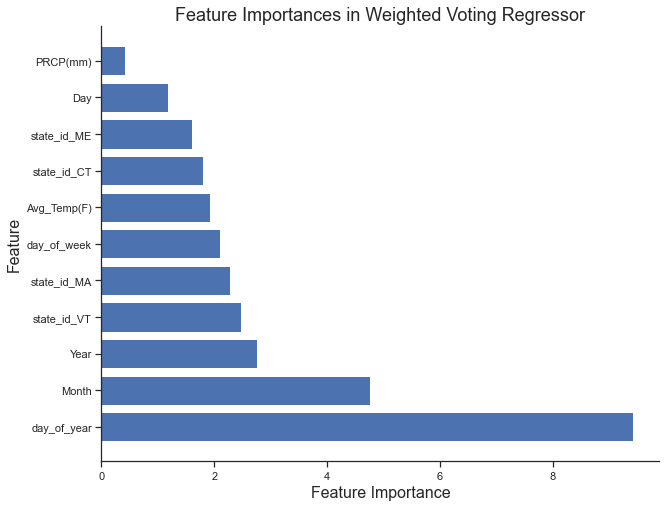

In [110]:
sns.set(rc={'figure.figsize':(10,8)})
sns.set_style("ticks")
fig, ax = plt.subplots()
plt.barh(feat_df['Feature'],
         feat_df['Feature Importance'])
plt.xlabel('Feature Importance', fontsize=16)
plt.ylabel('Feature', fontsize=16)
#ax.set_ylabel('Feature')
plt.title('Feature Importances in Weighted Voting Regressor', fontsize=18)
sns.despine()
plt.show()